https://github.com/TannerGilbert/MaskRCNN-Object-Detection-and-Segmentation/blob/master/MaskRCNN%20Microcontroller%20Detection.ipynb

In [1]:
#https://github.com/TannerGilbert/MaskRCNN-Object-Detection-and-Segmentation/blob/master/MaskRCNN%20Microcontroller%20Detection.ipynb
#https://towardsdatascience.com/mask-rcnn-implementation-on-a-custom-dataset-fd9a878123d4
#wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
#https://gilberttanner.com/blog/getting-started-with-mask-rcnn-in-keras
#https://github.com/AarohiSingla/Mask-RCNN-on-Custom-Dataset-2classes-/blob/main/custom.py
#https://blog.paperspace.com/mask-r-cnn-in-tensorflow-2-0/
#https://blog.paperspace.com/mean-average-precision/
#https://blog.paperspace.com/deep-learning-metrics-precision-recall-accuracy/
#https://medium.com/analytics-vidhya/a-simple-guide-to-maskrcnn-custom-dataset-implementation-27f7eab381f2

In [2]:
#https://towardsdatascience.com/mask-rcnn-implementation-on-a-custom-dataset-fd9a878123d4
#wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5
#https://gilberttanner.com/blog/getting-started-with-mask-rcnn-in-keras
#https://github.com/AarohiSingla/Mask-RCNN-on-Custom-Dataset-2classes-/blob/main/custom.py

In [3]:
#https://viso.ai/deep-learning/mask-r-cnn/#:~:text=Mask%20R%2DCNN%20is%20a,segmentation%20mask%20for%20each%20instance.
#https://towardsdatascience.com/r-cnn-fast-r-cnn-faster-r-cnn-yolo-object-detection-algorithms-36d53571365e
#https://towardsdatascience.com/computer-vision-instance-segmentation-with-mask-r-cnn-7983502fcad1
#https://medium.com/free-code-camp/mask-r-cnn-explained-7f82bec890e3
#https://developers.arcgis.com/python/guide/how-maskrcnn-works/

In [4]:
import warnings
#warnings.filterwarnings('ignore')
import os
import sys
import json
import datetime
import numpy as np
import skimage.draw
import cv2
import random
import math
import re
import time
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import xml.etree.ElementTree as ET


Instructions for updating:
non-resource variables are not supported in the long term


Using TensorFlow backend.


In [5]:
from google.colab import drive
drive.mount("/Mask_RCNN")

Drive already mounted at /Mask_RCNN; to attempt to forcibly remount, call drive.mount("/Mask_RCNN", force_remount=True).


In [6]:

#!unzip "/Mask_RCNN/MyDrive/Mask R-CNN/Mask_RCNN-master-20220318T125834Z-001.zip" -d "/Mask_RCNN/MyDrive/Mask R-CNN"

In [7]:
#from stackoverflow.com
!pip install keras==2.1.5

https://stackoverflow.com/questions/48905127/importing-py-files-in-google-colab

import sys 

sys.path.insert(0, '/content/drive/MyDrive/my_folder')

%cd /content/drive/MyDrive/my_folder

%pwd

In [8]:
sys.path.insert(0, '/Mask_RCNN/MyDrive/Mask R-CNN/Mask_RCNN-master/mrcnn/')
%cd /Mask_RCNN/MyDrive/Mask R-CNN/Mask_RCNN-master/mrcnn

/Mask_RCNN/MyDrive/Mask R-CNN/Mask_RCNN-master/mrcnn


In [9]:
%pwd

'/Mask_RCNN/MyDrive/Mask R-CNN/Mask_RCNN-master/mrcnn'

In [10]:
print(tf. __version__)

2.8.0


In [11]:
import utils
import visualize
from visualize import display_images
from visualize import display_instances
import model as modellib
from model import log
from config import Config
import model as modellib, utils

In [12]:
class CarConfig(Config):
    # Give the configuration a recognizable name
    NAME = "car_detection"
    
    NUM_CLASSES = 1 + 1

    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    # Number of training steps per epoch
    STEPS_PER_EPOCH = 1300
    # Skip detections with < 90% confidence
    DETECTION_MIN_CONFIDENCE = 0.9

config = CarConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [13]:
class CarDataset(utils.Dataset):
    def load_dataset(self, dataset_dir):
        self.add_class('dataset', 1, 'car')
        
        # find all images
        for i, filename in enumerate(os.listdir(dataset_dir)):
            if '.jpg' in filename:
                self.add_image('dataset', 
                               image_id=i, 
                               path=os.path.join(dataset_dir, filename), 
                               annotation=os.path.join(dataset_dir, filename.replace('.jpg', '.xml')))
    
    # extract bounding boxes from an annotation file
    def extract_boxes(self, filename):
        # load and parse the file
        tree = ET.parse(filename)
        # get the root of the document
        root = tree.getroot()
        # extract each bounding box
        boxes = []
        classes = []
        for member in root.findall('object'):
            xmin = int(member[4][0].text)
            ymin = int(member[4][1].text)
            xmax = int(member[4][2].text)
            ymax = int(member[4][3].text)
            boxes.append([xmin, ymin, xmax, ymax])
            classes.append(self.class_names.index(member[0].text))
        # extract image dimensions
        width = int(root.find('size')[0].text)
        height = int(root.find('size')[1].text)
        return boxes, classes, width, height
 
    # load the masks for an image
    def load_mask(self, image_id):
        # get details of image
        info = self.image_info[image_id]
        # define box file location
        path = info['annotation']
        # load XML
        boxes, classes, w, h = self.extract_boxes(path)
        # create one array for all masks, each on a different channel
        masks = np.zeros([h, w, len(boxes)], dtype='uint8')
        # create masks
        for i in range(len(boxes)):
            box = boxes[i]
            row_s, row_e = box[1], box[3]
            col_s, col_e = box[0], box[2]
            masks[row_s:row_e, col_s:col_e, i] = 1
        return masks, np.asarray(classes, dtype='int32')
    
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

In [14]:
# Create training and validation set
# train set
dataset_train = CarDataset()
dataset_train.load_dataset('/Mask_RCNN/MyDrive/Mask R-CNN/dataset/train')
dataset_train.prepare()
print('Train: %d' % len(dataset_train.image_ids))
 
# test/val set
dataset_val = CarDataset()
dataset_val.load_dataset('/Mask_RCNN/MyDrive/Mask R-CNN/dataset/val')
dataset_val.prepare()
print('Test: %d' % len(dataset_val.image_ids))

Train: 218
Test: 52


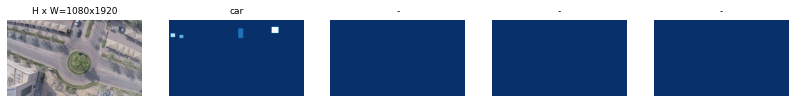

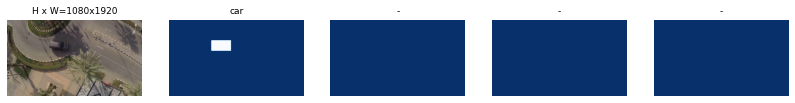

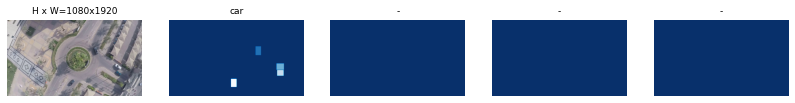

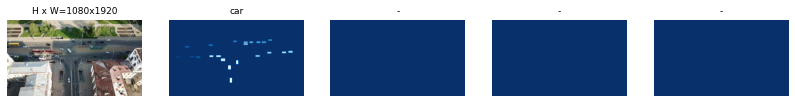

In [15]:

# Load and display random samples
image_ids = np.random.choice(dataset_train.image_ids, 4)
for image_id in image_ids:
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_train.class_names)



In [16]:

# Create model in training mode

MODEL_DIR="/Mask_RCNN/MyDrive/Mask R-CNN/logs"
#https://stackoverflow.com/questions/37383812/tensorflow-module-object-has-no-attribute-placeholder
#AttributeError: module 'tensorflow' has no attribute 'placeholder'

###################   507 number line er error er jonn nicher ai code gulo tensorflow_backend.py te gia likbo
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
model = modellib.MaskRCNN(
        mode="training", 
        config=config,
        model_dir=MODEL_DIR)


Instructions for updating:
box_ind is deprecated, use box_indices instead


In [17]:

# Path to trained weights file
COCO_WEIGHTS_PATH = "/Mask_RCNN/MyDrive/Mask R-CNN/Coco weight Mask R-CNN/mask_rcnn_coco.h5"

#https://stackoverflow.com/questions/28583565/str-object-has-no-attribute-decode-python-3-error
#  topology.py te gia 2929,2934,3407,3411, number line nicher kaj korbo
#  Simply drop the .decode('utf-8') part:    (just delete the .decode('utf8'))
#     original_keras_version = f.attrs['keras_version']#.decode('utf8')

#https://blog.paperspace.com/mask-r-cnn-in-tensorflow-2-0/
model.load_weights(COCO_WEIGHTS_PATH, 
                   by_name=True, 
                   exclude=["mrcnn_class_logits", 
                            "mrcnn_bbox_fc", 
                            "mrcnn_bbox", 
                            "mrcnn_mask"])


**Training**

https://stackoverflow.com/questions/64171099/maskrcnn-false-positives

In [ ]:

#https://stackoverflow.com/questions/55118193/projector-in-tensorflow-v2-alpha

#############   callbacks.py te gia 684 number line a ai code ta likbo   
#   from tensorboard.plugins import projector

#https://stackoverflow.com/questions/61250311/error-importing-bert-module-tensorflow-api-v2-train-has-no-attribute-optimi
############   optimizers.py er 757 number line a gia nicher code ti likbo 
#      tf.compat.v1.train.Optimizer

#https://stackoverflow.com/questions/42481938/attributeerror-module-object-has-no-attribute-merge-all-summaries
##########  callbacks.py  a gia nicher code ti likbo
#      import tensorflow as tf                    (first line er dikhe)
#      tf.compat.v1.summary.merge_all()           (776 number line a )
#      tf.compat.v1.summary.FileWriter()          (779, 782 number line a)
#      tf.compat.v1.Summary()                     (862 number line a )


# Train the head branches
# Passing layers="heads" freezes all layers except the head
# layers. You can also pass a regular expression to select
# which layers to train by name pattern.
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=200, 
            layers='heads')


Starting at epoch 0. LR=0.001

Checkpoint Path: /Mask_RCNN/MyDrive/Mask R-CNN/logs/car_detection20220319T0107/mask_rcnn_car_detection_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeD

/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:446: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/roi_align_classifier/concat_grad/sub:0", shape=(?,), dtype=int32), values=Tensor("training/SGD/gradients/roi_align_classifier/concat_grad/GatherV2_2:0", shape=(?, 7, 7, 256), dtype=float32), dense_shape=Tensor("training/SGD/gradients/roi_align_classifier/concat_grad/Shape:0", shape=(4,), dtype=int32))) to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "shape. This may consume a large amount of memory." % value)
/usr/local/lib/python3.7/dist-packages/tensorflow/python/framework/indexed_slices.py:446: UserWarning: Converting sparse IndexedSlices(IndexedSlices(indices=Tensor("training/SGD/gradients/roi_align_classifier/concat_grad/sub_1:0", shape=(?,), dtype=int32), values=Tensor("training/SGD/gradients/roi_align_classifier/concat_grad/GatherV2_5:0", shape=(?, 7, 7, 256), d

Epoch 1/200


/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   1/1300 [..............................] - ETA: 13:55:36 - loss: 35.2496 - rpn_class_loss: 10.5747 - rpn_bbox_loss: 7.6777 - mrcnn_class_loss: 16.9971 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   2/1300 [..............................] - ETA: 7:13:16 - loss: 32.8611 - rpn_class_loss: 9.7245 - rpn_bbox_loss: 12.1283 - mrcnn_class_loss: 11.0083 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   3/1300 [..............................] - ETA: 4:59:07 - loss: 29.6239 - rpn_class_loss: 9.5017 - rpn_bbox_loss: 12.7833 - mrcnn_class_loss: 7.3389 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 3:51:55 - loss: 26.7117 - rpn_class_loss: 8.3217 - rpn_bbox_loss: 12.8858 - mrcnn_class_loss: 5.5041 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   5/1300 [..............................] - ETA: 3:11:23 - loss: 23.5556 - rpn_class_loss: 7.4703 - rpn_bbox_loss: 11.6819 - mrcnn_class_loss: 4.4033 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 2:44:25 - loss: 21.4898 - rpn_class_loss: 7.1422 - rpn_bbox_loss: 10.6781 - mrcnn_class_loss: 3.6694 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   7/1300 [..............................] - ETA: 2:25:16 - loss: 20.5394 - rpn_class_loss: 7.4165 - rpn_bbox_loss: 9.9777 - mrcnn_class_loss: 3.1452 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 2:10:47 - loss: 19.4861 - rpn_class_loss: 6.7696 - rpn_bbox_loss: 9.9644 - mrcnn_class_loss: 2.7521 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

   9/1300 [..............................] - ETA: 1:59:32 - loss: 18.5008 - rpn_class_loss: 6.4288 - rpn_bbox_loss: 9.6257 - mrcnn_class_loss: 2.4463 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 1:50:32 - loss: 17.8688 - rpn_class_loss: 6.2282 - rpn_bbox_loss: 9.4389 - mrcnn_class_loss: 2.2017 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 1:37:05 - loss: 16.3794 - rpn_class_loss: 5.7832 - rpn_bbox_loss: 8.7614 - mrcnn_class_loss: 1.8347 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  13/1300 [..............................] - ETA: 1:31:56 - loss: 15.6029 - rpn_class_loss: 5.4833 - rpn_bbox_loss: 8.4260 - mrcnn_class_loss: 1.6936 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 1:27:29 - loss: 15.0529 - rpn_class_loss: 5.1666 - rpn_bbox_loss: 8.3138 - mrcnn_class_loss: 1.5726 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 1:23:39 - loss: 14.9335 - rpn_class_loss: 5.0787 - rpn_bbox_loss: 8.3870 - mrcnn_class_loss: 1.4678 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  16/1300 [..............................] - ETA: 1:20:18 - loss: 14.9348 - rpn_class_loss: 5.3159 - rpn_bbox_loss: 8.2428 - mrcnn_class_loss: 1.3760 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 1:17:20 - loss: 14.8717 - rpn_class_loss: 5.3609 - rpn_bbox_loss: 8.2157 - mrcnn_class_loss: 1.2951 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 1:14:42 - loss: 14.5752 - rpn_class_loss: 5.1088 - rpn_bbox_loss: 8.2433 - mrcnn_class_loss: 1.2231 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  19/1300 [..............................] - ETA: 1:12:20 - loss: 14.4330 - rpn_class_loss: 4.8718 - rpn_bbox_loss: 8.4025 - mrcnn_class_loss: 1.1588 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 1:10:11 - loss: 14.0093 - rpn_class_loss: 4.6907 - rpn_bbox_loss: 8.2178 - mrcnn_class_loss: 1.1008 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 1:08:17 - loss: 13.7830 - rpn_class_loss: 4.5027 - rpn_bbox_loss: 8.2319 - mrcnn_class_loss: 1.0484 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  22/1300 [..............................] - ETA: 1:06:32 - loss: 13.4559 - rpn_class_loss: 4.3796 - rpn_bbox_loss: 8.0756 - mrcnn_class_loss: 1.0008 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 1:05:05 - loss: 13.1841 - rpn_class_loss: 4.2561 - rpn_bbox_loss: 7.9707 - mrcnn_class_loss: 0.9572 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  24/1300 [..............................] - ETA: 1:03:33 - loss: 13.1462 - rpn_class_loss: 4.3782 - rpn_bbox_loss: 7.8507 - mrcnn_class_loss: 0.9174 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 1:02:11 - loss: 13.0895 - rpn_class_loss: 4.3709 - rpn_bbox_loss: 7.8379 - mrcnn_class_loss: 0.8807 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 1:00:57 - loss: 12.7796 - rpn_class_loss: 4.2259 - rpn_bbox_loss: 7.7069 - mrcnn_class_loss: 0.8468 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 59:47 - loss: 12.6716 - rpn_class_loss: 4.1772 - rpn_bbox_loss: 7.6790 - mrcnn_class_loss: 0.8154 - mrcnn_bbox_loss: 0.0000e+00 - mrcnn_mask_loss: 0.0000e+00  

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  28/1300 [..............................] - ETA: 59:16 - loss: 12.8686 - rpn_class_loss: 4.2168 - rpn_bbox_loss: 7.6049 - mrcnn_class_loss: 0.7901 - mrcnn_bbox_loss: 0.2208 - mrcnn_mask_loss: 0.0361        

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 58:14 - loss: 12.6614 - rpn_class_loss: 4.1457 - rpn_bbox_loss: 7.5049 - mrcnn_class_loss: 0.7628 - mrcnn_bbox_loss: 0.2132 - mrcnn_mask_loss: 0.0348

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  30/1300 [..............................] - ETA: 57:15 - loss: 12.6244 - rpn_class_loss: 4.1410 - rpn_bbox_loss: 7.5063 - mrcnn_class_loss: 0.7374 - mrcnn_bbox_loss: 0.2061 - mrcnn_mask_loss: 0.0336

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 56:20 - loss: 12.4189 - rpn_class_loss: 4.0580 - rpn_bbox_loss: 7.4152 - mrcnn_class_loss: 0.7136 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.0326

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 55:29 - loss: 12.2431 - rpn_class_loss: 3.9830 - rpn_bbox_loss: 7.3440 - mrcnn_class_loss: 0.6913 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.0315

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 54:41 - loss: 12.1814 - rpn_class_loss: 3.9179 - rpn_bbox_loss: 7.2383 - mrcnn_class_loss: 0.6745 - mrcnn_bbox_loss: 0.2946 - mrcnn_mask_loss: 0.0562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 53:55 - loss: 12.2126 - rpn_class_loss: 3.8216 - rpn_bbox_loss: 7.3959 - mrcnn_class_loss: 0.6547 - mrcnn_bbox_loss: 0.2859 - mrcnn_mask_loss: 0.0545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 53:14 - loss: 12.1853 - rpn_class_loss: 3.8314 - rpn_bbox_loss: 7.3873 - mrcnn_class_loss: 0.6360 - mrcnn_bbox_loss: 0.2778 - mrcnn_mask_loss: 0.0529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  36/1300 [..............................] - ETA: 52:34 - loss: 12.3435 - rpn_class_loss: 3.7866 - rpn_bbox_loss: 7.4376 - mrcnn_class_loss: 0.6263 - mrcnn_bbox_loss: 0.4123 - mrcnn_mask_loss: 0.0807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 51:56 - loss: 12.4495 - rpn_class_loss: 3.7543 - rpn_bbox_loss: 7.4657 - mrcnn_class_loss: 0.6191 - mrcnn_bbox_loss: 0.5075 - mrcnn_mask_loss: 0.1028

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 51:21 - loss: 12.4267 - rpn_class_loss: 3.6996 - rpn_bbox_loss: 7.4092 - mrcnn_class_loss: 0.6062 - mrcnn_bbox_loss: 0.5892 - mrcnn_mask_loss: 0.1225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 50:47 - loss: 12.4890 - rpn_class_loss: 3.6393 - rpn_bbox_loss: 7.4017 - mrcnn_class_loss: 0.6059 - mrcnn_bbox_loss: 0.6865 - mrcnn_mask_loss: 0.1557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 50:13 - loss: 12.4191 - rpn_class_loss: 3.5623 - rpn_bbox_loss: 7.4449 - mrcnn_class_loss: 0.5908 - mrcnn_bbox_loss: 0.6693 - mrcnn_mask_loss: 0.1518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 49:41 - loss: 12.4720 - rpn_class_loss: 3.5146 - rpn_bbox_loss: 7.4516 - mrcnn_class_loss: 0.5828 - mrcnn_bbox_loss: 0.7446 - mrcnn_mask_loss: 0.1784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 49:11 - loss: 12.3370 - rpn_class_loss: 3.4581 - rpn_bbox_loss: 7.4090 - mrcnn_class_loss: 0.5689 - mrcnn_bbox_loss: 0.7268 - mrcnn_mask_loss: 0.1742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

  43/1300 [..............................] - ETA: 48:43 - loss: 12.1962 - rpn_class_loss: 3.4310 - rpn_bbox_loss: 7.3295 - mrcnn_class_loss: 0.5557 - mrcnn_bbox_loss: 0.7099 - mrcnn_mask_loss: 0.1701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 47:53 - loss: 12.0791 - rpn_class_loss: 3.3510 - rpn_bbox_loss: 7.1745 - mrcnn_class_loss: 0.5338 - mrcnn_bbox_loss: 0.8388 - mrcnn_mask_loss: 0.1809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 47:29 - loss: 12.0758 - rpn_class_loss: 3.4111 - rpn_bbox_loss: 7.1450 - mrcnn_class_loss: 0.5222 - mrcnn_bbox_loss: 0.8206 - mrcnn_mask_loss: 0.1770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 47:05 - loss: 12.1643 - rpn_class_loss: 3.3719 - rpn_bbox_loss: 7.1089 - mrcnn_class_loss: 0.5187 - mrcnn_bbox_loss: 0.9728 - mrcnn_mask_loss: 0.1920

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 46:19 - loss: 11.9350 - rpn_class_loss: 3.2795 - rpn_bbox_loss: 7.0407 - mrcnn_class_loss: 0.4975 - mrcnn_bbox_loss: 0.9331 - mrcnn_mask_loss: 0.1841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 45:57 - loss: 11.8552 - rpn_class_loss: 3.2496 - rpn_bbox_loss: 7.0232 - mrcnn_class_loss: 0.4876 - mrcnn_bbox_loss: 0.9144 - mrcnn_mask_loss: 0.1804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 45:36 - loss: 11.7972 - rpn_class_loss: 3.2725 - rpn_bbox_loss: 6.9733 - mrcnn_class_loss: 0.4780 - mrcnn_bbox_loss: 0.8965 - mrcnn_mask_loss: 0.1769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 45:16 - loss: 11.6392 - rpn_class_loss: 3.2189 - rpn_bbox_loss: 6.8987 - mrcnn_class_loss: 0.4688 - mrcnn_bbox_loss: 0.8793 - mrcnn_mask_loss: 0.1735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 44:37 - loss: 11.5079 - rpn_class_loss: 3.1336 - rpn_bbox_loss: 6.9090 - mrcnn_class_loss: 0.4515 - mrcnn_bbox_loss: 0.8467 - mrcnn_mask_loss: 0.1671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 44:18 - loss: 11.4382 - rpn_class_loss: 3.0947 - rpn_bbox_loss: 6.9049 - mrcnn_class_loss: 0.4432 - mrcnn_bbox_loss: 0.8313 - mrcnn_mask_loss: 0.1640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 44:01 - loss: 11.4046 - rpn_class_loss: 3.0476 - rpn_bbox_loss: 6.9441 - mrcnn_class_loss: 0.4353 - mrcnn_bbox_loss: 0.8165 - mrcnn_mask_loss: 0.1611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 43:28 - loss: 11.2251 - rpn_class_loss: 2.9713 - rpn_bbox_loss: 6.8896 - mrcnn_class_loss: 0.4203 - mrcnn_bbox_loss: 0.7883 - mrcnn_mask_loss: 0.1556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 43:11 - loss: 11.1236 - rpn_class_loss: 2.9243 - rpn_bbox_loss: 6.8583 - mrcnn_class_loss: 0.4132 - mrcnn_bbox_loss: 0.7749 - mrcnn_mask_loss: 0.1529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 42:39 - loss: 10.9494 - rpn_class_loss: 2.8661 - rpn_bbox_loss: 6.7446 - mrcnn_class_loss: 0.3997 - mrcnn_bbox_loss: 0.7750 - mrcnn_mask_loss: 0.1641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 42:09 - loss: 10.8102 - rpn_class_loss: 2.7919 - rpn_bbox_loss: 6.7221 - mrcnn_class_loss: 0.3870 - mrcnn_bbox_loss: 0.7504 - mrcnn_mask_loss: 0.1588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 41:55 - loss: 10.7455 - rpn_class_loss: 2.7525 - rpn_bbox_loss: 6.7170 - mrcnn_class_loss: 0.3809 - mrcnn_bbox_loss: 0.7387 - mrcnn_mask_loss: 0.1564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 41:28 - loss: 10.8501 - rpn_class_loss: 2.6890 - rpn_bbox_loss: 6.8118 - mrcnn_class_loss: 0.3721 - mrcnn_bbox_loss: 0.8138 - mrcnn_mask_loss: 0.1633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 41:15 - loss: 10.9460 - rpn_class_loss: 2.6668 - rpn_bbox_loss: 6.8276 - mrcnn_class_loss: 0.3737 - mrcnn_bbox_loss: 0.9048 - mrcnn_mask_loss: 0.1731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 40:50 - loss: 10.9641 - rpn_class_loss: 2.6129 - rpn_bbox_loss: 6.8357 - mrcnn_class_loss: 0.3732 - mrcnn_bbox_loss: 0.9537 - mrcnn_mask_loss: 0.1887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 40:37 - loss: 10.9149 - rpn_class_loss: 2.5803 - rpn_bbox_loss: 6.8407 - mrcnn_class_loss: 0.3678 - mrcnn_bbox_loss: 0.9401 - mrcnn_mask_loss: 0.1860

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/1300 [>.............................] - ETA: 40:26 - loss: 10.8783 - rpn_class_loss: 2.5511 - rpn_bbox_loss: 6.8543 - mrcnn_class_loss: 0.3627 - mrcnn_bbox_loss: 0.9268 - mrcnn_mask_loss: 0.1833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 40:02 - loss: 10.7074 - rpn_class_loss: 2.4884 - rpn_bbox_loss: 6.7866 - mrcnn_class_loss: 0.3527 - mrcnn_bbox_loss: 0.9015 - mrcnn_mask_loss: 0.1783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 39:40 - loss: 10.6466 - rpn_class_loss: 2.4619 - rpn_bbox_loss: 6.7904 - mrcnn_class_loss: 0.3433 - mrcnn_bbox_loss: 0.8774 - mrcnn_mask_loss: 0.1736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 39:20 - loss: 10.7730 - rpn_class_loss: 2.4234 - rpn_bbox_loss: 6.7438 - mrcnn_class_loss: 0.3347 - mrcnn_bbox_loss: 1.0934 - mrcnn_mask_loss: 0.1778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 39:10 - loss: 10.7100 - rpn_class_loss: 2.4074 - rpn_bbox_loss: 6.7174 - mrcnn_class_loss: 0.3304 - mrcnn_bbox_loss: 1.0794 - mrcnn_mask_loss: 0.1755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 38:51 - loss: 10.5970 - rpn_class_loss: 2.3651 - rpn_bbox_loss: 6.6863 - mrcnn_class_loss: 0.3221 - mrcnn_bbox_loss: 1.0524 - mrcnn_mask_loss: 0.1711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 38:41 - loss: 10.5483 - rpn_class_loss: 2.3504 - rpn_bbox_loss: 6.6714 - mrcnn_class_loss: 0.3181 - mrcnn_bbox_loss: 1.0394 - mrcnn_mask_loss: 0.1690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 38:33 - loss: 10.6717 - rpn_class_loss: 2.3488 - rpn_bbox_loss: 6.6273 - mrcnn_class_loss: 0.3152 - mrcnn_bbox_loss: 1.2050 - mrcnn_mask_loss: 0.1753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 38:15 - loss: 10.7365 - rpn_class_loss: 2.2990 - rpn_bbox_loss: 6.5876 - mrcnn_class_loss: 0.3090 - mrcnn_bbox_loss: 1.3614 - mrcnn_mask_loss: 0.1795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 38:06 - loss: 10.6824 - rpn_class_loss: 2.2739 - rpn_bbox_loss: 6.5804 - mrcnn_class_loss: 0.3053 - mrcnn_bbox_loss: 1.3454 - mrcnn_mask_loss: 0.1774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 37:49 - loss: 10.8205 - rpn_class_loss: 2.2500 - rpn_bbox_loss: 6.5759 - mrcnn_class_loss: 0.3000 - mrcnn_bbox_loss: 1.5050 - mrcnn_mask_loss: 0.1896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 37:41 - loss: 10.8675 - rpn_class_loss: 2.2323 - rpn_bbox_loss: 6.5727 - mrcnn_class_loss: 0.2981 - mrcnn_bbox_loss: 1.5689 - mrcnn_mask_loss: 0.1954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 37:34 - loss: 10.8919 - rpn_class_loss: 2.2425 - rpn_bbox_loss: 6.5551 - mrcnn_class_loss: 0.2972 - mrcnn_bbox_loss: 1.5966 - mrcnn_mask_loss: 0.2006

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 37:26 - loss: 10.8937 - rpn_class_loss: 2.2279 - rpn_bbox_loss: 6.5341 - mrcnn_class_loss: 0.2940 - mrcnn_bbox_loss: 1.6320 - mrcnn_mask_loss: 0.2058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 37:19 - loss: 11.0188 - rpn_class_loss: 2.2120 - rpn_bbox_loss: 6.6985 - mrcnn_class_loss: 0.2908 - mrcnn_bbox_loss: 1.6141 - mrcnn_mask_loss: 0.2035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 37:12 - loss: 11.0664 - rpn_class_loss: 2.1987 - rpn_bbox_loss: 6.7824 - mrcnn_class_loss: 0.2876 - mrcnn_bbox_loss: 1.5965 - mrcnn_mask_loss: 0.2013

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 36:57 - loss: 11.2213 - rpn_class_loss: 2.1643 - rpn_bbox_loss: 6.8884 - mrcnn_class_loss: 0.2815 - mrcnn_bbox_loss: 1.6800 - mrcnn_mask_loss: 0.2070

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 36:42 - loss: 11.1747 - rpn_class_loss: 2.1286 - rpn_bbox_loss: 6.9227 - mrcnn_class_loss: 0.2757 - mrcnn_bbox_loss: 1.6450 - mrcnn_mask_loss: 0.2027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 36:35 - loss: 11.1462 - rpn_class_loss: 2.1096 - rpn_bbox_loss: 6.9351 - mrcnn_class_loss: 0.2728 - mrcnn_bbox_loss: 1.6281 - mrcnn_mask_loss: 0.2006

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 36:30 - loss: 11.3254 - rpn_class_loss: 2.1054 - rpn_bbox_loss: 6.9928 - mrcnn_class_loss: 0.2705 - mrcnn_bbox_loss: 1.7519 - mrcnn_mask_loss: 0.2047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 36:17 - loss: 11.2709 - rpn_class_loss: 2.0764 - rpn_bbox_loss: 7.0119 - mrcnn_class_loss: 0.2651 - mrcnn_bbox_loss: 1.7169 - mrcnn_mask_loss: 0.2006

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 36:10 - loss: 11.5443 - rpn_class_loss: 2.0845 - rpn_bbox_loss: 6.9927 - mrcnn_class_loss: 0.2629 - mrcnn_bbox_loss: 1.9963 - mrcnn_mask_loss: 0.2078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 35:57 - loss: 11.6144 - rpn_class_loss: 2.0868 - rpn_bbox_loss: 7.0033 - mrcnn_class_loss: 0.2578 - mrcnn_bbox_loss: 2.0565 - mrcnn_mask_loss: 0.2101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 35:44 - loss: 11.7101 - rpn_class_loss: 2.0515 - rpn_bbox_loss: 7.0558 - mrcnn_class_loss: 0.2531 - mrcnn_bbox_loss: 2.1367 - mrcnn_mask_loss: 0.2131

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 35:32 - loss: 11.8054 - rpn_class_loss: 2.0365 - rpn_bbox_loss: 7.0477 - mrcnn_class_loss: 0.2523 - mrcnn_bbox_loss: 2.2477 - mrcnn_mask_loss: 0.2212

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 35:26 - loss: 11.8136 - rpn_class_loss: 2.0208 - rpn_bbox_loss: 7.0213 - mrcnn_class_loss: 0.2505 - mrcnn_bbox_loss: 2.2958 - mrcnn_mask_loss: 0.2252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 35:15 - loss: 11.8002 - rpn_class_loss: 2.0073 - rpn_bbox_loss: 7.0223 - mrcnn_class_loss: 0.2462 - mrcnn_bbox_loss: 2.2977 - mrcnn_mask_loss: 0.2268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 35:04 - loss: 11.6942 - rpn_class_loss: 1.9879 - rpn_bbox_loss: 6.9851 - mrcnn_class_loss: 0.2418 - mrcnn_bbox_loss: 2.2567 - mrcnn_mask_loss: 0.2227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 34:53 - loss: 11.7122 - rpn_class_loss: 1.9706 - rpn_bbox_loss: 7.0681 - mrcnn_class_loss: 0.2375 - mrcnn_bbox_loss: 2.2171 - mrcnn_mask_loss: 0.2188

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 34:47 - loss: 11.6727 - rpn_class_loss: 1.9583 - rpn_bbox_loss: 7.0642 - mrcnn_class_loss: 0.2355 - mrcnn_bbox_loss: 2.1978 - mrcnn_mask_loss: 0.2169

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 34:36 - loss: 11.6208 - rpn_class_loss: 1.9330 - rpn_bbox_loss: 7.0830 - mrcnn_class_loss: 0.2315 - mrcnn_bbox_loss: 2.1602 - mrcnn_mask_loss: 0.2132

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 34:31 - loss: 11.5966 - rpn_class_loss: 1.9208 - rpn_bbox_loss: 7.0930 - mrcnn_class_loss: 0.2295 - mrcnn_bbox_loss: 2.1419 - mrcnn_mask_loss: 0.2114

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 34:26 - loss: 11.5599 - rpn_class_loss: 1.9106 - rpn_bbox_loss: 7.0882 - mrcnn_class_loss: 0.2276 - mrcnn_bbox_loss: 2.1239 - mrcnn_mask_loss: 0.2096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 34:16 - loss: 11.5494 - rpn_class_loss: 1.9303 - rpn_bbox_loss: 7.0422 - mrcnn_class_loss: 0.2244 - mrcnn_bbox_loss: 2.1420 - mrcnn_mask_loss: 0.2104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 34:11 - loss: 11.5076 - rpn_class_loss: 1.9431 - rpn_bbox_loss: 7.0088 - mrcnn_class_loss: 0.2226 - mrcnn_bbox_loss: 2.1245 - mrcnn_mask_loss: 0.2087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 34:01 - loss: 11.5425 - rpn_class_loss: 1.9244 - rpn_bbox_loss: 6.9966 - mrcnn_class_loss: 0.2190 - mrcnn_bbox_loss: 2.1912 - mrcnn_mask_loss: 0.2112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 33:52 - loss: 11.5041 - rpn_class_loss: 1.9246 - rpn_bbox_loss: 6.9996 - mrcnn_class_loss: 0.2156 - mrcnn_bbox_loss: 2.1564 - mrcnn_mask_loss: 0.2079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 33:43 - loss: 11.5257 - rpn_class_loss: 1.9043 - rpn_bbox_loss: 6.9680 - mrcnn_class_loss: 0.2122 - mrcnn_bbox_loss: 2.2314 - mrcnn_mask_loss: 0.2099

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 33:35 - loss: 11.4763 - rpn_class_loss: 1.8867 - rpn_bbox_loss: 6.9769 - mrcnn_class_loss: 0.2090 - mrcnn_bbox_loss: 2.1970 - mrcnn_mask_loss: 0.2067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 33:27 - loss: 11.4979 - rpn_class_loss: 1.8622 - rpn_bbox_loss: 6.9852 - mrcnn_class_loss: 0.2065 - mrcnn_bbox_loss: 2.2312 - mrcnn_mask_loss: 0.2129

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 33:22 - loss: 11.4665 - rpn_class_loss: 1.8742 - rpn_bbox_loss: 6.9616 - mrcnn_class_loss: 0.2049 - mrcnn_bbox_loss: 2.2144 - mrcnn_mask_loss: 0.2113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 33:15 - loss: 11.3683 - rpn_class_loss: 1.8515 - rpn_bbox_loss: 6.9251 - mrcnn_class_loss: 0.2019 - mrcnn_bbox_loss: 2.1816 - mrcnn_mask_loss: 0.2082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 33:11 - loss: 11.3310 - rpn_class_loss: 1.8548 - rpn_bbox_loss: 6.9035 - mrcnn_class_loss: 0.2004 - mrcnn_bbox_loss: 2.1656 - mrcnn_mask_loss: 0.2067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 33:08 - loss: 11.3199 - rpn_class_loss: 1.8700 - rpn_bbox_loss: 6.8960 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 2.1498 - mrcnn_mask_loss: 0.2052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 32:59 - loss: 11.2729 - rpn_class_loss: 1.8590 - rpn_bbox_loss: 6.8967 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 2.1188 - mrcnn_mask_loss: 0.2022

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 32:55 - loss: 11.2472 - rpn_class_loss: 1.8566 - rpn_bbox_loss: 6.8914 - mrcnn_class_loss: 0.1947 - mrcnn_bbox_loss: 2.1037 - mrcnn_mask_loss: 0.2008

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 32:47 - loss: 11.1749 - rpn_class_loss: 1.8492 - rpn_bbox_loss: 6.8617 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 2.0741 - mrcnn_mask_loss: 0.1979

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 32:39 - loss: 11.1248 - rpn_class_loss: 1.8322 - rpn_bbox_loss: 6.8224 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 2.0811 - mrcnn_mask_loss: 0.1996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 32:36 - loss: 11.1023 - rpn_class_loss: 1.8289 - rpn_bbox_loss: 6.7945 - mrcnn_class_loss: 0.1888 - mrcnn_bbox_loss: 2.0872 - mrcnn_mask_loss: 0.2030

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 32:32 - loss: 11.0847 - rpn_class_loss: 1.8201 - rpn_bbox_loss: 6.7707 - mrcnn_class_loss: 0.1875 - mrcnn_bbox_loss: 2.0998 - mrcnn_mask_loss: 0.2066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 32:28 - loss: 11.0740 - rpn_class_loss: 1.8099 - rpn_bbox_loss: 6.7600 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 2.1080 - mrcnn_mask_loss: 0.2094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 32:25 - loss: 11.0470 - rpn_class_loss: 1.8055 - rpn_bbox_loss: 6.7372 - mrcnn_class_loss: 0.1855 - mrcnn_bbox_loss: 2.1061 - mrcnn_mask_loss: 0.2127

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 32:18 - loss: 10.9930 - rpn_class_loss: 1.7935 - rpn_bbox_loss: 6.6965 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 2.1008 - mrcnn_mask_loss: 0.2189

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 32:10 - loss: 10.9585 - rpn_class_loss: 1.7821 - rpn_bbox_loss: 6.6646 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 2.1058 - mrcnn_mask_loss: 0.2245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 32:07 - loss: 10.9248 - rpn_class_loss: 1.7758 - rpn_bbox_loss: 6.6537 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 2.0921 - mrcnn_mask_loss: 0.2230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 32:03 - loss: 10.8820 - rpn_class_loss: 1.7687 - rpn_bbox_loss: 6.6342 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 2.0785 - mrcnn_mask_loss: 0.2216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 32:00 - loss: 10.8557 - rpn_class_loss: 1.7614 - rpn_bbox_loss: 6.6312 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 2.0651 - mrcnn_mask_loss: 0.2202

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 31:56 - loss: 10.8436 - rpn_class_loss: 1.7568 - rpn_bbox_loss: 6.6053 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 2.0777 - mrcnn_mask_loss: 0.2225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 31:53 - loss: 10.8361 - rpn_class_loss: 1.7548 - rpn_bbox_loss: 6.5949 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 2.0806 - mrcnn_mask_loss: 0.2253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 31:46 - loss: 10.7908 - rpn_class_loss: 1.7399 - rpn_bbox_loss: 6.5958 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 2.0544 - mrcnn_mask_loss: 0.2225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 31:43 - loss: 10.7588 - rpn_class_loss: 1.7317 - rpn_bbox_loss: 6.5873 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 2.0415 - mrcnn_mask_loss: 0.2211

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 31:40 - loss: 10.7377 - rpn_class_loss: 1.7245 - rpn_bbox_loss: 6.5758 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 2.0364 - mrcnn_mask_loss: 0.2243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 31:38 - loss: 10.7094 - rpn_class_loss: 1.7174 - rpn_bbox_loss: 6.5518 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 2.0371 - mrcnn_mask_loss: 0.2273

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 31:31 - loss: 10.6613 - rpn_class_loss: 1.7003 - rpn_bbox_loss: 6.5396 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 2.0185 - mrcnn_mask_loss: 0.2292

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 31:27 - loss: 10.6432 - rpn_class_loss: 1.6956 - rpn_bbox_loss: 6.5408 - mrcnn_class_loss: 0.1727 - mrcnn_bbox_loss: 2.0063 - mrcnn_mask_loss: 0.2278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 31:25 - loss: 10.7869 - rpn_class_loss: 1.6880 - rpn_bbox_loss: 6.7066 - mrcnn_class_loss: 0.1716 - mrcnn_bbox_loss: 1.9942 - mrcnn_mask_loss: 0.2264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 31:19 - loss: 10.7073 - rpn_class_loss: 1.6714 - rpn_bbox_loss: 6.6722 - mrcnn_class_loss: 0.1696 - mrcnn_bbox_loss: 1.9704 - mrcnn_mask_loss: 0.2237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 31:16 - loss: 10.6920 - rpn_class_loss: 1.6681 - rpn_bbox_loss: 6.6741 - mrcnn_class_loss: 0.1686 - mrcnn_bbox_loss: 1.9588 - mrcnn_mask_loss: 0.2224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 31:13 - loss: 10.6775 - rpn_class_loss: 1.6621 - rpn_bbox_loss: 6.6795 - mrcnn_class_loss: 0.1676 - mrcnn_bbox_loss: 1.9473 - mrcnn_mask_loss: 0.2211

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 31:07 - loss: 10.6619 - rpn_class_loss: 1.6490 - rpn_bbox_loss: 6.6658 - mrcnn_class_loss: 0.1659 - mrcnn_bbox_loss: 1.9578 - mrcnn_mask_loss: 0.2233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 31:04 - loss: 10.6541 - rpn_class_loss: 1.6426 - rpn_bbox_loss: 6.6574 - mrcnn_class_loss: 0.1650 - mrcnn_bbox_loss: 1.9628 - mrcnn_mask_loss: 0.2261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 31:01 - loss: 10.6463 - rpn_class_loss: 1.6362 - rpn_bbox_loss: 6.6696 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 1.9515 - mrcnn_mask_loss: 0.2248

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 30:58 - loss: 10.6341 - rpn_class_loss: 1.6284 - rpn_bbox_loss: 6.6606 - mrcnn_class_loss: 0.1646 - mrcnn_bbox_loss: 1.9530 - mrcnn_mask_loss: 0.2275

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 30:52 - loss: 10.6099 - rpn_class_loss: 1.6299 - rpn_bbox_loss: 6.6336 - mrcnn_class_loss: 0.1652 - mrcnn_bbox_loss: 1.9480 - mrcnn_mask_loss: 0.2333

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 30:49 - loss: 10.5985 - rpn_class_loss: 1.6228 - rpn_bbox_loss: 6.6296 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 1.9454 - mrcnn_mask_loss: 0.2360

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 30:46 - loss: 10.5878 - rpn_class_loss: 1.6224 - rpn_bbox_loss: 6.6171 - mrcnn_class_loss: 0.1647 - mrcnn_bbox_loss: 1.9448 - mrcnn_mask_loss: 0.2389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 30:43 - loss: 10.5775 - rpn_class_loss: 1.6164 - rpn_bbox_loss: 6.6257 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 1.9340 - mrcnn_mask_loss: 0.2375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 30:41 - loss: 10.5556 - rpn_class_loss: 1.6134 - rpn_bbox_loss: 6.6072 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 1.9311 - mrcnn_mask_loss: 0.2401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 30:38 - loss: 10.5495 - rpn_class_loss: 1.6116 - rpn_bbox_loss: 6.6019 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 1.9301 - mrcnn_mask_loss: 0.2428

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 30:35 - loss: 10.5232 - rpn_class_loss: 1.6100 - rpn_bbox_loss: 6.5899 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 1.9196 - mrcnn_mask_loss: 0.2415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 30:29 - loss: 10.4409 - rpn_class_loss: 1.6048 - rpn_bbox_loss: 6.5379 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 1.8988 - mrcnn_mask_loss: 0.2389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 30:26 - loss: 10.4142 - rpn_class_loss: 1.6022 - rpn_bbox_loss: 6.5206 - mrcnn_class_loss: 0.1596 - mrcnn_bbox_loss: 1.8911 - mrcnn_mask_loss: 0.2407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 30:21 - loss: 10.4247 - rpn_class_loss: 1.5920 - rpn_bbox_loss: 6.5491 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 1.8829 - mrcnn_mask_loss: 0.2419

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 30:15 - loss: 10.3860 - rpn_class_loss: 1.5795 - rpn_bbox_loss: 6.5252 - mrcnn_class_loss: 0.1578 - mrcnn_bbox_loss: 1.8779 - mrcnn_mask_loss: 0.2455

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 30:09 - loss: 10.3410 - rpn_class_loss: 1.5722 - rpn_bbox_loss: 6.4969 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 1.8679 - mrcnn_mask_loss: 0.2463

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 30:06 - loss: 10.3132 - rpn_class_loss: 1.5670 - rpn_bbox_loss: 6.4762 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 1.8635 - mrcnn_mask_loss: 0.2483

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 30:03 - loss: 10.2998 - rpn_class_loss: 1.5634 - rpn_bbox_loss: 6.4684 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 1.8602 - mrcnn_mask_loss: 0.2503

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 30:00 - loss: 10.2687 - rpn_class_loss: 1.5585 - rpn_bbox_loss: 6.4538 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 1.8506 - mrcnn_mask_loss: 0.2490

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 29:55 - loss: 10.2369 - rpn_class_loss: 1.5497 - rpn_bbox_loss: 6.4407 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 1.8417 - mrcnn_mask_loss: 0.2496

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 29:52 - loss: 10.2124 - rpn_class_loss: 1.5432 - rpn_bbox_loss: 6.4341 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 1.8324 - mrcnn_mask_loss: 0.2483

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 29:47 - loss: 10.1655 - rpn_class_loss: 1.5350 - rpn_bbox_loss: 6.4040 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 1.8237 - mrcnn_mask_loss: 0.2490

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 29:44 - loss: 10.1387 - rpn_class_loss: 1.5291 - rpn_bbox_loss: 6.3943 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 1.8146 - mrcnn_mask_loss: 0.2478

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 29:39 - loss: 10.0981 - rpn_class_loss: 1.5227 - rpn_bbox_loss: 6.3606 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 1.8146 - mrcnn_mask_loss: 0.2486

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 29:36 - loss: 10.0660 - rpn_class_loss: 1.5178 - rpn_bbox_loss: 6.3442 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 1.8057 - mrcnn_mask_loss: 0.2474

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 29:34 - loss: 10.0553 - rpn_class_loss: 1.5158 - rpn_bbox_loss: 6.3391 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 1.8015 - mrcnn_mask_loss: 0.2487

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 29:31 - loss: 10.0257 - rpn_class_loss: 1.5123 - rpn_bbox_loss: 6.3238 - mrcnn_class_loss: 0.1495 - mrcnn_bbox_loss: 1.7928 - mrcnn_mask_loss: 0.2474

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 29:28 - loss: 10.0021 - rpn_class_loss: 1.5069 - rpn_bbox_loss: 6.3161 - mrcnn_class_loss: 0.1487 - mrcnn_bbox_loss: 1.7841 - mrcnn_mask_loss: 0.2463

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 29:23 - loss: 9.9679 - rpn_class_loss: 1.5043 - rpn_bbox_loss: 6.2983 - mrcnn_class_loss: 0.1473 - mrcnn_bbox_loss: 1.7715 - mrcnn_mask_loss: 0.2465

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 29:18 - loss: 9.9420 - rpn_class_loss: 1.4931 - rpn_bbox_loss: 6.2708 - mrcnn_class_loss: 0.1467 - mrcnn_bbox_loss: 1.7821 - mrcnn_mask_loss: 0.2493

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 29:13 - loss: 9.8967 - rpn_class_loss: 1.4818 - rpn_bbox_loss: 6.2330 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 1.7834 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 29:10 - loss: 9.8565 - rpn_class_loss: 1.4763 - rpn_bbox_loss: 6.2085 - mrcnn_class_loss: 0.1454 - mrcnn_bbox_loss: 1.7750 - mrcnn_mask_loss: 0.2512

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 29:05 - loss: 9.8588 - rpn_class_loss: 1.4671 - rpn_bbox_loss: 6.2238 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 1.7721 - mrcnn_mask_loss: 0.2514

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 29:03 - loss: 9.8539 - rpn_class_loss: 1.4634 - rpn_bbox_loss: 6.2072 - mrcnn_class_loss: 0.1440 - mrcnn_bbox_loss: 1.7867 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/1300 [====>.........................] - ETA: 28:57 - loss: 9.8015 - rpn_class_loss: 1.4576 - rpn_bbox_loss: 6.1805 - mrcnn_class_loss: 0.1427 - mrcnn_bbox_loss: 1.7704 - mrcnn_mask_loss: 0.2503

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 28:52 - loss: 9.7622 - rpn_class_loss: 1.4492 - rpn_bbox_loss: 6.1451 - mrcnn_class_loss: 0.1421 - mrcnn_bbox_loss: 1.7725 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 28:49 - loss: 9.7460 - rpn_class_loss: 1.4448 - rpn_bbox_loss: 6.1312 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 1.7737 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 28:44 - loss: 9.7249 - rpn_class_loss: 1.4368 - rpn_bbox_loss: 6.1270 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 1.7660 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 28:39 - loss: 9.6933 - rpn_class_loss: 1.4282 - rpn_bbox_loss: 6.1040 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 1.7676 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 28:35 - loss: 9.6723 - rpn_class_loss: 1.4214 - rpn_bbox_loss: 6.0752 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 1.7800 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 28:30 - loss: 9.6457 - rpn_class_loss: 1.4120 - rpn_bbox_loss: 6.0510 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 1.7870 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 28:27 - loss: 9.6274 - rpn_class_loss: 1.4099 - rpn_bbox_loss: 6.0340 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 1.7871 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 28:25 - loss: 9.6149 - rpn_class_loss: 1.4093 - rpn_bbox_loss: 6.0215 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 1.7863 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 28:20 - loss: 9.5934 - rpn_class_loss: 1.4043 - rpn_bbox_loss: 6.0118 - mrcnn_class_loss: 0.1360 - mrcnn_bbox_loss: 1.7796 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 28:18 - loss: 9.5824 - rpn_class_loss: 1.3999 - rpn_bbox_loss: 6.0025 - mrcnn_class_loss: 0.1359 - mrcnn_bbox_loss: 1.7811 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 28:13 - loss: 9.5456 - rpn_class_loss: 1.3920 - rpn_bbox_loss: 5.9835 - mrcnn_class_loss: 0.1347 - mrcnn_bbox_loss: 1.7720 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/1300 [====>.........................] - ETA: 28:11 - loss: 9.5332 - rpn_class_loss: 1.3900 - rpn_bbox_loss: 5.9734 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 1.7705 - mrcnn_mask_loss: 0.2647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 28:09 - loss: 9.5282 - rpn_class_loss: 1.3906 - rpn_bbox_loss: 5.9671 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 1.7705 - mrcnn_mask_loss: 0.2659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 28:07 - loss: 9.5212 - rpn_class_loss: 1.3884 - rpn_bbox_loss: 5.9620 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 1.7698 - mrcnn_mask_loss: 0.2671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 28:02 - loss: 9.5033 - rpn_class_loss: 1.3843 - rpn_bbox_loss: 5.9438 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 1.7723 - mrcnn_mask_loss: 0.2699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 28:00 - loss: 9.4795 - rpn_class_loss: 1.3803 - rpn_bbox_loss: 5.9331 - mrcnn_class_loss: 0.1324 - mrcnn_bbox_loss: 1.7650 - mrcnn_mask_loss: 0.2688

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 27:55 - loss: 9.4594 - rpn_class_loss: 1.3732 - rpn_bbox_loss: 5.9159 - mrcnn_class_loss: 0.1318 - mrcnn_bbox_loss: 1.7672 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 27:50 - loss: 9.4238 - rpn_class_loss: 1.3646 - rpn_bbox_loss: 5.8956 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 1.7608 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 27:48 - loss: 9.4097 - rpn_class_loss: 1.3627 - rpn_bbox_loss: 5.8841 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 1.7590 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 27:46 - loss: 9.3805 - rpn_class_loss: 1.3582 - rpn_bbox_loss: 5.8681 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 1.7519 - mrcnn_mask_loss: 0.2720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 27:42 - loss: 9.3571 - rpn_class_loss: 1.3509 - rpn_bbox_loss: 5.8468 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 1.7559 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 27:39 - loss: 9.3393 - rpn_class_loss: 1.3462 - rpn_bbox_loss: 5.8320 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 1.7565 - mrcnn_mask_loss: 0.2754

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 27:37 - loss: 9.3287 - rpn_class_loss: 1.3423 - rpn_bbox_loss: 5.8240 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 1.7570 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 27:35 - loss: 9.3154 - rpn_class_loss: 1.3419 - rpn_bbox_loss: 5.8128 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 1.7536 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 27:31 - loss: 9.2847 - rpn_class_loss: 1.3370 - rpn_bbox_loss: 5.7928 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 1.7483 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 27:29 - loss: 9.2749 - rpn_class_loss: 1.3330 - rpn_bbox_loss: 5.7854 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 1.7489 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 27:24 - loss: 9.2729 - rpn_class_loss: 1.3279 - rpn_bbox_loss: 5.7979 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 1.7398 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 27:20 - loss: 9.2500 - rpn_class_loss: 1.3219 - rpn_bbox_loss: 5.7767 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 1.7421 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 27:15 - loss: 9.2126 - rpn_class_loss: 1.3147 - rpn_bbox_loss: 5.7493 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 1.7371 - mrcnn_mask_loss: 0.2855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 27:11 - loss: 9.2023 - rpn_class_loss: 1.3127 - rpn_bbox_loss: 5.7288 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 1.7478 - mrcnn_mask_loss: 0.2878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 27:09 - loss: 9.1931 - rpn_class_loss: 1.3121 - rpn_bbox_loss: 5.7163 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 1.7508 - mrcnn_mask_loss: 0.2887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 27:05 - loss: 9.1618 - rpn_class_loss: 1.3056 - rpn_bbox_loss: 5.6914 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 1.7493 - mrcnn_mask_loss: 0.2910

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 27:03 - loss: 9.1460 - rpn_class_loss: 1.3034 - rpn_bbox_loss: 5.6782 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 1.7476 - mrcnn_mask_loss: 0.2920

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 27:01 - loss: 9.1291 - rpn_class_loss: 1.3013 - rpn_bbox_loss: 5.6650 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 1.7451 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 26:59 - loss: 9.1122 - rpn_class_loss: 1.2986 - rpn_bbox_loss: 5.6517 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 1.7435 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 26:57 - loss: 9.0985 - rpn_class_loss: 1.2973 - rpn_bbox_loss: 5.6425 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 1.7394 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 26:55 - loss: 9.0866 - rpn_class_loss: 1.2947 - rpn_bbox_loss: 5.6307 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.7408 - mrcnn_mask_loss: 0.2967

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 26:53 - loss: 9.0692 - rpn_class_loss: 1.2921 - rpn_bbox_loss: 5.6171 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 1.7381 - mrcnn_mask_loss: 0.2976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 26:51 - loss: 9.0552 - rpn_class_loss: 1.2913 - rpn_bbox_loss: 5.6049 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 1.7363 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 26:47 - loss: 9.0271 - rpn_class_loss: 1.2880 - rpn_bbox_loss: 5.5956 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 1.7238 - mrcnn_mask_loss: 0.2967

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 26:42 - loss: 8.9960 - rpn_class_loss: 1.2837 - rpn_bbox_loss: 5.5705 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 1.7209 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 26:38 - loss: 8.9718 - rpn_class_loss: 1.2788 - rpn_bbox_loss: 5.5482 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 1.7195 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 26:36 - loss: 8.9539 - rpn_class_loss: 1.2771 - rpn_bbox_loss: 5.5396 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 1.7134 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 26:32 - loss: 8.9262 - rpn_class_loss: 1.2713 - rpn_bbox_loss: 5.5176 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 1.7117 - mrcnn_mask_loss: 0.3009

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 26:30 - loss: 8.9077 - rpn_class_loss: 1.2693 - rpn_bbox_loss: 5.5032 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 1.7095 - mrcnn_mask_loss: 0.3013

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 26:26 - loss: 8.8803 - rpn_class_loss: 1.2654 - rpn_bbox_loss: 5.4805 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.7081 - mrcnn_mask_loss: 0.3028

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 26:22 - loss: 8.8508 - rpn_class_loss: 1.2597 - rpn_bbox_loss: 5.4714 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 1.6962 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 26:17 - loss: 8.8199 - rpn_class_loss: 1.2543 - rpn_bbox_loss: 5.4538 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 1.6890 - mrcnn_mask_loss: 0.3010

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 26:15 - loss: 8.8127 - rpn_class_loss: 1.2510 - rpn_bbox_loss: 5.4480 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 1.6903 - mrcnn_mask_loss: 0.3015

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 26:11 - loss: 8.7787 - rpn_class_loss: 1.2445 - rpn_bbox_loss: 5.4241 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 1.6858 - mrcnn_mask_loss: 0.3029

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 26:07 - loss: 8.7492 - rpn_class_loss: 1.2413 - rpn_bbox_loss: 5.4006 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 1.6812 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 26:03 - loss: 8.7185 - rpn_class_loss: 1.2352 - rpn_bbox_loss: 5.3804 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 1.6755 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 26:01 - loss: 8.7004 - rpn_class_loss: 1.2317 - rpn_bbox_loss: 5.3679 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 1.6730 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 25:57 - loss: 8.6763 - rpn_class_loss: 1.2303 - rpn_bbox_loss: 5.3592 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 1.6619 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:53 - loss: 8.6442 - rpn_class_loss: 1.2253 - rpn_bbox_loss: 5.3459 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 1.6510 - mrcnn_mask_loss: 0.3026

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:50 - loss: 8.6292 - rpn_class_loss: 1.2226 - rpn_bbox_loss: 5.3336 - mrcnn_class_loss: 0.1194 - mrcnn_bbox_loss: 1.6505 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 25:49 - loss: 8.6152 - rpn_class_loss: 1.2200 - rpn_bbox_loss: 5.3238 - mrcnn_class_loss: 0.1191 - mrcnn_bbox_loss: 1.6479 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 25:47 - loss: 8.6009 - rpn_class_loss: 1.2186 - rpn_bbox_loss: 5.3124 - mrcnn_class_loss: 0.1190 - mrcnn_bbox_loss: 1.6458 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 25:45 - loss: 8.5879 - rpn_class_loss: 1.2168 - rpn_bbox_loss: 5.3032 - mrcnn_class_loss: 0.1188 - mrcnn_bbox_loss: 1.6433 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 25:43 - loss: 8.5743 - rpn_class_loss: 1.2148 - rpn_bbox_loss: 5.2929 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 1.6416 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 25:39 - loss: 8.5461 - rpn_class_loss: 1.2112 - rpn_bbox_loss: 5.2710 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.6391 - mrcnn_mask_loss: 0.3069

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 25:35 - loss: 8.5109 - rpn_class_loss: 1.2065 - rpn_bbox_loss: 5.2490 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 1.6316 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 25:33 - loss: 8.4942 - rpn_class_loss: 1.2035 - rpn_bbox_loss: 5.2418 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 1.6264 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 25:31 - loss: 8.4796 - rpn_class_loss: 1.2007 - rpn_bbox_loss: 5.2303 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 1.6257 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 25:29 - loss: 8.4645 - rpn_class_loss: 1.1974 - rpn_bbox_loss: 5.2186 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 1.6249 - mrcnn_mask_loss: 0.3069

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 25:25 - loss: 8.4428 - rpn_class_loss: 1.1931 - rpn_bbox_loss: 5.2031 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 1.6218 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 25:24 - loss: 8.4328 - rpn_class_loss: 1.1900 - rpn_bbox_loss: 5.1946 - mrcnn_class_loss: 0.1165 - mrcnn_bbox_loss: 1.6225 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 25:22 - loss: 8.4199 - rpn_class_loss: 1.1865 - rpn_bbox_loss: 5.1869 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 1.6205 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 25:18 - loss: 8.3859 - rpn_class_loss: 1.1799 - rpn_bbox_loss: 5.1665 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.6140 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 25:14 - loss: 8.3608 - rpn_class_loss: 1.1750 - rpn_bbox_loss: 5.1491 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 1.6107 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 25:12 - loss: 8.3481 - rpn_class_loss: 1.1725 - rpn_bbox_loss: 5.1400 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.6088 - mrcnn_mask_loss: 0.3112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 25:08 - loss: 8.3189 - rpn_class_loss: 1.1664 - rpn_bbox_loss: 5.1198 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.6048 - mrcnn_mask_loss: 0.3124

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 25:06 - loss: 8.3093 - rpn_class_loss: 1.1639 - rpn_bbox_loss: 5.1114 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.6055 - mrcnn_mask_loss: 0.3132

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 25:04 - loss: 8.3000 - rpn_class_loss: 1.1610 - rpn_bbox_loss: 5.1020 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.6077 - mrcnn_mask_loss: 0.3140

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 25:01 - loss: 8.2781 - rpn_class_loss: 1.1546 - rpn_bbox_loss: 5.0944 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 1.6004 - mrcnn_mask_loss: 0.3137

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:57 - loss: 8.2537 - rpn_class_loss: 1.1501 - rpn_bbox_loss: 5.0767 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 1.5971 - mrcnn_mask_loss: 0.3149

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:53 - loss: 8.2311 - rpn_class_loss: 1.1445 - rpn_bbox_loss: 5.0608 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 1.5940 - mrcnn_mask_loss: 0.3165

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:49 - loss: 8.2090 - rpn_class_loss: 1.1396 - rpn_bbox_loss: 5.0447 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 1.5914 - mrcnn_mask_loss: 0.3183

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:45 - loss: 8.1854 - rpn_class_loss: 1.1344 - rpn_bbox_loss: 5.0330 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.5855 - mrcnn_mask_loss: 0.3179

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:43 - loss: 8.1744 - rpn_class_loss: 1.1321 - rpn_bbox_loss: 5.0248 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 1.5839 - mrcnn_mask_loss: 0.3191

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:40 - loss: 8.1507 - rpn_class_loss: 1.1280 - rpn_bbox_loss: 5.0078 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.5796 - mrcnn_mask_loss: 0.3210

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:38 - loss: 8.1442 - rpn_class_loss: 1.1262 - rpn_bbox_loss: 5.0046 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 1.5779 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 24:34 - loss: 8.1319 - rpn_class_loss: 1.1229 - rpn_bbox_loss: 4.9939 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.5788 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:32 - loss: 8.1241 - rpn_class_loss: 1.1204 - rpn_bbox_loss: 4.9894 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.5774 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 24:28 - loss: 8.1021 - rpn_class_loss: 1.1156 - rpn_bbox_loss: 4.9734 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.5739 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 24:27 - loss: 8.0893 - rpn_class_loss: 1.1135 - rpn_bbox_loss: 4.9639 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.5723 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 24:23 - loss: 8.0693 - rpn_class_loss: 1.1106 - rpn_bbox_loss: 4.9466 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.5690 - mrcnn_mask_loss: 0.3275

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 24:21 - loss: 8.0568 - rpn_class_loss: 1.1086 - rpn_bbox_loss: 4.9381 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.5664 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 24:20 - loss: 8.0448 - rpn_class_loss: 1.1072 - rpn_bbox_loss: 4.9286 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 1.5644 - mrcnn_mask_loss: 0.3288

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 24:16 - loss: 8.0226 - rpn_class_loss: 1.1038 - rpn_bbox_loss: 4.9090 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 1.5629 - mrcnn_mask_loss: 0.3302

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 24:12 - loss: 7.9967 - rpn_class_loss: 1.0994 - rpn_bbox_loss: 4.8900 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 1.5596 - mrcnn_mask_loss: 0.3313

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 24:10 - loss: 7.9848 - rpn_class_loss: 1.0978 - rpn_bbox_loss: 4.8809 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 1.5580 - mrcnn_mask_loss: 0.3321

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 24:09 - loss: 7.9737 - rpn_class_loss: 1.0955 - rpn_bbox_loss: 4.8721 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 1.5573 - mrcnn_mask_loss: 0.3327

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 24:05 - loss: 7.9568 - rpn_class_loss: 1.0910 - rpn_bbox_loss: 4.8565 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.5592 - mrcnn_mask_loss: 0.3339

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 24:01 - loss: 7.9485 - rpn_class_loss: 1.0863 - rpn_bbox_loss: 4.8597 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.5528 - mrcnn_mask_loss: 0.3336

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 24:00 - loss: 7.9358 - rpn_class_loss: 1.0837 - rpn_bbox_loss: 4.8511 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 1.5507 - mrcnn_mask_loss: 0.3343

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:56 - loss: 7.9194 - rpn_class_loss: 1.0792 - rpn_bbox_loss: 4.8404 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 1.5478 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:52 - loss: 7.9001 - rpn_class_loss: 1.0792 - rpn_bbox_loss: 4.8273 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.5420 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:49 - loss: 7.8775 - rpn_class_loss: 1.0743 - rpn_bbox_loss: 4.8149 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 1.5375 - mrcnn_mask_loss: 0.3349

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:47 - loss: 7.8666 - rpn_class_loss: 1.0724 - rpn_bbox_loss: 4.8086 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.5344 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:43 - loss: 7.8482 - rpn_class_loss: 1.0692 - rpn_bbox_loss: 4.7933 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.5335 - mrcnn_mask_loss: 0.3367

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:39 - loss: 7.8279 - rpn_class_loss: 1.0655 - rpn_bbox_loss: 4.7776 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.5305 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:36 - loss: 7.8127 - rpn_class_loss: 1.0623 - rpn_bbox_loss: 4.7673 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.5284 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:34 - loss: 7.8032 - rpn_class_loss: 1.0616 - rpn_bbox_loss: 4.7593 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.5277 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:32 - loss: 7.7932 - rpn_class_loss: 1.0602 - rpn_bbox_loss: 4.7509 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 1.5271 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:31 - loss: 7.7862 - rpn_class_loss: 1.0586 - rpn_bbox_loss: 4.7446 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 1.5283 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:29 - loss: 7.7724 - rpn_class_loss: 1.0563 - rpn_bbox_loss: 4.7383 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.5243 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:26 - loss: 7.7547 - rpn_class_loss: 1.0521 - rpn_bbox_loss: 4.7276 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.5222 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:22 - loss: 7.7347 - rpn_class_loss: 1.0495 - rpn_bbox_loss: 4.7120 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 1.5193 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 23:19 - loss: 7.7182 - rpn_class_loss: 1.0466 - rpn_bbox_loss: 4.6982 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.5184 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 23:17 - loss: 7.7082 - rpn_class_loss: 1.0445 - rpn_bbox_loss: 4.6913 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.5170 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 23:15 - loss: 7.6988 - rpn_class_loss: 1.0425 - rpn_bbox_loss: 4.6856 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.5151 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 23:13 - loss: 7.6889 - rpn_class_loss: 1.0403 - rpn_bbox_loss: 4.6800 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.5127 - mrcnn_mask_loss: 0.3417

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 23:10 - loss: 7.6687 - rpn_class_loss: 1.0359 - rpn_bbox_loss: 4.6702 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 1.5076 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 23:08 - loss: 7.6698 - rpn_class_loss: 1.0337 - rpn_bbox_loss: 4.6786 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.5037 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 23:06 - loss: 7.6644 - rpn_class_loss: 1.0317 - rpn_bbox_loss: 4.6749 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.5037 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 23:03 - loss: 7.6430 - rpn_class_loss: 1.0275 - rpn_bbox_loss: 4.6632 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.4988 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:59 - loss: 7.6194 - rpn_class_loss: 1.0244 - rpn_bbox_loss: 4.6488 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 1.4938 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:57 - loss: 7.6088 - rpn_class_loss: 1.0223 - rpn_bbox_loss: 4.6407 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 1.4930 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 22:56 - loss: 7.6000 - rpn_class_loss: 1.0203 - rpn_bbox_loss: 4.6357 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.4911 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:52 - loss: 7.5787 - rpn_class_loss: 1.0174 - rpn_bbox_loss: 4.6188 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.4881 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:51 - loss: 7.5663 - rpn_class_loss: 1.0153 - rpn_bbox_loss: 4.6101 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.4863 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:47 - loss: 7.5449 - rpn_class_loss: 1.0112 - rpn_bbox_loss: 4.5942 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.4839 - mrcnn_mask_loss: 0.3426

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:44 - loss: 7.5267 - rpn_class_loss: 1.0120 - rpn_bbox_loss: 4.5787 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.4799 - mrcnn_mask_loss: 0.3431

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:42 - loss: 7.5158 - rpn_class_loss: 1.0105 - rpn_bbox_loss: 4.5708 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.4779 - mrcnn_mask_loss: 0.3434

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 22:38 - loss: 7.4985 - rpn_class_loss: 1.0078 - rpn_bbox_loss: 4.5575 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 1.4756 - mrcnn_mask_loss: 0.3449

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:35 - loss: 7.4801 - rpn_class_loss: 1.0056 - rpn_bbox_loss: 4.5431 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 1.4730 - mrcnn_mask_loss: 0.3460

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:33 - loss: 7.4700 - rpn_class_loss: 1.0045 - rpn_bbox_loss: 4.5352 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.4719 - mrcnn_mask_loss: 0.3463

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:30 - loss: 7.4541 - rpn_class_loss: 1.0013 - rpn_bbox_loss: 4.5226 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 1.4710 - mrcnn_mask_loss: 0.3473

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:26 - loss: 7.4380 - rpn_class_loss: 1.0001 - rpn_bbox_loss: 4.5081 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.4692 - mrcnn_mask_loss: 0.3483

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:25 - loss: 7.4276 - rpn_class_loss: 0.9984 - rpn_bbox_loss: 4.5001 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.4679 - mrcnn_mask_loss: 0.3489

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:23 - loss: 7.4179 - rpn_class_loss: 0.9967 - rpn_bbox_loss: 4.4936 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.4661 - mrcnn_mask_loss: 0.3492

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:22 - loss: 7.4088 - rpn_class_loss: 0.9955 - rpn_bbox_loss: 4.4869 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.4646 - mrcnn_mask_loss: 0.3496

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:18 - loss: 7.3885 - rpn_class_loss: 0.9920 - rpn_bbox_loss: 4.4732 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.4613 - mrcnn_mask_loss: 0.3500

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:16 - loss: 7.3773 - rpn_class_loss: 0.9903 - rpn_bbox_loss: 4.4656 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.4595 - mrcnn_mask_loss: 0.3501

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:15 - loss: 7.3668 - rpn_class_loss: 0.9886 - rpn_bbox_loss: 4.4579 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.4579 - mrcnn_mask_loss: 0.3504

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:11 - loss: 7.3457 - rpn_class_loss: 0.9852 - rpn_bbox_loss: 4.4420 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 1.4549 - mrcnn_mask_loss: 0.3510

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 22:09 - loss: 7.3338 - rpn_class_loss: 0.9832 - rpn_bbox_loss: 4.4340 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.4528 - mrcnn_mask_loss: 0.3513

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 22:06 - loss: 7.3158 - rpn_class_loss: 0.9815 - rpn_bbox_loss: 4.4223 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 1.4487 - mrcnn_mask_loss: 0.3508

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 22:03 - loss: 7.2962 - rpn_class_loss: 0.9779 - rpn_bbox_loss: 4.4074 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 1.4461 - mrcnn_mask_loss: 0.3520

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:59 - loss: 7.2744 - rpn_class_loss: 0.9742 - rpn_bbox_loss: 4.3921 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 1.4431 - mrcnn_mask_loss: 0.3523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:56 - loss: 7.2573 - rpn_class_loss: 0.9713 - rpn_bbox_loss: 4.3775 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.4419 - mrcnn_mask_loss: 0.3528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:54 - loss: 7.2505 - rpn_class_loss: 0.9696 - rpn_bbox_loss: 4.3708 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.4425 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:51 - loss: 7.2330 - rpn_class_loss: 0.9667 - rpn_bbox_loss: 4.3600 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 1.4390 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:48 - loss: 7.2129 - rpn_class_loss: 0.9636 - rpn_bbox_loss: 4.3445 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 1.4359 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:46 - loss: 7.2095 - rpn_class_loss: 0.9620 - rpn_bbox_loss: 4.3471 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 1.4326 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:42 - loss: 7.1967 - rpn_class_loss: 0.9604 - rpn_bbox_loss: 4.3343 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 1.4331 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:41 - loss: 7.1877 - rpn_class_loss: 0.9589 - rpn_bbox_loss: 4.3272 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.4325 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:39 - loss: 7.1806 - rpn_class_loss: 0.9576 - rpn_bbox_loss: 4.3219 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 1.4313 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:36 - loss: 7.1613 - rpn_class_loss: 0.9546 - rpn_bbox_loss: 4.3077 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.4283 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:34 - loss: 7.1523 - rpn_class_loss: 0.9530 - rpn_bbox_loss: 4.3016 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.4269 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:33 - loss: 7.1415 - rpn_class_loss: 0.9512 - rpn_bbox_loss: 4.2941 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.4254 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:31 - loss: 7.1343 - rpn_class_loss: 0.9496 - rpn_bbox_loss: 4.2868 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.4269 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:28 - loss: 7.1179 - rpn_class_loss: 0.9469 - rpn_bbox_loss: 4.2752 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.4240 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:24 - loss: 7.1017 - rpn_class_loss: 0.9449 - rpn_bbox_loss: 4.2625 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.4217 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:21 - loss: 7.0822 - rpn_class_loss: 0.9418 - rpn_bbox_loss: 4.2488 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.4187 - mrcnn_mask_loss: 0.3596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 21:17 - loss: 7.0677 - rpn_class_loss: 0.9390 - rpn_bbox_loss: 4.2380 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.4173 - mrcnn_mask_loss: 0.3601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:14 - loss: 7.0614 - rpn_class_loss: 0.9362 - rpn_bbox_loss: 4.2392 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.4130 - mrcnn_mask_loss: 0.3600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:12 - loss: 7.0555 - rpn_class_loss: 0.9349 - rpn_bbox_loss: 4.2331 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.4139 - mrcnn_mask_loss: 0.3605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:11 - loss: 7.0493 - rpn_class_loss: 0.9336 - rpn_bbox_loss: 4.2273 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 1.4152 - mrcnn_mask_loss: 0.3603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 21:07 - loss: 7.0353 - rpn_class_loss: 0.9313 - rpn_bbox_loss: 4.2165 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.4134 - mrcnn_mask_loss: 0.3610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 21:05 - loss: 7.0267 - rpn_class_loss: 0.9300 - rpn_bbox_loss: 4.2112 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.4115 - mrcnn_mask_loss: 0.3613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 21:02 - loss: 7.0116 - rpn_class_loss: 0.9273 - rpn_bbox_loss: 4.1991 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 1.4111 - mrcnn_mask_loss: 0.3613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:01 - loss: 7.0018 - rpn_class_loss: 0.9260 - rpn_bbox_loss: 4.1921 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 1.4096 - mrcnn_mask_loss: 0.3614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:57 - loss: 6.9853 - rpn_class_loss: 0.9230 - rpn_bbox_loss: 4.1811 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 1.4074 - mrcnn_mask_loss: 0.3615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:56 - loss: 6.9752 - rpn_class_loss: 0.9213 - rpn_bbox_loss: 4.1743 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.4053 - mrcnn_mask_loss: 0.3619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:52 - loss: 6.9578 - rpn_class_loss: 0.9186 - rpn_bbox_loss: 4.1633 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.4018 - mrcnn_mask_loss: 0.3617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:49 - loss: 6.9396 - rpn_class_loss: 0.9153 - rpn_bbox_loss: 4.1492 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.4005 - mrcnn_mask_loss: 0.3623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:47 - loss: 6.9283 - rpn_class_loss: 0.9136 - rpn_bbox_loss: 4.1436 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.3976 - mrcnn_mask_loss: 0.3615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:46 - loss: 6.9213 - rpn_class_loss: 0.9120 - rpn_bbox_loss: 4.1380 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 1.3976 - mrcnn_mask_loss: 0.3619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 478/1300 [==========>...................] - ETA: 20:42 - loss: 6.9091 - rpn_class_loss: 0.9090 - rpn_bbox_loss: 4.1273 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.3978 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:39 - loss: 6.8946 - rpn_class_loss: 0.9072 - rpn_bbox_loss: 4.1192 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.3938 - mrcnn_mask_loss: 0.3625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:37 - loss: 6.8863 - rpn_class_loss: 0.9058 - rpn_bbox_loss: 4.1126 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.3930 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:36 - loss: 6.8793 - rpn_class_loss: 0.9049 - rpn_bbox_loss: 4.1078 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.3910 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:32 - loss: 6.8622 - rpn_class_loss: 0.9021 - rpn_bbox_loss: 4.0951 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.3899 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:31 - loss: 6.8549 - rpn_class_loss: 0.9009 - rpn_bbox_loss: 4.0884 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.3903 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:29 - loss: 6.8482 - rpn_class_loss: 0.8996 - rpn_bbox_loss: 4.0818 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.3910 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:28 - loss: 6.8396 - rpn_class_loss: 0.8984 - rpn_bbox_loss: 4.0748 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 1.3904 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:26 - loss: 6.8306 - rpn_class_loss: 0.8973 - rpn_bbox_loss: 4.0686 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 1.3889 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:25 - loss: 6.8239 - rpn_class_loss: 0.8968 - rpn_bbox_loss: 4.0630 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 1.3879 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:21 - loss: 6.8108 - rpn_class_loss: 0.8952 - rpn_bbox_loss: 4.0500 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 1.3886 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 20:18 - loss: 6.7925 - rpn_class_loss: 0.8927 - rpn_bbox_loss: 4.0364 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 1.3860 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:15 - loss: 6.7790 - rpn_class_loss: 0.8906 - rpn_bbox_loss: 4.0269 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 1.3837 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:13 - loss: 6.7712 - rpn_class_loss: 0.8892 - rpn_bbox_loss: 4.0202 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 1.3841 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:10 - loss: 6.7563 - rpn_class_loss: 0.8869 - rpn_bbox_loss: 4.0098 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.3817 - mrcnn_mask_loss: 0.3672

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:08 - loss: 6.7513 - rpn_class_loss: 0.8857 - rpn_bbox_loss: 4.0044 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 1.3825 - mrcnn_mask_loss: 0.3676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 20:07 - loss: 6.7397 - rpn_class_loss: 0.8843 - rpn_bbox_loss: 3.9980 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.3797 - mrcnn_mask_loss: 0.3669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 20:03 - loss: 6.7242 - rpn_class_loss: 0.8817 - rpn_bbox_loss: 3.9869 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 1.3779 - mrcnn_mask_loss: 0.3671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 20:02 - loss: 6.7171 - rpn_class_loss: 0.8808 - rpn_bbox_loss: 3.9807 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.3772 - mrcnn_mask_loss: 0.3676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 19:59 - loss: 6.6991 - rpn_class_loss: 0.8779 - rpn_bbox_loss: 3.9678 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.3747 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 19:57 - loss: 6.6907 - rpn_class_loss: 0.8766 - rpn_bbox_loss: 3.9613 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 1.3738 - mrcnn_mask_loss: 0.3683

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:56 - loss: 6.6806 - rpn_class_loss: 0.8752 - rpn_bbox_loss: 3.9546 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 1.3718 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:54 - loss: 6.6728 - rpn_class_loss: 0.8743 - rpn_bbox_loss: 3.9489 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 1.3702 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:51 - loss: 6.6576 - rpn_class_loss: 0.8717 - rpn_bbox_loss: 3.9363 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 1.3696 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:49 - loss: 6.6533 - rpn_class_loss: 0.8703 - rpn_bbox_loss: 3.9318 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 1.3712 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:46 - loss: 6.6377 - rpn_class_loss: 0.8682 - rpn_bbox_loss: 3.9194 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 1.3694 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 19:44 - loss: 6.6284 - rpn_class_loss: 0.8668 - rpn_bbox_loss: 3.9133 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 1.3679 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:43 - loss: 6.6200 - rpn_class_loss: 0.8654 - rpn_bbox_loss: 3.9077 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 1.3664 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:39 - loss: 6.6037 - rpn_class_loss: 0.8634 - rpn_bbox_loss: 3.8953 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 1.3638 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:38 - loss: 6.5925 - rpn_class_loss: 0.8622 - rpn_bbox_loss: 3.8889 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 1.3612 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:34 - loss: 6.5765 - rpn_class_loss: 0.8601 - rpn_bbox_loss: 3.8801 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 1.3571 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:31 - loss: 6.5612 - rpn_class_loss: 0.8578 - rpn_bbox_loss: 3.8691 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 1.3542 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:28 - loss: 6.5455 - rpn_class_loss: 0.8564 - rpn_bbox_loss: 3.8586 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 1.3513 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:25 - loss: 6.5314 - rpn_class_loss: 0.8542 - rpn_bbox_loss: 3.8472 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 1.3507 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:23 - loss: 6.5231 - rpn_class_loss: 0.8530 - rpn_bbox_loss: 3.8408 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 1.3504 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:20 - loss: 6.5098 - rpn_class_loss: 0.8509 - rpn_bbox_loss: 3.8315 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 1.3481 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:18 - loss: 6.5029 - rpn_class_loss: 0.8498 - rpn_bbox_loss: 3.8261 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 1.3475 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:17 - loss: 6.4947 - rpn_class_loss: 0.8486 - rpn_bbox_loss: 3.8204 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 1.3462 - mrcnn_mask_loss: 0.3702

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:15 - loss: 6.4870 - rpn_class_loss: 0.8474 - rpn_bbox_loss: 3.8147 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 1.3453 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:12 - loss: 6.4753 - rpn_class_loss: 0.8458 - rpn_bbox_loss: 3.8056 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 1.3433 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:10 - loss: 6.4682 - rpn_class_loss: 0.8446 - rpn_bbox_loss: 3.8008 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 1.3422 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:09 - loss: 6.4603 - rpn_class_loss: 0.8436 - rpn_bbox_loss: 3.7947 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 1.3414 - mrcnn_mask_loss: 0.3713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:07 - loss: 6.4541 - rpn_class_loss: 0.8426 - rpn_bbox_loss: 3.7908 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 1.3398 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:04 - loss: 6.4417 - rpn_class_loss: 0.8405 - rpn_bbox_loss: 3.7842 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 1.3369 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:01 - loss: 6.4274 - rpn_class_loss: 0.8382 - rpn_bbox_loss: 3.7742 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 1.3346 - mrcnn_mask_loss: 0.3715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 18:59 - loss: 6.4190 - rpn_class_loss: 0.8369 - rpn_bbox_loss: 3.7685 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 1.3332 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:58 - loss: 6.4110 - rpn_class_loss: 0.8357 - rpn_bbox_loss: 3.7629 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 1.3318 - mrcnn_mask_loss: 0.3717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 18:56 - loss: 6.4043 - rpn_class_loss: 0.8353 - rpn_bbox_loss: 3.7577 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 1.3304 - mrcnn_mask_loss: 0.3718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 18:54 - loss: 6.3970 - rpn_class_loss: 0.8344 - rpn_bbox_loss: 3.7523 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 1.3292 - mrcnn_mask_loss: 0.3721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:53 - loss: 6.3919 - rpn_class_loss: 0.8338 - rpn_bbox_loss: 3.7487 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 1.3280 - mrcnn_mask_loss: 0.3725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 18:51 - loss: 6.3851 - rpn_class_loss: 0.8327 - rpn_bbox_loss: 3.7433 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 1.3279 - mrcnn_mask_loss: 0.3724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:50 - loss: 6.3774 - rpn_class_loss: 0.8317 - rpn_bbox_loss: 3.7376 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 1.3266 - mrcnn_mask_loss: 0.3726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:48 - loss: 6.3737 - rpn_class_loss: 0.8308 - rpn_bbox_loss: 3.7347 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 1.3263 - mrcnn_mask_loss: 0.3730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:45 - loss: 6.3590 - rpn_class_loss: 0.8291 - rpn_bbox_loss: 3.7231 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 1.3239 - mrcnn_mask_loss: 0.3733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 18:44 - loss: 6.3513 - rpn_class_loss: 0.8282 - rpn_bbox_loss: 3.7174 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 1.3226 - mrcnn_mask_loss: 0.3737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:42 - loss: 6.3440 - rpn_class_loss: 0.8273 - rpn_bbox_loss: 3.7118 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 1.3216 - mrcnn_mask_loss: 0.3738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:41 - loss: 6.3364 - rpn_class_loss: 0.8262 - rpn_bbox_loss: 3.7066 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 1.3202 - mrcnn_mask_loss: 0.3739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:37 - loss: 6.3209 - rpn_class_loss: 0.8240 - rpn_bbox_loss: 3.6957 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 1.3175 - mrcnn_mask_loss: 0.3742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:36 - loss: 6.3134 - rpn_class_loss: 0.8230 - rpn_bbox_loss: 3.6902 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 1.3162 - mrcnn_mask_loss: 0.3743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:33 - loss: 6.2981 - rpn_class_loss: 0.8209 - rpn_bbox_loss: 3.6793 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 1.3135 - mrcnn_mask_loss: 0.3745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:31 - loss: 6.2888 - rpn_class_loss: 0.8196 - rpn_bbox_loss: 3.6734 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 1.3116 - mrcnn_mask_loss: 0.3745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:29 - loss: 6.2821 - rpn_class_loss: 0.8189 - rpn_bbox_loss: 3.6680 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 1.3105 - mrcnn_mask_loss: 0.3745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:26 - loss: 6.2696 - rpn_class_loss: 0.8171 - rpn_bbox_loss: 3.6580 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 1.3086 - mrcnn_mask_loss: 0.3755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:25 - loss: 6.2623 - rpn_class_loss: 0.8159 - rpn_bbox_loss: 3.6531 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 1.3073 - mrcnn_mask_loss: 0.3756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:21 - loss: 6.2475 - rpn_class_loss: 0.8141 - rpn_bbox_loss: 3.6419 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 1.3049 - mrcnn_mask_loss: 0.3758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:18 - loss: 6.2405 - rpn_class_loss: 0.8122 - rpn_bbox_loss: 3.6403 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 1.3019 - mrcnn_mask_loss: 0.3755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:17 - loss: 6.2333 - rpn_class_loss: 0.8112 - rpn_bbox_loss: 3.6350 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.3007 - mrcnn_mask_loss: 0.3756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:14 - loss: 6.2204 - rpn_class_loss: 0.8093 - rpn_bbox_loss: 3.6257 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 1.2983 - mrcnn_mask_loss: 0.3762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:10 - loss: 6.2053 - rpn_class_loss: 0.8071 - rpn_bbox_loss: 3.6151 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.2960 - mrcnn_mask_loss: 0.3764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:09 - loss: 6.1981 - rpn_class_loss: 0.8062 - rpn_bbox_loss: 3.6095 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 1.2948 - mrcnn_mask_loss: 0.3766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:07 - loss: 6.1897 - rpn_class_loss: 0.8050 - rpn_bbox_loss: 3.6036 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 1.2937 - mrcnn_mask_loss: 0.3766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:04 - loss: 6.1773 - rpn_class_loss: 0.8036 - rpn_bbox_loss: 3.5934 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.2914 - mrcnn_mask_loss: 0.3768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:03 - loss: 6.1695 - rpn_class_loss: 0.8025 - rpn_bbox_loss: 3.5880 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.2900 - mrcnn_mask_loss: 0.3768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 17:59 - loss: 6.1543 - rpn_class_loss: 0.8004 - rpn_bbox_loss: 3.5776 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.2875 - mrcnn_mask_loss: 0.3768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 17:58 - loss: 6.1478 - rpn_class_loss: 0.7993 - rpn_bbox_loss: 3.5726 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2869 - mrcnn_mask_loss: 0.3769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 17:55 - loss: 6.1371 - rpn_class_loss: 0.7974 - rpn_bbox_loss: 3.5644 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2855 - mrcnn_mask_loss: 0.3777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:53 - loss: 6.1288 - rpn_class_loss: 0.7964 - rpn_bbox_loss: 3.5587 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.2839 - mrcnn_mask_loss: 0.3778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:50 - loss: 6.1186 - rpn_class_loss: 0.7966 - rpn_bbox_loss: 3.5515 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 1.2809 - mrcnn_mask_loss: 0.3780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:47 - loss: 6.1098 - rpn_class_loss: 0.7954 - rpn_bbox_loss: 3.5434 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 1.2810 - mrcnn_mask_loss: 0.3786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:44 - loss: 6.1007 - rpn_class_loss: 0.7942 - rpn_bbox_loss: 3.5361 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 1.2798 - mrcnn_mask_loss: 0.3792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:40 - loss: 6.0884 - rpn_class_loss: 0.7925 - rpn_bbox_loss: 3.5264 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 1.2789 - mrcnn_mask_loss: 0.3792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:39 - loss: 6.0821 - rpn_class_loss: 0.7916 - rpn_bbox_loss: 3.5219 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 1.2779 - mrcnn_mask_loss: 0.3793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:36 - loss: 6.0687 - rpn_class_loss: 0.7897 - rpn_bbox_loss: 3.5123 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 1.2760 - mrcnn_mask_loss: 0.3795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:34 - loss: 6.0632 - rpn_class_loss: 0.7887 - rpn_bbox_loss: 3.5080 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 1.2757 - mrcnn_mask_loss: 0.3796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:31 - loss: 6.0520 - rpn_class_loss: 0.7874 - rpn_bbox_loss: 3.4998 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 1.2738 - mrcnn_mask_loss: 0.3800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:28 - loss: 6.0405 - rpn_class_loss: 0.7860 - rpn_bbox_loss: 3.4913 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 1.2712 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:25 - loss: 6.0281 - rpn_class_loss: 0.7843 - rpn_bbox_loss: 3.4818 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2695 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:23 - loss: 6.0203 - rpn_class_loss: 0.7833 - rpn_bbox_loss: 3.4765 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.2680 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:20 - loss: 6.0105 - rpn_class_loss: 0.7823 - rpn_bbox_loss: 3.4685 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 1.2666 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:18 - loss: 6.0055 - rpn_class_loss: 0.7816 - rpn_bbox_loss: 3.4649 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2656 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:15 - loss: 5.9940 - rpn_class_loss: 0.7799 - rpn_bbox_loss: 3.4561 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 1.2638 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:12 - loss: 5.9852 - rpn_class_loss: 0.7785 - rpn_bbox_loss: 3.4493 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 1.2629 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:11 - loss: 5.9760 - rpn_class_loss: 0.7776 - rpn_bbox_loss: 3.4439 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.2609 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:07 - loss: 5.9666 - rpn_class_loss: 0.7760 - rpn_bbox_loss: 3.4365 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2601 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:06 - loss: 5.9612 - rpn_class_loss: 0.7751 - rpn_bbox_loss: 3.4320 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2600 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:04 - loss: 5.9553 - rpn_class_loss: 0.7744 - rpn_bbox_loss: 3.4275 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.2589 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:03 - loss: 5.9486 - rpn_class_loss: 0.7734 - rpn_bbox_loss: 3.4229 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 1.2580 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:01 - loss: 5.9451 - rpn_class_loss: 0.7732 - rpn_bbox_loss: 3.4205 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2569 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 16:58 - loss: 5.9319 - rpn_class_loss: 0.7712 - rpn_bbox_loss: 3.4111 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2551 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 16:55 - loss: 5.9248 - rpn_class_loss: 0.7701 - rpn_bbox_loss: 3.4081 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.2521 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 16:52 - loss: 5.9119 - rpn_class_loss: 0.7684 - rpn_bbox_loss: 3.3994 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.2498 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 16:49 - loss: 5.8997 - rpn_class_loss: 0.7666 - rpn_bbox_loss: 3.3906 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 1.2482 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:45 - loss: 5.8882 - rpn_class_loss: 0.7646 - rpn_bbox_loss: 3.3846 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 1.2453 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:42 - loss: 5.8778 - rpn_class_loss: 0.7635 - rpn_bbox_loss: 3.3758 - mrcnn_class_loss: 0.1123 - mrcnn_bbox_loss: 1.2442 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:41 - loss: 5.8734 - rpn_class_loss: 0.7627 - rpn_bbox_loss: 3.3724 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.2433 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:38 - loss: 5.8635 - rpn_class_loss: 0.7616 - rpn_bbox_loss: 3.3645 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.2412 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:36 - loss: 5.8574 - rpn_class_loss: 0.7607 - rpn_bbox_loss: 3.3600 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.2404 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:35 - loss: 5.8519 - rpn_class_loss: 0.7599 - rpn_bbox_loss: 3.3581 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.2384 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:32 - loss: 5.8404 - rpn_class_loss: 0.7584 - rpn_bbox_loss: 3.3516 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.2353 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:30 - loss: 5.8362 - rpn_class_loss: 0.7577 - rpn_bbox_loss: 3.3479 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 1.2348 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:28 - loss: 5.8302 - rpn_class_loss: 0.7568 - rpn_bbox_loss: 3.3435 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.2336 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:27 - loss: 5.8240 - rpn_class_loss: 0.7562 - rpn_bbox_loss: 3.3390 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.2326 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:26 - loss: 5.8195 - rpn_class_loss: 0.7555 - rpn_bbox_loss: 3.3363 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.2317 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:22 - loss: 5.8057 - rpn_class_loss: 0.7539 - rpn_bbox_loss: 3.3278 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 1.2290 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:19 - loss: 5.7955 - rpn_class_loss: 0.7525 - rpn_bbox_loss: 3.3199 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.2275 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:18 - loss: 5.7912 - rpn_class_loss: 0.7518 - rpn_bbox_loss: 3.3160 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 1.2272 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:15 - loss: 5.7816 - rpn_class_loss: 0.7500 - rpn_bbox_loss: 3.3087 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.2257 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:13 - loss: 5.7764 - rpn_class_loss: 0.7492 - rpn_bbox_loss: 3.3050 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.2244 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:12 - loss: 5.7731 - rpn_class_loss: 0.7489 - rpn_bbox_loss: 3.3027 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.2234 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:09 - loss: 5.7638 - rpn_class_loss: 0.7477 - rpn_bbox_loss: 3.2954 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.2225 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:05 - loss: 5.7564 - rpn_class_loss: 0.7466 - rpn_bbox_loss: 3.2893 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.2220 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:02 - loss: 5.7452 - rpn_class_loss: 0.7453 - rpn_bbox_loss: 3.2816 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.2199 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 16:01 - loss: 5.7379 - rpn_class_loss: 0.7445 - rpn_bbox_loss: 3.2778 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.2180 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 15:59 - loss: 5.7330 - rpn_class_loss: 0.7437 - rpn_bbox_loss: 3.2741 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.2175 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 15:56 - loss: 5.7231 - rpn_class_loss: 0.7421 - rpn_bbox_loss: 3.2669 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.2159 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 15:53 - loss: 5.7129 - rpn_class_loss: 0.7404 - rpn_bbox_loss: 3.2593 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 1.2146 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 15:52 - loss: 5.7081 - rpn_class_loss: 0.7400 - rpn_bbox_loss: 3.2553 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 1.2136 - mrcnn_mask_loss: 0.3853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 15:50 - loss: 5.7023 - rpn_class_loss: 0.7391 - rpn_bbox_loss: 3.2513 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 1.2126 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 15:47 - loss: 5.6920 - rpn_class_loss: 0.7378 - rpn_bbox_loss: 3.2434 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.2105 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:45 - loss: 5.6870 - rpn_class_loss: 0.7373 - rpn_bbox_loss: 3.2394 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 1.2097 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:44 - loss: 5.6816 - rpn_class_loss: 0.7364 - rpn_bbox_loss: 3.2354 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 1.2095 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:42 - loss: 5.6760 - rpn_class_loss: 0.7354 - rpn_bbox_loss: 3.2313 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.2090 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:41 - loss: 5.6699 - rpn_class_loss: 0.7346 - rpn_bbox_loss: 3.2270 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.2079 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/1300 [==============>...............] - ETA: 15:39 - loss: 5.6638 - rpn_class_loss: 0.7337 - rpn_bbox_loss: 3.2229 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.2068 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:36 - loss: 5.6551 - rpn_class_loss: 0.7334 - rpn_bbox_loss: 3.2196 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.2032 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:35 - loss: 5.6533 - rpn_class_loss: 0.7328 - rpn_bbox_loss: 3.2198 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.2019 - mrcnn_mask_loss: 0.3847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:33 - loss: 5.6492 - rpn_class_loss: 0.7321 - rpn_bbox_loss: 3.2163 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.2016 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:30 - loss: 5.6413 - rpn_class_loss: 0.7310 - rpn_bbox_loss: 3.2121 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.1994 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:27 - loss: 5.6308 - rpn_class_loss: 0.7297 - rpn_bbox_loss: 3.2047 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.1974 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:25 - loss: 5.6267 - rpn_class_loss: 0.7291 - rpn_bbox_loss: 3.2014 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.1967 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:24 - loss: 5.6225 - rpn_class_loss: 0.7285 - rpn_bbox_loss: 3.1977 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.1966 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:21 - loss: 5.6136 - rpn_class_loss: 0.7272 - rpn_bbox_loss: 3.1923 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1948 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:18 - loss: 5.6037 - rpn_class_loss: 0.7257 - rpn_bbox_loss: 3.1849 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 1.1940 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:15 - loss: 5.5944 - rpn_class_loss: 0.7248 - rpn_bbox_loss: 3.1776 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1927 - mrcnn_mask_loss: 0.3853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:11 - loss: 5.5860 - rpn_class_loss: 0.7233 - rpn_bbox_loss: 3.1728 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 1.1905 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:10 - loss: 5.5800 - rpn_class_loss: 0.7225 - rpn_bbox_loss: 3.1687 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.1895 - mrcnn_mask_loss: 0.3849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:07 - loss: 5.5689 - rpn_class_loss: 0.7210 - rpn_bbox_loss: 3.1610 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.1877 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:04 - loss: 5.5581 - rpn_class_loss: 0.7195 - rpn_bbox_loss: 3.1536 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.1858 - mrcnn_mask_loss: 0.3849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:01 - loss: 5.5485 - rpn_class_loss: 0.7183 - rpn_bbox_loss: 3.1464 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.1842 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 14:59 - loss: 5.5428 - rpn_class_loss: 0.7174 - rpn_bbox_loss: 3.1425 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.1834 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 14:58 - loss: 5.5391 - rpn_class_loss: 0.7175 - rpn_bbox_loss: 3.1397 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 1.1822 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 14:56 - loss: 5.5334 - rpn_class_loss: 0.7166 - rpn_bbox_loss: 3.1358 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 1.1812 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 14:53 - loss: 5.5237 - rpn_class_loss: 0.7150 - rpn_bbox_loss: 3.1307 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 1.1790 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 14:52 - loss: 5.5178 - rpn_class_loss: 0.7142 - rpn_bbox_loss: 3.1279 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.1773 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:48 - loss: 5.5087 - rpn_class_loss: 0.7128 - rpn_bbox_loss: 3.1215 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 1.1756 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:47 - loss: 5.5071 - rpn_class_loss: 0.7137 - rpn_bbox_loss: 3.1191 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 1.1751 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 14:45 - loss: 5.5012 - rpn_class_loss: 0.7129 - rpn_bbox_loss: 3.1163 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1734 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 14:42 - loss: 5.4934 - rpn_class_loss: 0.7113 - rpn_bbox_loss: 3.1118 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.1727 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 14:41 - loss: 5.4909 - rpn_class_loss: 0.7116 - rpn_bbox_loss: 3.1092 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.1722 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:39 - loss: 5.4886 - rpn_class_loss: 0.7108 - rpn_bbox_loss: 3.1071 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.1728 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:36 - loss: 5.4815 - rpn_class_loss: 0.7092 - rpn_bbox_loss: 3.1015 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1725 - mrcnn_mask_loss: 0.3849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:33 - loss: 5.4720 - rpn_class_loss: 0.7078 - rpn_bbox_loss: 3.0945 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.1715 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:32 - loss: 5.4669 - rpn_class_loss: 0.7071 - rpn_bbox_loss: 3.0908 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 1.1707 - mrcnn_mask_loss: 0.3851

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:30 - loss: 5.4624 - rpn_class_loss: 0.7065 - rpn_bbox_loss: 3.0875 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1699 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:29 - loss: 5.4587 - rpn_class_loss: 0.7059 - rpn_bbox_loss: 3.0851 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1690 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:25 - loss: 5.4508 - rpn_class_loss: 0.7046 - rpn_bbox_loss: 3.0790 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 1.1682 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:24 - loss: 5.4460 - rpn_class_loss: 0.7040 - rpn_bbox_loss: 3.0755 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.1674 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:22 - loss: 5.4407 - rpn_class_loss: 0.7033 - rpn_bbox_loss: 3.0720 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.1664 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:19 - loss: 5.4307 - rpn_class_loss: 0.7020 - rpn_bbox_loss: 3.0647 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1649 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:18 - loss: 5.4257 - rpn_class_loss: 0.7013 - rpn_bbox_loss: 3.0611 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1638 - mrcnn_mask_loss: 0.3859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:15 - loss: 5.4163 - rpn_class_loss: 0.6998 - rpn_bbox_loss: 3.0548 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.1622 - mrcnn_mask_loss: 0.3859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:12 - loss: 5.4098 - rpn_class_loss: 0.6989 - rpn_bbox_loss: 3.0497 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1611 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:10 - loss: 5.4050 - rpn_class_loss: 0.6982 - rpn_bbox_loss: 3.0463 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.1607 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:07 - loss: 5.3968 - rpn_class_loss: 0.6971 - rpn_bbox_loss: 3.0401 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1596 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:06 - loss: 5.3923 - rpn_class_loss: 0.6964 - rpn_bbox_loss: 3.0367 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 1.1593 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:03 - loss: 5.3856 - rpn_class_loss: 0.6964 - rpn_bbox_loss: 3.0328 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.1569 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 13:59 - loss: 5.3780 - rpn_class_loss: 0.6951 - rpn_bbox_loss: 3.0266 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1561 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 13:56 - loss: 5.3709 - rpn_class_loss: 0.6941 - rpn_bbox_loss: 3.0221 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.1544 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 13:53 - loss: 5.3627 - rpn_class_loss: 0.6929 - rpn_bbox_loss: 3.0161 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 1.1532 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 13:50 - loss: 5.3576 - rpn_class_loss: 0.6923 - rpn_bbox_loss: 3.0118 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 1.1521 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 13:49 - loss: 5.3536 - rpn_class_loss: 0.6918 - rpn_bbox_loss: 3.0090 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1516 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 13:47 - loss: 5.3475 - rpn_class_loss: 0.6912 - rpn_bbox_loss: 3.0057 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 1.1500 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:46 - loss: 5.3425 - rpn_class_loss: 0.6907 - rpn_bbox_loss: 3.0035 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1485 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:44 - loss: 5.3382 - rpn_class_loss: 0.6903 - rpn_bbox_loss: 3.0004 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.1476 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:41 - loss: 5.3296 - rpn_class_loss: 0.6892 - rpn_bbox_loss: 2.9945 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 1.1460 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:40 - loss: 5.3232 - rpn_class_loss: 0.6885 - rpn_bbox_loss: 2.9910 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.1445 - mrcnn_mask_loss: 0.3861

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:38 - loss: 5.3196 - rpn_class_loss: 0.6882 - rpn_bbox_loss: 2.9882 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 1.1437 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:35 - loss: 5.3129 - rpn_class_loss: 0.6874 - rpn_bbox_loss: 2.9837 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 1.1423 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:34 - loss: 5.3075 - rpn_class_loss: 0.6866 - rpn_bbox_loss: 2.9803 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.1413 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:32 - loss: 5.3030 - rpn_class_loss: 0.6860 - rpn_bbox_loss: 2.9772 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.1406 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:31 - loss: 5.2978 - rpn_class_loss: 0.6853 - rpn_bbox_loss: 2.9738 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 1.1395 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:28 - loss: 5.2890 - rpn_class_loss: 0.6840 - rpn_bbox_loss: 2.9678 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 1.1377 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:26 - loss: 5.2856 - rpn_class_loss: 0.6837 - rpn_bbox_loss: 2.9646 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 1.1372 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:23 - loss: 5.2777 - rpn_class_loss: 0.6824 - rpn_bbox_loss: 2.9588 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1360 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:22 - loss: 5.2740 - rpn_class_loss: 0.6818 - rpn_bbox_loss: 2.9559 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1355 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:20 - loss: 5.2687 - rpn_class_loss: 0.6812 - rpn_bbox_loss: 2.9525 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1345 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:17 - loss: 5.2608 - rpn_class_loss: 0.6803 - rpn_bbox_loss: 2.9477 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 1.1326 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:16 - loss: 5.2564 - rpn_class_loss: 0.6797 - rpn_bbox_loss: 2.9446 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 1.1321 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:14 - loss: 5.2527 - rpn_class_loss: 0.6791 - rpn_bbox_loss: 2.9413 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 1.1318 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:11 - loss: 5.2460 - rpn_class_loss: 0.6778 - rpn_bbox_loss: 2.9357 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 1.1310 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:08 - loss: 5.2401 - rpn_class_loss: 0.6772 - rpn_bbox_loss: 2.9311 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 1.1297 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:05 - loss: 5.2331 - rpn_class_loss: 0.6764 - rpn_bbox_loss: 2.9262 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 1.1278 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:02 - loss: 5.2237 - rpn_class_loss: 0.6752 - rpn_bbox_loss: 2.9203 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 1.1258 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:00 - loss: 5.2192 - rpn_class_loss: 0.6745 - rpn_bbox_loss: 2.9171 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.1252 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 12:57 - loss: 5.2116 - rpn_class_loss: 0.6734 - rpn_bbox_loss: 2.9118 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.1236 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 12:56 - loss: 5.2072 - rpn_class_loss: 0.6728 - rpn_bbox_loss: 2.9089 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 1.1228 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 12:54 - loss: 5.2041 - rpn_class_loss: 0.6722 - rpn_bbox_loss: 2.9071 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 1.1221 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 12:51 - loss: 5.1969 - rpn_class_loss: 0.6712 - rpn_bbox_loss: 2.9018 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 1.1207 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 12:48 - loss: 5.1893 - rpn_class_loss: 0.6704 - rpn_bbox_loss: 2.8959 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 1.1192 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 12:47 - loss: 5.1854 - rpn_class_loss: 0.6698 - rpn_bbox_loss: 2.8931 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 1.1185 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:44 - loss: 5.1749 - rpn_class_loss: 0.6685 - rpn_bbox_loss: 2.8869 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 1.1162 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:42 - loss: 5.1713 - rpn_class_loss: 0.6680 - rpn_bbox_loss: 2.8845 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 1.1156 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 12:41 - loss: 5.1670 - rpn_class_loss: 0.6673 - rpn_bbox_loss: 2.8813 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 1.1153 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:38 - loss: 5.1582 - rpn_class_loss: 0.6661 - rpn_bbox_loss: 2.8751 - mrcnn_class_loss: 0.1156 - mrcnn_bbox_loss: 1.1140 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:36 - loss: 5.1547 - rpn_class_loss: 0.6660 - rpn_bbox_loss: 2.8723 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 1.1131 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:33 - loss: 5.1473 - rpn_class_loss: 0.6648 - rpn_bbox_loss: 2.8671 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 1.1118 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:32 - loss: 5.1456 - rpn_class_loss: 0.6648 - rpn_bbox_loss: 2.8656 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 1.1115 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:30 - loss: 5.1423 - rpn_class_loss: 0.6642 - rpn_bbox_loss: 2.8632 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 1.1111 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:29 - loss: 5.1378 - rpn_class_loss: 0.6635 - rpn_bbox_loss: 2.8613 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 1.1097 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:26 - loss: 5.1308 - rpn_class_loss: 0.6627 - rpn_bbox_loss: 2.8560 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 1.1079 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:24 - loss: 5.1271 - rpn_class_loss: 0.6622 - rpn_bbox_loss: 2.8530 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 1.1073 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:23 - loss: 5.1237 - rpn_class_loss: 0.6619 - rpn_bbox_loss: 2.8500 - mrcnn_class_loss: 0.1170 - mrcnn_bbox_loss: 1.1066 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:21 - loss: 5.1193 - rpn_class_loss: 0.6612 - rpn_bbox_loss: 2.8472 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 1.1059 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:18 - loss: 5.1108 - rpn_class_loss: 0.6600 - rpn_bbox_loss: 2.8415 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 1.1043 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:15 - loss: 5.1050 - rpn_class_loss: 0.6592 - rpn_bbox_loss: 2.8359 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 1.1039 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:12 - loss: 5.0990 - rpn_class_loss: 0.6583 - rpn_bbox_loss: 2.8302 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 1.1034 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:09 - loss: 5.0913 - rpn_class_loss: 0.6571 - rpn_bbox_loss: 2.8250 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 1.1022 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:08 - loss: 5.0873 - rpn_class_loss: 0.6564 - rpn_bbox_loss: 2.8223 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.1014 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:05 - loss: 5.0808 - rpn_class_loss: 0.6566 - rpn_bbox_loss: 2.8177 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 1.0994 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:03 - loss: 5.0770 - rpn_class_loss: 0.6560 - rpn_bbox_loss: 2.8150 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 1.0988 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:00 - loss: 5.0684 - rpn_class_loss: 0.6549 - rpn_bbox_loss: 2.8100 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 1.0968 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 11:57 - loss: 5.0605 - rpn_class_loss: 0.6538 - rpn_bbox_loss: 2.8044 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 1.0954 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 11:55 - loss: 5.0553 - rpn_class_loss: 0.6532 - rpn_bbox_loss: 2.8017 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 1.0941 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 11:52 - loss: 5.0479 - rpn_class_loss: 0.6523 - rpn_bbox_loss: 2.7975 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 1.0921 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 11:51 - loss: 5.0437 - rpn_class_loss: 0.6517 - rpn_bbox_loss: 2.7944 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 1.0916 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 11:49 - loss: 5.0420 - rpn_class_loss: 0.6513 - rpn_bbox_loss: 2.7937 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.0909 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 11:48 - loss: 5.0377 - rpn_class_loss: 0.6507 - rpn_bbox_loss: 2.7908 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.0901 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 11:46 - loss: 5.0335 - rpn_class_loss: 0.6501 - rpn_bbox_loss: 2.7882 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 1.0893 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:43 - loss: 5.0271 - rpn_class_loss: 0.6493 - rpn_bbox_loss: 2.7827 - mrcnn_class_loss: 0.1185 - mrcnn_bbox_loss: 1.0885 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:42 - loss: 5.0233 - rpn_class_loss: 0.6487 - rpn_bbox_loss: 2.7799 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 1.0881 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:39 - loss: 5.0144 - rpn_class_loss: 0.6474 - rpn_bbox_loss: 2.7749 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 1.0862 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:36 - loss: 5.0077 - rpn_class_loss: 0.6466 - rpn_bbox_loss: 2.7712 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.0845 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:33 - loss: 5.0002 - rpn_class_loss: 0.6454 - rpn_bbox_loss: 2.7660 - mrcnn_class_loss: 0.1180 - mrcnn_bbox_loss: 1.0835 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:31 - loss: 4.9960 - rpn_class_loss: 0.6448 - rpn_bbox_loss: 2.7632 - mrcnn_class_loss: 0.1179 - mrcnn_bbox_loss: 1.0828 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:28 - loss: 4.9866 - rpn_class_loss: 0.6436 - rpn_bbox_loss: 2.7579 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 1.0807 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:27 - loss: 4.9822 - rpn_class_loss: 0.6431 - rpn_bbox_loss: 2.7548 - mrcnn_class_loss: 0.1177 - mrcnn_bbox_loss: 1.0799 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:25 - loss: 4.9786 - rpn_class_loss: 0.6426 - rpn_bbox_loss: 2.7525 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 1.0792 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:22 - loss: 4.9704 - rpn_class_loss: 0.6414 - rpn_bbox_loss: 2.7468 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 1.0782 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:21 - loss: 4.9664 - rpn_class_loss: 0.6408 - rpn_bbox_loss: 2.7443 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 1.0773 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:18 - loss: 4.9613 - rpn_class_loss: 0.6404 - rpn_bbox_loss: 2.7403 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 1.0762 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:16 - loss: 4.9609 - rpn_class_loss: 0.6417 - rpn_bbox_loss: 2.7384 - mrcnn_class_loss: 0.1176 - mrcnn_bbox_loss: 1.0758 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:13 - loss: 4.9538 - rpn_class_loss: 0.6406 - rpn_bbox_loss: 2.7332 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 1.0745 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:12 - loss: 4.9501 - rpn_class_loss: 0.6401 - rpn_bbox_loss: 2.7305 - mrcnn_class_loss: 0.1181 - mrcnn_bbox_loss: 1.0739 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:09 - loss: 4.9425 - rpn_class_loss: 0.6391 - rpn_bbox_loss: 2.7251 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 1.0725 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:07 - loss: 4.9405 - rpn_class_loss: 0.6388 - rpn_bbox_loss: 2.7244 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 1.0714 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:04 - loss: 4.9332 - rpn_class_loss: 0.6378 - rpn_bbox_loss: 2.7189 - mrcnn_class_loss: 0.1184 - mrcnn_bbox_loss: 1.0702 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:03 - loss: 4.9296 - rpn_class_loss: 0.6373 - rpn_bbox_loss: 2.7161 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 1.0696 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:00 - loss: 4.9252 - rpn_class_loss: 0.6374 - rpn_bbox_loss: 2.7120 - mrcnn_class_loss: 0.1191 - mrcnn_bbox_loss: 1.0685 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 10:58 - loss: 4.9222 - rpn_class_loss: 0.6369 - rpn_bbox_loss: 2.7093 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 1.0679 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 10:55 - loss: 4.9159 - rpn_class_loss: 0.6360 - rpn_bbox_loss: 2.7065 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 1.0660 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 10:52 - loss: 4.9079 - rpn_class_loss: 0.6350 - rpn_bbox_loss: 2.7016 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 1.0642 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 10:49 - loss: 4.9016 - rpn_class_loss: 0.6341 - rpn_bbox_loss: 2.6972 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 1.0630 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 10:48 - loss: 4.8984 - rpn_class_loss: 0.6335 - rpn_bbox_loss: 2.6946 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 1.0625 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 10:46 - loss: 4.8936 - rpn_class_loss: 0.6331 - rpn_bbox_loss: 2.6921 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 1.0613 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 10:43 - loss: 4.8877 - rpn_class_loss: 0.6322 - rpn_bbox_loss: 2.6880 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 1.0602 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:42 - loss: 4.8851 - rpn_class_loss: 0.6318 - rpn_bbox_loss: 2.6863 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 1.0596 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:39 - loss: 4.8771 - rpn_class_loss: 0.6309 - rpn_bbox_loss: 2.6806 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 1.0584 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:37 - loss: 4.8739 - rpn_class_loss: 0.6305 - rpn_bbox_loss: 2.6782 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 1.0577 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:36 - loss: 4.8711 - rpn_class_loss: 0.6300 - rpn_bbox_loss: 2.6761 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 1.0573 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:34 - loss: 4.8678 - rpn_class_loss: 0.6296 - rpn_bbox_loss: 2.6737 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 1.0566 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:31 - loss: 4.8600 - rpn_class_loss: 0.6286 - rpn_bbox_loss: 2.6694 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 1.0547 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:28 - loss: 4.8539 - rpn_class_loss: 0.6274 - rpn_bbox_loss: 2.6645 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 1.0536 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:27 - loss: 4.8511 - rpn_class_loss: 0.6269 - rpn_bbox_loss: 2.6623 - mrcnn_class_loss: 0.1211 - mrcnn_bbox_loss: 1.0532 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:25 - loss: 4.8474 - rpn_class_loss: 0.6263 - rpn_bbox_loss: 2.6602 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 1.0523 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:24 - loss: 4.8458 - rpn_class_loss: 0.6263 - rpn_bbox_loss: 2.6590 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 1.0518 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:21 - loss: 4.8390 - rpn_class_loss: 0.6251 - rpn_bbox_loss: 2.6540 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 1.0507 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:18 - loss: 4.8308 - rpn_class_loss: 0.6240 - rpn_bbox_loss: 2.6488 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 1.0491 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:15 - loss: 4.8233 - rpn_class_loss: 0.6228 - rpn_bbox_loss: 2.6437 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 1.0480 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:12 - loss: 4.8173 - rpn_class_loss: 0.6222 - rpn_bbox_loss: 2.6393 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 1.0466 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:10 - loss: 4.8135 - rpn_class_loss: 0.6217 - rpn_bbox_loss: 2.6366 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 1.0459 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:09 - loss: 4.8119 - rpn_class_loss: 0.6214 - rpn_bbox_loss: 2.6358 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 1.0453 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:06 - loss: 4.8053 - rpn_class_loss: 0.6204 - rpn_bbox_loss: 2.6311 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 1.0443 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:04 - loss: 4.8026 - rpn_class_loss: 0.6199 - rpn_bbox_loss: 2.6288 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 1.0437 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:03 - loss: 4.7994 - rpn_class_loss: 0.6195 - rpn_bbox_loss: 2.6266 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 1.0431 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:01 - loss: 4.7963 - rpn_class_loss: 0.6190 - rpn_bbox_loss: 2.6244 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 1.0425 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:00 - loss: 4.7937 - rpn_class_loss: 0.6185 - rpn_bbox_loss: 2.6226 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 1.0419 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 9:59 - loss: 4.7911 - rpn_class_loss: 0.6182 - rpn_bbox_loss: 2.6205 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 1.0414 - mrcnn_mask_loss: 0.3882 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 9:56 - loss: 4.7859 - rpn_class_loss: 0.6172 - rpn_bbox_loss: 2.6167 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 1.0402 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 9:53 - loss: 4.7801 - rpn_class_loss: 0.6167 - rpn_bbox_loss: 2.6121 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0392 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 9:51 - loss: 4.7770 - rpn_class_loss: 0.6161 - rpn_bbox_loss: 2.6102 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0386 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 9:50 - loss: 4.7734 - rpn_class_loss: 0.6157 - rpn_bbox_loss: 2.6077 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0380 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:48 - loss: 4.7698 - rpn_class_loss: 0.6151 - rpn_bbox_loss: 2.6051 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0374 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 9:47 - loss: 4.7666 - rpn_class_loss: 0.6145 - rpn_bbox_loss: 2.6029 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0369 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:44 - loss: 4.7601 - rpn_class_loss: 0.6135 - rpn_bbox_loss: 2.5982 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 1.0360 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:42 - loss: 4.7569 - rpn_class_loss: 0.6130 - rpn_bbox_loss: 2.5960 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 1.0354 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:41 - loss: 4.7550 - rpn_class_loss: 0.6124 - rpn_bbox_loss: 2.5963 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 1.0342 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:39 - loss: 4.7512 - rpn_class_loss: 0.6119 - rpn_bbox_loss: 2.5940 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 1.0334 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:38 - loss: 4.7473 - rpn_class_loss: 0.6113 - rpn_bbox_loss: 2.5912 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0328 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:36 - loss: 4.7443 - rpn_class_loss: 0.6108 - rpn_bbox_loss: 2.5888 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 1.0323 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:35 - loss: 4.7411 - rpn_class_loss: 0.6102 - rpn_bbox_loss: 2.5867 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 1.0319 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:32 - loss: 4.7331 - rpn_class_loss: 0.6091 - rpn_bbox_loss: 2.5821 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 1.0301 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:30 - loss: 4.7297 - rpn_class_loss: 0.6086 - rpn_bbox_loss: 2.5798 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 1.0297 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:29 - loss: 4.7250 - rpn_class_loss: 0.6080 - rpn_bbox_loss: 2.5773 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0286 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:26 - loss: 4.7177 - rpn_class_loss: 0.6068 - rpn_bbox_loss: 2.5724 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 1.0274 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:24 - loss: 4.7138 - rpn_class_loss: 0.6062 - rpn_bbox_loss: 2.5699 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 1.0267 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:21 - loss: 4.7096 - rpn_class_loss: 0.6064 - rpn_bbox_loss: 2.5668 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 1.0254 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:18 - loss: 4.7055 - rpn_class_loss: 0.6067 - rpn_bbox_loss: 2.5633 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 1.0243 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:17 - loss: 4.7032 - rpn_class_loss: 0.6067 - rpn_bbox_loss: 2.5612 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0237 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:15 - loss: 4.6985 - rpn_class_loss: 0.6062 - rpn_bbox_loss: 2.5587 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0226 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:14 - loss: 4.6972 - rpn_class_loss: 0.6061 - rpn_bbox_loss: 2.5575 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0222 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:11 - loss: 4.6910 - rpn_class_loss: 0.6052 - rpn_bbox_loss: 2.5534 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0211 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:08 - loss: 4.6844 - rpn_class_loss: 0.6043 - rpn_bbox_loss: 2.5493 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 1.0196 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:05 - loss: 4.6789 - rpn_class_loss: 0.6037 - rpn_bbox_loss: 2.5455 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 1.0191 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:03 - loss: 4.6757 - rpn_class_loss: 0.6033 - rpn_bbox_loss: 2.5434 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 1.0186 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:00 - loss: 4.6705 - rpn_class_loss: 0.6026 - rpn_bbox_loss: 2.5394 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 1.0178 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 8:57 - loss: 4.6632 - rpn_class_loss: 0.6017 - rpn_bbox_loss: 2.5350 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 1.0163 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 8:54 - loss: 4.6568 - rpn_class_loss: 0.6010 - rpn_bbox_loss: 2.5306 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 1.0151 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 8:51 - loss: 4.6508 - rpn_class_loss: 0.6003 - rpn_bbox_loss: 2.5276 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 1.0134 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 8:48 - loss: 4.6452 - rpn_class_loss: 0.5994 - rpn_bbox_loss: 2.5238 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 1.0122 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:45 - loss: 4.6395 - rpn_class_loss: 0.5989 - rpn_bbox_loss: 2.5203 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 1.0107 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:44 - loss: 4.6362 - rpn_class_loss: 0.5984 - rpn_bbox_loss: 2.5180 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 1.0101 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:42 - loss: 4.6334 - rpn_class_loss: 0.5980 - rpn_bbox_loss: 2.5159 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 1.0096 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:41 - loss: 4.6313 - rpn_class_loss: 0.5975 - rpn_bbox_loss: 2.5148 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 1.0089 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:39 - loss: 4.6287 - rpn_class_loss: 0.5971 - rpn_bbox_loss: 2.5126 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 1.0086 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:38 - loss: 4.6266 - rpn_class_loss: 0.5967 - rpn_bbox_loss: 2.5109 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 1.0083 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:35 - loss: 4.6210 - rpn_class_loss: 0.5961 - rpn_bbox_loss: 2.5065 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0073 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:32 - loss: 4.6142 - rpn_class_loss: 0.5951 - rpn_bbox_loss: 2.5018 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0062 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:31 - loss: 4.6147 - rpn_class_loss: 0.5966 - rpn_bbox_loss: 2.5008 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0063 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:29 - loss: 4.6118 - rpn_class_loss: 0.5961 - rpn_bbox_loss: 2.4988 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0059 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:26 - loss: 4.6051 - rpn_class_loss: 0.5953 - rpn_bbox_loss: 2.4947 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 1.0043 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:25 - loss: 4.6009 - rpn_class_loss: 0.5949 - rpn_bbox_loss: 2.4925 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0033 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:23 - loss: 4.5977 - rpn_class_loss: 0.5944 - rpn_bbox_loss: 2.4903 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0028 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:22 - loss: 4.5941 - rpn_class_loss: 0.5940 - rpn_bbox_loss: 2.4879 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0022 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:19 - loss: 4.5888 - rpn_class_loss: 0.5932 - rpn_bbox_loss: 2.4841 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 1.0012 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:17 - loss: 4.5866 - rpn_class_loss: 0.5929 - rpn_bbox_loss: 2.4826 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 1.0006 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:14 - loss: 4.5811 - rpn_class_loss: 0.5923 - rpn_bbox_loss: 2.4783 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.9999 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:11 - loss: 4.5759 - rpn_class_loss: 0.5918 - rpn_bbox_loss: 2.4741 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.9989 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:10 - loss: 4.5726 - rpn_class_loss: 0.5914 - rpn_bbox_loss: 2.4718 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.9982 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:07 - loss: 4.5664 - rpn_class_loss: 0.5906 - rpn_bbox_loss: 2.4675 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.9970 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:05 - loss: 4.5641 - rpn_class_loss: 0.5902 - rpn_bbox_loss: 2.4656 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.9967 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:04 - loss: 4.5611 - rpn_class_loss: 0.5898 - rpn_bbox_loss: 2.4646 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.9956 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:01 - loss: 4.5550 - rpn_class_loss: 0.5889 - rpn_bbox_loss: 2.4604 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.9943 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 7:59 - loss: 4.5547 - rpn_class_loss: 0.5897 - rpn_bbox_loss: 2.4592 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.9943 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 7:58 - loss: 4.5520 - rpn_class_loss: 0.5892 - rpn_bbox_loss: 2.4573 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.9939 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 7:56 - loss: 4.5512 - rpn_class_loss: 0.5900 - rpn_bbox_loss: 2.4561 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.9933 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 7:53 - loss: 4.5479 - rpn_class_loss: 0.5896 - rpn_bbox_loss: 2.4539 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.9922 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 7:50 - loss: 4.5418 - rpn_class_loss: 0.5888 - rpn_bbox_loss: 2.4504 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.9909 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 7:49 - loss: 4.5388 - rpn_class_loss: 0.5884 - rpn_bbox_loss: 2.4485 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.9903 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:48 - loss: 4.5365 - rpn_class_loss: 0.5883 - rpn_bbox_loss: 2.4468 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.9896 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:45 - loss: 4.5318 - rpn_class_loss: 0.5875 - rpn_bbox_loss: 2.4435 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.9885 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:43 - loss: 4.5296 - rpn_class_loss: 0.5873 - rpn_bbox_loss: 2.4418 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.9878 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:40 - loss: 4.5259 - rpn_class_loss: 0.5866 - rpn_bbox_loss: 2.4395 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.9869 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:39 - loss: 4.5230 - rpn_class_loss: 0.5862 - rpn_bbox_loss: 2.4376 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.9863 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:36 - loss: 4.5179 - rpn_class_loss: 0.5856 - rpn_bbox_loss: 2.4337 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.9853 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:34 - loss: 4.5149 - rpn_class_loss: 0.5853 - rpn_bbox_loss: 2.4317 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.9845 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:33 - loss: 4.5136 - rpn_class_loss: 0.5852 - rpn_bbox_loss: 2.4307 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.9841 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:30 - loss: 4.5090 - rpn_class_loss: 0.5846 - rpn_bbox_loss: 2.4274 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.9830 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:27 - loss: 4.5050 - rpn_class_loss: 0.5840 - rpn_bbox_loss: 2.4247 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.9820 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:25 - loss: 4.5009 - rpn_class_loss: 0.5836 - rpn_bbox_loss: 2.4225 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.9811 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:24 - loss: 4.4986 - rpn_class_loss: 0.5832 - rpn_bbox_loss: 2.4209 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.9806 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:21 - loss: 4.4968 - rpn_class_loss: 0.5827 - rpn_bbox_loss: 2.4202 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.9798 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:19 - loss: 4.4942 - rpn_class_loss: 0.5824 - rpn_bbox_loss: 2.4183 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.9793 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:18 - loss: 4.4917 - rpn_class_loss: 0.5821 - rpn_bbox_loss: 2.4165 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.9788 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/1300 [======================>.......] - ETA: 7:16 - loss: 4.4896 - rpn_class_loss: 0.5817 - rpn_bbox_loss: 2.4149 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.9783 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:13 - loss: 4.4838 - rpn_class_loss: 0.5809 - rpn_bbox_loss: 2.4109 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.9773 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:12 - loss: 4.4817 - rpn_class_loss: 0.5805 - rpn_bbox_loss: 2.4094 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.9770 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:10 - loss: 4.4802 - rpn_class_loss: 0.5802 - rpn_bbox_loss: 2.4083 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.9766 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:09 - loss: 4.4782 - rpn_class_loss: 0.5799 - rpn_bbox_loss: 2.4068 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.9761 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:07 - loss: 4.4759 - rpn_class_loss: 0.5795 - rpn_bbox_loss: 2.4054 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.9757 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:05 - loss: 4.4729 - rpn_class_loss: 0.5795 - rpn_bbox_loss: 2.4021 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.9754 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:03 - loss: 4.4706 - rpn_class_loss: 0.5792 - rpn_bbox_loss: 2.4004 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.9748 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:00 - loss: 4.4666 - rpn_class_loss: 0.5785 - rpn_bbox_loss: 2.3988 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.9734 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 6:59 - loss: 4.4644 - rpn_class_loss: 0.5783 - rpn_bbox_loss: 2.3969 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.9729 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 6:57 - loss: 4.4613 - rpn_class_loss: 0.5780 - rpn_bbox_loss: 2.3947 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.9723 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 6:54 - loss: 4.4570 - rpn_class_loss: 0.5772 - rpn_bbox_loss: 2.3916 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.9714 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 6:53 - loss: 4.4537 - rpn_class_loss: 0.5769 - rpn_bbox_loss: 2.3894 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.9708 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 6:51 - loss: 4.4510 - rpn_class_loss: 0.5765 - rpn_bbox_loss: 2.3874 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.9704 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 6:48 - loss: 4.4456 - rpn_class_loss: 0.5758 - rpn_bbox_loss: 2.3836 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.9693 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:47 - loss: 4.4437 - rpn_class_loss: 0.5755 - rpn_bbox_loss: 2.3821 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.9688 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:44 - loss: 4.4398 - rpn_class_loss: 0.5751 - rpn_bbox_loss: 2.3789 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.9678 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:42 - loss: 4.4376 - rpn_class_loss: 0.5748 - rpn_bbox_loss: 2.3771 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9675 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:39 - loss: 4.4322 - rpn_class_loss: 0.5739 - rpn_bbox_loss: 2.3745 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9660 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:38 - loss: 4.4292 - rpn_class_loss: 0.5735 - rpn_bbox_loss: 2.3723 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9656 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:36 - loss: 4.4274 - rpn_class_loss: 0.5730 - rpn_bbox_loss: 2.3725 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.9646 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:33 - loss: 4.4228 - rpn_class_loss: 0.5724 - rpn_bbox_loss: 2.3689 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.9638 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:32 - loss: 4.4198 - rpn_class_loss: 0.5721 - rpn_bbox_loss: 2.3668 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.9633 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:29 - loss: 4.4146 - rpn_class_loss: 0.5713 - rpn_bbox_loss: 2.3630 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.9627 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:26 - loss: 4.4094 - rpn_class_loss: 0.5705 - rpn_bbox_loss: 2.3592 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.9619 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:25 - loss: 4.4064 - rpn_class_loss: 0.5702 - rpn_bbox_loss: 2.3571 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.9614 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:22 - loss: 4.4009 - rpn_class_loss: 0.5694 - rpn_bbox_loss: 2.3542 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9601 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:20 - loss: 4.3985 - rpn_class_loss: 0.5689 - rpn_bbox_loss: 2.3527 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9597 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:19 - loss: 4.3947 - rpn_class_loss: 0.5685 - rpn_bbox_loss: 2.3507 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.9588 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:16 - loss: 4.3898 - rpn_class_loss: 0.5677 - rpn_bbox_loss: 2.3469 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9582 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:14 - loss: 4.3868 - rpn_class_loss: 0.5672 - rpn_bbox_loss: 2.3448 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9578 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:11 - loss: 4.3832 - rpn_class_loss: 0.5668 - rpn_bbox_loss: 2.3419 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9568 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:10 - loss: 4.3816 - rpn_class_loss: 0.5666 - rpn_bbox_loss: 2.3406 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.9563 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:07 - loss: 4.3776 - rpn_class_loss: 0.5665 - rpn_bbox_loss: 2.3384 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.9548 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:05 - loss: 4.3748 - rpn_class_loss: 0.5660 - rpn_bbox_loss: 2.3363 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9549 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/1300 [=======================>......] - ETA: 6:04 - loss: 4.3727 - rpn_class_loss: 0.5656 - rpn_bbox_loss: 2.3346 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.9548 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:02 - loss: 4.3700 - rpn_class_loss: 0.5652 - rpn_bbox_loss: 2.3327 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9545 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:01 - loss: 4.3682 - rpn_class_loss: 0.5651 - rpn_bbox_loss: 2.3312 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.9542 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 5:58 - loss: 4.3638 - rpn_class_loss: 0.5644 - rpn_bbox_loss: 2.3292 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9533 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 5:55 - loss: 4.3594 - rpn_class_loss: 0.5636 - rpn_bbox_loss: 2.3262 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9525 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 5:52 - loss: 4.3563 - rpn_class_loss: 0.5639 - rpn_bbox_loss: 2.3235 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9518 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:49 - loss: 4.3534 - rpn_class_loss: 0.5634 - rpn_bbox_loss: 2.3215 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9511 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:46 - loss: 4.3495 - rpn_class_loss: 0.5629 - rpn_bbox_loss: 2.3187 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9502 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:45 - loss: 4.3469 - rpn_class_loss: 0.5626 - rpn_bbox_loss: 2.3170 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9498 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:43 - loss: 4.3445 - rpn_class_loss: 0.5622 - rpn_bbox_loss: 2.3152 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9495 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:40 - loss: 4.3383 - rpn_class_loss: 0.5615 - rpn_bbox_loss: 2.3117 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.9482 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:39 - loss: 4.3375 - rpn_class_loss: 0.5615 - rpn_bbox_loss: 2.3109 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.9480 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:37 - loss: 4.3350 - rpn_class_loss: 0.5612 - rpn_bbox_loss: 2.3090 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.9475 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:34 - loss: 4.3313 - rpn_class_loss: 0.5607 - rpn_bbox_loss: 2.3064 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.9468 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:31 - loss: 4.3256 - rpn_class_loss: 0.5600 - rpn_bbox_loss: 2.3034 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.9454 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:28 - loss: 4.3225 - rpn_class_loss: 0.5597 - rpn_bbox_loss: 2.3008 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.9446 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:25 - loss: 4.3192 - rpn_class_loss: 0.5593 - rpn_bbox_loss: 2.2985 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9438 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:22 - loss: 4.3129 - rpn_class_loss: 0.5584 - rpn_bbox_loss: 2.2950 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.9424 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:21 - loss: 4.3112 - rpn_class_loss: 0.5582 - rpn_bbox_loss: 2.2936 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9420 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:18 - loss: 4.3074 - rpn_class_loss: 0.5579 - rpn_bbox_loss: 2.2910 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.9411 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:16 - loss: 4.3049 - rpn_class_loss: 0.5576 - rpn_bbox_loss: 2.2892 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.9407 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:15 - loss: 4.3017 - rpn_class_loss: 0.5572 - rpn_bbox_loss: 2.2878 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.9399 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:14 - loss: 4.2995 - rpn_class_loss: 0.5569 - rpn_bbox_loss: 2.2862 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.9395 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:11 - loss: 4.2966 - rpn_class_loss: 0.5563 - rpn_bbox_loss: 2.2846 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.9388 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:09 - loss: 4.2953 - rpn_class_loss: 0.5560 - rpn_bbox_loss: 2.2835 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.9385 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:06 - loss: 4.2907 - rpn_class_loss: 0.5553 - rpn_bbox_loss: 2.2802 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.9380 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:03 - loss: 4.2866 - rpn_class_loss: 0.5548 - rpn_bbox_loss: 2.2772 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.9372 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:00 - loss: 4.2819 - rpn_class_loss: 0.5541 - rpn_bbox_loss: 2.2744 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.9362 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 4:57 - loss: 4.2779 - rpn_class_loss: 0.5534 - rpn_bbox_loss: 2.2715 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.9353 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 4:56 - loss: 4.2762 - rpn_class_loss: 0.5532 - rpn_bbox_loss: 2.2702 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.9348 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 4:53 - loss: 4.2711 - rpn_class_loss: 0.5525 - rpn_bbox_loss: 2.2669 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.9339 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 4:51 - loss: 4.2683 - rpn_class_loss: 0.5522 - rpn_bbox_loss: 2.2650 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.9334 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:48 - loss: 4.2649 - rpn_class_loss: 0.5517 - rpn_bbox_loss: 2.2623 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.9332 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:47 - loss: 4.2622 - rpn_class_loss: 0.5514 - rpn_bbox_loss: 2.2606 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.9326 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:44 - loss: 4.2574 - rpn_class_loss: 0.5507 - rpn_bbox_loss: 2.2577 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.9317 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:41 - loss: 4.2533 - rpn_class_loss: 0.5503 - rpn_bbox_loss: 2.2544 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.9308 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:40 - loss: 4.2525 - rpn_class_loss: 0.5500 - rpn_bbox_loss: 2.2543 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.9304 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:38 - loss: 4.2503 - rpn_class_loss: 0.5497 - rpn_bbox_loss: 2.2526 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.9301 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:35 - loss: 4.2455 - rpn_class_loss: 0.5490 - rpn_bbox_loss: 2.2492 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.9293 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:32 - loss: 4.2403 - rpn_class_loss: 0.5488 - rpn_bbox_loss: 2.2469 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.9276 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:31 - loss: 4.2382 - rpn_class_loss: 0.5485 - rpn_bbox_loss: 2.2452 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.9274 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:29 - loss: 4.2367 - rpn_class_loss: 0.5484 - rpn_bbox_loss: 2.2437 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.9271 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:28 - loss: 4.2343 - rpn_class_loss: 0.5481 - rpn_bbox_loss: 2.2420 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.9268 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:26 - loss: 4.2322 - rpn_class_loss: 0.5478 - rpn_bbox_loss: 2.2406 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.9264 - mrcnn_mask_loss: 0.3865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:23 - loss: 4.2294 - rpn_class_loss: 0.5473 - rpn_bbox_loss: 2.2387 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.9255 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:22 - loss: 4.2279 - rpn_class_loss: 0.5469 - rpn_bbox_loss: 2.2377 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.9250 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/1300 [========================>.....] - ETA: 4:20 - loss: 4.2257 - rpn_class_loss: 0.5466 - rpn_bbox_loss: 2.2362 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.9248 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:17 - loss: 4.2209 - rpn_class_loss: 0.5460 - rpn_bbox_loss: 2.2332 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.9238 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:16 - loss: 4.2203 - rpn_class_loss: 0.5463 - rpn_bbox_loss: 2.2323 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.9234 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:14 - loss: 4.2180 - rpn_class_loss: 0.5460 - rpn_bbox_loss: 2.2307 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.9231 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:13 - loss: 4.2164 - rpn_class_loss: 0.5459 - rpn_bbox_loss: 2.2291 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.9226 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:12 - loss: 4.2137 - rpn_class_loss: 0.5456 - rpn_bbox_loss: 2.2274 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.9221 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:09 - loss: 4.2092 - rpn_class_loss: 0.5449 - rpn_bbox_loss: 2.2240 - mrcnn_class_loss: 0.1319 - mrcnn_bbox_loss: 0.9212 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:07 - loss: 4.2076 - rpn_class_loss: 0.5447 - rpn_bbox_loss: 2.2229 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.9208 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:04 - loss: 4.2023 - rpn_class_loss: 0.5439 - rpn_bbox_loss: 2.2194 - mrcnn_class_loss: 0.1321 - mrcnn_bbox_loss: 0.9197 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:03 - loss: 4.2005 - rpn_class_loss: 0.5438 - rpn_bbox_loss: 2.2180 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.9194 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:00 - loss: 4.1961 - rpn_class_loss: 0.5432 - rpn_bbox_loss: 2.2148 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.9189 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 3:58 - loss: 4.1941 - rpn_class_loss: 0.5428 - rpn_bbox_loss: 2.2134 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.9185 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 3:57 - loss: 4.1924 - rpn_class_loss: 0.5425 - rpn_bbox_loss: 2.2121 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.9182 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 3:54 - loss: 4.1887 - rpn_class_loss: 0.5422 - rpn_bbox_loss: 2.2091 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.9176 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 3:52 - loss: 4.1866 - rpn_class_loss: 0.5419 - rpn_bbox_loss: 2.2075 - mrcnn_class_loss: 0.1326 - mrcnn_bbox_loss: 0.9172 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:51 - loss: 4.1847 - rpn_class_loss: 0.5415 - rpn_bbox_loss: 2.2059 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.9169 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:48 - loss: 4.1812 - rpn_class_loss: 0.5410 - rpn_bbox_loss: 2.2045 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.9156 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:46 - loss: 4.1786 - rpn_class_loss: 0.5407 - rpn_bbox_loss: 2.2028 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.9151 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:43 - loss: 4.1754 - rpn_class_loss: 0.5403 - rpn_bbox_loss: 2.2002 - mrcnn_class_loss: 0.1331 - mrcnn_bbox_loss: 0.9144 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:42 - loss: 4.1732 - rpn_class_loss: 0.5400 - rpn_bbox_loss: 2.1986 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.9140 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:41 - loss: 4.1711 - rpn_class_loss: 0.5396 - rpn_bbox_loss: 2.1973 - mrcnn_class_loss: 0.1333 - mrcnn_bbox_loss: 0.9136 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:38 - loss: 4.1666 - rpn_class_loss: 0.5390 - rpn_bbox_loss: 2.1941 - mrcnn_class_loss: 0.1335 - mrcnn_bbox_loss: 0.9127 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:36 - loss: 4.1650 - rpn_class_loss: 0.5388 - rpn_bbox_loss: 2.1927 - mrcnn_class_loss: 0.1338 - mrcnn_bbox_loss: 0.9123 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:33 - loss: 4.1631 - rpn_class_loss: 0.5390 - rpn_bbox_loss: 2.1908 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.9115 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:32 - loss: 4.1608 - rpn_class_loss: 0.5387 - rpn_bbox_loss: 2.1891 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.9112 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:29 - loss: 4.1583 - rpn_class_loss: 0.5382 - rpn_bbox_loss: 2.1878 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.9104 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:27 - loss: 4.1574 - rpn_class_loss: 0.5380 - rpn_bbox_loss: 2.1872 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.9100 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:26 - loss: 4.1552 - rpn_class_loss: 0.5378 - rpn_bbox_loss: 2.1856 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.9097 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:24 - loss: 4.1528 - rpn_class_loss: 0.5374 - rpn_bbox_loss: 2.1841 - mrcnn_class_loss: 0.1342 - mrcnn_bbox_loss: 0.9092 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:23 - loss: 4.1504 - rpn_class_loss: 0.5372 - rpn_bbox_loss: 2.1825 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.9087 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:20 - loss: 4.1459 - rpn_class_loss: 0.5366 - rpn_bbox_loss: 2.1795 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.9077 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:18 - loss: 4.1432 - rpn_class_loss: 0.5363 - rpn_bbox_loss: 2.1778 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.9072 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:17 - loss: 4.1407 - rpn_class_loss: 0.5359 - rpn_bbox_loss: 2.1761 - mrcnn_class_loss: 0.1340 - mrcnn_bbox_loss: 0.9068 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:14 - loss: 4.1388 - rpn_class_loss: 0.5364 - rpn_bbox_loss: 2.1738 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.9060 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:13 - loss: 4.1366 - rpn_class_loss: 0.5361 - rpn_bbox_loss: 2.1722 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.9056 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:11 - loss: 4.1344 - rpn_class_loss: 0.5358 - rpn_bbox_loss: 2.1709 - mrcnn_class_loss: 0.1346 - mrcnn_bbox_loss: 0.9051 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:08 - loss: 4.1317 - rpn_class_loss: 0.5353 - rpn_bbox_loss: 2.1689 - mrcnn_class_loss: 0.1348 - mrcnn_bbox_loss: 0.9044 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:05 - loss: 4.1276 - rpn_class_loss: 0.5347 - rpn_bbox_loss: 2.1661 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.9036 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:04 - loss: 4.1254 - rpn_class_loss: 0.5344 - rpn_bbox_loss: 2.1647 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.9031 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:02 - loss: 4.1225 - rpn_class_loss: 0.5340 - rpn_bbox_loss: 2.1633 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.9023 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 2:59 - loss: 4.1180 - rpn_class_loss: 0.5333 - rpn_bbox_loss: 2.1603 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.9017 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 2:56 - loss: 4.1136 - rpn_class_loss: 0.5326 - rpn_bbox_loss: 2.1571 - mrcnn_class_loss: 0.1350 - mrcnn_bbox_loss: 0.9011 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:53 - loss: 4.1093 - rpn_class_loss: 0.5318 - rpn_bbox_loss: 2.1539 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.9003 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:50 - loss: 4.1059 - rpn_class_loss: 0.5314 - rpn_bbox_loss: 2.1513 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.8995 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:47 - loss: 4.1040 - rpn_class_loss: 0.5311 - rpn_bbox_loss: 2.1498 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.8990 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:45 - loss: 4.0996 - rpn_class_loss: 0.5305 - rpn_bbox_loss: 2.1468 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.8982 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:43 - loss: 4.0988 - rpn_class_loss: 0.5303 - rpn_bbox_loss: 2.1463 - mrcnn_class_loss: 0.1356 - mrcnn_bbox_loss: 0.8978 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:42 - loss: 4.0966 - rpn_class_loss: 0.5300 - rpn_bbox_loss: 2.1449 - mrcnn_class_loss: 0.1355 - mrcnn_bbox_loss: 0.8974 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:39 - loss: 4.0936 - rpn_class_loss: 0.5296 - rpn_bbox_loss: 2.1422 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.8969 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:37 - loss: 4.0911 - rpn_class_loss: 0.5293 - rpn_bbox_loss: 2.1406 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.8963 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:36 - loss: 4.0891 - rpn_class_loss: 0.5289 - rpn_bbox_loss: 2.1392 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.8960 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:33 - loss: 4.0850 - rpn_class_loss: 0.5283 - rpn_bbox_loss: 2.1364 - mrcnn_class_loss: 0.1361 - mrcnn_bbox_loss: 0.8952 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:31 - loss: 4.0850 - rpn_class_loss: 0.5290 - rpn_bbox_loss: 2.1356 - mrcnn_class_loss: 0.1362 - mrcnn_bbox_loss: 0.8951 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:28 - loss: 4.0823 - rpn_class_loss: 0.5286 - rpn_bbox_loss: 2.1335 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8944 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:27 - loss: 4.0807 - rpn_class_loss: 0.5285 - rpn_bbox_loss: 2.1322 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.8939 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:25 - loss: 4.0786 - rpn_class_loss: 0.5282 - rpn_bbox_loss: 2.1308 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.8935 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:22 - loss: 4.0753 - rpn_class_loss: 0.5276 - rpn_bbox_loss: 2.1285 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.8929 - mrcnn_mask_loss: 0.3894

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:21 - loss: 4.0734 - rpn_class_loss: 0.5273 - rpn_bbox_loss: 2.1273 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.8926 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:18 - loss: 4.0692 - rpn_class_loss: 0.5267 - rpn_bbox_loss: 2.1243 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.8920 - mrcnn_mask_loss: 0.3894

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:15 - loss: 4.0649 - rpn_class_loss: 0.5261 - rpn_bbox_loss: 2.1217 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.8913 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:12 - loss: 4.0612 - rpn_class_loss: 0.5254 - rpn_bbox_loss: 2.1189 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8911 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:11 - loss: 4.0592 - rpn_class_loss: 0.5252 - rpn_bbox_loss: 2.1175 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8908 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:09 - loss: 4.0576 - rpn_class_loss: 0.5249 - rpn_bbox_loss: 2.1164 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8905 - mrcnn_mask_loss: 0.3894

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:06 - loss: 4.0536 - rpn_class_loss: 0.5243 - rpn_bbox_loss: 2.1140 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8896 - mrcnn_mask_loss: 0.3894

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:03 - loss: 4.0509 - rpn_class_loss: 0.5237 - rpn_bbox_loss: 2.1118 - mrcnn_class_loss: 0.1364 - mrcnn_bbox_loss: 0.8894 - mrcnn_mask_loss: 0.3897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:02 - loss: 4.0495 - rpn_class_loss: 0.5235 - rpn_bbox_loss: 2.1108 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.8890 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:00 - loss: 4.0472 - rpn_class_loss: 0.5232 - rpn_bbox_loss: 2.1092 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.8885 - mrcnn_mask_loss: 0.3897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 1:59 - loss: 4.0450 - rpn_class_loss: 0.5228 - rpn_bbox_loss: 2.1077 - mrcnn_class_loss: 0.1366 - mrcnn_bbox_loss: 0.8881 - mrcnn_mask_loss: 0.3897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 1:57 - loss: 4.0426 - rpn_class_loss: 0.5225 - rpn_bbox_loss: 2.1063 - mrcnn_class_loss: 0.1365 - mrcnn_bbox_loss: 0.8877 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:54 - loss: 4.0387 - rpn_class_loss: 0.5220 - rpn_bbox_loss: 2.1035 - mrcnn_class_loss: 0.1367 - mrcnn_bbox_loss: 0.8868 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:53 - loss: 4.0373 - rpn_class_loss: 0.5218 - rpn_bbox_loss: 2.1024 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.8867 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:51 - loss: 4.0356 - rpn_class_loss: 0.5215 - rpn_bbox_loss: 2.1009 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8864 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/1300 [===========================>..] - ETA: 1:50 - loss: 4.0334 - rpn_class_loss: 0.5212 - rpn_bbox_loss: 2.0994 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.8861 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:47 - loss: 4.0324 - rpn_class_loss: 0.5214 - rpn_bbox_loss: 2.0983 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8855 - mrcnn_mask_loss: 0.3901

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:46 - loss: 4.0305 - rpn_class_loss: 0.5212 - rpn_bbox_loss: 2.0970 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.8852 - mrcnn_mask_loss: 0.3901

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:43 - loss: 4.0269 - rpn_class_loss: 0.5206 - rpn_bbox_loss: 2.0945 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.8847 - mrcnn_mask_loss: 0.3900

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:40 - loss: 4.0233 - rpn_class_loss: 0.5201 - rpn_bbox_loss: 2.0928 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8835 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:38 - loss: 4.0215 - rpn_class_loss: 0.5199 - rpn_bbox_loss: 2.0915 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8832 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:35 - loss: 4.0177 - rpn_class_loss: 0.5193 - rpn_bbox_loss: 2.0888 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.8826 - mrcnn_mask_loss: 0.3898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:34 - loss: 4.0148 - rpn_class_loss: 0.5190 - rpn_bbox_loss: 2.0874 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8819 - mrcnn_mask_loss: 0.3895

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:31 - loss: 4.0113 - rpn_class_loss: 0.5184 - rpn_bbox_loss: 2.0848 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.8811 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:29 - loss: 4.0098 - rpn_class_loss: 0.5182 - rpn_bbox_loss: 2.0839 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.8808 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:26 - loss: 4.0051 - rpn_class_loss: 0.5175 - rpn_bbox_loss: 2.0808 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.8800 - mrcnn_mask_loss: 0.3895

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:23 - loss: 4.0009 - rpn_class_loss: 0.5169 - rpn_bbox_loss: 2.0781 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.8791 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:22 - loss: 4.0003 - rpn_class_loss: 0.5168 - rpn_bbox_loss: 2.0776 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.8789 - mrcnn_mask_loss: 0.3895

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:21 - loss: 3.9988 - rpn_class_loss: 0.5165 - rpn_bbox_loss: 2.0765 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.8788 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:19 - loss: 3.9969 - rpn_class_loss: 0.5162 - rpn_bbox_loss: 2.0751 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.8784 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/1300 [===========================>..] - ETA: 1:16 - loss: 3.9922 - rpn_class_loss: 0.5156 - rpn_bbox_loss: 2.0724 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.8773 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:15 - loss: 3.9902 - rpn_class_loss: 0.5154 - rpn_bbox_loss: 2.0711 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.8769 - mrcnn_mask_loss: 0.3892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:13 - loss: 3.9891 - rpn_class_loss: 0.5155 - rpn_bbox_loss: 2.0704 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.8765 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:10 - loss: 3.9847 - rpn_class_loss: 0.5149 - rpn_bbox_loss: 2.0689 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.8751 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:07 - loss: 3.9805 - rpn_class_loss: 0.5142 - rpn_bbox_loss: 2.0663 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.8745 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:04 - loss: 3.9781 - rpn_class_loss: 0.5142 - rpn_bbox_loss: 2.0641 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.8741 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:03 - loss: 3.9768 - rpn_class_loss: 0.5140 - rpn_bbox_loss: 2.0629 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.8740 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:01 - loss: 3.9753 - rpn_class_loss: 0.5138 - rpn_bbox_loss: 2.0618 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.8737 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:00 - loss: 3.9736 - rpn_class_loss: 0.5135 - rpn_bbox_loss: 2.0605 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.8733 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 57s - loss: 3.9716 - rpn_class_loss: 0.5132 - rpn_bbox_loss: 2.0590 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.8728 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 54s - loss: 3.9683 - rpn_class_loss: 0.5127 - rpn_bbox_loss: 2.0565 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.8721 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 53s - loss: 3.9663 - rpn_class_loss: 0.5125 - rpn_bbox_loss: 2.0551 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.8717 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 51s - loss: 3.9643 - rpn_class_loss: 0.5123 - rpn_bbox_loss: 2.0537 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.8713 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 48s - loss: 3.9618 - rpn_class_loss: 0.5120 - rpn_bbox_loss: 2.0517 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.8705 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 45s - loss: 3.9576 - rpn_class_loss: 0.5115 - rpn_bbox_loss: 2.0489 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.8696 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 44s - loss: 3.9563 - rpn_class_loss: 0.5114 - rpn_bbox_loss: 2.0477 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8693 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 41s - loss: 3.9527 - rpn_class_loss: 0.5108 - rpn_bbox_loss: 2.0453 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8686 - mrcnn_mask_loss: 0.3892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 39s - loss: 3.9509 - rpn_class_loss: 0.5106 - rpn_bbox_loss: 2.0441 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.8683 - mrcnn_mask_loss: 0.3892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 38s - loss: 3.9492 - rpn_class_loss: 0.5103 - rpn_bbox_loss: 2.0430 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.8681 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 36s - loss: 3.9474 - rpn_class_loss: 0.5101 - rpn_bbox_loss: 2.0417 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8677 - mrcnn_mask_loss: 0.3891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 35s - loss: 3.9462 - rpn_class_loss: 0.5098 - rpn_bbox_loss: 2.0410 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.8673 - mrcnn_mask_loss: 0.3892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 32s - loss: 3.9436 - rpn_class_loss: 0.5093 - rpn_bbox_loss: 2.0401 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.8663 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 29s - loss: 3.9398 - rpn_class_loss: 0.5088 - rpn_bbox_loss: 2.0381 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.8653 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 27s - loss: 3.9384 - rpn_class_loss: 0.5085 - rpn_bbox_loss: 2.0370 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.8653 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 3.9339 - rpn_class_loss: 0.5080 - rpn_bbox_loss: 2.0344 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8643 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 23s - loss: 3.9320 - rpn_class_loss: 0.5077 - rpn_bbox_loss: 2.0331 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.8640 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 20s - loss: 3.9287 - rpn_class_loss: 0.5072 - rpn_bbox_loss: 2.0309 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8634 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 3.9271 - rpn_class_loss: 0.5069 - rpn_bbox_loss: 2.0299 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.8631 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 3.9246 - rpn_class_loss: 0.5066 - rpn_bbox_loss: 2.0281 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.8625 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 14s - loss: 3.9241 - rpn_class_loss: 0.5065 - rpn_bbox_loss: 2.0276 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.8622 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 3.9224 - rpn_class_loss: 0.5062 - rpn_bbox_loss: 2.0264 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.8618 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 3.9194 - rpn_class_loss: 0.5057 - rpn_bbox_loss: 2.0243 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.8613 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 8s - loss: 3.9180 - rpn_class_loss: 0.5056 - rpn_bbox_loss: 2.0232 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.8609 - mrcnn_mask_loss: 0.3887 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 5s - loss: 3.9154 - rpn_class_loss: 0.5051 - rpn_bbox_loss: 2.0212 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.8602 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 3.9141 - rpn_class_loss: 0.5048 - rpn_bbox_loss: 2.0204 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.8600 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 2s - loss: 3.9127 - rpn_class_loss: 0.5046 - rpn_bbox_loss: 2.0194 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.8596 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 3.9109 - rpn_class_loss: 0.5043 - rpn_bbox_loss: 2.0182 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.8593 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2330: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
 

1300/1300 [==============================] - 1972s 2s/step - loss: 3.9089 - rpn_class_loss: 0.5041 - rpn_bbox_loss: 2.0169 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.8588 - mrcnn_mask_loss: 0.3887 - val_loss: 1.7029 - val_rpn_class_loss: 0.2044 - val_rpn_bbox_loss: 0.4766 - val_mrcnn_class_loss: 0.2219 - val_mrcnn_bbox_loss: 0.3910 - val_mrcnn_mask_loss: 0.4091
Epoch 2/200
   1/1300 [..............................] - ETA: 32:21 - loss: 2.0058 - rpn_class_loss: 0.1570 - rpn_bbox_loss: 0.6559 - mrcnn_class_loss: 0.3334 - mrcnn_bbox_loss: 0.3928 - mrcnn_mask_loss: 0.4667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 32:21 - loss: 1.9684 - rpn_class_loss: 0.2181 - rpn_bbox_loss: 0.5924 - mrcnn_class_loss: 0.3658 - mrcnn_bbox_loss: 0.3462 - mrcnn_mask_loss: 0.4459

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 32:09 - loss: 1.7641 - rpn_class_loss: 0.2006 - rpn_bbox_loss: 0.4951 - mrcnn_class_loss: 0.3068 - mrcnn_bbox_loss: 0.3415 - mrcnn_mask_loss: 0.4201

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 31:56 - loss: 1.6084 - rpn_class_loss: 0.1721 - rpn_bbox_loss: 0.4523 - mrcnn_class_loss: 0.2486 - mrcnn_bbox_loss: 0.3448 - mrcnn_mask_loss: 0.3906

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 32:02 - loss: 1.8991 - rpn_class_loss: 0.1881 - rpn_bbox_loss: 0.7238 - mrcnn_class_loss: 0.2180 - mrcnn_bbox_loss: 0.3610 - mrcnn_mask_loss: 0.4083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 32:45 - loss: 1.7836 - rpn_class_loss: 0.1774 - rpn_bbox_loss: 0.6603 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3534 - mrcnn_mask_loss: 0.3956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:36 - loss: 1.7695 - rpn_class_loss: 0.1852 - rpn_bbox_loss: 0.6307 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.3777 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 32:31 - loss: 1.7776 - rpn_class_loss: 0.1851 - rpn_bbox_loss: 0.6119 - mrcnn_class_loss: 0.2003 - mrcnn_bbox_loss: 0.3911 - mrcnn_mask_loss: 0.3892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 32:14 - loss: 1.8618 - rpn_class_loss: 0.1856 - rpn_bbox_loss: 0.6649 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.4107 - mrcnn_mask_loss: 0.4087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 31:59 - loss: 1.9156 - rpn_class_loss: 0.1866 - rpn_bbox_loss: 0.7500 - mrcnn_class_loss: 0.1689 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.4118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 31:56 - loss: 1.9547 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.7567 - mrcnn_class_loss: 0.1918 - mrcnn_bbox_loss: 0.3934 - mrcnn_mask_loss: 0.4200

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 31:53 - loss: 1.9652 - rpn_class_loss: 0.1983 - rpn_bbox_loss: 0.7280 - mrcnn_class_loss: 0.2081 - mrcnn_bbox_loss: 0.4139 - mrcnn_mask_loss: 0.4169

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 31:52 - loss: 1.9896 - rpn_class_loss: 0.2222 - rpn_bbox_loss: 0.7185 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.4119 - mrcnn_mask_loss: 0.4162

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 31:47 - loss: 1.8894 - rpn_class_loss: 0.2095 - rpn_bbox_loss: 0.6891 - mrcnn_class_loss: 0.2034 - mrcnn_bbox_loss: 0.3905 - mrcnn_mask_loss: 0.3968

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 31:45 - loss: 1.9037 - rpn_class_loss: 0.2106 - rpn_bbox_loss: 0.6897 - mrcnn_class_loss: 0.2118 - mrcnn_bbox_loss: 0.3905 - mrcnn_mask_loss: 0.4012

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 31:42 - loss: 1.8537 - rpn_class_loss: 0.2032 - rpn_bbox_loss: 0.6605 - mrcnn_class_loss: 0.2087 - mrcnn_bbox_loss: 0.3842 - mrcnn_mask_loss: 0.3971

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 31:39 - loss: 1.9137 - rpn_class_loss: 0.2066 - rpn_bbox_loss: 0.7040 - mrcnn_class_loss: 0.2081 - mrcnn_bbox_loss: 0.3888 - mrcnn_mask_loss: 0.4062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 31:40 - loss: 1.9742 - rpn_class_loss: 0.2072 - rpn_bbox_loss: 0.7464 - mrcnn_class_loss: 0.2161 - mrcnn_bbox_loss: 0.3915 - mrcnn_mask_loss: 0.4129

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 31:31 - loss: 1.9753 - rpn_class_loss: 0.2056 - rpn_bbox_loss: 0.7316 - mrcnn_class_loss: 0.2327 - mrcnn_bbox_loss: 0.3930 - mrcnn_mask_loss: 0.4124

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 31:26 - loss: 1.9483 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 0.7097 - mrcnn_class_loss: 0.2281 - mrcnn_bbox_loss: 0.3941 - mrcnn_mask_loss: 0.4123

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 31:21 - loss: 1.8808 - rpn_class_loss: 0.2053 - rpn_bbox_loss: 0.6804 - mrcnn_class_loss: 0.2139 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:16 - loss: 1.9108 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 0.7104 - mrcnn_class_loss: 0.2085 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.4002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 31:18 - loss: 1.9309 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.7131 - mrcnn_class_loss: 0.2240 - mrcnn_bbox_loss: 0.3923 - mrcnn_mask_loss: 0.3976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 31:12 - loss: 1.8867 - rpn_class_loss: 0.1996 - rpn_bbox_loss: 0.7030 - mrcnn_class_loss: 0.2152 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3860

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:11 - loss: 1.8779 - rpn_class_loss: 0.1974 - rpn_bbox_loss: 0.6942 - mrcnn_class_loss: 0.2145 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:07 - loss: 1.8553 - rpn_class_loss: 0.1931 - rpn_bbox_loss: 0.6761 - mrcnn_class_loss: 0.2115 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:07 - loss: 1.8638 - rpn_class_loss: 0.1942 - rpn_bbox_loss: 0.6809 - mrcnn_class_loss: 0.2151 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 31:08 - loss: 1.8612 - rpn_class_loss: 0.1910 - rpn_bbox_loss: 0.6715 - mrcnn_class_loss: 0.2105 - mrcnn_bbox_loss: 0.3957 - mrcnn_mask_loss: 0.3925

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:08 - loss: 1.8473 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 0.6608 - mrcnn_class_loss: 0.2077 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3940

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:09 - loss: 1.8632 - rpn_class_loss: 0.1874 - rpn_bbox_loss: 0.6681 - mrcnn_class_loss: 0.2086 - mrcnn_bbox_loss: 0.4012 - mrcnn_mask_loss: 0.3979

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 31:04 - loss: 1.8893 - rpn_class_loss: 0.1982 - rpn_bbox_loss: 0.6758 - mrcnn_class_loss: 0.2131 - mrcnn_bbox_loss: 0.4003 - mrcnn_mask_loss: 0.4020

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:02 - loss: 1.8776 - rpn_class_loss: 0.1962 - rpn_bbox_loss: 0.6697 - mrcnn_class_loss: 0.2107 - mrcnn_bbox_loss: 0.4003 - mrcnn_mask_loss: 0.4007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 31:03 - loss: 1.9060 - rpn_class_loss: 0.2063 - rpn_bbox_loss: 0.6806 - mrcnn_class_loss: 0.2121 - mrcnn_bbox_loss: 0.4030 - mrcnn_mask_loss: 0.4041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 30:58 - loss: 1.9197 - rpn_class_loss: 0.2129 - rpn_bbox_loss: 0.6816 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4081 - mrcnn_mask_loss: 0.4043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 30:54 - loss: 1.9258 - rpn_class_loss: 0.2105 - rpn_bbox_loss: 0.6868 - mrcnn_class_loss: 0.2080 - mrcnn_bbox_loss: 0.4163 - mrcnn_mask_loss: 0.4044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 30:50 - loss: 1.9078 - rpn_class_loss: 0.2084 - rpn_bbox_loss: 0.6768 - mrcnn_class_loss: 0.2073 - mrcnn_bbox_loss: 0.4122 - mrcnn_mask_loss: 0.4031

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 30:46 - loss: 1.9501 - rpn_class_loss: 0.2226 - rpn_bbox_loss: 0.6857 - mrcnn_class_loss: 0.2165 - mrcnn_bbox_loss: 0.4181 - mrcnn_mask_loss: 0.4072

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 30:44 - loss: 1.9249 - rpn_class_loss: 0.2209 - rpn_bbox_loss: 0.6804 - mrcnn_class_loss: 0.2127 - mrcnn_bbox_loss: 0.4108 - mrcnn_mask_loss: 0.4001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 30:43 - loss: 1.9260 - rpn_class_loss: 0.2193 - rpn_bbox_loss: 0.6795 - mrcnn_class_loss: 0.2138 - mrcnn_bbox_loss: 0.4128 - mrcnn_mask_loss: 0.4005

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 30:40 - loss: 1.9511 - rpn_class_loss: 0.2226 - rpn_bbox_loss: 0.6973 - mrcnn_class_loss: 0.2149 - mrcnn_bbox_loss: 0.4139 - mrcnn_mask_loss: 0.4023

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 30:38 - loss: 1.9416 - rpn_class_loss: 0.2226 - rpn_bbox_loss: 0.6914 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.4146 - mrcnn_mask_loss: 0.4013

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 30:34 - loss: 1.9334 - rpn_class_loss: 0.2207 - rpn_bbox_loss: 0.6902 - mrcnn_class_loss: 0.2090 - mrcnn_bbox_loss: 0.4136 - mrcnn_mask_loss: 0.3999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 30:31 - loss: 1.9217 - rpn_class_loss: 0.2187 - rpn_bbox_loss: 0.6833 - mrcnn_class_loss: 0.2083 - mrcnn_bbox_loss: 0.4125 - mrcnn_mask_loss: 0.3990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 30:29 - loss: 1.9358 - rpn_class_loss: 0.2198 - rpn_bbox_loss: 0.6869 - mrcnn_class_loss: 0.2137 - mrcnn_bbox_loss: 0.4137 - mrcnn_mask_loss: 0.4017

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 30:25 - loss: 1.9241 - rpn_class_loss: 0.2182 - rpn_bbox_loss: 0.6780 - mrcnn_class_loss: 0.2104 - mrcnn_bbox_loss: 0.4173 - mrcnn_mask_loss: 0.4003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 30:21 - loss: 1.9053 - rpn_class_loss: 0.2165 - rpn_bbox_loss: 0.6684 - mrcnn_class_loss: 0.2074 - mrcnn_bbox_loss: 0.4142 - mrcnn_mask_loss: 0.3989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:16 - loss: 1.9570 - rpn_class_loss: 0.2340 - rpn_bbox_loss: 0.6890 - mrcnn_class_loss: 0.2132 - mrcnn_bbox_loss: 0.4177 - mrcnn_mask_loss: 0.4031

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:15 - loss: 1.9501 - rpn_class_loss: 0.2326 - rpn_bbox_loss: 0.6854 - mrcnn_class_loss: 0.2117 - mrcnn_bbox_loss: 0.4182 - mrcnn_mask_loss: 0.4022

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 30:14 - loss: 1.9447 - rpn_class_loss: 0.2330 - rpn_bbox_loss: 0.6801 - mrcnn_class_loss: 0.2126 - mrcnn_bbox_loss: 0.4166 - mrcnn_mask_loss: 0.4024

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:09 - loss: 1.9624 - rpn_class_loss: 0.2346 - rpn_bbox_loss: 0.6888 - mrcnn_class_loss: 0.2175 - mrcnn_bbox_loss: 0.4178 - mrcnn_mask_loss: 0.4037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 30:08 - loss: 1.9596 - rpn_class_loss: 0.2347 - rpn_bbox_loss: 0.6835 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.4167 - mrcnn_mask_loss: 0.4044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:05 - loss: 1.9523 - rpn_class_loss: 0.2344 - rpn_bbox_loss: 0.6870 - mrcnn_class_loss: 0.2205 - mrcnn_bbox_loss: 0.4114 - mrcnn_mask_loss: 0.3990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:03 - loss: 1.9480 - rpn_class_loss: 0.2332 - rpn_bbox_loss: 0.6842 - mrcnn_class_loss: 0.2203 - mrcnn_bbox_loss: 0.4114 - mrcnn_mask_loss: 0.3988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 29:59 - loss: 1.9406 - rpn_class_loss: 0.2327 - rpn_bbox_loss: 0.6780 - mrcnn_class_loss: 0.2208 - mrcnn_bbox_loss: 0.4108 - mrcnn_mask_loss: 0.3983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 29:56 - loss: 1.9151 - rpn_class_loss: 0.2306 - rpn_bbox_loss: 0.6681 - mrcnn_class_loss: 0.2180 - mrcnn_bbox_loss: 0.4054 - mrcnn_mask_loss: 0.3930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 29:55 - loss: 1.9079 - rpn_class_loss: 0.2290 - rpn_bbox_loss: 0.6664 - mrcnn_class_loss: 0.2166 - mrcnn_bbox_loss: 0.4039 - mrcnn_mask_loss: 0.3919

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 29:55 - loss: 1.9017 - rpn_class_loss: 0.2283 - rpn_bbox_loss: 0.6611 - mrcnn_class_loss: 0.2155 - mrcnn_bbox_loss: 0.4037 - mrcnn_mask_loss: 0.3932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 29:51 - loss: 1.9135 - rpn_class_loss: 0.2328 - rpn_bbox_loss: 0.6644 - mrcnn_class_loss: 0.2169 - mrcnn_bbox_loss: 0.4039 - mrcnn_mask_loss: 0.3955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 29:47 - loss: 1.8980 - rpn_class_loss: 0.2294 - rpn_bbox_loss: 0.6557 - mrcnn_class_loss: 0.2141 - mrcnn_bbox_loss: 0.4042 - mrcnn_mask_loss: 0.3945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 29:43 - loss: 1.9053 - rpn_class_loss: 0.2338 - rpn_bbox_loss: 0.6577 - mrcnn_class_loss: 0.2158 - mrcnn_bbox_loss: 0.4023 - mrcnn_mask_loss: 0.3958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 29:42 - loss: 1.9048 - rpn_class_loss: 0.2355 - rpn_bbox_loss: 0.6576 - mrcnn_class_loss: 0.2148 - mrcnn_bbox_loss: 0.4020 - mrcnn_mask_loss: 0.3949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 29:38 - loss: 1.8896 - rpn_class_loss: 0.2337 - rpn_bbox_loss: 0.6492 - mrcnn_class_loss: 0.2122 - mrcnn_bbox_loss: 0.4006 - mrcnn_mask_loss: 0.3939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 29:37 - loss: 1.9000 - rpn_class_loss: 0.2335 - rpn_bbox_loss: 0.6596 - mrcnn_class_loss: 0.2105 - mrcnn_bbox_loss: 0.4008 - mrcnn_mask_loss: 0.3956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 29:36 - loss: 1.9100 - rpn_class_loss: 0.2335 - rpn_bbox_loss: 0.6676 - mrcnn_class_loss: 0.2107 - mrcnn_bbox_loss: 0.4009 - mrcnn_mask_loss: 0.3974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 29:35 - loss: 1.9207 - rpn_class_loss: 0.2332 - rpn_bbox_loss: 0.6763 - mrcnn_class_loss: 0.2106 - mrcnn_bbox_loss: 0.4013 - mrcnn_mask_loss: 0.3992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 29:33 - loss: 1.9210 - rpn_class_loss: 0.2349 - rpn_bbox_loss: 0.6752 - mrcnn_class_loss: 0.2097 - mrcnn_bbox_loss: 0.4023 - mrcnn_mask_loss: 0.3988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 29:32 - loss: 1.9212 - rpn_class_loss: 0.2344 - rpn_bbox_loss: 0.6754 - mrcnn_class_loss: 0.2101 - mrcnn_bbox_loss: 0.4029 - mrcnn_mask_loss: 0.3985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 29:30 - loss: 1.9128 - rpn_class_loss: 0.2344 - rpn_bbox_loss: 0.6707 - mrcnn_class_loss: 0.2082 - mrcnn_bbox_loss: 0.4016 - mrcnn_mask_loss: 0.3978

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 29:26 - loss: 1.9139 - rpn_class_loss: 0.2349 - rpn_bbox_loss: 0.6711 - mrcnn_class_loss: 0.2072 - mrcnn_bbox_loss: 0.4033 - mrcnn_mask_loss: 0.3974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 29:22 - loss: 1.9021 - rpn_class_loss: 0.2340 - rpn_bbox_loss: 0.6641 - mrcnn_class_loss: 0.2051 - mrcnn_bbox_loss: 0.4025 - mrcnn_mask_loss: 0.3964

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 29:19 - loss: 1.8873 - rpn_class_loss: 0.2321 - rpn_bbox_loss: 0.6591 - mrcnn_class_loss: 0.2043 - mrcnn_bbox_loss: 0.3985 - mrcnn_mask_loss: 0.3933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 29:17 - loss: 1.8988 - rpn_class_loss: 0.2349 - rpn_bbox_loss: 0.6627 - mrcnn_class_loss: 0.2068 - mrcnn_bbox_loss: 0.3997 - mrcnn_mask_loss: 0.3946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 29:16 - loss: 1.8903 - rpn_class_loss: 0.2336 - rpn_bbox_loss: 0.6578 - mrcnn_class_loss: 0.2054 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 29:13 - loss: 1.8754 - rpn_class_loss: 0.2312 - rpn_bbox_loss: 0.6518 - mrcnn_class_loss: 0.2053 - mrcnn_bbox_loss: 0.3958 - mrcnn_mask_loss: 0.3912

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 29:12 - loss: 1.8710 - rpn_class_loss: 0.2305 - rpn_bbox_loss: 0.6491 - mrcnn_class_loss: 0.2044 - mrcnn_bbox_loss: 0.3958 - mrcnn_mask_loss: 0.3912

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:11 - loss: 1.8693 - rpn_class_loss: 0.2293 - rpn_bbox_loss: 0.6489 - mrcnn_class_loss: 0.2036 - mrcnn_bbox_loss: 0.3967 - mrcnn_mask_loss: 0.3908

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:07 - loss: 1.8550 - rpn_class_loss: 0.2270 - rpn_bbox_loss: 0.6412 - mrcnn_class_loss: 0.2010 - mrcnn_bbox_loss: 0.3956 - mrcnn_mask_loss: 0.3902

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:06 - loss: 1.8642 - rpn_class_loss: 0.2291 - rpn_bbox_loss: 0.6486 - mrcnn_class_loss: 0.2000 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3915

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 29:04 - loss: 1.8599 - rpn_class_loss: 0.2275 - rpn_bbox_loss: 0.6463 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3911

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:03 - loss: 1.8549 - rpn_class_loss: 0.2263 - rpn_bbox_loss: 0.6432 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3975 - mrcnn_mask_loss: 0.3900

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 28:59 - loss: 1.8602 - rpn_class_loss: 0.2274 - rpn_bbox_loss: 0.6468 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3985 - mrcnn_mask_loss: 0.3912

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 28:57 - loss: 1.8603 - rpn_class_loss: 0.2265 - rpn_bbox_loss: 0.6481 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3976 - mrcnn_mask_loss: 0.3918

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 28:55 - loss: 1.8649 - rpn_class_loss: 0.2263 - rpn_bbox_loss: 0.6501 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3988 - mrcnn_mask_loss: 0.3928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 28:51 - loss: 1.8650 - rpn_class_loss: 0.2252 - rpn_bbox_loss: 0.6489 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3992 - mrcnn_mask_loss: 0.3942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 28:50 - loss: 1.8605 - rpn_class_loss: 0.2244 - rpn_bbox_loss: 0.6466 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 28:47 - loss: 1.8557 - rpn_class_loss: 0.2226 - rpn_bbox_loss: 0.6442 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3981 - mrcnn_mask_loss: 0.3942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 28:44 - loss: 1.8468 - rpn_class_loss: 0.2209 - rpn_bbox_loss: 0.6395 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3976 - mrcnn_mask_loss: 0.3936

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 28:42 - loss: 1.8452 - rpn_class_loss: 0.2205 - rpn_bbox_loss: 0.6380 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3979 - mrcnn_mask_loss: 0.3937

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 28:39 - loss: 1.8441 - rpn_class_loss: 0.2193 - rpn_bbox_loss: 0.6380 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3976 - mrcnn_mask_loss: 0.3940

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 28:36 - loss: 1.8477 - rpn_class_loss: 0.2203 - rpn_bbox_loss: 0.6393 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3986 - mrcnn_mask_loss: 0.3948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 28:32 - loss: 1.8438 - rpn_class_loss: 0.2211 - rpn_bbox_loss: 0.6397 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3962 - mrcnn_mask_loss: 0.3932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 28:29 - loss: 1.8395 - rpn_class_loss: 0.2207 - rpn_bbox_loss: 0.6355 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3967 - mrcnn_mask_loss: 0.3926

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 28:25 - loss: 1.8497 - rpn_class_loss: 0.2203 - rpn_bbox_loss: 0.6427 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3980 - mrcnn_mask_loss: 0.3944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 28:22 - loss: 1.8577 - rpn_class_loss: 0.2203 - rpn_bbox_loss: 0.6498 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:21 - loss: 1.8501 - rpn_class_loss: 0.2196 - rpn_bbox_loss: 0.6497 - mrcnn_class_loss: 0.1923 - mrcnn_bbox_loss: 0.3962 - mrcnn_mask_loss: 0.3923

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 28:17 - loss: 1.8496 - rpn_class_loss: 0.2205 - rpn_bbox_loss: 0.6511 - mrcnn_class_loss: 0.1905 - mrcnn_bbox_loss: 0.3962 - mrcnn_mask_loss: 0.3914

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 28:16 - loss: 1.8627 - rpn_class_loss: 0.2232 - rpn_bbox_loss: 0.6571 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.3986 - mrcnn_mask_loss: 0.3922

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 28:15 - loss: 1.8645 - rpn_class_loss: 0.2240 - rpn_bbox_loss: 0.6565 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.3989 - mrcnn_mask_loss: 0.3922

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:12 - loss: 1.8561 - rpn_class_loss: 0.2236 - rpn_bbox_loss: 0.6537 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.3969 - mrcnn_mask_loss: 0.3909

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:08 - loss: 1.8488 - rpn_class_loss: 0.2232 - rpn_bbox_loss: 0.6499 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.3963 - mrcnn_mask_loss: 0.3899

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 28:07 - loss: 1.8430 - rpn_class_loss: 0.2229 - rpn_bbox_loss: 0.6469 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.3958 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:06 - loss: 1.8426 - rpn_class_loss: 0.2228 - rpn_bbox_loss: 0.6444 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3895

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:05 - loss: 1.8409 - rpn_class_loss: 0.2223 - rpn_bbox_loss: 0.6428 - mrcnn_class_loss: 0.1898 - mrcnn_bbox_loss: 0.3964 - mrcnn_mask_loss: 0.3896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:03 - loss: 1.8424 - rpn_class_loss: 0.2233 - rpn_bbox_loss: 0.6414 - mrcnn_class_loss: 0.1915 - mrcnn_bbox_loss: 0.3969 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 28:02 - loss: 1.8448 - rpn_class_loss: 0.2249 - rpn_bbox_loss: 0.6397 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3977 - mrcnn_mask_loss: 0.3893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 27:58 - loss: 1.8402 - rpn_class_loss: 0.2237 - rpn_bbox_loss: 0.6370 - mrcnn_class_loss: 0.1927 - mrcnn_bbox_loss: 0.3986 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 27:57 - loss: 1.8403 - rpn_class_loss: 0.2234 - rpn_bbox_loss: 0.6356 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 27:54 - loss: 1.8455 - rpn_class_loss: 0.2228 - rpn_bbox_loss: 0.6361 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.4012 - mrcnn_mask_loss: 0.3901

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 27:52 - loss: 1.8463 - rpn_class_loss: 0.2224 - rpn_bbox_loss: 0.6351 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.4013 - mrcnn_mask_loss: 0.3910

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 27:50 - loss: 1.8411 - rpn_class_loss: 0.2208 - rpn_bbox_loss: 0.6346 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.4001 - mrcnn_mask_loss: 0.3904

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 27:49 - loss: 1.8390 - rpn_class_loss: 0.2209 - rpn_bbox_loss: 0.6326 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.4007 - mrcnn_mask_loss: 0.3903

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 27:46 - loss: 1.8372 - rpn_class_loss: 0.2199 - rpn_bbox_loss: 0.6317 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3997 - mrcnn_mask_loss: 0.3903

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 27:43 - loss: 1.8326 - rpn_class_loss: 0.2186 - rpn_bbox_loss: 0.6294 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3989 - mrcnn_mask_loss: 0.3903

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 27:42 - loss: 1.8295 - rpn_class_loss: 0.2183 - rpn_bbox_loss: 0.6323 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3966 - mrcnn_mask_loss: 0.3880

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 27:41 - loss: 1.8299 - rpn_class_loss: 0.2175 - rpn_bbox_loss: 0.6329 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3986 - mrcnn_mask_loss: 0.3879

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 27:39 - loss: 1.8333 - rpn_class_loss: 0.2189 - rpn_bbox_loss: 0.6404 - mrcnn_class_loss: 0.1920 - mrcnn_bbox_loss: 0.3964 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 27:36 - loss: 1.8292 - rpn_class_loss: 0.2176 - rpn_bbox_loss: 0.6369 - mrcnn_class_loss: 0.1917 - mrcnn_bbox_loss: 0.3976 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 27:34 - loss: 1.8316 - rpn_class_loss: 0.2183 - rpn_bbox_loss: 0.6359 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3982 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 27:31 - loss: 1.8333 - rpn_class_loss: 0.2172 - rpn_bbox_loss: 0.6361 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3998 - mrcnn_mask_loss: 0.3853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 27:30 - loss: 1.8272 - rpn_class_loss: 0.2165 - rpn_bbox_loss: 0.6362 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3975 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 27:27 - loss: 1.8323 - rpn_class_loss: 0.2168 - rpn_bbox_loss: 0.6414 - mrcnn_class_loss: 0.1921 - mrcnn_bbox_loss: 0.3978 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 27:26 - loss: 1.8317 - rpn_class_loss: 0.2164 - rpn_bbox_loss: 0.6408 - mrcnn_class_loss: 0.1922 - mrcnn_bbox_loss: 0.3982 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 27:24 - loss: 1.8302 - rpn_class_loss: 0.2159 - rpn_bbox_loss: 0.6394 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.3987 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 27:22 - loss: 1.8332 - rpn_class_loss: 0.2166 - rpn_bbox_loss: 0.6382 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.3997 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:20 - loss: 1.8313 - rpn_class_loss: 0.2161 - rpn_bbox_loss: 0.6368 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.4006 - mrcnn_mask_loss: 0.3852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:19 - loss: 1.8303 - rpn_class_loss: 0.2155 - rpn_bbox_loss: 0.6359 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.4013 - mrcnn_mask_loss: 0.3850

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:17 - loss: 1.8309 - rpn_class_loss: 0.2151 - rpn_bbox_loss: 0.6366 - mrcnn_class_loss: 0.1923 - mrcnn_bbox_loss: 0.4015 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 27:16 - loss: 1.8267 - rpn_class_loss: 0.2144 - rpn_bbox_loss: 0.6342 - mrcnn_class_loss: 0.1915 - mrcnn_bbox_loss: 0.4012 - mrcnn_mask_loss: 0.3853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 27:13 - loss: 1.8251 - rpn_class_loss: 0.2137 - rpn_bbox_loss: 0.6319 - mrcnn_class_loss: 0.1924 - mrcnn_bbox_loss: 0.4016 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:11 - loss: 1.8275 - rpn_class_loss: 0.2140 - rpn_bbox_loss: 0.6334 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.4013 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 27:09 - loss: 1.8228 - rpn_class_loss: 0.2137 - rpn_bbox_loss: 0.6332 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:07 - loss: 1.8244 - rpn_class_loss: 0.2147 - rpn_bbox_loss: 0.6327 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.3990 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:06 - loss: 1.8322 - rpn_class_loss: 0.2164 - rpn_bbox_loss: 0.6358 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3996 - mrcnn_mask_loss: 0.3851

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:03 - loss: 1.8304 - rpn_class_loss: 0.2155 - rpn_bbox_loss: 0.6334 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3998 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:01 - loss: 1.8297 - rpn_class_loss: 0.2155 - rpn_bbox_loss: 0.6332 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3998 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:00 - loss: 1.8302 - rpn_class_loss: 0.2153 - rpn_bbox_loss: 0.6339 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.4003 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 26:59 - loss: 1.8294 - rpn_class_loss: 0.2151 - rpn_bbox_loss: 0.6322 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.4004 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 26:56 - loss: 1.8224 - rpn_class_loss: 0.2145 - rpn_bbox_loss: 0.6275 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.4007 - mrcnn_mask_loss: 0.3851

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 26:55 - loss: 1.8205 - rpn_class_loss: 0.2146 - rpn_bbox_loss: 0.6265 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.4003 - mrcnn_mask_loss: 0.3849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 26:53 - loss: 1.8187 - rpn_class_loss: 0.2143 - rpn_bbox_loss: 0.6260 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.4000 - mrcnn_mask_loss: 0.3847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 26:52 - loss: 1.8172 - rpn_class_loss: 0.2143 - rpn_bbox_loss: 0.6252 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3997 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 26:50 - loss: 1.8142 - rpn_class_loss: 0.2139 - rpn_bbox_loss: 0.6238 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.3992 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 26:47 - loss: 1.8175 - rpn_class_loss: 0.2145 - rpn_bbox_loss: 0.6245 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3988 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 26:45 - loss: 1.8132 - rpn_class_loss: 0.2139 - rpn_bbox_loss: 0.6222 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 26:44 - loss: 1.8129 - rpn_class_loss: 0.2136 - rpn_bbox_loss: 0.6204 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3987 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 26:41 - loss: 1.8121 - rpn_class_loss: 0.2127 - rpn_bbox_loss: 0.6183 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3995 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 26:38 - loss: 1.8070 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.6148 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3992 - mrcnn_mask_loss: 0.3851

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 26:36 - loss: 1.8081 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.6140 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3994 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 26:33 - loss: 1.8064 - rpn_class_loss: 0.2119 - rpn_bbox_loss: 0.6133 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.3854

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 26:32 - loss: 1.8049 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.6120 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3982 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 26:28 - loss: 1.8087 - rpn_class_loss: 0.2124 - rpn_bbox_loss: 0.6126 - mrcnn_class_loss: 0.1998 - mrcnn_bbox_loss: 0.3979 - mrcnn_mask_loss: 0.3859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/1300 [====>.........................] - ETA: 26:25 - loss: 1.8020 - rpn_class_loss: 0.2111 - rpn_bbox_loss: 0.6099 - mrcnn_class_loss: 0.1998 - mrcnn_bbox_loss: 0.3968 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 26:22 - loss: 1.7983 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 0.6085 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.3971 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:21 - loss: 1.7953 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.6064 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3974 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 26:19 - loss: 1.7967 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 0.6060 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.3973 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:18 - loss: 1.7953 - rpn_class_loss: 0.2096 - rpn_bbox_loss: 0.6058 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3971 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:17 - loss: 1.7909 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.6060 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 26:14 - loss: 1.7940 - rpn_class_loss: 0.2084 - rpn_bbox_loss: 0.6068 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3965 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:12 - loss: 1.7914 - rpn_class_loss: 0.2082 - rpn_bbox_loss: 0.6052 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3959 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:09 - loss: 1.7885 - rpn_class_loss: 0.2075 - rpn_bbox_loss: 0.6039 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3955 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:08 - loss: 1.7866 - rpn_class_loss: 0.2073 - rpn_bbox_loss: 0.6025 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:05 - loss: 1.7854 - rpn_class_loss: 0.2067 - rpn_bbox_loss: 0.6022 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3957 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:04 - loss: 1.7832 - rpn_class_loss: 0.2063 - rpn_bbox_loss: 0.6006 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3955 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:00 - loss: 1.7790 - rpn_class_loss: 0.2057 - rpn_bbox_loss: 0.5973 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3957 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 25:59 - loss: 1.7791 - rpn_class_loss: 0.2053 - rpn_bbox_loss: 0.5972 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3959 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 25:58 - loss: 1.7780 - rpn_class_loss: 0.2050 - rpn_bbox_loss: 0.5957 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 25:56 - loss: 1.7759 - rpn_class_loss: 0.2047 - rpn_bbox_loss: 0.5941 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3957 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 25:53 - loss: 1.7731 - rpn_class_loss: 0.2037 - rpn_bbox_loss: 0.5925 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3967 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 25:52 - loss: 1.7748 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 0.5920 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3969 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 25:49 - loss: 1.7663 - rpn_class_loss: 0.2034 - rpn_bbox_loss: 0.5893 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 25:48 - loss: 1.7745 - rpn_class_loss: 0.2046 - rpn_bbox_loss: 0.5957 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3950 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 25:46 - loss: 1.7776 - rpn_class_loss: 0.2049 - rpn_bbox_loss: 0.5969 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3956 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 25:45 - loss: 1.7753 - rpn_class_loss: 0.2047 - rpn_bbox_loss: 0.5956 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3952 - mrcnn_mask_loss: 0.3848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 25:43 - loss: 1.7732 - rpn_class_loss: 0.2044 - rpn_bbox_loss: 0.5944 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 25:40 - loss: 1.7807 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5994 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3950 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 25:37 - loss: 1.7783 - rpn_class_loss: 0.2058 - rpn_bbox_loss: 0.5978 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3947 - mrcnn_mask_loss: 0.3855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 25:36 - loss: 1.7794 - rpn_class_loss: 0.2053 - rpn_bbox_loss: 0.5972 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3969 - mrcnn_mask_loss: 0.3862

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 25:35 - loss: 1.7877 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5991 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3981 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 25:33 - loss: 1.7870 - rpn_class_loss: 0.2098 - rpn_bbox_loss: 0.5984 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 25:32 - loss: 1.7873 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5978 - mrcnn_class_loss: 0.1927 - mrcnn_bbox_loss: 0.3991 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 25:29 - loss: 1.7872 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.1928 - mrcnn_bbox_loss: 0.3991 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 25:26 - loss: 1.7805 - rpn_class_loss: 0.2090 - rpn_bbox_loss: 0.5955 - mrcnn_class_loss: 0.1919 - mrcnn_bbox_loss: 0.3978 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:24 - loss: 1.7861 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5971 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3985 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:21 - loss: 1.7850 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5959 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3982 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:19 - loss: 1.7840 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5950 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3981 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 25:18 - loss: 1.7856 - rpn_class_loss: 0.2109 - rpn_bbox_loss: 0.5950 - mrcnn_class_loss: 0.1945 - mrcnn_bbox_loss: 0.3981 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:17 - loss: 1.7897 - rpn_class_loss: 0.2110 - rpn_bbox_loss: 0.5978 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3983 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:14 - loss: 1.7866 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5958 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3974 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:12 - loss: 1.7910 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5982 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3977 - mrcnn_mask_loss: 0.3877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/1300 [=====>........................] - ETA: 25:11 - loss: 1.7933 - rpn_class_loss: 0.2119 - rpn_bbox_loss: 0.5995 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3979 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:09 - loss: 1.7910 - rpn_class_loss: 0.2116 - rpn_bbox_loss: 0.5983 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3975 - mrcnn_mask_loss: 0.3882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:06 - loss: 1.7847 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5961 - mrcnn_class_loss: 0.1945 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:05 - loss: 1.7882 - rpn_class_loss: 0.2111 - rpn_bbox_loss: 0.5988 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3960 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:03 - loss: 1.7868 - rpn_class_loss: 0.2108 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3962 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 25:02 - loss: 1.7870 - rpn_class_loss: 0.2105 - rpn_bbox_loss: 0.5978 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3960 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 24:59 - loss: 1.7805 - rpn_class_loss: 0.2098 - rpn_bbox_loss: 0.5963 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3945 - mrcnn_mask_loss: 0.3857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 24:56 - loss: 1.7821 - rpn_class_loss: 0.2096 - rpn_bbox_loss: 0.5969 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3861

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 24:53 - loss: 1.7815 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 0.5964 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 24:50 - loss: 1.7846 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5967 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 24:46 - loss: 1.7858 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5982 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3952 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 24:43 - loss: 1.7841 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5968 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 24:42 - loss: 1.7856 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5982 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3951 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 24:39 - loss: 1.7835 - rpn_class_loss: 0.2096 - rpn_bbox_loss: 0.5977 - mrcnn_class_loss: 0.1947 - mrcnn_bbox_loss: 0.3947 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 24:37 - loss: 1.7824 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5971 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 24:36 - loss: 1.7864 - rpn_class_loss: 0.2095 - rpn_bbox_loss: 0.6000 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3949 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 24:35 - loss: 1.7849 - rpn_class_loss: 0.2093 - rpn_bbox_loss: 0.5988 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3948 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 24:31 - loss: 1.7799 - rpn_class_loss: 0.2085 - rpn_bbox_loss: 0.5973 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3935 - mrcnn_mask_loss: 0.3861

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 24:30 - loss: 1.7830 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5985 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3936 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 24:29 - loss: 1.7837 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5988 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3934 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 24:27 - loss: 1.7820 - rpn_class_loss: 0.2090 - rpn_bbox_loss: 0.5975 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3935 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 24:24 - loss: 1.7792 - rpn_class_loss: 0.2089 - rpn_bbox_loss: 0.5960 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3933 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:21 - loss: 1.7804 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 0.5951 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3944 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:20 - loss: 1.7800 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5940 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3946 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:18 - loss: 1.7760 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5931 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3934 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 24:15 - loss: 1.7820 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5954 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3956 - mrcnn_mask_loss: 0.3863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 24:14 - loss: 1.7822 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5949 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3955 - mrcnn_mask_loss: 0.3861

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:12 - loss: 1.7849 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5951 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3970 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:09 - loss: 1.7827 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5939 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3967 - mrcnn_mask_loss: 0.3872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:08 - loss: 1.7827 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5938 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3969 - mrcnn_mask_loss: 0.3871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:05 - loss: 1.7821 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5928 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3968 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:03 - loss: 1.7817 - rpn_class_loss: 0.2088 - rpn_bbox_loss: 0.5924 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3968 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:02 - loss: 1.7796 - rpn_class_loss: 0.2084 - rpn_bbox_loss: 0.5910 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3963 - mrcnn_mask_loss: 0.3874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:01 - loss: 1.7777 - rpn_class_loss: 0.2080 - rpn_bbox_loss: 0.5900 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3959 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 23:57 - loss: 1.7757 - rpn_class_loss: 0.2070 - rpn_bbox_loss: 0.5889 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3959 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 23:56 - loss: 1.7747 - rpn_class_loss: 0.2067 - rpn_bbox_loss: 0.5883 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3957 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 23:54 - loss: 1.7750 - rpn_class_loss: 0.2065 - rpn_bbox_loss: 0.5885 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 23:51 - loss: 1.7835 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.5901 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3967 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 23:50 - loss: 1.7837 - rpn_class_loss: 0.2116 - rpn_bbox_loss: 0.5898 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3968 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 23:48 - loss: 1.7857 - rpn_class_loss: 0.2115 - rpn_bbox_loss: 0.5914 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3965 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 23:45 - loss: 1.7848 - rpn_class_loss: 0.2117 - rpn_bbox_loss: 0.5903 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3961 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 23:44 - loss: 1.7845 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.5898 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3960 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 23:42 - loss: 1.7850 - rpn_class_loss: 0.2115 - rpn_bbox_loss: 0.5902 - mrcnn_class_loss: 0.1991 - mrcnn_bbox_loss: 0.3956 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 23:41 - loss: 1.7835 - rpn_class_loss: 0.2115 - rpn_bbox_loss: 0.5893 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3953 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 23:40 - loss: 1.7814 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5879 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3949 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 23:38 - loss: 1.7821 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5876 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.3950 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 23:37 - loss: 1.7812 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5873 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.3948 - mrcnn_mask_loss: 0.3889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 23:35 - loss: 1.7806 - rpn_class_loss: 0.2109 - rpn_bbox_loss: 0.5874 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3947 - mrcnn_mask_loss: 0.3888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 23:32 - loss: 1.7776 - rpn_class_loss: 0.2105 - rpn_bbox_loss: 0.5854 - mrcnn_class_loss: 0.1988 - mrcnn_bbox_loss: 0.3943 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 23:29 - loss: 1.7786 - rpn_class_loss: 0.2107 - rpn_bbox_loss: 0.5853 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.3942 - mrcnn_mask_loss: 0.3890

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 23:26 - loss: 1.7752 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5861 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3928 - mrcnn_mask_loss: 0.3876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 23:24 - loss: 1.7805 - rpn_class_loss: 0.2125 - rpn_bbox_loss: 0.5871 - mrcnn_class_loss: 0.1992 - mrcnn_bbox_loss: 0.3936 - mrcnn_mask_loss: 0.3881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 23:21 - loss: 1.7789 - rpn_class_loss: 0.2121 - rpn_bbox_loss: 0.5857 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.3933 - mrcnn_mask_loss: 0.3883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 23:20 - loss: 1.7796 - rpn_class_loss: 0.2121 - rpn_bbox_loss: 0.5851 - mrcnn_class_loss: 0.1998 - mrcnn_bbox_loss: 0.3940 - mrcnn_mask_loss: 0.3887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:19 - loss: 1.7789 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.5851 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.3939 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:17 - loss: 1.7788 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.5847 - mrcnn_class_loss: 0.2000 - mrcnn_bbox_loss: 0.3938 - mrcnn_mask_loss: 0.3885

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:14 - loss: 1.7778 - rpn_class_loss: 0.2115 - rpn_bbox_loss: 0.5833 - mrcnn_class_loss: 0.2008 - mrcnn_bbox_loss: 0.3937 - mrcnn_mask_loss: 0.3884

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:13 - loss: 1.7780 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.2009 - mrcnn_bbox_loss: 0.3935 - mrcnn_mask_loss: 0.3886

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:11 - loss: 1.7752 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.2003 - mrcnn_bbox_loss: 0.3924 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:10 - loss: 1.7711 - rpn_class_loss: 0.2110 - rpn_bbox_loss: 0.5826 - mrcnn_class_loss: 0.1998 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:07 - loss: 1.7733 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5845 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.3915 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:06 - loss: 1.7733 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5841 - mrcnn_class_loss: 0.1996 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3869

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:04 - loss: 1.7778 - rpn_class_loss: 0.2118 - rpn_bbox_loss: 0.5876 - mrcnn_class_loss: 0.1994 - mrcnn_bbox_loss: 0.3915 - mrcnn_mask_loss: 0.3875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:01 - loss: 1.7815 - rpn_class_loss: 0.2140 - rpn_bbox_loss: 0.5877 - mrcnn_class_loss: 0.2000 - mrcnn_bbox_loss: 0.3920 - mrcnn_mask_loss: 0.3878

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:00 - loss: 1.7781 - rpn_class_loss: 0.2136 - rpn_bbox_loss: 0.5874 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.3909 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 22:57 - loss: 1.7767 - rpn_class_loss: 0.2131 - rpn_bbox_loss: 0.5871 - mrcnn_class_loss: 0.1988 - mrcnn_bbox_loss: 0.3911 - mrcnn_mask_loss: 0.3866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 22:55 - loss: 1.7767 - rpn_class_loss: 0.2128 - rpn_bbox_loss: 0.5874 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3914 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 22:54 - loss: 1.7753 - rpn_class_loss: 0.2124 - rpn_bbox_loss: 0.5870 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3913 - mrcnn_mask_loss: 0.3864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 22:53 - loss: 1.7787 - rpn_class_loss: 0.2141 - rpn_bbox_loss: 0.5877 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3916 - mrcnn_mask_loss: 0.3867

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 22:50 - loss: 1.7800 - rpn_class_loss: 0.2143 - rpn_bbox_loss: 0.5884 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3920 - mrcnn_mask_loss: 0.3870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 22:48 - loss: 1.7809 - rpn_class_loss: 0.2141 - rpn_bbox_loss: 0.5881 - mrcnn_class_loss: 0.1989 - mrcnn_bbox_loss: 0.3924 - mrcnn_mask_loss: 0.3873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 22:45 - loss: 1.7777 - rpn_class_loss: 0.2140 - rpn_bbox_loss: 0.5865 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3923 - mrcnn_mask_loss: 0.3868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 22:42 - loss: 1.7749 - rpn_class_loss: 0.2135 - rpn_bbox_loss: 0.5866 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3910 - mrcnn_mask_loss: 0.3859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 22:41 - loss: 1.7712 - rpn_class_loss: 0.2132 - rpn_bbox_loss: 0.5858 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3900 - mrcnn_mask_loss: 0.3849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 22:38 - loss: 1.7705 - rpn_class_loss: 0.2127 - rpn_bbox_loss: 0.5848 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3903 - mrcnn_mask_loss: 0.3847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 22:35 - loss: 1.7674 - rpn_class_loss: 0.2121 - rpn_bbox_loss: 0.5837 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3898 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 22:33 - loss: 1.7713 - rpn_class_loss: 0.2128 - rpn_bbox_loss: 0.5863 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3900 - mrcnn_mask_loss: 0.3847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 22:32 - loss: 1.7690 - rpn_class_loss: 0.2125 - rpn_bbox_loss: 0.5868 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3890 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 22:29 - loss: 1.7680 - rpn_class_loss: 0.2130 - rpn_bbox_loss: 0.5860 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 22:25 - loss: 1.7701 - rpn_class_loss: 0.2134 - rpn_bbox_loss: 0.5877 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3882 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 22:24 - loss: 1.7700 - rpn_class_loss: 0.2131 - rpn_bbox_loss: 0.5870 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3884 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:21 - loss: 1.7641 - rpn_class_loss: 0.2124 - rpn_bbox_loss: 0.5849 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 22:20 - loss: 1.7625 - rpn_class_loss: 0.2120 - rpn_bbox_loss: 0.5844 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3870 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:17 - loss: 1.7600 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5829 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3871 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:15 - loss: 1.7599 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5830 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 22:14 - loss: 1.7596 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5823 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:12 - loss: 1.7611 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5829 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:11 - loss: 1.7602 - rpn_class_loss: 0.2114 - rpn_bbox_loss: 0.5823 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3874 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:09 - loss: 1.7588 - rpn_class_loss: 0.2111 - rpn_bbox_loss: 0.5814 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3873 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:06 - loss: 1.7633 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5842 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3877 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:05 - loss: 1.7630 - rpn_class_loss: 0.2111 - rpn_bbox_loss: 0.5840 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3879 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:02 - loss: 1.7612 - rpn_class_loss: 0.2108 - rpn_bbox_loss: 0.5830 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 21:59 - loss: 1.7624 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5820 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3878 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 21:57 - loss: 1.7626 - rpn_class_loss: 0.2112 - rpn_bbox_loss: 0.5816 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 21:56 - loss: 1.7629 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5816 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3881 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 21:53 - loss: 1.7605 - rpn_class_loss: 0.2113 - rpn_bbox_loss: 0.5799 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3880 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 21:50 - loss: 1.7629 - rpn_class_loss: 0.2110 - rpn_bbox_loss: 0.5823 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3883 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 21:48 - loss: 1.7617 - rpn_class_loss: 0.2108 - rpn_bbox_loss: 0.5816 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 21:47 - loss: 1.7611 - rpn_class_loss: 0.2108 - rpn_bbox_loss: 0.5808 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3885 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 21:44 - loss: 1.7569 - rpn_class_loss: 0.2103 - rpn_bbox_loss: 0.5797 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3876 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 21:43 - loss: 1.7582 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5801 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3875 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 21:41 - loss: 1.7566 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5799 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3872 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 21:38 - loss: 1.7547 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5797 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 21:37 - loss: 1.7548 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5794 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 21:34 - loss: 1.7539 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5784 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3865 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 21:31 - loss: 1.7566 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5795 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 21:29 - loss: 1.7559 - rpn_class_loss: 0.2103 - rpn_bbox_loss: 0.5794 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 21:26 - loss: 1.7547 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5785 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:23 - loss: 1.7547 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 0.5778 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3869 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:22 - loss: 1.7541 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5775 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3866 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:19 - loss: 1.7557 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5782 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3867 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:17 - loss: 1.7552 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 0.5779 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3868 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:14 - loss: 1.7525 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5764 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 21:13 - loss: 1.7528 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5765 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3861 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:10 - loss: 1.7568 - rpn_class_loss: 0.2107 - rpn_bbox_loss: 0.5778 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3862 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:08 - loss: 1.7562 - rpn_class_loss: 0.2105 - rpn_bbox_loss: 0.5773 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:05 - loss: 1.7556 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5766 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3863 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:04 - loss: 1.7540 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5756 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3864 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:02 - loss: 1.7510 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5750 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3855 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:01 - loss: 1.7487 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5752 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3846 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 20:59 - loss: 1.7455 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 0.5745 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3838 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 20:57 - loss: 1.7436 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 0.5733 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 20:54 - loss: 1.7419 - rpn_class_loss: 0.2089 - rpn_bbox_loss: 0.5722 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 20:52 - loss: 1.7403 - rpn_class_loss: 0.2087 - rpn_bbox_loss: 0.5716 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3829 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 20:51 - loss: 1.7390 - rpn_class_loss: 0.2086 - rpn_bbox_loss: 0.5708 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 20:48 - loss: 1.7439 - rpn_class_loss: 0.2110 - rpn_bbox_loss: 0.5725 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 20:45 - loss: 1.7446 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5741 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 20:43 - loss: 1.7452 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5741 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 20:42 - loss: 1.7458 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5741 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 20:39 - loss: 1.7453 - rpn_class_loss: 0.2104 - rpn_bbox_loss: 0.5735 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3837 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 20:38 - loss: 1.7443 - rpn_class_loss: 0.2102 - rpn_bbox_loss: 0.5727 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3836 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 20:35 - loss: 1.7447 - rpn_class_loss: 0.2103 - rpn_bbox_loss: 0.5720 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 20:33 - loss: 1.7428 - rpn_class_loss: 0.2101 - rpn_bbox_loss: 0.5712 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 20:30 - loss: 1.7406 - rpn_class_loss: 0.2098 - rpn_bbox_loss: 0.5694 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3826 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 20:27 - loss: 1.7382 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5676 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:26 - loss: 1.7420 - rpn_class_loss: 0.2096 - rpn_bbox_loss: 0.5707 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:24 - loss: 1.7405 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5701 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:23 - loss: 1.7407 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5698 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 20:22 - loss: 1.7400 - rpn_class_loss: 0.2095 - rpn_bbox_loss: 0.5692 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:20 - loss: 1.7388 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5682 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3834 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:17 - loss: 1.7378 - rpn_class_loss: 0.2093 - rpn_bbox_loss: 0.5674 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3833 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:14 - loss: 1.7358 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5662 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:13 - loss: 1.7351 - rpn_class_loss: 0.2091 - rpn_bbox_loss: 0.5657 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3832 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 478/1300 [==========>...................] - ETA: 20:11 - loss: 1.7356 - rpn_class_loss: 0.2090 - rpn_bbox_loss: 0.5663 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:08 - loss: 1.7342 - rpn_class_loss: 0.2088 - rpn_bbox_loss: 0.5655 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:07 - loss: 1.7335 - rpn_class_loss: 0.2086 - rpn_bbox_loss: 0.5651 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.3831 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:06 - loss: 1.7316 - rpn_class_loss: 0.2085 - rpn_bbox_loss: 0.5654 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:04 - loss: 1.7356 - rpn_class_loss: 0.2106 - rpn_bbox_loss: 0.5666 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:03 - loss: 1.7361 - rpn_class_loss: 0.2105 - rpn_bbox_loss: 0.5668 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3830 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:00 - loss: 1.7340 - rpn_class_loss: 0.2100 - rpn_bbox_loss: 0.5660 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 19:58 - loss: 1.7343 - rpn_class_loss: 0.2099 - rpn_bbox_loss: 0.5658 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 19:57 - loss: 1.7340 - rpn_class_loss: 0.2097 - rpn_bbox_loss: 0.5658 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3827 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 19:54 - loss: 1.7329 - rpn_class_loss: 0.2094 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 19:52 - loss: 1.7314 - rpn_class_loss: 0.2092 - rpn_bbox_loss: 0.5647 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 19:49 - loss: 1.7316 - rpn_class_loss: 0.2090 - rpn_bbox_loss: 0.5644 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 19:46 - loss: 1.7305 - rpn_class_loss: 0.2086 - rpn_bbox_loss: 0.5636 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 19:45 - loss: 1.7312 - rpn_class_loss: 0.2084 - rpn_bbox_loss: 0.5639 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3825 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 19:43 - loss: 1.7315 - rpn_class_loss: 0.2081 - rpn_bbox_loss: 0.5642 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 19:42 - loss: 1.7312 - rpn_class_loss: 0.2079 - rpn_bbox_loss: 0.5641 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3824 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 19:39 - loss: 1.7294 - rpn_class_loss: 0.2075 - rpn_bbox_loss: 0.5633 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3823 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 19:37 - loss: 1.7267 - rpn_class_loss: 0.2071 - rpn_bbox_loss: 0.5629 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 19:34 - loss: 1.7270 - rpn_class_loss: 0.2070 - rpn_bbox_loss: 0.5630 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 19:33 - loss: 1.7244 - rpn_class_loss: 0.2067 - rpn_bbox_loss: 0.5625 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 19:30 - loss: 1.7235 - rpn_class_loss: 0.2065 - rpn_bbox_loss: 0.5621 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:28 - loss: 1.7236 - rpn_class_loss: 0.2065 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:27 - loss: 1.7242 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5619 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/1300 [==========>...................] - ETA: 19:25 - loss: 1.7238 - rpn_class_loss: 0.2061 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:24 - loss: 1.7215 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 0.5615 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:23 - loss: 1.7209 - rpn_class_loss: 0.2060 - rpn_bbox_loss: 0.5608 - mrcnn_class_loss: 0.1926 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 19:21 - loss: 1.7221 - rpn_class_loss: 0.2057 - rpn_bbox_loss: 0.5615 - mrcnn_class_loss: 0.1927 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 19:18 - loss: 1.7222 - rpn_class_loss: 0.2054 - rpn_bbox_loss: 0.5615 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:15 - loss: 1.7213 - rpn_class_loss: 0.2052 - rpn_bbox_loss: 0.5608 - mrcnn_class_loss: 0.1931 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:14 - loss: 1.7207 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5606 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:12 - loss: 1.7255 - rpn_class_loss: 0.2078 - rpn_bbox_loss: 0.5612 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:09 - loss: 1.7230 - rpn_class_loss: 0.2072 - rpn_bbox_loss: 0.5601 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3801 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:06 - loss: 1.7251 - rpn_class_loss: 0.2086 - rpn_bbox_loss: 0.5600 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:05 - loss: 1.7248 - rpn_class_loss: 0.2085 - rpn_bbox_loss: 0.5595 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3805 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:02 - loss: 1.7243 - rpn_class_loss: 0.2083 - rpn_bbox_loss: 0.5591 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:00 - loss: 1.7255 - rpn_class_loss: 0.2085 - rpn_bbox_loss: 0.5602 - mrcnn_class_loss: 0.1929 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 18:57 - loss: 1.7254 - rpn_class_loss: 0.2085 - rpn_bbox_loss: 0.5598 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 18:56 - loss: 1.7248 - rpn_class_loss: 0.2084 - rpn_bbox_loss: 0.5593 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 18:53 - loss: 1.7248 - rpn_class_loss: 0.2082 - rpn_bbox_loss: 0.5592 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 18:50 - loss: 1.7239 - rpn_class_loss: 0.2080 - rpn_bbox_loss: 0.5588 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3813 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 18:47 - loss: 1.7230 - rpn_class_loss: 0.2077 - rpn_bbox_loss: 0.5586 - mrcnn_class_loss: 0.1930 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 18:44 - loss: 1.7221 - rpn_class_loss: 0.2075 - rpn_bbox_loss: 0.5577 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 18:41 - loss: 1.7216 - rpn_class_loss: 0.2071 - rpn_bbox_loss: 0.5572 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 18:38 - loss: 1.7223 - rpn_class_loss: 0.2070 - rpn_bbox_loss: 0.5567 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 18:37 - loss: 1.7211 - rpn_class_loss: 0.2067 - rpn_bbox_loss: 0.5564 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3813 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:35 - loss: 1.7185 - rpn_class_loss: 0.2066 - rpn_bbox_loss: 0.5558 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 18:34 - loss: 1.7214 - rpn_class_loss: 0.2069 - rpn_bbox_loss: 0.5582 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:31 - loss: 1.7239 - rpn_class_loss: 0.2071 - rpn_bbox_loss: 0.5601 - mrcnn_class_loss: 0.1932 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 18:29 - loss: 1.7239 - rpn_class_loss: 0.2070 - rpn_bbox_loss: 0.5600 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3806 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:28 - loss: 1.7232 - rpn_class_loss: 0.2067 - rpn_bbox_loss: 0.5596 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:27 - loss: 1.7238 - rpn_class_loss: 0.2066 - rpn_bbox_loss: 0.5597 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:24 - loss: 1.7226 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5595 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:21 - loss: 1.7225 - rpn_class_loss: 0.2060 - rpn_bbox_loss: 0.5596 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:19 - loss: 1.7232 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5595 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:18 - loss: 1.7255 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5617 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:15 - loss: 1.7281 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5637 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/1300 [===========>..................] - ETA: 18:13 - loss: 1.7280 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3807 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:10 - loss: 1.7270 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5628 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:09 - loss: 1.7282 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:06 - loss: 1.7284 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 0.5635 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:04 - loss: 1.7280 - rpn_class_loss: 0.2058 - rpn_bbox_loss: 0.5633 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3815 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:01 - loss: 1.7267 - rpn_class_loss: 0.2057 - rpn_bbox_loss: 0.5627 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 17:58 - loss: 1.7296 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 0.5643 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 17:55 - loss: 1.7321 - rpn_class_loss: 0.2058 - rpn_bbox_loss: 0.5665 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3814 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 17:53 - loss: 1.7337 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 0.5677 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3814 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 17:50 - loss: 1.7349 - rpn_class_loss: 0.2060 - rpn_bbox_loss: 0.5683 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3814 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 17:47 - loss: 1.7338 - rpn_class_loss: 0.2056 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 17:45 - loss: 1.7330 - rpn_class_loss: 0.2055 - rpn_bbox_loss: 0.5675 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 17:44 - loss: 1.7356 - rpn_class_loss: 0.2059 - rpn_bbox_loss: 0.5687 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3816 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 17:43 - loss: 1.7369 - rpn_class_loss: 0.2061 - rpn_bbox_loss: 0.5694 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 17:40 - loss: 1.7366 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5688 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 17:38 - loss: 1.7364 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5688 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:35 - loss: 1.7370 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5695 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 17:34 - loss: 1.7386 - rpn_class_loss: 0.2061 - rpn_bbox_loss: 0.5698 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3822 - mrcnn_mask_loss: 0.3847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:32 - loss: 1.7376 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5691 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3821 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:29 - loss: 1.7368 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5691 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3818 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 17:28 - loss: 1.7373 - rpn_class_loss: 0.2063 - rpn_bbox_loss: 0.5692 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3819 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:26 - loss: 1.7368 - rpn_class_loss: 0.2064 - rpn_bbox_loss: 0.5688 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3817 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 17:25 - loss: 1.7347 - rpn_class_loss: 0.2062 - rpn_bbox_loss: 0.5686 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:22 - loss: 1.7354 - rpn_class_loss: 0.2063 - rpn_bbox_loss: 0.5695 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:19 - loss: 1.7322 - rpn_class_loss: 0.2058 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1947 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:17 - loss: 1.7319 - rpn_class_loss: 0.2055 - rpn_bbox_loss: 0.5685 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3805 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:14 - loss: 1.7317 - rpn_class_loss: 0.2052 - rpn_bbox_loss: 0.5679 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3812 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:11 - loss: 1.7321 - rpn_class_loss: 0.2054 - rpn_bbox_loss: 0.5675 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:08 - loss: 1.7309 - rpn_class_loss: 0.2054 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:07 - loss: 1.7303 - rpn_class_loss: 0.2052 - rpn_bbox_loss: 0.5666 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:06 - loss: 1.7291 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5658 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3808 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:03 - loss: 1.7272 - rpn_class_loss: 0.2047 - rpn_bbox_loss: 0.5649 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:01 - loss: 1.7265 - rpn_class_loss: 0.2046 - rpn_bbox_loss: 0.5644 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:00 - loss: 1.7278 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 0.5647 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3811 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 16:57 - loss: 1.7284 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5647 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 16:55 - loss: 1.7300 - rpn_class_loss: 0.2050 - rpn_bbox_loss: 0.5661 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3809 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 16:54 - loss: 1.7318 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5670 - mrcnn_class_loss: 0.1946 - mrcnn_bbox_loss: 0.3810 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 16:51 - loss: 1.7300 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5667 - mrcnn_class_loss: 0.1944 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 16:49 - loss: 1.7290 - rpn_class_loss: 0.2051 - rpn_bbox_loss: 0.5661 - mrcnn_class_loss: 0.1941 - mrcnn_bbox_loss: 0.3802 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 16:46 - loss: 1.7278 - rpn_class_loss: 0.2050 - rpn_bbox_loss: 0.5656 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3800 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 16:45 - loss: 1.7277 - rpn_class_loss: 0.2050 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 16:42 - loss: 1.7284 - rpn_class_loss: 0.2048 - rpn_bbox_loss: 0.5653 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3805 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 16:39 - loss: 1.7266 - rpn_class_loss: 0.2046 - rpn_bbox_loss: 0.5646 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 16:37 - loss: 1.7258 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 0.5644 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3801 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 16:36 - loss: 1.7261 - rpn_class_loss: 0.2043 - rpn_bbox_loss: 0.5646 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3803 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 16:33 - loss: 1.7246 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 0.5640 - mrcnn_class_loss: 0.1933 - mrcnn_bbox_loss: 0.3802 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:31 - loss: 1.7240 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5634 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3801 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:28 - loss: 1.7223 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 0.5624 - mrcnn_class_loss: 0.1935 - mrcnn_bbox_loss: 0.3797 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 16:25 - loss: 1.7219 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 0.5622 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:22 - loss: 1.7211 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1934 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:19 - loss: 1.7213 - rpn_class_loss: 0.2033 - rpn_bbox_loss: 0.5617 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:18 - loss: 1.7201 - rpn_class_loss: 0.2031 - rpn_bbox_loss: 0.5610 - mrcnn_class_loss: 0.1937 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:15 - loss: 1.7193 - rpn_class_loss: 0.2031 - rpn_bbox_loss: 0.5605 - mrcnn_class_loss: 0.1936 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:12 - loss: 1.7230 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5616 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:09 - loss: 1.7218 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5609 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3804 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:06 - loss: 1.7239 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 0.5619 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3802 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:05 - loss: 1.7221 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5619 - mrcnn_class_loss: 0.1940 - mrcnn_bbox_loss: 0.3797 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:02 - loss: 1.7206 - rpn_class_loss: 0.2034 - rpn_bbox_loss: 0.5613 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 15:59 - loss: 1.7212 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5614 - mrcnn_class_loss: 0.1938 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 15:57 - loss: 1.7207 - rpn_class_loss: 0.2034 - rpn_bbox_loss: 0.5612 - mrcnn_class_loss: 0.1939 - mrcnn_bbox_loss: 0.3794 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 15:56 - loss: 1.7223 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5620 - mrcnn_class_loss: 0.1943 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 15:54 - loss: 1.7228 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5622 - mrcnn_class_loss: 0.1945 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 15:51 - loss: 1.7248 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5628 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 15:48 - loss: 1.7243 - rpn_class_loss: 0.2042 - rpn_bbox_loss: 0.5622 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 15:47 - loss: 1.7238 - rpn_class_loss: 0.2042 - rpn_bbox_loss: 0.5618 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3790 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 15:45 - loss: 1.7241 - rpn_class_loss: 0.2041 - rpn_bbox_loss: 0.5616 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 15:42 - loss: 1.7236 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 0.5611 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3796 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 15:41 - loss: 1.7236 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.5607 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3797 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 15:39 - loss: 1.7238 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.5607 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3798 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 15:38 - loss: 1.7236 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5607 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3799 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 15:36 - loss: 1.7228 - rpn_class_loss: 0.2037 - rpn_bbox_loss: 0.5603 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3798 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:33 - loss: 1.7235 - rpn_class_loss: 0.2034 - rpn_bbox_loss: 0.5602 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3799 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:31 - loss: 1.7220 - rpn_class_loss: 0.2030 - rpn_bbox_loss: 0.5591 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3799 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/1300 [==============>...............] - ETA: 15:28 - loss: 1.7195 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5580 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3794 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:26 - loss: 1.7202 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5581 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3794 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:25 - loss: 1.7205 - rpn_class_loss: 0.2029 - rpn_bbox_loss: 0.5579 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3793 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:22 - loss: 1.7203 - rpn_class_loss: 0.2026 - rpn_bbox_loss: 0.5574 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:20 - loss: 1.7202 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5571 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:19 - loss: 1.7237 - rpn_class_loss: 0.2047 - rpn_bbox_loss: 0.5576 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:16 - loss: 1.7230 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 0.5571 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3795 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:14 - loss: 1.7229 - rpn_class_loss: 0.2044 - rpn_bbox_loss: 0.5569 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3793 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:13 - loss: 1.7249 - rpn_class_loss: 0.2047 - rpn_bbox_loss: 0.5585 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3794 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:11 - loss: 1.7240 - rpn_class_loss: 0.2045 - rpn_bbox_loss: 0.5580 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:10 - loss: 1.7235 - rpn_class_loss: 0.2044 - rpn_bbox_loss: 0.5576 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3792 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:07 - loss: 1.7238 - rpn_class_loss: 0.2044 - rpn_bbox_loss: 0.5580 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3790 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:04 - loss: 1.7229 - rpn_class_loss: 0.2040 - rpn_bbox_loss: 0.5573 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3788 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:01 - loss: 1.7225 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5571 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3786 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:00 - loss: 1.7218 - rpn_class_loss: 0.2037 - rpn_bbox_loss: 0.5565 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3786 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 14:58 - loss: 1.7216 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5564 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3787 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 14:57 - loss: 1.7229 - rpn_class_loss: 0.2041 - rpn_bbox_loss: 0.5569 - mrcnn_class_loss: 0.1988 - mrcnn_bbox_loss: 0.3788 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 14:54 - loss: 1.7219 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.5560 - mrcnn_class_loss: 0.1988 - mrcnn_bbox_loss: 0.3788 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 14:52 - loss: 1.7214 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.5558 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3787 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 14:49 - loss: 1.7206 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5553 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3785 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 14:48 - loss: 1.7203 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5550 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3784 - mrcnn_mask_loss: 0.3845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 14:45 - loss: 1.7176 - rpn_class_loss: 0.2032 - rpn_bbox_loss: 0.5541 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3778 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 14:44 - loss: 1.7168 - rpn_class_loss: 0.2029 - rpn_bbox_loss: 0.5536 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3778 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 14:41 - loss: 1.7158 - rpn_class_loss: 0.2026 - rpn_bbox_loss: 0.5532 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3778 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:39 - loss: 1.7149 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5528 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3776 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:38 - loss: 1.7155 - rpn_class_loss: 0.2030 - rpn_bbox_loss: 0.5527 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3777 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:35 - loss: 1.7155 - rpn_class_loss: 0.2033 - rpn_bbox_loss: 0.5521 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3776 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 14:33 - loss: 1.7147 - rpn_class_loss: 0.2031 - rpn_bbox_loss: 0.5519 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3774 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:30 - loss: 1.7141 - rpn_class_loss: 0.2029 - rpn_bbox_loss: 0.5515 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3772 - mrcnn_mask_loss: 0.3844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:29 - loss: 1.7128 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5510 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3770 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:27 - loss: 1.7127 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5507 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3770 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:24 - loss: 1.7120 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5503 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3768 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:21 - loss: 1.7112 - rpn_class_loss: 0.2022 - rpn_bbox_loss: 0.5502 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3769 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:19 - loss: 1.7108 - rpn_class_loss: 0.2020 - rpn_bbox_loss: 0.5496 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3768 - mrcnn_mask_loss: 0.3842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:16 - loss: 1.7098 - rpn_class_loss: 0.2018 - rpn_bbox_loss: 0.5492 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3767 - mrcnn_mask_loss: 0.3841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:14 - loss: 1.7131 - rpn_class_loss: 0.2036 - rpn_bbox_loss: 0.5500 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3768 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:13 - loss: 1.7125 - rpn_class_loss: 0.2035 - rpn_bbox_loss: 0.5496 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3769 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:10 - loss: 1.7121 - rpn_class_loss: 0.2033 - rpn_bbox_loss: 0.5492 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3770 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:08 - loss: 1.7121 - rpn_class_loss: 0.2033 - rpn_bbox_loss: 0.5489 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3769 - mrcnn_mask_loss: 0.3843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:07 - loss: 1.7144 - rpn_class_loss: 0.2041 - rpn_bbox_loss: 0.5497 - mrcnn_class_loss: 0.1990 - mrcnn_bbox_loss: 0.3771 - mrcnn_mask_loss: 0.3846

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:04 - loss: 1.7121 - rpn_class_loss: 0.2039 - rpn_bbox_loss: 0.5492 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3765 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:02 - loss: 1.7114 - rpn_class_loss: 0.2038 - rpn_bbox_loss: 0.5487 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3764 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:01 - loss: 1.7110 - rpn_class_loss: 0.2037 - rpn_bbox_loss: 0.5484 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3765 - mrcnn_mask_loss: 0.3839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/1300 [===============>..............] - ETA: 13:57 - loss: 1.7079 - rpn_class_loss: 0.2032 - rpn_bbox_loss: 0.5480 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3756 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 13:55 - loss: 1.7071 - rpn_class_loss: 0.2030 - rpn_bbox_loss: 0.5476 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3756 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 13:52 - loss: 1.7067 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5472 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3755 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 13:51 - loss: 1.7054 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5467 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3752 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 13:48 - loss: 1.7058 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5466 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3755 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 13:45 - loss: 1.7055 - rpn_class_loss: 0.2020 - rpn_bbox_loss: 0.5462 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3759 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 13:43 - loss: 1.7049 - rpn_class_loss: 0.2018 - rpn_bbox_loss: 0.5458 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3760 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 13:42 - loss: 1.7040 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5454 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3758 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:39 - loss: 1.7070 - rpn_class_loss: 0.2027 - rpn_bbox_loss: 0.5469 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3758 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:37 - loss: 1.7063 - rpn_class_loss: 0.2025 - rpn_bbox_loss: 0.5467 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3756 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:36 - loss: 1.7051 - rpn_class_loss: 0.2023 - rpn_bbox_loss: 0.5461 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3754 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:33 - loss: 1.7050 - rpn_class_loss: 0.2022 - rpn_bbox_loss: 0.5459 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3754 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:32 - loss: 1.7052 - rpn_class_loss: 0.2022 - rpn_bbox_loss: 0.5460 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3756 - mrcnn_mask_loss: 0.3838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:30 - loss: 1.7047 - rpn_class_loss: 0.2021 - rpn_bbox_loss: 0.5459 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3755 - mrcnn_mask_loss: 0.3837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:27 - loss: 1.7043 - rpn_class_loss: 0.2020 - rpn_bbox_loss: 0.5456 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3754 - mrcnn_mask_loss: 0.3840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:26 - loss: 1.7026 - rpn_class_loss: 0.2018 - rpn_bbox_loss: 0.5453 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3749 - mrcnn_mask_loss: 0.3835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:24 - loss: 1.7019 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5451 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3749 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:21 - loss: 1.6995 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5444 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:20 - loss: 1.6993 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5441 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3745 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:18 - loss: 1.7012 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5448 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3746 - mrcnn_mask_loss: 0.3830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:17 - loss: 1.7018 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5451 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3746 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:14 - loss: 1.7013 - rpn_class_loss: 0.2014 - rpn_bbox_loss: 0.5445 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3745 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:12 - loss: 1.7009 - rpn_class_loss: 0.2014 - rpn_bbox_loss: 0.5441 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:11 - loss: 1.7009 - rpn_class_loss: 0.2014 - rpn_bbox_loss: 0.5440 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:08 - loss: 1.7009 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5440 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:05 - loss: 1.6999 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5437 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:04 - loss: 1.6995 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5433 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3744 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:01 - loss: 1.6980 - rpn_class_loss: 0.2008 - rpn_bbox_loss: 0.5424 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3743 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 12:59 - loss: 1.6964 - rpn_class_loss: 0.2007 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3739 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 12:58 - loss: 1.6981 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5427 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 12:55 - loss: 1.6973 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3740 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 12:52 - loss: 1.6997 - rpn_class_loss: 0.2014 - rpn_bbox_loss: 0.5439 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3742 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 12:50 - loss: 1.6989 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5434 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 12:47 - loss: 1.6985 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5433 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3740 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 12:44 - loss: 1.7010 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5444 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3745 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 12:43 - loss: 1.7012 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5446 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3745 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 12:42 - loss: 1.7024 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5453 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3745 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:39 - loss: 1.7021 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5447 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3746 - mrcnn_mask_loss: 0.3834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:37 - loss: 1.7021 - rpn_class_loss: 0.2016 - rpn_bbox_loss: 0.5444 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3746 - mrcnn_mask_loss: 0.3836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:34 - loss: 1.6999 - rpn_class_loss: 0.2015 - rpn_bbox_loss: 0.5437 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:31 - loss: 1.6997 - rpn_class_loss: 0.2014 - rpn_bbox_loss: 0.5433 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3740 - mrcnn_mask_loss: 0.3831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:28 - loss: 1.7000 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5432 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:27 - loss: 1.7003 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5435 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3742 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:25 - loss: 1.6999 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5432 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:24 - loss: 1.7001 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5431 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3741 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:21 - loss: 1.6984 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3738 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:19 - loss: 1.6981 - rpn_class_loss: 0.2009 - rpn_bbox_loss: 0.5421 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3737 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:18 - loss: 1.6977 - rpn_class_loss: 0.2009 - rpn_bbox_loss: 0.5417 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3736 - mrcnn_mask_loss: 0.3833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:15 - loss: 1.6963 - rpn_class_loss: 0.2007 - rpn_bbox_loss: 0.5417 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3730 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:12 - loss: 1.6952 - rpn_class_loss: 0.2005 - rpn_bbox_loss: 0.5414 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3728 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:11 - loss: 1.6948 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3728 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:08 - loss: 1.6949 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5409 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3725 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:06 - loss: 1.6946 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5419 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3720 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:03 - loss: 1.6933 - rpn_class_loss: 0.2013 - rpn_bbox_loss: 0.5415 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:02 - loss: 1.6930 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:00 - loss: 1.6943 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5420 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 11:59 - loss: 1.6942 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5419 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 11:56 - loss: 1.6937 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5417 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 11:54 - loss: 1.6934 - rpn_class_loss: 0.2009 - rpn_bbox_loss: 0.5416 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 11:53 - loss: 1.6928 - rpn_class_loss: 0.2008 - rpn_bbox_loss: 0.5414 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 11:52 - loss: 1.6918 - rpn_class_loss: 0.2007 - rpn_bbox_loss: 0.5409 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3714 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 11:49 - loss: 1.6909 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 0.5403 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 11:47 - loss: 1.6908 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 0.5400 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 11:46 - loss: 1.6926 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5404 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 11:44 - loss: 1.6927 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5402 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 11:43 - loss: 1.6919 - rpn_class_loss: 0.2012 - rpn_bbox_loss: 0.5397 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:40 - loss: 1.6918 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3714 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:38 - loss: 1.6920 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5406 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:37 - loss: 1.6934 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5419 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:35 - loss: 1.6938 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:32 - loss: 1.6953 - rpn_class_loss: 0.2011 - rpn_bbox_loss: 0.5434 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:31 - loss: 1.6947 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5433 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:29 - loss: 1.6947 - rpn_class_loss: 0.2010 - rpn_bbox_loss: 0.5431 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3714 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:26 - loss: 1.6932 - rpn_class_loss: 0.2008 - rpn_bbox_loss: 0.5424 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:25 - loss: 1.6928 - rpn_class_loss: 0.2007 - rpn_bbox_loss: 0.5421 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:22 - loss: 1.6925 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 0.5419 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:19 - loss: 1.6918 - rpn_class_loss: 0.2001 - rpn_bbox_loss: 0.5414 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:17 - loss: 1.6915 - rpn_class_loss: 0.2000 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:15 - loss: 1.6910 - rpn_class_loss: 0.1999 - rpn_bbox_loss: 0.5406 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:12 - loss: 1.6925 - rpn_class_loss: 0.2003 - rpn_bbox_loss: 0.5411 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3716 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:10 - loss: 1.6923 - rpn_class_loss: 0.2001 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:07 - loss: 1.6937 - rpn_class_loss: 0.2004 - rpn_bbox_loss: 0.5413 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3717 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:04 - loss: 1.6934 - rpn_class_loss: 0.2005 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:01 - loss: 1.6921 - rpn_class_loss: 0.2002 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:00 - loss: 1.6936 - rpn_class_loss: 0.2002 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 10:58 - loss: 1.6930 - rpn_class_loss: 0.2002 - rpn_bbox_loss: 0.5418 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 10:55 - loss: 1.6942 - rpn_class_loss: 0.2003 - rpn_bbox_loss: 0.5424 - mrcnn_class_loss: 0.1987 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 10:54 - loss: 1.6942 - rpn_class_loss: 0.2002 - rpn_bbox_loss: 0.5427 - mrcnn_class_loss: 0.1985 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 10:52 - loss: 1.6932 - rpn_class_loss: 0.2000 - rpn_bbox_loss: 0.5423 - mrcnn_class_loss: 0.1984 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 10:51 - loss: 1.6928 - rpn_class_loss: 0.1999 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1983 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/1300 [==================>...........] - ETA: 10:48 - loss: 1.6936 - rpn_class_loss: 0.2001 - rpn_bbox_loss: 0.5428 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 10:47 - loss: 1.6934 - rpn_class_loss: 0.2000 - rpn_bbox_loss: 0.5428 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 10:45 - loss: 1.6931 - rpn_class_loss: 0.1999 - rpn_bbox_loss: 0.5426 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 10:44 - loss: 1.6925 - rpn_class_loss: 0.1997 - rpn_bbox_loss: 0.5422 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 10:42 - loss: 1.6925 - rpn_class_loss: 0.1996 - rpn_bbox_loss: 0.5421 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:39 - loss: 1.6908 - rpn_class_loss: 0.1994 - rpn_bbox_loss: 0.5415 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3708 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 10:38 - loss: 1.6901 - rpn_class_loss: 0.1994 - rpn_bbox_loss: 0.5411 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3707 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:35 - loss: 1.6902 - rpn_class_loss: 0.1993 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3706 - mrcnn_mask_loss: 0.3815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:33 - loss: 1.6908 - rpn_class_loss: 0.1992 - rpn_bbox_loss: 0.5414 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3708 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:32 - loss: 1.6911 - rpn_class_loss: 0.1992 - rpn_bbox_loss: 0.5412 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:29 - loss: 1.6928 - rpn_class_loss: 0.1993 - rpn_bbox_loss: 0.5423 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:27 - loss: 1.6924 - rpn_class_loss: 0.1993 - rpn_bbox_loss: 0.5419 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:24 - loss: 1.6914 - rpn_class_loss: 0.1991 - rpn_bbox_loss: 0.5417 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:22 - loss: 1.6903 - rpn_class_loss: 0.1989 - rpn_bbox_loss: 0.5411 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:20 - loss: 1.6905 - rpn_class_loss: 0.1988 - rpn_bbox_loss: 0.5409 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:19 - loss: 1.6907 - rpn_class_loss: 0.1987 - rpn_bbox_loss: 0.5410 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:16 - loss: 1.6903 - rpn_class_loss: 0.1986 - rpn_bbox_loss: 0.5406 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:14 - loss: 1.6897 - rpn_class_loss: 0.1985 - rpn_bbox_loss: 0.5402 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:11 - loss: 1.6899 - rpn_class_loss: 0.1985 - rpn_bbox_loss: 0.5405 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3709 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:08 - loss: 1.6892 - rpn_class_loss: 0.1983 - rpn_bbox_loss: 0.5399 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:07 - loss: 1.6890 - rpn_class_loss: 0.1982 - rpn_bbox_loss: 0.5398 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3709 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:05 - loss: 1.6891 - rpn_class_loss: 0.1981 - rpn_bbox_loss: 0.5397 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3715 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:02 - loss: 1.6886 - rpn_class_loss: 0.1980 - rpn_bbox_loss: 0.5394 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3714 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 9:59 - loss: 1.6871 - rpn_class_loss: 0.1978 - rpn_bbox_loss: 0.5387 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3819 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 9:58 - loss: 1.6870 - rpn_class_loss: 0.1977 - rpn_bbox_loss: 0.5386 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3712 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 9:56 - loss: 1.6884 - rpn_class_loss: 0.1981 - rpn_bbox_loss: 0.5390 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3713 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 9:53 - loss: 1.6874 - rpn_class_loss: 0.1979 - rpn_bbox_loss: 0.5384 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 9:50 - loss: 1.6879 - rpn_class_loss: 0.1978 - rpn_bbox_loss: 0.5389 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3710 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 9:49 - loss: 1.6880 - rpn_class_loss: 0.1977 - rpn_bbox_loss: 0.5391 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3711 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:46 - loss: 1.6870 - rpn_class_loss: 0.1976 - rpn_bbox_loss: 0.5387 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3709 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 9:43 - loss: 1.6858 - rpn_class_loss: 0.1973 - rpn_bbox_loss: 0.5380 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3708 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:42 - loss: 1.6856 - rpn_class_loss: 0.1972 - rpn_bbox_loss: 0.5378 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3707 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:40 - loss: 1.6851 - rpn_class_loss: 0.1971 - rpn_bbox_loss: 0.5375 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3706 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:37 - loss: 1.6848 - rpn_class_loss: 0.1970 - rpn_bbox_loss: 0.5373 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3706 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:34 - loss: 1.6840 - rpn_class_loss: 0.1968 - rpn_bbox_loss: 0.5367 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3705 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:31 - loss: 1.6850 - rpn_class_loss: 0.1968 - rpn_bbox_loss: 0.5377 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3704 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:28 - loss: 1.6862 - rpn_class_loss: 0.1967 - rpn_bbox_loss: 0.5386 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3704 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:27 - loss: 1.6858 - rpn_class_loss: 0.1965 - rpn_bbox_loss: 0.5385 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3703 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:25 - loss: 1.6856 - rpn_class_loss: 0.1965 - rpn_bbox_loss: 0.5383 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3703 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:24 - loss: 1.6856 - rpn_class_loss: 0.1963 - rpn_bbox_loss: 0.5384 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3704 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:22 - loss: 1.6855 - rpn_class_loss: 0.1962 - rpn_bbox_loss: 0.5384 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3706 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/1300 [====================>.........] - ETA: 9:21 - loss: 1.6850 - rpn_class_loss: 0.1961 - rpn_bbox_loss: 0.5381 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3705 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:18 - loss: 1.6838 - rpn_class_loss: 0.1959 - rpn_bbox_loss: 0.5380 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3701 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:15 - loss: 1.6832 - rpn_class_loss: 0.1956 - rpn_bbox_loss: 0.5376 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3700 - mrcnn_mask_loss: 0.3826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:14 - loss: 1.6832 - rpn_class_loss: 0.1955 - rpn_bbox_loss: 0.5376 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3700 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:12 - loss: 1.6828 - rpn_class_loss: 0.1955 - rpn_bbox_loss: 0.5373 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3699 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:09 - loss: 1.6819 - rpn_class_loss: 0.1952 - rpn_bbox_loss: 0.5367 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3698 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:08 - loss: 1.6829 - rpn_class_loss: 0.1954 - rpn_bbox_loss: 0.5373 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3698 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:06 - loss: 1.6828 - rpn_class_loss: 0.1953 - rpn_bbox_loss: 0.5372 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3698 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:05 - loss: 1.6828 - rpn_class_loss: 0.1952 - rpn_bbox_loss: 0.5375 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3698 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:03 - loss: 1.6821 - rpn_class_loss: 0.1950 - rpn_bbox_loss: 0.5371 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3697 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:00 - loss: 1.6829 - rpn_class_loss: 0.1954 - rpn_bbox_loss: 0.5372 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3697 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 8:59 - loss: 1.6818 - rpn_class_loss: 0.1952 - rpn_bbox_loss: 0.5367 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3695 - mrcnn_mask_loss: 0.3829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 8:58 - loss: 1.6815 - rpn_class_loss: 0.1952 - rpn_bbox_loss: 0.5366 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3695 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 8:56 - loss: 1.6811 - rpn_class_loss: 0.1951 - rpn_bbox_loss: 0.5362 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3694 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 8:53 - loss: 1.6801 - rpn_class_loss: 0.1949 - rpn_bbox_loss: 0.5357 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3692 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 8:52 - loss: 1.6796 - rpn_class_loss: 0.1948 - rpn_bbox_loss: 0.5354 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3691 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 8:50 - loss: 1.6791 - rpn_class_loss: 0.1947 - rpn_bbox_loss: 0.5352 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3689 - mrcnn_mask_loss: 0.3827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 8:49 - loss: 1.6797 - rpn_class_loss: 0.1948 - rpn_bbox_loss: 0.5354 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3689 - mrcnn_mask_loss: 0.3828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:46 - loss: 1.6776 - rpn_class_loss: 0.1945 - rpn_bbox_loss: 0.5347 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3684 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:43 - loss: 1.6767 - rpn_class_loss: 0.1942 - rpn_bbox_loss: 0.5341 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3684 - mrcnn_mask_loss: 0.3825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:41 - loss: 1.6765 - rpn_class_loss: 0.1942 - rpn_bbox_loss: 0.5339 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3684 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:38 - loss: 1.6765 - rpn_class_loss: 0.1940 - rpn_bbox_loss: 0.5341 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3683 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:37 - loss: 1.6759 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5339 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3682 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:35 - loss: 1.6756 - rpn_class_loss: 0.1937 - rpn_bbox_loss: 0.5339 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3682 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:32 - loss: 1.6751 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5337 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3681 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:31 - loss: 1.6755 - rpn_class_loss: 0.1937 - rpn_bbox_loss: 0.5337 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3681 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:30 - loss: 1.6763 - rpn_class_loss: 0.1939 - rpn_bbox_loss: 0.5341 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3683 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:28 - loss: 1.6748 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5338 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:25 - loss: 1.6760 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5345 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:22 - loss: 1.6751 - rpn_class_loss: 0.1936 - rpn_bbox_loss: 0.5341 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:21 - loss: 1.6760 - rpn_class_loss: 0.1935 - rpn_bbox_loss: 0.5347 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:19 - loss: 1.6766 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5352 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:16 - loss: 1.6769 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5352 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3680 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:15 - loss: 1.6768 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5352 - mrcnn_class_loss: 0.1981 - mrcnn_bbox_loss: 0.3680 - mrcnn_mask_loss: 0.3824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:13 - loss: 1.6766 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5350 - mrcnn_class_loss: 0.1982 - mrcnn_bbox_loss: 0.3679 - mrcnn_mask_loss: 0.3823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/1300 [=====================>........] - ETA: 8:12 - loss: 1.6753 - rpn_class_loss: 0.1931 - rpn_bbox_loss: 0.5348 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3676 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:09 - loss: 1.6745 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5346 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3675 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:07 - loss: 1.6748 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5348 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3674 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:04 - loss: 1.6737 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5347 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3670 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:03 - loss: 1.6739 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5345 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3671 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:00 - loss: 1.6726 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5337 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3670 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 7:57 - loss: 1.6741 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5340 - mrcnn_class_loss: 0.1978 - mrcnn_bbox_loss: 0.3672 - mrcnn_mask_loss: 0.3819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 7:54 - loss: 1.6748 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5345 - mrcnn_class_loss: 0.1980 - mrcnn_bbox_loss: 0.3670 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 7:53 - loss: 1.6754 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5350 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3671 - mrcnn_mask_loss: 0.3820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 7:50 - loss: 1.6749 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5346 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3668 - mrcnn_mask_loss: 0.3821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 7:48 - loss: 1.6758 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5356 - mrcnn_class_loss: 0.1979 - mrcnn_bbox_loss: 0.3667 - mrcnn_mask_loss: 0.3822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 7:45 - loss: 1.6749 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5357 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3664 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:44 - loss: 1.6748 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5357 - mrcnn_class_loss: 0.1977 - mrcnn_bbox_loss: 0.3663 - mrcnn_mask_loss: 0.3818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:41 - loss: 1.6742 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5355 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3661 - mrcnn_mask_loss: 0.3817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:39 - loss: 1.6727 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5351 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3658 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:36 - loss: 1.6729 - rpn_class_loss: 0.1931 - rpn_bbox_loss: 0.5351 - mrcnn_class_loss: 0.1976 - mrcnn_bbox_loss: 0.3658 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:33 - loss: 1.6718 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5347 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:30 - loss: 1.6706 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5341 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3653 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:28 - loss: 1.6715 - rpn_class_loss: 0.1930 - rpn_bbox_loss: 0.5344 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3653 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:26 - loss: 1.6708 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5340 - mrcnn_class_loss: 0.1974 - mrcnn_bbox_loss: 0.3652 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:23 - loss: 1.6702 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5337 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3651 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:20 - loss: 1.6702 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5332 - mrcnn_class_loss: 0.1975 - mrcnn_bbox_loss: 0.3657 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:19 - loss: 1.6701 - rpn_class_loss: 0.1924 - rpn_bbox_loss: 0.5331 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3658 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:17 - loss: 1.6696 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5329 - mrcnn_class_loss: 0.1972 - mrcnn_bbox_loss: 0.3660 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:14 - loss: 1.6690 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5325 - mrcnn_class_loss: 0.1971 - mrcnn_bbox_loss: 0.3659 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:13 - loss: 1.6677 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5322 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:11 - loss: 1.6691 - rpn_class_loss: 0.1924 - rpn_bbox_loss: 0.5332 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3656 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:10 - loss: 1.6688 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5331 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:09 - loss: 1.6685 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5328 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3654 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:06 - loss: 1.6680 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5327 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3653 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:04 - loss: 1.6682 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 0.5327 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3653 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:01 - loss: 1.6682 - rpn_class_loss: 0.1919 - rpn_bbox_loss: 0.5328 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3654 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 6:58 - loss: 1.6684 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5327 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 6:55 - loss: 1.6677 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5324 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3656 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 6:54 - loss: 1.6686 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5330 - mrcnn_class_loss: 0.1970 - mrcnn_bbox_loss: 0.3656 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 6:52 - loss: 1.6680 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5327 - mrcnn_class_loss: 0.1969 - mrcnn_bbox_loss: 0.3655 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 6:49 - loss: 1.6673 - rpn_class_loss: 0.1915 - rpn_bbox_loss: 0.5324 - mrcnn_class_loss: 0.1968 - mrcnn_bbox_loss: 0.3653 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 6:48 - loss: 1.6667 - rpn_class_loss: 0.1915 - rpn_bbox_loss: 0.5322 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3651 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:46 - loss: 1.6664 - rpn_class_loss: 0.1914 - rpn_bbox_loss: 0.5321 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3651 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:43 - loss: 1.6658 - rpn_class_loss: 0.1913 - rpn_bbox_loss: 0.5323 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3649 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:42 - loss: 1.6674 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5325 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3650 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:39 - loss: 1.6669 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5323 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3649 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:38 - loss: 1.6689 - rpn_class_loss: 0.1934 - rpn_bbox_loss: 0.5326 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3651 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/1300 [======================>.......] - ETA: 6:35 - loss: 1.6673 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5322 - mrcnn_class_loss: 0.1966 - mrcnn_bbox_loss: 0.3647 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:33 - loss: 1.6663 - rpn_class_loss: 0.1931 - rpn_bbox_loss: 0.5322 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3643 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:30 - loss: 1.6656 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5317 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3642 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:27 - loss: 1.6656 - rpn_class_loss: 0.1930 - rpn_bbox_loss: 0.5318 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3642 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:26 - loss: 1.6657 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5318 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3642 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:24 - loss: 1.6658 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5315 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3645 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:23 - loss: 1.6669 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5323 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3646 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:21 - loss: 1.6680 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5333 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3647 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:20 - loss: 1.6681 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5333 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3647 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:17 - loss: 1.6661 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5327 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3642 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:15 - loss: 1.6656 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5324 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3641 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/1300 [=======================>......] - ETA: 6:13 - loss: 1.6654 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5324 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3641 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:10 - loss: 1.6644 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5319 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3639 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:08 - loss: 1.6646 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5318 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3638 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:07 - loss: 1.6645 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5317 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3638 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:05 - loss: 1.6643 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5315 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3638 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:02 - loss: 1.6643 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5315 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3637 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:01 - loss: 1.6644 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5314 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3637 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 5:59 - loss: 1.6642 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 0.5311 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3637 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 5:56 - loss: 1.6640 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 0.5319 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3633 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 5:53 - loss: 1.6629 - rpn_class_loss: 0.1917 - rpn_bbox_loss: 0.5315 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3630 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 5:52 - loss: 1.6626 - rpn_class_loss: 0.1917 - rpn_bbox_loss: 0.5312 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3630 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:49 - loss: 1.6661 - rpn_class_loss: 0.1937 - rpn_bbox_loss: 0.5317 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3634 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:46 - loss: 1.6652 - rpn_class_loss: 0.1935 - rpn_bbox_loss: 0.5311 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3632 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:44 - loss: 1.6653 - rpn_class_loss: 0.1936 - rpn_bbox_loss: 0.5311 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3632 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:42 - loss: 1.6656 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5311 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3631 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:40 - loss: 1.6649 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5308 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3629 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:37 - loss: 1.6655 - rpn_class_loss: 0.1936 - rpn_bbox_loss: 0.5308 - mrcnn_class_loss: 0.1967 - mrcnn_bbox_loss: 0.3630 - mrcnn_mask_loss: 0.3814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:34 - loss: 1.6646 - rpn_class_loss: 0.1935 - rpn_bbox_loss: 0.5308 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3628 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:31 - loss: 1.6651 - rpn_class_loss: 0.1939 - rpn_bbox_loss: 0.5307 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3629 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:28 - loss: 1.6645 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5302 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3629 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:27 - loss: 1.6645 - rpn_class_loss: 0.1938 - rpn_bbox_loss: 0.5301 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3629 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:25 - loss: 1.6643 - rpn_class_loss: 0.1937 - rpn_bbox_loss: 0.5300 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3628 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:22 - loss: 1.6638 - rpn_class_loss: 0.1937 - rpn_bbox_loss: 0.5302 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:19 - loss: 1.6634 - rpn_class_loss: 0.1936 - rpn_bbox_loss: 0.5298 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:18 - loss: 1.6630 - rpn_class_loss: 0.1935 - rpn_bbox_loss: 0.5296 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3625 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:16 - loss: 1.6629 - rpn_class_loss: 0.1933 - rpn_bbox_loss: 0.5294 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3626 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:15 - loss: 1.6621 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5291 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3624 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:12 - loss: 1.6612 - rpn_class_loss: 0.1930 - rpn_bbox_loss: 0.5287 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3623 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:11 - loss: 1.6610 - rpn_class_loss: 0.1930 - rpn_bbox_loss: 0.5286 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3622 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:08 - loss: 1.6602 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5282 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3620 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:06 - loss: 1.6600 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5281 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3621 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:05 - loss: 1.6592 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5283 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3617 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:02 - loss: 1.6585 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5288 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3613 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:00 - loss: 1.6582 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5287 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3612 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 4:57 - loss: 1.6591 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5296 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3610 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 4:56 - loss: 1.6587 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5293 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3608 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 4:54 - loss: 1.6587 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5294 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3607 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 4:51 - loss: 1.6607 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5297 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:48 - loss: 1.6616 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5304 - mrcnn_class_loss: 0.1965 - mrcnn_bbox_loss: 0.3610 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:47 - loss: 1.6610 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5300 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:45 - loss: 1.6606 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5298 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:44 - loss: 1.6613 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5303 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:41 - loss: 1.6608 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5299 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3608 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:40 - loss: 1.6605 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5298 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:38 - loss: 1.6614 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5305 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3609 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:37 - loss: 1.6608 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5302 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3608 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:35 - loss: 1.6601 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5299 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3607 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:32 - loss: 1.6592 - rpn_class_loss: 0.1924 - rpn_bbox_loss: 0.5294 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3605 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:31 - loss: 1.6587 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5291 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3605 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:29 - loss: 1.6579 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5287 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3604 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:26 - loss: 1.6569 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5282 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:25 - loss: 1.6582 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5284 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:23 - loss: 1.6583 - rpn_class_loss: 0.1929 - rpn_bbox_loss: 0.5284 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3602 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:22 - loss: 1.6578 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5281 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3601 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/1300 [========================>.....] - ETA: 4:20 - loss: 1.6577 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5280 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3600 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:19 - loss: 1.6588 - rpn_class_loss: 0.1932 - rpn_bbox_loss: 0.5283 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3601 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:18 - loss: 1.6584 - rpn_class_loss: 0.1931 - rpn_bbox_loss: 0.5281 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3600 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:15 - loss: 1.6572 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5276 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3599 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:13 - loss: 1.6570 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5274 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3599 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:12 - loss: 1.6567 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5272 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3598 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:09 - loss: 1.6574 - rpn_class_loss: 0.1928 - rpn_bbox_loss: 0.5278 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3597 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:06 - loss: 1.6564 - rpn_class_loss: 0.1926 - rpn_bbox_loss: 0.5274 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3596 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:04 - loss: 1.6563 - rpn_class_loss: 0.1925 - rpn_bbox_loss: 0.5273 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3595 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:01 - loss: 1.6551 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5269 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3594 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 3:58 - loss: 1.6542 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5266 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3593 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 3:55 - loss: 1.6553 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5273 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3594 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 3:54 - loss: 1.6559 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5276 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3594 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:51 - loss: 1.6562 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5277 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3595 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:50 - loss: 1.6562 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5276 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3596 - mrcnn_mask_loss: 0.3812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:48 - loss: 1.6553 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5276 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3593 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:45 - loss: 1.6540 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 0.5274 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3590 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:42 - loss: 1.6528 - rpn_class_loss: 0.1919 - rpn_bbox_loss: 0.5267 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3588 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:41 - loss: 1.6526 - rpn_class_loss: 0.1919 - rpn_bbox_loss: 0.5267 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3587 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:39 - loss: 1.6522 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5264 - mrcnn_class_loss: 0.1948 - mrcnn_bbox_loss: 0.3587 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:38 - loss: 1.6525 - rpn_class_loss: 0.1919 - rpn_bbox_loss: 0.5264 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3587 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:36 - loss: 1.6526 - rpn_class_loss: 0.1920 - rpn_bbox_loss: 0.5263 - mrcnn_class_loss: 0.1950 - mrcnn_bbox_loss: 0.3587 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:33 - loss: 1.6520 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5260 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3586 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:32 - loss: 1.6523 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5261 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3586 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:29 - loss: 1.6515 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5256 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3586 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:27 - loss: 1.6510 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5254 - mrcnn_class_loss: 0.1951 - mrcnn_bbox_loss: 0.3585 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:24 - loss: 1.6499 - rpn_class_loss: 0.1914 - rpn_bbox_loss: 0.5250 - mrcnn_class_loss: 0.1949 - mrcnn_bbox_loss: 0.3582 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:22 - loss: 1.6524 - rpn_class_loss: 0.1927 - rpn_bbox_loss: 0.5253 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3584 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:19 - loss: 1.6516 - rpn_class_loss: 0.1924 - rpn_bbox_loss: 0.5247 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3583 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:17 - loss: 1.6513 - rpn_class_loss: 0.1923 - rpn_bbox_loss: 0.5247 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3583 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:14 - loss: 1.6515 - rpn_class_loss: 0.1922 - rpn_bbox_loss: 0.5248 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3582 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:13 - loss: 1.6513 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5247 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3582 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:10 - loss: 1.6506 - rpn_class_loss: 0.1921 - rpn_bbox_loss: 0.5243 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3581 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:08 - loss: 1.6497 - rpn_class_loss: 0.1919 - rpn_bbox_loss: 0.5239 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3580 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:07 - loss: 1.6494 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5237 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3580 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:05 - loss: 1.6494 - rpn_class_loss: 0.1918 - rpn_bbox_loss: 0.5238 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3580 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:02 - loss: 1.6485 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5233 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3578 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:01 - loss: 1.6478 - rpn_class_loss: 0.1915 - rpn_bbox_loss: 0.5231 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3577 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 2:59 - loss: 1.6480 - rpn_class_loss: 0.1916 - rpn_bbox_loss: 0.5231 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3576 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 2:58 - loss: 1.6476 - rpn_class_loss: 0.1915 - rpn_bbox_loss: 0.5228 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3576 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 2:55 - loss: 1.6487 - rpn_class_loss: 0.1915 - rpn_bbox_loss: 0.5240 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3575 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:54 - loss: 1.6484 - rpn_class_loss: 0.1914 - rpn_bbox_loss: 0.5238 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3574 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:52 - loss: 1.6480 - rpn_class_loss: 0.1913 - rpn_bbox_loss: 0.5237 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3573 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:49 - loss: 1.6470 - rpn_class_loss: 0.1912 - rpn_bbox_loss: 0.5231 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/1300 [==========================>...] - ETA: 2:46 - loss: 1.6466 - rpn_class_loss: 0.1912 - rpn_bbox_loss: 0.5227 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3571 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:45 - loss: 1.6459 - rpn_class_loss: 0.1910 - rpn_bbox_loss: 0.5223 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3570 - mrcnn_mask_loss: 0.3802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:43 - loss: 1.6457 - rpn_class_loss: 0.1909 - rpn_bbox_loss: 0.5223 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3569 - mrcnn_mask_loss: 0.3802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:40 - loss: 1.6461 - rpn_class_loss: 0.1907 - rpn_bbox_loss: 0.5225 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3570 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:39 - loss: 1.6458 - rpn_class_loss: 0.1906 - rpn_bbox_loss: 0.5224 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3570 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:36 - loss: 1.6460 - rpn_class_loss: 0.1907 - rpn_bbox_loss: 0.5224 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3568 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:34 - loss: 1.6462 - rpn_class_loss: 0.1906 - rpn_bbox_loss: 0.5223 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:33 - loss: 1.6458 - rpn_class_loss: 0.1904 - rpn_bbox_loss: 0.5221 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3572 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:30 - loss: 1.6453 - rpn_class_loss: 0.1903 - rpn_bbox_loss: 0.5218 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3571 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:28 - loss: 1.6448 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5215 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3570 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:27 - loss: 1.6445 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5213 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3570 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:26 - loss: 1.6438 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5209 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3569 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:23 - loss: 1.6428 - rpn_class_loss: 0.1899 - rpn_bbox_loss: 0.5208 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:20 - loss: 1.6433 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5211 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:18 - loss: 1.6433 - rpn_class_loss: 0.1901 - rpn_bbox_loss: 0.5209 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:15 - loss: 1.6439 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5213 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3568 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:12 - loss: 1.6445 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5221 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:11 - loss: 1.6452 - rpn_class_loss: 0.1901 - rpn_bbox_loss: 0.5224 - mrcnn_class_loss: 0.1953 - mrcnn_bbox_loss: 0.3568 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:09 - loss: 1.6452 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5223 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:08 - loss: 1.6449 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5220 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:05 - loss: 1.6455 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5224 - mrcnn_class_loss: 0.1954 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:03 - loss: 1.6444 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5222 - mrcnn_class_loss: 0.1952 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:00 - loss: 1.6445 - rpn_class_loss: 0.1902 - rpn_bbox_loss: 0.5221 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 1:59 - loss: 1.6442 - rpn_class_loss: 0.1901 - rpn_bbox_loss: 0.5219 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 1:57 - loss: 1.6439 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5217 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:56 - loss: 1.6439 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5217 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:53 - loss: 1.6440 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5216 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3561 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:52 - loss: 1.6434 - rpn_class_loss: 0.1899 - rpn_bbox_loss: 0.5213 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3560 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:49 - loss: 1.6427 - rpn_class_loss: 0.1898 - rpn_bbox_loss: 0.5207 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3559 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:46 - loss: 1.6409 - rpn_class_loss: 0.1896 - rpn_bbox_loss: 0.5203 - mrcnn_class_loss: 0.1955 - mrcnn_bbox_loss: 0.3554 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:43 - loss: 1.6409 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 0.5202 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3553 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:41 - loss: 1.6408 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 0.5200 - mrcnn_class_loss: 0.1957 - mrcnn_bbox_loss: 0.3555 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:40 - loss: 1.6407 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 0.5199 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3554 - mrcnn_mask_loss: 0.3801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:38 - loss: 1.6420 - rpn_class_loss: 0.1900 - rpn_bbox_loss: 0.5202 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3555 - mrcnn_mask_loss: 0.3802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:37 - loss: 1.6415 - rpn_class_loss: 0.1899 - rpn_bbox_loss: 0.5200 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3555 - mrcnn_mask_loss: 0.3802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:34 - loss: 1.6425 - rpn_class_loss: 0.1897 - rpn_bbox_loss: 0.5200 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3561 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:32 - loss: 1.6421 - rpn_class_loss: 0.1896 - rpn_bbox_loss: 0.5198 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3560 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:31 - loss: 1.6421 - rpn_class_loss: 0.1896 - rpn_bbox_loss: 0.5197 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3561 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:28 - loss: 1.6434 - rpn_class_loss: 0.1896 - rpn_bbox_loss: 0.5205 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3561 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:25 - loss: 1.6443 - rpn_class_loss: 0.1895 - rpn_bbox_loss: 0.5210 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:24 - loss: 1.6441 - rpn_class_loss: 0.1894 - rpn_bbox_loss: 0.5210 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:21 - loss: 1.6434 - rpn_class_loss: 0.1893 - rpn_bbox_loss: 0.5207 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:19 - loss: 1.6432 - rpn_class_loss: 0.1893 - rpn_bbox_loss: 0.5205 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:18 - loss: 1.6430 - rpn_class_loss: 0.1893 - rpn_bbox_loss: 0.5203 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:15 - loss: 1.6428 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5200 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1251/1300 [===========================>..] - ETA: 1:12 - loss: 1.6420 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5197 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:10 - loss: 1.6432 - rpn_class_loss: 0.1892 - rpn_bbox_loss: 0.5205 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:09 - loss: 1.6427 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5203 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:07 - loss: 1.6423 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5199 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:06 - loss: 1.6436 - rpn_class_loss: 0.1897 - rpn_bbox_loss: 0.5201 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3568 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:03 - loss: 1.6429 - rpn_class_loss: 0.1896 - rpn_bbox_loss: 0.5196 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3567 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:00 - loss: 1.6430 - rpn_class_loss: 0.1894 - rpn_bbox_loss: 0.5196 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3568 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 57s - loss: 1.6420 - rpn_class_loss: 0.1893 - rpn_bbox_loss: 0.5194 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3566 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 56s - loss: 1.6413 - rpn_class_loss: 0.1892 - rpn_bbox_loss: 0.5190 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3565 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 54s - loss: 1.6407 - rpn_class_loss: 0.1892 - rpn_bbox_loss: 0.5188 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 51s - loss: 1.6404 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5185 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 50s - loss: 1.6403 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5183 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3564 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 48s - loss: 1.6398 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5181 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 47s - loss: 1.6406 - rpn_class_loss: 0.1892 - rpn_bbox_loss: 0.5185 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 44s - loss: 1.6401 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5183 - mrcnn_class_loss: 0.1958 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 42s - loss: 1.6402 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5182 - mrcnn_class_loss: 0.1960 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 41s - loss: 1.6402 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5180 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3563 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 39s - loss: 1.6402 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5179 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 36s - loss: 1.6407 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5182 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 35s - loss: 1.6408 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5181 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 33s - loss: 1.6407 - rpn_class_loss: 0.1891 - rpn_bbox_loss: 0.5179 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3562 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 32s - loss: 1.6403 - rpn_class_loss: 0.1890 - rpn_bbox_loss: 0.5177 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3561 - mrcnn_mask_loss: 0.3811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 29s - loss: 1.6396 - rpn_class_loss: 0.1889 - rpn_bbox_loss: 0.5172 - mrcnn_class_loss: 0.1964 - mrcnn_bbox_loss: 0.3560 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 26s - loss: 1.6384 - rpn_class_loss: 0.1888 - rpn_bbox_loss: 0.5167 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3559 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 23s - loss: 1.6381 - rpn_class_loss: 0.1887 - rpn_bbox_loss: 0.5164 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3557 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 20s - loss: 1.6373 - rpn_class_loss: 0.1885 - rpn_bbox_loss: 0.5160 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3557 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 1.6371 - rpn_class_loss: 0.1884 - rpn_bbox_loss: 0.5160 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3556 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 1.6366 - rpn_class_loss: 0.1883 - rpn_bbox_loss: 0.5156 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3555 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 1.6363 - rpn_class_loss: 0.1882 - rpn_bbox_loss: 0.5155 - mrcnn_class_loss: 0.1963 - mrcnn_bbox_loss: 0.3554 - mrcnn_mask_loss: 0.3810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 11s - loss: 1.6357 - rpn_class_loss: 0.1881 - rpn_bbox_loss: 0.5153 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3553 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 1.6353 - rpn_class_loss: 0.1880 - rpn_bbox_loss: 0.5151 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3552 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 8s - loss: 1.6350 - rpn_class_loss: 0.1879 - rpn_bbox_loss: 0.5149 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3551 - mrcnn_mask_loss: 0.3809 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/1300 [============================>.] - ETA: 7s - loss: 1.6348 - rpn_class_loss: 0.1878 - rpn_bbox_loss: 0.5147 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3551 - mrcnn_mask_loss: 0.3809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 1.6338 - rpn_class_loss: 0.1876 - rpn_bbox_loss: 0.5143 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3549 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 2s - loss: 1.6334 - rpn_class_loss: 0.1875 - rpn_bbox_loss: 0.5141 - mrcnn_class_loss: 0.1962 - mrcnn_bbox_loss: 0.3549 - mrcnn_mask_loss: 0.3808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 1.6330 - rpn_class_loss: 0.1875 - rpn_bbox_loss: 0.5138 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3549 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 1965s 2s/step - loss: 1.6344 - rpn_class_loss: 0.1881 - rpn_bbox_loss: 0.5145 - mrcnn_class_loss: 0.1961 - mrcnn_bbox_loss: 0.3548 - mrcnn_mask_loss: 0.3808 - val_loss: 1.5447 - val_rpn_class_loss: 0.1265 - val_rpn_bbox_loss: 0.3879 - val_mrcnn_class_loss: 0.2875 - val_mrcnn_bbox_loss: 0.3716 - val_mrcnn_mask_loss: 0.3712
Epoch 3/200


/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 32:01 - loss: 1.3553 - rpn_class_loss: 0.1220 - rpn_bbox_loss: 0.2811 - mrcnn_class_loss: 0.2459 - mrcnn_bbox_loss: 0.3282 - mrcnn_mask_loss: 0.3781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 31:38 - loss: 1.7090 - rpn_class_loss: 0.2308 - rpn_bbox_loss: 0.4649 - mrcnn_class_loss: 0.2666 - mrcnn_bbox_loss: 0.3519 - mrcnn_mask_loss: 0.3949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 31:47 - loss: 1.6615 - rpn_class_loss: 0.2058 - rpn_bbox_loss: 0.5165 - mrcnn_class_loss: 0.2227 - mrcnn_bbox_loss: 0.3216 - mrcnn_mask_loss: 0.3949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 31:54 - loss: 1.6899 - rpn_class_loss: 0.2007 - rpn_bbox_loss: 0.5144 - mrcnn_class_loss: 0.2281 - mrcnn_bbox_loss: 0.3508 - mrcnn_mask_loss: 0.3959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 32:17 - loss: 1.5713 - rpn_class_loss: 0.1947 - rpn_bbox_loss: 0.4546 - mrcnn_class_loss: 0.2015 - mrcnn_bbox_loss: 0.3420 - mrcnn_mask_loss: 0.3786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:00 - loss: 1.5192 - rpn_class_loss: 0.1956 - rpn_bbox_loss: 0.4781 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.3152 - mrcnn_mask_loss: 0.3465

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 32:01 - loss: 1.5216 - rpn_class_loss: 0.2003 - rpn_bbox_loss: 0.4618 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.3301 - mrcnn_mask_loss: 0.3508

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 32:01 - loss: 1.5129 - rpn_class_loss: 0.1994 - rpn_bbox_loss: 0.4527 - mrcnn_class_loss: 0.1674 - mrcnn_bbox_loss: 0.3355 - mrcnn_mask_loss: 0.3580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 31:54 - loss: 1.5473 - rpn_class_loss: 0.1958 - rpn_bbox_loss: 0.4548 - mrcnn_class_loss: 0.1959 - mrcnn_bbox_loss: 0.3416 - mrcnn_mask_loss: 0.3593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 31:49 - loss: 1.5542 - rpn_class_loss: 0.1882 - rpn_bbox_loss: 0.4442 - mrcnn_class_loss: 0.2124 - mrcnn_bbox_loss: 0.3440 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 31:47 - loss: 1.5036 - rpn_class_loss: 0.1799 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1995 - mrcnn_bbox_loss: 0.3398 - mrcnn_mask_loss: 0.3622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 31:38 - loss: 1.4872 - rpn_class_loss: 0.1697 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.2023 - mrcnn_bbox_loss: 0.3357 - mrcnn_mask_loss: 0.3608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 31:37 - loss: 1.4710 - rpn_class_loss: 0.1640 - rpn_bbox_loss: 0.4158 - mrcnn_class_loss: 0.1993 - mrcnn_bbox_loss: 0.3320 - mrcnn_mask_loss: 0.3598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 31:36 - loss: 1.4474 - rpn_class_loss: 0.1596 - rpn_bbox_loss: 0.4072 - mrcnn_class_loss: 0.1916 - mrcnn_bbox_loss: 0.3291 - mrcnn_mask_loss: 0.3599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 31:32 - loss: 1.4273 - rpn_class_loss: 0.1612 - rpn_bbox_loss: 0.3892 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.3257 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 31:32 - loss: 1.4831 - rpn_class_loss: 0.1750 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1901 - mrcnn_bbox_loss: 0.3302 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 31:31 - loss: 1.4756 - rpn_class_loss: 0.1698 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1890 - mrcnn_bbox_loss: 0.3289 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 31:35 - loss: 1.4799 - rpn_class_loss: 0.1667 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1942 - mrcnn_bbox_loss: 0.3279 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 31:34 - loss: 1.4704 - rpn_class_loss: 0.1654 - rpn_bbox_loss: 0.4128 - mrcnn_class_loss: 0.1973 - mrcnn_bbox_loss: 0.3261 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 31:34 - loss: 1.4325 - rpn_class_loss: 0.1632 - rpn_bbox_loss: 0.4102 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.3140 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 31:32 - loss: 1.4138 - rpn_class_loss: 0.1618 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.3028 - mrcnn_mask_loss: 0.3425

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 31:27 - loss: 1.3871 - rpn_class_loss: 0.1550 - rpn_bbox_loss: 0.4108 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.2976 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 31:26 - loss: 1.3704 - rpn_class_loss: 0.1542 - rpn_bbox_loss: 0.3967 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.2960 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:26 - loss: 1.3722 - rpn_class_loss: 0.1548 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1869 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 31:24 - loss: 1.4163 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 0.4239 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.3001 - mrcnn_mask_loss: 0.3485

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 31:24 - loss: 1.4305 - rpn_class_loss: 0.1589 - rpn_bbox_loss: 0.4334 - mrcnn_class_loss: 0.1865 - mrcnn_bbox_loss: 0.2993 - mrcnn_mask_loss: 0.3524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 31:20 - loss: 1.4199 - rpn_class_loss: 0.1559 - rpn_bbox_loss: 0.4293 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.2966 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:20 - loss: 1.3984 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:16 - loss: 1.4324 - rpn_class_loss: 0.1660 - rpn_bbox_loss: 0.4285 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:15 - loss: 1.4232 - rpn_class_loss: 0.1631 - rpn_bbox_loss: 0.4305 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:12 - loss: 1.4153 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 0.4247 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2967 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:11 - loss: 1.4242 - rpn_class_loss: 0.1611 - rpn_bbox_loss: 0.4294 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2964 - mrcnn_mask_loss: 0.3594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 31:07 - loss: 1.3993 - rpn_class_loss: 0.1580 - rpn_bbox_loss: 0.4333 - mrcnn_class_loss: 0.1712 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3502

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:05 - loss: 1.4006 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 0.4313 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2859 - mrcnn_mask_loss: 0.3507

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 31:04 - loss: 1.4068 - rpn_class_loss: 0.1568 - rpn_bbox_loss: 0.4357 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 30:58 - loss: 1.3878 - rpn_class_loss: 0.1544 - rpn_bbox_loss: 0.4263 - mrcnn_class_loss: 0.1710 - mrcnn_bbox_loss: 0.2851 - mrcnn_mask_loss: 0.3510

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 30:58 - loss: 1.3829 - rpn_class_loss: 0.1536 - rpn_bbox_loss: 0.4219 - mrcnn_class_loss: 0.1717 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3507

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 30:55 - loss: 1.3804 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 0.4176 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3514

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 30:54 - loss: 1.3969 - rpn_class_loss: 0.1570 - rpn_bbox_loss: 0.4244 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 30:49 - loss: 1.3902 - rpn_class_loss: 0.1563 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2845 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 30:48 - loss: 1.4147 - rpn_class_loss: 0.1575 - rpn_bbox_loss: 0.4382 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 30:48 - loss: 1.4132 - rpn_class_loss: 0.1569 - rpn_bbox_loss: 0.4385 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 30:45 - loss: 1.4089 - rpn_class_loss: 0.1565 - rpn_bbox_loss: 0.4339 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2851 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 30:43 - loss: 1.4000 - rpn_class_loss: 0.1558 - rpn_bbox_loss: 0.4288 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2833 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 30:42 - loss: 1.3815 - rpn_class_loss: 0.1541 - rpn_bbox_loss: 0.4251 - mrcnn_class_loss: 0.1714 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3520

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 30:42 - loss: 1.3821 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 0.4235 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 30:40 - loss: 1.4072 - rpn_class_loss: 0.1593 - rpn_bbox_loss: 0.4352 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 30:37 - loss: 1.4084 - rpn_class_loss: 0.1584 - rpn_bbox_loss: 0.4320 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 30:35 - loss: 1.4338 - rpn_class_loss: 0.1707 - rpn_bbox_loss: 0.4377 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 30:31 - loss: 1.4249 - rpn_class_loss: 0.1681 - rpn_bbox_loss: 0.4346 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2848 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 30:30 - loss: 1.4242 - rpn_class_loss: 0.1672 - rpn_bbox_loss: 0.4328 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:25 - loss: 1.4153 - rpn_class_loss: 0.1669 - rpn_bbox_loss: 0.4280 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2842 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:24 - loss: 1.4095 - rpn_class_loss: 0.1669 - rpn_bbox_loss: 0.4247 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2836 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 30:21 - loss: 1.4036 - rpn_class_loss: 0.1671 - rpn_bbox_loss: 0.4198 - mrcnn_class_loss: 0.1745 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:20 - loss: 1.4078 - rpn_class_loss: 0.1660 - rpn_bbox_loss: 0.4211 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:16 - loss: 1.4033 - rpn_class_loss: 0.1641 - rpn_bbox_loss: 0.4164 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:15 - loss: 1.4059 - rpn_class_loss: 0.1640 - rpn_bbox_loss: 0.4172 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 30:12 - loss: 1.3974 - rpn_class_loss: 0.1611 - rpn_bbox_loss: 0.4117 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2818 - mrcnn_mask_loss: 0.3626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 30:09 - loss: 1.4078 - rpn_class_loss: 0.1597 - rpn_bbox_loss: 0.4165 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.2840 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:05 - loss: 1.4081 - rpn_class_loss: 0.1590 - rpn_bbox_loss: 0.4176 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.2843 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:04 - loss: 1.4109 - rpn_class_loss: 0.1578 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1854 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:00 - loss: 1.4036 - rpn_class_loss: 0.1567 - rpn_bbox_loss: 0.4138 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 29:59 - loss: 1.4008 - rpn_class_loss: 0.1561 - rpn_bbox_loss: 0.4110 - mrcnn_class_loss: 0.1856 - mrcnn_bbox_loss: 0.2853 - mrcnn_mask_loss: 0.3627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 29:59 - loss: 1.3983 - rpn_class_loss: 0.1549 - rpn_bbox_loss: 0.4097 - mrcnn_class_loss: 0.1850 - mrcnn_bbox_loss: 0.2859 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 29:55 - loss: 1.3924 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 0.4051 - mrcnn_class_loss: 0.1862 - mrcnn_bbox_loss: 0.2853 - mrcnn_mask_loss: 0.3621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 29:54 - loss: 1.3953 - rpn_class_loss: 0.1544 - rpn_bbox_loss: 0.4058 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 29:53 - loss: 1.3934 - rpn_class_loss: 0.1538 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.2851 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 29:49 - loss: 1.3831 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1870 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 29:48 - loss: 1.3710 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 0.3985 - mrcnn_class_loss: 0.1851 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 29:46 - loss: 1.3721 - rpn_class_loss: 0.1523 - rpn_bbox_loss: 0.3968 - mrcnn_class_loss: 0.1859 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 29:45 - loss: 1.3674 - rpn_class_loss: 0.1514 - rpn_bbox_loss: 0.3968 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 29:42 - loss: 1.3838 - rpn_class_loss: 0.1528 - rpn_bbox_loss: 0.4070 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.2835 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 29:40 - loss: 1.3796 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.2832 - mrcnn_mask_loss: 0.3579

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 29:38 - loss: 1.3765 - rpn_class_loss: 0.1510 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 29:37 - loss: 1.3754 - rpn_class_loss: 0.1501 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 29:33 - loss: 1.3808 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 29:30 - loss: 1.3798 - rpn_class_loss: 0.1482 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 29:28 - loss: 1.3758 - rpn_class_loss: 0.1476 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 29:27 - loss: 1.3799 - rpn_class_loss: 0.1479 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 29:24 - loss: 1.3699 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3969 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2881 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:23 - loss: 1.3879 - rpn_class_loss: 0.1582 - rpn_bbox_loss: 0.4007 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:18 - loss: 1.3859 - rpn_class_loss: 0.1564 - rpn_bbox_loss: 0.4004 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:17 - loss: 1.3879 - rpn_class_loss: 0.1560 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 29:15 - loss: 1.3855 - rpn_class_loss: 0.1554 - rpn_bbox_loss: 0.3990 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:14 - loss: 1.3839 - rpn_class_loss: 0.1548 - rpn_bbox_loss: 0.3977 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 29:13 - loss: 1.3848 - rpn_class_loss: 0.1547 - rpn_bbox_loss: 0.3975 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:09 - loss: 1.3859 - rpn_class_loss: 0.1538 - rpn_bbox_loss: 0.3961 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:07 - loss: 1.3987 - rpn_class_loss: 0.1542 - rpn_bbox_loss: 0.4060 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.2905 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:06 - loss: 1.3945 - rpn_class_loss: 0.1543 - rpn_bbox_loss: 0.4043 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:02 - loss: 1.3933 - rpn_class_loss: 0.1537 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:00 - loss: 1.4023 - rpn_class_loss: 0.1543 - rpn_bbox_loss: 0.4094 - mrcnn_class_loss: 0.1848 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 28:59 - loss: 1.4009 - rpn_class_loss: 0.1538 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 28:56 - loss: 1.4101 - rpn_class_loss: 0.1573 - rpn_bbox_loss: 0.4117 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 28:53 - loss: 1.4078 - rpn_class_loss: 0.1571 - rpn_bbox_loss: 0.4106 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 28:52 - loss: 1.4152 - rpn_class_loss: 0.1583 - rpn_bbox_loss: 0.4135 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 28:51 - loss: 1.4147 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 0.4129 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2931 - mrcnn_mask_loss: 0.3671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 28:47 - loss: 1.4220 - rpn_class_loss: 0.1584 - rpn_bbox_loss: 0.4182 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.2941 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 28:43 - loss: 1.4203 - rpn_class_loss: 0.1593 - rpn_bbox_loss: 0.4169 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.2939 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 28:39 - loss: 1.4184 - rpn_class_loss: 0.1593 - rpn_bbox_loss: 0.4153 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2936 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 28:36 - loss: 1.4168 - rpn_class_loss: 0.1587 - rpn_bbox_loss: 0.4133 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2934 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 28:33 - loss: 1.4188 - rpn_class_loss: 0.1582 - rpn_bbox_loss: 0.4137 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.2941 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:31 - loss: 1.4223 - rpn_class_loss: 0.1588 - rpn_bbox_loss: 0.4146 - mrcnn_class_loss: 0.1841 - mrcnn_bbox_loss: 0.2946 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 28:28 - loss: 1.4244 - rpn_class_loss: 0.1577 - rpn_bbox_loss: 0.4152 - mrcnn_class_loss: 0.1859 - mrcnn_bbox_loss: 0.2952 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 28:24 - loss: 1.4388 - rpn_class_loss: 0.1648 - rpn_bbox_loss: 0.4183 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.2969 - mrcnn_mask_loss: 0.3712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:23 - loss: 1.4388 - rpn_class_loss: 0.1644 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.2964 - mrcnn_mask_loss: 0.3715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:22 - loss: 1.4400 - rpn_class_loss: 0.1649 - rpn_bbox_loss: 0.4183 - mrcnn_class_loss: 0.1886 - mrcnn_bbox_loss: 0.2966 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:19 - loss: 1.4376 - rpn_class_loss: 0.1645 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1887 - mrcnn_bbox_loss: 0.2963 - mrcnn_mask_loss: 0.3712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:15 - loss: 1.4315 - rpn_class_loss: 0.1639 - rpn_bbox_loss: 0.4137 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:13 - loss: 1.4315 - rpn_class_loss: 0.1634 - rpn_bbox_loss: 0.4137 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 28:10 - loss: 1.4321 - rpn_class_loss: 0.1630 - rpn_bbox_loss: 0.4132 - mrcnn_class_loss: 0.1888 - mrcnn_bbox_loss: 0.2959 - mrcnn_mask_loss: 0.3712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:07 - loss: 1.4279 - rpn_class_loss: 0.1626 - rpn_bbox_loss: 0.4114 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.2949 - mrcnn_mask_loss: 0.3708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 28:06 - loss: 1.4356 - rpn_class_loss: 0.1662 - rpn_bbox_loss: 0.4137 - mrcnn_class_loss: 0.1885 - mrcnn_bbox_loss: 0.2957 - mrcnn_mask_loss: 0.3717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:05 - loss: 1.4369 - rpn_class_loss: 0.1662 - rpn_bbox_loss: 0.4138 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.2955 - mrcnn_mask_loss: 0.3718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 28:02 - loss: 1.4456 - rpn_class_loss: 0.1669 - rpn_bbox_loss: 0.4189 - mrcnn_class_loss: 0.1912 - mrcnn_bbox_loss: 0.2958 - mrcnn_mask_loss: 0.3728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 27:59 - loss: 1.4420 - rpn_class_loss: 0.1664 - rpn_bbox_loss: 0.4177 - mrcnn_class_loss: 0.1907 - mrcnn_bbox_loss: 0.2953 - mrcnn_mask_loss: 0.3720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 27:57 - loss: 1.4403 - rpn_class_loss: 0.1660 - rpn_bbox_loss: 0.4167 - mrcnn_class_loss: 0.1908 - mrcnn_bbox_loss: 0.2950 - mrcnn_mask_loss: 0.3718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 27:54 - loss: 1.4385 - rpn_class_loss: 0.1653 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1901 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/1300 [==>...........................] - ETA: 27:52 - loss: 1.4380 - rpn_class_loss: 0.1653 - rpn_bbox_loss: 0.4192 - mrcnn_class_loss: 0.1899 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 27:51 - loss: 1.4379 - rpn_class_loss: 0.1651 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1898 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 27:50 - loss: 1.4373 - rpn_class_loss: 0.1649 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1902 - mrcnn_bbox_loss: 0.2932 - mrcnn_mask_loss: 0.3709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 27:47 - loss: 1.4395 - rpn_class_loss: 0.1638 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.2965 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 27:44 - loss: 1.4359 - rpn_class_loss: 0.1627 - rpn_bbox_loss: 0.4166 - mrcnn_class_loss: 0.1899 - mrcnn_bbox_loss: 0.2961 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 27:42 - loss: 1.4345 - rpn_class_loss: 0.1622 - rpn_bbox_loss: 0.4157 - mrcnn_class_loss: 0.1903 - mrcnn_bbox_loss: 0.2959 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 27:40 - loss: 1.4354 - rpn_class_loss: 0.1624 - rpn_bbox_loss: 0.4153 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.2957 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 27:38 - loss: 1.4331 - rpn_class_loss: 0.1619 - rpn_bbox_loss: 0.4141 - mrcnn_class_loss: 0.1913 - mrcnn_bbox_loss: 0.2950 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 27:37 - loss: 1.4291 - rpn_class_loss: 0.1614 - rpn_bbox_loss: 0.4125 - mrcnn_class_loss: 0.1907 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 27:35 - loss: 1.4288 - rpn_class_loss: 0.1610 - rpn_bbox_loss: 0.4129 - mrcnn_class_loss: 0.1909 - mrcnn_bbox_loss: 0.2940 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 27:34 - loss: 1.4257 - rpn_class_loss: 0.1606 - rpn_bbox_loss: 0.4126 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 27:32 - loss: 1.4248 - rpn_class_loss: 0.1607 - rpn_bbox_loss: 0.4121 - mrcnn_class_loss: 0.1900 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 27:31 - loss: 1.4226 - rpn_class_loss: 0.1600 - rpn_bbox_loss: 0.4113 - mrcnn_class_loss: 0.1895 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 27:29 - loss: 1.4227 - rpn_class_loss: 0.1595 - rpn_bbox_loss: 0.4118 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.2923 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:28 - loss: 1.4245 - rpn_class_loss: 0.1594 - rpn_bbox_loss: 0.4121 - mrcnn_class_loss: 0.1897 - mrcnn_bbox_loss: 0.2933 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:25 - loss: 1.4319 - rpn_class_loss: 0.1611 - rpn_bbox_loss: 0.4196 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 27:23 - loss: 1.4360 - rpn_class_loss: 0.1634 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:22 - loss: 1.4341 - rpn_class_loss: 0.1629 - rpn_bbox_loss: 0.4214 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 27:21 - loss: 1.4299 - rpn_class_loss: 0.1623 - rpn_bbox_loss: 0.4197 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 27:18 - loss: 1.4318 - rpn_class_loss: 0.1624 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1880 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 27:16 - loss: 1.4312 - rpn_class_loss: 0.1619 - rpn_bbox_loss: 0.4201 - mrcnn_class_loss: 0.1883 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:13 - loss: 1.4280 - rpn_class_loss: 0.1612 - rpn_bbox_loss: 0.4182 - mrcnn_class_loss: 0.1882 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:12 - loss: 1.4367 - rpn_class_loss: 0.1615 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:08 - loss: 1.4395 - rpn_class_loss: 0.1628 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1881 - mrcnn_bbox_loss: 0.2940 - mrcnn_mask_loss: 0.3720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:05 - loss: 1.4381 - rpn_class_loss: 0.1626 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.2936 - mrcnn_mask_loss: 0.3718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 27:02 - loss: 1.4380 - rpn_class_loss: 0.1618 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.2943 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:01 - loss: 1.4361 - rpn_class_loss: 0.1613 - rpn_bbox_loss: 0.4214 - mrcnn_class_loss: 0.1878 - mrcnn_bbox_loss: 0.2942 - mrcnn_mask_loss: 0.3714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 26:57 - loss: 1.4384 - rpn_class_loss: 0.1616 - rpn_bbox_loss: 0.4243 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.2935 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 26:56 - loss: 1.4389 - rpn_class_loss: 0.1611 - rpn_bbox_loss: 0.4247 - mrcnn_class_loss: 0.1879 - mrcnn_bbox_loss: 0.2937 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 26:53 - loss: 1.4376 - rpn_class_loss: 0.1605 - rpn_bbox_loss: 0.4249 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.2931 - mrcnn_mask_loss: 0.3714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 26:51 - loss: 1.4356 - rpn_class_loss: 0.1600 - rpn_bbox_loss: 0.4237 - mrcnn_class_loss: 0.1876 - mrcnn_bbox_loss: 0.2931 - mrcnn_mask_loss: 0.3712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 26:48 - loss: 1.4344 - rpn_class_loss: 0.1591 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.2931 - mrcnn_mask_loss: 0.3713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 26:45 - loss: 1.4325 - rpn_class_loss: 0.1585 - rpn_bbox_loss: 0.4227 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.2930 - mrcnn_mask_loss: 0.3713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 26:44 - loss: 1.4309 - rpn_class_loss: 0.1579 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1872 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 26:43 - loss: 1.4298 - rpn_class_loss: 0.1574 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1874 - mrcnn_bbox_loss: 0.2923 - mrcnn_mask_loss: 0.3709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/1300 [====>.........................] - ETA: 26:41 - loss: 1.4304 - rpn_class_loss: 0.1574 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.2921 - mrcnn_mask_loss: 0.3710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 26:38 - loss: 1.4313 - rpn_class_loss: 0.1565 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1877 - mrcnn_bbox_loss: 0.2929 - mrcnn_mask_loss: 0.3715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 26:35 - loss: 1.4303 - rpn_class_loss: 0.1561 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 26:34 - loss: 1.4341 - rpn_class_loss: 0.1574 - rpn_bbox_loss: 0.4236 - mrcnn_class_loss: 0.1884 - mrcnn_bbox_loss: 0.2928 - mrcnn_mask_loss: 0.3719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 26:30 - loss: 1.4299 - rpn_class_loss: 0.1569 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1873 - mrcnn_bbox_loss: 0.2923 - mrcnn_mask_loss: 0.3714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:28 - loss: 1.4326 - rpn_class_loss: 0.1568 - rpn_bbox_loss: 0.4248 - mrcnn_class_loss: 0.1867 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 26:26 - loss: 1.4336 - rpn_class_loss: 0.1574 - rpn_bbox_loss: 0.4248 - mrcnn_class_loss: 0.1871 - mrcnn_bbox_loss: 0.2925 - mrcnn_mask_loss: 0.3716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:25 - loss: 1.4327 - rpn_class_loss: 0.1573 - rpn_bbox_loss: 0.4251 - mrcnn_class_loss: 0.1864 - mrcnn_bbox_loss: 0.2926 - mrcnn_mask_loss: 0.3712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:24 - loss: 1.4368 - rpn_class_loss: 0.1570 - rpn_bbox_loss: 0.4283 - mrcnn_class_loss: 0.1868 - mrcnn_bbox_loss: 0.2927 - mrcnn_mask_loss: 0.3720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:22 - loss: 1.4356 - rpn_class_loss: 0.1574 - rpn_bbox_loss: 0.4278 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.2922 - mrcnn_mask_loss: 0.3719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:19 - loss: 1.4366 - rpn_class_loss: 0.1579 - rpn_bbox_loss: 0.4289 - mrcnn_class_loss: 0.1857 - mrcnn_bbox_loss: 0.2916 - mrcnn_mask_loss: 0.3726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 26:18 - loss: 1.4394 - rpn_class_loss: 0.1575 - rpn_bbox_loss: 0.4306 - mrcnn_class_loss: 0.1863 - mrcnn_bbox_loss: 0.2919 - mrcnn_mask_loss: 0.3730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:15 - loss: 1.4396 - rpn_class_loss: 0.1572 - rpn_bbox_loss: 0.4308 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.2920 - mrcnn_mask_loss: 0.3729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:12 - loss: 1.4377 - rpn_class_loss: 0.1564 - rpn_bbox_loss: 0.4301 - mrcnn_class_loss: 0.1866 - mrcnn_bbox_loss: 0.2917 - mrcnn_mask_loss: 0.3729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:11 - loss: 1.4356 - rpn_class_loss: 0.1561 - rpn_bbox_loss: 0.4287 - mrcnn_class_loss: 0.1861 - mrcnn_bbox_loss: 0.2918 - mrcnn_mask_loss: 0.3729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:08 - loss: 1.4277 - rpn_class_loss: 0.1553 - rpn_bbox_loss: 0.4267 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:06 - loss: 1.4276 - rpn_class_loss: 0.1557 - rpn_bbox_loss: 0.4262 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:03 - loss: 1.4270 - rpn_class_loss: 0.1549 - rpn_bbox_loss: 0.4256 - mrcnn_class_loss: 0.1852 - mrcnn_bbox_loss: 0.2903 - mrcnn_mask_loss: 0.3710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:01 - loss: 1.4251 - rpn_class_loss: 0.1544 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1845 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:00 - loss: 1.4246 - rpn_class_loss: 0.1540 - rpn_bbox_loss: 0.4240 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.2914 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 25:57 - loss: 1.4202 - rpn_class_loss: 0.1531 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.2912 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 25:54 - loss: 1.4192 - rpn_class_loss: 0.1524 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.2915 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 25:52 - loss: 1.4159 - rpn_class_loss: 0.1521 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1831 - mrcnn_bbox_loss: 0.2904 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 25:49 - loss: 1.4235 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 0.4271 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 25:46 - loss: 1.4247 - rpn_class_loss: 0.1523 - rpn_bbox_loss: 0.4283 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.3709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 25:45 - loss: 1.4259 - rpn_class_loss: 0.1521 - rpn_bbox_loss: 0.4281 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.2914 - mrcnn_mask_loss: 0.3708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 25:42 - loss: 1.4225 - rpn_class_loss: 0.1515 - rpn_bbox_loss: 0.4264 - mrcnn_class_loss: 0.1832 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 25:40 - loss: 1.4214 - rpn_class_loss: 0.1511 - rpn_bbox_loss: 0.4255 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.2918 - mrcnn_mask_loss: 0.3704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 25:39 - loss: 1.4187 - rpn_class_loss: 0.1506 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.2914 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 25:36 - loss: 1.4203 - rpn_class_loss: 0.1504 - rpn_bbox_loss: 0.4247 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.2913 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 25:32 - loss: 1.4180 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4232 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.2910 - mrcnn_mask_loss: 0.3704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 25:31 - loss: 1.4134 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 25:28 - loss: 1.4117 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3686

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:26 - loss: 1.4106 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3683

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 25:23 - loss: 1.4161 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4241 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:22 - loss: 1.4138 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1827 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3687

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:18 - loss: 1.4136 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3687

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:17 - loss: 1.4177 - rpn_class_loss: 0.1506 - rpn_bbox_loss: 0.4248 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:14 - loss: 1.4170 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4237 - mrcnn_class_loss: 0.1826 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:11 - loss: 1.4165 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4229 - mrcnn_class_loss: 0.1835 - mrcnn_bbox_loss: 0.2909 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:09 - loss: 1.4198 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4251 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.2909 - mrcnn_mask_loss: 0.3704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:08 - loss: 1.4188 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4247 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 25:07 - loss: 1.4192 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4243 - mrcnn_class_loss: 0.1837 - mrcnn_bbox_loss: 0.2908 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:05 - loss: 1.4199 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4251 - mrcnn_class_loss: 0.1838 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 25:04 - loss: 1.4193 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4245 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.2906 - mrcnn_mask_loss: 0.3708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:03 - loss: 1.4167 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4235 - mrcnn_class_loss: 0.1834 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:00 - loss: 1.4176 - rpn_class_loss: 0.1487 - rpn_bbox_loss: 0.4237 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.3708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 24:58 - loss: 1.4172 - rpn_class_loss: 0.1484 - rpn_bbox_loss: 0.4238 - mrcnn_class_loss: 0.1842 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 24:55 - loss: 1.4149 - rpn_class_loss: 0.1479 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 24:52 - loss: 1.4142 - rpn_class_loss: 0.1478 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1840 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 24:50 - loss: 1.4138 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 24:47 - loss: 1.4123 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1847 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 24:44 - loss: 1.4110 - rpn_class_loss: 0.1468 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1843 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 24:41 - loss: 1.4159 - rpn_class_loss: 0.1479 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1844 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 24:38 - loss: 1.4132 - rpn_class_loss: 0.1476 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1839 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 24:36 - loss: 1.4095 - rpn_class_loss: 0.1474 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.2887 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 24:33 - loss: 1.4079 - rpn_class_loss: 0.1468 - rpn_bbox_loss: 0.4194 - mrcnn_class_loss: 0.1829 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 24:32 - loss: 1.4075 - rpn_class_loss: 0.1468 - rpn_bbox_loss: 0.4190 - mrcnn_class_loss: 0.1828 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 24:29 - loss: 1.4069 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4182 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:27 - loss: 1.4069 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4183 - mrcnn_class_loss: 0.1830 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:26 - loss: 1.4049 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4177 - mrcnn_class_loss: 0.1825 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:25 - loss: 1.4078 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1833 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3703

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 24:22 - loss: 1.4035 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4175 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 24:20 - loss: 1.4024 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4166 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.2881 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:17 - loss: 1.4038 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4182 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2877 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 24:15 - loss: 1.4027 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4175 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:14 - loss: 1.4002 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4179 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:12 - loss: 1.4031 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4190 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:09 - loss: 1.4068 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1819 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:08 - loss: 1.4063 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:07 - loss: 1.4047 - rpn_class_loss: 0.1475 - rpn_bbox_loss: 0.4202 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:03 - loss: 1.4029 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3688

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:02 - loss: 1.4032 - rpn_class_loss: 0.1476 - rpn_bbox_loss: 0.4194 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 23:59 - loss: 1.4027 - rpn_class_loss: 0.1474 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 23:57 - loss: 1.4025 - rpn_class_loss: 0.1475 - rpn_bbox_loss: 0.4192 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 23:56 - loss: 1.4054 - rpn_class_loss: 0.1477 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2863 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 23:53 - loss: 1.4126 - rpn_class_loss: 0.1517 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 23:50 - loss: 1.4183 - rpn_class_loss: 0.1530 - rpn_bbox_loss: 0.4249 - mrcnn_class_loss: 0.1823 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 23:47 - loss: 1.4168 - rpn_class_loss: 0.1530 - rpn_bbox_loss: 0.4241 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 23:45 - loss: 1.4166 - rpn_class_loss: 0.1528 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 23:42 - loss: 1.4142 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 0.4240 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 23:40 - loss: 1.4135 - rpn_class_loss: 0.1533 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 23:38 - loss: 1.4156 - rpn_class_loss: 0.1535 - rpn_bbox_loss: 0.4242 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 23:36 - loss: 1.4144 - rpn_class_loss: 0.1532 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 23:33 - loss: 1.4133 - rpn_class_loss: 0.1531 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2871 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 23:32 - loss: 1.4129 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 0.4224 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 23:31 - loss: 1.4125 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:28 - loss: 1.4149 - rpn_class_loss: 0.1538 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 23:25 - loss: 1.4142 - rpn_class_loss: 0.1534 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1815 - mrcnn_bbox_loss: 0.2872 - mrcnn_mask_loss: 0.3700

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:23 - loss: 1.4136 - rpn_class_loss: 0.1531 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.2871 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:22 - loss: 1.4131 - rpn_class_loss: 0.1529 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.2870 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 23:21 - loss: 1.4129 - rpn_class_loss: 0.1528 - rpn_bbox_loss: 0.4213 - mrcnn_class_loss: 0.1821 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:19 - loss: 1.4130 - rpn_class_loss: 0.1526 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1824 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:18 - loss: 1.4121 - rpn_class_loss: 0.1523 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:17 - loss: 1.4115 - rpn_class_loss: 0.1522 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1822 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3699

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:13 - loss: 1.4089 - rpn_class_loss: 0.1516 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1813 - mrcnn_bbox_loss: 0.2863 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:12 - loss: 1.4122 - rpn_class_loss: 0.1521 - rpn_bbox_loss: 0.4230 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:11 - loss: 1.4117 - rpn_class_loss: 0.1517 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:09 - loss: 1.4118 - rpn_class_loss: 0.1517 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:08 - loss: 1.4113 - rpn_class_loss: 0.1514 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1817 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:05 - loss: 1.4107 - rpn_class_loss: 0.1509 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:03 - loss: 1.4097 - rpn_class_loss: 0.1507 - rpn_bbox_loss: 0.4211 - mrcnn_class_loss: 0.1816 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:02 - loss: 1.4104 - rpn_class_loss: 0.1504 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2871 - mrcnn_mask_loss: 0.3698

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 22:59 - loss: 1.4075 - rpn_class_loss: 0.1501 - rpn_bbox_loss: 0.4210 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3688

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 22:57 - loss: 1.4077 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 22:54 - loss: 1.4102 - rpn_class_loss: 0.1503 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 22:53 - loss: 1.4098 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/1300 [=======>......................] - ETA: 22:52 - loss: 1.4103 - rpn_class_loss: 0.1503 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 22:49 - loss: 1.4084 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4213 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 22:47 - loss: 1.4066 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 22:44 - loss: 1.4072 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 0.4205 - mrcnn_class_loss: 0.1812 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 22:43 - loss: 1.4070 - rpn_class_loss: 0.1492 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 22:41 - loss: 1.4057 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 0.4202 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 22:38 - loss: 1.4086 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 22:37 - loss: 1.4094 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4231 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 22:35 - loss: 1.4118 - rpn_class_loss: 0.1500 - rpn_bbox_loss: 0.4243 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 22:34 - loss: 1.4113 - rpn_class_loss: 0.1500 - rpn_bbox_loss: 0.4239 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 22:33 - loss: 1.4115 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4239 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 22:29 - loss: 1.4075 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4232 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2857 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 22:28 - loss: 1.4079 - rpn_class_loss: 0.1497 - rpn_bbox_loss: 0.4232 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2857 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:26 - loss: 1.4070 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4228 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2856 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 22:23 - loss: 1.4053 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3688

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:22 - loss: 1.4042 - rpn_class_loss: 0.1488 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2853 - mrcnn_mask_loss: 0.3686

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:21 - loss: 1.4065 - rpn_class_loss: 0.1487 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:18 - loss: 1.4057 - rpn_class_loss: 0.1486 - rpn_bbox_loss: 0.4216 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2862 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:16 - loss: 1.4055 - rpn_class_loss: 0.1484 - rpn_bbox_loss: 0.4211 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:15 - loss: 1.4041 - rpn_class_loss: 0.1481 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:12 - loss: 1.4016 - rpn_class_loss: 0.1476 - rpn_bbox_loss: 0.4189 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:09 - loss: 1.3956 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4175 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2852 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:06 - loss: 1.3945 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4169 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2850 - mrcnn_mask_loss: 0.3670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:03 - loss: 1.3926 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4161 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2849 - mrcnn_mask_loss: 0.3669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:01 - loss: 1.3982 - rpn_class_loss: 0.1500 - rpn_bbox_loss: 0.4173 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2853 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 21:58 - loss: 1.4006 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 21:57 - loss: 1.4006 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2853 - mrcnn_mask_loss: 0.3680

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 21:54 - loss: 1.4010 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3683

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 21:52 - loss: 1.3982 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4185 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2847 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 21:51 - loss: 1.4008 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 0.4190 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2854 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 21:48 - loss: 1.3991 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2857 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 21:46 - loss: 1.3982 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 21:43 - loss: 1.4002 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4175 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 21:42 - loss: 1.4002 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4173 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3680

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 21:39 - loss: 1.3988 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2875 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 21:37 - loss: 1.4014 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 0.4178 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2878 - mrcnn_mask_loss: 0.3682

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 21:34 - loss: 1.4013 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 0.4173 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3682

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 21:33 - loss: 1.4023 - rpn_class_loss: 0.1502 - rpn_bbox_loss: 0.4178 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3684

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 21:30 - loss: 1.4014 - rpn_class_loss: 0.1500 - rpn_bbox_loss: 0.4176 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2882 - mrcnn_mask_loss: 0.3680

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:28 - loss: 1.4023 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:27 - loss: 1.4019 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4175 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:24 - loss: 1.4018 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 0.4172 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:23 - loss: 1.4018 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4173 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:19 - loss: 1.4001 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4169 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:16 - loss: 1.4026 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3678

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:15 - loss: 1.4032 - rpn_class_loss: 0.1495 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2891 - mrcnn_mask_loss: 0.3677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:14 - loss: 1.4031 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4184 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:12 - loss: 1.4037 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2890 - mrcnn_mask_loss: 0.3682

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:09 - loss: 1.4034 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 0.4180 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2892 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:08 - loss: 1.4061 - rpn_class_loss: 0.1499 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2893 - mrcnn_mask_loss: 0.3684

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:05 - loss: 1.4054 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2894 - mrcnn_mask_loss: 0.3684

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:04 - loss: 1.4081 - rpn_class_loss: 0.1498 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2895 - mrcnn_mask_loss: 0.3687

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:02 - loss: 1.4082 - rpn_class_loss: 0.1496 - rpn_bbox_loss: 0.4208 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3688

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 20:59 - loss: 1.4074 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4206 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 20:58 - loss: 1.4064 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 0.4201 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 20:56 - loss: 1.4087 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/1300 [=========>....................] - ETA: 20:55 - loss: 1.4099 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4222 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2899 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 20:52 - loss: 1.4105 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4220 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2902 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 20:50 - loss: 1.4094 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 20:47 - loss: 1.4107 - rpn_class_loss: 0.1493 - rpn_bbox_loss: 0.4226 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2900 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 20:46 - loss: 1.4091 - rpn_class_loss: 0.1491 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 20:43 - loss: 1.4085 - rpn_class_loss: 0.1488 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 20:40 - loss: 1.4111 - rpn_class_loss: 0.1492 - rpn_bbox_loss: 0.4225 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2901 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 20:38 - loss: 1.4110 - rpn_class_loss: 0.1494 - rpn_bbox_loss: 0.4223 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.2898 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 20:35 - loss: 1.4099 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4218 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 20:34 - loss: 1.4095 - rpn_class_loss: 0.1490 - rpn_bbox_loss: 0.4214 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2897 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:31 - loss: 1.4096 - rpn_class_loss: 0.1488 - rpn_bbox_loss: 0.4215 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.2896 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:28 - loss: 1.4069 - rpn_class_loss: 0.1487 - rpn_bbox_loss: 0.4209 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2889 - mrcnn_mask_loss: 0.3686

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:25 - loss: 1.4070 - rpn_class_loss: 0.1485 - rpn_bbox_loss: 0.4204 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2888 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:23 - loss: 1.4058 - rpn_class_loss: 0.1484 - rpn_bbox_loss: 0.4198 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:20 - loss: 1.4090 - rpn_class_loss: 0.1486 - rpn_bbox_loss: 0.4221 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2886 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:19 - loss: 1.4079 - rpn_class_loss: 0.1484 - rpn_bbox_loss: 0.4216 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2885 - mrcnn_mask_loss: 0.3691

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:17 - loss: 1.4077 - rpn_class_loss: 0.1482 - rpn_bbox_loss: 0.4212 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2884 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:15 - loss: 1.4061 - rpn_class_loss: 0.1478 - rpn_bbox_loss: 0.4207 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:13 - loss: 1.4060 - rpn_class_loss: 0.1476 - rpn_bbox_loss: 0.4206 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2883 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:10 - loss: 1.4048 - rpn_class_loss: 0.1472 - rpn_bbox_loss: 0.4202 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2880 - mrcnn_mask_loss: 0.3689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:09 - loss: 1.4039 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4197 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2877 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:07 - loss: 1.4038 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4196 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2876 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:06 - loss: 1.4028 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4191 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.3690

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:03 - loss: 1.4044 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4203 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2874 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:01 - loss: 1.4043 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4200 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2873 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:00 - loss: 1.4027 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4193 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 19:58 - loss: 1.4019 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 19:57 - loss: 1.4020 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4188 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 19:55 - loss: 1.4018 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4187 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 19:54 - loss: 1.4004 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4181 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2866 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 19:52 - loss: 1.4004 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4180 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 19:51 - loss: 1.4003 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4177 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 19:48 - loss: 1.3988 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4168 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2864 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 19:45 - loss: 1.4019 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 19:43 - loss: 1.4016 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4186 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 19:42 - loss: 1.4006 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.4180 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2869 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 19:39 - loss: 1.3996 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 0.4174 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2868 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 19:38 - loss: 1.3984 - rpn_class_loss: 0.1449 - rpn_bbox_loss: 0.4166 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2867 - mrcnn_mask_loss: 0.3697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 19:35 - loss: 1.3971 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.4158 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2865 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:33 - loss: 1.3962 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4155 - mrcnn_class_loss: 0.1806 - mrcnn_bbox_loss: 0.2863 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/1300 [==========>...................] - ETA: 19:30 - loss: 1.3959 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.4151 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2863 - mrcnn_mask_loss: 0.3696

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:29 - loss: 1.3945 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 0.4145 - mrcnn_class_loss: 0.1805 - mrcnn_bbox_loss: 0.2861 - mrcnn_mask_loss: 0.3695

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:27 - loss: 1.3944 - rpn_class_loss: 0.1438 - rpn_bbox_loss: 0.4141 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2860 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:24 - loss: 1.3934 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4134 - mrcnn_class_loss: 0.1814 - mrcnn_bbox_loss: 0.2857 - mrcnn_mask_loss: 0.3694

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:21 - loss: 1.3936 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.4143 - mrcnn_class_loss: 0.1809 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:20 - loss: 1.3934 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4142 - mrcnn_class_loss: 0.1810 - mrcnn_bbox_loss: 0.2855 - mrcnn_mask_loss: 0.3693

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:17 - loss: 1.3924 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4135 - mrcnn_class_loss: 0.1811 - mrcnn_bbox_loss: 0.2851 - mrcnn_mask_loss: 0.3692

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:15 - loss: 1.3910 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4139 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2846 - mrcnn_mask_loss: 0.3685

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:14 - loss: 1.3887 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4134 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2840 - mrcnn_mask_loss: 0.3678

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:11 - loss: 1.3872 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4126 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.2838 - mrcnn_mask_loss: 0.3677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:09 - loss: 1.3866 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4123 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2837 - mrcnn_mask_loss: 0.3677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:06 - loss: 1.3854 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.4115 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2836 - mrcnn_mask_loss: 0.3677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:05 - loss: 1.3845 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.4109 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2833 - mrcnn_mask_loss: 0.3676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:03 - loss: 1.3842 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.4105 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:00 - loss: 1.3832 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4098 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2832 - mrcnn_mask_loss: 0.3676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 18:57 - loss: 1.3862 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4108 - mrcnn_class_loss: 0.1807 - mrcnn_bbox_loss: 0.2833 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 18:56 - loss: 1.3863 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4109 - mrcnn_class_loss: 0.1808 - mrcnn_bbox_loss: 0.2834 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 18:53 - loss: 1.3841 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1803 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3678

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 18:50 - loss: 1.3865 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.4117 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2830 - mrcnn_mask_loss: 0.3680

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 18:48 - loss: 1.3869 - rpn_class_loss: 0.1438 - rpn_bbox_loss: 0.4118 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2830 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 18:47 - loss: 1.3871 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 0.4120 - mrcnn_class_loss: 0.1802 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 18:46 - loss: 1.3867 - rpn_class_loss: 0.1438 - rpn_bbox_loss: 0.4116 - mrcnn_class_loss: 0.1804 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3680

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 18:43 - loss: 1.3851 - rpn_class_loss: 0.1436 - rpn_bbox_loss: 0.4107 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3679

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:40 - loss: 1.3843 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.4109 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 18:38 - loss: 1.3846 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.4109 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3675

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 18:37 - loss: 1.3845 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.4108 - mrcnn_class_loss: 0.1801 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3675

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:36 - loss: 1.3838 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4105 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3675

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:33 - loss: 1.3831 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4104 - mrcnn_class_loss: 0.1800 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:31 - loss: 1.3825 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.4101 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 18:30 - loss: 1.3809 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4103 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:28 - loss: 1.3797 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4098 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 18:27 - loss: 1.3802 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4098 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:25 - loss: 1.3806 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:22 - loss: 1.3801 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.4098 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:21 - loss: 1.3818 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4103 - mrcnn_class_loss: 0.1798 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:19 - loss: 1.3817 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4102 - mrcnn_class_loss: 0.1799 - mrcnn_bbox_loss: 0.2817 - mrcnn_mask_loss: 0.3670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:16 - loss: 1.3829 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.4109 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:15 - loss: 1.3820 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4103 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2818 - mrcnn_mask_loss: 0.3673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:12 - loss: 1.3810 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4101 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3672

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:11 - loss: 1.3806 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4100 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:09 - loss: 1.3801 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4097 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:06 - loss: 1.3787 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.4089 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:03 - loss: 1.3783 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4089 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:02 - loss: 1.3768 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 17:59 - loss: 1.3750 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 17:57 - loss: 1.3748 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4075 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 17:56 - loss: 1.3743 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.4072 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 17:53 - loss: 1.3749 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4070 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 17:51 - loss: 1.3745 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 0.4069 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 17:49 - loss: 1.3755 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4081 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 17:46 - loss: 1.3764 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4086 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 17:43 - loss: 1.3763 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4086 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:40 - loss: 1.3760 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.4085 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:37 - loss: 1.3775 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 17:35 - loss: 1.3777 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:34 - loss: 1.3772 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.4093 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:31 - loss: 1.3758 - rpn_class_loss: 0.1412 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:28 - loss: 1.3755 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4084 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:26 - loss: 1.3743 - rpn_class_loss: 0.1409 - rpn_bbox_loss: 0.4081 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:23 - loss: 1.3744 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:20 - loss: 1.3737 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 0.4077 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:18 - loss: 1.3732 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 0.4074 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:16 - loss: 1.3733 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 0.4073 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:13 - loss: 1.3750 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4100 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:12 - loss: 1.3748 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.4098 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:09 - loss: 1.3733 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.4090 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:07 - loss: 1.3739 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.4092 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:06 - loss: 1.3731 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:04 - loss: 1.3760 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4095 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:01 - loss: 1.3735 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.4088 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 16:59 - loss: 1.3734 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 16:58 - loss: 1.3733 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 16:57 - loss: 1.3736 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4092 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 16:54 - loss: 1.3726 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.4085 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 16:51 - loss: 1.3735 - rpn_class_loss: 0.1403 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 16:49 - loss: 1.3729 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.4084 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 16:48 - loss: 1.3723 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 16:45 - loss: 1.3729 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 16:43 - loss: 1.3729 - rpn_class_loss: 0.1399 - rpn_bbox_loss: 0.4084 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 16:42 - loss: 1.3724 - rpn_class_loss: 0.1398 - rpn_bbox_loss: 0.4081 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 16:39 - loss: 1.3727 - rpn_class_loss: 0.1397 - rpn_bbox_loss: 0.4078 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 16:37 - loss: 1.3721 - rpn_class_loss: 0.1395 - rpn_bbox_loss: 0.4076 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:36 - loss: 1.3761 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4083 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:35 - loss: 1.3765 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4086 - mrcnn_class_loss: 0.1785 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:32 - loss: 1.3746 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4078 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:29 - loss: 1.3734 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 0.4071 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:27 - loss: 1.3740 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 0.4072 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:24 - loss: 1.3720 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.4066 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:23 - loss: 1.3718 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4065 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:20 - loss: 1.3719 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4064 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:18 - loss: 1.3742 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.4079 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:17 - loss: 1.3726 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.4077 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:14 - loss: 1.3741 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4080 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:12 - loss: 1.3759 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4084 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:09 - loss: 1.3766 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.4092 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:08 - loss: 1.3775 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.4096 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:05 - loss: 1.3770 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.4094 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:03 - loss: 1.3766 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4092 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:01 - loss: 1.3757 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1781 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 15:58 - loss: 1.3771 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4092 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 15:56 - loss: 1.3777 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4095 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 15:53 - loss: 1.3782 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 15:52 - loss: 1.3781 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 15:49 - loss: 1.3780 - rpn_class_loss: 0.1424 - rpn_bbox_loss: 0.4099 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 15:47 - loss: 1.3772 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4095 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 15:46 - loss: 1.3772 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4095 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 15:44 - loss: 1.3768 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4091 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 15:41 - loss: 1.3761 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4087 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:38 - loss: 1.3755 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4082 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:35 - loss: 1.3741 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.4074 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:34 - loss: 1.3737 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.4070 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:31 - loss: 1.3731 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.4067 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:30 - loss: 1.3714 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4064 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:27 - loss: 1.3719 - rpn_class_loss: 0.1410 - rpn_bbox_loss: 0.4063 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:25 - loss: 1.3716 - rpn_class_loss: 0.1409 - rpn_bbox_loss: 0.4063 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:22 - loss: 1.3704 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.4057 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2796 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:19 - loss: 1.3710 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.4054 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:16 - loss: 1.3703 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4048 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:15 - loss: 1.3699 - rpn_class_loss: 0.1407 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2796 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:13 - loss: 1.3691 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4041 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2795 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:12 - loss: 1.3683 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2794 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:09 - loss: 1.3682 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:07 - loss: 1.3681 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:04 - loss: 1.3677 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:01 - loss: 1.3684 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.4043 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:00 - loss: 1.3680 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 14:58 - loss: 1.3680 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 14:55 - loss: 1.3669 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 14:54 - loss: 1.3654 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 14:53 - loss: 1.3668 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.4036 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 14:50 - loss: 1.3681 - rpn_class_loss: 0.1412 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 14:48 - loss: 1.3679 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2786 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 14:45 - loss: 1.3711 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4041 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:44 - loss: 1.3707 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:42 - loss: 1.3702 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2786 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 14:41 - loss: 1.3698 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:39 - loss: 1.3693 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 14:38 - loss: 1.3696 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 14:36 - loss: 1.3696 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:33 - loss: 1.3687 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1793 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:30 - loss: 1.3679 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2779 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:29 - loss: 1.3690 - rpn_class_loss: 0.1436 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2778 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:28 - loss: 1.3692 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2784 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:26 - loss: 1.3696 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:25 - loss: 1.3691 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:22 - loss: 1.3687 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:19 - loss: 1.3681 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:16 - loss: 1.3680 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2795 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:13 - loss: 1.3715 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:11 - loss: 1.3711 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:10 - loss: 1.3711 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1795 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:07 - loss: 1.3714 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:05 - loss: 1.3730 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4041 - mrcnn_class_loss: 0.1796 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:04 - loss: 1.3728 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4039 - mrcnn_class_loss: 0.1794 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:03 - loss: 1.3733 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.4040 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:00 - loss: 1.3727 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 13:58 - loss: 1.3723 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 13:57 - loss: 1.3733 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.4037 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 13:54 - loss: 1.3718 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1789 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 13:52 - loss: 1.3720 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 13:51 - loss: 1.3712 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 13:49 - loss: 1.3712 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 13:46 - loss: 1.3701 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 13:45 - loss: 1.3700 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:42 - loss: 1.3705 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1790 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:40 - loss: 1.3703 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:39 - loss: 1.3705 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1792 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:38 - loss: 1.3699 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1791 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:35 - loss: 1.3693 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:33 - loss: 1.3693 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:32 - loss: 1.3688 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:29 - loss: 1.3684 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:27 - loss: 1.3676 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:26 - loss: 1.3676 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:23 - loss: 1.3676 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4015 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:21 - loss: 1.3675 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.4015 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:18 - loss: 1.3693 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:15 - loss: 1.3686 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1787 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:14 - loss: 1.3689 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1788 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:12 - loss: 1.3683 - rpn_class_loss: 0.1420 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1786 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:09 - loss: 1.3671 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1784 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:08 - loss: 1.3667 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4014 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:07 - loss: 1.3665 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:05 - loss: 1.3662 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.4011 - mrcnn_class_loss: 0.1783 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:04 - loss: 1.3658 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1782 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:01 - loss: 1.3644 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.4003 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 12:59 - loss: 1.3662 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 12:58 - loss: 1.3656 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1779 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 12:56 - loss: 1.3648 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.4004 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 12:53 - loss: 1.3679 - rpn_class_loss: 0.1446 - rpn_bbox_loss: 0.4007 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 12:52 - loss: 1.3682 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.4006 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 12:49 - loss: 1.3666 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.3999 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 12:47 - loss: 1.3665 - rpn_class_loss: 0.1442 - rpn_bbox_loss: 0.4000 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 12:44 - loss: 1.3667 - rpn_class_loss: 0.1442 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:43 - loss: 1.3666 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.3995 - mrcnn_class_loss: 0.1780 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:41 - loss: 1.3662 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.3996 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 12:40 - loss: 1.3656 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.3993 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:38 - loss: 1.3654 - rpn_class_loss: 0.1440 - rpn_bbox_loss: 0.3992 - mrcnn_class_loss: 0.1778 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:35 - loss: 1.3643 - rpn_class_loss: 0.1438 - rpn_bbox_loss: 0.3987 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 12:34 - loss: 1.3639 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.3984 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:31 - loss: 1.3656 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.3990 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:30 - loss: 1.3669 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.3996 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:28 - loss: 1.3672 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3999 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:27 - loss: 1.3669 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:24 - loss: 1.3677 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:21 - loss: 1.3669 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4003 - mrcnn_class_loss: 0.1773 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:19 - loss: 1.3670 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4003 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:18 - loss: 1.3670 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4001 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:15 - loss: 1.3681 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:13 - loss: 1.3690 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:10 - loss: 1.3702 - rpn_class_loss: 0.1446 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:09 - loss: 1.3701 - rpn_class_loss: 0.1446 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1777 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:07 - loss: 1.3693 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1775 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:06 - loss: 1.3702 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1776 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:04 - loss: 1.3694 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1774 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:03 - loss: 1.3687 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.4015 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:01 - loss: 1.3681 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:00 - loss: 1.3691 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1772 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 11:59 - loss: 1.3687 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 11:57 - loss: 1.3694 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 11:56 - loss: 1.3688 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 11:54 - loss: 1.3686 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2801 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 11:51 - loss: 1.3681 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 11:48 - loss: 1.3661 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 11:45 - loss: 1.3650 - rpn_class_loss: 0.1436 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:44 - loss: 1.3651 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:42 - loss: 1.3656 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.4011 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:39 - loss: 1.3660 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:38 - loss: 1.3655 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:36 - loss: 1.3656 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:33 - loss: 1.3697 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4019 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:30 - loss: 1.3693 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:29 - loss: 1.3684 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:27 - loss: 1.3681 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.4010 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:24 - loss: 1.3702 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:23 - loss: 1.3705 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:20 - loss: 1.3715 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:18 - loss: 1.3717 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:15 - loss: 1.3707 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:14 - loss: 1.3704 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4029 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:11 - loss: 1.3709 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:09 - loss: 1.3720 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:06 - loss: 1.3739 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4049 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:05 - loss: 1.3740 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4050 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:02 - loss: 1.3735 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.4049 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 10:59 - loss: 1.3729 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4046 - mrcnn_class_loss: 0.1757 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 10:57 - loss: 1.3726 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4044 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 10:56 - loss: 1.3726 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4045 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 10:53 - loss: 1.3729 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4044 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 10:50 - loss: 1.3729 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.4041 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 10:49 - loss: 1.3721 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4038 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 10:46 - loss: 1.3714 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.4032 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 10:44 - loss: 1.3711 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4031 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2811 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:43 - loss: 1.3723 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.4035 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2813 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:40 - loss: 1.3721 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.2816 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:38 - loss: 1.3728 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2819 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:37 - loss: 1.3744 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4036 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2822 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:35 - loss: 1.3742 - rpn_class_loss: 0.1468 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:34 - loss: 1.3743 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4034 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:32 - loss: 1.3739 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4033 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:29 - loss: 1.3731 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:28 - loss: 1.3735 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:26 - loss: 1.3732 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:25 - loss: 1.3729 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:22 - loss: 1.3728 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4019 - mrcnn_class_loss: 0.1757 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:20 - loss: 1.3728 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:17 - loss: 1.3728 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4014 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2829 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:16 - loss: 1.3724 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:13 - loss: 1.3717 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:12 - loss: 1.3720 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:09 - loss: 1.3736 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4021 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:07 - loss: 1.3731 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:06 - loss: 1.3728 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:03 - loss: 1.3730 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:01 - loss: 1.3732 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 9:58 - loss: 1.3739 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3667 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 9:57 - loss: 1.3738 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 9:55 - loss: 1.3736 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.4014 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3667

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 9:54 - loss: 1.3734 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2828 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 9:52 - loss: 1.3732 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:49 - loss: 1.3742 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.4016 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 9:48 - loss: 1.3728 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4012 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:45 - loss: 1.3713 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:43 - loss: 1.3711 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.4007 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:42 - loss: 1.3709 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4005 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2821 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:41 - loss: 1.3709 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.4004 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:38 - loss: 1.3713 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4008 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:36 - loss: 1.3736 - rpn_class_loss: 0.1470 - rpn_bbox_loss: 0.4014 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:35 - loss: 1.3743 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4018 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:33 - loss: 1.3753 - rpn_class_loss: 0.1472 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:32 - loss: 1.3753 - rpn_class_loss: 0.1472 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:29 - loss: 1.3756 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:26 - loss: 1.3758 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4030 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/1300 [====================>.........] - ETA: 9:24 - loss: 1.3757 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:23 - loss: 1.3755 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1765 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:20 - loss: 1.3749 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:18 - loss: 1.3742 - rpn_class_loss: 0.1473 - rpn_bbox_loss: 0.4023 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2823 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:16 - loss: 1.3738 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2822 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:14 - loss: 1.3736 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:11 - loss: 1.3744 - rpn_class_loss: 0.1471 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:08 - loss: 1.3743 - rpn_class_loss: 0.1470 - rpn_bbox_loss: 0.4026 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:05 - loss: 1.3744 - rpn_class_loss: 0.1469 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:04 - loss: 1.3742 - rpn_class_loss: 0.1468 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:01 - loss: 1.3740 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1765 - mrcnn_bbox_loss: 0.2827 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 8:59 - loss: 1.3737 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4020 - mrcnn_class_loss: 0.1765 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 8:58 - loss: 1.3750 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4028 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 8:56 - loss: 1.3750 - rpn_class_loss: 0.1467 - rpn_bbox_loss: 0.4027 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3660

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 8:55 - loss: 1.3743 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4025 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 8:53 - loss: 1.3740 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4024 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 8:52 - loss: 1.3739 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4022 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:49 - loss: 1.3738 - rpn_class_loss: 0.1466 - rpn_bbox_loss: 0.4019 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2826 - mrcnn_mask_loss: 0.3659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:47 - loss: 1.3730 - rpn_class_loss: 0.1465 - rpn_bbox_loss: 0.4017 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2825 - mrcnn_mask_loss: 0.3657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:44 - loss: 1.3724 - rpn_class_loss: 0.1464 - rpn_bbox_loss: 0.4013 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2824 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:43 - loss: 1.3716 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.4009 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2822 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:40 - loss: 1.3713 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4006 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2822 - mrcnn_mask_loss: 0.3656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:37 - loss: 1.3701 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.4001 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2820 - mrcnn_mask_loss: 0.3655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:34 - loss: 1.3691 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3999 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2818 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:32 - loss: 1.3687 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2817 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:30 - loss: 1.3676 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3992 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2815 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:27 - loss: 1.3694 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.4000 - mrcnn_class_loss: 0.1765 - mrcnn_bbox_loss: 0.2814 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:24 - loss: 1.3685 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3999 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:22 - loss: 1.3682 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3998 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2812 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:19 - loss: 1.3675 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3996 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2810 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:18 - loss: 1.3671 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3994 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2809 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:16 - loss: 1.3665 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3991 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:13 - loss: 1.3665 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3989 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2808 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:12 - loss: 1.3662 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:09 - loss: 1.3652 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3981 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:06 - loss: 1.3677 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3995 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:03 - loss: 1.3687 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.4003 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:01 - loss: 1.3685 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.4001 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 8:00 - loss: 1.3683 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4000 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 7:58 - loss: 1.3684 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.4001 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2807 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 7:55 - loss: 1.3674 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3997 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 7:54 - loss: 1.3671 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3995 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 7:51 - loss: 1.3664 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3991 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:50 - loss: 1.3678 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3994 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2806 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 7:48 - loss: 1.3674 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3992 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2805 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:45 - loss: 1.3669 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3989 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2804 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:44 - loss: 1.3663 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2803 - mrcnn_mask_loss: 0.3654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:42 - loss: 1.3662 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2802 - mrcnn_mask_loss: 0.3653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:39 - loss: 1.3649 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3983 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:38 - loss: 1.3658 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3987 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:36 - loss: 1.3657 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3987 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2800 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:35 - loss: 1.3651 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3984 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2799 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:32 - loss: 1.3645 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2798 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:29 - loss: 1.3643 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2797 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:26 - loss: 1.3637 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3978 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2795 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:23 - loss: 1.3636 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3976 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2794 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:21 - loss: 1.3624 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3974 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:20 - loss: 1.3624 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3973 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:17 - loss: 1.3626 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3974 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:15 - loss: 1.3619 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3970 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:14 - loss: 1.3620 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3971 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:11 - loss: 1.3624 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3978 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:10 - loss: 1.3640 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:08 - loss: 1.3638 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3981 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:07 - loss: 1.3651 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.3987 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:05 - loss: 1.3651 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:02 - loss: 1.3655 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3989 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 6:59 - loss: 1.3653 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3990 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 6:58 - loss: 1.3662 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3995 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 6:56 - loss: 1.3662 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3994 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 6:53 - loss: 1.3660 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.3991 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 6:52 - loss: 1.3659 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.3990 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 6:50 - loss: 1.3660 - rpn_class_loss: 0.1461 - rpn_bbox_loss: 0.3991 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:49 - loss: 1.3660 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3990 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:47 - loss: 1.3657 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3989 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2793 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:46 - loss: 1.3646 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3986 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:44 - loss: 1.3644 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3984 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:43 - loss: 1.3638 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3982 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:41 - loss: 1.3634 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3980 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:40 - loss: 1.3633 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3980 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:38 - loss: 1.3632 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3979 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:35 - loss: 1.3631 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3975 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:32 - loss: 1.3624 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3973 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:31 - loss: 1.3624 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3971 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:30 - loss: 1.3622 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 0.3971 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:28 - loss: 1.3634 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3975 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:25 - loss: 1.3650 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.3976 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:24 - loss: 1.3650 - rpn_class_loss: 0.1463 - rpn_bbox_loss: 0.3975 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:21 - loss: 1.3648 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.3974 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2791 - mrcnn_mask_loss: 0.3651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:19 - loss: 1.3644 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.3972 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:16 - loss: 1.3654 - rpn_class_loss: 0.1462 - rpn_bbox_loss: 0.3978 - mrcnn_class_loss: 0.1771 - mrcnn_bbox_loss: 0.2792 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:13 - loss: 1.3639 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3973 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:10 - loss: 1.3634 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3970 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:09 - loss: 1.3632 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3968 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/1300 [=======================>......] - ETA: 6:06 - loss: 1.3628 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:04 - loss: 1.3626 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:01 - loss: 1.3637 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3969 - mrcnn_class_loss: 0.1770 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:00 - loss: 1.3632 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3966 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2790 - mrcnn_mask_loss: 0.3649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 5:57 - loss: 1.3630 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3965 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 5:55 - loss: 1.3626 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3963 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 5:52 - loss: 1.3627 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1768 - mrcnn_bbox_loss: 0.2789 - mrcnn_mask_loss: 0.3650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:51 - loss: 1.3619 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3965 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2786 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:50 - loss: 1.3617 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1766 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:48 - loss: 1.3617 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2787 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:47 - loss: 1.3626 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3967 - mrcnn_class_loss: 0.1769 - mrcnn_bbox_loss: 0.2788 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:44 - loss: 1.3610 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3963 - mrcnn_class_loss: 0.1767 - mrcnn_bbox_loss: 0.2785 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:41 - loss: 1.3599 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1764 - mrcnn_bbox_loss: 0.2782 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:39 - loss: 1.3594 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3956 - mrcnn_class_loss: 0.1763 - mrcnn_bbox_loss: 0.2781 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:36 - loss: 1.3590 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:35 - loss: 1.3589 - rpn_class_loss: 0.1449 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:33 - loss: 1.3584 - rpn_class_loss: 0.1448 - rpn_bbox_loss: 0.3953 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:30 - loss: 1.3593 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3953 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:29 - loss: 1.3595 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3952 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:27 - loss: 1.3592 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3950 - mrcnn_class_loss: 0.1762 - mrcnn_bbox_loss: 0.2780 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:24 - loss: 1.3581 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2778 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:23 - loss: 1.3581 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2778 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:20 - loss: 1.3575 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2776 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:17 - loss: 1.3584 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3945 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:14 - loss: 1.3582 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3943 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2778 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:12 - loss: 1.3581 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3942 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:09 - loss: 1.3590 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3949 - mrcnn_class_loss: 0.1758 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:08 - loss: 1.3589 - rpn_class_loss: 0.1460 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:05 - loss: 1.3592 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2777 - mrcnn_mask_loss: 0.3647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:02 - loss: 1.3586 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2776 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:01 - loss: 1.3586 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3945 - mrcnn_class_loss: 0.1761 - mrcnn_bbox_loss: 0.2776 - mrcnn_mask_loss: 0.3646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 4:58 - loss: 1.3582 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1760 - mrcnn_bbox_loss: 0.2775 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 4:56 - loss: 1.3579 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3946 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2774 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 4:55 - loss: 1.3579 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3945 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2774 - mrcnn_mask_loss: 0.3645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 4:52 - loss: 1.3572 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1759 - mrcnn_bbox_loss: 0.2771 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:50 - loss: 1.3565 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3946 - mrcnn_class_loss: 0.1757 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:47 - loss: 1.3569 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3950 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2768 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:46 - loss: 1.3567 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3951 - mrcnn_class_loss: 0.1755 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:43 - loss: 1.3577 - rpn_class_loss: 0.1459 - rpn_bbox_loss: 0.3958 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:40 - loss: 1.3573 - rpn_class_loss: 0.1458 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2767 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:37 - loss: 1.3578 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1754 - mrcnn_bbox_loss: 0.2767 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:35 - loss: 1.3572 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:34 - loss: 1.3574 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.2767 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:32 - loss: 1.3570 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:29 - loss: 1.3568 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:26 - loss: 1.3567 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2766 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:25 - loss: 1.3561 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3955 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.2765 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:24 - loss: 1.3558 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3954 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:21 - loss: 1.3570 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:19 - loss: 1.3571 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3958 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2764 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:18 - loss: 1.3567 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.2763 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:16 - loss: 1.3576 - rpn_class_loss: 0.1457 - rpn_bbox_loss: 0.3964 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2763 - mrcnn_mask_loss: 0.3641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:13 - loss: 1.3568 - rpn_class_loss: 0.1456 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:12 - loss: 1.3567 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3961 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:09 - loss: 1.3568 - rpn_class_loss: 0.1455 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:07 - loss: 1.3566 - rpn_class_loss: 0.1454 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:06 - loss: 1.3563 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3958 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:03 - loss: 1.3565 - rpn_class_loss: 0.1453 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:01 - loss: 1.3569 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3962 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2761 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:00 - loss: 1.3566 - rpn_class_loss: 0.1452 - rpn_bbox_loss: 0.3961 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 3:58 - loss: 1.3567 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3961 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 3:55 - loss: 1.3563 - rpn_class_loss: 0.1451 - rpn_bbox_loss: 0.3959 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 3:54 - loss: 1.3564 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 0.3960 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.2760 - mrcnn_mask_loss: 0.3642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:52 - loss: 1.3558 - rpn_class_loss: 0.1450 - rpn_bbox_loss: 0.3958 - mrcnn_class_loss: 0.1752 - mrcnn_bbox_loss: 0.2759 - mrcnn_mask_loss: 0.3641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:49 - loss: 1.3557 - rpn_class_loss: 0.1449 - rpn_bbox_loss: 0.3957 - mrcnn_class_loss: 0.1753 - mrcnn_bbox_loss: 0.2758 - mrcnn_mask_loss: 0.3640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:46 - loss: 1.3544 - rpn_class_loss: 0.1448 - rpn_bbox_loss: 0.3952 - mrcnn_class_loss: 0.1751 - mrcnn_bbox_loss: 0.2755 - mrcnn_mask_loss: 0.3639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:43 - loss: 1.3539 - rpn_class_loss: 0.1446 - rpn_bbox_loss: 0.3950 - mrcnn_class_loss: 0.1750 - mrcnn_bbox_loss: 0.2755 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:42 - loss: 1.3532 - rpn_class_loss: 0.1445 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.2754 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:41 - loss: 1.3528 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3946 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.2753 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:39 - loss: 1.3529 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1749 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:38 - loss: 1.3525 - rpn_class_loss: 0.1443 - rpn_bbox_loss: 0.3945 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:35 - loss: 1.3515 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.3939 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/1300 [=========================>....] - ETA: 3:32 - loss: 1.3523 - rpn_class_loss: 0.1442 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.2752 - mrcnn_mask_loss: 0.3638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:29 - loss: 1.3529 - rpn_class_loss: 0.1449 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:27 - loss: 1.3526 - rpn_class_loss: 0.1448 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:26 - loss: 1.3526 - rpn_class_loss: 0.1447 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:23 - loss: 1.3528 - rpn_class_loss: 0.1446 - rpn_bbox_loss: 0.3949 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:20 - loss: 1.3525 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:18 - loss: 1.3530 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3951 - mrcnn_class_loss: 0.1748 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:17 - loss: 1.3528 - rpn_class_loss: 0.1444 - rpn_bbox_loss: 0.3950 - mrcnn_class_loss: 0.1747 - mrcnn_bbox_loss: 0.2750 - mrcnn_mask_loss: 0.3637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:14 - loss: 1.3524 - rpn_class_loss: 0.1442 - rpn_bbox_loss: 0.3948 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:12 - loss: 1.3521 - rpn_class_loss: 0.1442 - rpn_bbox_loss: 0.3947 - mrcnn_class_loss: 0.1746 - mrcnn_bbox_loss: 0.2751 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:11 - loss: 1.3511 - rpn_class_loss: 0.1441 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1745 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:08 - loss: 1.3503 - rpn_class_loss: 0.1440 - rpn_bbox_loss: 0.3941 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:06 - loss: 1.3502 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 0.3941 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:03 - loss: 1.3500 - rpn_class_loss: 0.1440 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 3:00 - loss: 1.3495 - rpn_class_loss: 0.1439 - rpn_bbox_loss: 0.3935 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 2:58 - loss: 1.3494 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.3936 - mrcnn_class_loss: 0.1744 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 2:56 - loss: 1.3489 - rpn_class_loss: 0.1437 - rpn_bbox_loss: 0.3933 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.2744 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:55 - loss: 1.3485 - rpn_class_loss: 0.1436 - rpn_bbox_loss: 0.3931 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2744 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:53 - loss: 1.3483 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2744 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:52 - loss: 1.3482 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:50 - loss: 1.3482 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.3927 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:49 - loss: 1.3480 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.3925 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:46 - loss: 1.3490 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:44 - loss: 1.3488 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:41 - loss: 1.3494 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.3935 - mrcnn_class_loss: 0.1743 - mrcnn_bbox_loss: 0.2748 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:40 - loss: 1.3493 - rpn_class_loss: 0.1434 - rpn_bbox_loss: 0.3934 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:38 - loss: 1.3499 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:37 - loss: 1.3494 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3938 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:35 - loss: 1.3503 - rpn_class_loss: 0.1436 - rpn_bbox_loss: 0.3944 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2747 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:32 - loss: 1.3498 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3942 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:31 - loss: 1.3499 - rpn_class_loss: 0.1435 - rpn_bbox_loss: 0.3943 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2746 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:28 - loss: 1.3494 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.3941 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:26 - loss: 1.3491 - rpn_class_loss: 0.1433 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/1300 [==========================>...] - ETA: 2:25 - loss: 1.3490 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.3938 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:23 - loss: 1.3496 - rpn_class_loss: 0.1432 - rpn_bbox_loss: 0.3942 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2745 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:20 - loss: 1.3490 - rpn_class_loss: 0.1431 - rpn_bbox_loss: 0.3940 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2744 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:17 - loss: 1.3484 - rpn_class_loss: 0.1430 - rpn_bbox_loss: 0.3936 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2742 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:16 - loss: 1.3485 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.3936 - mrcnn_class_loss: 0.1742 - mrcnn_bbox_loss: 0.2742 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:15 - loss: 1.3481 - rpn_class_loss: 0.1429 - rpn_bbox_loss: 0.3933 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2742 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:12 - loss: 1.3475 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.3932 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2740 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:10 - loss: 1.3467 - rpn_class_loss: 0.1427 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.2739 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:09 - loss: 1.3465 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.3928 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.2738 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:07 - loss: 1.3467 - rpn_class_loss: 0.1425 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2738 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:04 - loss: 1.3477 - rpn_class_loss: 0.1428 - rpn_bbox_loss: 0.3935 - mrcnn_class_loss: 0.1741 - mrcnn_bbox_loss: 0.2738 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:01 - loss: 1.3473 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.3934 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.2738 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:00 - loss: 1.3473 - rpn_class_loss: 0.1426 - rpn_bbox_loss: 0.3933 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.2739 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:57 - loss: 1.3465 - rpn_class_loss: 0.1424 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.2737 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:55 - loss: 1.3465 - rpn_class_loss: 0.1424 - rpn_bbox_loss: 0.3930 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.2737 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:52 - loss: 1.3465 - rpn_class_loss: 0.1423 - rpn_bbox_loss: 0.3929 - mrcnn_class_loss: 0.1739 - mrcnn_bbox_loss: 0.2737 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/1300 [===========================>..] - ETA: 1:51 - loss: 1.3461 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 0.3927 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.2737 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:49 - loss: 1.3460 - rpn_class_loss: 0.1422 - rpn_bbox_loss: 0.3927 - mrcnn_class_loss: 0.1738 - mrcnn_bbox_loss: 0.2736 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:46 - loss: 1.3452 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.3924 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:45 - loss: 1.3451 - rpn_class_loss: 0.1421 - rpn_bbox_loss: 0.3923 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2735 - mrcnn_mask_loss: 0.3636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:42 - loss: 1.3447 - rpn_class_loss: 0.1419 - rpn_bbox_loss: 0.3922 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:39 - loss: 1.3442 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.3919 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:36 - loss: 1.3438 - rpn_class_loss: 0.1418 - rpn_bbox_loss: 0.3915 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:34 - loss: 1.3428 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.3913 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.2730 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:33 - loss: 1.3427 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:30 - loss: 1.3430 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:29 - loss: 1.3438 - rpn_class_loss: 0.1417 - rpn_bbox_loss: 0.3918 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:27 - loss: 1.3436 - rpn_class_loss: 0.1416 - rpn_bbox_loss: 0.3916 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:24 - loss: 1.3433 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.3914 - mrcnn_class_loss: 0.1737 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:21 - loss: 1.3427 - rpn_class_loss: 0.1415 - rpn_bbox_loss: 0.3913 - mrcnn_class_loss: 0.1736 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:20 - loss: 1.3423 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/1300 [===========================>..] - ETA: 1:17 - loss: 1.3426 - rpn_class_loss: 0.1414 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:14 - loss: 1.3430 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.3916 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.2734 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:11 - loss: 1.3436 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.3922 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:08 - loss: 1.3434 - rpn_class_loss: 0.1413 - rpn_bbox_loss: 0.3920 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:06 - loss: 1.3434 - rpn_class_loss: 0.1412 - rpn_bbox_loss: 0.3920 - mrcnn_class_loss: 0.1735 - mrcnn_bbox_loss: 0.2733 - mrcnn_mask_loss: 0.3634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:05 - loss: 1.3428 - rpn_class_loss: 0.1411 - rpn_bbox_loss: 0.3918 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.2732 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:02 - loss: 1.3424 - rpn_class_loss: 0.1410 - rpn_bbox_loss: 0.3917 - mrcnn_class_loss: 0.1733 - mrcnn_bbox_loss: 0.2731 - mrcnn_mask_loss: 0.3633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 59s - loss: 1.3412 - rpn_class_loss: 0.1409 - rpn_bbox_loss: 0.3913 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2728 - mrcnn_mask_loss: 0.3630 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 57s - loss: 1.3411 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 56s - loss: 1.3410 - rpn_class_loss: 0.1408 - rpn_bbox_loss: 0.3912 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 53s - loss: 1.3402 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.3907 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2728 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 51s - loss: 1.3401 - rpn_class_loss: 0.1406 - rpn_bbox_loss: 0.3906 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 48s - loss: 1.3401 - rpn_class_loss: 0.1405 - rpn_bbox_loss: 0.3906 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 47s - loss: 1.3397 - rpn_class_loss: 0.1404 - rpn_bbox_loss: 0.3904 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2728 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 44s - loss: 1.3395 - rpn_class_loss: 0.1403 - rpn_bbox_loss: 0.3902 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 43s - loss: 1.3395 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.3902 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 41s - loss: 1.3393 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 40s - loss: 1.3401 - rpn_class_loss: 0.1403 - rpn_bbox_loss: 0.3906 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 1.3402 - rpn_class_loss: 0.1403 - rpn_bbox_loss: 0.3905 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.2729 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 35s - loss: 1.3397 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.3903 - mrcnn_class_loss: 0.1734 - mrcnn_bbox_loss: 0.2728 - mrcnn_mask_loss: 0.3631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 34s - loss: 1.3391 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.3903 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 1.3385 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 0.3901 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2725 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 29s - loss: 1.3381 - rpn_class_loss: 0.1399 - rpn_bbox_loss: 0.3899 - mrcnn_class_loss: 0.1730 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 26s - loss: 1.3380 - rpn_class_loss: 0.1398 - rpn_bbox_loss: 0.3898 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2725 - mrcnn_mask_loss: 0.3628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 1.3385 - rpn_class_loss: 0.1398 - rpn_bbox_loss: 0.3901 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2725 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 23s - loss: 1.3393 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.3904 - mrcnn_class_loss: 0.1732 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 20s - loss: 1.3394 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.3904 - mrcnn_class_loss: 0.1733 - mrcnn_bbox_loss: 0.2726 - mrcnn_mask_loss: 0.3630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 17s - loss: 1.3384 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.3901 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 1.3380 - rpn_class_loss: 0.1402 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.1730 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 14s - loss: 1.3382 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.3900 - mrcnn_class_loss: 0.1731 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 11s - loss: 1.3373 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 0.3896 - mrcnn_class_loss: 0.1729 - mrcnn_bbox_loss: 0.2725 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 1.3373 - rpn_class_loss: 0.1400 - rpn_bbox_loss: 0.3895 - mrcnn_class_loss: 0.1730 - mrcnn_bbox_loss: 0.2725 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 8s - loss: 1.3369 - rpn_class_loss: 0.1399 - rpn_bbox_loss: 0.3895 - mrcnn_class_loss: 0.1728 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3624 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 5s - loss: 1.3362 - rpn_class_loss: 0.1397 - rpn_bbox_loss: 0.3891 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.2724 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 2s - loss: 1.3357 - rpn_class_loss: 0.1396 - rpn_bbox_loss: 0.3887 - mrcnn_class_loss: 0.1727 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 1.3357 - rpn_class_loss: 0.1396 - rpn_bbox_loss: 0.3887 - mrcnn_class_loss: 0.1727 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 1975s 2s/step - loss: 1.3354 - rpn_class_loss: 0.1395 - rpn_bbox_loss: 0.3885 - mrcnn_class_loss: 0.1726 - mrcnn_bbox_loss: 0.2723 - mrcnn_mask_loss: 0.3624 - val_loss: 1.3580 - val_rpn_class_loss: 0.1159 - val_rpn_bbox_loss: 0.3744 - val_mrcnn_class_loss: 0.1987 - val_mrcnn_bbox_loss: 0.3165 - val_mrcnn_mask_loss: 0.3526
Epoch 4/200
   1/1300 [..............................] - ETA: 30:57 - loss: 1.0050 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1756 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3199

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 31:44 - loss: 1.4416 - rpn_class_loss: 0.1561 - rpn_bbox_loss: 0.5044 - mrcnn_class_loss: 0.1797 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.3648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 31:35 - loss: 1.5034 - rpn_class_loss: 0.1779 - rpn_bbox_loss: 0.5096 - mrcnn_class_loss: 0.1740 - mrcnn_bbox_loss: 0.2563 - mrcnn_mask_loss: 0.3856

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 31:23 - loss: 1.4204 - rpn_class_loss: 0.1636 - rpn_bbox_loss: 0.4695 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.2546 - mrcnn_mask_loss: 0.3771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 31:18 - loss: 1.3413 - rpn_class_loss: 0.1401 - rpn_bbox_loss: 0.4217 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2460 - mrcnn_mask_loss: 0.3787

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 31:26 - loss: 1.3512 - rpn_class_loss: 0.1326 - rpn_bbox_loss: 0.4375 - mrcnn_class_loss: 0.1477 - mrcnn_bbox_loss: 0.2565 - mrcnn_mask_loss: 0.3768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 31:39 - loss: 1.4789 - rpn_class_loss: 0.1365 - rpn_bbox_loss: 0.5221 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2710 - mrcnn_mask_loss: 0.3916

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 31:34 - loss: 1.3675 - rpn_class_loss: 0.1240 - rpn_bbox_loss: 0.4687 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.2544 - mrcnn_mask_loss: 0.3807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 31:46 - loss: 1.3913 - rpn_class_loss: 0.1205 - rpn_bbox_loss: 0.4672 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.2578 - mrcnn_mask_loss: 0.3813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 31:50 - loss: 1.3524 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.4464 - mrcnn_class_loss: 0.1609 - mrcnn_bbox_loss: 0.2518 - mrcnn_mask_loss: 0.3777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 31:40 - loss: 1.2632 - rpn_class_loss: 0.1096 - rpn_bbox_loss: 0.4166 - mrcnn_class_loss: 0.1474 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.3524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 31:39 - loss: 1.2654 - rpn_class_loss: 0.1105 - rpn_bbox_loss: 0.4185 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.2413 - mrcnn_mask_loss: 0.3518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 31:41 - loss: 1.2531 - rpn_class_loss: 0.1074 - rpn_bbox_loss: 0.4112 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.3497

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 31:38 - loss: 1.2638 - rpn_class_loss: 0.1055 - rpn_bbox_loss: 0.4094 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.3526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 31:38 - loss: 1.2593 - rpn_class_loss: 0.1057 - rpn_bbox_loss: 0.4079 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2432 - mrcnn_mask_loss: 0.3511

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 31:35 - loss: 1.2840 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.4169 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2442 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 31:33 - loss: 1.2490 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3967 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 31:27 - loss: 1.2544 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3969 - mrcnn_class_loss: 0.1485 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 31:26 - loss: 1.2360 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3868 - mrcnn_class_loss: 0.1452 - mrcnn_bbox_loss: 0.2318 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 31:24 - loss: 1.2276 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3797 - mrcnn_class_loss: 0.1478 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 31:20 - loss: 1.2200 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3732 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:17 - loss: 1.2592 - rpn_class_loss: 0.1218 - rpn_bbox_loss: 0.3853 - mrcnn_class_loss: 0.1612 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 31:20 - loss: 1.2423 - rpn_class_loss: 0.1208 - rpn_bbox_loss: 0.3770 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 31:15 - loss: 1.2371 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3689 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:09 - loss: 1.2649 - rpn_class_loss: 0.1262 - rpn_bbox_loss: 0.3773 - mrcnn_class_loss: 0.1616 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.3625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:04 - loss: 1.2544 - rpn_class_loss: 0.1248 - rpn_bbox_loss: 0.3712 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.3608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:04 - loss: 1.2502 - rpn_class_loss: 0.1246 - rpn_bbox_loss: 0.3685 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 31:03 - loss: 1.2470 - rpn_class_loss: 0.1254 - rpn_bbox_loss: 0.3667 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 30:59 - loss: 1.2600 - rpn_class_loss: 0.1235 - rpn_bbox_loss: 0.3740 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.2378 - mrcnn_mask_loss: 0.3616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 30:58 - loss: 1.2533 - rpn_class_loss: 0.1217 - rpn_bbox_loss: 0.3702 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.2373 - mrcnn_mask_loss: 0.3610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 30:58 - loss: 1.2515 - rpn_class_loss: 0.1208 - rpn_bbox_loss: 0.3676 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.2381 - mrcnn_mask_loss: 0.3605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 30:55 - loss: 1.2240 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3563 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 30:54 - loss: 1.2105 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3510 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 30:48 - loss: 1.2038 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3486 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 30:47 - loss: 1.2023 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 0.3467 - mrcnn_class_loss: 0.1570 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 30:47 - loss: 1.2076 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.3464 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 30:46 - loss: 1.1912 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3447 - mrcnn_class_loss: 0.1581 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3487

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 30:45 - loss: 1.1908 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3435 - mrcnn_class_loss: 0.1591 - mrcnn_bbox_loss: 0.2295 - mrcnn_mask_loss: 0.3488

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 30:42 - loss: 1.1874 - rpn_class_loss: 0.1080 - rpn_bbox_loss: 0.3402 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3496

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 30:39 - loss: 1.2071 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3514

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 30:38 - loss: 1.2086 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3461 - mrcnn_class_loss: 0.1641 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 30:37 - loss: 1.2000 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.1625 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3510

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 30:37 - loss: 1.1920 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3398 - mrcnn_class_loss: 0.1599 - mrcnn_bbox_loss: 0.2267 - mrcnn_mask_loss: 0.3515

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 30:33 - loss: 1.1828 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3337 - mrcnn_class_loss: 0.1601 - mrcnn_bbox_loss: 0.2274 - mrcnn_mask_loss: 0.3487

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 30:31 - loss: 1.1715 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3295 - mrcnn_class_loss: 0.1568 - mrcnn_bbox_loss: 0.2254 - mrcnn_mask_loss: 0.3481

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 30:31 - loss: 1.1762 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.2266 - mrcnn_mask_loss: 0.3497

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/1300 [>.............................] - ETA: 30:27 - loss: 1.1665 - rpn_class_loss: 0.1096 - rpn_bbox_loss: 0.3270 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.2257 - mrcnn_mask_loss: 0.3489

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:27 - loss: 1.1699 - rpn_class_loss: 0.1093 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.2265 - mrcnn_mask_loss: 0.3491

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:26 - loss: 1.1700 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1559 - mrcnn_bbox_loss: 0.2268 - mrcnn_mask_loss: 0.3495

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 30:24 - loss: 1.1588 - rpn_class_loss: 0.1073 - rpn_bbox_loss: 0.3249 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2244 - mrcnn_mask_loss: 0.3488

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:22 - loss: 1.1514 - rpn_class_loss: 0.1065 - rpn_bbox_loss: 0.3215 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2229 - mrcnn_mask_loss: 0.3486

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:19 - loss: 1.1852 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3276 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:17 - loss: 1.1819 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3254 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 30:14 - loss: 1.1854 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3237 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2429 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 30:12 - loss: 1.1927 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2433 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:09 - loss: 1.1929 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2430 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:08 - loss: 1.2000 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 0.3327 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2442 - mrcnn_mask_loss: 0.3597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:03 - loss: 1.1949 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2427 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:02 - loss: 1.1889 - rpn_class_loss: 0.1105 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.2417 - mrcnn_mask_loss: 0.3580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:01 - loss: 1.1920 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2421 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 29:58 - loss: 1.2066 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2432 - mrcnn_mask_loss: 0.3596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 29:57 - loss: 1.2052 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3343 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2434 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 29:56 - loss: 1.2027 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2424 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 29:55 - loss: 1.2028 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3342 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2426 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 29:53 - loss: 1.2149 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 0.3382 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2443 - mrcnn_mask_loss: 0.3604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 29:52 - loss: 1.2057 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2418 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 29:51 - loss: 1.1990 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 29:51 - loss: 1.1973 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3336 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 29:47 - loss: 1.1963 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3326 - mrcnn_class_loss: 0.1494 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 29:46 - loss: 1.1978 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3331 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2397 - mrcnn_mask_loss: 0.3580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 29:41 - loss: 1.1985 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3332 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2397 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 29:37 - loss: 1.1907 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1491 - mrcnn_bbox_loss: 0.2376 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 29:36 - loss: 1.1820 - rpn_class_loss: 0.1154 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1477 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 29:35 - loss: 1.1806 - rpn_class_loss: 0.1149 - rpn_bbox_loss: 0.3280 - mrcnn_class_loss: 0.1472 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 29:34 - loss: 1.1736 - rpn_class_loss: 0.1142 - rpn_bbox_loss: 0.3254 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 29:31 - loss: 1.1748 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3242 - mrcnn_class_loss: 0.1477 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 29:29 - loss: 1.1689 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3213 - mrcnn_class_loss: 0.1475 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:26 - loss: 1.1758 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1479 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 29:24 - loss: 1.1753 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3277 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:24 - loss: 1.1747 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3263 - mrcnn_class_loss: 0.1478 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:22 - loss: 1.1787 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3278 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:19 - loss: 1.1799 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2338 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 29:17 - loss: 1.1893 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3331 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.2344 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 29:15 - loss: 1.1866 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3311 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:15 - loss: 1.1818 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:11 - loss: 1.1869 - rpn_class_loss: 0.1142 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:10 - loss: 1.1849 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:09 - loss: 1.1820 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:07 - loss: 1.1786 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3270 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 29:04 - loss: 1.1769 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1491 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:02 - loss: 1.1747 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 0.3253 - mrcnn_class_loss: 0.1491 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:01 - loss: 1.1744 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3237 - mrcnn_class_loss: 0.1485 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 28:57 - loss: 1.1818 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 28:56 - loss: 1.1881 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1494 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 28:52 - loss: 1.1917 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3325 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2369 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 28:51 - loss: 1.1861 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3329 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 28:50 - loss: 1.1850 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 28:49 - loss: 1.1796 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1495 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3512

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 28:48 - loss: 1.1796 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3508

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 28:46 - loss: 1.1800 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 28:45 - loss: 1.1804 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 28:42 - loss: 1.1808 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3519

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:38 - loss: 1.1819 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3519

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 28:36 - loss: 1.1799 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3284 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3517

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 28:33 - loss: 1.1814 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3282 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 28:31 - loss: 1.1790 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:30 - loss: 1.1777 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3259 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:28 - loss: 1.1761 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3251 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:25 - loss: 1.1694 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.3225 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.3521

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:22 - loss: 1.1789 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:18 - loss: 1.1781 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 28:15 - loss: 1.1729 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3223 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:14 - loss: 1.1723 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3225 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 28:12 - loss: 1.1736 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3233 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:10 - loss: 1.1805 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 28:07 - loss: 1.1836 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:04 - loss: 1.1838 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 28:00 - loss: 1.1845 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/1300 [==>...........................] - ETA: 27:58 - loss: 1.1856 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 27:57 - loss: 1.1857 - rpn_class_loss: 0.1149 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 27:54 - loss: 1.1855 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3296 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 27:53 - loss: 1.1856 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 27:50 - loss: 1.1860 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 27:49 - loss: 1.1849 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 27:46 - loss: 1.1854 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 27:44 - loss: 1.1856 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 27:43 - loss: 1.1835 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3280 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 27:40 - loss: 1.1827 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3278 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 27:38 - loss: 1.1832 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 27:36 - loss: 1.1867 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 27:35 - loss: 1.1844 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:32 - loss: 1.1836 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 0.3276 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:31 - loss: 1.1845 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3277 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:28 - loss: 1.1847 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:25 - loss: 1.1849 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1561 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 27:23 - loss: 1.1842 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:20 - loss: 1.1918 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:17 - loss: 1.1982 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:15 - loss: 1.1967 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3347 - mrcnn_class_loss: 0.1571 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:14 - loss: 1.1990 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:10 - loss: 1.1972 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3339 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.2370 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:09 - loss: 1.1944 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3328 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2363 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 27:08 - loss: 1.1945 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.3323 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:04 - loss: 1.2048 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3380 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:01 - loss: 1.2072 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3383 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.2397 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 26:57 - loss: 1.2071 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3377 - mrcnn_class_loss: 0.1565 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 26:56 - loss: 1.2079 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3380 - mrcnn_class_loss: 0.1574 - mrcnn_bbox_loss: 0.2398 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 26:53 - loss: 1.2061 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 26:52 - loss: 1.2027 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3362 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 26:48 - loss: 1.2085 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3388 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 26:47 - loss: 1.2070 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3375 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.3589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 26:44 - loss: 1.2049 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3363 - mrcnn_class_loss: 0.1569 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.3589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 26:41 - loss: 1.2048 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3360 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 26:40 - loss: 1.2046 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3356 - mrcnn_class_loss: 0.1580 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 26:38 - loss: 1.2021 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3345 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 26:35 - loss: 1.2029 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:32 - loss: 1.2061 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3374 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:29 - loss: 1.2045 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1579 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:28 - loss: 1.2043 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3358 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:26 - loss: 1.2038 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3353 - mrcnn_class_loss: 0.1587 - mrcnn_bbox_loss: 0.2380 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:23 - loss: 1.2042 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 26:22 - loss: 1.2041 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3364 - mrcnn_class_loss: 0.1580 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:21 - loss: 1.2035 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 0.3365 - mrcnn_class_loss: 0.1577 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/1300 [====>.........................] - ETA: 26:18 - loss: 1.2054 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3392 - mrcnn_class_loss: 0.1572 - mrcnn_bbox_loss: 0.2374 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:16 - loss: 1.2057 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.1580 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:15 - loss: 1.2058 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1583 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:12 - loss: 1.2076 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1593 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:10 - loss: 1.2107 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1595 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 26:09 - loss: 1.2089 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1589 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:08 - loss: 1.2075 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1585 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:07 - loss: 1.2067 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3384 - mrcnn_class_loss: 0.1583 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:04 - loss: 1.2070 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3387 - mrcnn_class_loss: 0.1581 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:02 - loss: 1.2058 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3381 - mrcnn_class_loss: 0.1579 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:01 - loss: 1.2056 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1575 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 25:58 - loss: 1.2077 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3424 - mrcnn_class_loss: 0.1570 - mrcnn_bbox_loss: 0.2376 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 25:54 - loss: 1.2129 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3441 - mrcnn_class_loss: 0.1568 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 25:51 - loss: 1.2133 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3446 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.2394 - mrcnn_mask_loss: 0.3594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 25:48 - loss: 1.2111 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3440 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 25:47 - loss: 1.2095 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3435 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 25:44 - loss: 1.2072 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 0.3428 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 25:42 - loss: 1.2063 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 25:39 - loss: 1.2087 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 25:37 - loss: 1.2084 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3444 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:34 - loss: 1.2064 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3437 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 25:33 - loss: 1.2064 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3439 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:31 - loss: 1.2048 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:30 - loss: 1.2037 - rpn_class_loss: 0.1111 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:27 - loss: 1.2117 - rpn_class_loss: 0.1142 - rpn_bbox_loss: 0.3449 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 25:26 - loss: 1.2106 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:24 - loss: 1.2117 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3449 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/1300 [=====>........................] - ETA: 25:21 - loss: 1.2131 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3485 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:20 - loss: 1.2134 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3482 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:18 - loss: 1.2127 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3490 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2379 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:15 - loss: 1.2129 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3508 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2374 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:13 - loss: 1.2125 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3508 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2374 - mrcnn_mask_loss: 0.3575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:10 - loss: 1.2146 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3522 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 25:09 - loss: 1.2140 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3518 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2374 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:08 - loss: 1.2123 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3510 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2370 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 25:06 - loss: 1.2104 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2367 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:03 - loss: 1.2155 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3540 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2369 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:02 - loss: 1.2161 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3536 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 24:58 - loss: 1.2135 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3524 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 24:57 - loss: 1.2157 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3536 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 24:55 - loss: 1.2164 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3537 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 24:54 - loss: 1.2166 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3535 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 24:52 - loss: 1.2153 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3531 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 24:51 - loss: 1.2155 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3529 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 24:50 - loss: 1.2152 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3527 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 24:48 - loss: 1.2141 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3521 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 24:45 - loss: 1.2156 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3520 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 24:42 - loss: 1.2203 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3548 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 24:40 - loss: 1.2195 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3544 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 24:39 - loss: 1.2202 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3536 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2408 - mrcnn_mask_loss: 0.3591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 24:36 - loss: 1.2213 - rpn_class_loss: 0.1140 - rpn_bbox_loss: 0.3536 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2410 - mrcnn_mask_loss: 0.3591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:33 - loss: 1.2306 - rpn_class_loss: 0.1223 - rpn_bbox_loss: 0.3555 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2408 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:29 - loss: 1.2306 - rpn_class_loss: 0.1218 - rpn_bbox_loss: 0.3547 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2414 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:28 - loss: 1.2304 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3546 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2415 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 24:27 - loss: 1.2297 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3543 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2414 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 24:24 - loss: 1.2274 - rpn_class_loss: 0.1211 - rpn_bbox_loss: 0.3541 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2409 - mrcnn_mask_loss: 0.3572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:23 - loss: 1.2256 - rpn_class_loss: 0.1210 - rpn_bbox_loss: 0.3533 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:20 - loss: 1.2245 - rpn_class_loss: 0.1208 - rpn_bbox_loss: 0.3531 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2401 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:18 - loss: 1.2237 - rpn_class_loss: 0.1207 - rpn_bbox_loss: 0.3525 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2400 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:17 - loss: 1.2230 - rpn_class_loss: 0.1206 - rpn_bbox_loss: 0.3520 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:14 - loss: 1.2222 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3512 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2398 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:11 - loss: 1.2225 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 0.3506 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:10 - loss: 1.2244 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3517 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:08 - loss: 1.2239 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3511 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2407 - mrcnn_mask_loss: 0.3571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:07 - loss: 1.2237 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3509 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2407 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:04 - loss: 1.2229 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 0.3506 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2409 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:02 - loss: 1.2214 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.3504 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:01 - loss: 1.2209 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 23:58 - loss: 1.2235 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3513 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 23:57 - loss: 1.2230 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3509 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 23:54 - loss: 1.2215 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3498 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.2403 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 23:52 - loss: 1.2188 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3496 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2396 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 23:51 - loss: 1.2190 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 23:49 - loss: 1.2210 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3505 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.2398 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 23:48 - loss: 1.2196 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3498 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 23:46 - loss: 1.2200 - rpn_class_loss: 0.1189 - rpn_bbox_loss: 0.3490 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2412 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 23:43 - loss: 1.2196 - rpn_class_loss: 0.1189 - rpn_bbox_loss: 0.3483 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.2413 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 23:40 - loss: 1.2191 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.2414 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 23:39 - loss: 1.2207 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 0.3486 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.2415 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 23:37 - loss: 1.2231 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 0.3503 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.2415 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:34 - loss: 1.2223 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 0.3499 - mrcnn_class_loss: 0.1554 - mrcnn_bbox_loss: 0.2413 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 23:33 - loss: 1.2204 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 0.3490 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2410 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:30 - loss: 1.2197 - rpn_class_loss: 0.1189 - rpn_bbox_loss: 0.3488 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2409 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:28 - loss: 1.2222 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 0.3507 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.2409 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 23:27 - loss: 1.2220 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 0.3516 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:25 - loss: 1.2216 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 0.3512 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2407 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:24 - loss: 1.2210 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 0.3507 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2406 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:21 - loss: 1.2194 - rpn_class_loss: 0.1184 - rpn_bbox_loss: 0.3503 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:19 - loss: 1.2191 - rpn_class_loss: 0.1182 - rpn_bbox_loss: 0.3498 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2404 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:18 - loss: 1.2185 - rpn_class_loss: 0.1181 - rpn_bbox_loss: 0.3496 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2403 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:15 - loss: 1.2174 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3489 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:14 - loss: 1.2164 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3483 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:12 - loss: 1.2170 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3487 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:11 - loss: 1.2194 - rpn_class_loss: 0.1173 - rpn_bbox_loss: 0.3513 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2404 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:08 - loss: 1.2195 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3511 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:06 - loss: 1.2193 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3505 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2408 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:03 - loss: 1.2200 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3504 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2409 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:02 - loss: 1.2195 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2407 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 22:59 - loss: 1.2192 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2404 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 22:56 - loss: 1.2200 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1561 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 22:54 - loss: 1.2187 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3495 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.2403 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 22:53 - loss: 1.2177 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3491 - mrcnn_class_loss: 0.1557 - mrcnn_bbox_loss: 0.2403 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 22:51 - loss: 1.2184 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3488 - mrcnn_class_loss: 0.1564 - mrcnn_bbox_loss: 0.2405 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 22:50 - loss: 1.2168 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3484 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 22:49 - loss: 1.2185 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3494 - mrcnn_class_loss: 0.1562 - mrcnn_bbox_loss: 0.2402 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 22:46 - loss: 1.2171 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3486 - mrcnn_class_loss: 0.1561 - mrcnn_bbox_loss: 0.2399 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 22:44 - loss: 1.2170 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3484 - mrcnn_class_loss: 0.1562 - mrcnn_bbox_loss: 0.2400 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 22:41 - loss: 1.2131 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3472 - mrcnn_class_loss: 0.1558 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 22:39 - loss: 1.2132 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 0.3473 - mrcnn_class_loss: 0.1559 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 22:36 - loss: 1.2129 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3470 - mrcnn_class_loss: 0.1559 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 22:33 - loss: 1.2109 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3460 - mrcnn_class_loss: 0.1556 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:32 - loss: 1.2081 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3453 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 22:31 - loss: 1.2081 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3450 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:28 - loss: 1.2076 - rpn_class_loss: 0.1147 - rpn_bbox_loss: 0.3443 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:26 - loss: 1.2120 - rpn_class_loss: 0.1151 - rpn_bbox_loss: 0.3473 - mrcnn_class_loss: 0.1553 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:23 - loss: 1.2152 - rpn_class_loss: 0.1154 - rpn_bbox_loss: 0.3499 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:22 - loss: 1.2149 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3497 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:20 - loss: 1.2172 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 0.3514 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:17 - loss: 1.2192 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:16 - loss: 1.2186 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3515 - mrcnn_class_loss: 0.1550 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:12 - loss: 1.2177 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3513 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:11 - loss: 1.2198 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3528 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:08 - loss: 1.2187 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3521 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:07 - loss: 1.2189 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:05 - loss: 1.2202 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3526 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:02 - loss: 1.2178 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3519 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:00 - loss: 1.2170 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3514 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 21:59 - loss: 1.2182 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3517 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 21:56 - loss: 1.2176 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3514 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 21:54 - loss: 1.2169 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3509 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 21:53 - loss: 1.2159 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3504 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 21:51 - loss: 1.2168 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3505 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 21:50 - loss: 1.2157 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 21:47 - loss: 1.2223 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3517 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2391 - mrcnn_mask_loss: 0.3572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 21:45 - loss: 1.2238 - rpn_class_loss: 0.1201 - rpn_bbox_loss: 0.3517 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 21:42 - loss: 1.2222 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3510 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 21:39 - loss: 1.2209 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 21:36 - loss: 1.2222 - rpn_class_loss: 0.1199 - rpn_bbox_loss: 0.3509 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.3575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:34 - loss: 1.2218 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3508 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:32 - loss: 1.2234 - rpn_class_loss: 0.1199 - rpn_bbox_loss: 0.3518 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 21:31 - loss: 1.2228 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.3514 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2392 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:28 - loss: 1.2232 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3518 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2395 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:24 - loss: 1.2222 - rpn_class_loss: 0.1194 - rpn_bbox_loss: 0.3511 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2391 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 21:23 - loss: 1.2214 - rpn_class_loss: 0.1193 - rpn_bbox_loss: 0.3507 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:22 - loss: 1.2209 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3503 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:20 - loss: 1.2211 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3503 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:19 - loss: 1.2206 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:18 - loss: 1.2205 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3500 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:16 - loss: 1.2207 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 0.3501 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:13 - loss: 1.2198 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 0.3495 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:12 - loss: 1.2196 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 0.3490 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2384 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:08 - loss: 1.2183 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3484 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2383 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:05 - loss: 1.2163 - rpn_class_loss: 0.1181 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2380 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:04 - loss: 1.2171 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2390 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:01 - loss: 1.2159 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3471 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 20:58 - loss: 1.2156 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3466 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2391 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 20:55 - loss: 1.2158 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3461 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.3586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 20:53 - loss: 1.2187 - rpn_class_loss: 0.1182 - rpn_bbox_loss: 0.3481 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 20:50 - loss: 1.2175 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2393 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 20:47 - loss: 1.2182 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3484 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2391 - mrcnn_mask_loss: 0.3590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 20:46 - loss: 1.2170 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3479 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 20:43 - loss: 1.2150 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3472 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 20:41 - loss: 1.2163 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3480 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 20:40 - loss: 1.2163 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3478 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 20:37 - loss: 1.2156 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3472 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:35 - loss: 1.2157 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3469 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:34 - loss: 1.2151 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3465 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:32 - loss: 1.2144 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3460 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3581

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 20:31 - loss: 1.2157 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3464 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:28 - loss: 1.2151 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3461 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:26 - loss: 1.2149 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3458 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2389 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:25 - loss: 1.2152 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3460 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2388 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:22 - loss: 1.2169 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3478 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2386 - mrcnn_mask_loss: 0.3585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:19 - loss: 1.2164 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3473 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2385 - mrcnn_mask_loss: 0.3584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:18 - loss: 1.2193 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 0.3482 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2387 - mrcnn_mask_loss: 0.3587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:15 - loss: 1.2168 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3479 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2382 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:12 - loss: 1.2161 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 0.3475 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2380 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:09 - loss: 1.2149 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3467 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2377 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:07 - loss: 1.2140 - rpn_class_loss: 0.1184 - rpn_bbox_loss: 0.3463 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2376 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:06 - loss: 1.2138 - rpn_class_loss: 0.1183 - rpn_bbox_loss: 0.3461 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2374 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:04 - loss: 1.2162 - rpn_class_loss: 0.1186 - rpn_bbox_loss: 0.3477 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2375 - mrcnn_mask_loss: 0.3578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:03 - loss: 1.2163 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3478 - mrcnn_class_loss: 0.1548 - mrcnn_bbox_loss: 0.2375 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:01 - loss: 1.2155 - rpn_class_loss: 0.1183 - rpn_bbox_loss: 0.3476 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2373 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 19:58 - loss: 1.2150 - rpn_class_loss: 0.1180 - rpn_bbox_loss: 0.3474 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2373 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 19:57 - loss: 1.2145 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3473 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.3576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 19:55 - loss: 1.2145 - rpn_class_loss: 0.1180 - rpn_bbox_loss: 0.3471 - mrcnn_class_loss: 0.1547 - mrcnn_bbox_loss: 0.2372 - mrcnn_mask_loss: 0.3575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 19:54 - loss: 1.2131 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3466 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2369 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 19:51 - loss: 1.2125 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3463 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 19:49 - loss: 1.2122 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3463 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2366 - mrcnn_mask_loss: 0.3574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 19:48 - loss: 1.2120 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3463 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.3577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 19:47 - loss: 1.2100 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3459 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 19:45 - loss: 1.2090 - rpn_class_loss: 0.1173 - rpn_bbox_loss: 0.3455 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 19:42 - loss: 1.2072 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3446 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 19:41 - loss: 1.2073 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3445 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:37 - loss: 1.2120 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3453 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:36 - loss: 1.2117 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.3451 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:33 - loss: 1.2107 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3444 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:32 - loss: 1.2103 - rpn_class_loss: 0.1194 - rpn_bbox_loss: 0.3442 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 19:30 - loss: 1.2097 - rpn_class_loss: 0.1193 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:29 - loss: 1.2098 - rpn_class_loss: 0.1193 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:26 - loss: 1.2111 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:23 - loss: 1.2117 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3440 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:21 - loss: 1.2110 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3438 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:20 - loss: 1.2134 - rpn_class_loss: 0.1205 - rpn_bbox_loss: 0.3456 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:18 - loss: 1.2126 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3452 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:15 - loss: 1.2121 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3449 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:14 - loss: 1.2113 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3445 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:12 - loss: 1.2101 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3442 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:09 - loss: 1.2086 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3434 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:06 - loss: 1.2077 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 0.3431 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:03 - loss: 1.2070 - rpn_class_loss: 0.1199 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:02 - loss: 1.2071 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 18:59 - loss: 1.2069 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 18:58 - loss: 1.2061 - rpn_class_loss: 0.1194 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 18:55 - loss: 1.2052 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3418 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.3559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 18:53 - loss: 1.2071 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3426 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 18:50 - loss: 1.2083 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3428 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 18:49 - loss: 1.2083 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3426 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 18:45 - loss: 1.2076 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:44 - loss: 1.2089 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3429 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 18:41 - loss: 1.2104 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3437 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:40 - loss: 1.2101 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 18:38 - loss: 1.2095 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3433 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:37 - loss: 1.2089 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3431 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 18:34 - loss: 1.2099 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3437 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:32 - loss: 1.2103 - rpn_class_loss: 0.1201 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 18:31 - loss: 1.2093 - rpn_class_loss: 0.1200 - rpn_bbox_loss: 0.3431 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:27 - loss: 1.2077 - rpn_class_loss: 0.1198 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:24 - loss: 1.2059 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3414 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:23 - loss: 1.2065 - rpn_class_loss: 0.1197 - rpn_bbox_loss: 0.3416 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/1300 [===========>..................] - ETA: 18:22 - loss: 1.2059 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3413 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:20 - loss: 1.2053 - rpn_class_loss: 0.1193 - rpn_bbox_loss: 0.3409 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:19 - loss: 1.2046 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3406 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:17 - loss: 1.2041 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 0.3402 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:14 - loss: 1.2046 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 0.3405 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:11 - loss: 1.2036 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:10 - loss: 1.2090 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3408 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:08 - loss: 1.2085 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 0.3406 - mrcnn_class_loss: 0.1541 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:05 - loss: 1.2103 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3419 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:04 - loss: 1.2101 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3418 - mrcnn_class_loss: 0.1543 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:01 - loss: 1.2082 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 17:59 - loss: 1.2096 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3426 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 17:56 - loss: 1.2081 - rpn_class_loss: 0.1213 - rpn_bbox_loss: 0.3419 - mrcnn_class_loss: 0.1538 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 17:53 - loss: 1.2083 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 0.3420 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 17:50 - loss: 1.2071 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3413 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 17:49 - loss: 1.2087 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3424 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 17:47 - loss: 1.2084 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3422 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 17:46 - loss: 1.2078 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3420 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 17:45 - loss: 1.2070 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3417 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2350 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:43 - loss: 1.2061 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:40 - loss: 1.2075 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3424 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:37 - loss: 1.2073 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 0.3423 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 17:36 - loss: 1.2085 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3429 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 17:33 - loss: 1.2099 - rpn_class_loss: 0.1218 - rpn_bbox_loss: 0.3432 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:29 - loss: 1.2099 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2355 - mrcnn_mask_loss: 0.3558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:28 - loss: 1.2093 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3434 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:25 - loss: 1.2099 - rpn_class_loss: 0.1216 - rpn_bbox_loss: 0.3439 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:23 - loss: 1.2095 - rpn_class_loss: 0.1215 - rpn_bbox_loss: 0.3436 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:22 - loss: 1.2089 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3433 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:21 - loss: 1.2081 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:17 - loss: 1.2083 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3432 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2353 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:16 - loss: 1.2078 - rpn_class_loss: 0.1214 - rpn_bbox_loss: 0.3430 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2352 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:15 - loss: 1.2067 - rpn_class_loss: 0.1213 - rpn_bbox_loss: 0.3425 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:12 - loss: 1.2058 - rpn_class_loss: 0.1211 - rpn_bbox_loss: 0.3421 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:10 - loss: 1.2058 - rpn_class_loss: 0.1210 - rpn_bbox_loss: 0.3421 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2347 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:07 - loss: 1.2059 - rpn_class_loss: 0.1209 - rpn_bbox_loss: 0.3415 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/1300 [=============>................] - ETA: 17:06 - loss: 1.2056 - rpn_class_loss: 0.1208 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:04 - loss: 1.2066 - rpn_class_loss: 0.1209 - rpn_bbox_loss: 0.3416 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2363 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:01 - loss: 1.2066 - rpn_class_loss: 0.1207 - rpn_bbox_loss: 0.3413 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:00 - loss: 1.2066 - rpn_class_loss: 0.1206 - rpn_bbox_loss: 0.3411 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2365 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 16:57 - loss: 1.2051 - rpn_class_loss: 0.1204 - rpn_bbox_loss: 0.3409 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 16:55 - loss: 1.2043 - rpn_class_loss: 0.1203 - rpn_bbox_loss: 0.3408 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 16:54 - loss: 1.2034 - rpn_class_loss: 0.1202 - rpn_bbox_loss: 0.3405 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 16:52 - loss: 1.2034 - rpn_class_loss: 0.1201 - rpn_bbox_loss: 0.3404 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 16:49 - loss: 1.2030 - rpn_class_loss: 0.1199 - rpn_bbox_loss: 0.3401 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2357 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 16:46 - loss: 1.2025 - rpn_class_loss: 0.1196 - rpn_bbox_loss: 0.3399 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2359 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 16:43 - loss: 1.2019 - rpn_class_loss: 0.1195 - rpn_bbox_loss: 0.3395 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2358 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 16:40 - loss: 1.2024 - rpn_class_loss: 0.1192 - rpn_bbox_loss: 0.3394 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2364 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:39 - loss: 1.2020 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 0.3393 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2363 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:38 - loss: 1.2017 - rpn_class_loss: 0.1191 - rpn_bbox_loss: 0.3391 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2362 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:36 - loss: 1.2012 - rpn_class_loss: 0.1190 - rpn_bbox_loss: 0.3389 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2361 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 16:33 - loss: 1.2006 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:31 - loss: 1.2004 - rpn_class_loss: 0.1187 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:30 - loss: 1.2008 - rpn_class_loss: 0.1188 - rpn_bbox_loss: 0.3386 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2360 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:27 - loss: 1.1989 - rpn_class_loss: 0.1185 - rpn_bbox_loss: 0.3378 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:24 - loss: 1.1991 - rpn_class_loss: 0.1184 - rpn_bbox_loss: 0.3379 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2356 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:21 - loss: 1.1977 - rpn_class_loss: 0.1182 - rpn_bbox_loss: 0.3375 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2354 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:18 - loss: 1.1956 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3366 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2351 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:15 - loss: 1.1948 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2349 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:12 - loss: 1.1945 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3361 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2348 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:09 - loss: 1.1928 - rpn_class_loss: 0.1175 - rpn_bbox_loss: 0.3357 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2346 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:07 - loss: 1.1922 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3354 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2345 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:04 - loss: 1.1917 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3350 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2343 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:03 - loss: 1.1909 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.3535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:01 - loss: 1.1907 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3345 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2342 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:00 - loss: 1.1903 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3344 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 15:58 - loss: 1.1901 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3341 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 15:57 - loss: 1.1894 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3338 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 15:55 - loss: 1.1892 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3336 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 15:54 - loss: 1.1887 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3333 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2339 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 15:51 - loss: 1.1902 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3340 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2340 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 15:48 - loss: 1.1924 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3350 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 15:45 - loss: 1.1927 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3352 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2341 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 15:42 - loss: 1.1916 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3348 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:41 - loss: 1.1910 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3345 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:39 - loss: 1.1909 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3342 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:38 - loss: 1.1919 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3344 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:36 - loss: 1.1915 - rpn_class_loss: 0.1178 - rpn_bbox_loss: 0.3342 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:33 - loss: 1.1917 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3339 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:32 - loss: 1.1907 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3335 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:30 - loss: 1.1910 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3336 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:27 - loss: 1.1905 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3331 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:26 - loss: 1.1900 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3328 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:24 - loss: 1.1894 - rpn_class_loss: 0.1173 - rpn_bbox_loss: 0.3325 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:23 - loss: 1.1886 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3321 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:20 - loss: 1.1884 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:19 - loss: 1.1883 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:17 - loss: 1.1907 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3330 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:16 - loss: 1.1907 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3329 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:13 - loss: 1.1914 - rpn_class_loss: 0.1179 - rpn_bbox_loss: 0.3334 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:10 - loss: 1.1914 - rpn_class_loss: 0.1177 - rpn_bbox_loss: 0.3334 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:08 - loss: 1.1908 - rpn_class_loss: 0.1176 - rpn_bbox_loss: 0.3331 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:05 - loss: 1.1896 - rpn_class_loss: 0.1174 - rpn_bbox_loss: 0.3327 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:02 - loss: 1.1886 - rpn_class_loss: 0.1173 - rpn_bbox_loss: 0.3327 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:01 - loss: 1.1882 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3324 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 14:58 - loss: 1.1884 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3325 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 14:56 - loss: 1.1878 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3322 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 14:55 - loss: 1.1873 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 14:52 - loss: 1.1871 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3321 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 14:51 - loss: 1.1872 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 14:48 - loss: 1.1864 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3316 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:46 - loss: 1.1866 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 14:43 - loss: 1.1864 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:42 - loss: 1.1865 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 14:40 - loss: 1.1864 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3313 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:37 - loss: 1.1857 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:36 - loss: 1.1857 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:33 - loss: 1.1855 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:31 - loss: 1.1849 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:28 - loss: 1.1844 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:26 - loss: 1.1844 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:23 - loss: 1.1852 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:21 - loss: 1.1869 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:20 - loss: 1.1865 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:18 - loss: 1.1866 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:17 - loss: 1.1866 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:15 - loss: 1.1875 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:12 - loss: 1.1875 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:11 - loss: 1.1874 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3316 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:08 - loss: 1.1881 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3320 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:05 - loss: 1.1878 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:02 - loss: 1.1875 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:01 - loss: 1.1874 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3313 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 13:59 - loss: 1.1867 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3310 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 13:58 - loss: 1.1865 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 13:56 - loss: 1.1866 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 13:53 - loss: 1.1855 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 13:50 - loss: 1.1853 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 13:49 - loss: 1.1846 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:46 - loss: 1.1850 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3297 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:43 - loss: 1.1843 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:41 - loss: 1.1851 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3296 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:40 - loss: 1.1845 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:37 - loss: 1.1842 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:36 - loss: 1.1838 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:33 - loss: 1.1875 - rpn_class_loss: 0.1169 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:31 - loss: 1.1886 - rpn_class_loss: 0.1172 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:30 - loss: 1.1890 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:27 - loss: 1.1891 - rpn_class_loss: 0.1171 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:24 - loss: 1.1893 - rpn_class_loss: 0.1170 - rpn_bbox_loss: 0.3319 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:21 - loss: 1.1878 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:19 - loss: 1.1865 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:16 - loss: 1.1868 - rpn_class_loss: 0.1168 - rpn_bbox_loss: 0.3312 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:15 - loss: 1.1869 - rpn_class_loss: 0.1167 - rpn_bbox_loss: 0.3312 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:12 - loss: 1.1877 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3316 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:10 - loss: 1.1877 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3316 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:09 - loss: 1.1877 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:07 - loss: 1.1877 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3317 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:06 - loss: 1.1875 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:04 - loss: 1.1873 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3314 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:03 - loss: 1.1872 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3313 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:00 - loss: 1.1870 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3312 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 12:58 - loss: 1.1866 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 12:57 - loss: 1.1866 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 12:54 - loss: 1.1881 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3318 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 12:53 - loss: 1.1873 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3315 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 12:50 - loss: 1.1864 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3312 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 12:48 - loss: 1.1863 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3311 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:45 - loss: 1.1859 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:44 - loss: 1.1864 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3312 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:41 - loss: 1.1858 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3310 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:39 - loss: 1.1851 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:38 - loss: 1.1848 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:35 - loss: 1.1852 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:32 - loss: 1.1853 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:29 - loss: 1.1847 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:27 - loss: 1.1872 - rpn_class_loss: 0.1166 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:24 - loss: 1.1874 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:23 - loss: 1.1869 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:22 - loss: 1.1868 - rpn_class_loss: 0.1165 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:20 - loss: 1.1867 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:19 - loss: 1.1873 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:16 - loss: 1.1870 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:13 - loss: 1.1880 - rpn_class_loss: 0.1164 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:11 - loss: 1.1876 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:10 - loss: 1.1873 - rpn_class_loss: 0.1163 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:08 - loss: 1.1868 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:05 - loss: 1.1867 - rpn_class_loss: 0.1162 - rpn_bbox_loss: 0.3298 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:04 - loss: 1.1863 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3295 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:02 - loss: 1.1862 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3295 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 11:59 - loss: 1.1875 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 11:58 - loss: 1.1881 - rpn_class_loss: 0.1161 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 11:56 - loss: 1.1879 - rpn_class_loss: 0.1160 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 11:55 - loss: 1.1878 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 11:53 - loss: 1.1875 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3301 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 11:50 - loss: 1.1882 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 11:47 - loss: 1.1875 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:46 - loss: 1.1871 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:44 - loss: 1.1879 - rpn_class_loss: 0.1159 - rpn_bbox_loss: 0.3305 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:43 - loss: 1.1878 - rpn_class_loss: 0.1158 - rpn_bbox_loss: 0.3303 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:40 - loss: 1.1874 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:39 - loss: 1.1870 - rpn_class_loss: 0.1157 - rpn_bbox_loss: 0.3299 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:36 - loss: 1.1880 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3302 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:34 - loss: 1.1888 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3308 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:33 - loss: 1.1887 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:31 - loss: 1.1887 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:30 - loss: 1.1889 - rpn_class_loss: 0.1156 - rpn_bbox_loss: 0.3307 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2337 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:28 - loss: 1.1882 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:25 - loss: 1.1887 - rpn_class_loss: 0.1155 - rpn_bbox_loss: 0.3309 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:22 - loss: 1.1880 - rpn_class_loss: 0.1154 - rpn_bbox_loss: 0.3306 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:21 - loss: 1.1872 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3304 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:18 - loss: 1.1864 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3300 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:15 - loss: 1.1851 - rpn_class_loss: 0.1151 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:13 - loss: 1.1848 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:12 - loss: 1.1845 - rpn_class_loss: 0.1149 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:09 - loss: 1.1857 - rpn_class_loss: 0.1153 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:07 - loss: 1.1856 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:06 - loss: 1.1858 - rpn_class_loss: 0.1152 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:05 - loss: 1.1854 - rpn_class_loss: 0.1151 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:03 - loss: 1.1853 - rpn_class_loss: 0.1150 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:02 - loss: 1.1853 - rpn_class_loss: 0.1149 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 10:59 - loss: 1.1848 - rpn_class_loss: 0.1148 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 10:57 - loss: 1.1849 - rpn_class_loss: 0.1147 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2336 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 10:56 - loss: 1.1845 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 10:53 - loss: 1.1837 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 10:51 - loss: 1.1835 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2335 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 10:48 - loss: 1.1831 - rpn_class_loss: 0.1142 - rpn_bbox_loss: 0.3277 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 10:47 - loss: 1.1827 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2334 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 10:44 - loss: 1.1836 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:42 - loss: 1.1830 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.3280 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:41 - loss: 1.1840 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:38 - loss: 1.1833 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3282 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:36 - loss: 1.1845 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:35 - loss: 1.1851 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:32 - loss: 1.1847 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:30 - loss: 1.1842 - rpn_class_loss: 0.1146 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:27 - loss: 1.1849 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3295 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:26 - loss: 1.1842 - rpn_class_loss: 0.1145 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:23 - loss: 1.1836 - rpn_class_loss: 0.1144 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:20 - loss: 1.1826 - rpn_class_loss: 0.1143 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2324 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:19 - loss: 1.1826 - rpn_class_loss: 0.1142 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:17 - loss: 1.1817 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:14 - loss: 1.1816 - rpn_class_loss: 0.1141 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:11 - loss: 1.1810 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3284 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:10 - loss: 1.1810 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:07 - loss: 1.1819 - rpn_class_loss: 0.1138 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2323 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:05 - loss: 1.1818 - rpn_class_loss: 0.1137 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 10:02 - loss: 1.1813 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:01 - loss: 1.1814 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3282 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 9:58 - loss: 1.1814 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 9:56 - loss: 1.1818 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 9:55 - loss: 1.1820 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 9:53 - loss: 1.1831 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2333 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:52 - loss: 1.1829 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 9:50 - loss: 1.1837 - rpn_class_loss: 0.1136 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 9:49 - loss: 1.1838 - rpn_class_loss: 0.1135 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:47 - loss: 1.1834 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:46 - loss: 1.1829 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:43 - loss: 1.1825 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:41 - loss: 1.1825 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:38 - loss: 1.1815 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:37 - loss: 1.1814 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:34 - loss: 1.1814 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:32 - loss: 1.1829 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:31 - loss: 1.1822 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:28 - loss: 1.1820 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/1300 [====================>.........] - ETA: 9:26 - loss: 1.1830 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3289 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:23 - loss: 1.1837 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:22 - loss: 1.1836 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2332 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:20 - loss: 1.1832 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:17 - loss: 1.1833 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:16 - loss: 1.1843 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3296 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2331 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:13 - loss: 1.1838 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:11 - loss: 1.1837 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2330 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:10 - loss: 1.1835 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:07 - loss: 1.1832 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:05 - loss: 1.1827 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:04 - loss: 1.1827 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:01 - loss: 1.1822 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3283 - mrcnn_class_loss: 0.1534 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 8:59 - loss: 1.1829 - rpn_class_loss: 0.1133 - rpn_bbox_loss: 0.3285 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 8:56 - loss: 1.1841 - rpn_class_loss: 0.1134 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1536 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 8:53 - loss: 1.1832 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:50 - loss: 1.1828 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:49 - loss: 1.1838 - rpn_class_loss: 0.1132 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2329 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:47 - loss: 1.1833 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2328 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:44 - loss: 1.1833 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2327 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:43 - loss: 1.1829 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2326 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:42 - loss: 1.1827 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3291 - mrcnn_class_loss: 0.1531 - mrcnn_bbox_loss: 0.2325 - mrcnn_mask_loss: 0.3551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:39 - loss: 1.1814 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3287 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:36 - loss: 1.1813 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:34 - loss: 1.1821 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:31 - loss: 1.1823 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3294 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2322 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:30 - loss: 1.1817 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:27 - loss: 1.1816 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:25 - loss: 1.1813 - rpn_class_loss: 0.1128 - rpn_bbox_loss: 0.3288 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:24 - loss: 1.1824 - rpn_class_loss: 0.1131 - rpn_bbox_loss: 0.3293 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:22 - loss: 1.1820 - rpn_class_loss: 0.1130 - rpn_bbox_loss: 0.3292 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2321 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:19 - loss: 1.1818 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3290 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2320 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:18 - loss: 1.1812 - rpn_class_loss: 0.1129 - rpn_bbox_loss: 0.3286 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2319 - mrcnn_mask_loss: 0.3550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:15 - loss: 1.1806 - rpn_class_loss: 0.1127 - rpn_bbox_loss: 0.3284 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2317 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:13 - loss: 1.1802 - rpn_class_loss: 0.1126 - rpn_bbox_loss: 0.3282 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:10 - loss: 1.1799 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.3549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:09 - loss: 1.1798 - rpn_class_loss: 0.1125 - rpn_bbox_loss: 0.3280 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2316 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:07 - loss: 1.1791 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3277 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:06 - loss: 1.1789 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3276 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2315 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:03 - loss: 1.1795 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3281 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:00 - loss: 1.1792 - rpn_class_loss: 0.1124 - rpn_bbox_loss: 0.3279 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 7:57 - loss: 1.1781 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 7:55 - loss: 1.1779 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 7:54 - loss: 1.1779 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:51 - loss: 1.1772 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 0.3271 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 7:49 - loss: 1.1769 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:46 - loss: 1.1770 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:45 - loss: 1.1768 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:43 - loss: 1.1761 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:42 - loss: 1.1756 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:39 - loss: 1.1753 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3262 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:36 - loss: 1.1750 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3259 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:34 - loss: 1.1758 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3260 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:33 - loss: 1.1756 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:32 - loss: 1.1755 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:30 - loss: 1.1753 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:29 - loss: 1.1757 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:27 - loss: 1.1749 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3255 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:24 - loss: 1.1763 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3265 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:21 - loss: 1.1771 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3272 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:18 - loss: 1.1770 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3270 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:17 - loss: 1.1777 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:15 - loss: 1.1777 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:14 - loss: 1.1776 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1529 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:11 - loss: 1.1770 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3273 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:08 - loss: 1.1771 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3273 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:06 - loss: 1.1765 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3271 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:05 - loss: 1.1778 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3275 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2314 - mrcnn_mask_loss: 0.3547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:03 - loss: 1.1769 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:00 - loss: 1.1769 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3274 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 6:59 - loss: 1.1766 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3272 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 6:57 - loss: 1.1763 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3271 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 6:56 - loss: 1.1763 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3271 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 6:54 - loss: 1.1766 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3272 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 6:51 - loss: 1.1763 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3270 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:50 - loss: 1.1761 - rpn_class_loss: 0.1112 - rpn_bbox_loss: 0.3269 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:47 - loss: 1.1753 - rpn_class_loss: 0.1111 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:45 - loss: 1.1748 - rpn_class_loss: 0.1110 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:42 - loss: 1.1748 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.3263 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:41 - loss: 1.1768 - rpn_class_loss: 0.1122 - rpn_bbox_loss: 0.3267 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:39 - loss: 1.1767 - rpn_class_loss: 0.1121 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:36 - loss: 1.1764 - rpn_class_loss: 0.1120 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2313 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:35 - loss: 1.1759 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3262 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:34 - loss: 1.1766 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3266 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:31 - loss: 1.1763 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3264 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:29 - loss: 1.1764 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3263 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2312 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:28 - loss: 1.1758 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3261 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2311 - mrcnn_mask_loss: 0.3545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:25 - loss: 1.1754 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3258 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2310 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:23 - loss: 1.1749 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:22 - loss: 1.1748 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:19 - loss: 1.1745 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 0.3256 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:17 - loss: 1.1742 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 0.3255 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:14 - loss: 1.1737 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3253 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:13 - loss: 1.1745 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3259 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2308 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:10 - loss: 1.1739 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:08 - loss: 1.1739 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3255 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2309 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:05 - loss: 1.1728 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 0.3250 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:02 - loss: 1.1727 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:01 - loss: 1.1723 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3246 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 5:59 - loss: 1.1733 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3250 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 5:56 - loss: 1.1742 - rpn_class_loss: 0.1119 - rpn_bbox_loss: 0.3257 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 5:53 - loss: 1.1742 - rpn_class_loss: 0.1118 - rpn_bbox_loss: 0.3255 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2307 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:50 - loss: 1.1740 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3253 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:49 - loss: 1.1738 - rpn_class_loss: 0.1117 - rpn_bbox_loss: 0.3252 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2306 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:46 - loss: 1.1734 - rpn_class_loss: 0.1116 - rpn_bbox_loss: 0.3252 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2304 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:43 - loss: 1.1728 - rpn_class_loss: 0.1115 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2303 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:41 - loss: 1.1726 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2303 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:40 - loss: 1.1723 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/1300 [=======================>......] - ETA: 5:38 - loss: 1.1719 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3245 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:37 - loss: 1.1718 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3244 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:35 - loss: 1.1724 - rpn_class_loss: 0.1114 - rpn_bbox_loss: 0.3248 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:34 - loss: 1.1723 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3247 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:33 - loss: 1.1722 - rpn_class_loss: 0.1113 - rpn_bbox_loss: 0.3246 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:30 - loss: 1.1717 - rpn_class_loss: 0.1112 - rpn_bbox_loss: 0.3244 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:28 - loss: 1.1714 - rpn_class_loss: 0.1111 - rpn_bbox_loss: 0.3243 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:25 - loss: 1.1711 - rpn_class_loss: 0.1110 - rpn_bbox_loss: 0.3240 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:24 - loss: 1.1710 - rpn_class_loss: 0.1110 - rpn_bbox_loss: 0.3239 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:22 - loss: 1.1707 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.3237 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:21 - loss: 1.1706 - rpn_class_loss: 0.1108 - rpn_bbox_loss: 0.3235 - mrcnn_class_loss: 0.1523 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:18 - loss: 1.1702 - rpn_class_loss: 0.1107 - rpn_bbox_loss: 0.3233 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:16 - loss: 1.1702 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3233 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:15 - loss: 1.1697 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3231 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:12 - loss: 1.1699 - rpn_class_loss: 0.1105 - rpn_bbox_loss: 0.3230 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:10 - loss: 1.1698 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3230 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2302 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:09 - loss: 1.1694 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3229 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2301 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:07 - loss: 1.1689 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3226 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2300 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:04 - loss: 1.1694 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3231 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:03 - loss: 1.1693 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3231 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:01 - loss: 1.1692 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3230 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:00 - loss: 1.1699 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3236 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 4:57 - loss: 1.1699 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3235 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 4:55 - loss: 1.1695 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 4:52 - loss: 1.1690 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3231 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:51 - loss: 1.1698 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:48 - loss: 1.1699 - rpn_class_loss: 0.1107 - rpn_bbox_loss: 0.3235 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:45 - loss: 1.1700 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:43 - loss: 1.1701 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3235 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:40 - loss: 1.1700 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3234 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:39 - loss: 1.1696 - rpn_class_loss: 0.1106 - rpn_bbox_loss: 0.3232 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:37 - loss: 1.1696 - rpn_class_loss: 0.1105 - rpn_bbox_loss: 0.3231 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2299 - mrcnn_mask_loss: 0.3542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:34 - loss: 1.1691 - rpn_class_loss: 0.1104 - rpn_bbox_loss: 0.3229 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:32 - loss: 1.1689 - rpn_class_loss: 0.1103 - rpn_bbox_loss: 0.3227 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2298 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:30 - loss: 1.1685 - rpn_class_loss: 0.1102 - rpn_bbox_loss: 0.3226 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:27 - loss: 1.1684 - rpn_class_loss: 0.1102 - rpn_bbox_loss: 0.3224 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:26 - loss: 1.1686 - rpn_class_loss: 0.1102 - rpn_bbox_loss: 0.3224 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:24 - loss: 1.1685 - rpn_class_loss: 0.1101 - rpn_bbox_loss: 0.3223 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2297 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:21 - loss: 1.1678 - rpn_class_loss: 0.1100 - rpn_bbox_loss: 0.3220 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2296 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:20 - loss: 1.1677 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3219 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2296 - mrcnn_mask_loss: 0.3541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:17 - loss: 1.1670 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2294 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:15 - loss: 1.1665 - rpn_class_loss: 0.1098 - rpn_bbox_loss: 0.3214 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2293 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:12 - loss: 1.1659 - rpn_class_loss: 0.1097 - rpn_bbox_loss: 0.3212 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:11 - loss: 1.1653 - rpn_class_loss: 0.1096 - rpn_bbox_loss: 0.3209 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:08 - loss: 1.1665 - rpn_class_loss: 0.1100 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:06 - loss: 1.1664 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:05 - loss: 1.1660 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3214 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:03 - loss: 1.1667 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2293 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:00 - loss: 1.1663 - rpn_class_loss: 0.1099 - rpn_bbox_loss: 0.3215 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 3:59 - loss: 1.1662 - rpn_class_loss: 0.1098 - rpn_bbox_loss: 0.3214 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 3:57 - loss: 1.1661 - rpn_class_loss: 0.1098 - rpn_bbox_loss: 0.3214 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 3:54 - loss: 1.1653 - rpn_class_loss: 0.1097 - rpn_bbox_loss: 0.3211 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:51 - loss: 1.1657 - rpn_class_loss: 0.1097 - rpn_bbox_loss: 0.3216 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2290 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:50 - loss: 1.1656 - rpn_class_loss: 0.1096 - rpn_bbox_loss: 0.3214 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.2293 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:47 - loss: 1.1651 - rpn_class_loss: 0.1095 - rpn_bbox_loss: 0.3212 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2292 - mrcnn_mask_loss: 0.3538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:45 - loss: 1.1647 - rpn_class_loss: 0.1095 - rpn_bbox_loss: 0.3210 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:42 - loss: 1.1641 - rpn_class_loss: 0.1094 - rpn_bbox_loss: 0.3207 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2290 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:41 - loss: 1.1638 - rpn_class_loss: 0.1094 - rpn_bbox_loss: 0.3206 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2290 - mrcnn_mask_loss: 0.3537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:38 - loss: 1.1636 - rpn_class_loss: 0.1093 - rpn_bbox_loss: 0.3204 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2291 - mrcnn_mask_loss: 0.3536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/1300 [=========================>....] - ETA: 3:37 - loss: 1.1627 - rpn_class_loss: 0.1092 - rpn_bbox_loss: 0.3202 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:34 - loss: 1.1621 - rpn_class_loss: 0.1091 - rpn_bbox_loss: 0.3199 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/1300 [=========================>....] - ETA: 3:32 - loss: 1.1621 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3200 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:31 - loss: 1.1623 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3201 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2289 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:29 - loss: 1.1618 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3199 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2288 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:26 - loss: 1.1618 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3199 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2287 - mrcnn_mask_loss: 0.3534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:25 - loss: 1.1614 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3197 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2286 - mrcnn_mask_loss: 0.3534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:23 - loss: 1.1609 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3195 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2285 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:22 - loss: 1.1606 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3194 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2285 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:19 - loss: 1.1604 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3191 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2285 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:16 - loss: 1.1597 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3188 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:14 - loss: 1.1593 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3186 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:11 - loss: 1.1597 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3186 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:10 - loss: 1.1606 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:07 - loss: 1.1602 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3188 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:04 - loss: 1.1595 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3185 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:02 - loss: 1.1604 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3191 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 2:59 - loss: 1.1598 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 2:58 - loss: 1.1599 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 2:56 - loss: 1.1597 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3188 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:55 - loss: 1.1598 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:53 - loss: 1.1604 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3193 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2285 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:52 - loss: 1.1604 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3192 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2285 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:51 - loss: 1.1598 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3190 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/1300 [==========================>...] - ETA: 2:48 - loss: 1.1603 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3191 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:45 - loss: 1.1601 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3192 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:43 - loss: 1.1600 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3191 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2284 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:42 - loss: 1.1596 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3190 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:39 - loss: 1.1595 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3189 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:36 - loss: 1.1586 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3185 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:34 - loss: 1.1584 - rpn_class_loss: 0.1081 - rpn_bbox_loss: 0.3186 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:31 - loss: 1.1584 - rpn_class_loss: 0.1081 - rpn_bbox_loss: 0.3186 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:28 - loss: 1.1585 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3185 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:27 - loss: 1.1585 - rpn_class_loss: 0.1081 - rpn_bbox_loss: 0.3184 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:24 - loss: 1.1586 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3183 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:21 - loss: 1.1579 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3180 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:19 - loss: 1.1593 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3182 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:18 - loss: 1.1589 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3181 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:15 - loss: 1.1588 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3179 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:13 - loss: 1.1586 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3178 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:12 - loss: 1.1582 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3176 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:10 - loss: 1.1579 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3174 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:07 - loss: 1.1577 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3173 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:06 - loss: 1.1575 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3172 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:04 - loss: 1.1572 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3170 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:01 - loss: 1.1568 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3169 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 1:58 - loss: 1.1578 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3169 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:57 - loss: 1.1574 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:56 - loss: 1.1573 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:53 - loss: 1.1575 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/1300 [===========================>..] - ETA: 1:51 - loss: 1.1575 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:48 - loss: 1.1576 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:45 - loss: 1.1570 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3163 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:44 - loss: 1.1578 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:42 - loss: 1.1576 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:41 - loss: 1.1580 - rpn_class_loss: 0.1090 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:39 - loss: 1.1577 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:38 - loss: 1.1581 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:35 - loss: 1.1583 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:33 - loss: 1.1581 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2283 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:30 - loss: 1.1575 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:29 - loss: 1.1576 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:26 - loss: 1.1575 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.2282 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:24 - loss: 1.1571 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:23 - loss: 1.1569 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:21 - loss: 1.1565 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3163 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:20 - loss: 1.1564 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3161 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:18 - loss: 1.1562 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3161 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:15 - loss: 1.1564 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3163 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:14 - loss: 1.1562 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3162 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.3528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:11 - loss: 1.1554 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3158 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:09 - loss: 1.1553 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3157 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:08 - loss: 1.1552 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3156 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:06 - loss: 1.1564 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3162 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:05 - loss: 1.1562 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3162 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:02 - loss: 1.1568 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:01 - loss: 1.1567 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 58s - loss: 1.1574 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 56s - loss: 1.1571 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 53s - loss: 1.1574 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2280 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 52s - loss: 1.1576 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 50s - loss: 1.1575 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 47s - loss: 1.1575 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3167 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2281 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 44s - loss: 1.1570 - rpn_class_loss: 0.1089 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2279 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 41s - loss: 1.1569 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2278 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 38s - loss: 1.1567 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2277 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 1.1564 - rpn_class_loss: 0.1088 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 35s - loss: 1.1562 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 32s - loss: 1.1566 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 1.1563 - rpn_class_loss: 0.1087 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 29s - loss: 1.1560 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 1.1563 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3166 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 26s - loss: 1.1558 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 1.1564 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 1.1563 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 1.1564 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3168 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 1.1559 - rpn_class_loss: 0.1086 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 14s - loss: 1.1557 - rpn_class_loss: 0.1085 - rpn_bbox_loss: 0.3164 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 11s - loss: 1.1551 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3161 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2274 - mrcnn_mask_loss: 0.3530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 1.1552 - rpn_class_loss: 0.1084 - rpn_bbox_loss: 0.3161 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/1300 [============================>.] - ETA: 7s - loss: 1.1550 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3160 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 1.1549 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3159 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 2s - loss: 1.1549 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3159 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2275 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 1.1551 - rpn_class_loss: 0.1082 - rpn_bbox_loss: 0.3160 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 1985s 2s/step - loss: 1.1558 - rpn_class_loss: 0.1083 - rpn_bbox_loss: 0.3165 - mrcnn_class_loss: 0.1503 - mrcnn_bbox_loss: 0.2276 - mrcnn_mask_loss: 0.3531 - val_loss: 1.0867 - val_rpn_class_loss: 0.0793 - val_rpn_bbox_loss: 0.2870 - val_mrcnn_class_loss: 0.1586 - val_mrcnn_bbox_loss: 0.2430 - val_mrcnn_mask_loss: 0.3188
Epoch 5/200


/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 30:55 - loss: 0.9369 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.1847 - mrcnn_class_loss: 0.1854 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 31:32 - loss: 0.7957 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3436

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 31:50 - loss: 0.8282 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.1565 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 32:16 - loss: 0.8087 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.1543 - mrcnn_mask_loss: 0.3299

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 31:59 - loss: 0.8873 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1717 - mrcnn_class_loss: 0.1453 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.3351

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:13 - loss: 0.8468 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.1351 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.3288

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 32:07 - loss: 0.9296 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1539 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3346

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 32:10 - loss: 0.9071 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.1945 - mrcnn_class_loss: 0.1432 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/1300 [..............................] - ETA: 32:16 - loss: 0.9057 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.1476 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 32:13 - loss: 0.9134 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1490 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.3345

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 32:06 - loss: 0.9338 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2163 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 32:08 - loss: 0.9557 - rpn_class_loss: 0.0683 - rpn_bbox_loss: 0.2196 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.1845 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 32:04 - loss: 0.9694 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 31:53 - loss: 0.9265 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 0.2085 - mrcnn_class_loss: 0.1452 - mrcnn_bbox_loss: 0.1841 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 31:53 - loss: 0.9242 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 0.2050 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.1848 - mrcnn_mask_loss: 0.3209

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 31:56 - loss: 0.9742 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1496 - mrcnn_bbox_loss: 0.1855 - mrcnn_mask_loss: 0.3286

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 31:55 - loss: 0.9688 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.1474 - mrcnn_bbox_loss: 0.1853 - mrcnn_mask_loss: 0.3314

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 31:49 - loss: 0.9979 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2491 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.1862 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 31:42 - loss: 1.0161 - rpn_class_loss: 0.0807 - rpn_bbox_loss: 0.2577 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.1889 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 31:41 - loss: 1.0075 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2526 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 31:40 - loss: 1.0155 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2535 - mrcnn_class_loss: 0.1544 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 31:39 - loss: 1.0109 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2525 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 31:33 - loss: 1.0203 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 31:32 - loss: 1.0254 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2593 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 31:28 - loss: 1.0547 - rpn_class_loss: 0.0804 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1552 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.3443

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 31:25 - loss: 1.0517 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1555 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3436

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:20 - loss: 1.0374 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1515 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:15 - loss: 1.0463 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3450

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:14 - loss: 1.0427 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1494 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.3455

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:09 - loss: 1.0315 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1474 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.3459

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:08 - loss: 1.0258 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2621 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3450

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 31:07 - loss: 1.0428 - rpn_class_loss: 0.0806 - rpn_bbox_loss: 0.2679 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.3467

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:01 - loss: 1.0724 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1560 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3484

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 31:01 - loss: 1.0632 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1535 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3474

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 30:57 - loss: 1.0819 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2869 - mrcnn_class_loss: 0.1568 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3469

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 30:54 - loss: 1.0864 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 0.2864 - mrcnn_class_loss: 0.1586 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.3492

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 30:54 - loss: 1.0835 - rpn_class_loss: 0.0910 - rpn_bbox_loss: 0.2842 - mrcnn_class_loss: 0.1586 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3489

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 30:49 - loss: 1.0982 - rpn_class_loss: 0.0934 - rpn_bbox_loss: 0.2906 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3506

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 30:48 - loss: 1.0994 - rpn_class_loss: 0.0930 - rpn_bbox_loss: 0.2897 - mrcnn_class_loss: 0.1633 - mrcnn_bbox_loss: 0.2034 - mrcnn_mask_loss: 0.3499

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 30:49 - loss: 1.0992 - rpn_class_loss: 0.0923 - rpn_bbox_loss: 0.2887 - mrcnn_class_loss: 0.1650 - mrcnn_bbox_loss: 0.2034 - mrcnn_mask_loss: 0.3498

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 30:48 - loss: 1.0930 - rpn_class_loss: 0.0918 - rpn_bbox_loss: 0.2859 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3485

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 30:47 - loss: 1.0871 - rpn_class_loss: 0.0913 - rpn_bbox_loss: 0.2828 - mrcnn_class_loss: 0.1611 - mrcnn_bbox_loss: 0.2053 - mrcnn_mask_loss: 0.3466

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 30:46 - loss: 1.0858 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2833 - mrcnn_class_loss: 0.1610 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.3464

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 30:45 - loss: 1.0808 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2816 - mrcnn_class_loss: 0.1597 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.3457

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 30:44 - loss: 1.0824 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 0.2823 - mrcnn_class_loss: 0.1608 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.3452

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 30:40 - loss: 1.0757 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2777 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.3441

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/1300 [>.............................] - ETA: 30:38 - loss: 1.0754 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 0.2791 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3441

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 30:39 - loss: 1.0778 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.3438

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 30:37 - loss: 1.0790 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.3438

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 30:34 - loss: 1.0845 - rpn_class_loss: 0.0914 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.3444

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 30:34 - loss: 1.0825 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2813 - mrcnn_class_loss: 0.1637 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3440

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:30 - loss: 1.0738 - rpn_class_loss: 0.0899 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1614 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3434

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:29 - loss: 1.0670 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1595 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3425

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 30:27 - loss: 1.0743 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.3439

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:23 - loss: 1.0632 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1607 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:19 - loss: 1.0671 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1630 - mrcnn_bbox_loss: 0.2034 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:18 - loss: 1.0636 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1631 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:16 - loss: 1.0644 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2713 - mrcnn_class_loss: 0.1634 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 30:12 - loss: 1.0816 - rpn_class_loss: 0.0912 - rpn_bbox_loss: 0.2796 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.3423

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 30:10 - loss: 1.0870 - rpn_class_loss: 0.0911 - rpn_bbox_loss: 0.2812 - mrcnn_class_loss: 0.1669 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.3431

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:11 - loss: 1.0857 - rpn_class_loss: 0.0910 - rpn_bbox_loss: 0.2801 - mrcnn_class_loss: 0.1673 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.3428

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:09 - loss: 1.0845 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1667 - mrcnn_bbox_loss: 0.2047 - mrcnn_mask_loss: 0.3427

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:09 - loss: 1.0809 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2773 - mrcnn_class_loss: 0.1660 - mrcnn_bbox_loss: 0.2049 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:08 - loss: 1.0748 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1649 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:06 - loss: 1.0677 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1632 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:05 - loss: 1.0648 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1628 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 30:05 - loss: 1.0603 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2685 - mrcnn_class_loss: 0.1615 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 30:04 - loss: 1.0601 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.1616 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 30:02 - loss: 1.0590 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2675 - mrcnn_class_loss: 0.1620 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 30:00 - loss: 1.0548 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1618 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 29:59 - loss: 1.0606 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2671 - mrcnn_class_loss: 0.1644 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 29:56 - loss: 1.0555 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1638 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 29:54 - loss: 1.0510 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1629 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 29:53 - loss: 1.0464 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1622 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 29:49 - loss: 1.0558 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1617 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 29:48 - loss: 1.0697 - rpn_class_loss: 0.0935 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1623 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 29:44 - loss: 1.0692 - rpn_class_loss: 0.0929 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1602 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 29:42 - loss: 1.0658 - rpn_class_loss: 0.0924 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1592 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 29:42 - loss: 1.0662 - rpn_class_loss: 0.0918 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1592 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 29:38 - loss: 1.0697 - rpn_class_loss: 0.0928 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1604 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 29:39 - loss: 1.0679 - rpn_class_loss: 0.0932 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1597 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 29:34 - loss: 1.0648 - rpn_class_loss: 0.0933 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1597 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 29:31 - loss: 1.0600 - rpn_class_loss: 0.0927 - rpn_bbox_loss: 0.2686 - mrcnn_class_loss: 0.1582 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 29:30 - loss: 1.0615 - rpn_class_loss: 0.0925 - rpn_bbox_loss: 0.2695 - mrcnn_class_loss: 0.1588 - mrcnn_bbox_loss: 0.2018 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:29 - loss: 1.0574 - rpn_class_loss: 0.0922 - rpn_bbox_loss: 0.2679 - mrcnn_class_loss: 0.1576 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:26 - loss: 1.0560 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 0.2670 - mrcnn_class_loss: 0.1574 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 29:23 - loss: 1.0594 - rpn_class_loss: 0.0930 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1566 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 29:20 - loss: 1.0555 - rpn_class_loss: 0.0922 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:16 - loss: 1.0513 - rpn_class_loss: 0.0913 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 29:15 - loss: 1.0579 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1545 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:15 - loss: 1.0565 - rpn_class_loss: 0.0917 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1546 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:11 - loss: 1.0575 - rpn_class_loss: 0.0911 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1549 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:07 - loss: 1.0564 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1551 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:03 - loss: 1.0630 - rpn_class_loss: 0.0910 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:02 - loss: 1.0662 - rpn_class_loss: 0.0914 - rpn_bbox_loss: 0.2786 - mrcnn_class_loss: 0.1540 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 29:01 - loss: 1.0667 - rpn_class_loss: 0.0912 - rpn_bbox_loss: 0.2782 - mrcnn_class_loss: 0.1542 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 28:58 - loss: 1.0637 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2778 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 28:56 - loss: 1.0626 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1527 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 28:55 - loss: 1.0619 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 28:54 - loss: 1.0568 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1519 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 28:53 - loss: 1.0556 - rpn_class_loss: 0.0897 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 28:49 - loss: 1.0513 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2742 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 28:48 - loss: 1.0485 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 28:47 - loss: 1.0464 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 28:45 - loss: 1.0459 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1491 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 28:44 - loss: 1.0472 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1495 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:40 - loss: 1.0546 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 28:38 - loss: 1.0545 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 28:35 - loss: 1.0556 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 0.2716 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:31 - loss: 1.0509 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2697 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 28:27 - loss: 1.0510 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:26 - loss: 1.0501 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2680 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:23 - loss: 1.0476 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2031 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:22 - loss: 1.0494 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2686 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:21 - loss: 1.0500 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2681 - mrcnn_class_loss: 0.1532 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 28:18 - loss: 1.0500 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.1530 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:16 - loss: 1.0496 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2678 - mrcnn_class_loss: 0.1533 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 28:15 - loss: 1.0573 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1537 - mrcnn_bbox_loss: 0.2039 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:14 - loss: 1.0547 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 28:10 - loss: 1.0570 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:09 - loss: 1.0568 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 28:05 - loss: 1.0618 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2780 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 28:04 - loss: 1.0592 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1506 - mrcnn_bbox_loss: 0.2036 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:03 - loss: 1.0572 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.2034 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 27:59 - loss: 1.0557 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1495 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 27:56 - loss: 1.0558 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 27:55 - loss: 1.0565 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 27:54 - loss: 1.0569 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2746 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2046 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 27:50 - loss: 1.0536 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1499 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 27:49 - loss: 1.0539 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 27:47 - loss: 1.0574 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 27:44 - loss: 1.0613 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2791 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 27:41 - loss: 1.0664 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2828 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2038 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 27:40 - loss: 1.0653 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2823 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2037 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 27:38 - loss: 1.0694 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2838 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 27:37 - loss: 1.0688 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2834 - mrcnn_class_loss: 0.1521 - mrcnn_bbox_loss: 0.2041 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:35 - loss: 1.0695 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2043 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:34 - loss: 1.0692 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2832 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2044 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 27:31 - loss: 1.0687 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2834 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2042 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:29 - loss: 1.0692 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2834 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 27:29 - loss: 1.0697 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2837 - mrcnn_class_loss: 0.1528 - mrcnn_bbox_loss: 0.2045 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 27:25 - loss: 1.0676 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2830 - mrcnn_class_loss: 0.1526 - mrcnn_bbox_loss: 0.2040 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:22 - loss: 1.0646 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2818 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:19 - loss: 1.0632 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2810 - mrcnn_class_loss: 0.1522 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:16 - loss: 1.0595 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2797 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:13 - loss: 1.0564 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2789 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 27:09 - loss: 1.0564 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 0.2783 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:08 - loss: 1.0625 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1508 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:06 - loss: 1.0625 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2817 - mrcnn_class_loss: 0.1513 - mrcnn_bbox_loss: 0.2032 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:03 - loss: 1.0647 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2827 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2035 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:02 - loss: 1.0637 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2824 - mrcnn_class_loss: 0.1510 - mrcnn_bbox_loss: 0.2033 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 26:59 - loss: 1.0612 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2815 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 26:58 - loss: 1.0591 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2807 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 26:55 - loss: 1.0669 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 0.2824 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 26:51 - loss: 1.0672 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 26:50 - loss: 1.0677 - rpn_class_loss: 0.0907 - rpn_bbox_loss: 0.2827 - mrcnn_class_loss: 0.1525 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/1300 [====>.........................] - ETA: 26:49 - loss: 1.0659 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2820 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 26:46 - loss: 1.0649 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2808 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 26:43 - loss: 1.0617 - rpn_class_loss: 0.0899 - rpn_bbox_loss: 0.2799 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 26:42 - loss: 1.0618 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/1300 [====>.........................] - ETA: 26:41 - loss: 1.0602 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1507 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 26:40 - loss: 1.0581 - rpn_class_loss: 0.0897 - rpn_bbox_loss: 0.2784 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 26:38 - loss: 1.0564 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2779 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:37 - loss: 1.0563 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1499 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 26:36 - loss: 1.0553 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:34 - loss: 1.0546 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:33 - loss: 1.0521 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1496 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:32 - loss: 1.0518 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:28 - loss: 1.0532 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 26:27 - loss: 1.0534 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2757 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:26 - loss: 1.0528 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:24 - loss: 1.0533 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/1300 [====>.........................] - ETA: 26:23 - loss: 1.0548 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:21 - loss: 1.0584 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2778 - mrcnn_class_loss: 0.1524 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:20 - loss: 1.0575 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2777 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 26:18 - loss: 1.0572 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1518 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:15 - loss: 1.0567 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1520 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 26:14 - loss: 1.0556 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:12 - loss: 1.0541 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:09 - loss: 1.0532 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:06 - loss: 1.0508 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 26:03 - loss: 1.0487 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 26:02 - loss: 1.0472 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1511 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 25:58 - loss: 1.0442 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 25:57 - loss: 1.0439 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 25:54 - loss: 1.0454 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 25:51 - loss: 1.0474 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 25:50 - loss: 1.0468 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 25:47 - loss: 1.0509 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 25:46 - loss: 1.0510 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1517 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 25:44 - loss: 1.0500 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1512 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 25:43 - loss: 1.0504 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1516 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:40 - loss: 1.0501 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1514 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 25:39 - loss: 1.0505 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:35 - loss: 1.0500 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1509 - mrcnn_bbox_loss: 0.1997 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 25:34 - loss: 1.0488 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:32 - loss: 1.0470 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2699 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:29 - loss: 1.0472 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2692 - mrcnn_class_loss: 0.1505 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:28 - loss: 1.0460 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2685 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:25 - loss: 1.0455 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:23 - loss: 1.0463 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2694 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:22 - loss: 1.0458 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1499 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:20 - loss: 1.0455 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 25:18 - loss: 1.0459 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:16 - loss: 1.0456 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2682 - mrcnn_class_loss: 0.1501 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:13 - loss: 1.0421 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.1981 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 25:12 - loss: 1.0421 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1497 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:10 - loss: 1.0467 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2686 - mrcnn_class_loss: 0.1502 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:09 - loss: 1.0466 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2684 - mrcnn_class_loss: 0.1504 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:07 - loss: 1.0455 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2679 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 25:04 - loss: 1.0484 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1500 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:00 - loss: 1.0471 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2694 - mrcnn_class_loss: 0.1498 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 24:59 - loss: 1.0456 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1493 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 24:58 - loss: 1.0448 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2683 - mrcnn_class_loss: 0.1493 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 24:55 - loss: 1.0453 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2682 - mrcnn_class_loss: 0.1491 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 24:53 - loss: 1.0435 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2675 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 24:50 - loss: 1.0428 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 24:49 - loss: 1.0424 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2670 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 24:47 - loss: 1.0425 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1487 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 24:44 - loss: 1.0405 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 24:41 - loss: 1.0399 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1485 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:38 - loss: 1.0385 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1484 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:37 - loss: 1.0389 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:35 - loss: 1.0383 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:34 - loss: 1.0364 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1475 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 24:31 - loss: 1.0379 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:28 - loss: 1.0375 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1484 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 24:27 - loss: 1.0367 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:23 - loss: 1.0352 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:22 - loss: 1.0354 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 0.2624 - mrcnn_class_loss: 0.1481 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:19 - loss: 1.0380 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1481 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:18 - loss: 1.0383 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1481 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:16 - loss: 1.0405 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1482 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:13 - loss: 1.0416 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1483 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:10 - loss: 1.0439 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2674 - mrcnn_class_loss: 0.1486 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:07 - loss: 1.0451 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2681 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:04 - loss: 1.0450 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2681 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:03 - loss: 1.0445 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2677 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:01 - loss: 1.0475 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1493 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 23:58 - loss: 1.0478 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2699 - mrcnn_class_loss: 0.1485 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 23:55 - loss: 1.0504 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 23:54 - loss: 1.0500 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1490 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 23:51 - loss: 1.0494 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1492 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 23:48 - loss: 1.0494 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2707 - mrcnn_class_loss: 0.1488 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 23:46 - loss: 1.0470 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1484 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 23:45 - loss: 1.0452 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 23:43 - loss: 1.0450 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 23:40 - loss: 1.0447 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1483 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:38 - loss: 1.0431 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 0.2691 - mrcnn_class_loss: 0.1480 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 23:35 - loss: 1.0415 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2687 - mrcnn_class_loss: 0.1475 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:32 - loss: 1.0389 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2676 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 23:31 - loss: 1.0391 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 0.2674 - mrcnn_class_loss: 0.1473 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:29 - loss: 1.0366 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:26 - loss: 1.0362 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:25 - loss: 1.0361 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:24 - loss: 1.0362 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:20 - loss: 1.0408 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2689 - mrcnn_class_loss: 0.1467 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:19 - loss: 1.0421 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2696 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:17 - loss: 1.0446 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1470 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:14 - loss: 1.0453 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:11 - loss: 1.0485 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1467 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:08 - loss: 1.0472 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:07 - loss: 1.0471 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:05 - loss: 1.0476 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1458 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:04 - loss: 1.0481 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:02 - loss: 1.0498 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/1300 [=======>......................] - ETA: 23:01 - loss: 1.0502 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 22:59 - loss: 1.0502 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 22:56 - loss: 1.0485 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1458 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 22:54 - loss: 1.0484 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 22:53 - loss: 1.0480 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 22:52 - loss: 1.0479 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1463 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 22:48 - loss: 1.0532 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1463 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 22:47 - loss: 1.0524 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 22:44 - loss: 1.0522 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1458 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 22:42 - loss: 1.0526 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 22:41 - loss: 1.0520 - rpn_class_loss: 0.0900 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 22:39 - loss: 1.0519 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 22:36 - loss: 1.0518 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:35 - loss: 1.0512 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 22:34 - loss: 1.0506 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:31 - loss: 1.0493 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 22:28 - loss: 1.0470 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1454 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:26 - loss: 1.0470 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1455 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:25 - loss: 1.0499 - rpn_class_loss: 0.0896 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:23 - loss: 1.0504 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 22:22 - loss: 1.0508 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1465 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:19 - loss: 1.0502 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:16 - loss: 1.0533 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.2029 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:15 - loss: 1.0532 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 22:14 - loss: 1.0540 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1465 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:12 - loss: 1.0529 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:11 - loss: 1.0527 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:10 - loss: 1.0522 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:06 - loss: 1.0512 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:05 - loss: 1.0547 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.2030 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:03 - loss: 1.0530 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:02 - loss: 1.0527 - rpn_class_loss: 0.0904 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:01 - loss: 1.0518 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3403

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 21:59 - loss: 1.0538 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 21:58 - loss: 1.0530 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 21:57 - loss: 1.0528 - rpn_class_loss: 0.0907 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 21:53 - loss: 1.0505 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.3401

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 21:50 - loss: 1.0543 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1459 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 21:49 - loss: 1.0534 - rpn_class_loss: 0.0907 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 21:46 - loss: 1.0534 - rpn_class_loss: 0.0907 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.1462 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 21:44 - loss: 1.0536 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 21:41 - loss: 1.0539 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2740 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 21:40 - loss: 1.0542 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:37 - loss: 1.0571 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:34 - loss: 1.0587 - rpn_class_loss: 0.0911 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:31 - loss: 1.0582 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3417

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:30 - loss: 1.0577 - rpn_class_loss: 0.0909 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1469 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 21:28 - loss: 1.0562 - rpn_class_loss: 0.0908 - rpn_bbox_loss: 0.2754 - mrcnn_class_loss: 0.1466 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:25 - loss: 1.0557 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1467 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:24 - loss: 1.0561 - rpn_class_loss: 0.0906 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:23 - loss: 1.0561 - rpn_class_loss: 0.0905 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1468 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:20 - loss: 1.0546 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1463 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:18 - loss: 1.0533 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 0.2743 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3406

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:17 - loss: 1.0557 - rpn_class_loss: 0.0903 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:15 - loss: 1.0554 - rpn_class_loss: 0.0902 - rpn_bbox_loss: 0.2756 - mrcnn_class_loss: 0.1464 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:14 - loss: 1.0540 - rpn_class_loss: 0.0901 - rpn_bbox_loss: 0.2751 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:11 - loss: 1.0520 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2744 - mrcnn_class_loss: 0.1460 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:08 - loss: 1.0512 - rpn_class_loss: 0.0898 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1461 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:06 - loss: 1.0509 - rpn_class_loss: 0.0897 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1457 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:03 - loss: 1.0505 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1455 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:02 - loss: 1.0518 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1456 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:00 - loss: 1.0513 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1453 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 20:59 - loss: 1.0507 - rpn_class_loss: 0.0893 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 20:56 - loss: 1.0502 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1452 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 20:54 - loss: 1.0506 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1453 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 20:53 - loss: 1.0502 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2020 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 20:50 - loss: 1.0503 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 20:49 - loss: 1.0493 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 20:47 - loss: 1.0514 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 20:46 - loss: 1.0509 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2731 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 20:44 - loss: 1.0505 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:41 - loss: 1.0497 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:40 - loss: 1.0498 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:38 - loss: 1.0500 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2025 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:35 - loss: 1.0500 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:34 - loss: 1.0501 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2028 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:33 - loss: 1.0497 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2027 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:29 - loss: 1.0491 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2026 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:28 - loss: 1.0479 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.2024 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:25 - loss: 1.0491 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:23 - loss: 1.0492 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2023 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:22 - loss: 1.0491 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2022 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:19 - loss: 1.0486 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1452 - mrcnn_bbox_loss: 0.2021 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:16 - loss: 1.0475 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2019 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:13 - loss: 1.0468 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1451 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:11 - loss: 1.0457 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:10 - loss: 1.0478 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1450 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:09 - loss: 1.0474 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:07 - loss: 1.0473 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:06 - loss: 1.0474 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 20:04 - loss: 1.0470 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:03 - loss: 1.0466 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:02 - loss: 1.0455 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1443 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 19:58 - loss: 1.0483 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 19:57 - loss: 1.0481 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2738 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 19:54 - loss: 1.0467 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1443 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 19:51 - loss: 1.0475 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1443 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 19:50 - loss: 1.0490 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2745 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 19:47 - loss: 1.0495 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2752 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 19:45 - loss: 1.0494 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1445 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:42 - loss: 1.0520 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2759 - mrcnn_class_loss: 0.1448 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:39 - loss: 1.0531 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1449 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:38 - loss: 1.0525 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:35 - loss: 1.0532 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:31 - loss: 1.0540 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1446 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:30 - loss: 1.0541 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:27 - loss: 1.0548 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2776 - mrcnn_class_loss: 0.1447 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:26 - loss: 1.0541 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1444 - mrcnn_bbox_loss: 0.2017 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:22 - loss: 1.0519 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1440 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:19 - loss: 1.0530 - rpn_class_loss: 0.0894 - rpn_bbox_loss: 0.2773 - mrcnn_class_loss: 0.1438 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:16 - loss: 1.0523 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:13 - loss: 1.0518 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:10 - loss: 1.0510 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:09 - loss: 1.0511 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:06 - loss: 1.0498 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1427 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 19:04 - loss: 1.0501 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1429 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:03 - loss: 1.0518 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1431 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:01 - loss: 1.0510 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:00 - loss: 1.0529 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2780 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 18:58 - loss: 1.0523 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2777 - mrcnn_class_loss: 0.1431 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 18:55 - loss: 1.0510 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2773 - mrcnn_class_loss: 0.1431 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3411

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 18:54 - loss: 1.0523 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2778 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 18:52 - loss: 1.0521 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2776 - mrcnn_class_loss: 0.1434 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:49 - loss: 1.0511 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 18:46 - loss: 1.0519 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1433 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3412

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 18:43 - loss: 1.0522 - rpn_class_loss: 0.0892 - rpn_bbox_loss: 0.2775 - mrcnn_class_loss: 0.1432 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:42 - loss: 1.0516 - rpn_class_loss: 0.0891 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 18:39 - loss: 1.0502 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2766 - mrcnn_class_loss: 0.1426 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:37 - loss: 1.0496 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:34 - loss: 1.0504 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:33 - loss: 1.0508 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3417

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:31 - loss: 1.0509 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:28 - loss: 1.0498 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2763 - mrcnn_class_loss: 0.1422 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:25 - loss: 1.0506 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2767 - mrcnn_class_loss: 0.1421 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3418

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:22 - loss: 1.0534 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2785 - mrcnn_class_loss: 0.1422 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3424

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:21 - loss: 1.0531 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2785 - mrcnn_class_loss: 0.1422 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3423

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:19 - loss: 1.0523 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2781 - mrcnn_class_loss: 0.1420 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3423

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:16 - loss: 1.0535 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2788 - mrcnn_class_loss: 0.1422 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3424

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:15 - loss: 1.0542 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3424

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:12 - loss: 1.0545 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1425 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3424

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:10 - loss: 1.0541 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1425 - mrcnn_bbox_loss: 0.2016 - mrcnn_mask_loss: 0.3424

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:07 - loss: 1.0535 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2788 - mrcnn_class_loss: 0.1424 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3423

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:06 - loss: 1.0528 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2785 - mrcnn_class_loss: 0.1423 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:03 - loss: 1.0521 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2781 - mrcnn_class_loss: 0.1421 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:02 - loss: 1.0539 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1423 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3423

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:00 - loss: 1.0536 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2793 - mrcnn_class_loss: 0.1421 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 17:57 - loss: 1.0529 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2790 - mrcnn_class_loss: 0.1419 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3421

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 17:56 - loss: 1.0526 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2787 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 17:53 - loss: 1.0535 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3420

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 17:51 - loss: 1.0544 - rpn_class_loss: 0.0890 - rpn_bbox_loss: 0.2800 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3422

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 17:50 - loss: 1.0536 - rpn_class_loss: 0.0889 - rpn_bbox_loss: 0.2796 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3419

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:48 - loss: 1.0532 - rpn_class_loss: 0.0888 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2015 - mrcnn_mask_loss: 0.3419

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 17:47 - loss: 1.0529 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2794 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2014 - mrcnn_mask_loss: 0.3418

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:46 - loss: 1.0521 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2793 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:43 - loss: 1.0507 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 17:41 - loss: 1.0507 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:40 - loss: 1.0508 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2791 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3410

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:37 - loss: 1.0527 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3413

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:34 - loss: 1.0534 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2806 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.2013 - mrcnn_mask_loss: 0.3414

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:32 - loss: 1.0530 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2804 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.2011 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:31 - loss: 1.0537 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2809 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3416

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:28 - loss: 1.0531 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2012 - mrcnn_mask_loss: 0.3415

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:26 - loss: 1.0516 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2802 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2009 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:23 - loss: 1.0513 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2800 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3408

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:22 - loss: 1.0530 - rpn_class_loss: 0.0887 - rpn_bbox_loss: 0.2805 - mrcnn_class_loss: 0.1419 - mrcnn_bbox_loss: 0.2010 - mrcnn_mask_loss: 0.3409

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:20 - loss: 1.0520 - rpn_class_loss: 0.0886 - rpn_bbox_loss: 0.2802 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.2008 - mrcnn_mask_loss: 0.3407

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:17 - loss: 1.0517 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2802 - mrcnn_class_loss: 0.1417 - mrcnn_bbox_loss: 0.2007 - mrcnn_mask_loss: 0.3405

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:16 - loss: 1.0512 - rpn_class_loss: 0.0885 - rpn_bbox_loss: 0.2803 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.2006 - mrcnn_mask_loss: 0.3404

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:13 - loss: 1.0506 - rpn_class_loss: 0.0884 - rpn_bbox_loss: 0.2799 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/1300 [=============>................] - ETA: 17:11 - loss: 1.0502 - rpn_class_loss: 0.0883 - rpn_bbox_loss: 0.2798 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3402

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:08 - loss: 1.0497 - rpn_class_loss: 0.0882 - rpn_bbox_loss: 0.2796 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:07 - loss: 1.0497 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2796 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:05 - loss: 1.0497 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2795 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:02 - loss: 1.0493 - rpn_class_loss: 0.0881 - rpn_bbox_loss: 0.2791 - mrcnn_class_loss: 0.1418 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:01 - loss: 1.0489 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.2791 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 16:59 - loss: 1.0479 - rpn_class_loss: 0.0878 - rpn_bbox_loss: 0.2787 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 16:58 - loss: 1.0480 - rpn_class_loss: 0.0879 - rpn_bbox_loss: 0.2787 - mrcnn_class_loss: 0.1416 - mrcnn_bbox_loss: 0.2000 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 16:55 - loss: 1.0473 - rpn_class_loss: 0.0877 - rpn_bbox_loss: 0.2782 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 16:53 - loss: 1.0470 - rpn_class_loss: 0.0876 - rpn_bbox_loss: 0.2782 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 16:50 - loss: 1.0467 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2779 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 16:47 - loss: 1.0462 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2774 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2005 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 16:46 - loss: 1.0456 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3397

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:43 - loss: 1.0456 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2770 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2004 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:41 - loss: 1.0456 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2771 - mrcnn_class_loss: 0.1413 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3398

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:40 - loss: 1.0452 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:37 - loss: 1.0456 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:35 - loss: 1.0455 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2769 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2002 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:34 - loss: 1.0454 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1415 - mrcnn_bbox_loss: 0.2003 - mrcnn_mask_loss: 0.3399

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:31 - loss: 1.0456 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2772 - mrcnn_class_loss: 0.1414 - mrcnn_bbox_loss: 0.2001 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:30 - loss: 1.0447 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2768 - mrcnn_class_loss: 0.1412 - mrcnn_bbox_loss: 0.1999 - mrcnn_mask_loss: 0.3400

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:28 - loss: 1.0433 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2765 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1996 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:25 - loss: 1.0419 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2760 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:24 - loss: 1.0416 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:22 - loss: 1.0410 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:21 - loss: 1.0426 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2762 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:19 - loss: 1.0424 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3396

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:16 - loss: 1.0419 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 0.2758 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3395

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:13 - loss: 1.0413 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2755 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3393

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:12 - loss: 1.0413 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2753 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3394

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:10 - loss: 1.0403 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2750 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:09 - loss: 1.0398 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 0.2748 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:08 - loss: 1.0396 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:06 - loss: 1.0391 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2744 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:05 - loss: 1.0392 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 0.2742 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1994 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:03 - loss: 1.0394 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 0.2741 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1995 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:00 - loss: 1.0386 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2739 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1993 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 15:59 - loss: 1.0382 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 15:56 - loss: 1.0378 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1992 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 15:53 - loss: 1.0372 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 15:51 - loss: 1.0368 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 15:50 - loss: 1.0378 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2737 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 15:48 - loss: 1.0376 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:47 - loss: 1.0377 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2736 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:45 - loss: 1.0375 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2735 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1991 - mrcnn_mask_loss: 0.3388

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:42 - loss: 1.0370 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3389

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/1300 [==============>...............] - ETA: 15:41 - loss: 1.0366 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2732 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:38 - loss: 1.0360 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2728 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1988 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:35 - loss: 1.0358 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:33 - loss: 1.0357 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3391

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:32 - loss: 1.0353 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2722 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1989 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:30 - loss: 1.0368 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1990 - mrcnn_mask_loss: 0.3392

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:27 - loss: 1.0355 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2730 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1987 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:24 - loss: 1.0354 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1986 - mrcnn_mask_loss: 0.3390

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:21 - loss: 1.0343 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:18 - loss: 1.0356 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1985 - mrcnn_mask_loss: 0.3387

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:15 - loss: 1.0351 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2727 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:14 - loss: 1.0353 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2729 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1984 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:12 - loss: 1.0348 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2726 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1982 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:11 - loss: 1.0348 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1983 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:08 - loss: 1.0335 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:05 - loss: 1.0318 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2713 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 15:02 - loss: 1.0319 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2713 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 14:59 - loss: 1.0324 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2713 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 14:57 - loss: 1.0319 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 14:56 - loss: 1.0314 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 14:54 - loss: 1.0316 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2707 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:51 - loss: 1.0336 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1979 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:50 - loss: 1.0335 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2718 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1979 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 14:48 - loss: 1.0330 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2716 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:47 - loss: 1.0327 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2713 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1978 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 14:44 - loss: 1.0323 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:42 - loss: 1.0319 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:39 - loss: 1.0319 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:36 - loss: 1.0323 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2711 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:33 - loss: 1.0314 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2707 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:32 - loss: 1.0308 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:29 - loss: 1.0339 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:26 - loss: 1.0359 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2725 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:25 - loss: 1.0354 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:22 - loss: 1.0351 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:20 - loss: 1.0351 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:17 - loss: 1.0358 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:14 - loss: 1.0358 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:13 - loss: 1.0356 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2721 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:11 - loss: 1.0358 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2720 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1977 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/1300 [===============>..............] - ETA: 14:08 - loss: 1.0349 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2716 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:05 - loss: 1.0352 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2716 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 14:04 - loss: 1.0351 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1976 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:01 - loss: 1.0345 - rpn_class_loss: 0.0867 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1975 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 13:59 - loss: 1.0343 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1974 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 13:58 - loss: 1.0335 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 13:55 - loss: 1.0321 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1970 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 13:53 - loss: 1.0323 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1970 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 13:52 - loss: 1.0329 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:50 - loss: 1.0343 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:49 - loss: 1.0343 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:46 - loss: 1.0363 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2719 - mrcnn_class_loss: 0.1412 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.3386

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:44 - loss: 1.0357 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2717 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3385

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:41 - loss: 1.0353 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:40 - loss: 1.0352 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2714 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:38 - loss: 1.0351 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:37 - loss: 1.0344 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2709 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:34 - loss: 1.0357 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2715 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:32 - loss: 1.0350 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2712 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:31 - loss: 1.0345 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2710 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:30 - loss: 1.0342 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:28 - loss: 1.0339 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:27 - loss: 1.0346 - rpn_class_loss: 0.0875 - rpn_bbox_loss: 0.2708 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1973 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:25 - loss: 1.0341 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:24 - loss: 1.0343 - rpn_class_loss: 0.0874 - rpn_bbox_loss: 0.2706 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:22 - loss: 1.0340 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2705 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:21 - loss: 1.0339 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2703 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1972 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:19 - loss: 1.0337 - rpn_class_loss: 0.0873 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:16 - loss: 1.0341 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2703 - mrcnn_class_loss: 0.1412 - mrcnn_bbox_loss: 0.1971 - mrcnn_mask_loss: 0.3383

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:15 - loss: 1.0339 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2701 - mrcnn_class_loss: 0.1411 - mrcnn_bbox_loss: 0.1970 - mrcnn_mask_loss: 0.3384

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:13 - loss: 1.0332 - rpn_class_loss: 0.0872 - rpn_bbox_loss: 0.2700 - mrcnn_class_loss: 0.1410 - mrcnn_bbox_loss: 0.1969 - mrcnn_mask_loss: 0.3382

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:10 - loss: 1.0327 - rpn_class_loss: 0.0871 - rpn_bbox_loss: 0.2698 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1967 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:09 - loss: 1.0323 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.2698 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:07 - loss: 1.0316 - rpn_class_loss: 0.0869 - rpn_bbox_loss: 0.2695 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:04 - loss: 1.0311 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2692 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 13:03 - loss: 1.0309 - rpn_class_loss: 0.0868 - rpn_bbox_loss: 0.2691 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:00 - loss: 1.0306 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2689 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1964 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 12:58 - loss: 1.0310 - rpn_class_loss: 0.0866 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1966 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 12:55 - loss: 1.0305 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2688 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1965 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 12:54 - loss: 1.0299 - rpn_class_loss: 0.0865 - rpn_bbox_loss: 0.2685 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1963 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 12:52 - loss: 1.0295 - rpn_class_loss: 0.0864 - rpn_bbox_loss: 0.2683 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1962 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 12:51 - loss: 1.0291 - rpn_class_loss: 0.0863 - rpn_bbox_loss: 0.2681 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1962 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:48 - loss: 1.0283 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2678 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:45 - loss: 1.0280 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 0.2676 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:43 - loss: 1.0280 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 0.2676 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 12:40 - loss: 1.0290 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2683 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1961 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:39 - loss: 1.0285 - rpn_class_loss: 0.0862 - rpn_bbox_loss: 0.2681 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:38 - loss: 1.0281 - rpn_class_loss: 0.0861 - rpn_bbox_loss: 0.2680 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1960 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:36 - loss: 1.0277 - rpn_class_loss: 0.0860 - rpn_bbox_loss: 0.2678 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:35 - loss: 1.0271 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2675 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:32 - loss: 1.0265 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2672 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:29 - loss: 1.0257 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:26 - loss: 1.0269 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:22 - loss: 1.0258 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2671 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:19 - loss: 1.0253 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:18 - loss: 1.0254 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:16 - loss: 1.0248 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:15 - loss: 1.0245 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:13 - loss: 1.0244 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:10 - loss: 1.0241 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:07 - loss: 1.0239 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:04 - loss: 1.0231 - rpn_class_loss: 0.0850 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:03 - loss: 1.0227 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:00 - loss: 1.0224 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 11:59 - loss: 1.0224 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 11:57 - loss: 1.0242 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 11:56 - loss: 1.0236 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 11:54 - loss: 1.0254 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 11:51 - loss: 1.0254 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:50 - loss: 1.0258 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:48 - loss: 1.0256 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:47 - loss: 1.0251 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:44 - loss: 1.0248 - rpn_class_loss: 0.0858 - rpn_bbox_loss: 0.2661 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:42 - loss: 1.0250 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2661 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:41 - loss: 1.0248 - rpn_class_loss: 0.0857 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:39 - loss: 1.0253 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:38 - loss: 1.0251 - rpn_class_loss: 0.0856 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:35 - loss: 1.0247 - rpn_class_loss: 0.0855 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1959 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:32 - loss: 1.0238 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:30 - loss: 1.0239 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:27 - loss: 1.0239 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:26 - loss: 1.0235 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:23 - loss: 1.0229 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:21 - loss: 1.0230 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:20 - loss: 1.0245 - rpn_class_loss: 0.0854 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:17 - loss: 1.0239 - rpn_class_loss: 0.0853 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:14 - loss: 1.0235 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:12 - loss: 1.0234 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:11 - loss: 1.0236 - rpn_class_loss: 0.0852 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:10 - loss: 1.0238 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:06 - loss: 1.0239 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:03 - loss: 1.0237 - rpn_class_loss: 0.0850 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:02 - loss: 1.0238 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 10:59 - loss: 1.0239 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/1300 [==================>...........] - ETA: 10:58 - loss: 1.0235 - rpn_class_loss: 0.0848 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 10:55 - loss: 1.0242 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 10:53 - loss: 1.0249 - rpn_class_loss: 0.0851 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1409 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 10:50 - loss: 1.0246 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:49 - loss: 1.0252 - rpn_class_loss: 0.0850 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1958 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:46 - loss: 1.0244 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:44 - loss: 1.0245 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:43 - loss: 1.0250 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:41 - loss: 1.0248 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:40 - loss: 1.0249 - rpn_class_loss: 0.0849 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1957 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:37 - loss: 1.0247 - rpn_class_loss: 0.0847 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1408 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3381

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:35 - loss: 1.0244 - rpn_class_loss: 0.0847 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1956 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:34 - loss: 1.0241 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:32 - loss: 1.0240 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1407 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:31 - loss: 1.0244 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2658 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:29 - loss: 1.0239 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:28 - loss: 1.0240 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2655 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:26 - loss: 1.0238 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:25 - loss: 1.0236 - rpn_class_loss: 0.0845 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1955 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:22 - loss: 1.0240 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1954 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:20 - loss: 1.0237 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1405 - mrcnn_bbox_loss: 0.1953 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:19 - loss: 1.0233 - rpn_class_loss: 0.0846 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1404 - mrcnn_bbox_loss: 0.1952 - mrcnn_mask_loss: 0.3380

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:16 - loss: 1.0223 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 0.2647 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:13 - loss: 1.0219 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1951 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:11 - loss: 1.0217 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:08 - loss: 1.0228 - rpn_class_loss: 0.0845 - rpn_bbox_loss: 0.2652 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1950 - mrcnn_mask_loss: 0.3379

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 10:05 - loss: 1.0217 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 10:02 - loss: 1.0222 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.3378

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 10:01 - loss: 1.0219 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 9:59 - loss: 1.0217 - rpn_class_loss: 0.0844 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1948 - mrcnn_mask_loss: 0.3377 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 9:58 - loss: 1.0208 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 9:56 - loss: 1.0205 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:55 - loss: 1.0203 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 9:53 - loss: 1.0204 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:50 - loss: 1.0202 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:47 - loss: 1.0207 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:46 - loss: 1.0204 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:43 - loss: 1.0209 - rpn_class_loss: 0.0843 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:40 - loss: 1.0203 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:37 - loss: 1.0197 - rpn_class_loss: 0.0842 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:34 - loss: 1.0195 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:33 - loss: 1.0192 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:31 - loss: 1.0190 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:28 - loss: 1.0187 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:27 - loss: 1.0186 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:24 - loss: 1.0197 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:22 - loss: 1.0194 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:21 - loss: 1.0191 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:18 - loss: 1.0187 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:16 - loss: 1.0186 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:13 - loss: 1.0179 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:12 - loss: 1.0180 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:09 - loss: 1.0175 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:06 - loss: 1.0172 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:04 - loss: 1.0167 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 9:03 - loss: 1.0168 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 9:01 - loss: 1.0166 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2631 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:00 - loss: 1.0176 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3371

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 8:58 - loss: 1.0189 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1937 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 8:55 - loss: 1.0187 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:54 - loss: 1.0187 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:52 - loss: 1.0185 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:51 - loss: 1.0184 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2640 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:48 - loss: 1.0188 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:46 - loss: 1.0201 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:45 - loss: 1.0202 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2650 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:43 - loss: 1.0198 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:42 - loss: 1.0196 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:40 - loss: 1.0194 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:39 - loss: 1.0191 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:38 - loss: 1.0202 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2653 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:35 - loss: 1.0196 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:33 - loss: 1.0193 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2650 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:30 - loss: 1.0193 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:27 - loss: 1.0189 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:25 - loss: 1.0186 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:22 - loss: 1.0183 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/1300 [=====================>........] - ETA: 8:19 - loss: 1.0184 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:16 - loss: 1.0198 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:15 - loss: 1.0212 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:12 - loss: 1.0209 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:10 - loss: 1.0208 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:08 - loss: 1.0202 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:06 - loss: 1.0202 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:03 - loss: 1.0213 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2657 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:02 - loss: 1.0222 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 7:58 - loss: 1.0228 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 7:56 - loss: 1.0228 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:54 - loss: 1.0237 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3377

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:51 - loss: 1.0236 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:50 - loss: 1.0238 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2674 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:48 - loss: 1.0236 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2674 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1947 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:47 - loss: 1.0234 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:45 - loss: 1.0231 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2672 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:44 - loss: 1.0230 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2670 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:41 - loss: 1.0231 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2671 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1946 - mrcnn_mask_loss: 0.3376

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:39 - loss: 1.0228 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2670 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:36 - loss: 1.0222 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1945 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:35 - loss: 1.0220 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:32 - loss: 1.0219 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:30 - loss: 1.0216 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:27 - loss: 1.0228 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1944 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:26 - loss: 1.0222 - rpn_class_loss: 0.0841 - rpn_bbox_loss: 0.2666 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1943 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/1300 [======================>.......] - ETA: 7:23 - loss: 1.0221 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:20 - loss: 1.0224 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:18 - loss: 1.0224 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:15 - loss: 1.0229 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:14 - loss: 1.0235 - rpn_class_loss: 0.0840 - rpn_bbox_loss: 0.2675 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1942 - mrcnn_mask_loss: 0.3375

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:11 - loss: 1.0230 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2673 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1941 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:09 - loss: 1.0227 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2672 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1940 - mrcnn_mask_loss: 0.3374

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:06 - loss: 1.0223 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2671 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:05 - loss: 1.0224 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2670 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1939 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:03 - loss: 1.0220 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2668 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1938 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 7:02 - loss: 1.0221 - rpn_class_loss: 0.0839 - rpn_bbox_loss: 0.2669 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1938 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 6:59 - loss: 1.0214 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 6:56 - loss: 1.0211 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:53 - loss: 1.0208 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:51 - loss: 1.0205 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1936 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:48 - loss: 1.0210 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:47 - loss: 1.0205 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:45 - loss: 1.0205 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:44 - loss: 1.0210 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3373

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:42 - loss: 1.0206 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:39 - loss: 1.0210 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2665 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:38 - loss: 1.0208 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:35 - loss: 1.0204 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:33 - loss: 1.0204 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:30 - loss: 1.0202 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.3372

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:27 - loss: 1.0204 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:26 - loss: 1.0205 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:24 - loss: 1.0200 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:21 - loss: 1.0203 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2663 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:20 - loss: 1.0205 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2664 - mrcnn_class_loss: 0.1401 - mrcnn_bbox_loss: 0.1933 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:17 - loss: 1.0199 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1399 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:14 - loss: 1.0198 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2659 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:12 - loss: 1.0207 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/1300 [=======================>......] - ETA: 6:09 - loss: 1.0203 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:08 - loss: 1.0207 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2662 - mrcnn_class_loss: 0.1403 - mrcnn_bbox_loss: 0.1935 - mrcnn_mask_loss: 0.3370

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:06 - loss: 1.0202 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2660 - mrcnn_class_loss: 0.1402 - mrcnn_bbox_loss: 0.1934 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:03 - loss: 1.0196 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2658 - mrcnn_class_loss: 0.1400 - mrcnn_bbox_loss: 0.1932 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:00 - loss: 1.0191 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2656 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1931 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 5:59 - loss: 1.0186 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 5:56 - loss: 1.0186 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:53 - loss: 1.0189 - rpn_class_loss: 0.0838 - rpn_bbox_loss: 0.2654 - mrcnn_class_loss: 0.1398 - mrcnn_bbox_loss: 0.1930 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:51 - loss: 1.0183 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2651 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1929 - mrcnn_mask_loss: 0.3369

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:48 - loss: 1.0177 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2649 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:47 - loss: 1.0175 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2648 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:44 - loss: 1.0171 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1072/1300 [=======================>......] - ETA: 5:41 - loss: 1.0170 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1928 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:39 - loss: 1.0167 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.3367

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:36 - loss: 1.0165 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.3367

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:35 - loss: 1.0166 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.3368

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:33 - loss: 1.0161 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.3367

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:32 - loss: 1.0159 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.3367

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:29 - loss: 1.0157 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2642 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:28 - loss: 1.0159 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:25 - loss: 1.0156 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:23 - loss: 1.0151 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:20 - loss: 1.0170 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2645 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:19 - loss: 1.0170 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2644 - mrcnn_class_loss: 0.1397 - mrcnn_bbox_loss: 0.1927 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:15 - loss: 1.0168 - rpn_class_loss: 0.0837 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:14 - loss: 1.0168 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2643 - mrcnn_class_loss: 0.1396 - mrcnn_bbox_loss: 0.1926 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:11 - loss: 1.0161 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2641 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:09 - loss: 1.0159 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2639 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1924 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:08 - loss: 1.0159 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1925 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:05 - loss: 1.0154 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:03 - loss: 1.0154 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1395 - mrcnn_bbox_loss: 0.1923 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:02 - loss: 1.0149 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1922 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:01 - loss: 1.0147 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1394 - mrcnn_bbox_loss: 0.1921 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 4:58 - loss: 1.0151 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 4:56 - loss: 1.0148 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1393 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 4:55 - loss: 1.0145 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:52 - loss: 1.0142 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1392 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3362

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:49 - loss: 1.0140 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:47 - loss: 1.0138 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:46 - loss: 1.0145 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2636 - mrcnn_class_loss: 0.1391 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:44 - loss: 1.0140 - rpn_class_loss: 0.0835 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1390 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:41 - loss: 1.0136 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2634 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:38 - loss: 1.0135 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2631 - mrcnn_class_loss: 0.1388 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:37 - loss: 1.0136 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2631 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:35 - loss: 1.0141 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:34 - loss: 1.0144 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2638 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:32 - loss: 1.0144 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.2637 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:29 - loss: 1.0142 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2635 - mrcnn_class_loss: 0.1389 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3366

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:26 - loss: 1.0137 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2633 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:23 - loss: 1.0136 - rpn_class_loss: 0.0833 - rpn_bbox_loss: 0.2632 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:22 - loss: 1.0134 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2631 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:20 - loss: 1.0131 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:19 - loss: 1.0131 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:17 - loss: 1.0130 - rpn_class_loss: 0.0832 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1920 - mrcnn_mask_loss: 0.3365

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:16 - loss: 1.0127 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1919 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:14 - loss: 1.0127 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3364

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:13 - loss: 1.0127 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 0.2628 - mrcnn_class_loss: 0.1387 - mrcnn_bbox_loss: 0.1918 - mrcnn_mask_loss: 0.3363

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:10 - loss: 1.0119 - rpn_class_loss: 0.0831 - rpn_bbox_loss: 0.2626 - mrcnn_class_loss: 0.1386 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.3360

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:07 - loss: 1.0118 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2625 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.3361

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:04 - loss: 1.0113 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2623 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3361

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:02 - loss: 1.0113 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2622 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3361

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 3:59 - loss: 1.0108 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2620 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3360

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 3:56 - loss: 1.0107 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2619 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3360

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:53 - loss: 1.0105 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2618 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3360

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:52 - loss: 1.0101 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3359

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:50 - loss: 1.0097 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2617 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:49 - loss: 1.0095 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2615 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3359

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:46 - loss: 1.0096 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3359

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:43 - loss: 1.0090 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:41 - loss: 1.0089 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:40 - loss: 1.0087 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/1300 [=========================>....] - ETA: 3:38 - loss: 1.0085 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:35 - loss: 1.0084 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/1300 [=========================>....] - ETA: 3:34 - loss: 1.0086 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:31 - loss: 1.0081 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:29 - loss: 1.0080 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:28 - loss: 1.0075 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:26 - loss: 1.0076 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:23 - loss: 1.0073 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:22 - loss: 1.0073 - rpn_class_loss: 0.0822 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:19 - loss: 1.0073 - rpn_class_loss: 0.0821 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:17 - loss: 1.0081 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:16 - loss: 1.0091 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:14 - loss: 1.0089 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:13 - loss: 1.0089 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:10 - loss: 1.0083 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:07 - loss: 1.0080 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:05 - loss: 1.0077 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:04 - loss: 1.0076 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:01 - loss: 1.0091 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1385 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 2:59 - loss: 1.0092 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1384 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:56 - loss: 1.0087 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:55 - loss: 1.0086 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:53 - loss: 1.0081 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:52 - loss: 1.0083 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:50 - loss: 1.0082 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1383 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/1300 [==========================>...] - ETA: 2:49 - loss: 1.0081 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:46 - loss: 1.0077 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:44 - loss: 1.0079 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:41 - loss: 1.0074 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:38 - loss: 1.0071 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:37 - loss: 1.0069 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:35 - loss: 1.0064 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:34 - loss: 1.0069 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:31 - loss: 1.0074 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:29 - loss: 1.0073 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:28 - loss: 1.0070 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/1300 [==========================>...] - ETA: 2:26 - loss: 1.0070 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2599 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:23 - loss: 1.0072 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:22 - loss: 1.0080 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1916 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:19 - loss: 1.0081 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:16 - loss: 1.0076 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:14 - loss: 1.0083 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:13 - loss: 1.0080 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:10 - loss: 1.0083 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:07 - loss: 1.0090 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2611 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:04 - loss: 1.0091 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1915 - mrcnn_mask_loss: 0.3358

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:01 - loss: 1.0088 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3357

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:58 - loss: 1.0076 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:55 - loss: 1.0077 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:53 - loss: 1.0083 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:50 - loss: 1.0087 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:47 - loss: 1.0086 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2609 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:46 - loss: 1.0084 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1912 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:44 - loss: 1.0085 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:43 - loss: 1.0094 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2614 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1914 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:40 - loss: 1.0092 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2613 - mrcnn_class_loss: 0.1381 - mrcnn_bbox_loss: 0.1913 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:37 - loss: 1.0087 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:35 - loss: 1.0084 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1379 - mrcnn_bbox_loss: 0.1911 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:32 - loss: 1.0077 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2607 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:31 - loss: 1.0084 - rpn_class_loss: 0.0830 - rpn_bbox_loss: 0.2612 - mrcnn_class_loss: 0.1378 - mrcnn_bbox_loss: 0.1910 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:29 - loss: 1.0081 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2610 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:26 - loss: 1.0077 - rpn_class_loss: 0.0829 - rpn_bbox_loss: 0.2608 - mrcnn_class_loss: 0.1377 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:23 - loss: 1.0073 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:22 - loss: 1.0072 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2605 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:19 - loss: 1.0070 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2604 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:16 - loss: 1.0072 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1909 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:14 - loss: 1.0068 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1251/1300 [===========================>..] - ETA: 1:13 - loss: 1.0069 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1908 - mrcnn_mask_loss: 0.3356

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:10 - loss: 1.0060 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:07 - loss: 1.0069 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:05 - loss: 1.0067 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1376 - mrcnn_bbox_loss: 0.1907 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:04 - loss: 1.0063 - rpn_class_loss: 0.0828 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:01 - loss: 1.0058 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1375 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 59s - loss: 1.0053 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3353 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 58s - loss: 1.0052 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 56s - loss: 1.0060 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 55s - loss: 1.0059 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 52s - loss: 1.0063 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2603 - mrcnn_class_loss: 0.1374 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 50s - loss: 1.0061 - rpn_class_loss: 0.0827 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 47s - loss: 1.0061 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1906 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 44s - loss: 1.0061 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2602 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 43s - loss: 1.0059 - rpn_class_loss: 0.0826 - rpn_bbox_loss: 0.2601 - mrcnn_class_loss: 0.1373 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 40s - loss: 1.0058 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1372 - mrcnn_bbox_loss: 0.1905 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 1.0052 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 34s - loss: 1.0049 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 32s - loss: 1.0053 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.1904 - mrcnn_mask_loss: 0.3355

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 29s - loss: 1.0044 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2595 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 26s - loss: 1.0045 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 1.0040 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 23s - loss: 1.0040 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2593 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 20s - loss: 1.0047 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 1.0046 - rpn_class_loss: 0.0825 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 1.0047 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1371 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 14s - loss: 1.0043 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 1.0044 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2597 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 11s - loss: 1.0042 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2596 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 1.0040 - rpn_class_loss: 0.0824 - rpn_bbox_loss: 0.2595 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 8s - loss: 1.0037 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2593 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.1900 - mrcnn_mask_loss: 0.3353 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 5s - loss: 1.0040 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 1.0040 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2594 - mrcnn_class_loss: 0.1368 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 2s - loss: 1.0039 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2593 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 1.0039 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2592 - mrcnn_class_loss: 0.1370 - mrcnn_bbox_loss: 0.1902 - mrcnn_mask_loss: 0.3353

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2000s 2s/step - loss: 1.0036 - rpn_class_loss: 0.0823 - rpn_bbox_loss: 0.2591 - mrcnn_class_loss: 0.1369 - mrcnn_bbox_loss: 0.1901 - mrcnn_mask_loss: 0.3352 - val_loss: 1.1102 - val_rpn_class_loss: 0.0659 - val_rpn_bbox_loss: 0.2773 - val_mrcnn_class_loss: 0.1712 - val_mrcnn_bbox_loss: 0.2500 - val_mrcnn_mask_loss: 0.3458
Epoch 6/200
   1/1300 [..............................] - ETA: 31:01 - loss: 0.9224 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.2734 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 32:38 - loss: 1.3542 - rpn_class_loss: 0.1782 - rpn_bbox_loss: 0.5179 - mrcnn_class_loss: 0.1430 - mrcnn_bbox_loss: 0.1883 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 33:51 - loss: 1.2204 - rpn_class_loss: 0.1371 - rpn_bbox_loss: 0.4363 - mrcnn_class_loss: 0.1353 - mrcnn_bbox_loss: 0.1850 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 33:56 - loss: 1.2192 - rpn_class_loss: 0.1109 - rpn_bbox_loss: 0.4194 - mrcnn_class_loss: 0.1642 - mrcnn_bbox_loss: 0.1980 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 33:16 - loss: 1.0590 - rpn_class_loss: 0.0870 - rpn_bbox_loss: 0.3276 - mrcnn_class_loss: 0.1443 - mrcnn_bbox_loss: 0.1809 - mrcnn_mask_loss: 0.3192

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 33:07 - loss: 0.9855 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.3261 - mrcnn_class_loss: 0.1357 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 33:07 - loss: 0.9591 - rpn_class_loss: 0.0695 - rpn_bbox_loss: 0.3132 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.1607 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 33:04 - loss: 0.8916 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 0.2821 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1596 - mrcnn_mask_loss: 0.2708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 33:00 - loss: 1.0330 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.3673 - mrcnn_class_loss: 0.1161 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/1300 [..............................] - ETA: 32:57 - loss: 1.0634 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.3717 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 32:51 - loss: 1.0517 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.3521 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 32:45 - loss: 1.0191 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 0.3385 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 32:34 - loss: 0.9762 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 0.3146 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3207

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 32:28 - loss: 0.9449 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 0.2962 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1613 - mrcnn_mask_loss: 0.3209

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 32:25 - loss: 0.9604 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 0.2964 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3212

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 32:28 - loss: 0.9554 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.2909 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3212

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 32:21 - loss: 0.9443 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2885 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3187

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:18 - loss: 0.9335 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2809 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3168

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 32:15 - loss: 0.9508 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2855 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3212

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:05 - loss: 0.9757 - rpn_class_loss: 0.0678 - rpn_bbox_loss: 0.2894 - mrcnn_class_loss: 0.1168 - mrcnn_bbox_loss: 0.1766 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 32:04 - loss: 0.9787 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 0.2853 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1784 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 32:06 - loss: 0.9824 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 0.2835 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1797 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 32:01 - loss: 0.9889 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 0.2846 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.1820 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:55 - loss: 0.9752 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 0.2774 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1800 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 31:55 - loss: 0.9617 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2702 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1798 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 31:55 - loss: 0.9540 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2667 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 31:56 - loss: 0.9546 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.2646 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1795 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 31:52 - loss: 0.9893 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 0.2902 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1831 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:50 - loss: 1.0070 - rpn_class_loss: 0.0675 - rpn_bbox_loss: 0.3023 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1824 - mrcnn_mask_loss: 0.3285

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:44 - loss: 0.9875 - rpn_class_loss: 0.0655 - rpn_bbox_loss: 0.2927 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1795 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:43 - loss: 0.9824 - rpn_class_loss: 0.0649 - rpn_bbox_loss: 0.2891 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.3272

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 31:41 - loss: 0.9770 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 0.2878 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1772 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:36 - loss: 0.9728 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2822 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1784 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 31:35 - loss: 0.9746 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2815 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1797 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 31:32 - loss: 0.9650 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2761 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 31:31 - loss: 0.9748 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2789 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1789 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 31:29 - loss: 0.9717 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2774 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1791 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 31:29 - loss: 0.9861 - rpn_class_loss: 0.0641 - rpn_bbox_loss: 0.2860 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1787 - mrcnn_mask_loss: 0.3288

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 31:28 - loss: 0.9805 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2826 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.1781 - mrcnn_mask_loss: 0.3285

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:25 - loss: 0.9777 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.2787 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1785 - mrcnn_mask_loss: 0.3326

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:21 - loss: 0.9699 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2733 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.3332

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:21 - loss: 0.9686 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.2723 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.1776 - mrcnn_mask_loss: 0.3332

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 31:19 - loss: 0.9631 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.2704 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.3327

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:17 - loss: 0.9586 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.2682 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.3317

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 31:17 - loss: 0.9765 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.2801 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.3344

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:17 - loss: 0.9764 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2792 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.3334

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/1300 [>.............................] - ETA: 31:16 - loss: 0.9726 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.2764 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.3334

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 31:10 - loss: 0.9712 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2747 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:08 - loss: 0.9701 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2724 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1757 - mrcnn_mask_loss: 0.3354

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 31:08 - loss: 0.9650 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2697 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3351

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 31:08 - loss: 0.9654 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.2690 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.3348

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/1300 [>.............................] - ETA: 31:09 - loss: 0.9592 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.2658 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3346

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 31:06 - loss: 0.9488 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.2606 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3331

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 31:04 - loss: 0.9455 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 0.2586 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3327

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 31:02 - loss: 0.9418 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3318

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 31:00 - loss: 0.9417 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 0.2557 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3317

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 30:58 - loss: 0.9389 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3311

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:56 - loss: 0.9555 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.2629 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3325

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:51 - loss: 0.9509 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2600 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3316

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 30:49 - loss: 0.9461 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2577 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3308

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 30:46 - loss: 0.9438 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3306

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:42 - loss: 0.9419 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2548 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3302

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:41 - loss: 0.9458 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2565 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3307

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:40 - loss: 0.9455 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2555 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3303

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:38 - loss: 0.9474 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2553 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3308

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:34 - loss: 0.9482 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2550 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3312

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 30:32 - loss: 0.9744 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2598 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.1763 - mrcnn_mask_loss: 0.3314

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 30:29 - loss: 0.9746 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2581 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.3315

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 30:29 - loss: 0.9741 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2573 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.3315

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:25 - loss: 0.9715 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2551 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.1774 - mrcnn_mask_loss: 0.3309

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 30:24 - loss: 0.9675 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2532 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.3311

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:23 - loss: 0.9681 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2540 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.3309

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:23 - loss: 0.9673 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2530 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.3309

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:19 - loss: 0.9696 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2546 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.3306

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:17 - loss: 0.9744 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2567 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.1777 - mrcnn_mask_loss: 0.3313

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:12 - loss: 0.9734 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2552 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.1777 - mrcnn_mask_loss: 0.3312

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 30:11 - loss: 0.9770 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2566 - mrcnn_class_loss: 0.1341 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.3314

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:10 - loss: 0.9744 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2550 - mrcnn_class_loss: 0.1337 - mrcnn_bbox_loss: 0.1782 - mrcnn_mask_loss: 0.3307

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 30:09 - loss: 0.9719 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2543 - mrcnn_class_loss: 0.1329 - mrcnn_bbox_loss: 0.1775 - mrcnn_mask_loss: 0.3305

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 30:08 - loss: 0.9699 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2531 - mrcnn_class_loss: 0.1325 - mrcnn_bbox_loss: 0.1773 - mrcnn_mask_loss: 0.3306

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 30:06 - loss: 0.9672 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2515 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.3304

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 30:06 - loss: 0.9670 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2508 - mrcnn_class_loss: 0.1330 - mrcnn_bbox_loss: 0.1768 - mrcnn_mask_loss: 0.3302

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 30:05 - loss: 0.9657 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2504 - mrcnn_class_loss: 0.1328 - mrcnn_bbox_loss: 0.1771 - mrcnn_mask_loss: 0.3298

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 30:04 - loss: 0.9606 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2486 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.3289

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 30:01 - loss: 0.9566 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2470 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3281

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 30:00 - loss: 0.9563 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2464 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.3277

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:57 - loss: 0.9505 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2442 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:56 - loss: 0.9463 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:52 - loss: 0.9431 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 29:51 - loss: 0.9418 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:47 - loss: 0.9401 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:43 - loss: 0.9391 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:41 - loss: 0.9496 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3272

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:39 - loss: 0.9508 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2469 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3274

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:35 - loss: 0.9466 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2454 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3270

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:32 - loss: 0.9482 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3270

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:29 - loss: 0.9473 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2439 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3270

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:26 - loss: 0.9449 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3281

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 29:24 - loss: 0.9458 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 29:21 - loss: 0.9557 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2449 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.3299

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:16 - loss: 0.9549 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2451 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.1762 - mrcnn_mask_loss: 0.3296

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:14 - loss: 0.9514 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3286

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 29:10 - loss: 0.9507 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.3286

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:09 - loss: 0.9488 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.1756 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 29:08 - loss: 0.9459 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3279

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 29:05 - loss: 0.9448 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.1758 - mrcnn_mask_loss: 0.3276

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 29:01 - loss: 0.9453 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1771 - mrcnn_mask_loss: 0.3285

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 29:00 - loss: 0.9433 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1769 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 28:59 - loss: 0.9422 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1767 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:58 - loss: 0.9403 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:56 - loss: 0.9422 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1765 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:53 - loss: 0.9449 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1764 - mrcnn_mask_loss: 0.3281

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 28:51 - loss: 0.9420 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1759 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:50 - loss: 0.9422 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1760 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:48 - loss: 0.9390 - rpn_class_loss: 0.0726 - rpn_bbox_loss: 0.2362 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3275

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:47 - loss: 0.9368 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3271

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 28:43 - loss: 0.9375 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3269

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:42 - loss: 0.9373 - rpn_class_loss: 0.0720 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:38 - loss: 0.9328 - rpn_class_loss: 0.0719 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 28:37 - loss: 0.9310 - rpn_class_loss: 0.0718 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:34 - loss: 0.9372 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:32 - loss: 0.9358 - rpn_class_loss: 0.0725 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 28:31 - loss: 0.9371 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 28:30 - loss: 0.9383 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:28 - loss: 0.9364 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/1300 [==>...........................] - ETA: 28:27 - loss: 0.9371 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:25 - loss: 0.9371 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:24 - loss: 0.9370 - rpn_class_loss: 0.0727 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3273

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 28:20 - loss: 0.9354 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 0.2333 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3271

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 28:18 - loss: 0.9338 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3272

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 28:17 - loss: 0.9403 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:13 - loss: 0.9480 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1288 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3286

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:10 - loss: 0.9438 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 28:08 - loss: 0.9460 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3287

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:07 - loss: 0.9436 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 28:03 - loss: 0.9422 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 28:00 - loss: 0.9429 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3282

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:58 - loss: 0.9409 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:57 - loss: 0.9410 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:56 - loss: 0.9412 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1286 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:53 - loss: 0.9438 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1294 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:49 - loss: 0.9488 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3290

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 27:46 - loss: 0.9453 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:45 - loss: 0.9449 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:44 - loss: 0.9450 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3284

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:41 - loss: 0.9471 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:40 - loss: 0.9457 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3281

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:38 - loss: 0.9437 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1307 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:34 - loss: 0.9421 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1311 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3274

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 27:33 - loss: 0.9421 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3274

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:30 - loss: 0.9429 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3273

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 27:28 - loss: 0.9438 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3274

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:27 - loss: 0.9430 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1313 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3274

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:26 - loss: 0.9493 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1320 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3279

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 27:21 - loss: 0.9511 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.1324 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3277

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 27:20 - loss: 0.9507 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1322 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3276

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:20 - loss: 0.9532 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2437 - mrcnn_class_loss: 0.1327 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3281

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 27:18 - loss: 0.9528 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.1323 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3283

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:17 - loss: 0.9511 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.1317 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:15 - loss: 0.9498 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1314 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3279

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:12 - loss: 0.9496 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2435 - mrcnn_class_loss: 0.1310 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3278

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 27:10 - loss: 0.9489 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3275

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 27:09 - loss: 0.9480 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3275

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 27:05 - loss: 0.9477 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2430 - mrcnn_class_loss: 0.1309 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3271

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 27:02 - loss: 0.9458 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:58 - loss: 0.9456 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.1312 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:55 - loss: 0.9416 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.1306 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:54 - loss: 0.9400 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:53 - loss: 0.9397 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:49 - loss: 0.9390 - rpn_class_loss: 0.0731 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 26:48 - loss: 0.9385 - rpn_class_loss: 0.0729 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:47 - loss: 0.9435 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.1308 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:45 - loss: 0.9421 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:42 - loss: 0.9417 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1303 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 26:38 - loss: 0.9403 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:36 - loss: 0.9383 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 26:35 - loss: 0.9387 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1299 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:33 - loss: 0.9365 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:32 - loss: 0.9361 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:30 - loss: 0.9339 - rpn_class_loss: 0.0732 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:29 - loss: 0.9329 - rpn_class_loss: 0.0730 - rpn_bbox_loss: 0.2362 - mrcnn_class_loss: 0.1293 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:26 - loss: 0.9319 - rpn_class_loss: 0.0728 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 26:22 - loss: 0.9398 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:21 - loss: 0.9390 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 26:18 - loss: 0.9373 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1297 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3248

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:14 - loss: 0.9390 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 26:11 - loss: 0.9416 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1304 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:10 - loss: 0.9405 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1301 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:07 - loss: 0.9385 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:05 - loss: 0.9373 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 26:04 - loss: 0.9364 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 26:03 - loss: 0.9356 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1287 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 26:01 - loss: 0.9373 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 26:00 - loss: 0.9382 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1291 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 25:58 - loss: 0.9422 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.1295 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:57 - loss: 0.9453 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1298 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:56 - loss: 0.9449 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:52 - loss: 0.9459 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 25:51 - loss: 0.9458 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.1302 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:49 - loss: 0.9445 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1300 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:48 - loss: 0.9431 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1296 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:44 - loss: 0.9396 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1289 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:41 - loss: 0.9394 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1290 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:40 - loss: 0.9383 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:38 - loss: 0.9385 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1285 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 25:37 - loss: 0.9377 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3248

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:35 - loss: 0.9380 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 25:34 - loss: 0.9372 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:33 - loss: 0.9379 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1284 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3248

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:30 - loss: 0.9381 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:28 - loss: 0.9384 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:27 - loss: 0.9369 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:26 - loss: 0.9370 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1282 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 25:24 - loss: 0.9372 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:21 - loss: 0.9348 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:19 - loss: 0.9332 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2363 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 25:17 - loss: 0.9313 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:15 - loss: 0.9305 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:14 - loss: 0.9294 - rpn_class_loss: 0.0733 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:11 - loss: 0.9347 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 25:09 - loss: 0.9343 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1280 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:06 - loss: 0.9337 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.1283 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:05 - loss: 0.9327 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2345 - mrcnn_class_loss: 0.1281 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 25:02 - loss: 0.9301 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 25:01 - loss: 0.9326 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:59 - loss: 0.9308 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3226

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:58 - loss: 0.9313 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1275 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:56 - loss: 0.9313 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1277 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:55 - loss: 0.9310 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 24:52 - loss: 0.9327 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1279 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:49 - loss: 0.9345 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1278 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 24:48 - loss: 0.9344 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:46 - loss: 0.9339 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2364 - mrcnn_class_loss: 0.1276 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:43 - loss: 0.9324 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:40 - loss: 0.9316 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:37 - loss: 0.9302 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:35 - loss: 0.9305 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:32 - loss: 0.9299 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:30 - loss: 0.9301 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2341 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:28 - loss: 0.9284 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2341 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:26 - loss: 0.9308 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:25 - loss: 0.9303 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:24 - loss: 0.9334 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:22 - loss: 0.9311 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 24:19 - loss: 0.9309 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2363 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:18 - loss: 0.9327 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:17 - loss: 0.9319 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3226

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:13 - loss: 0.9309 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1269 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 24:12 - loss: 0.9295 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2360 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:10 - loss: 0.9281 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:09 - loss: 0.9275 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:07 - loss: 0.9297 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:04 - loss: 0.9306 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 24:01 - loss: 0.9317 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3226

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:59 - loss: 0.9342 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 23:56 - loss: 0.9326 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:55 - loss: 0.9320 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:53 - loss: 0.9324 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:50 - loss: 0.9332 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:49 - loss: 0.9337 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:47 - loss: 0.9331 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:44 - loss: 0.9329 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:43 - loss: 0.9342 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:41 - loss: 0.9334 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:40 - loss: 0.9331 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:39 - loss: 0.9356 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:36 - loss: 0.9343 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1704 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:34 - loss: 0.9360 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:33 - loss: 0.9403 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:32 - loss: 0.9399 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:30 - loss: 0.9397 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.1273 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:29 - loss: 0.9417 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:28 - loss: 0.9422 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1274 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:25 - loss: 0.9432 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:21 - loss: 0.9406 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:20 - loss: 0.9428 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1270 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:18 - loss: 0.9428 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.1272 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:17 - loss: 0.9422 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.1271 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:14 - loss: 0.9393 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2408 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:12 - loss: 0.9388 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:09 - loss: 0.9404 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:06 - loss: 0.9435 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 23:05 - loss: 0.9427 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 23:02 - loss: 0.9418 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 22:59 - loss: 0.9408 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:57 - loss: 0.9421 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.1260 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 22:54 - loss: 0.9423 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:53 - loss: 0.9419 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2429 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:52 - loss: 0.9414 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:48 - loss: 0.9424 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:45 - loss: 0.9430 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2428 - mrcnn_class_loss: 0.1266 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:42 - loss: 0.9429 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:41 - loss: 0.9431 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:39 - loss: 0.9433 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.1268 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:38 - loss: 0.9429 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1267 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 22:35 - loss: 0.9425 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.1264 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:33 - loss: 0.9415 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2415 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:32 - loss: 0.9413 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:31 - loss: 0.9407 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2411 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 22:29 - loss: 0.9427 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2421 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:28 - loss: 0.9432 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.1265 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:24 - loss: 0.9446 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2434 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:23 - loss: 0.9439 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:20 - loss: 0.9422 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:18 - loss: 0.9423 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:17 - loss: 0.9415 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2419 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:14 - loss: 0.9415 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:12 - loss: 0.9408 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:09 - loss: 0.9399 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 22:06 - loss: 0.9405 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2408 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1725 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:05 - loss: 0.9403 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 22:03 - loss: 0.9433 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.1262 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 22:00 - loss: 0.9422 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1261 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:59 - loss: 0.9414 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:57 - loss: 0.9417 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:54 - loss: 0.9411 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:53 - loss: 0.9430 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1259 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:51 - loss: 0.9423 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:50 - loss: 0.9421 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:47 - loss: 0.9430 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:45 - loss: 0.9421 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:42 - loss: 0.9439 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.1258 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:41 - loss: 0.9437 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.1257 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:39 - loss: 0.9434 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2405 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:36 - loss: 0.9433 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2404 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:35 - loss: 0.9426 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:33 - loss: 0.9425 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:30 - loss: 0.9411 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:29 - loss: 0.9415 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:27 - loss: 0.9410 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:26 - loss: 0.9409 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/1300 [=========>....................] - ETA: 21:25 - loss: 0.9412 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:21 - loss: 0.9403 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1252 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:20 - loss: 0.9401 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 21:19 - loss: 0.9393 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:16 - loss: 0.9392 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:14 - loss: 0.9405 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:13 - loss: 0.9443 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:10 - loss: 0.9445 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 21:07 - loss: 0.9437 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 21:04 - loss: 0.9433 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:02 - loss: 0.9462 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2412 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 21:01 - loss: 0.9483 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1751 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 21:00 - loss: 0.9485 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2426 - mrcnn_class_loss: 0.1255 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:58 - loss: 0.9477 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2423 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:55 - loss: 0.9483 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1254 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:52 - loss: 0.9473 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:51 - loss: 0.9461 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:47 - loss: 0.9455 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:44 - loss: 0.9448 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2413 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1749 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:43 - loss: 0.9439 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:41 - loss: 0.9472 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:38 - loss: 0.9490 - rpn_class_loss: 0.0803 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:37 - loss: 0.9486 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1752 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:35 - loss: 0.9493 - rpn_class_loss: 0.0802 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1754 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:32 - loss: 0.9500 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1253 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:31 - loss: 0.9493 - rpn_class_loss: 0.0800 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1251 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:29 - loss: 0.9484 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 0.2420 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:26 - loss: 0.9479 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 0.2417 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1755 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 20:23 - loss: 0.9488 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 0.2425 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1754 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:22 - loss: 0.9487 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 0.2422 - mrcnn_class_loss: 0.1249 - mrcnn_bbox_loss: 0.1754 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:20 - loss: 0.9498 - rpn_class_loss: 0.0799 - rpn_bbox_loss: 0.2432 - mrcnn_class_loss: 0.1250 - mrcnn_bbox_loss: 0.1753 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:17 - loss: 0.9481 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 0.2424 - mrcnn_class_loss: 0.1248 - mrcnn_bbox_loss: 0.1750 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:14 - loss: 0.9464 - rpn_class_loss: 0.0797 - rpn_bbox_loss: 0.2418 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 20:13 - loss: 0.9455 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 20:10 - loss: 0.9449 - rpn_class_loss: 0.0795 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 20:08 - loss: 0.9462 - rpn_class_loss: 0.0798 - rpn_bbox_loss: 0.2416 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 20:07 - loss: 0.9458 - rpn_class_loss: 0.0797 - rpn_bbox_loss: 0.2414 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 20:04 - loss: 0.9454 - rpn_class_loss: 0.0797 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 20:00 - loss: 0.9459 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 0.2410 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:58 - loss: 0.9453 - rpn_class_loss: 0.0795 - rpn_bbox_loss: 0.2407 - mrcnn_class_loss: 0.1246 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:56 - loss: 0.9451 - rpn_class_loss: 0.0794 - rpn_bbox_loss: 0.2406 - mrcnn_class_loss: 0.1247 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:53 - loss: 0.9439 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:50 - loss: 0.9437 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2399 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:48 - loss: 0.9432 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:46 - loss: 0.9420 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:44 - loss: 0.9416 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:43 - loss: 0.9412 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:41 - loss: 0.9411 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:38 - loss: 0.9394 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:36 - loss: 0.9392 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:35 - loss: 0.9392 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:34 - loss: 0.9394 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:31 - loss: 0.9393 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:28 - loss: 0.9410 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:26 - loss: 0.9405 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:25 - loss: 0.9403 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 19:23 - loss: 0.9409 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:20 - loss: 0.9417 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:17 - loss: 0.9422 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 19:16 - loss: 0.9413 - rpn_class_loss: 0.0792 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:13 - loss: 0.9420 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:11 - loss: 0.9416 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:10 - loss: 0.9423 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 19:09 - loss: 0.9423 - rpn_class_loss: 0.0790 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:07 - loss: 0.9418 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 19:04 - loss: 0.9417 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 19:01 - loss: 0.9407 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:59 - loss: 0.9405 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 18:58 - loss: 0.9421 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:56 - loss: 0.9438 - rpn_class_loss: 0.0791 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1245 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3270

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:53 - loss: 0.9426 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:52 - loss: 0.9419 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1243 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:50 - loss: 0.9413 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:49 - loss: 0.9414 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:47 - loss: 0.9433 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1244 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/1300 [===========>..................] - ETA: 18:46 - loss: 0.9428 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:44 - loss: 0.9424 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3267

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:41 - loss: 0.9422 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:40 - loss: 0.9423 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1748 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:38 - loss: 0.9417 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:37 - loss: 0.9413 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:34 - loss: 0.9405 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:32 - loss: 0.9414 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:29 - loss: 0.9412 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:28 - loss: 0.9427 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:26 - loss: 0.9437 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:25 - loss: 0.9433 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1747 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:23 - loss: 0.9429 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:22 - loss: 0.9426 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:20 - loss: 0.9424 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:17 - loss: 0.9417 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:16 - loss: 0.9411 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:13 - loss: 0.9402 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:10 - loss: 0.9415 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 18:08 - loss: 0.9414 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:05 - loss: 0.9419 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 18:04 - loss: 0.9421 - rpn_class_loss: 0.0789 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 18:02 - loss: 0.9417 - rpn_class_loss: 0.0788 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 18:01 - loss: 0.9419 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 17:59 - loss: 0.9415 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:58 - loss: 0.9416 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:55 - loss: 0.9408 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:53 - loss: 0.9411 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:52 - loss: 0.9407 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3266

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:50 - loss: 0.9402 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:47 - loss: 0.9417 - rpn_class_loss: 0.0786 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3268

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:46 - loss: 0.9409 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:44 - loss: 0.9405 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:43 - loss: 0.9403 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:40 - loss: 0.9399 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:38 - loss: 0.9397 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:37 - loss: 0.9395 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:35 - loss: 0.9390 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:34 - loss: 0.9389 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:31 - loss: 0.9385 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/1300 [=============>................] - ETA: 17:29 - loss: 0.9383 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:28 - loss: 0.9403 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:26 - loss: 0.9403 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:23 - loss: 0.9399 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:22 - loss: 0.9398 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1739 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:19 - loss: 0.9401 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3265

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 17:16 - loss: 0.9393 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 17:14 - loss: 0.9387 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:11 - loss: 0.9386 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 17:08 - loss: 0.9385 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1746 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:06 - loss: 0.9381 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 17:05 - loss: 0.9380 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 17:03 - loss: 0.9380 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 17:02 - loss: 0.9389 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3264

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 17:00 - loss: 0.9386 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1745 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:59 - loss: 0.9383 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3263

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:57 - loss: 0.9383 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1744 - mrcnn_mask_loss: 0.3262

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 16:56 - loss: 0.9375 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1743 - mrcnn_mask_loss: 0.3261

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:53 - loss: 0.9367 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2363 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:51 - loss: 0.9380 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:50 - loss: 0.9372 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2369 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:47 - loss: 0.9364 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:45 - loss: 0.9376 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:44 - loss: 0.9383 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:42 - loss: 0.9383 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:41 - loss: 0.9381 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:39 - loss: 0.9378 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2373 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:38 - loss: 0.9377 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:35 - loss: 0.9389 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:32 - loss: 0.9384 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:30 - loss: 0.9382 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:27 - loss: 0.9383 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:24 - loss: 0.9396 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:23 - loss: 0.9394 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:21 - loss: 0.9392 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:20 - loss: 0.9391 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 16:18 - loss: 0.9403 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:15 - loss: 0.9422 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:12 - loss: 0.9414 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:10 - loss: 0.9423 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:09 - loss: 0.9419 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 16:07 - loss: 0.9423 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2402 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1742 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 16:04 - loss: 0.9424 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2403 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 16:03 - loss: 0.9423 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2401 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 16:01 - loss: 0.9420 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2400 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:58 - loss: 0.9418 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:55 - loss: 0.9418 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2398 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:53 - loss: 0.9418 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:52 - loss: 0.9417 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.1242 - mrcnn_bbox_loss: 0.1741 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:50 - loss: 0.9412 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:49 - loss: 0.9415 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2396 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:47 - loss: 0.9416 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2397 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3259

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:46 - loss: 0.9410 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2395 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1740 - mrcnn_mask_loss: 0.3258

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:43 - loss: 0.9402 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:41 - loss: 0.9393 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:38 - loss: 0.9388 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:35 - loss: 0.9383 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:34 - loss: 0.9376 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:31 - loss: 0.9366 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:29 - loss: 0.9363 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2376 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:26 - loss: 0.9383 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:23 - loss: 0.9379 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1736 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:20 - loss: 0.9391 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:18 - loss: 0.9394 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 15:17 - loss: 0.9389 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:14 - loss: 0.9386 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:12 - loss: 0.9387 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 15:09 - loss: 0.9389 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 15:06 - loss: 0.9383 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 15:03 - loss: 0.9391 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 15:00 - loss: 0.9405 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2392 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:56 - loss: 0.9402 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1738 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:53 - loss: 0.9396 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1240 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:52 - loss: 0.9394 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1241 - mrcnn_bbox_loss: 0.1737 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:49 - loss: 0.9389 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1735 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:48 - loss: 0.9382 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:46 - loss: 0.9384 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:45 - loss: 0.9381 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:43 - loss: 0.9374 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:42 - loss: 0.9368 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:40 - loss: 0.9365 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2374 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:38 - loss: 0.9362 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2372 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:35 - loss: 0.9353 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:34 - loss: 0.9346 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2365 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:31 - loss: 0.9339 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:28 - loss: 0.9347 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2361 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:25 - loss: 0.9354 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2363 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:23 - loss: 0.9361 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:20 - loss: 0.9362 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:19 - loss: 0.9362 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2368 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:16 - loss: 0.9363 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2370 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:14 - loss: 0.9372 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2378 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:11 - loss: 0.9384 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:10 - loss: 0.9384 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 14:08 - loss: 0.9385 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2388 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:07 - loss: 0.9385 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:05 - loss: 0.9382 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 14:04 - loss: 0.9386 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 14:02 - loss: 0.9381 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 14:01 - loss: 0.9375 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:59 - loss: 0.9373 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:58 - loss: 0.9373 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:56 - loss: 0.9367 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2380 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:53 - loss: 0.9373 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3254

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:51 - loss: 0.9389 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:50 - loss: 0.9399 - rpn_class_loss: 0.0785 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:47 - loss: 0.9401 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2394 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:45 - loss: 0.9401 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2393 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:44 - loss: 0.9401 - rpn_class_loss: 0.0784 - rpn_bbox_loss: 0.2391 - mrcnn_class_loss: 0.1239 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:42 - loss: 0.9398 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2390 - mrcnn_class_loss: 0.1238 - mrcnn_bbox_loss: 0.1730 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:41 - loss: 0.9397 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2387 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3257

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:38 - loss: 0.9393 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:36 - loss: 0.9390 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:35 - loss: 0.9391 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3255

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:32 - loss: 0.9393 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3256

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:29 - loss: 0.9390 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:27 - loss: 0.9388 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:26 - loss: 0.9387 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:23 - loss: 0.9384 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2382 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1734 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:21 - loss: 0.9377 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:20 - loss: 0.9390 - rpn_class_loss: 0.0783 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:18 - loss: 0.9387 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2384 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1733 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:17 - loss: 0.9386 - rpn_class_loss: 0.0782 - rpn_bbox_loss: 0.2385 - mrcnn_class_loss: 0.1237 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 13:15 - loss: 0.9382 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1235 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:12 - loss: 0.9385 - rpn_class_loss: 0.0781 - rpn_bbox_loss: 0.2383 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1732 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 13:11 - loss: 0.9381 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2381 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:09 - loss: 0.9378 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2379 - mrcnn_class_loss: 0.1236 - mrcnn_bbox_loss: 0.1731 - mrcnn_mask_loss: 0.3253

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:08 - loss: 0.9371 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2377 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1729 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 13:05 - loss: 0.9367 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2375 - mrcnn_class_loss: 0.1234 - mrcnn_bbox_loss: 0.1728 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 13:02 - loss: 0.9359 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2371 - mrcnn_class_loss: 0.1232 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3252

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 12:59 - loss: 0.9351 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2367 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3251

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:57 - loss: 0.9352 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2366 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1727 - mrcnn_mask_loss: 0.3250

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:54 - loss: 0.9345 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2362 - mrcnn_class_loss: 0.1233 - mrcnn_bbox_loss: 0.1726 - mrcnn_mask_loss: 0.3249

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:51 - loss: 0.9336 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2360 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1724 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:49 - loss: 0.9331 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:48 - loss: 0.9328 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2356 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1723 - mrcnn_mask_loss: 0.3247

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:46 - loss: 0.9324 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:45 - loss: 0.9324 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:43 - loss: 0.9322 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1231 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:42 - loss: 0.9320 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1722 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:39 - loss: 0.9309 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:37 - loss: 0.9307 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:34 - loss: 0.9301 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:33 - loss: 0.9298 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:31 - loss: 0.9297 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:30 - loss: 0.9295 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:27 - loss: 0.9295 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:25 - loss: 0.9294 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2338 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:24 - loss: 0.9289 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:22 - loss: 0.9292 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:19 - loss: 0.9287 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:17 - loss: 0.9298 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:14 - loss: 0.9307 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:11 - loss: 0.9304 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2348 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:10 - loss: 0.9301 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:07 - loss: 0.9300 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2346 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 12:05 - loss: 0.9297 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 12:04 - loss: 0.9295 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 12:01 - loss: 0.9289 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2342 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:59 - loss: 0.9286 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2341 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:58 - loss: 0.9279 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:56 - loss: 0.9277 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2338 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:53 - loss: 0.9275 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2337 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:52 - loss: 0.9277 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:49 - loss: 0.9300 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:47 - loss: 0.9297 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:46 - loss: 0.9298 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:43 - loss: 0.9292 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:39 - loss: 0.9288 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:38 - loss: 0.9295 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2342 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:36 - loss: 0.9308 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:35 - loss: 0.9305 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:33 - loss: 0.9306 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:30 - loss: 0.9312 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:29 - loss: 0.9321 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:27 - loss: 0.9323 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:26 - loss: 0.9320 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:24 - loss: 0.9318 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2356 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:21 - loss: 0.9305 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:18 - loss: 0.9304 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:17 - loss: 0.9304 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:15 - loss: 0.9304 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1715 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:14 - loss: 0.9304 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:12 - loss: 0.9300 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:11 - loss: 0.9311 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/1300 [==================>...........] - ETA: 11:08 - loss: 0.9312 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:06 - loss: 0.9317 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 11:03 - loss: 0.9313 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 11:02 - loss: 0.9315 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 11:00 - loss: 0.9315 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:59 - loss: 0.9316 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:56 - loss: 0.9327 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1721 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:54 - loss: 0.9327 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:53 - loss: 0.9324 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1720 - mrcnn_mask_loss: 0.3246

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:51 - loss: 0.9320 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:50 - loss: 0.9318 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:47 - loss: 0.9320 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2354 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:45 - loss: 0.9318 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1719 - mrcnn_mask_loss: 0.3244

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:42 - loss: 0.9319 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:40 - loss: 0.9313 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1718 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:39 - loss: 0.9310 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:37 - loss: 0.9305 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2347 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:36 - loss: 0.9314 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:34 - loss: 0.9312 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2353 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:33 - loss: 0.9322 - rpn_class_loss: 0.0780 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3243

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:31 - loss: 0.9323 - rpn_class_loss: 0.0779 - rpn_bbox_loss: 0.2358 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:28 - loss: 0.9321 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2357 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3242

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:27 - loss: 0.9316 - rpn_class_loss: 0.0778 - rpn_bbox_loss: 0.2356 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:25 - loss: 0.9316 - rpn_class_loss: 0.0777 - rpn_bbox_loss: 0.2355 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1716 - mrcnn_mask_loss: 0.3241

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:22 - loss: 0.9307 - rpn_class_loss: 0.0776 - rpn_bbox_loss: 0.2352 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:21 - loss: 0.9304 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2351 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:19 - loss: 0.9300 - rpn_class_loss: 0.0775 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1713 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:16 - loss: 0.9300 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.2350 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1714 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:13 - loss: 0.9294 - rpn_class_loss: 0.0773 - rpn_bbox_loss: 0.2349 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1712 - mrcnn_mask_loss: 0.3239

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 10:10 - loss: 0.9286 - rpn_class_loss: 0.0772 - rpn_bbox_loss: 0.2345 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1711 - mrcnn_mask_loss: 0.3237

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:07 - loss: 0.9276 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2341 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 10:05 - loss: 0.9273 - rpn_class_loss: 0.0771 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 10:02 - loss: 0.9271 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:59 - loss: 0.9268 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2338 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:58 - loss: 0.9277 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2344 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:56 - loss: 0.9275 - rpn_class_loss: 0.0770 - rpn_bbox_loss: 0.2343 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:53 - loss: 0.9269 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:52 - loss: 0.9268 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:50 - loss: 0.9272 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:47 - loss: 0.9269 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2340 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:46 - loss: 0.9269 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:44 - loss: 0.9272 - rpn_class_loss: 0.0769 - rpn_bbox_loss: 0.2339 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:43 - loss: 0.9272 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2338 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:41 - loss: 0.9269 - rpn_class_loss: 0.0768 - rpn_bbox_loss: 0.2336 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:40 - loss: 0.9267 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2335 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1710 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:37 - loss: 0.9264 - rpn_class_loss: 0.0767 - rpn_bbox_loss: 0.2333 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:35 - loss: 0.9262 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2332 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1709 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:33 - loss: 0.9259 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2331 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:32 - loss: 0.9258 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2330 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1708 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:29 - loss: 0.9254 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2329 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:27 - loss: 0.9255 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:26 - loss: 0.9253 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1707 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:23 - loss: 0.9260 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2331 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:20 - loss: 0.9257 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2330 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:17 - loss: 0.9253 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:15 - loss: 0.9254 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2328 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:14 - loss: 0.9255 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2329 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:12 - loss: 0.9250 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2327 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 9:11 - loss: 0.9245 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1705 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:08 - loss: 0.9236 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 9:05 - loss: 0.9241 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2324 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 9:03 - loss: 0.9238 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 9:02 - loss: 0.9238 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 9:00 - loss: 0.9239 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1703 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:59 - loss: 0.9234 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1702 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:57 - loss: 0.9229 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:54 - loss: 0.9241 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1701 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:52 - loss: 0.9240 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:49 - loss: 0.9237 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:48 - loss: 0.9243 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2324 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:46 - loss: 0.9238 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:43 - loss: 0.9246 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2326 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:42 - loss: 0.9248 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:40 - loss: 0.9248 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:37 - loss: 0.9246 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:34 - loss: 0.9244 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:33 - loss: 0.9240 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:31 - loss: 0.9240 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:30 - loss: 0.9244 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:28 - loss: 0.9251 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:25 - loss: 0.9245 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:22 - loss: 0.9242 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:21 - loss: 0.9241 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:19 - loss: 0.9255 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2326 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:16 - loss: 0.9254 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2325 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1699 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:15 - loss: 0.9251 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2323 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3236

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:13 - loss: 0.9249 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:10 - loss: 0.9247 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1698 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:08 - loss: 0.9244 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2319 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3235

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 8:05 - loss: 0.9238 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1697 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:04 - loss: 0.9233 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 8:02 - loss: 0.9233 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 8:01 - loss: 0.9233 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:58 - loss: 0.9237 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:55 - loss: 0.9231 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:52 - loss: 0.9247 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:50 - loss: 0.9247 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2322 - mrcnn_class_loss: 0.1230 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:49 - loss: 0.9246 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3234

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:47 - loss: 0.9244 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1229 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:46 - loss: 0.9243 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2321 - mrcnn_class_loss: 0.1228 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:44 - loss: 0.9240 - rpn_class_loss: 0.0766 - rpn_bbox_loss: 0.2320 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:41 - loss: 0.9235 - rpn_class_loss: 0.0765 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.1227 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:39 - loss: 0.9230 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:36 - loss: 0.9227 - rpn_class_loss: 0.0764 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:35 - loss: 0.9226 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:33 - loss: 0.9224 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:32 - loss: 0.9218 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:30 - loss: 0.9219 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:27 - loss: 0.9211 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:26 - loss: 0.9209 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:23 - loss: 0.9216 - rpn_class_loss: 0.0763 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:21 - loss: 0.9217 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:20 - loss: 0.9221 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:17 - loss: 0.9216 - rpn_class_loss: 0.0762 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:14 - loss: 0.9216 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:12 - loss: 0.9218 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:09 - loss: 0.9216 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:06 - loss: 0.9223 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1226 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 7:04 - loss: 0.9220 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3233

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 7:01 - loss: 0.9214 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1695 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:58 - loss: 0.9222 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1696 - mrcnn_mask_loss: 0.3232

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:55 - loss: 0.9212 - rpn_class_loss: 0.0760 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1694 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:54 - loss: 0.9209 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:52 - loss: 0.9208 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:49 - loss: 0.9200 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2300 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:48 - loss: 0.9196 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/1300 [======================>.......] - ETA: 6:46 - loss: 0.9191 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:45 - loss: 0.9191 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:43 - loss: 0.9192 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:42 - loss: 0.9190 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2298 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:40 - loss: 0.9195 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:39 - loss: 0.9208 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:36 - loss: 0.9204 - rpn_class_loss: 0.0759 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:34 - loss: 0.9202 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:31 - loss: 0.9203 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:30 - loss: 0.9204 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:26 - loss: 0.9208 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:25 - loss: 0.9207 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/1300 [=======================>......] - ETA: 6:23 - loss: 0.9206 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:20 - loss: 0.9202 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1220 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:17 - loss: 0.9214 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:16 - loss: 0.9212 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:13 - loss: 0.9221 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:11 - loss: 0.9221 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2318 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3231

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:10 - loss: 0.9219 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2317 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:08 - loss: 0.9218 - rpn_class_loss: 0.0758 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 6:07 - loss: 0.9220 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.1224 - mrcnn_bbox_loss: 0.1693 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:05 - loss: 0.9215 - rpn_class_loss: 0.0757 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1692 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 6:02 - loss: 0.9210 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 6:01 - loss: 0.9210 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:59 - loss: 0.9209 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:58 - loss: 0.9205 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3228

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:55 - loss: 0.9206 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:53 - loss: 0.9214 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2316 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:52 - loss: 0.9213 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2315 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:50 - loss: 0.9211 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1690 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:47 - loss: 0.9213 - rpn_class_loss: 0.0756 - rpn_bbox_loss: 0.2314 - mrcnn_class_loss: 0.1223 - mrcnn_bbox_loss: 0.1691 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:44 - loss: 0.9208 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1222 - mrcnn_bbox_loss: 0.1689 - mrcnn_mask_loss: 0.3230

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:42 - loss: 0.9204 - rpn_class_loss: 0.0755 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:41 - loss: 0.9201 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1688 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:39 - loss: 0.9199 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1687 - mrcnn_mask_loss: 0.3229

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:36 - loss: 0.9192 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1686 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:35 - loss: 0.9191 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1685 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:33 - loss: 0.9189 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1219 - mrcnn_bbox_loss: 0.1685 - mrcnn_mask_loss: 0.3227

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:30 - loss: 0.9182 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1684 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:29 - loss: 0.9180 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1218 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:26 - loss: 0.9184 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:24 - loss: 0.9182 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:21 - loss: 0.9182 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:18 - loss: 0.9174 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:17 - loss: 0.9184 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:14 - loss: 0.9183 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:11 - loss: 0.9183 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:09 - loss: 0.9191 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2312 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1683 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:07 - loss: 0.9187 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1682 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:04 - loss: 0.9183 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 5:03 - loss: 0.9183 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 5:01 - loss: 0.9186 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 4:58 - loss: 0.9182 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2310 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:57 - loss: 0.9188 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2313 - mrcnn_class_loss: 0.1217 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:55 - loss: 0.9184 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2311 - mrcnn_class_loss: 0.1216 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:52 - loss: 0.9178 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1215 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:51 - loss: 0.9176 - rpn_class_loss: 0.0754 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:49 - loss: 0.9173 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1214 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:48 - loss: 0.9170 - rpn_class_loss: 0.0753 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:46 - loss: 0.9167 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:43 - loss: 0.9171 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:42 - loss: 0.9171 - rpn_class_loss: 0.0752 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:39 - loss: 0.9166 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:36 - loss: 0.9171 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1213 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:34 - loss: 0.9170 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1212 - mrcnn_bbox_loss: 0.1681 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:32 - loss: 0.9167 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2302 - mrcnn_class_loss: 0.1211 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:31 - loss: 0.9164 - rpn_class_loss: 0.0751 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1211 - mrcnn_bbox_loss: 0.1680 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:29 - loss: 0.9160 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1210 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:26 - loss: 0.9155 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:23 - loss: 0.9152 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2295 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1679 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:22 - loss: 0.9148 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:20 - loss: 0.9144 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2292 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:17 - loss: 0.9152 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2298 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:16 - loss: 0.9149 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:14 - loss: 0.9149 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:11 - loss: 0.9154 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2300 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1678 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:10 - loss: 0.9150 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:08 - loss: 0.9155 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:07 - loss: 0.9160 - rpn_class_loss: 0.0750 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1677 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 4:04 - loss: 0.9156 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:02 - loss: 0.9153 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2302 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 4:01 - loss: 0.9156 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:58 - loss: 0.9151 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1675 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:56 - loss: 0.9152 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1675 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:55 - loss: 0.9150 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:53 - loss: 0.9147 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2302 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:52 - loss: 0.9147 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:49 - loss: 0.9157 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2309 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:45 - loss: 0.9154 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2307 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:44 - loss: 0.9153 - rpn_class_loss: 0.0749 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:42 - loss: 0.9152 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/1300 [=========================>....] - ETA: 3:41 - loss: 0.9152 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:39 - loss: 0.9151 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:38 - loss: 0.9151 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:35 - loss: 0.9150 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:33 - loss: 0.9147 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:32 - loss: 0.9146 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:29 - loss: 0.9151 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:27 - loss: 0.9159 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:26 - loss: 0.9161 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.2306 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:23 - loss: 0.9158 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2305 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:21 - loss: 0.9155 - rpn_class_loss: 0.0747 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3223

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:20 - loss: 0.9157 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2304 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:17 - loss: 0.9156 - rpn_class_loss: 0.0746 - rpn_bbox_loss: 0.2303 - mrcnn_class_loss: 0.1209 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:15 - loss: 0.9152 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 0.2301 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.1674 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:12 - loss: 0.9149 - rpn_class_loss: 0.0745 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1208 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:11 - loss: 0.9148 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2299 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1673 - mrcnn_mask_loss: 0.3224

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:08 - loss: 0.9140 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1672 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 3:05 - loss: 0.9141 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2298 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:03 - loss: 0.9139 - rpn_class_loss: 0.0744 - rpn_bbox_loss: 0.2297 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1671 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 3:00 - loss: 0.9138 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2296 - mrcnn_class_loss: 0.1207 - mrcnn_bbox_loss: 0.1670 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:57 - loss: 0.9132 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:55 - loss: 0.9131 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:54 - loss: 0.9135 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2295 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:52 - loss: 0.9134 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2294 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1670 - mrcnn_mask_loss: 0.3222

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:49 - loss: 0.9132 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.1206 - mrcnn_bbox_loss: 0.1670 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:46 - loss: 0.9128 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2292 - mrcnn_class_loss: 0.1205 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.3221

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:45 - loss: 0.9125 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2290 - mrcnn_class_loss: 0.1204 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:42 - loss: 0.9118 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:40 - loss: 0.9117 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:39 - loss: 0.9115 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2287 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:37 - loss: 0.9111 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:36 - loss: 0.9114 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:33 - loss: 0.9111 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:31 - loss: 0.9107 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:30 - loss: 0.9105 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:27 - loss: 0.9106 - rpn_class_loss: 0.0739 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:25 - loss: 0.9106 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:22 - loss: 0.9103 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:21 - loss: 0.9101 - rpn_class_loss: 0.0738 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:18 - loss: 0.9100 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2278 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:16 - loss: 0.9100 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2277 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:14 - loss: 0.9101 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2276 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:11 - loss: 0.9097 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2274 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:08 - loss: 0.9096 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:05 - loss: 0.9093 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:04 - loss: 0.9095 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 2:01 - loss: 0.9102 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2276 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:58 - loss: 0.9103 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2276 - mrcnn_class_loss: 0.1204 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3220

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:55 - loss: 0.9097 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2274 - mrcnn_class_loss: 0.1203 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:52 - loss: 0.9094 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2272 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3219

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:50 - loss: 0.9090 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2271 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:49 - loss: 0.9091 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2271 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3218

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:46 - loss: 0.9088 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2270 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3217

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:44 - loss: 0.9084 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2268 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:43 - loss: 0.9082 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2268 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:40 - loss: 0.9077 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:38 - loss: 0.9076 - rpn_class_loss: 0.0734 - rpn_bbox_loss: 0.2265 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:35 - loss: 0.9080 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2267 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:34 - loss: 0.9080 - rpn_class_loss: 0.0735 - rpn_bbox_loss: 0.2267 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:30 - loss: 0.9086 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2270 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:29 - loss: 0.9093 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2274 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:26 - loss: 0.9089 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2273 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:23 - loss: 0.9083 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2271 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1663 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:21 - loss: 0.9085 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2270 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:20 - loss: 0.9093 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2276 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:17 - loss: 0.9094 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:15 - loss: 0.9094 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2275 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:12 - loss: 0.9096 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2277 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:11 - loss: 0.9094 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2277 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:08 - loss: 0.9101 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:06 - loss: 0.9104 - rpn_class_loss: 0.0737 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1669 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:03 - loss: 0.9101 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:02 - loss: 0.9099 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:00 - loss: 0.9098 - rpn_class_loss: 0.0736 - rpn_bbox_loss: 0.2280 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 59s - loss: 0.9113 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3215 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 57s - loss: 0.9110 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.1201 - mrcnn_bbox_loss: 0.1668 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 54s - loss: 0.9108 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2285 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 53s - loss: 0.9106 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2284 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.9104 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 50s - loss: 0.9104 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 46s - loss: 0.9109 - rpn_class_loss: 0.0743 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1667 - mrcnn_mask_loss: 0.3216

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 42s - loss: 0.9103 - rpn_class_loss: 0.0742 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 39s - loss: 0.9096 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 0.9092 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2278 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3212

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.9095 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2278 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 34s - loss: 0.9095 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2279 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 33s - loss: 0.9099 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 0.9099 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 0.9100 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2282 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 27s - loss: 0.9098 - rpn_class_loss: 0.0741 - rpn_bbox_loss: 0.2281 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3213

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 24s - loss: 0.9102 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2283 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 0.9109 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 21s - loss: 0.9110 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2288 - mrcnn_class_loss: 0.1200 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.9106 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2287 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.9106 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2287 - mrcnn_class_loss: 0.1199 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 0.9103 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 0.9105 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2289 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/1300 [============================>.] - ETA: 7s - loss: 0.9106 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2290 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 6s - loss: 0.9106 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2289 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 0.9105 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2289 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3214

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.9109 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2293 - mrcnn_class_loss: 0.1198 - mrcnn_bbox_loss: 0.1664 - mrcnn_mask_loss: 0.3215

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2020s 2s/step - loss: 0.9108 - rpn_class_loss: 0.0740 - rpn_bbox_loss: 0.2292 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1665 - mrcnn_mask_loss: 0.3215 - val_loss: 1.1811 - val_rpn_class_loss: 0.0878 - val_rpn_bbox_loss: 0.3142 - val_mrcnn_class_loss: 0.2018 - val_mrcnn_bbox_loss: 0.2641 - val_mrcnn_mask_loss: 0.3132
Epoch 7/200
   1/1300 [..............................] - ETA: 30:37 - loss: 0.4864 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.0350 - mrcnn_class_loss: 0.0428 - mrcnn_bbox_loss: 0.1218 - mrcnn_mask_loss: 0.2446

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 31:06 - loss: 0.8402 - rpn_class_loss: 0.0986 - rpn_bbox_loss: 0.1765 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.1659 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 31:41 - loss: 0.8250 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.1762 - mrcnn_class_loss: 0.1256 - mrcnn_bbox_loss: 0.1625 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 31:54 - loss: 1.0231 - rpn_class_loss: 0.1123 - rpn_bbox_loss: 0.2506 - mrcnn_class_loss: 0.1708 - mrcnn_bbox_loss: 0.1761 - mrcnn_mask_loss: 0.3132

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 32:24 - loss: 1.0068 - rpn_class_loss: 0.1074 - rpn_bbox_loss: 0.2389 - mrcnn_class_loss: 0.1595 - mrcnn_bbox_loss: 0.1851 - mrcnn_mask_loss: 0.3158

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 32:42 - loss: 1.0097 - rpn_class_loss: 0.1008 - rpn_bbox_loss: 0.2427 - mrcnn_class_loss: 0.1598 - mrcnn_bbox_loss: 0.1804 - mrcnn_mask_loss: 0.3260

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:58 - loss: 0.9804 - rpn_class_loss: 0.0940 - rpn_bbox_loss: 0.2308 - mrcnn_class_loss: 0.1463 - mrcnn_bbox_loss: 0.1771 - mrcnn_mask_loss: 0.3323

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 33:07 - loss: 0.9490 - rpn_class_loss: 0.0895 - rpn_bbox_loss: 0.2286 - mrcnn_class_loss: 0.1363 - mrcnn_bbox_loss: 0.1666 - mrcnn_mask_loss: 0.3280

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 32:50 - loss: 0.9536 - rpn_class_loss: 0.0809 - rpn_bbox_loss: 0.2386 - mrcnn_class_loss: 0.1380 - mrcnn_bbox_loss: 0.1717 - mrcnn_mask_loss: 0.3245

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 32:33 - loss: 0.9361 - rpn_class_loss: 0.0787 - rpn_bbox_loss: 0.2252 - mrcnn_class_loss: 0.1382 - mrcnn_bbox_loss: 0.1700 - mrcnn_mask_loss: 0.3240

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 32:36 - loss: 0.9344 - rpn_class_loss: 0.0761 - rpn_bbox_loss: 0.2276 - mrcnn_class_loss: 0.1406 - mrcnn_bbox_loss: 0.1676 - mrcnn_mask_loss: 0.3225

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 32:20 - loss: 0.8937 - rpn_class_loss: 0.0716 - rpn_bbox_loss: 0.2094 - mrcnn_class_loss: 0.1305 - mrcnn_bbox_loss: 0.1660 - mrcnn_mask_loss: 0.3161

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 32:12 - loss: 0.8716 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.1263 - mrcnn_bbox_loss: 0.1609 - mrcnn_mask_loss: 0.3127

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 32:12 - loss: 0.8552 - rpn_class_loss: 0.0659 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1221 - mrcnn_bbox_loss: 0.1582 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 32:04 - loss: 0.8464 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1202 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 32:07 - loss: 0.8447 - rpn_class_loss: 0.0640 - rpn_bbox_loss: 0.1924 - mrcnn_class_loss: 0.1182 - mrcnn_bbox_loss: 0.1646 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:04 - loss: 0.8502 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.1924 - mrcnn_class_loss: 0.1225 - mrcnn_bbox_loss: 0.1644 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 32:10 - loss: 0.8391 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.1904 - mrcnn_class_loss: 0.1191 - mrcnn_bbox_loss: 0.1618 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:07 - loss: 0.8170 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1573 - mrcnn_mask_loss: 0.3030

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 32:07 - loss: 0.8209 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1822 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.1583 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 32:09 - loss: 0.8258 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1821 - mrcnn_class_loss: 0.1196 - mrcnn_bbox_loss: 0.1593 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 32:02 - loss: 0.8133 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1164 - mrcnn_bbox_loss: 0.1561 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 32:05 - loss: 0.8157 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1169 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 32:05 - loss: 0.8159 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.1581 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 32:05 - loss: 0.8101 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1767 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1577 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:57 - loss: 0.8101 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1769 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1574 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 31:57 - loss: 0.8095 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.1568 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:55 - loss: 0.8081 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.1167 - mrcnn_bbox_loss: 0.1567 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 31:46 - loss: 0.8106 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1741 - mrcnn_class_loss: 0.1192 - mrcnn_bbox_loss: 0.1587 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:44 - loss: 0.8055 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1721 - mrcnn_class_loss: 0.1174 - mrcnn_bbox_loss: 0.1576 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:43 - loss: 0.8032 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.1572 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 31:37 - loss: 0.7961 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1692 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1547 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:35 - loss: 0.7983 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1700 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1549 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 31:34 - loss: 0.7918 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1534 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 31:27 - loss: 0.7851 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 31:23 - loss: 0.7883 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 31:22 - loss: 0.7852 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 31:18 - loss: 0.7791 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 31:19 - loss: 0.7775 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 31:16 - loss: 0.7788 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:14 - loss: 0.7814 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1545 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 31:11 - loss: 0.7908 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1670 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:11 - loss: 0.8091 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.1544 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 31:10 - loss: 0.8074 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1767 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.1538 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/1300 [>.............................] - ETA: 31:07 - loss: 0.8084 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1738 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.3105

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 31:05 - loss: 0.8032 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1722 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1541 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:01 - loss: 0.8048 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1731 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1536 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 31:01 - loss: 0.8030 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1721 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 31:00 - loss: 0.8073 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1737 - mrcnn_class_loss: 0.1162 - mrcnn_bbox_loss: 0.1543 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:56 - loss: 0.8165 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:57 - loss: 0.8290 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.3115

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 30:54 - loss: 0.8290 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1183 - mrcnn_bbox_loss: 0.1569 - mrcnn_mask_loss: 0.3109

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 30:47 - loss: 0.8498 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.2033 - mrcnn_class_loss: 0.1197 - mrcnn_bbox_loss: 0.1570 - mrcnn_mask_loss: 0.3135

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:45 - loss: 0.8448 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1186 - mrcnn_bbox_loss: 0.1559 - mrcnn_mask_loss: 0.3134

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:43 - loss: 0.8438 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1175 - mrcnn_bbox_loss: 0.1566 - mrcnn_mask_loss: 0.3142

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:42 - loss: 0.8380 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1163 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.3125

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 30:40 - loss: 0.8325 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1543 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 30:39 - loss: 0.8417 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.1552 - mrcnn_mask_loss: 0.3111

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:37 - loss: 0.8412 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1160 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.3105

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:36 - loss: 0.8388 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1158 - mrcnn_bbox_loss: 0.1555 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:33 - loss: 0.8399 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1159 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.3099

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:32 - loss: 0.8399 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1166 - mrcnn_bbox_loss: 0.1558 - mrcnn_mask_loss: 0.3102

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:27 - loss: 0.8374 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1157 - mrcnn_bbox_loss: 0.1548 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 30:25 - loss: 0.8374 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1553 - mrcnn_mask_loss: 0.3110

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 30:22 - loss: 0.8328 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1546 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 30:21 - loss: 0.8340 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1556 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 30:19 - loss: 0.8269 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1539 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:17 - loss: 0.8220 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 30:16 - loss: 0.8232 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1947 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:11 - loss: 0.8233 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:08 - loss: 0.8184 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1937 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:06 - loss: 0.8186 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1933 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 30:05 - loss: 0.8194 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1929 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1537 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:04 - loss: 0.8167 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 0.1918 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:00 - loss: 0.8168 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1916 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1533 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 29:58 - loss: 0.8165 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1539 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 29:57 - loss: 0.8282 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 0.1946 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1544 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 29:56 - loss: 0.8270 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.1940 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 29:52 - loss: 0.8320 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.1542 - mrcnn_mask_loss: 0.3103

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 29:47 - loss: 0.8283 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1950 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.1532 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:46 - loss: 0.8264 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1937 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.3099

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:41 - loss: 0.8234 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1922 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1523 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 29:38 - loss: 0.8239 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1934 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:37 - loss: 0.8226 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1925 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 29:34 - loss: 0.8229 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1923 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:34 - loss: 0.8199 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1914 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 29:32 - loss: 0.8177 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1905 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:30 - loss: 0.8154 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:27 - loss: 0.8141 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1503 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:26 - loss: 0.8250 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:25 - loss: 0.8226 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1939 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 29:24 - loss: 0.8231 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1942 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:24 - loss: 0.8239 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1941 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 29:19 - loss: 0.8288 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:18 - loss: 0.8327 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 29:16 - loss: 0.8344 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 29:14 - loss: 0.8342 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:13 - loss: 0.8330 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 29:10 - loss: 0.8313 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:09 - loss: 0.8294 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 29:08 - loss: 0.8328 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:03 - loss: 0.8292 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 29:00 - loss: 0.8308 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:58 - loss: 0.8301 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 28:57 - loss: 0.8299 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 28:56 - loss: 0.8291 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 28:55 - loss: 0.8321 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:52 - loss: 0.8336 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:50 - loss: 0.8343 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:47 - loss: 0.8306 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1120 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3110

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 28:44 - loss: 0.8284 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1952 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3108

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:44 - loss: 0.8291 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1950 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:43 - loss: 0.8294 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1945 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:41 - loss: 0.8305 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1523 - mrcnn_mask_loss: 0.3118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 28:40 - loss: 0.8307 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1524 - mrcnn_mask_loss: 0.3119

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:36 - loss: 0.8294 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3123

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 28:35 - loss: 0.8296 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.1117 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3121

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 28:31 - loss: 0.8302 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.1522 - mrcnn_mask_loss: 0.3123

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:29 - loss: 0.8291 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1946 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.3125

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:27 - loss: 0.8293 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1946 - mrcnn_class_loss: 0.1116 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3125

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 28:24 - loss: 0.8261 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1942 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3116

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:23 - loss: 0.8292 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3119

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/1300 [==>...........................] - ETA: 28:21 - loss: 0.8268 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:19 - loss: 0.8269 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1944 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:17 - loss: 0.8256 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1938 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:16 - loss: 0.8261 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1943 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3111

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 28:15 - loss: 0.8243 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3109

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 28:11 - loss: 0.8215 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 0.1922 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3108

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:07 - loss: 0.8193 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 0.1911 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:03 - loss: 0.8283 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3118

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 28:02 - loss: 0.8285 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3117

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:00 - loss: 0.8265 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1953 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 27:57 - loss: 0.8308 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 27:54 - loss: 0.8342 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3117

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:52 - loss: 0.8327 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:51 - loss: 0.8333 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1113 - mrcnn_bbox_loss: 0.1520 - mrcnn_mask_loss: 0.3115

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 27:47 - loss: 0.8331 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1115 - mrcnn_bbox_loss: 0.1520 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:46 - loss: 0.8310 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3110

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:43 - loss: 0.8311 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1525 - mrcnn_mask_loss: 0.3110

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 27:41 - loss: 0.8354 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1112 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.3114

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 27:39 - loss: 0.8346 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.3111

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:38 - loss: 0.8402 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1531 - mrcnn_mask_loss: 0.3116

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:37 - loss: 0.8383 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1530 - mrcnn_mask_loss: 0.3113

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:35 - loss: 0.8366 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.2031 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.3108

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:32 - loss: 0.8343 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1520 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:31 - loss: 0.8352 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1524 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:29 - loss: 0.8338 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:28 - loss: 0.8330 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1520 - mrcnn_mask_loss: 0.3106

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:24 - loss: 0.8349 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1101 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3105

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:23 - loss: 0.8380 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3109

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 27:22 - loss: 0.8384 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2033 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1523 - mrcnn_mask_loss: 0.3112

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:20 - loss: 0.8371 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1520 - mrcnn_mask_loss: 0.3109

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:17 - loss: 0.8376 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1529 - mrcnn_mask_loss: 0.3110

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 27:14 - loss: 0.8360 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1526 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:10 - loss: 0.8365 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1528 - mrcnn_mask_loss: 0.3115

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 27:09 - loss: 0.8350 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1524 - mrcnn_mask_loss: 0.3114

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:08 - loss: 0.8331 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1521 - mrcnn_mask_loss: 0.3109

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:07 - loss: 0.8314 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.1518 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:03 - loss: 0.8303 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3106

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 27:02 - loss: 0.8298 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1082 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3106

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 26:58 - loss: 0.8293 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1083 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/1300 [====>.........................] - ETA: 26:56 - loss: 0.8283 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 26:54 - loss: 0.8278 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3102

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:51 - loss: 0.8283 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3104

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 26:48 - loss: 0.8275 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:44 - loss: 0.8260 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 26:43 - loss: 0.8251 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:42 - loss: 0.8280 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3103

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:39 - loss: 0.8298 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/1300 [====>.........................] - ETA: 26:35 - loss: 0.8320 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1092 - mrcnn_bbox_loss: 0.1519 - mrcnn_mask_loss: 0.3099

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:34 - loss: 0.8309 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1517 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 26:31 - loss: 0.8295 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:28 - loss: 0.8287 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1085 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:25 - loss: 0.8267 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:23 - loss: 0.8286 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:22 - loss: 0.8288 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:21 - loss: 0.8281 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:20 - loss: 0.8314 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 26:16 - loss: 0.8312 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 26:15 - loss: 0.8300 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:13 - loss: 0.8310 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 26:12 - loss: 0.8300 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 26:09 - loss: 0.8281 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:08 - loss: 0.8308 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 26:06 - loss: 0.8308 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 26:05 - loss: 0.8304 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:04 - loss: 0.8290 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:01 - loss: 0.8295 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 25:59 - loss: 0.8282 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 25:58 - loss: 0.8265 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 25:56 - loss: 0.8255 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1088 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:53 - loss: 0.8235 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:50 - loss: 0.8229 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1953 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1503 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 25:47 - loss: 0.8225 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.1084 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 25:44 - loss: 0.8256 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:41 - loss: 0.8282 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1091 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:38 - loss: 0.8275 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:37 - loss: 0.8259 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:35 - loss: 0.8253 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:34 - loss: 0.8245 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:33 - loss: 0.8241 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1502 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:30 - loss: 0.8257 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 25:28 - loss: 0.8256 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 25:25 - loss: 0.8246 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1094 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:24 - loss: 0.8239 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1952 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:21 - loss: 0.8234 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:19 - loss: 0.8237 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1949 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 25:16 - loss: 0.8211 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1945 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:14 - loss: 0.8200 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1941 - mrcnn_class_loss: 0.1087 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:13 - loss: 0.8199 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1939 - mrcnn_class_loss: 0.1090 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 25:12 - loss: 0.8195 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 25:10 - loss: 0.8231 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:09 - loss: 0.8228 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:07 - loss: 0.8264 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 25:05 - loss: 0.8266 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 25:02 - loss: 0.8265 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:00 - loss: 0.8267 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3097

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 24:58 - loss: 0.8302 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1501 - mrcnn_mask_loss: 0.3100

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 24:57 - loss: 0.8296 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1500 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 24:55 - loss: 0.8281 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 24:53 - loss: 0.8266 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3094

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:52 - loss: 0.8254 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:48 - loss: 0.8273 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:47 - loss: 0.8271 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 24:45 - loss: 0.8266 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 24:43 - loss: 0.8260 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:40 - loss: 0.8272 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 24:39 - loss: 0.8271 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1100 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:38 - loss: 0.8264 - rpn_class_loss: 0.0595 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:36 - loss: 0.8266 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1099 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3093

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:33 - loss: 0.8253 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1096 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:32 - loss: 0.8252 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:30 - loss: 0.8246 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1095 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:29 - loss: 0.8248 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:27 - loss: 0.8247 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:24 - loss: 0.8265 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1103 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:21 - loss: 0.8262 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:18 - loss: 0.8256 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1106 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:17 - loss: 0.8254 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:16 - loss: 0.8249 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:14 - loss: 0.8242 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:13 - loss: 0.8242 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1104 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:10 - loss: 0.8240 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1109 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:09 - loss: 0.8228 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1107 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:07 - loss: 0.8222 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 24:04 - loss: 0.8232 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:03 - loss: 0.8229 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1110 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:02 - loss: 0.8216 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:00 - loss: 0.8209 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1953 - mrcnn_class_loss: 0.1108 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 23:57 - loss: 0.8231 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 23:55 - loss: 0.8225 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 0.1955 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:53 - loss: 0.8221 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 0.1955 - mrcnn_class_loss: 0.1118 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 23:50 - loss: 0.8252 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1122 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:49 - loss: 0.8258 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1125 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 23:48 - loss: 0.8260 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:45 - loss: 0.8280 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:43 - loss: 0.8271 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:42 - loss: 0.8275 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:40 - loss: 0.8274 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:37 - loss: 0.8280 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:34 - loss: 0.8287 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:33 - loss: 0.8277 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:31 - loss: 0.8268 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:30 - loss: 0.8263 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:28 - loss: 0.8271 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:25 - loss: 0.8271 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:24 - loss: 0.8270 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:22 - loss: 0.8264 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1128 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:21 - loss: 0.8257 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:19 - loss: 0.8254 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:18 - loss: 0.8242 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1124 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:15 - loss: 0.8239 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:13 - loss: 0.8234 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1126 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:10 - loss: 0.8238 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:09 - loss: 0.8269 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1132 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:07 - loss: 0.8265 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1129 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:05 - loss: 0.8296 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 23:04 - loss: 0.8299 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 23:01 - loss: 0.8312 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3088

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 22:58 - loss: 0.8299 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 22:57 - loss: 0.8333 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 22:55 - loss: 0.8330 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3089

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 22:54 - loss: 0.8323 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:51 - loss: 0.8308 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 22:47 - loss: 0.8308 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:46 - loss: 0.8292 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1127 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 22:43 - loss: 0.8327 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:41 - loss: 0.8335 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:38 - loss: 0.8344 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:35 - loss: 0.8344 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:33 - loss: 0.8342 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:30 - loss: 0.8349 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:29 - loss: 0.8360 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 22:27 - loss: 0.8357 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:24 - loss: 0.8363 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:23 - loss: 0.8358 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:19 - loss: 0.8351 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:16 - loss: 0.8348 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:15 - loss: 0.8363 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:13 - loss: 0.8354 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:10 - loss: 0.8349 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:08 - loss: 0.8372 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3084

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:05 - loss: 0.8371 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:04 - loss: 0.8360 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:02 - loss: 0.8354 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 21:59 - loss: 0.8363 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 21:58 - loss: 0.8365 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 21:56 - loss: 0.8366 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 21:53 - loss: 0.8344 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 21:51 - loss: 0.8341 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:48 - loss: 0.8332 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3071

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:45 - loss: 0.8327 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3070

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:44 - loss: 0.8335 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3071

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:43 - loss: 0.8362 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:41 - loss: 0.8362 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:38 - loss: 0.8357 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:35 - loss: 0.8346 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3071

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:32 - loss: 0.8341 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3071

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:29 - loss: 0.8366 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:26 - loss: 0.8366 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:23 - loss: 0.8371 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:22 - loss: 0.8365 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:19 - loss: 0.8382 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2031 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:17 - loss: 0.8370 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/1300 [=========>....................] - ETA: 21:16 - loss: 0.8372 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:14 - loss: 0.8377 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:13 - loss: 0.8371 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:11 - loss: 0.8371 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1506 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 21:08 - loss: 0.8366 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:07 - loss: 0.8360 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:05 - loss: 0.8360 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:04 - loss: 0.8361 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:02 - loss: 0.8362 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 20:59 - loss: 0.8399 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 20:57 - loss: 0.8401 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 20:54 - loss: 0.8394 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 20:53 - loss: 0.8384 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:50 - loss: 0.8380 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:48 - loss: 0.8381 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 20:47 - loss: 0.8398 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 20:45 - loss: 0.8389 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:44 - loss: 0.8393 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:41 - loss: 0.8383 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:39 - loss: 0.8381 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1511 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:38 - loss: 0.8372 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:35 - loss: 0.8362 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:33 - loss: 0.8361 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:32 - loss: 0.8363 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1509 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:29 - loss: 0.8371 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1513 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:27 - loss: 0.8368 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:24 - loss: 0.8380 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:23 - loss: 0.8382 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:20 - loss: 0.8379 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1516 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:19 - loss: 0.8374 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1515 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:17 - loss: 0.8370 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:16 - loss: 0.8368 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 20:14 - loss: 0.8361 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:13 - loss: 0.8353 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:12 - loss: 0.8356 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:10 - loss: 0.8353 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:09 - loss: 0.8355 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:07 - loss: 0.8349 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:06 - loss: 0.8350 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1510 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:03 - loss: 0.8342 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1508 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 19:59 - loss: 0.8339 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1507 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 19:56 - loss: 0.8333 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:53 - loss: 0.8339 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1505 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:51 - loss: 0.8331 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1504 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:48 - loss: 0.8319 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1501 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:47 - loss: 0.8313 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1499 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 19:45 - loss: 0.8310 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:44 - loss: 0.8310 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 19:42 - loss: 0.8320 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1498 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:39 - loss: 0.8314 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:38 - loss: 0.8311 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:36 - loss: 0.8303 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3077

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:35 - loss: 0.8301 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:32 - loss: 0.8318 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:30 - loss: 0.8320 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:29 - loss: 0.8315 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:27 - loss: 0.8319 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:26 - loss: 0.8314 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:23 - loss: 0.8307 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:21 - loss: 0.8303 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3078

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:20 - loss: 0.8295 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:18 - loss: 0.8293 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:15 - loss: 0.8281 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:13 - loss: 0.8284 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:10 - loss: 0.8282 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:08 - loss: 0.8276 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:05 - loss: 0.8265 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:04 - loss: 0.8281 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:02 - loss: 0.8284 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:01 - loss: 0.8276 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1972 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 18:59 - loss: 0.8268 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3072

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 18:58 - loss: 0.8285 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3074

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:55 - loss: 0.8285 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 18:53 - loss: 0.8291 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3073

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:51 - loss: 0.8286 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3072

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:48 - loss: 0.8278 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3070

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 18:46 - loss: 0.8277 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3069

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:45 - loss: 0.8269 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:43 - loss: 0.8269 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:42 - loss: 0.8273 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:38 - loss: 0.8273 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:35 - loss: 0.8260 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:34 - loss: 0.8264 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:31 - loss: 0.8265 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:28 - loss: 0.8258 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:26 - loss: 0.8254 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:25 - loss: 0.8250 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:23 - loss: 0.8246 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:22 - loss: 0.8261 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:19 - loss: 0.8264 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:16 - loss: 0.8262 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:14 - loss: 0.8262 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:13 - loss: 0.8257 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:11 - loss: 0.8268 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:10 - loss: 0.8263 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:07 - loss: 0.8262 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:04 - loss: 0.8257 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 18:02 - loss: 0.8268 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:01 - loss: 0.8264 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 17:59 - loss: 0.8265 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 17:58 - loss: 0.8260 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 17:55 - loss: 0.8256 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:52 - loss: 0.8267 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:49 - loss: 0.8280 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 17:47 - loss: 0.8282 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:46 - loss: 0.8290 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:44 - loss: 0.8307 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:43 - loss: 0.8299 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:40 - loss: 0.8303 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:39 - loss: 0.8308 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:37 - loss: 0.8309 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:36 - loss: 0.8308 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:33 - loss: 0.8298 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:29 - loss: 0.8282 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:28 - loss: 0.8291 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:25 - loss: 0.8287 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:22 - loss: 0.8274 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:19 - loss: 0.8266 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:17 - loss: 0.8259 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:16 - loss: 0.8259 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:13 - loss: 0.8300 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:11 - loss: 0.8294 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:10 - loss: 0.8293 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:08 - loss: 0.8292 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 17:07 - loss: 0.8291 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:04 - loss: 0.8297 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:02 - loss: 0.8300 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 17:01 - loss: 0.8303 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 16:59 - loss: 0.8307 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 16:58 - loss: 0.8301 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 16:55 - loss: 0.8314 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:52 - loss: 0.8328 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 16:50 - loss: 0.8327 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:49 - loss: 0.8330 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:45 - loss: 0.8345 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:44 - loss: 0.8360 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:41 - loss: 0.8354 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:38 - loss: 0.8346 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:36 - loss: 0.8344 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:35 - loss: 0.8352 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:32 - loss: 0.8379 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:29 - loss: 0.8374 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:27 - loss: 0.8368 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:26 - loss: 0.8375 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:24 - loss: 0.8378 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:23 - loss: 0.8378 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:20 - loss: 0.8399 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.1155 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3069

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:17 - loss: 0.8395 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.1154 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3068

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:15 - loss: 0.8388 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:14 - loss: 0.8388 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:12 - loss: 0.8388 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:11 - loss: 0.8393 - rpn_class_loss: 0.0634 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:08 - loss: 0.8387 - rpn_class_loss: 0.0633 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3067

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:06 - loss: 0.8379 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.2044 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:03 - loss: 0.8374 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:01 - loss: 0.8376 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:00 - loss: 0.8376 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 15:57 - loss: 0.8368 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 15:55 - loss: 0.8362 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 15:54 - loss: 0.8367 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:53 - loss: 0.8367 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:51 - loss: 0.8368 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:50 - loss: 0.8371 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2038 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:47 - loss: 0.8367 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:45 - loss: 0.8367 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2035 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:42 - loss: 0.8379 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:41 - loss: 0.8387 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:39 - loss: 0.8385 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:38 - loss: 0.8385 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:36 - loss: 0.8381 - rpn_class_loss: 0.0632 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:33 - loss: 0.8373 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:32 - loss: 0.8370 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:29 - loss: 0.8366 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:25 - loss: 0.8373 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:24 - loss: 0.8373 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:22 - loss: 0.8380 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2043 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:21 - loss: 0.8385 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2046 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:20 - loss: 0.8385 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2045 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:16 - loss: 0.8380 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:15 - loss: 0.8381 - rpn_class_loss: 0.0629 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1153 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:14 - loss: 0.8382 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:12 - loss: 0.8383 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.1152 - mrcnn_bbox_loss: 0.1497 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:11 - loss: 0.8379 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 15:08 - loss: 0.8376 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 0.2039 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:05 - loss: 0.8379 - rpn_class_loss: 0.0627 - rpn_bbox_loss: 0.2042 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 15:03 - loss: 0.8375 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 15:02 - loss: 0.8371 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 14:58 - loss: 0.8367 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:57 - loss: 0.8361 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 14:56 - loss: 0.8358 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:54 - loss: 0.8354 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 14:51 - loss: 0.8349 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:49 - loss: 0.8355 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:48 - loss: 0.8358 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:45 - loss: 0.8353 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:44 - loss: 0.8360 - rpn_class_loss: 0.0625 - rpn_bbox_loss: 0.2032 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:42 - loss: 0.8358 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:39 - loss: 0.8345 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:36 - loss: 0.8353 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:33 - loss: 0.8353 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:31 - loss: 0.8349 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:30 - loss: 0.8348 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:27 - loss: 0.8342 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:25 - loss: 0.8353 - rpn_class_loss: 0.0624 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:24 - loss: 0.8348 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:22 - loss: 0.8347 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:19 - loss: 0.8343 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:16 - loss: 0.8346 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/1300 [===============>..............] - ETA: 14:15 - loss: 0.8342 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:12 - loss: 0.8334 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:09 - loss: 0.8335 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:07 - loss: 0.8335 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 14:06 - loss: 0.8336 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:02 - loss: 0.8340 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1496 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 14:01 - loss: 0.8334 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:00 - loss: 0.8333 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:57 - loss: 0.8327 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:55 - loss: 0.8325 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:54 - loss: 0.8337 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:52 - loss: 0.8341 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:51 - loss: 0.8338 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1495 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:49 - loss: 0.8337 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:46 - loss: 0.8331 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:45 - loss: 0.8329 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:42 - loss: 0.8335 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:40 - loss: 0.8335 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:39 - loss: 0.8336 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:37 - loss: 0.8336 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:36 - loss: 0.8339 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1494 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:33 - loss: 0.8334 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:31 - loss: 0.8330 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:28 - loss: 0.8329 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:26 - loss: 0.8325 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1490 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:23 - loss: 0.8318 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:22 - loss: 0.8320 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:21 - loss: 0.8316 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:19 - loss: 0.8319 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:18 - loss: 0.8332 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:16 - loss: 0.8342 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:13 - loss: 0.8336 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:10 - loss: 0.8332 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 13:07 - loss: 0.8339 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:06 - loss: 0.8337 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 13:04 - loss: 0.8351 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:03 - loss: 0.8350 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1489 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:01 - loss: 0.8345 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 13:00 - loss: 0.8345 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1488 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 12:58 - loss: 0.8340 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 12:57 - loss: 0.8335 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:55 - loss: 0.8330 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:54 - loss: 0.8328 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:51 - loss: 0.8322 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:48 - loss: 0.8332 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 12:46 - loss: 0.8330 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:45 - loss: 0.8331 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:43 - loss: 0.8326 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:42 - loss: 0.8331 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:39 - loss: 0.8328 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:37 - loss: 0.8325 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:36 - loss: 0.8321 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:33 - loss: 0.8315 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:31 - loss: 0.8314 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:28 - loss: 0.8315 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:27 - loss: 0.8310 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:25 - loss: 0.8309 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:22 - loss: 0.8322 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:19 - loss: 0.8314 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:16 - loss: 0.8310 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:15 - loss: 0.8321 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:13 - loss: 0.8320 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:12 - loss: 0.8319 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:10 - loss: 0.8319 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:09 - loss: 0.8317 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:05 - loss: 0.8309 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:04 - loss: 0.8308 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 12:02 - loss: 0.8307 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:01 - loss: 0.8304 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 11:58 - loss: 0.8312 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 11:56 - loss: 0.8306 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:53 - loss: 0.8306 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:52 - loss: 0.8297 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:50 - loss: 0.8294 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:49 - loss: 0.8296 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:46 - loss: 0.8297 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:45 - loss: 0.8294 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:43 - loss: 0.8292 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:42 - loss: 0.8293 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:40 - loss: 0.8290 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:37 - loss: 0.8287 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:36 - loss: 0.8286 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:34 - loss: 0.8288 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:32 - loss: 0.8290 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:29 - loss: 0.8288 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:26 - loss: 0.8290 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:25 - loss: 0.8289 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:23 - loss: 0.8288 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:22 - loss: 0.8304 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:20 - loss: 0.8302 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:17 - loss: 0.8315 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:16 - loss: 0.8312 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:14 - loss: 0.8310 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1487 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:11 - loss: 0.8306 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:08 - loss: 0.8300 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:07 - loss: 0.8296 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:04 - loss: 0.8308 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:01 - loss: 0.8300 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 11:00 - loss: 0.8296 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 10:58 - loss: 0.8303 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:54 - loss: 0.8296 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 10:52 - loss: 0.8293 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:51 - loss: 0.8293 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:49 - loss: 0.8290 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:46 - loss: 0.8296 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:43 - loss: 0.8292 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:40 - loss: 0.8290 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:38 - loss: 0.8287 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:37 - loss: 0.8288 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:34 - loss: 0.8289 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:32 - loss: 0.8286 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:31 - loss: 0.8297 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:29 - loss: 0.8299 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:28 - loss: 0.8297 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:26 - loss: 0.8303 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:25 - loss: 0.8305 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:20 - loss: 0.8304 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:17 - loss: 0.8316 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:16 - loss: 0.8323 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:14 - loss: 0.8325 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:13 - loss: 0.8326 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 10:10 - loss: 0.8321 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:08 - loss: 0.8320 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1485 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 10:05 - loss: 0.8311 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 10:04 - loss: 0.8310 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:02 - loss: 0.8310 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 9:59 - loss: 0.8308 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3060 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 9:58 - loss: 0.8306 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 9:56 - loss: 0.8301 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:55 - loss: 0.8314 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 9:53 - loss: 0.8319 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:50 - loss: 0.8314 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:49 - loss: 0.8312 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:47 - loss: 0.8312 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:44 - loss: 0.8310 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:41 - loss: 0.8306 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:38 - loss: 0.8299 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:35 - loss: 0.8301 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:32 - loss: 0.8292 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:30 - loss: 0.8290 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:29 - loss: 0.8295 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:27 - loss: 0.8292 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:26 - loss: 0.8299 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:24 - loss: 0.8308 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:21 - loss: 0.8308 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:20 - loss: 0.8315 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:18 - loss: 0.8317 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:15 - loss: 0.8317 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:12 - loss: 0.8318 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:11 - loss: 0.8314 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:09 - loss: 0.8311 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:08 - loss: 0.8312 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 9:06 - loss: 0.8309 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:03 - loss: 0.8302 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 9:02 - loss: 0.8315 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 8:59 - loss: 0.8308 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:57 - loss: 0.8305 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:56 - loss: 0.8305 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:53 - loss: 0.8303 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:50 - loss: 0.8324 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:48 - loss: 0.8322 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:47 - loss: 0.8330 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:44 - loss: 0.8334 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:41 - loss: 0.8340 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:39 - loss: 0.8341 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:36 - loss: 0.8336 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:35 - loss: 0.8340 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:33 - loss: 0.8341 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:32 - loss: 0.8341 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:30 - loss: 0.8340 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:29 - loss: 0.8338 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:26 - loss: 0.8339 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/1300 [=====================>........] - ETA: 8:23 - loss: 0.8338 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:20 - loss: 0.8342 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:18 - loss: 0.8338 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.1150 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:17 - loss: 0.8338 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1151 - mrcnn_bbox_loss: 0.1480 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:14 - loss: 0.8334 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1149 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:12 - loss: 0.8332 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:09 - loss: 0.8323 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 8:08 - loss: 0.8320 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:06 - loss: 0.8319 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:05 - loss: 0.8329 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 8:02 - loss: 0.8322 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:00 - loss: 0.8321 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 7:59 - loss: 0.8317 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:57 - loss: 0.8321 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:54 - loss: 0.8321 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:53 - loss: 0.8321 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:51 - loss: 0.8320 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:50 - loss: 0.8324 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:47 - loss: 0.8326 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:44 - loss: 0.8328 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:42 - loss: 0.8328 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2028 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:41 - loss: 0.8328 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2029 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:39 - loss: 0.8324 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:36 - loss: 0.8321 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:35 - loss: 0.8320 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:32 - loss: 0.8318 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.2023 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:30 - loss: 0.8316 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:29 - loss: 0.8314 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/1300 [======================>.......] - ETA: 7:26 - loss: 0.8310 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:24 - loss: 0.8316 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:23 - loss: 0.8319 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:21 - loss: 0.8318 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:20 - loss: 0.8314 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:18 - loss: 0.8314 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:15 - loss: 0.8309 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:13 - loss: 0.8310 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:12 - loss: 0.8310 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1475 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:10 - loss: 0.8311 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:07 - loss: 0.8303 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:06 - loss: 0.8298 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:03 - loss: 0.8296 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 7:01 - loss: 0.8305 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1474 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 6:58 - loss: 0.8299 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 6:57 - loss: 0.8299 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:55 - loss: 0.8302 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:54 - loss: 0.8300 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:51 - loss: 0.8296 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:49 - loss: 0.8293 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:46 - loss: 0.8294 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:45 - loss: 0.8292 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/1300 [======================>.......] - ETA: 6:43 - loss: 0.8289 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:40 - loss: 0.8285 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:39 - loss: 0.8283 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:37 - loss: 0.8290 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:34 - loss: 0.8290 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:31 - loss: 0.8290 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:30 - loss: 0.8289 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:28 - loss: 0.8297 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:27 - loss: 0.8294 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:25 - loss: 0.8305 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:24 - loss: 0.8310 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:22 - loss: 0.8311 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:19 - loss: 0.8316 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:16 - loss: 0.8310 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:15 - loss: 0.8311 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:13 - loss: 0.8310 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:10 - loss: 0.8303 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:07 - loss: 0.8297 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:06 - loss: 0.8296 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 6:04 - loss: 0.8296 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:03 - loss: 0.8293 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 6:00 - loss: 0.8293 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2016 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 5:58 - loss: 0.8292 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:57 - loss: 0.8303 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2021 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:55 - loss: 0.8299 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2019 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:54 - loss: 0.8297 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:52 - loss: 0.8297 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:49 - loss: 0.8291 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:48 - loss: 0.8289 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:45 - loss: 0.8294 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2017 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/1300 [=======================>......] - ETA: 5:43 - loss: 0.8291 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:42 - loss: 0.8290 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:40 - loss: 0.8289 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1470 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:37 - loss: 0.8283 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:36 - loss: 0.8283 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2010 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:33 - loss: 0.8286 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2009 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:31 - loss: 0.8282 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:28 - loss: 0.8279 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:27 - loss: 0.8278 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.2006 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:24 - loss: 0.8276 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:22 - loss: 0.8275 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:21 - loss: 0.8274 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:19 - loss: 0.8275 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2003 - mrcnn_class_loss: 0.1148 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:18 - loss: 0.8273 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1147 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:14 - loss: 0.8268 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1146 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:11 - loss: 0.8261 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:08 - loss: 0.8260 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:05 - loss: 0.8256 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:04 - loss: 0.8253 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 5:01 - loss: 0.8252 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 4:58 - loss: 0.8252 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:55 - loss: 0.8247 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:52 - loss: 0.8245 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:50 - loss: 0.8245 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:47 - loss: 0.8255 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1145 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:44 - loss: 0.8251 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:41 - loss: 0.8256 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1998 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:40 - loss: 0.8254 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1144 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:38 - loss: 0.8250 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1143 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:37 - loss: 0.8245 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1994 - mrcnn_class_loss: 0.1142 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:34 - loss: 0.8242 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:31 - loss: 0.8240 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:28 - loss: 0.8241 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1992 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/1300 [========================>.....] - ETA: 4:26 - loss: 0.8239 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1461 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:25 - loss: 0.8237 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:23 - loss: 0.8238 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:22 - loss: 0.8238 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:20 - loss: 0.8235 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:17 - loss: 0.8228 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:16 - loss: 0.8228 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:14 - loss: 0.8226 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:11 - loss: 0.8218 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:10 - loss: 0.8228 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:07 - loss: 0.8227 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:05 - loss: 0.8224 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:04 - loss: 0.8221 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:01 - loss: 0.8222 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:56 - loss: 0.8233 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:55 - loss: 0.8234 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:53 - loss: 0.8232 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:52 - loss: 0.8230 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:50 - loss: 0.8232 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:49 - loss: 0.8228 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:47 - loss: 0.8231 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:46 - loss: 0.8233 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:44 - loss: 0.8232 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:41 - loss: 0.8231 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/1300 [=========================>....] - ETA: 3:39 - loss: 0.8228 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:36 - loss: 0.8230 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:33 - loss: 0.8225 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:32 - loss: 0.8225 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:29 - loss: 0.8223 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:26 - loss: 0.8236 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:24 - loss: 0.8237 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1459 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:23 - loss: 0.8234 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:21 - loss: 0.8232 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:20 - loss: 0.8239 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1141 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:17 - loss: 0.8239 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:14 - loss: 0.8240 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:11 - loss: 0.8238 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:09 - loss: 0.8236 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1140 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:08 - loss: 0.8231 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:05 - loss: 0.8231 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:02 - loss: 0.8226 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 3:00 - loss: 0.8223 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 2:59 - loss: 0.8223 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1139 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:57 - loss: 0.8221 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:56 - loss: 0.8219 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:54 - loss: 0.8219 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:51 - loss: 0.8222 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:48 - loss: 0.8223 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:45 - loss: 0.8221 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:42 - loss: 0.8214 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:41 - loss: 0.8214 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:39 - loss: 0.8212 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:38 - loss: 0.8213 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:36 - loss: 0.8212 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:35 - loss: 0.8209 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:33 - loss: 0.8207 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1978 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:30 - loss: 0.8211 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/1300 [==========================>...] - ETA: 2:27 - loss: 0.8206 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:26 - loss: 0.8204 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:24 - loss: 0.8204 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:21 - loss: 0.8202 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:18 - loss: 0.8199 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:15 - loss: 0.8196 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1969 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:14 - loss: 0.8193 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:12 - loss: 0.8198 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:09 - loss: 0.8208 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:08 - loss: 0.8205 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1972 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:06 - loss: 0.8204 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1971 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:03 - loss: 0.8206 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1972 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:02 - loss: 0.8202 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 2:00 - loss: 0.8201 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:59 - loss: 0.8199 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:57 - loss: 0.8198 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:56 - loss: 0.8196 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/1300 [===========================>..] - ETA: 1:52 - loss: 0.8196 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:49 - loss: 0.8193 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:48 - loss: 0.8190 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:46 - loss: 0.8189 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:45 - loss: 0.8188 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:43 - loss: 0.8186 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:40 - loss: 0.8181 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:39 - loss: 0.8179 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:36 - loss: 0.8177 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:33 - loss: 0.8172 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:31 - loss: 0.8176 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:28 - loss: 0.8177 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1133 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:25 - loss: 0.8185 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:24 - loss: 0.8181 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:22 - loss: 0.8188 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:21 - loss: 0.8186 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:19 - loss: 0.8184 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:16 - loss: 0.8186 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:15 - loss: 0.8186 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1251/1300 [===========================>..] - ETA: 1:13 - loss: 0.8184 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:10 - loss: 0.8181 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:09 - loss: 0.8178 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:07 - loss: 0.8175 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:06 - loss: 0.8182 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:03 - loss: 0.8177 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1441 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:01 - loss: 0.8175 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:00 - loss: 0.8172 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 58s - loss: 0.8171 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3036 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 57s - loss: 0.8167 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 54s - loss: 0.8163 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1134 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3034

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 52s - loss: 0.8180 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.8180 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 48s - loss: 0.8179 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 46s - loss: 0.8182 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 45s - loss: 0.8183 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 43s - loss: 0.8189 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1963 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 42s - loss: 0.8187 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 39s - loss: 0.8183 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1961 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 0.8182 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.8182 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 34s - loss: 0.8181 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 0.8180 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 30s - loss: 0.8178 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 0.8177 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 0.8171 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 0.8177 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 21s - loss: 0.8176 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 0.8175 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1437 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.8174 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.8173 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1956 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 0.8171 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1955 - mrcnn_class_loss: 0.1135 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 0.8170 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1955 - mrcnn_class_loss: 0.1136 - mrcnn_bbox_loss: 0.1437 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/1300 [============================>.] - ETA: 7s - loss: 0.8181 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 6s - loss: 0.8179 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1137 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 0.8180 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 3s - loss: 0.8179 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1958 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.8182 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3038

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2008s 2s/step - loss: 0.8179 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1138 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3038 - val_loss: 1.0559 - val_rpn_class_loss: 0.0744 - val_rpn_bbox_loss: 0.2806 - val_mrcnn_class_loss: 0.1603 - val_mrcnn_bbox_loss: 0.2340 - val_mrcnn_mask_loss: 0.3066
Epoch 8/200
   1/1300 [..............................] - ETA: 30:36 - loss: 0.7248 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0711 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.3532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 31:41 - loss: 0.8454 - rpn_class_loss: 0.0457 - rpn_bbox_loss: 0.1583 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1893 - mrcnn_mask_loss: 0.3605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 32:28 - loss: 0.7890 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1598 - mrcnn_mask_loss: 0.3294

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 33:09 - loss: 0.7321 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3205

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 33:31 - loss: 0.8856 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 0.2474 - mrcnn_class_loss: 0.0880 - mrcnn_bbox_loss: 0.1483 - mrcnn_mask_loss: 0.3309

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 32:40 - loss: 0.8014 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.2194 - mrcnn_class_loss: 0.0743 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.3165

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 32:38 - loss: 0.7825 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.2117 - mrcnn_class_loss: 0.0761 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.3100

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 32:33 - loss: 0.7864 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.2026 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 32:28 - loss: 0.7586 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.3006

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 32:26 - loss: 0.7539 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1918 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 32:18 - loss: 0.7274 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1736 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 32:12 - loss: 0.7381 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1686 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 32:15 - loss: 0.7385 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 32:21 - loss: 0.7973 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1403 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 32:16 - loss: 0.8220 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 0.2041 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 32:23 - loss: 0.8130 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1408 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 32:23 - loss: 0.8111 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1426 - mrcnn_mask_loss: 0.3102

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 32:12 - loss: 0.8404 - rpn_class_loss: 0.0637 - rpn_bbox_loss: 0.2183 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3083

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 32:16 - loss: 0.8282 - rpn_class_loss: 0.0635 - rpn_bbox_loss: 0.2122 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1423 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:16 - loss: 0.8183 - rpn_class_loss: 0.0631 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 32:04 - loss: 0.8177 - rpn_class_loss: 0.0623 - rpn_bbox_loss: 0.2004 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:03 - loss: 0.8467 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 0.2174 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3092

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 32:02 - loss: 0.8444 - rpn_class_loss: 0.0636 - rpn_bbox_loss: 0.2136 - mrcnn_class_loss: 0.1086 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3107

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 32:00 - loss: 0.8436 - rpn_class_loss: 0.0630 - rpn_bbox_loss: 0.2108 - mrcnn_class_loss: 0.1114 - mrcnn_bbox_loss: 0.1482 - mrcnn_mask_loss: 0.3102

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 32:00 - loss: 0.8384 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2074 - mrcnn_class_loss: 0.1130 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3086

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:53 - loss: 0.8480 - rpn_class_loss: 0.0626 - rpn_bbox_loss: 0.2162 - mrcnn_class_loss: 0.1131 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3096

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 31:46 - loss: 0.8310 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.2079 - mrcnn_class_loss: 0.1102 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3080

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 31:45 - loss: 0.8301 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.2072 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3102

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 31:43 - loss: 0.8165 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.2027 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 31:36 - loss: 0.8045 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1425 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:32 - loss: 0.8044 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1959 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:26 - loss: 0.7990 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 0.1930 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1484 - mrcnn_mask_loss: 0.3009

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:26 - loss: 0.7940 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 31:26 - loss: 0.7948 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1492 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:20 - loss: 0.8141 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1993 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1493 - mrcnn_mask_loss: 0.3021

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 31:19 - loss: 0.8134 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1981 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1486 - mrcnn_mask_loss: 0.3029

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 31:18 - loss: 0.8182 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1514 - mrcnn_mask_loss: 0.3034

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 31:19 - loss: 0.8119 - rpn_class_loss: 0.0592 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1503 - mrcnn_mask_loss: 0.3020

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 31:16 - loss: 0.8126 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1512 - mrcnn_mask_loss: 0.3018

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 31:13 - loss: 0.7992 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1938 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.1481 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 31:14 - loss: 0.8035 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1939 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1491 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:14 - loss: 0.7967 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.1916 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1471 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 31:11 - loss: 0.7943 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 0.1902 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:11 - loss: 0.8131 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1472 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:10 - loss: 0.8075 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3014

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 31:07 - loss: 0.8097 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.2030 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3016

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:05 - loss: 0.8004 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1435 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 31:03 - loss: 0.8155 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2077 - mrcnn_class_loss: 0.1011 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3017

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:02 - loss: 0.8146 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.2060 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3028

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 30:58 - loss: 0.8151 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.2067 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3023

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 31:01 - loss: 0.8158 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.2069 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.3022

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 30:59 - loss: 0.8169 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.2073 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.3024

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 30:56 - loss: 0.8218 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.2100 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/1300 [>.............................] - ETA: 30:54 - loss: 0.8232 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.2106 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1462 - mrcnn_mask_loss: 0.3045

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:48 - loss: 0.8213 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.2088 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3034

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 30:47 - loss: 0.8162 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3016

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:46 - loss: 0.8083 - rpn_class_loss: 0.0581 - rpn_bbox_loss: 0.2053 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1433 - mrcnn_mask_loss: 0.2998

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:42 - loss: 0.8006 - rpn_class_loss: 0.0572 - rpn_bbox_loss: 0.2024 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.1418 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:41 - loss: 0.7942 - rpn_class_loss: 0.0573 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.2967

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 30:37 - loss: 0.7876 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.2964

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 30:33 - loss: 0.8060 - rpn_class_loss: 0.0621 - rpn_bbox_loss: 0.2002 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1419 - mrcnn_mask_loss: 0.3020

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:30 - loss: 0.8027 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1411 - mrcnn_mask_loss: 0.3012

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:27 - loss: 0.8064 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1424 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:26 - loss: 0.8073 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:25 - loss: 0.8043 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.0996 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:25 - loss: 0.8177 - rpn_class_loss: 0.0617 - rpn_bbox_loss: 0.2040 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 30:21 - loss: 0.8134 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 30:19 - loss: 0.8180 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2036 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1458 - mrcnn_mask_loss: 0.3072

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 30:18 - loss: 0.8185 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.2033 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1466 - mrcnn_mask_loss: 0.3075

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 30:17 - loss: 0.8161 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.2018 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:16 - loss: 0.8161 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.0998 - mrcnn_bbox_loss: 0.1465 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 30:14 - loss: 0.8246 - rpn_class_loss: 0.0620 - rpn_bbox_loss: 0.2048 - mrcnn_class_loss: 0.1009 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3090

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:14 - loss: 0.8223 - rpn_class_loss: 0.0616 - rpn_bbox_loss: 0.2034 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1477 - mrcnn_mask_loss: 0.3087

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:13 - loss: 0.8184 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.1002 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 30:11 - loss: 0.8234 - rpn_class_loss: 0.0622 - rpn_bbox_loss: 0.2065 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:09 - loss: 0.8231 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2060 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1479 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:08 - loss: 0.8240 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2071 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.3098

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 30:07 - loss: 0.8249 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2078 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1476 - mrcnn_mask_loss: 0.3101

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:05 - loss: 0.8211 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.2064 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.3095

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 30:05 - loss: 0.8185 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.2054 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.3091

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 30:04 - loss: 0.8149 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.2037 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1463 - mrcnn_mask_loss: 0.3085

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 30:01 - loss: 0.8129 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2025 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1469 - mrcnn_mask_loss: 0.3079

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 29:59 - loss: 0.8134 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.2020 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3081

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 29:58 - loss: 0.8135 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.2014 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1473 - mrcnn_mask_loss: 0.3082

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 29:54 - loss: 0.8090 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.1464 - mrcnn_mask_loss: 0.3076

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 29:51 - loss: 0.8045 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:50 - loss: 0.8002 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1967 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:50 - loss: 0.8082 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.2012 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 29:48 - loss: 0.8059 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1999 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:48 - loss: 0.8118 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2022 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3071

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 29:44 - loss: 0.8108 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.2015 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3068

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:43 - loss: 0.8083 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.2005 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:39 - loss: 0.8042 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1991 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:39 - loss: 0.8012 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:37 - loss: 0.7996 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1977 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:37 - loss: 0.7968 - rpn_class_loss: 0.0591 - rpn_bbox_loss: 0.1968 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1437 - mrcnn_mask_loss: 0.3030

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 29:33 - loss: 0.8007 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1964 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:32 - loss: 0.8016 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1457 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:31 - loss: 0.8021 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1962 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:27 - loss: 0.8004 - rpn_class_loss: 0.0580 - rpn_bbox_loss: 0.1950 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3052

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 29:26 - loss: 0.7985 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1941 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 29:24 - loss: 0.7962 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 0.1932 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 29:23 - loss: 0.7938 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 0.1924 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:23 - loss: 0.7935 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 0.1920 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1441 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:22 - loss: 0.7942 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 0.1918 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:18 - loss: 0.7953 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1934 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1441 - mrcnn_mask_loss: 0.3070

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 29:15 - loss: 0.7949 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1929 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3069

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 29:14 - loss: 0.7937 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 0.1927 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:12 - loss: 0.7943 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1924 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 29:11 - loss: 0.7910 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1913 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 29:07 - loss: 0.7903 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1911 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 29:06 - loss: 0.7894 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1906 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3051

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 29:01 - loss: 0.7924 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1915 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:58 - loss: 0.7917 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1903 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 28:54 - loss: 0.7908 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1895 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3049

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 28:53 - loss: 0.7880 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1887 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:49 - loss: 0.7847 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:48 - loss: 0.7890 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1887 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:48 - loss: 0.7883 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 0.1883 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 28:44 - loss: 0.7876 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:42 - loss: 0.7871 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3033

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:38 - loss: 0.7850 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 28:37 - loss: 0.7833 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3025

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:34 - loss: 0.7872 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3029

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:32 - loss: 0.7901 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3033

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 28:31 - loss: 0.7903 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:28 - loss: 0.7919 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1900 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:24 - loss: 0.7901 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1893 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3039

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:22 - loss: 0.7887 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:21 - loss: 0.7869 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 28:19 - loss: 0.7877 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1893 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 28:16 - loss: 0.7909 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1443 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 28:15 - loss: 0.7893 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1440 - mrcnn_mask_loss: 0.3034

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:13 - loss: 0.7885 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:10 - loss: 0.7880 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1438 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 28:08 - loss: 0.7864 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1435 - mrcnn_mask_loss: 0.3034

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:06 - loss: 0.7848 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1433 - mrcnn_mask_loss: 0.3031

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 28:03 - loss: 0.7824 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1863 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1428 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 28:01 - loss: 0.7837 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1859 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1446 - mrcnn_mask_loss: 0.3033

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:58 - loss: 0.7854 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:54 - loss: 0.7986 - rpn_class_loss: 0.0596 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1455 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:51 - loss: 0.7969 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1452 - mrcnn_mask_loss: 0.3041

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 27:49 - loss: 0.7992 - rpn_class_loss: 0.0594 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:47 - loss: 0.7982 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 27:44 - loss: 0.8024 - rpn_class_loss: 0.0598 - rpn_bbox_loss: 0.1905 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1448 - mrcnn_mask_loss: 0.3054

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:43 - loss: 0.8078 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1945 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:41 - loss: 0.8081 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1942 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:40 - loss: 0.8073 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1938 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:38 - loss: 0.8117 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1960 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:37 - loss: 0.8157 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3066

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:35 - loss: 0.8155 - rpn_class_loss: 0.0612 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1454 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:34 - loss: 0.8195 - rpn_class_loss: 0.0614 - rpn_bbox_loss: 0.2011 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3068

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:32 - loss: 0.8194 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2013 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.3065

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:29 - loss: 0.8181 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.2007 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1453 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:27 - loss: 0.8165 - rpn_class_loss: 0.0618 - rpn_bbox_loss: 0.2000 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:25 - loss: 0.8171 - rpn_class_loss: 0.0615 - rpn_bbox_loss: 0.1997 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:21 - loss: 0.8161 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1990 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 27:20 - loss: 0.8155 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1986 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 27:19 - loss: 0.8140 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:16 - loss: 0.8140 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1975 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1449 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 27:14 - loss: 0.8153 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.1450 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:11 - loss: 0.8155 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1979 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:07 - loss: 0.8194 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.2008 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1451 - mrcnn_mask_loss: 0.3064

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 27:06 - loss: 0.8174 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.2001 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1447 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 27:05 - loss: 0.8162 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3058

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 27:02 - loss: 0.8161 - rpn_class_loss: 0.0607 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1444 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 26:59 - loss: 0.8157 - rpn_class_loss: 0.0605 - rpn_bbox_loss: 0.1985 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 26:58 - loss: 0.8181 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1996 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3062

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 26:57 - loss: 0.8184 - rpn_class_loss: 0.0610 - rpn_bbox_loss: 0.1995 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.1445 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 26:56 - loss: 0.8169 - rpn_class_loss: 0.0608 - rpn_bbox_loss: 0.1988 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:52 - loss: 0.8173 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1989 - mrcnn_class_loss: 0.1077 - mrcnn_bbox_loss: 0.1442 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:51 - loss: 0.8158 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1439 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 26:49 - loss: 0.8140 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1976 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1435 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:48 - loss: 0.8140 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1433 - mrcnn_mask_loss: 0.3055

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:45 - loss: 0.8162 - rpn_class_loss: 0.0611 - rpn_bbox_loss: 0.1987 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1436 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:43 - loss: 0.8157 - rpn_class_loss: 0.0609 - rpn_bbox_loss: 0.1984 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1434 - mrcnn_mask_loss: 0.3061

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:40 - loss: 0.8153 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1983 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1434 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:38 - loss: 0.8148 - rpn_class_loss: 0.0604 - rpn_bbox_loss: 0.1980 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1432 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 26:37 - loss: 0.8136 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1974 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1429 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:35 - loss: 0.8129 - rpn_class_loss: 0.0602 - rpn_bbox_loss: 0.1970 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1428 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:34 - loss: 0.8139 - rpn_class_loss: 0.0603 - rpn_bbox_loss: 0.1972 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1430 - mrcnn_mask_loss: 0.3060

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:31 - loss: 0.8139 - rpn_class_loss: 0.0601 - rpn_bbox_loss: 0.1973 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.1429 - mrcnn_mask_loss: 0.3063

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:29 - loss: 0.8119 - rpn_class_loss: 0.0600 - rpn_bbox_loss: 0.1966 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1424 - mrcnn_mask_loss: 0.3059

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:26 - loss: 0.8105 - rpn_class_loss: 0.0597 - rpn_bbox_loss: 0.1965 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1420 - mrcnn_mask_loss: 0.3056

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:22 - loss: 0.8082 - rpn_class_loss: 0.0593 - rpn_bbox_loss: 0.1954 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1419 - mrcnn_mask_loss: 0.3057

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 26:20 - loss: 0.8067 - rpn_class_loss: 0.0590 - rpn_bbox_loss: 0.1957 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1416 - mrcnn_mask_loss: 0.3053

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:19 - loss: 0.8056 - rpn_class_loss: 0.0588 - rpn_bbox_loss: 0.1953 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1414 - mrcnn_mask_loss: 0.3050

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 26:17 - loss: 0.8051 - rpn_class_loss: 0.0587 - rpn_bbox_loss: 0.1951 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1416 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 26:16 - loss: 0.8047 - rpn_class_loss: 0.0585 - rpn_bbox_loss: 0.1952 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1415 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 26:15 - loss: 0.8040 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1414 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:13 - loss: 0.8043 - rpn_class_loss: 0.0583 - rpn_bbox_loss: 0.1950 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.3047

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 26:12 - loss: 0.8043 - rpn_class_loss: 0.0582 - rpn_bbox_loss: 0.1948 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1413 - mrcnn_mask_loss: 0.3048

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:08 - loss: 0.8027 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 0.1940 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1412 - mrcnn_mask_loss: 0.3046

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 26:07 - loss: 0.8016 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1935 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1410 - mrcnn_mask_loss: 0.3044

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:06 - loss: 0.8011 - rpn_class_loss: 0.0578 - rpn_bbox_loss: 0.1932 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1410 - mrcnn_mask_loss: 0.3042

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:05 - loss: 0.8012 - rpn_class_loss: 0.0579 - rpn_bbox_loss: 0.1931 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1410 - mrcnn_mask_loss: 0.3043

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 26:02 - loss: 0.7994 - rpn_class_loss: 0.0577 - rpn_bbox_loss: 0.1923 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.3040

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 26:01 - loss: 0.7977 - rpn_class_loss: 0.0575 - rpn_bbox_loss: 0.1917 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.3036

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:59 - loss: 0.7976 - rpn_class_loss: 0.0574 - rpn_bbox_loss: 0.1915 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.3037

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:57 - loss: 0.7965 - rpn_class_loss: 0.0570 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:55 - loss: 0.7967 - rpn_class_loss: 0.0571 - rpn_bbox_loss: 0.1912 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.3031

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 25:54 - loss: 0.7958 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 0.1908 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.3030

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:52 - loss: 0.7963 - rpn_class_loss: 0.0569 - rpn_bbox_loss: 0.1907 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.3030

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 25:48 - loss: 0.7949 - rpn_class_loss: 0.0567 - rpn_bbox_loss: 0.1900 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1403 - mrcnn_mask_loss: 0.3029

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/1300 [=====>........................] - ETA: 25:46 - loss: 0.7962 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 0.1900 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.3033

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:44 - loss: 0.7959 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.1897 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1406 - mrcnn_mask_loss: 0.3035

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:43 - loss: 0.7948 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.3032

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:42 - loss: 0.7936 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1890 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1405 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:40 - loss: 0.7933 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1888 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:39 - loss: 0.7931 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1404 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:36 - loss: 0.7912 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1400 - mrcnn_mask_loss: 0.3022

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 25:35 - loss: 0.7910 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.3022

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:33 - loss: 0.7895 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:30 - loss: 0.7890 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.3018

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:28 - loss: 0.7883 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1864 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.3020

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:25 - loss: 0.7864 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1393 - mrcnn_mask_loss: 0.3018

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 25:22 - loss: 0.7856 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1851 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:21 - loss: 0.7843 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.3016

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:19 - loss: 0.7834 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1393 - mrcnn_mask_loss: 0.3017

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 25:16 - loss: 0.7831 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1841 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1393 - mrcnn_mask_loss: 0.3015

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:15 - loss: 0.7850 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1395 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 25:11 - loss: 0.7853 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.1844 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:10 - loss: 0.7849 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1842 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:07 - loss: 0.7872 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.3021

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:05 - loss: 0.7894 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1399 - mrcnn_mask_loss: 0.3025

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:04 - loss: 0.7904 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 25:00 - loss: 0.7903 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1400 - mrcnn_mask_loss: 0.3025

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 24:57 - loss: 0.7909 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1400 - mrcnn_mask_loss: 0.3028

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:56 - loss: 0.7922 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.3029

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:53 - loss: 0.7903 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1398 - mrcnn_mask_loss: 0.3027

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 24:51 - loss: 0.7898 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.3026

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 24:48 - loss: 0.7903 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1396 - mrcnn_mask_loss: 0.3024

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:47 - loss: 0.7902 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1396 - mrcnn_mask_loss: 0.3024

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 24:45 - loss: 0.7888 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1394 - mrcnn_mask_loss: 0.3019

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:44 - loss: 0.7867 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1389 - mrcnn_mask_loss: 0.3009

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:43 - loss: 0.7866 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1389 - mrcnn_mask_loss: 0.3009

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:41 - loss: 0.7854 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:40 - loss: 0.7855 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:38 - loss: 0.7883 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.3008

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:37 - loss: 0.7882 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.3008

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:34 - loss: 0.7875 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.3006

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:32 - loss: 0.7881 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1385 - mrcnn_mask_loss: 0.3008

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:30 - loss: 0.7902 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1385 - mrcnn_mask_loss: 0.3010

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:28 - loss: 0.7916 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1897 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.3012

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:25 - loss: 0.7923 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1900 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.3010

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:23 - loss: 0.7912 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1895 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1386 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:21 - loss: 0.7907 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1384 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 24:18 - loss: 0.7896 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1383 - mrcnn_mask_loss: 0.3002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:16 - loss: 0.7891 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:15 - loss: 0.7877 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:12 - loss: 0.7872 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 24:10 - loss: 0.7866 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:07 - loss: 0.7862 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1056 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:05 - loss: 0.7899 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:02 - loss: 0.7901 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1383 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 24:00 - loss: 0.7896 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.3002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 23:59 - loss: 0.7895 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 23:56 - loss: 0.7881 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.3002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:53 - loss: 0.7870 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 23:49 - loss: 0.7903 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1383 - mrcnn_mask_loss: 0.3004

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:48 - loss: 0.7900 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:46 - loss: 0.7918 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1897 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1382 - mrcnn_mask_loss: 0.3007

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:43 - loss: 0.7909 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.3004

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:42 - loss: 0.7909 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1381 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:39 - loss: 0.7897 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.3002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:38 - loss: 0.7888 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1378 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:36 - loss: 0.7882 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:35 - loss: 0.7900 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1378 - mrcnn_mask_loss: 0.3003

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:33 - loss: 0.7918 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.3004

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:30 - loss: 0.7914 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1902 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1378 - mrcnn_mask_loss: 0.3002

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:29 - loss: 0.7910 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1378 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:27 - loss: 0.7909 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1899 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:26 - loss: 0.7908 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1898 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1379 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:22 - loss: 0.7896 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.3001

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:21 - loss: 0.7887 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:18 - loss: 0.7880 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:16 - loss: 0.7879 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:15 - loss: 0.7893 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1893 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2998

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:11 - loss: 0.7884 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1887 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1374 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:10 - loss: 0.7911 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1898 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 23:06 - loss: 0.7901 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1377 - mrcnn_mask_loss: 0.3000

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:05 - loss: 0.7890 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1890 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 23:04 - loss: 0.7919 - rpn_class_loss: 0.0566 - rpn_bbox_loss: 0.1910 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:02 - loss: 0.7919 - rpn_class_loss: 0.0565 - rpn_bbox_loss: 0.1908 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 22:59 - loss: 0.7914 - rpn_class_loss: 0.0564 - rpn_bbox_loss: 0.1904 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 22:58 - loss: 0.7910 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1901 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.1375 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 22:56 - loss: 0.7903 - rpn_class_loss: 0.0563 - rpn_bbox_loss: 0.1898 - mrcnn_class_loss: 0.1074 - mrcnn_bbox_loss: 0.1374 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 22:55 - loss: 0.7891 - rpn_class_loss: 0.0562 - rpn_bbox_loss: 0.1894 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1372 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:53 - loss: 0.7889 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.1371 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 22:52 - loss: 0.7885 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1371 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:49 - loss: 0.7872 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1368 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:47 - loss: 0.7867 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:44 - loss: 0.7888 - rpn_class_loss: 0.0561 - rpn_bbox_loss: 0.1891 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1370 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:42 - loss: 0.7883 - rpn_class_loss: 0.0560 - rpn_bbox_loss: 0.1890 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:41 - loss: 0.7880 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 22:40 - loss: 0.7876 - rpn_class_loss: 0.0558 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1369 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:38 - loss: 0.7868 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1367 - mrcnn_mask_loss: 0.2999

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:37 - loss: 0.7859 - rpn_class_loss: 0.0557 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1365 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:35 - loss: 0.7864 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1366 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:34 - loss: 0.7854 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:29 - loss: 0.7844 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:28 - loss: 0.7838 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:26 - loss: 0.7837 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:23 - loss: 0.7860 - rpn_class_loss: 0.0556 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1365 - mrcnn_mask_loss: 0.2998

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:20 - loss: 0.7851 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2997

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:19 - loss: 0.7841 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:18 - loss: 0.7856 - rpn_class_loss: 0.0554 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:16 - loss: 0.7850 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:15 - loss: 0.7850 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:12 - loss: 0.7843 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:10 - loss: 0.7844 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:09 - loss: 0.7848 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:07 - loss: 0.7847 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:06 - loss: 0.7838 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:04 - loss: 0.7862 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1889 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:01 - loss: 0.7852 - rpn_class_loss: 0.0552 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 22:00 - loss: 0.7851 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1883 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 21:57 - loss: 0.7844 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:55 - loss: 0.7848 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1364 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:54 - loss: 0.7839 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 21:52 - loss: 0.7840 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:51 - loss: 0.7841 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1363 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:48 - loss: 0.7855 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1888 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:46 - loss: 0.7850 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1362 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:43 - loss: 0.7842 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:42 - loss: 0.7841 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1359 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:40 - loss: 0.7836 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1358 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:37 - loss: 0.7824 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:36 - loss: 0.7824 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:34 - loss: 0.7827 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1357 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:33 - loss: 0.7820 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:30 - loss: 0.7820 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1356 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:29 - loss: 0.7819 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:26 - loss: 0.7810 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1863 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:24 - loss: 0.7816 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1863 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:23 - loss: 0.7819 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1864 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:20 - loss: 0.7810 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:18 - loss: 0.7823 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:17 - loss: 0.7821 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 21:15 - loss: 0.7833 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:12 - loss: 0.7835 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:11 - loss: 0.7829 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:08 - loss: 0.7849 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1886 - mrcnn_class_loss: 0.1073 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:06 - loss: 0.7843 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 21:03 - loss: 0.7828 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1350 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 21:01 - loss: 0.7837 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1884 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1351 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 21:00 - loss: 0.7841 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 20:58 - loss: 0.7839 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1881 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:57 - loss: 0.7836 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1071 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 20:56 - loss: 0.7836 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 20:52 - loss: 0.7839 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1072 - mrcnn_bbox_loss: 0.1354 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:49 - loss: 0.7825 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:48 - loss: 0.7822 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1068 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:46 - loss: 0.7817 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1353 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:43 - loss: 0.7810 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1351 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:40 - loss: 0.7818 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1351 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:38 - loss: 0.7816 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:37 - loss: 0.7808 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1064 - mrcnn_bbox_loss: 0.1350 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:36 - loss: 0.7802 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1867 - mrcnn_class_loss: 0.1062 - mrcnn_bbox_loss: 0.1349 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:33 - loss: 0.7793 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:31 - loss: 0.7804 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:30 - loss: 0.7801 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:28 - loss: 0.7792 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:25 - loss: 0.7797 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:24 - loss: 0.7807 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:22 - loss: 0.7818 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1060 - mrcnn_bbox_loss: 0.1348 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:21 - loss: 0.7810 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1882 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:17 - loss: 0.7801 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:16 - loss: 0.7802 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1057 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:13 - loss: 0.7791 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1345 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:11 - loss: 0.7785 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:10 - loss: 0.7792 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:07 - loss: 0.7783 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 20:05 - loss: 0.7784 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1342 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 20:03 - loss: 0.7776 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1339 - mrcnn_mask_loss: 0.2979

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 19:59 - loss: 0.7763 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1337 - mrcnn_mask_loss: 0.2976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 19:58 - loss: 0.7758 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1863 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:56 - loss: 0.7782 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1338 - mrcnn_mask_loss: 0.2978

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:53 - loss: 0.7774 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1335 - mrcnn_mask_loss: 0.2980

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 19:50 - loss: 0.7768 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 19:49 - loss: 0.7765 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 19:47 - loss: 0.7765 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:44 - loss: 0.7794 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:41 - loss: 0.7790 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1875 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2980

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:39 - loss: 0.7797 - rpn_class_loss: 0.0551 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:36 - loss: 0.7786 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2979

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:33 - loss: 0.7796 - rpn_class_loss: 0.0550 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1054 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2980

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:32 - loss: 0.7795 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1879 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2981

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:30 - loss: 0.7788 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1877 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2980

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:29 - loss: 0.7798 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1874 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:28 - loss: 0.7792 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:26 - loss: 0.7797 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1872 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:23 - loss: 0.7806 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1878 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:22 - loss: 0.7800 - rpn_class_loss: 0.0549 - rpn_bbox_loss: 0.1876 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1333 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 19:19 - loss: 0.7795 - rpn_class_loss: 0.0547 - rpn_bbox_loss: 0.1871 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:17 - loss: 0.7792 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1870 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:16 - loss: 0.7785 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1330 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:14 - loss: 0.7780 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1866 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 19:11 - loss: 0.7780 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1864 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:09 - loss: 0.7777 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:08 - loss: 0.7785 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.1052 - mrcnn_bbox_loss: 0.1329 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:06 - loss: 0.7779 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:05 - loss: 0.7772 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1327 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:02 - loss: 0.7773 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1328 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 19:00 - loss: 0.7766 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 18:59 - loss: 0.7766 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:56 - loss: 0.7765 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 18:54 - loss: 0.7777 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:51 - loss: 0.7793 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1869 - mrcnn_class_loss: 0.1053 - mrcnn_bbox_loss: 0.1327 - mrcnn_mask_loss: 0.2998

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 18:48 - loss: 0.7785 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1865 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2998

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:45 - loss: 0.7782 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1862 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:44 - loss: 0.7778 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2996

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:42 - loss: 0.7777 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1860 - mrcnn_class_loss: 0.1051 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/1300 [===========>..................] - ETA: 18:41 - loss: 0.7772 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1858 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:37 - loss: 0.7764 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:36 - loss: 0.7767 - rpn_class_loss: 0.0544 - rpn_bbox_loss: 0.1855 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2995

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:34 - loss: 0.7759 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2994

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:31 - loss: 0.7751 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1849 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:30 - loss: 0.7755 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1850 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:28 - loss: 0.7749 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2992

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:27 - loss: 0.7749 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1846 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2993

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:24 - loss: 0.7742 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1843 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2991

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:22 - loss: 0.7737 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:21 - loss: 0.7736 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1840 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2990

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:19 - loss: 0.7728 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2989

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:18 - loss: 0.7722 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1835 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:15 - loss: 0.7718 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:13 - loss: 0.7719 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:12 - loss: 0.7715 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 18:09 - loss: 0.7713 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1828 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:07 - loss: 0.7713 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1322 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:04 - loss: 0.7728 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1832 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 18:01 - loss: 0.7730 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:00 - loss: 0.7727 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1830 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 17:57 - loss: 0.7727 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1324 - mrcnn_mask_loss: 0.2987

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:55 - loss: 0.7732 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.1049 - mrcnn_bbox_loss: 0.1325 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 17:52 - loss: 0.7721 - rpn_class_loss: 0.0540 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 17:50 - loss: 0.7720 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1825 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:49 - loss: 0.7720 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1826 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:47 - loss: 0.7717 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1322 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:44 - loss: 0.7707 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1820 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:43 - loss: 0.7707 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1819 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:41 - loss: 0.7705 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:40 - loss: 0.7701 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:37 - loss: 0.7709 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1322 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:35 - loss: 0.7705 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1814 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:34 - loss: 0.7703 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2988

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:30 - loss: 0.7696 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2986

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:29 - loss: 0.7693 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2985

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:27 - loss: 0.7688 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2984

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:26 - loss: 0.7685 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:25 - loss: 0.7688 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1047 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2983

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:21 - loss: 0.7685 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1048 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2982

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:18 - loss: 0.7673 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2978

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:17 - loss: 0.7667 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:15 - loss: 0.7665 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:12 - loss: 0.7678 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:11 - loss: 0.7676 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2976

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 17:09 - loss: 0.7673 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:06 - loss: 0.7668 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:05 - loss: 0.7669 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1043 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2975

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 17:03 - loss: 0.7663 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:00 - loss: 0.7673 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 16:59 - loss: 0.7686 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:55 - loss: 0.7679 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:54 - loss: 0.7684 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1322 - mrcnn_mask_loss: 0.2977

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:51 - loss: 0.7682 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2975

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 16:49 - loss: 0.7680 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:48 - loss: 0.7679 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:46 - loss: 0.7677 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:45 - loss: 0.7677 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1321 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:44 - loss: 0.7672 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2972

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:41 - loss: 0.7679 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2972

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:37 - loss: 0.7672 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2972

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:36 - loss: 0.7677 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2972

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:34 - loss: 0.7691 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2974

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:33 - loss: 0.7688 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:30 - loss: 0.7683 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1815 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2972

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:28 - loss: 0.7677 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2971

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:27 - loss: 0.7687 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2971

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:25 - loss: 0.7686 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1817 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2971

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:24 - loss: 0.7682 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1816 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2970

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:21 - loss: 0.7675 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2970

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:19 - loss: 0.7677 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1813 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2970

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:16 - loss: 0.7665 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2966

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:15 - loss: 0.7659 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2965

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:13 - loss: 0.7656 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2964

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 16:12 - loss: 0.7666 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2963

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:09 - loss: 0.7663 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2963

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 16:07 - loss: 0.7659 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2962

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:06 - loss: 0.7661 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1042 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2962

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:03 - loss: 0.7651 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.2961

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 16:00 - loss: 0.7649 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2961

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 15:59 - loss: 0.7645 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:55 - loss: 0.7657 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2961

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:54 - loss: 0.7652 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:52 - loss: 0.7655 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1808 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2961

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:49 - loss: 0.7650 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:48 - loss: 0.7651 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:45 - loss: 0.7654 - rpn_class_loss: 0.0536 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:42 - loss: 0.7646 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:40 - loss: 0.7643 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:38 - loss: 0.7641 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:37 - loss: 0.7653 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1811 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2961

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:36 - loss: 0.7650 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:33 - loss: 0.7638 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:30 - loss: 0.7636 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:28 - loss: 0.7630 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:27 - loss: 0.7638 - rpn_class_loss: 0.0534 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:24 - loss: 0.7634 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:22 - loss: 0.7638 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:19 - loss: 0.7639 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:18 - loss: 0.7641 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:16 - loss: 0.7642 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1803 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2960

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:13 - loss: 0.7638 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 15:10 - loss: 0.7635 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:09 - loss: 0.7636 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:07 - loss: 0.7633 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 15:06 - loss: 0.7631 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 15:03 - loss: 0.7628 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 14:59 - loss: 0.7622 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 14:56 - loss: 0.7613 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 14:53 - loss: 0.7616 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 14:52 - loss: 0.7613 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:50 - loss: 0.7609 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:47 - loss: 0.7598 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:46 - loss: 0.7596 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:42 - loss: 0.7591 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:40 - loss: 0.7591 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:38 - loss: 0.7584 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:35 - loss: 0.7585 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:33 - loss: 0.7582 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:32 - loss: 0.7584 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:31 - loss: 0.7591 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:29 - loss: 0.7589 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:28 - loss: 0.7588 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:26 - loss: 0.7585 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:23 - loss: 0.7579 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:22 - loss: 0.7588 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:20 - loss: 0.7594 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:19 - loss: 0.7592 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:16 - loss: 0.7599 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:14 - loss: 0.7605 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:11 - loss: 0.7603 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:10 - loss: 0.7601 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 14:08 - loss: 0.7597 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:07 - loss: 0.7596 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:05 - loss: 0.7600 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:02 - loss: 0.7626 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:01 - loss: 0.7623 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 13:59 - loss: 0.7618 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 13:58 - loss: 0.7615 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:56 - loss: 0.7611 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:55 - loss: 0.7615 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:52 - loss: 0.7622 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:50 - loss: 0.7621 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:49 - loss: 0.7618 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:47 - loss: 0.7618 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:46 - loss: 0.7619 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:43 - loss: 0.7627 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:41 - loss: 0.7631 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:40 - loss: 0.7631 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2957

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:38 - loss: 0.7626 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:37 - loss: 0.7624 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2956

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:36 - loss: 0.7619 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:33 - loss: 0.7623 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:31 - loss: 0.7628 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:30 - loss: 0.7628 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:28 - loss: 0.7626 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:27 - loss: 0.7624 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:25 - loss: 0.7621 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:24 - loss: 0.7618 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:22 - loss: 0.7617 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:21 - loss: 0.7626 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:20 - loss: 0.7626 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:16 - loss: 0.7621 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:15 - loss: 0.7622 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:13 - loss: 0.7617 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 13:10 - loss: 0.7612 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:09 - loss: 0.7612 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:06 - loss: 0.7616 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 13:03 - loss: 0.7616 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 13:00 - loss: 0.7624 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1320 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 12:58 - loss: 0.7618 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:57 - loss: 0.7617 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 12:55 - loss: 0.7616 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:54 - loss: 0.7624 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:52 - loss: 0.7618 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 12:49 - loss: 0.7615 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:48 - loss: 0.7616 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1319 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:46 - loss: 0.7613 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:45 - loss: 0.7614 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:42 - loss: 0.7610 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:40 - loss: 0.7609 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:39 - loss: 0.7608 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:36 - loss: 0.7614 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:33 - loss: 0.7611 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:31 - loss: 0.7608 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:30 - loss: 0.7606 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:28 - loss: 0.7603 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:27 - loss: 0.7601 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:25 - loss: 0.7596 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:22 - loss: 0.7589 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:21 - loss: 0.7585 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:19 - loss: 0.7584 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:16 - loss: 0.7580 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:15 - loss: 0.7578 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:13 - loss: 0.7577 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:12 - loss: 0.7581 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:09 - loss: 0.7579 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:07 - loss: 0.7579 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:04 - loss: 0.7578 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1771 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 12:01 - loss: 0.7582 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1773 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 11:58 - loss: 0.7581 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1772 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:57 - loss: 0.7592 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:54 - loss: 0.7600 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:52 - loss: 0.7600 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:51 - loss: 0.7597 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:49 - loss: 0.7592 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:48 - loss: 0.7589 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:46 - loss: 0.7597 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:43 - loss: 0.7594 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:40 - loss: 0.7597 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:38 - loss: 0.7601 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:36 - loss: 0.7597 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:34 - loss: 0.7599 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:32 - loss: 0.7598 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:31 - loss: 0.7597 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:30 - loss: 0.7594 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:28 - loss: 0.7610 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:26 - loss: 0.7610 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:25 - loss: 0.7610 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:22 - loss: 0.7609 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:20 - loss: 0.7606 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:19 - loss: 0.7616 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:16 - loss: 0.7613 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:14 - loss: 0.7616 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:13 - loss: 0.7623 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:10 - loss: 0.7628 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:08 - loss: 0.7623 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:07 - loss: 0.7631 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:04 - loss: 0.7639 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 11:01 - loss: 0.7637 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 10:59 - loss: 0.7635 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 10:58 - loss: 0.7636 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 10:55 - loss: 0.7635 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:53 - loss: 0.7642 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:52 - loss: 0.7641 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:50 - loss: 0.7642 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:47 - loss: 0.7648 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1809 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:46 - loss: 0.7644 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:44 - loss: 0.7643 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1806 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:41 - loss: 0.7641 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1317 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:40 - loss: 0.7639 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1804 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:38 - loss: 0.7636 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:35 - loss: 0.7635 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:32 - loss: 0.7630 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:30 - loss: 0.7629 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:29 - loss: 0.7632 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:26 - loss: 0.7632 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2953

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:24 - loss: 0.7628 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 888/1300 [===================>..........] - ETA: 10:23 - loss: 0.7629 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:21 - loss: 0.7626 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:18 - loss: 0.7627 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2952

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:17 - loss: 0.7622 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:14 - loss: 0.7620 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1315 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 10:12 - loss: 0.7616 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:11 - loss: 0.7616 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 10:09 - loss: 0.7614 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 10:06 - loss: 0.7614 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:05 - loss: 0.7609 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 10:03 - loss: 0.7604 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 10:02 - loss: 0.7604 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 9:59 - loss: 0.7606 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:57 - loss: 0.7605 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:54 - loss: 0.7607 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:53 - loss: 0.7622 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:50 - loss: 0.7621 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:48 - loss: 0.7618 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:46 - loss: 0.7614 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:45 - loss: 0.7624 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:42 - loss: 0.7623 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:40 - loss: 0.7625 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:39 - loss: 0.7628 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1039 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:37 - loss: 0.7623 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:34 - loss: 0.7619 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:33 - loss: 0.7620 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:30 - loss: 0.7617 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:27 - loss: 0.7615 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:24 - loss: 0.7623 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:22 - loss: 0.7618 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:21 - loss: 0.7621 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:19 - loss: 0.7622 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:18 - loss: 0.7617 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:16 - loss: 0.7615 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:15 - loss: 0.7614 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:13 - loss: 0.7611 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:10 - loss: 0.7618 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 9:07 - loss: 0.7615 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:06 - loss: 0.7615 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 9:04 - loss: 0.7621 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 9:01 - loss: 0.7613 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 8:59 - loss: 0.7617 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 8:58 - loss: 0.7617 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 8:55 - loss: 0.7616 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:53 - loss: 0.7617 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1312 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:50 - loss: 0.7620 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1311 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:49 - loss: 0.7617 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:47 - loss: 0.7622 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1036 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:46 - loss: 0.7618 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:43 - loss: 0.7613 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:41 - loss: 0.7610 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:40 - loss: 0.7616 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:38 - loss: 0.7612 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:37 - loss: 0.7611 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:35 - loss: 0.7611 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:34 - loss: 0.7608 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:32 - loss: 0.7603 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:31 - loss: 0.7599 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:28 - loss: 0.7597 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:26 - loss: 0.7606 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/1300 [=====================>........] - ETA: 8:25 - loss: 0.7604 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:22 - loss: 0.7615 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:19 - loss: 0.7615 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:17 - loss: 0.7612 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:14 - loss: 0.7612 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:12 - loss: 0.7612 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:11 - loss: 0.7608 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:08 - loss: 0.7618 - rpn_class_loss: 0.0528 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:06 - loss: 0.7620 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 8:03 - loss: 0.7617 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2950

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:02 - loss: 0.7614 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1309 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 7:59 - loss: 0.7611 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1033 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 7:57 - loss: 0.7608 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:56 - loss: 0.7608 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1308 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:54 - loss: 0.7606 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:53 - loss: 0.7606 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:50 - loss: 0.7605 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1307 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:47 - loss: 0.7599 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2948

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:45 - loss: 0.7598 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:42 - loss: 0.7596 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:39 - loss: 0.7590 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:38 - loss: 0.7592 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:36 - loss: 0.7590 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:33 - loss: 0.7587 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:32 - loss: 0.7584 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:30 - loss: 0.7584 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/1300 [======================>.......] - ETA: 7:27 - loss: 0.7586 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:26 - loss: 0.7584 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:24 - loss: 0.7585 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:21 - loss: 0.7582 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:18 - loss: 0.7581 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:17 - loss: 0.7582 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:15 - loss: 0.7582 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:14 - loss: 0.7593 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:12 - loss: 0.7592 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:09 - loss: 0.7588 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:08 - loss: 0.7589 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 7:06 - loss: 0.7588 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1306 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:05 - loss: 0.7584 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 7:03 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 7:02 - loss: 0.7579 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 7:00 - loss: 0.7579 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 6:57 - loss: 0.7578 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:56 - loss: 0.7577 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:54 - loss: 0.7580 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:53 - loss: 0.7581 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:50 - loss: 0.7577 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:48 - loss: 0.7582 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/1300 [======================>.......] - ETA: 6:45 - loss: 0.7579 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:42 - loss: 0.7585 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:40 - loss: 0.7594 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2947

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:39 - loss: 0.7590 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:36 - loss: 0.7587 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1030 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:34 - loss: 0.7584 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:33 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:31 - loss: 0.7584 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1303 - mrcnn_mask_loss: 0.2946

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:28 - loss: 0.7578 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:25 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:24 - loss: 0.7580 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/1300 [=======================>......] - ETA: 6:22 - loss: 0.7577 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:21 - loss: 0.7577 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:19 - loss: 0.7576 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2944

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:16 - loss: 0.7572 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:15 - loss: 0.7577 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2943

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/1300 [=======================>......] - ETA: 6:13 - loss: 0.7572 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:12 - loss: 0.7574 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:10 - loss: 0.7571 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:09 - loss: 0.7580 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 6:06 - loss: 0.7574 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:04 - loss: 0.7581 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 6:03 - loss: 0.7581 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 6:00 - loss: 0.7583 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2942

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 5:58 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:57 - loss: 0.7586 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:53 - loss: 0.7585 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1300 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:52 - loss: 0.7583 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:50 - loss: 0.7583 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:47 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:46 - loss: 0.7581 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/1300 [=======================>......] - ETA: 5:44 - loss: 0.7578 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:41 - loss: 0.7573 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:40 - loss: 0.7574 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:38 - loss: 0.7576 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:37 - loss: 0.7582 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2941

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:35 - loss: 0.7580 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2940

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:32 - loss: 0.7575 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:31 - loss: 0.7576 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:29 - loss: 0.7574 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:26 - loss: 0.7571 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:25 - loss: 0.7572 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:22 - loss: 0.7581 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:20 - loss: 0.7588 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2940

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:19 - loss: 0.7589 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2940

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:17 - loss: 0.7588 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:16 - loss: 0.7588 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1299 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:14 - loss: 0.7585 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:13 - loss: 0.7583 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:11 - loss: 0.7586 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:10 - loss: 0.7591 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:08 - loss: 0.7588 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1298 - mrcnn_mask_loss: 0.2937

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:05 - loss: 0.7584 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:04 - loss: 0.7581 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 5:02 - loss: 0.7588 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1802 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 4:59 - loss: 0.7587 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2939

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:56 - loss: 0.7583 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2938

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:55 - loss: 0.7579 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2937

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:53 - loss: 0.7580 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2937

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:50 - loss: 0.7575 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:49 - loss: 0.7573 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:46 - loss: 0.7571 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:44 - loss: 0.7575 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:43 - loss: 0.7574 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:41 - loss: 0.7573 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:39 - loss: 0.7572 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:36 - loss: 0.7572 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:35 - loss: 0.7570 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:32 - loss: 0.7568 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:30 - loss: 0.7580 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1798 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:29 - loss: 0.7579 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/1300 [========================>.....] - ETA: 4:27 - loss: 0.7585 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2936

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:26 - loss: 0.7583 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1800 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:23 - loss: 0.7580 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:20 - loss: 0.7579 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1799 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:17 - loss: 0.7576 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1029 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:15 - loss: 0.7572 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:14 - loss: 0.7572 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:11 - loss: 0.7567 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:09 - loss: 0.7564 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1027 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:08 - loss: 0.7562 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:05 - loss: 0.7565 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 4:03 - loss: 0.7562 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:02 - loss: 0.7561 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 4:00 - loss: 0.7561 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 3:59 - loss: 0.7559 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:56 - loss: 0.7554 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:54 - loss: 0.7551 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:53 - loss: 0.7548 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:51 - loss: 0.7547 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:50 - loss: 0.7546 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:48 - loss: 0.7545 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:45 - loss: 0.7555 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:44 - loss: 0.7555 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:42 - loss: 0.7555 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:39 - loss: 0.7554 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:37 - loss: 0.7560 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:34 - loss: 0.7568 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:33 - loss: 0.7574 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:31 - loss: 0.7574 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1797 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1296 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:28 - loss: 0.7569 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1795 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:27 - loss: 0.7566 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:24 - loss: 0.7568 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1796 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:21 - loss: 0.7564 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:19 - loss: 0.7563 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1794 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:16 - loss: 0.7561 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:15 - loss: 0.7559 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:13 - loss: 0.7558 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:12 - loss: 0.7560 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:10 - loss: 0.7559 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:09 - loss: 0.7556 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:06 - loss: 0.7561 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 3:04 - loss: 0.7564 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1295 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:03 - loss: 0.7562 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 3:00 - loss: 0.7557 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:57 - loss: 0.7557 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:55 - loss: 0.7557 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:52 - loss: 0.7556 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/1300 [==========================>...] - ETA: 2:51 - loss: 0.7554 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:49 - loss: 0.7553 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:48 - loss: 0.7553 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:46 - loss: 0.7553 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:43 - loss: 0.7554 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:40 - loss: 0.7561 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1294 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:38 - loss: 0.7558 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:37 - loss: 0.7562 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:34 - loss: 0.7564 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:32 - loss: 0.7564 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1793 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:29 - loss: 0.7564 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/1300 [==========================>...] - ETA: 2:28 - loss: 0.7562 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1293 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:25 - loss: 0.7558 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:23 - loss: 0.7564 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1791 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:20 - loss: 0.7560 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1292 - mrcnn_mask_loss: 0.2934

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:19 - loss: 0.7557 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.2933

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:16 - loss: 0.7553 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:14 - loss: 0.7552 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1291 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:13 - loss: 0.7550 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:11 - loss: 0.7548 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:10 - loss: 0.7553 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:08 - loss: 0.7553 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1023 - mrcnn_bbox_loss: 0.1290 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:05 - loss: 0.7550 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:04 - loss: 0.7550 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 2:01 - loss: 0.7545 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1289 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 1:59 - loss: 0.7543 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:56 - loss: 0.7540 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:55 - loss: 0.7548 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:51 - loss: 0.7550 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1022 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:50 - loss: 0.7547 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:48 - loss: 0.7545 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:45 - loss: 0.7546 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:44 - loss: 0.7543 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:42 - loss: 0.7545 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:41 - loss: 0.7542 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:39 - loss: 0.7541 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:38 - loss: 0.7539 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:36 - loss: 0.7539 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1785 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:33 - loss: 0.7536 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:30 - loss: 0.7537 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:27 - loss: 0.7535 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:26 - loss: 0.7532 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2927

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:24 - loss: 0.7546 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:23 - loss: 0.7547 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:21 - loss: 0.7549 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:20 - loss: 0.7549 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:17 - loss: 0.7551 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:15 - loss: 0.7556 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1792 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:12 - loss: 0.7551 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1790 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:11 - loss: 0.7550 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:09 - loss: 0.7547 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1788 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:08 - loss: 0.7545 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:05 - loss: 0.7545 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1787 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:03 - loss: 0.7542 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:02 - loss: 0.7543 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:00 - loss: 0.7544 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1786 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2931

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 57s - loss: 0.7542 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 55s - loss: 0.7540 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1783 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 52s - loss: 0.7539 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.7538 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 49s - loss: 0.7537 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 48s - loss: 0.7537 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 46s - loss: 0.7536 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 43s - loss: 0.7537 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 42s - loss: 0.7536 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 39s - loss: 0.7539 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 37s - loss: 0.7540 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1780 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.7536 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 33s - loss: 0.7533 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1778 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1287 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 0.7531 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 30s - loss: 0.7532 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 0.7530 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2927

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 27s - loss: 0.7528 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2927

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 24s - loss: 0.7525 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2927

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 0.7525 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 0.7532 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.7532 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 0.7538 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.7538 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 0.7538 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1782 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 12s - loss: 0.7535 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1781 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1286 - mrcnn_mask_loss: 0.2929

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 9s - loss: 0.7531 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1779 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2928 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 6s - loss: 0.7528 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1017 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 3s - loss: 0.7527 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1777 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1284 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.7528 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.1016 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2930

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2020s 2s/step - loss: 0.7525 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1776 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1285 - mrcnn_mask_loss: 0.2929 - val_loss: 1.0492 - val_rpn_class_loss: 0.0715 - val_rpn_bbox_loss: 0.2784 - val_mrcnn_class_loss: 0.1511 - val_mrcnn_bbox_loss: 0.2386 - val_mrcnn_mask_loss: 0.3096
Epoch 9/200


/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   1/1300 [..............................] - ETA: 30:39 - loss: 0.4239 - rpn_class_loss: 0.0227 - rpn_bbox_loss: 0.0723 - mrcnn_class_loss: 0.0401 - mrcnn_bbox_loss: 0.0567 - mrcnn_mask_loss: 0.2321

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 31:37 - loss: 0.4496 - rpn_class_loss: 0.0157 - rpn_bbox_loss: 0.0798 - mrcnn_class_loss: 0.0410 - mrcnn_bbox_loss: 0.0692 - mrcnn_mask_loss: 0.2438

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 32:28 - loss: 0.5483 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.1157 - mrcnn_class_loss: 0.0696 - mrcnn_bbox_loss: 0.0822 - mrcnn_mask_loss: 0.2671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 32:16 - loss: 0.5205 - rpn_class_loss: 0.0132 - rpn_bbox_loss: 0.0900 - mrcnn_class_loss: 0.0653 - mrcnn_bbox_loss: 0.0745 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 32:26 - loss: 0.5843 - rpn_class_loss: 0.0172 - rpn_bbox_loss: 0.1009 - mrcnn_class_loss: 0.0705 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2979

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 32:40 - loss: 0.5799 - rpn_class_loss: 0.0201 - rpn_bbox_loss: 0.1032 - mrcnn_class_loss: 0.0618 - mrcnn_bbox_loss: 0.1147 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:24 - loss: 0.5729 - rpn_class_loss: 0.0196 - rpn_bbox_loss: 0.0978 - mrcnn_class_loss: 0.0656 - mrcnn_bbox_loss: 0.1202 - mrcnn_mask_loss: 0.2697

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 32:35 - loss: 0.7783 - rpn_class_loss: 0.1245 - rpn_bbox_loss: 0.1462 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1301 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 32:39 - loss: 0.7697 - rpn_class_loss: 0.1139 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.1310 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 32:41 - loss: 0.7361 - rpn_class_loss: 0.1048 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 32:41 - loss: 0.7646 - rpn_class_loss: 0.0985 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1334 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 32:42 - loss: 0.7955 - rpn_class_loss: 0.0964 - rpn_bbox_loss: 0.1717 - mrcnn_class_loss: 0.1075 - mrcnn_bbox_loss: 0.1346 - mrcnn_mask_loss: 0.2853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 32:44 - loss: 0.7944 - rpn_class_loss: 0.0918 - rpn_bbox_loss: 0.1756 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1358 - mrcnn_mask_loss: 0.2874

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 32:39 - loss: 0.7988 - rpn_class_loss: 0.0880 - rpn_bbox_loss: 0.1708 - mrcnn_class_loss: 0.1058 - mrcnn_bbox_loss: 0.1456 - mrcnn_mask_loss: 0.2887

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 32:43 - loss: 0.7983 - rpn_class_loss: 0.0859 - rpn_bbox_loss: 0.1699 - mrcnn_class_loss: 0.1059 - mrcnn_bbox_loss: 0.1468 - mrcnn_mask_loss: 0.2897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 32:39 - loss: 0.8314 - rpn_class_loss: 0.0836 - rpn_bbox_loss: 0.1922 - mrcnn_class_loss: 0.1121 - mrcnn_bbox_loss: 0.1478 - mrcnn_mask_loss: 0.2958

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 32:39 - loss: 0.8178 - rpn_class_loss: 0.0834 - rpn_bbox_loss: 0.1857 - mrcnn_class_loss: 0.1070 - mrcnn_bbox_loss: 0.1460 - mrcnn_mask_loss: 0.2959

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 32:36 - loss: 0.7969 - rpn_class_loss: 0.0813 - rpn_bbox_loss: 0.1789 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1417 - mrcnn_mask_loss: 0.2905

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:28 - loss: 0.8026 - rpn_class_loss: 0.0774 - rpn_bbox_loss: 0.1856 - mrcnn_class_loss: 0.1035 - mrcnn_bbox_loss: 0.1426 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 32:20 - loss: 0.7973 - rpn_class_loss: 0.0748 - rpn_bbox_loss: 0.1810 - mrcnn_class_loss: 0.1067 - mrcnn_bbox_loss: 0.1437 - mrcnn_mask_loss: 0.2911

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:22 - loss: 0.7817 - rpn_class_loss: 0.0724 - rpn_bbox_loss: 0.1775 - mrcnn_class_loss: 0.1037 - mrcnn_bbox_loss: 0.1411 - mrcnn_mask_loss: 0.2870

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 32:24 - loss: 0.7775 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 0.1759 - mrcnn_class_loss: 0.1041 - mrcnn_bbox_loss: 0.1401 - mrcnn_mask_loss: 0.2865

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 32:15 - loss: 0.7596 - rpn_class_loss: 0.0676 - rpn_bbox_loss: 0.1694 - mrcnn_class_loss: 0.1034 - mrcnn_bbox_loss: 0.1360 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 32:11 - loss: 0.7541 - rpn_class_loss: 0.0660 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.1021 - mrcnn_bbox_loss: 0.1361 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 32:03 - loss: 0.7985 - rpn_class_loss: 0.0721 - rpn_bbox_loss: 0.1861 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1402 - mrcnn_mask_loss: 0.2909

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 32:03 - loss: 0.7945 - rpn_class_loss: 0.0709 - rpn_bbox_loss: 0.1839 - mrcnn_class_loss: 0.1097 - mrcnn_bbox_loss: 0.1397 - mrcnn_mask_loss: 0.2903

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 32:04 - loss: 0.7864 - rpn_class_loss: 0.0694 - rpn_bbox_loss: 0.1801 - mrcnn_class_loss: 0.1078 - mrcnn_bbox_loss: 0.1391 - mrcnn_mask_loss: 0.2900

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 32:02 - loss: 0.8039 - rpn_class_loss: 0.0711 - rpn_bbox_loss: 0.1885 - mrcnn_class_loss: 0.1105 - mrcnn_bbox_loss: 0.1418 - mrcnn_mask_loss: 0.2921

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 32:00 - loss: 0.8022 - rpn_class_loss: 0.0700 - rpn_bbox_loss: 0.1873 - mrcnn_class_loss: 0.1119 - mrcnn_bbox_loss: 0.1415 - mrcnn_mask_loss: 0.2915

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:58 - loss: 0.7957 - rpn_class_loss: 0.0684 - rpn_bbox_loss: 0.1848 - mrcnn_class_loss: 0.1111 - mrcnn_bbox_loss: 0.1396 - mrcnn_mask_loss: 0.2917

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:52 - loss: 0.7912 - rpn_class_loss: 0.0666 - rpn_bbox_loss: 0.1831 - mrcnn_class_loss: 0.1081 - mrcnn_bbox_loss: 0.1411 - mrcnn_mask_loss: 0.2923

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:51 - loss: 0.7831 - rpn_class_loss: 0.0652 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.1061 - mrcnn_bbox_loss: 0.1399 - mrcnn_mask_loss: 0.2902

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 31:50 - loss: 0.7861 - rpn_class_loss: 0.0644 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.1065 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2908

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 31:46 - loss: 0.7970 - rpn_class_loss: 0.0668 - rpn_bbox_loss: 0.1895 - mrcnn_class_loss: 0.1063 - mrcnn_bbox_loss: 0.1423 - mrcnn_mask_loss: 0.2921

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 31:45 - loss: 0.7949 - rpn_class_loss: 0.0658 - rpn_bbox_loss: 0.1880 - mrcnn_class_loss: 0.1069 - mrcnn_bbox_loss: 0.1421 - mrcnn_mask_loss: 0.2921

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:39 - loss: 0.7980 - rpn_class_loss: 0.0682 - rpn_bbox_loss: 0.1903 - mrcnn_class_loss: 0.1066 - mrcnn_bbox_loss: 0.1414 - mrcnn_mask_loss: 0.2916

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 31:35 - loss: 0.7920 - rpn_class_loss: 0.0679 - rpn_bbox_loss: 0.1883 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1419 - mrcnn_mask_loss: 0.2893

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 31:28 - loss: 0.7876 - rpn_class_loss: 0.0677 - rpn_bbox_loss: 0.1854 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1420 - mrcnn_mask_loss: 0.2881

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 31:24 - loss: 0.7808 - rpn_class_loss: 0.0673 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1407 - mrcnn_mask_loss: 0.2875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 31:27 - loss: 0.7765 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 0.1829 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1388 - mrcnn_mask_loss: 0.2877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 31:24 - loss: 0.7812 - rpn_class_loss: 0.0670 - rpn_bbox_loss: 0.1853 - mrcnn_class_loss: 0.1012 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2891

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:23 - loss: 0.7808 - rpn_class_loss: 0.0665 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1400 - mrcnn_mask_loss: 0.2897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:21 - loss: 0.7785 - rpn_class_loss: 0.0651 - rpn_bbox_loss: 0.1805 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1387 - mrcnn_mask_loss: 0.2910

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:21 - loss: 0.7746 - rpn_class_loss: 0.0642 - rpn_bbox_loss: 0.1784 - mrcnn_class_loss: 0.1032 - mrcnn_bbox_loss: 0.1380 - mrcnn_mask_loss: 0.2908

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 31:17 - loss: 0.7793 - rpn_class_loss: 0.0647 - rpn_bbox_loss: 0.1818 - mrcnn_class_loss: 0.1040 - mrcnn_bbox_loss: 0.1376 - mrcnn_mask_loss: 0.2913

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:15 - loss: 0.7735 - rpn_class_loss: 0.0638 - rpn_bbox_loss: 0.1807 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1361 - mrcnn_mask_loss: 0.2905

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:11 - loss: 0.7651 - rpn_class_loss: 0.0628 - rpn_bbox_loss: 0.1761 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2915

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 31:08 - loss: 0.7650 - rpn_class_loss: 0.0619 - rpn_bbox_loss: 0.1739 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1348 - mrcnn_mask_loss: 0.2924

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 31:08 - loss: 0.7656 - rpn_class_loss: 0.0613 - rpn_bbox_loss: 0.1744 - mrcnn_class_loss: 0.1024 - mrcnn_bbox_loss: 0.1352 - mrcnn_mask_loss: 0.2923

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:06 - loss: 0.7615 - rpn_class_loss: 0.0606 - rpn_bbox_loss: 0.1725 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1342 - mrcnn_mask_loss: 0.2923

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 31:05 - loss: 0.7649 - rpn_class_loss: 0.0599 - rpn_bbox_loss: 0.1738 - mrcnn_class_loss: 0.1025 - mrcnn_bbox_loss: 0.1355 - mrcnn_mask_loss: 0.2932

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 31:02 - loss: 0.7587 - rpn_class_loss: 0.0589 - rpn_bbox_loss: 0.1710 - mrcnn_class_loss: 0.1026 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2921

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 31:01 - loss: 0.7575 - rpn_class_loss: 0.0586 - rpn_bbox_loss: 0.1705 - mrcnn_class_loss: 0.1031 - mrcnn_bbox_loss: 0.1336 - mrcnn_mask_loss: 0.2917

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 31:00 - loss: 0.7573 - rpn_class_loss: 0.0584 - rpn_bbox_loss: 0.1696 - mrcnn_class_loss: 0.1018 - mrcnn_bbox_loss: 0.1347 - mrcnn_mask_loss: 0.2928

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:55 - loss: 0.7530 - rpn_class_loss: 0.0576 - rpn_bbox_loss: 0.1691 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1341 - mrcnn_mask_loss: 0.2914

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 30:51 - loss: 0.7531 - rpn_class_loss: 0.0568 - rpn_bbox_loss: 0.1683 - mrcnn_class_loss: 0.1020 - mrcnn_bbox_loss: 0.1343 - mrcnn_mask_loss: 0.2916

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:47 - loss: 0.7470 - rpn_class_loss: 0.0559 - rpn_bbox_loss: 0.1667 - mrcnn_class_loss: 0.1015 - mrcnn_bbox_loss: 0.1331 - mrcnn_mask_loss: 0.2897

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 30:46 - loss: 0.7468 - rpn_class_loss: 0.0553 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.1013 - mrcnn_bbox_loss: 0.1332 - mrcnn_mask_loss: 0.2895

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:43 - loss: 0.7436 - rpn_class_loss: 0.0546 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1326 - mrcnn_mask_loss: 0.2900

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:41 - loss: 0.7417 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1323 - mrcnn_mask_loss: 0.2902

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:40 - loss: 0.7393 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2899

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:39 - loss: 0.7402 - rpn_class_loss: 0.0545 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2902

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:38 - loss: 0.7387 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1316 - mrcnn_mask_loss: 0.2901

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:38 - loss: 0.7378 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.1005 - mrcnn_bbox_loss: 0.1313 - mrcnn_mask_loss: 0.2898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 30:35 - loss: 0.7383 - rpn_class_loss: 0.0537 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.1000 - mrcnn_bbox_loss: 0.1304 - mrcnn_mask_loss: 0.2909

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 30:33 - loss: 0.7369 - rpn_class_loss: 0.0532 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.1001 - mrcnn_bbox_loss: 0.1302 - mrcnn_mask_loss: 0.2907

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 30:30 - loss: 0.7375 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0995 - mrcnn_bbox_loss: 0.1318 - mrcnn_mask_loss: 0.2915

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 30:27 - loss: 0.7348 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1314 - mrcnn_mask_loss: 0.2910

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  97/1300 [=>............................] - ETA: 30:26 - loss: 0.7298 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1305 - mrcnn_mask_loss: 0.2901

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:25 - loss: 0.7262 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1297 - mrcnn_mask_loss: 0.2889

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 30:22 - loss: 0.7234 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1585 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1288 - mrcnn_mask_loss: 0.2888

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:21 - loss: 0.7221 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 0.1589 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1284 - mrcnn_mask_loss: 0.2882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:18 - loss: 0.7214 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 0.1583 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.2876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 30:17 - loss: 0.7213 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1578 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1284 - mrcnn_mask_loss: 0.2876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:16 - loss: 0.7215 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1571 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1283 - mrcnn_mask_loss: 0.2875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 105/1300 [=>............................] - ETA: 30:15 - loss: 0.7208 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1282 - mrcnn_mask_loss: 0.2871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:13 - loss: 0.7167 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1273 - mrcnn_mask_loss: 0.2862

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 30:12 - loss: 0.7159 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1269 - mrcnn_mask_loss: 0.2864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 30:09 - loss: 0.7124 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1264 - mrcnn_mask_loss: 0.2862

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 30:07 - loss: 0.7103 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 30:07 - loss: 0.7090 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1258 - mrcnn_mask_loss: 0.2855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 30:06 - loss: 0.7156 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2861

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 30:05 - loss: 0.7172 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1265 - mrcnn_mask_loss: 0.2863

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 30:04 - loss: 0.7166 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0986 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2862

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 30:02 - loss: 0.7153 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1263 - mrcnn_mask_loss: 0.2860

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 30:02 - loss: 0.7117 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1255 - mrcnn_mask_loss: 0.2849

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 118/1300 [=>............................] - ETA: 30:01 - loss: 0.7152 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 29:57 - loss: 0.7171 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1262 - mrcnn_mask_loss: 0.2852

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 29:55 - loss: 0.7153 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2847

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:54 - loss: 0.7142 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1260 - mrcnn_mask_loss: 0.2845

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 29:53 - loss: 0.7157 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1261 - mrcnn_mask_loss: 0.2848

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:49 - loss: 0.7098 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1250 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:45 - loss: 0.7071 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1245 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:42 - loss: 0.7078 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1246 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 29:41 - loss: 0.7099 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1548 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1250 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:39 - loss: 0.7073 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1534 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1244 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 29:39 - loss: 0.7055 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1238 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 29:37 - loss: 0.7019 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1230 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 29:36 - loss: 0.6999 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1507 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1227 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:31 - loss: 0.7028 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1524 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1225 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:30 - loss: 0.7052 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1227 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 29:28 - loss: 0.7036 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1221 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:27 - loss: 0.7032 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1220 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 29:23 - loss: 0.7004 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1214 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 29:20 - loss: 0.6988 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1207 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 29:19 - loss: 0.6965 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1507 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1204 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 29:18 - loss: 0.6971 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1206 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 29:16 - loss: 0.6943 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1497 - mrcnn_class_loss: 0.0961 - mrcnn_bbox_loss: 0.1201 - mrcnn_mask_loss: 0.2798

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 29:15 - loss: 0.6927 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 29:15 - loss: 0.6919 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 29:11 - loss: 0.6907 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 29:10 - loss: 0.6897 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 29:09 - loss: 0.6887 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 29:07 - loss: 0.6869 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 29:06 - loss: 0.6942 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 29:02 - loss: 0.6944 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 28:58 - loss: 0.6964 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1513 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 28:56 - loss: 0.6955 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 28:53 - loss: 0.6946 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:52 - loss: 0.6939 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1502 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 28:50 - loss: 0.6944 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1502 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 28:49 - loss: 0.6948 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:47 - loss: 0.7002 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:46 - loss: 0.7031 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1202 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 28:44 - loss: 0.7015 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:42 - loss: 0.7045 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1202 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 171/1300 [==>...........................] - ETA: 28:40 - loss: 0.7051 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1203 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:37 - loss: 0.7014 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:35 - loss: 0.7012 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 28:32 - loss: 0.6970 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 28:30 - loss: 0.6948 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:29 - loss: 0.6940 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:26 - loss: 0.6948 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:23 - loss: 0.6957 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1513 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 28:21 - loss: 0.6940 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 28:20 - loss: 0.6935 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 28:17 - loss: 0.6971 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 28:14 - loss: 0.6967 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 28:10 - loss: 0.6972 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 28:09 - loss: 0.6977 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 28:08 - loss: 0.6969 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 28:07 - loss: 0.6948 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 28:06 - loss: 0.6942 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 28:04 - loss: 0.6948 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 28:00 - loss: 0.6951 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:59 - loss: 0.6977 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:56 - loss: 0.7021 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:53 - loss: 0.7081 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1594 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:49 - loss: 0.7102 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 27:46 - loss: 0.7161 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 27:45 - loss: 0.7167 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:43 - loss: 0.7156 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:42 - loss: 0.7183 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 27:40 - loss: 0.7164 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 27:37 - loss: 0.7202 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:35 - loss: 0.7201 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1666 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 27:34 - loss: 0.7189 - rpn_class_loss: 0.0525 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:33 - loss: 0.7191 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 219/1300 [====>.........................] - ETA: 27:29 - loss: 0.7213 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:27 - loss: 0.7198 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 27:26 - loss: 0.7183 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 27:23 - loss: 0.7225 - rpn_class_loss: 0.0526 - rpn_bbox_loss: 0.1682 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 27:21 - loss: 0.7206 - rpn_class_loss: 0.0524 - rpn_bbox_loss: 0.1676 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 27:18 - loss: 0.7200 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1673 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 27:16 - loss: 0.7189 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1668 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 27:12 - loss: 0.7171 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 27:11 - loss: 0.7183 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 27:09 - loss: 0.7210 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1674 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 27:06 - loss: 0.7224 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1684 - mrcnn_class_loss: 0.0990 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 27:04 - loss: 0.7223 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1684 - mrcnn_class_loss: 0.0992 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 27:03 - loss: 0.7212 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1681 - mrcnn_class_loss: 0.0989 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 27:01 - loss: 0.7200 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0988 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 27:00 - loss: 0.7196 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1676 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 238/1300 [====>.........................] - ETA: 26:58 - loss: 0.7194 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1672 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:54 - loss: 0.7177 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0983 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 26:53 - loss: 0.7162 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:52 - loss: 0.7146 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 26:49 - loss: 0.7120 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:47 - loss: 0.7122 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:46 - loss: 0.7171 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:44 - loss: 0.7182 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1680 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:41 - loss: 0.7166 - rpn_class_loss: 0.0519 - rpn_bbox_loss: 0.1672 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:39 - loss: 0.7171 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 26:37 - loss: 0.7162 - rpn_class_loss: 0.0516 - rpn_bbox_loss: 0.1671 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:35 - loss: 0.7158 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 26:34 - loss: 0.7159 - rpn_class_loss: 0.0513 - rpn_bbox_loss: 0.1668 - mrcnn_class_loss: 0.0981 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 26:32 - loss: 0.7146 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0978 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 26:31 - loss: 0.7137 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:30 - loss: 0.7127 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 26:26 - loss: 0.7135 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0979 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:24 - loss: 0.7134 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 26:23 - loss: 0.7121 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:21 - loss: 0.7118 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:20 - loss: 0.7127 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 26:16 - loss: 0.7142 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 26:13 - loss: 0.7128 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0975 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 26:11 - loss: 0.7149 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 26:08 - loss: 0.7172 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0977 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 26:06 - loss: 0.7164 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1672 - mrcnn_class_loss: 0.0976 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 26:05 - loss: 0.7159 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1670 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 26:04 - loss: 0.7143 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 26:01 - loss: 0.7137 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 276/1300 [=====>........................] - ETA: 26:00 - loss: 0.7133 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:58 - loss: 0.7129 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0967 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:57 - loss: 0.7128 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:53 - loss: 0.7103 - rpn_class_loss: 0.0509 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:52 - loss: 0.7123 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:49 - loss: 0.7102 - rpn_class_loss: 0.0508 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:46 - loss: 0.7094 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 25:45 - loss: 0.7093 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0965 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:42 - loss: 0.7122 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:40 - loss: 0.7124 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:39 - loss: 0.7136 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1669 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 25:36 - loss: 0.7148 - rpn_class_loss: 0.0506 - rpn_bbox_loss: 0.1677 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:35 - loss: 0.7145 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.1675 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:33 - loss: 0.7143 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.1673 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 25:30 - loss: 0.7121 - rpn_class_loss: 0.0503 - rpn_bbox_loss: 0.1666 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:28 - loss: 0.7123 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:27 - loss: 0.7111 - rpn_class_loss: 0.0501 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 25:25 - loss: 0.7118 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:24 - loss: 0.7106 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 25:22 - loss: 0.7101 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:21 - loss: 0.7106 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:20 - loss: 0.7101 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 25:16 - loss: 0.7089 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 25:15 - loss: 0.7096 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 25:13 - loss: 0.7113 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 25:12 - loss: 0.7111 - rpn_class_loss: 0.0499 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 25:09 - loss: 0.7103 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 25:07 - loss: 0.7104 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 25:06 - loss: 0.7100 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 25:03 - loss: 0.7103 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 25:01 - loss: 0.7093 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 25:00 - loss: 0.7090 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0969 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:56 - loss: 0.7098 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:55 - loss: 0.7096 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0970 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:53 - loss: 0.7101 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0972 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:49 - loss: 0.7104 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 24:47 - loss: 0.7112 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:46 - loss: 0.7109 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:45 - loss: 0.7120 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0971 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:43 - loss: 0.7107 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:42 - loss: 0.7095 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0966 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:41 - loss: 0.7091 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:39 - loss: 0.7085 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0963 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:36 - loss: 0.7080 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:34 - loss: 0.7084 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:32 - loss: 0.7078 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:31 - loss: 0.7070 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 24:30 - loss: 0.7062 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:28 - loss: 0.7065 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:27 - loss: 0.7059 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:25 - loss: 0.7054 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:24 - loss: 0.7052 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 24:23 - loss: 0.7052 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:19 - loss: 0.7043 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 24:17 - loss: 0.7072 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:15 - loss: 0.7069 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 24:12 - loss: 0.7076 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 24:10 - loss: 0.7081 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 24:07 - loss: 0.7074 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 24:05 - loss: 0.7100 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 24:03 - loss: 0.7112 - rpn_class_loss: 0.0497 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 24:02 - loss: 0.7103 - rpn_class_loss: 0.0496 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:58 - loss: 0.7110 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:57 - loss: 0.7104 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:56 - loss: 0.7107 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 23:54 - loss: 0.7097 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:53 - loss: 0.7091 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:52 - loss: 0.7090 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:48 - loss: 0.7080 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:47 - loss: 0.7108 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:45 - loss: 0.7099 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:42 - loss: 0.7093 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:41 - loss: 0.7087 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:38 - loss: 0.7079 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:37 - loss: 0.7077 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/1300 [=======>......................] - ETA: 23:33 - loss: 0.7096 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:32 - loss: 0.7122 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:29 - loss: 0.7116 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:27 - loss: 0.7120 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:26 - loss: 0.7122 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:24 - loss: 0.7118 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:23 - loss: 0.7110 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 23:21 - loss: 0.7111 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:20 - loss: 0.7112 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:16 - loss: 0.7115 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 23:15 - loss: 0.7130 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1666 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 23:14 - loss: 0.7125 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 23:10 - loss: 0.7111 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 23:08 - loss: 0.7107 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 23:06 - loss: 0.7109 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 23:05 - loss: 0.7104 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 23:03 - loss: 0.7117 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 23:02 - loss: 0.7112 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 23:00 - loss: 0.7103 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 22:59 - loss: 0.7117 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:58 - loss: 0.7115 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 22:56 - loss: 0.7114 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 22:54 - loss: 0.7108 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 22:51 - loss: 0.7101 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:49 - loss: 0.7122 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:48 - loss: 0.7120 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:47 - loss: 0.7110 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:44 - loss: 0.7102 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:42 - loss: 0.7101 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:40 - loss: 0.7098 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:37 - loss: 0.7103 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:34 - loss: 0.7135 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1659 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:31 - loss: 0.7127 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:29 - loss: 0.7117 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:28 - loss: 0.7115 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:27 - loss: 0.7118 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:25 - loss: 0.7109 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:24 - loss: 0.7103 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:22 - loss: 0.7098 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:20 - loss: 0.7090 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:18 - loss: 0.7085 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 22:16 - loss: 0.7080 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:15 - loss: 0.7081 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 22:12 - loss: 0.7086 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 22:10 - loss: 0.7109 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 22:07 - loss: 0.7111 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 22:05 - loss: 0.7113 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 22:02 - loss: 0.7107 - rpn_class_loss: 0.0494 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:59 - loss: 0.7121 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 21:57 - loss: 0.7122 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:54 - loss: 0.7121 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1645 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:53 - loss: 0.7133 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:51 - loss: 0.7133 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:50 - loss: 0.7130 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:49 - loss: 0.7129 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:47 - loss: 0.7138 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:44 - loss: 0.7139 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1199 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:42 - loss: 0.7136 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:41 - loss: 0.7131 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:39 - loss: 0.7126 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:38 - loss: 0.7145 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:36 - loss: 0.7147 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:35 - loss: 0.7149 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1198 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:32 - loss: 0.7137 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:30 - loss: 0.7133 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1656 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:29 - loss: 0.7126 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 21:26 - loss: 0.7130 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:24 - loss: 0.7152 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:23 - loss: 0.7154 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2843

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:21 - loss: 0.7146 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1661 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2841

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:18 - loss: 0.7145 - rpn_class_loss: 0.0490 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 21:17 - loss: 0.7141 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1658 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 21:15 - loss: 0.7135 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 21:14 - loss: 0.7128 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 21:13 - loss: 0.7144 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:11 - loss: 0.7147 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1666 - mrcnn_class_loss: 0.0957 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 21:10 - loss: 0.7147 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1665 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 21:08 - loss: 0.7143 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1663 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 21:07 - loss: 0.7157 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1671 - mrcnn_class_loss: 0.0959 - mrcnn_bbox_loss: 0.1196 - mrcnn_mask_loss: 0.2842

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 21:05 - loss: 0.7147 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1668 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 21:02 - loss: 0.7139 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 21:00 - loss: 0.7134 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1662 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1193 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 20:57 - loss: 0.7121 - rpn_class_loss: 0.0485 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:56 - loss: 0.7116 - rpn_class_loss: 0.0484 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:52 - loss: 0.7110 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:51 - loss: 0.7110 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0954 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:48 - loss: 0.7105 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:46 - loss: 0.7102 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:44 - loss: 0.7100 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:43 - loss: 0.7100 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:40 - loss: 0.7111 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:38 - loss: 0.7106 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:37 - loss: 0.7109 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:35 - loss: 0.7104 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:34 - loss: 0.7117 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1657 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1195 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:32 - loss: 0.7110 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0952 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:29 - loss: 0.7100 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:28 - loss: 0.7099 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:26 - loss: 0.7099 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:25 - loss: 0.7102 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:23 - loss: 0.7102 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1192 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:22 - loss: 0.7099 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1191 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:18 - loss: 0.7091 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0950 - mrcnn_bbox_loss: 0.1190 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 20:15 - loss: 0.7082 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1189 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 20:14 - loss: 0.7076 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1641 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 20:12 - loss: 0.7075 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 20:11 - loss: 0.7089 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 0.1647 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 20:08 - loss: 0.7079 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1643 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/1300 [==========>...................] - ETA: 20:06 - loss: 0.7080 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 20:05 - loss: 0.7073 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1640 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1186 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 20:02 - loss: 0.7064 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 513/1300 [==========>...................] - ETA: 20:00 - loss: 0.7066 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:57 - loss: 0.7059 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:56 - loss: 0.7059 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:54 - loss: 0.7061 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:53 - loss: 0.7060 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:51 - loss: 0.7058 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 19:50 - loss: 0.7053 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:47 - loss: 0.7059 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:45 - loss: 0.7057 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:44 - loss: 0.7054 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:42 - loss: 0.7045 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:41 - loss: 0.7045 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:39 - loss: 0.7037 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:36 - loss: 0.7031 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:35 - loss: 0.7031 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:33 - loss: 0.7029 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 19:30 - loss: 0.7027 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:29 - loss: 0.7024 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:27 - loss: 0.7022 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:24 - loss: 0.7019 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 19:22 - loss: 0.7034 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:19 - loss: 0.7031 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:18 - loss: 0.7028 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:16 - loss: 0.7043 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:13 - loss: 0.7054 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 19:11 - loss: 0.7064 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 19:08 - loss: 0.7077 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 19:07 - loss: 0.7086 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 19:05 - loss: 0.7084 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 19:02 - loss: 0.7081 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 19:00 - loss: 0.7082 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:57 - loss: 0.7077 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:56 - loss: 0.7076 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:52 - loss: 0.7073 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:49 - loss: 0.7063 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:48 - loss: 0.7073 - rpn_class_loss: 0.0477 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:46 - loss: 0.7077 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:43 - loss: 0.7073 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:42 - loss: 0.7080 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:39 - loss: 0.7080 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:37 - loss: 0.7088 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:35 - loss: 0.7087 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:34 - loss: 0.7087 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:32 - loss: 0.7084 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1649 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:31 - loss: 0.7081 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1648 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:28 - loss: 0.7091 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1185 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:26 - loss: 0.7087 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1653 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:25 - loss: 0.7080 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1651 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1183 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:23 - loss: 0.7078 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:20 - loss: 0.7068 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 18:19 - loss: 0.7061 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1644 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:17 - loss: 0.7058 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1642 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:14 - loss: 0.7050 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 18:12 - loss: 0.7048 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 18:11 - loss: 0.7044 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:10 - loss: 0.7040 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 18:08 - loss: 0.7040 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 18:07 - loss: 0.7038 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 18:05 - loss: 0.7042 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 18:02 - loss: 0.7042 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 18:01 - loss: 0.7057 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1639 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:59 - loss: 0.7056 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:56 - loss: 0.7046 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:55 - loss: 0.7048 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:52 - loss: 0.7056 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:50 - loss: 0.7050 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:49 - loss: 0.7046 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:47 - loss: 0.7045 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:46 - loss: 0.7040 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:44 - loss: 0.7036 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:43 - loss: 0.7037 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:41 - loss: 0.7035 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:40 - loss: 0.7034 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:38 - loss: 0.7037 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:37 - loss: 0.7039 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:35 - loss: 0.7037 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:32 - loss: 0.7030 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:31 - loss: 0.7032 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:29 - loss: 0.7032 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:28 - loss: 0.7031 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:26 - loss: 0.7029 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:24 - loss: 0.7041 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:23 - loss: 0.7060 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:21 - loss: 0.7057 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 17:18 - loss: 0.7068 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1638 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:17 - loss: 0.7063 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:15 - loss: 0.7065 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 17:14 - loss: 0.7062 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:10 - loss: 0.7063 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 17:09 - loss: 0.7059 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 17:07 - loss: 0.7060 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 17:04 - loss: 0.7059 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 17:03 - loss: 0.7053 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 17:01 - loss: 0.7053 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 17:00 - loss: 0.7056 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1182 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 16:58 - loss: 0.7052 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:57 - loss: 0.7055 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:55 - loss: 0.7055 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:52 - loss: 0.7051 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1181 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:51 - loss: 0.7050 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:48 - loss: 0.7043 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:46 - loss: 0.7037 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:43 - loss: 0.7031 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:42 - loss: 0.7032 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:40 - loss: 0.7031 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:37 - loss: 0.7027 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:36 - loss: 0.7027 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:34 - loss: 0.7024 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:33 - loss: 0.7023 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:30 - loss: 0.7021 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:28 - loss: 0.7021 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:25 - loss: 0.7019 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1180 - mrcnn_mask_loss: 0.2840

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:23 - loss: 0.7013 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2839

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:20 - loss: 0.7008 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1600 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:19 - loss: 0.7004 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 16:18 - loss: 0.7003 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:16 - loss: 0.6996 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:15 - loss: 0.6998 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:13 - loss: 0.6998 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2837

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 16:10 - loss: 0.6992 - rpn_class_loss: 0.0458 - rpn_bbox_loss: 0.1592 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 16:08 - loss: 0.6986 - rpn_class_loss: 0.0457 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 16:07 - loss: 0.6988 - rpn_class_loss: 0.0458 - rpn_bbox_loss: 0.1591 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 16:05 - loss: 0.6998 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 16:02 - loss: 0.6999 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/1300 [==============>...............] - ETA: 16:00 - loss: 0.7003 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:59 - loss: 0.7000 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2835

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:58 - loss: 0.6998 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2834

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:56 - loss: 0.6993 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1593 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:55 - loss: 0.6987 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1591 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:53 - loss: 0.6984 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:52 - loss: 0.6983 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1589 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:50 - loss: 0.6991 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:47 - loss: 0.6995 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:45 - loss: 0.6993 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:44 - loss: 0.6990 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1594 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:42 - loss: 0.6985 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1592 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:41 - loss: 0.6994 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:39 - loss: 0.6996 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:38 - loss: 0.6990 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:36 - loss: 0.6991 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:33 - loss: 0.6995 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:32 - loss: 0.6993 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:30 - loss: 0.6988 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:29 - loss: 0.6987 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:25 - loss: 0.7006 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:24 - loss: 0.7002 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:22 - loss: 0.7001 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 15:21 - loss: 0.6996 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 15:19 - loss: 0.7000 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:18 - loss: 0.6999 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:16 - loss: 0.6998 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 15:15 - loss: 0.7000 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 15:12 - loss: 0.7000 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 15:10 - loss: 0.7017 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 15:09 - loss: 0.7015 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 15:07 - loss: 0.7010 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 15:04 - loss: 0.7013 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 15:02 - loss: 0.7014 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 15:01 - loss: 0.7021 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:58 - loss: 0.7023 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:56 - loss: 0.7027 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:55 - loss: 0.7024 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:54 - loss: 0.7027 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:52 - loss: 0.7026 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:51 - loss: 0.7021 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:49 - loss: 0.7017 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:48 - loss: 0.7026 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:46 - loss: 0.7022 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:45 - loss: 0.7016 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:42 - loss: 0.7012 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:40 - loss: 0.7009 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:37 - loss: 0.7004 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:35 - loss: 0.7007 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:32 - loss: 0.7004 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:31 - loss: 0.7003 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:29 - loss: 0.7004 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:28 - loss: 0.7008 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:25 - loss: 0.7005 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 14:22 - loss: 0.7016 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:20 - loss: 0.7026 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:19 - loss: 0.7025 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:15 - loss: 0.7019 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:14 - loss: 0.7015 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:11 - loss: 0.7012 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:09 - loss: 0.7008 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 14:08 - loss: 0.7006 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 14:05 - loss: 0.7000 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 14:03 - loss: 0.6999 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 14:02 - loss: 0.7000 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:59 - loss: 0.7012 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 13:57 - loss: 0.7031 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:56 - loss: 0.7026 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:54 - loss: 0.7026 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:53 - loss: 0.7026 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:50 - loss: 0.7023 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:48 - loss: 0.7025 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:47 - loss: 0.7024 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:44 - loss: 0.7021 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:41 - loss: 0.7023 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:39 - loss: 0.7028 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:38 - loss: 0.7027 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:34 - loss: 0.7021 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:33 - loss: 0.7020 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:31 - loss: 0.7017 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:28 - loss: 0.7024 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:27 - loss: 0.7034 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:25 - loss: 0.7033 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:24 - loss: 0.7029 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:22 - loss: 0.7027 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:21 - loss: 0.7035 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 13:17 - loss: 0.7040 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2833

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:16 - loss: 0.7039 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2832

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:13 - loss: 0.7031 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:11 - loss: 0.7027 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 13:08 - loss: 0.7031 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 13:07 - loss: 0.7029 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 13:05 - loss: 0.7025 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 13:02 - loss: 0.7032 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 13:01 - loss: 0.7029 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:59 - loss: 0.7026 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:58 - loss: 0.7026 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:55 - loss: 0.7022 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:53 - loss: 0.7020 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:50 - loss: 0.7013 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:49 - loss: 0.7014 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:47 - loss: 0.7014 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:46 - loss: 0.7012 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:42 - loss: 0.7006 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:39 - loss: 0.6998 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:35 - loss: 0.7013 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:33 - loss: 0.7010 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:32 - loss: 0.7006 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:30 - loss: 0.7004 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:29 - loss: 0.7006 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:27 - loss: 0.7007 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:24 - loss: 0.7018 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:23 - loss: 0.7019 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:21 - loss: 0.7023 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:20 - loss: 0.7030 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:18 - loss: 0.7028 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:15 - loss: 0.7029 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:14 - loss: 0.7028 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:11 - loss: 0.7026 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 12:09 - loss: 0.7028 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 12:06 - loss: 0.7033 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 12:04 - loss: 0.7035 - rpn_class_loss: 0.0472 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 12:03 - loss: 0.7031 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 12:01 - loss: 0.7028 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 12:00 - loss: 0.7025 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:57 - loss: 0.7021 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:55 - loss: 0.7019 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:54 - loss: 0.7019 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:51 - loss: 0.7014 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:49 - loss: 0.7013 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:48 - loss: 0.7012 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:46 - loss: 0.7012 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:43 - loss: 0.7010 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:42 - loss: 0.7010 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:39 - loss: 0.7007 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:37 - loss: 0.7004 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:32 - loss: 0.7000 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:31 - loss: 0.6997 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:29 - loss: 0.6998 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:28 - loss: 0.6999 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:26 - loss: 0.6999 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:25 - loss: 0.7000 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:23 - loss: 0.6997 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:20 - loss: 0.7012 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:19 - loss: 0.7007 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:17 - loss: 0.7014 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:16 - loss: 0.7015 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:14 - loss: 0.7021 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:13 - loss: 0.7021 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:10 - loss: 0.7017 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 11:08 - loss: 0.7016 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 11:07 - loss: 0.7014 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 11:04 - loss: 0.7011 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 11:01 - loss: 0.7006 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:59 - loss: 0.7003 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:56 - loss: 0.7004 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:54 - loss: 0.7000 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:51 - loss: 0.6994 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:50 - loss: 0.7004 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:48 - loss: 0.7008 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:47 - loss: 0.7008 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 877/1300 [===================>..........] - ETA: 10:45 - loss: 0.7004 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:44 - loss: 0.7001 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:41 - loss: 0.7011 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:38 - loss: 0.7008 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:35 - loss: 0.7003 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:33 - loss: 0.7002 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 886/1300 [===================>..........] - ETA: 10:32 - loss: 0.7004 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:30 - loss: 0.7002 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:27 - loss: 0.6995 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:25 - loss: 0.6997 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:22 - loss: 0.7000 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:21 - loss: 0.6999 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:19 - loss: 0.6999 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:16 - loss: 0.6996 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 10:15 - loss: 0.6996 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 10:12 - loss: 0.6997 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:10 - loss: 0.6999 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 10:07 - loss: 0.6992 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 10:06 - loss: 0.6997 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 10:04 - loss: 0.7004 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 10:01 - loss: 0.7009 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:58 - loss: 0.7006 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2821 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:55 - loss: 0.7007 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:53 - loss: 0.7012 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:50 - loss: 0.7018 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:49 - loss: 0.7018 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:47 - loss: 0.7019 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:46 - loss: 0.7016 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:44 - loss: 0.7027 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:43 - loss: 0.7028 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:40 - loss: 0.7024 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:38 - loss: 0.7025 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:37 - loss: 0.7024 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:35 - loss: 0.7026 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:32 - loss: 0.7023 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1178 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:30 - loss: 0.7020 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:27 - loss: 0.7019 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:26 - loss: 0.7016 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:24 - loss: 0.7014 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:23 - loss: 0.7011 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:21 - loss: 0.7013 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:20 - loss: 0.7010 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:17 - loss: 0.7015 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:15 - loss: 0.7021 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 9:14 - loss: 0.7019 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:11 - loss: 0.7023 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 9:09 - loss: 0.7023 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 9:08 - loss: 0.7024 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 9:05 - loss: 0.7018 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 9:03 - loss: 0.7015 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 946/1300 [====================>.........] - ETA: 9:00 - loss: 0.7013 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:57 - loss: 0.7019 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:54 - loss: 0.7014 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:52 - loss: 0.7015 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:51 - loss: 0.7014 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:49 - loss: 0.7014 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:46 - loss: 0.7009 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:43 - loss: 0.7014 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:42 - loss: 0.7011 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:39 - loss: 0.7019 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:37 - loss: 0.7018 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:35 - loss: 0.7018 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:34 - loss: 0.7017 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:32 - loss: 0.7025 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:31 - loss: 0.7021 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:28 - loss: 0.7021 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:26 - loss: 0.7021 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:25 - loss: 0.7022 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:23 - loss: 0.7020 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:22 - loss: 0.7019 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:20 - loss: 0.7015 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:19 - loss: 0.7013 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:17 - loss: 0.7012 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 975/1300 [=====================>........] - ETA: 8:16 - loss: 0.7011 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 8:14 - loss: 0.7011 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:11 - loss: 0.7009 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 8:10 - loss: 0.7010 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 8:08 - loss: 0.7012 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:07 - loss: 0.7011 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 8:05 - loss: 0.7018 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 8:04 - loss: 0.7016 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 8:02 - loss: 0.7023 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 8:01 - loss: 0.7030 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:57 - loss: 0.7030 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2831

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:56 - loss: 0.7027 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:53 - loss: 0.7024 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:51 - loss: 0.7022 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:50 - loss: 0.7030 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:48 - loss: 0.7031 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:45 - loss: 0.7031 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:42 - loss: 0.7025 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:41 - loss: 0.7023 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:39 - loss: 0.7020 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:38 - loss: 0.7019 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:34 - loss: 0.7032 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:33 - loss: 0.7030 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:30 - loss: 0.7030 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:28 - loss: 0.7029 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:25 - loss: 0.7024 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:24 - loss: 0.7022 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:21 - loss: 0.7015 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:18 - loss: 0.7016 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:16 - loss: 0.7016 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1015/1300 [======================>.......] - ETA: 7:15 - loss: 0.7026 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:13 - loss: 0.7024 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 7:10 - loss: 0.7027 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:09 - loss: 0.7026 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 7:07 - loss: 0.7024 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 7:05 - loss: 0.7023 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 7:02 - loss: 0.7023 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 7:01 - loss: 0.7025 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:59 - loss: 0.7026 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:56 - loss: 0.7023 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:55 - loss: 0.7028 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:52 - loss: 0.7032 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:50 - loss: 0.7037 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:47 - loss: 0.7031 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:46 - loss: 0.7034 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:44 - loss: 0.7034 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:42 - loss: 0.7035 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:41 - loss: 0.7034 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:38 - loss: 0.7035 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:35 - loss: 0.7030 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:33 - loss: 0.7036 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:32 - loss: 0.7036 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:30 - loss: 0.7033 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:29 - loss: 0.7037 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:27 - loss: 0.7033 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:24 - loss: 0.7042 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:23 - loss: 0.7042 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:21 - loss: 0.7045 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:20 - loss: 0.7045 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:18 - loss: 0.7043 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1053/1300 [=======================>......] - ETA: 6:17 - loss: 0.7040 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:15 - loss: 0.7044 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:14 - loss: 0.7042 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:12 - loss: 0.7040 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 6:09 - loss: 0.7039 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:07 - loss: 0.7044 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 6:06 - loss: 0.7043 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 6:04 - loss: 0.7049 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1176 - mrcnn_mask_loss: 0.2829

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 6:01 - loss: 0.7044 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1065/1300 [=======================>......] - ETA: 5:58 - loss: 0.7050 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:57 - loss: 0.7049 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:54 - loss: 0.7046 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:52 - loss: 0.7049 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:51 - loss: 0.7047 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:49 - loss: 0.7045 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1072/1300 [=======================>......] - ETA: 5:48 - loss: 0.7046 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:46 - loss: 0.7046 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:45 - loss: 0.7050 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:43 - loss: 0.7047 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:42 - loss: 0.7048 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1175 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:40 - loss: 0.7046 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:39 - loss: 0.7043 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:37 - loss: 0.7041 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:34 - loss: 0.7043 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:32 - loss: 0.7042 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:31 - loss: 0.7040 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:29 - loss: 0.7038 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:28 - loss: 0.7043 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:25 - loss: 0.7039 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:23 - loss: 0.7045 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1635 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:22 - loss: 0.7049 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:20 - loss: 0.7050 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1637 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:19 - loss: 0.7048 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:16 - loss: 0.7044 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:14 - loss: 0.7044 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:13 - loss: 0.7044 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:11 - loss: 0.7042 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:08 - loss: 0.7039 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:07 - loss: 0.7039 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 5:05 - loss: 0.7039 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 5:03 - loss: 0.7045 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1634 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 5:02 - loss: 0.7042 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1633 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:59 - loss: 0.7038 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1631 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:57 - loss: 0.7038 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:56 - loss: 0.7036 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:53 - loss: 0.7038 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:50 - loss: 0.7033 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:48 - loss: 0.7032 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:47 - loss: 0.7031 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:45 - loss: 0.7038 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:44 - loss: 0.7036 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:41 - loss: 0.7040 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1632 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:37 - loss: 0.7035 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:36 - loss: 0.7035 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:34 - loss: 0.7034 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:31 - loss: 0.7030 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1123/1300 [========================>.....] - ETA: 4:30 - loss: 0.7027 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:27 - loss: 0.7026 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:25 - loss: 0.7027 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:24 - loss: 0.7025 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:21 - loss: 0.7021 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:18 - loss: 0.7017 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:16 - loss: 0.7018 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:15 - loss: 0.7017 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:13 - loss: 0.7020 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:12 - loss: 0.7018 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:08 - loss: 0.7023 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 4:05 - loss: 0.7020 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:04 - loss: 0.7018 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 4:02 - loss: 0.7018 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 4:01 - loss: 0.7017 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:58 - loss: 0.7017 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:56 - loss: 0.7017 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:53 - loss: 0.7021 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:52 - loss: 0.7025 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:49 - loss: 0.7025 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:47 - loss: 0.7025 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:46 - loss: 0.7029 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:44 - loss: 0.7027 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1154/1300 [=========================>....] - ETA: 3:43 - loss: 0.7027 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1629 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:39 - loss: 0.7023 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:36 - loss: 0.7022 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:33 - loss: 0.7019 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:32 - loss: 0.7020 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:29 - loss: 0.7020 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:26 - loss: 0.7018 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1166/1300 [=========================>....] - ETA: 3:24 - loss: 0.7016 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:23 - loss: 0.7015 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:21 - loss: 0.7015 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:20 - loss: 0.7016 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:16 - loss: 0.7020 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:15 - loss: 0.7020 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:13 - loss: 0.7021 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:10 - loss: 0.7029 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:09 - loss: 0.7028 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 3:06 - loss: 0.7027 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 3:03 - loss: 0.7028 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 3:01 - loss: 0.7036 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 3:00 - loss: 0.7035 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:58 - loss: 0.7033 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1625 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:57 - loss: 0.7032 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:55 - loss: 0.7029 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:54 - loss: 0.7034 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1626 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2824

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:51 - loss: 0.7027 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:49 - loss: 0.7025 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1624 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:47 - loss: 0.7023 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:46 - loss: 0.7023 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:44 - loss: 0.7022 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2821

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:43 - loss: 0.7020 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1621 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:40 - loss: 0.7020 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2820

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:37 - loss: 0.7016 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:35 - loss: 0.7013 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:32 - loss: 0.7014 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:31 - loss: 0.7011 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:28 - loss: 0.7020 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:26 - loss: 0.7019 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:25 - loss: 0.7016 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1619 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:22 - loss: 0.7014 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:20 - loss: 0.7013 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1618 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:18 - loss: 0.7012 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:15 - loss: 0.7008 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:14 - loss: 0.7009 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:12 - loss: 0.7008 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:09 - loss: 0.7002 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:06 - loss: 0.7004 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:05 - loss: 0.7004 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:03 - loss: 0.7007 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 2:02 - loss: 0.7006 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 2:00 - loss: 0.7014 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1616 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:59 - loss: 0.7012 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1615 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:57 - loss: 0.7009 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1614 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:56 - loss: 0.7007 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1613 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:53 - loss: 0.7006 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:49 - loss: 0.7001 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:48 - loss: 0.6999 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:45 - loss: 0.6999 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:43 - loss: 0.6997 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:42 - loss: 0.6994 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2815

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:39 - loss: 0.6992 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:36 - loss: 0.6994 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:34 - loss: 0.6996 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:31 - loss: 0.6993 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:30 - loss: 0.6991 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:28 - loss: 0.6990 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:27 - loss: 0.6988 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1171 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:23 - loss: 0.6984 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:22 - loss: 0.6995 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1610 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/1300 [===========================>..] - ETA: 1:19 - loss: 0.6992 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1170 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:17 - loss: 0.6989 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:16 - loss: 0.6986 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:13 - loss: 0.6983 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:11 - loss: 0.6993 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:10 - loss: 0.6989 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1169 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:07 - loss: 0.6988 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:05 - loss: 0.6991 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1608 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:04 - loss: 0.6991 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1609 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1259/1300 [============================>.] - ETA: 1:02 - loss: 0.6988 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:01 - loss: 0.6987 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1607 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 59s - loss: 0.6984 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2810 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 58s - loss: 0.6984 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 56s - loss: 0.6982 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1605 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 54s - loss: 0.6980 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 53s - loss: 0.6978 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1604 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.6977 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 50s - loss: 0.6976 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 48s - loss: 0.6976 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 45s - loss: 0.6971 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1602 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 44s - loss: 0.6972 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1602 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 42s - loss: 0.6968 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 39s - loss: 0.6970 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.6964 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 35s - loss: 0.6962 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1600 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1163 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 32s - loss: 0.6960 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 29s - loss: 0.6958 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 27s - loss: 0.6959 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1283/1300 [============================>.] - ETA: 25s - loss: 0.6957 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 24s - loss: 0.6962 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1600 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 21s - loss: 0.6959 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1287/1300 [============================>.] - ETA: 19s - loss: 0.6964 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.6962 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.6960 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 0.6958 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 0.6960 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 9s - loss: 0.6962 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.2806 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1295/1300 [============================>.] - ETA: 7s - loss: 0.6959 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1600 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1161 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 0.6956 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 3s - loss: 0.6953 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.6952 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2037s 2s/step - loss: 0.6952 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2804 - val_loss: 1.0011 - val_rpn_class_loss: 0.0538 - val_rpn_bbox_loss: 0.2640 - val_mrcnn_class_loss: 0.1591 - val_mrcnn_bbox_loss: 0.2124 - val_mrcnn_mask_loss: 0.3118
Epoch 10/200
   1/1300 [..............................] - ETA: 31:29 - loss: 0.8228 - rpn_class_loss: 0.0191 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.1439 - mrcnn_bbox_loss: 0.1754 - mrcnn_mask_loss: 0.3485

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 32:45 - loss: 0.7024 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1243 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.1349 - mrcnn_mask_loss: 0.3238

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 33:01 - loss: 0.5881 - rpn_class_loss: 0.0297 - rpn_bbox_loss: 0.0881 - mrcnn_class_loss: 0.0596 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2954

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 33:04 - loss: 0.6073 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.0928 - mrcnn_class_loss: 0.0867 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2882

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 33:28 - loss: 0.6403 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2838

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 33:41 - loss: 0.6486 - rpn_class_loss: 0.0408 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2823

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 33:41 - loss: 0.6313 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0786 - mrcnn_bbox_loss: 0.1057 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 33:39 - loss: 0.6238 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.1051 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 33:44 - loss: 0.6381 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1224 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2909

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 33:40 - loss: 0.6336 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1191 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2877

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/1300 [..............................] - ETA: 33:44 - loss: 0.6847 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1493 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1146 - mrcnn_mask_loss: 0.2915

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 33:21 - loss: 0.7744 - rpn_class_loss: 0.0555 - rpn_bbox_loss: 0.1824 - mrcnn_class_loss: 0.1098 - mrcnn_bbox_loss: 0.1241 - mrcnn_mask_loss: 0.3025

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 33:15 - loss: 0.7727 - rpn_class_loss: 0.0541 - rpn_bbox_loss: 0.1838 - mrcnn_class_loss: 0.1089 - mrcnn_bbox_loss: 0.1242 - mrcnn_mask_loss: 0.3017

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 32:57 - loss: 0.7423 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1737 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2949

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 33:05 - loss: 0.7576 - rpn_class_loss: 0.0543 - rpn_bbox_loss: 0.1837 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1203 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 33:05 - loss: 0.7450 - rpn_class_loss: 0.0538 - rpn_bbox_loss: 0.1774 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2971

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 33:05 - loss: 0.7505 - rpn_class_loss: 0.0548 - rpn_bbox_loss: 0.1764 - mrcnn_class_loss: 0.1044 - mrcnn_bbox_loss: 0.1197 - mrcnn_mask_loss: 0.2951

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 33:01 - loss: 0.7419 - rpn_class_loss: 0.0535 - rpn_bbox_loss: 0.1725 - mrcnn_class_loss: 0.1046 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:46 - loss: 0.7335 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1678 - mrcnn_class_loss: 0.1050 - mrcnn_bbox_loss: 0.1177 - mrcnn_mask_loss: 0.2910

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 32:46 - loss: 0.7693 - rpn_class_loss: 0.0542 - rpn_bbox_loss: 0.1972 - mrcnn_class_loss: 0.1045 - mrcnn_bbox_loss: 0.1179 - mrcnn_mask_loss: 0.2955

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 32:40 - loss: 0.7725 - rpn_class_loss: 0.0539 - rpn_bbox_loss: 0.1982 - mrcnn_class_loss: 0.1038 - mrcnn_bbox_loss: 0.1194 - mrcnn_mask_loss: 0.2973

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 32:33 - loss: 0.7543 - rpn_class_loss: 0.0518 - rpn_bbox_loss: 0.1892 - mrcnn_class_loss: 0.1014 - mrcnn_bbox_loss: 0.1174 - mrcnn_mask_loss: 0.2945

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 32:25 - loss: 0.7426 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1812 - mrcnn_class_loss: 0.1028 - mrcnn_bbox_loss: 0.1159 - mrcnn_mask_loss: 0.2935

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 32:23 - loss: 0.7244 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1743 - mrcnn_class_loss: 0.1006 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2896

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 32:21 - loss: 0.7158 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1712 - mrcnn_class_loss: 0.0987 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 32:18 - loss: 0.7149 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1693 - mrcnn_class_loss: 0.0997 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 32:19 - loss: 0.7122 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1678 - mrcnn_class_loss: 0.0991 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 32:19 - loss: 0.7072 - rpn_class_loss: 0.0456 - rpn_bbox_loss: 0.1654 - mrcnn_class_loss: 0.0985 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2868

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 32:18 - loss: 0.7031 - rpn_class_loss: 0.0452 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0974 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 32:14 - loss: 0.6986 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1596 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2875

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 32:12 - loss: 0.6918 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 32:12 - loss: 0.6871 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2859

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 32:14 - loss: 0.6892 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1534 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2873

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 32:16 - loss: 0.6905 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.2872

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 32:13 - loss: 0.6830 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2853

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 32:07 - loss: 0.6830 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 32:08 - loss: 0.6821 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2858

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 32:08 - loss: 0.6750 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.1500 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 32:06 - loss: 0.6756 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 32:04 - loss: 0.6790 - rpn_class_loss: 0.0408 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 31:57 - loss: 0.6748 - rpn_class_loss: 0.0404 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 31:55 - loss: 0.6703 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:49 - loss: 0.6767 - rpn_class_loss: 0.0406 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0892 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 31:49 - loss: 0.6766 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2836

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:49 - loss: 0.6758 - rpn_class_loss: 0.0402 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:51 - loss: 0.6712 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 31:49 - loss: 0.6844 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1576 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2825

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:43 - loss: 0.6890 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1105 - mrcnn_mask_loss: 0.2828

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:38 - loss: 0.6854 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/1300 [>.............................] - ETA: 31:38 - loss: 0.6855 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 31:38 - loss: 0.6884 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1598 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 31:36 - loss: 0.6878 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1589 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:36 - loss: 0.6850 - rpn_class_loss: 0.0407 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0955 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2814

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 31:37 - loss: 0.6847 - rpn_class_loss: 0.0404 - rpn_bbox_loss: 0.1563 - mrcnn_class_loss: 0.0968 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 31:37 - loss: 0.6799 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0958 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 31:33 - loss: 0.6847 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1577 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 31:33 - loss: 0.6819 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.0947 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 31:30 - loss: 0.6847 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1574 - mrcnn_class_loss: 0.0949 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 31:27 - loss: 0.6970 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1622 - mrcnn_class_loss: 0.0973 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2818

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 31:26 - loss: 0.6917 - rpn_class_loss: 0.0455 - rpn_bbox_loss: 0.1606 - mrcnn_class_loss: 0.0962 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 31:24 - loss: 0.6916 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0964 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 31:22 - loss: 0.6873 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1582 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2790

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 31:21 - loss: 0.6859 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.1580 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 31:19 - loss: 0.6863 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2789

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 31:19 - loss: 0.6860 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 31:18 - loss: 0.6816 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1554 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 31:16 - loss: 0.6863 - rpn_class_loss: 0.0455 - rpn_bbox_loss: 0.1571 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2790

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 31:12 - loss: 0.6881 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1576 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.2791

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 31:11 - loss: 0.6855 - rpn_class_loss: 0.0458 - rpn_bbox_loss: 0.1564 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 31:10 - loss: 0.6862 - rpn_class_loss: 0.0457 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 31:08 - loss: 0.6832 - rpn_class_loss: 0.0454 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2789

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 31:08 - loss: 0.6810 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 31:03 - loss: 0.6788 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  94/1300 [=>............................] - ETA: 31:02 - loss: 0.6768 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 31:00 - loss: 0.6759 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1518 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:58 - loss: 0.6931 - rpn_class_loss: 0.0530 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:54 - loss: 0.6879 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2788

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:53 - loss: 0.6874 - rpn_class_loss: 0.0521 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:48 - loss: 0.7033 - rpn_class_loss: 0.0531 - rpn_bbox_loss: 0.1630 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:47 - loss: 0.7018 - rpn_class_loss: 0.0529 - rpn_bbox_loss: 0.1623 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 30:47 - loss: 0.6989 - rpn_class_loss: 0.0527 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:45 - loss: 0.6990 - rpn_class_loss: 0.0523 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2798

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:39 - loss: 0.6930 - rpn_class_loss: 0.0522 - rpn_bbox_loss: 0.1591 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 107/1300 [=>............................] - ETA: 30:38 - loss: 0.6933 - rpn_class_loss: 0.0520 - rpn_bbox_loss: 0.1588 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 30:37 - loss: 0.6913 - rpn_class_loss: 0.0517 - rpn_bbox_loss: 0.1577 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 30:37 - loss: 0.6918 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1578 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 30:34 - loss: 0.6889 - rpn_class_loss: 0.0512 - rpn_bbox_loss: 0.1568 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 30:32 - loss: 0.6935 - rpn_class_loss: 0.0511 - rpn_bbox_loss: 0.1591 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 30:31 - loss: 0.6928 - rpn_class_loss: 0.0507 - rpn_bbox_loss: 0.1587 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 30:29 - loss: 0.6949 - rpn_class_loss: 0.0510 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0951 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 30:24 - loss: 0.6921 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1581 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2790

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 30:22 - loss: 0.6908 - rpn_class_loss: 0.0502 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2790

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 30:21 - loss: 0.6881 - rpn_class_loss: 0.0498 - rpn_bbox_loss: 0.1567 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 30:20 - loss: 0.6878 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1564 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 30:18 - loss: 0.6878 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 30:17 - loss: 0.6880 - rpn_class_loss: 0.0491 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 30:14 - loss: 0.6887 - rpn_class_loss: 0.0489 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0948 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 30:14 - loss: 0.6879 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 30:14 - loss: 0.6867 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1559 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 30:11 - loss: 0.6851 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 30:09 - loss: 0.6837 - rpn_class_loss: 0.0479 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 30:07 - loss: 0.6854 - rpn_class_loss: 0.0478 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 30:06 - loss: 0.6837 - rpn_class_loss: 0.0475 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 30:02 - loss: 0.6828 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1534 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:58 - loss: 0.6834 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 29:56 - loss: 0.6813 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2791

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 29:55 - loss: 0.6827 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 29:54 - loss: 0.6833 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:53 - loss: 0.6834 - rpn_class_loss: 0.0467 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:51 - loss: 0.6834 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 29:50 - loss: 0.6846 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1133 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:48 - loss: 0.6839 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 29:47 - loss: 0.6819 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 29:45 - loss: 0.6871 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:44 - loss: 0.6861 - rpn_class_loss: 0.0468 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1133 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 29:40 - loss: 0.6860 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1133 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 29:38 - loss: 0.6869 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 29:36 - loss: 0.6865 - rpn_class_loss: 0.0461 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 29:32 - loss: 0.6888 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1140 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 29:30 - loss: 0.6900 - rpn_class_loss: 0.0458 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 29:29 - loss: 0.6908 - rpn_class_loss: 0.0456 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1158 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 29:25 - loss: 0.6872 - rpn_class_loss: 0.0455 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 29:21 - loss: 0.6855 - rpn_class_loss: 0.0452 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 29:20 - loss: 0.6833 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1147 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 29:17 - loss: 0.6829 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1511 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 29:16 - loss: 0.6822 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 160/1300 [==>...........................] - ETA: 29:14 - loss: 0.6866 - rpn_class_loss: 0.0458 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 29:13 - loss: 0.6854 - rpn_class_loss: 0.0457 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 29:10 - loss: 0.6840 - rpn_class_loss: 0.0456 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1146 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 29:08 - loss: 0.6830 - rpn_class_loss: 0.0454 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 29:06 - loss: 0.6829 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 29:05 - loss: 0.6848 - rpn_class_loss: 0.0452 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 29:01 - loss: 0.6853 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1158 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:58 - loss: 0.6885 - rpn_class_loss: 0.0454 - rpn_bbox_loss: 0.1549 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:55 - loss: 0.6870 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1155 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:53 - loss: 0.6868 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:52 - loss: 0.6868 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1159 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 28:49 - loss: 0.6892 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 28:47 - loss: 0.6890 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 28:45 - loss: 0.6893 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2799

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:43 - loss: 0.6872 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2795

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 28:42 - loss: 0.6856 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2791

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 28:39 - loss: 0.6852 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2791

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 28:35 - loss: 0.6878 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2790

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 28:31 - loss: 0.6873 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2788

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 28:30 - loss: 0.6872 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 28:26 - loss: 0.6891 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1568 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.2793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 28:24 - loss: 0.6883 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2792

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 28:23 - loss: 0.6873 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2789

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 28:21 - loss: 0.6869 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2787

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 28:19 - loss: 0.6847 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 28:15 - loss: 0.6854 - rpn_class_loss: 0.0443 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 196/1300 [===>..........................] - ETA: 28:14 - loss: 0.6839 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 28:10 - loss: 0.6823 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 28:09 - loss: 0.6815 - rpn_class_loss: 0.0443 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 28:05 - loss: 0.6799 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 28:04 - loss: 0.6789 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1141 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 28:03 - loss: 0.6773 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1140 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 28:01 - loss: 0.6833 - rpn_class_loss: 0.0455 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1145 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 28:00 - loss: 0.6832 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1146 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:57 - loss: 0.6821 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 27:55 - loss: 0.6832 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:53 - loss: 0.6868 - rpn_class_loss: 0.0448 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1159 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:52 - loss: 0.6854 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 27:50 - loss: 0.6855 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 27:49 - loss: 0.6855 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 27:48 - loss: 0.6848 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:47 - loss: 0.6838 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1158 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:43 - loss: 0.6829 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1159 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:41 - loss: 0.6867 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1163 - mrcnn_mask_loss: 0.2784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:38 - loss: 0.6864 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 27:34 - loss: 0.6850 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 27:33 - loss: 0.6844 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1163 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 27:31 - loss: 0.6873 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 27:28 - loss: 0.6875 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1168 - mrcnn_mask_loss: 0.2787

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 27:26 - loss: 0.6863 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 27:25 - loss: 0.6847 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1160 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 27:23 - loss: 0.6894 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2798

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 27:22 - loss: 0.6885 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1561 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 27:20 - loss: 0.6885 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 27:17 - loss: 0.6873 - rpn_class_loss: 0.0445 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1163 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 27:14 - loss: 0.6878 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 27:12 - loss: 0.6881 - rpn_class_loss: 0.0443 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 27:11 - loss: 0.6876 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2808

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 27:07 - loss: 0.6895 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 27:06 - loss: 0.6895 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1554 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1165 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 27:04 - loss: 0.6897 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1167 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 27:03 - loss: 0.6891 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1549 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1166 - mrcnn_mask_loss: 0.2810

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 27:00 - loss: 0.6884 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1164 - mrcnn_mask_loss: 0.2811

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 245/1300 [====>.........................] - ETA: 26:58 - loss: 0.6871 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1162 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:55 - loss: 0.6854 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1533 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1157 - mrcnn_mask_loss: 0.2807

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:54 - loss: 0.6844 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1156 - mrcnn_mask_loss: 0.2806

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:52 - loss: 0.6836 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1155 - mrcnn_mask_loss: 0.2804

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:51 - loss: 0.6828 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.2805

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 26:50 - loss: 0.6822 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2803

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:46 - loss: 0.6823 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 26:43 - loss: 0.6803 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:40 - loss: 0.6835 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2797

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 26:39 - loss: 0.6842 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2798

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:36 - loss: 0.6820 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:33 - loss: 0.6866 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1552 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.2796

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:32 - loss: 0.6859 - rpn_class_loss: 0.0441 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 26:30 - loss: 0.6845 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2791

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 26:27 - loss: 0.6854 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1155 - mrcnn_mask_loss: 0.2793

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 26:26 - loss: 0.6856 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1155 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 26:23 - loss: 0.6829 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 26:20 - loss: 0.6815 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 26:18 - loss: 0.6811 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 274/1300 [=====>........................] - ETA: 26:15 - loss: 0.6817 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 26:14 - loss: 0.6841 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2786

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 26:11 - loss: 0.6838 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2785

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 26:09 - loss: 0.6839 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2784

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 26:08 - loss: 0.6832 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 26:06 - loss: 0.6834 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1152 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 26:05 - loss: 0.6841 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1153 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 26:04 - loss: 0.6828 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 26:02 - loss: 0.6823 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1149 - mrcnn_mask_loss: 0.2782

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 26:00 - loss: 0.6813 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1147 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 286/1300 [=====>........................] - ETA: 25:57 - loss: 0.6795 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:56 - loss: 0.6789 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 25:54 - loss: 0.6793 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1513 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1143 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:53 - loss: 0.6797 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1144 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:52 - loss: 0.6784 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1507 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1142 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 25:50 - loss: 0.6778 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1141 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 25:49 - loss: 0.6772 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1140 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:48 - loss: 0.6771 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1140 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:46 - loss: 0.6772 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1141 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 25:45 - loss: 0.6760 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1139 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:42 - loss: 0.6741 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:40 - loss: 0.6741 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:37 - loss: 0.6735 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1135 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:34 - loss: 0.6721 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:32 - loss: 0.6725 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:31 - loss: 0.6736 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 25:29 - loss: 0.6728 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 25:26 - loss: 0.6726 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1132 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 308/1300 [======>.......................] - ETA: 25:24 - loss: 0.6713 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 25:21 - loss: 0.6703 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 25:18 - loss: 0.6703 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 25:16 - loss: 0.6743 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 25:14 - loss: 0.6757 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 25:13 - loss: 0.6745 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 25:11 - loss: 0.6732 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 25:10 - loss: 0.6725 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 25:09 - loss: 0.6716 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 25:07 - loss: 0.6713 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 25:05 - loss: 0.6707 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 25:03 - loss: 0.6697 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 25:02 - loss: 0.6689 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2752

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 323/1300 [======>.......................] - ETA: 25:01 - loss: 0.6689 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 24:57 - loss: 0.6691 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:56 - loss: 0.6688 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:54 - loss: 0.6707 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:53 - loss: 0.6708 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:52 - loss: 0.6696 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:48 - loss: 0.6694 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:47 - loss: 0.6699 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:45 - loss: 0.6706 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:44 - loss: 0.6702 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:41 - loss: 0.6699 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:40 - loss: 0.6702 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:38 - loss: 0.6711 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 340/1300 [======>.......................] - ETA: 24:34 - loss: 0.6688 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:33 - loss: 0.6685 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1462 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:29 - loss: 0.6699 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.2767

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 24:28 - loss: 0.6693 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:26 - loss: 0.6687 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 24:23 - loss: 0.6694 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 24:19 - loss: 0.6688 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 24:18 - loss: 0.6704 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 24:17 - loss: 0.6691 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 353/1300 [=======>......................] - ETA: 24:13 - loss: 0.6682 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 24:12 - loss: 0.6687 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 24:10 - loss: 0.6691 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 24:06 - loss: 0.6721 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 24:05 - loss: 0.6722 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 24:03 - loss: 0.6718 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 24:00 - loss: 0.6734 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:58 - loss: 0.6736 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1492 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 364/1300 [=======>......................] - ETA: 23:55 - loss: 0.6746 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:54 - loss: 0.6748 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:52 - loss: 0.6743 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:48 - loss: 0.6758 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:47 - loss: 0.6760 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1505 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:45 - loss: 0.6758 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1504 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:43 - loss: 0.6753 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:42 - loss: 0.6751 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/1300 [=======>......................] - ETA: 23:41 - loss: 0.6757 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:39 - loss: 0.6779 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:38 - loss: 0.6799 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:36 - loss: 0.6813 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:33 - loss: 0.6804 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:31 - loss: 0.6796 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:30 - loss: 0.6800 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:26 - loss: 0.6797 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 23:25 - loss: 0.6787 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 23:21 - loss: 0.6804 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 23:18 - loss: 0.6828 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1128 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 23:16 - loss: 0.6824 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 23:15 - loss: 0.6822 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 23:13 - loss: 0.6836 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1549 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 23:10 - loss: 0.6828 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 23:09 - loss: 0.6828 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2776

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 23:06 - loss: 0.6844 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 396/1300 [========>.....................] - ETA: 23:04 - loss: 0.6847 - rpn_class_loss: 0.0440 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0945 - mrcnn_bbox_loss: 0.1130 - mrcnn_mask_loss: 0.2780

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 23:03 - loss: 0.6841 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1549 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 398/1300 [========>.....................] - ETA: 23:01 - loss: 0.6835 - rpn_class_loss: 0.0439 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2779

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 23:00 - loss: 0.6833 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1544 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1129 - mrcnn_mask_loss: 0.2778

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:58 - loss: 0.6822 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:55 - loss: 0.6809 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:54 - loss: 0.6801 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1532 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:52 - loss: 0.6800 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 22:51 - loss: 0.6818 - rpn_class_loss: 0.0438 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2775

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:49 - loss: 0.6814 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:48 - loss: 0.6809 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:46 - loss: 0.6799 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 22:45 - loss: 0.6796 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:42 - loss: 0.6806 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:39 - loss: 0.6804 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1539 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:37 - loss: 0.6799 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:36 - loss: 0.6797 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:34 - loss: 0.6806 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:32 - loss: 0.6807 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:31 - loss: 0.6803 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:28 - loss: 0.6803 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:26 - loss: 0.6807 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:25 - loss: 0.6814 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:24 - loss: 0.6811 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 22:22 - loss: 0.6806 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1540 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:20 - loss: 0.6803 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0937 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2771

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 22:17 - loss: 0.6790 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1534 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 22:15 - loss: 0.6807 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 22:14 - loss: 0.6806 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 22:13 - loss: 0.6806 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1542 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 22:11 - loss: 0.6824 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 22:09 - loss: 0.6821 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2773

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 22:08 - loss: 0.6829 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 22:05 - loss: 0.6824 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1124 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 22:03 - loss: 0.6842 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0944 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 22:01 - loss: 0.6838 - rpn_class_loss: 0.0434 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0942 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:58 - loss: 0.6846 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1568 - mrcnn_class_loss: 0.0943 - mrcnn_bbox_loss: 0.1126 - mrcnn_mask_loss: 0.2774

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 440/1300 [=========>....................] - ETA: 21:57 - loss: 0.6839 - rpn_class_loss: 0.0435 - rpn_bbox_loss: 0.1566 - mrcnn_class_loss: 0.0941 - mrcnn_bbox_loss: 0.1125 - mrcnn_mask_loss: 0.2772

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:53 - loss: 0.6828 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1562 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2770

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:52 - loss: 0.6823 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.0939 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:50 - loss: 0.6819 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0938 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:49 - loss: 0.6814 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1557 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2767

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:47 - loss: 0.6824 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1564 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:46 - loss: 0.6818 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1561 - mrcnn_class_loss: 0.0935 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:44 - loss: 0.6813 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1560 - mrcnn_class_loss: 0.0934 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2768

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:43 - loss: 0.6807 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1558 - mrcnn_class_loss: 0.0932 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2766

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:39 - loss: 0.6803 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/1300 [=========>....................] - ETA: 21:38 - loss: 0.6802 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0931 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:36 - loss: 0.6796 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:33 - loss: 0.6791 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 21:32 - loss: 0.6793 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 21:30 - loss: 0.6790 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:29 - loss: 0.6788 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:25 - loss: 0.6797 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1555 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1119 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:24 - loss: 0.6791 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1553 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1118 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:22 - loss: 0.6788 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1117 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 21:21 - loss: 0.6785 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1550 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 464/1300 [=========>....................] - ETA: 21:20 - loss: 0.6779 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1548 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1116 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 21:18 - loss: 0.6775 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1547 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1115 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:15 - loss: 0.6773 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1545 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 21:13 - loss: 0.6764 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 21:12 - loss: 0.6758 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1541 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 21:09 - loss: 0.6756 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 21:07 - loss: 0.6754 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1537 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 21:04 - loss: 0.6760 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 21:02 - loss: 0.6751 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 21:01 - loss: 0.6751 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1535 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:59 - loss: 0.6750 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1534 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:56 - loss: 0.6743 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 480/1300 [==========>...................] - ETA: 20:55 - loss: 0.6736 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:51 - loss: 0.6734 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:50 - loss: 0.6733 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:48 - loss: 0.6726 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:45 - loss: 0.6722 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:44 - loss: 0.6717 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2756

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:42 - loss: 0.6711 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:41 - loss: 0.6710 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1518 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:37 - loss: 0.6726 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:36 - loss: 0.6724 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 493/1300 [==========>...................] - ETA: 20:34 - loss: 0.6728 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:33 - loss: 0.6729 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:30 - loss: 0.6722 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1518 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:28 - loss: 0.6714 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:27 - loss: 0.6716 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:25 - loss: 0.6717 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 20:24 - loss: 0.6715 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:22 - loss: 0.6710 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 20:19 - loss: 0.6710 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1513 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 20:18 - loss: 0.6716 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1515 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 20:15 - loss: 0.6715 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 20:13 - loss: 0.6716 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1513 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 20:12 - loss: 0.6718 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 20:09 - loss: 0.6722 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 20:07 - loss: 0.6739 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1524 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 20:05 - loss: 0.6737 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 20:02 - loss: 0.6750 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 20:01 - loss: 0.6745 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2764

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:58 - loss: 0.6753 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1531 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2765

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:54 - loss: 0.6747 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2763

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:51 - loss: 0.6746 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1113 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:48 - loss: 0.6744 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:46 - loss: 0.6746 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:45 - loss: 0.6742 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1526 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:42 - loss: 0.6737 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1523 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:38 - loss: 0.6754 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:37 - loss: 0.6755 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1530 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:35 - loss: 0.6754 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1529 - mrcnn_class_loss: 0.0930 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:34 - loss: 0.6751 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1528 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2761

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:31 - loss: 0.6749 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1527 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:29 - loss: 0.6746 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0928 - mrcnn_bbox_loss: 0.1110 - mrcnn_mask_loss: 0.2762

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:26 - loss: 0.6736 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1522 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 19:25 - loss: 0.6737 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1521 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1109 - mrcnn_mask_loss: 0.2760

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:23 - loss: 0.6732 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1519 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1108 - mrcnn_mask_loss: 0.2759

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:22 - loss: 0.6726 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2758

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:20 - loss: 0.6722 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1106 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:19 - loss: 0.6715 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1105 - mrcnn_mask_loss: 0.2754

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 19:17 - loss: 0.6710 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1511 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1104 - mrcnn_mask_loss: 0.2755

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:16 - loss: 0.6705 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2754

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 19:14 - loss: 0.6704 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 19:13 - loss: 0.6706 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1509 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 19:10 - loss: 0.6709 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1510 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2754

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 19:08 - loss: 0.6704 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1508 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 19:05 - loss: 0.6703 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1506 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2754

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 19:02 - loss: 0.6696 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1102 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 19:01 - loss: 0.6690 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1501 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1101 - mrcnn_mask_loss: 0.2751

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:59 - loss: 0.6686 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2751

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:58 - loss: 0.6682 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2750

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 558/1300 [===========>..................] - ETA: 18:55 - loss: 0.6678 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1496 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2750

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:52 - loss: 0.6674 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2750

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 561/1300 [===========>..................] - ETA: 18:50 - loss: 0.6667 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2748

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:49 - loss: 0.6665 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2747

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:46 - loss: 0.6663 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:44 - loss: 0.6660 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:43 - loss: 0.6660 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:39 - loss: 0.6654 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 570/1300 [============>.................] - ETA: 18:36 - loss: 0.6655 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:35 - loss: 0.6652 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:32 - loss: 0.6647 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 574/1300 [============>.................] - ETA: 18:30 - loss: 0.6644 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:28 - loss: 0.6640 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:25 - loss: 0.6657 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:24 - loss: 0.6657 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 18:22 - loss: 0.6651 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:21 - loss: 0.6652 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 581/1300 [============>.................] - ETA: 18:19 - loss: 0.6650 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:18 - loss: 0.6647 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 18:14 - loss: 0.6665 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:13 - loss: 0.6673 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 18:11 - loss: 0.6668 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 18:10 - loss: 0.6664 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 18:08 - loss: 0.6659 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 18:05 - loss: 0.6664 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 18:04 - loss: 0.6659 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 18:00 - loss: 0.6661 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:59 - loss: 0.6656 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:56 - loss: 0.6648 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:54 - loss: 0.6658 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 17:53 - loss: 0.6660 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:51 - loss: 0.6692 - rpn_class_loss: 0.0431 - rpn_bbox_loss: 0.1497 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:48 - loss: 0.6687 - rpn_class_loss: 0.0430 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:46 - loss: 0.6688 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:45 - loss: 0.6685 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1494 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:43 - loss: 0.6683 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1493 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:42 - loss: 0.6682 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1492 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 606/1300 [============>.................] - ETA: 17:40 - loss: 0.6682 - rpn_class_loss: 0.0429 - rpn_bbox_loss: 0.1491 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:37 - loss: 0.6683 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/1300 [=============>................] - ETA: 17:36 - loss: 0.6682 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:33 - loss: 0.6675 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:31 - loss: 0.6672 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:29 - loss: 0.6673 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:28 - loss: 0.6671 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:26 - loss: 0.6664 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:25 - loss: 0.6662 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:24 - loss: 0.6661 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 17:22 - loss: 0.6657 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:19 - loss: 0.6650 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:17 - loss: 0.6649 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 17:14 - loss: 0.6648 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:13 - loss: 0.6651 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 17:10 - loss: 0.6650 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 17:08 - loss: 0.6646 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 17:07 - loss: 0.6641 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 17:03 - loss: 0.6635 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 17:00 - loss: 0.6646 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:57 - loss: 0.6648 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:56 - loss: 0.6649 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:54 - loss: 0.6662 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 16:53 - loss: 0.6675 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2746

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:50 - loss: 0.6678 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:48 - loss: 0.6679 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:47 - loss: 0.6682 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:45 - loss: 0.6679 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:44 - loss: 0.6679 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:40 - loss: 0.6673 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:37 - loss: 0.6680 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:36 - loss: 0.6678 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:34 - loss: 0.6672 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:33 - loss: 0.6672 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:31 - loss: 0.6671 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:30 - loss: 0.6666 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:28 - loss: 0.6665 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:27 - loss: 0.6677 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:25 - loss: 0.6678 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1099 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 16:24 - loss: 0.6675 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2743

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:22 - loss: 0.6673 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1098 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:21 - loss: 0.6669 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 16:19 - loss: 0.6669 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:18 - loss: 0.6666 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:16 - loss: 0.6661 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:15 - loss: 0.6662 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 16:13 - loss: 0.6663 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 16:10 - loss: 0.6667 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 16:08 - loss: 0.6660 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 16:07 - loss: 0.6668 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 16:05 - loss: 0.6666 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 16:04 - loss: 0.6666 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 16:01 - loss: 0.6662 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:59 - loss: 0.6660 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:58 - loss: 0.6655 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:55 - loss: 0.6649 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:53 - loss: 0.6657 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:52 - loss: 0.6655 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:50 - loss: 0.6653 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:49 - loss: 0.6662 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:47 - loss: 0.6661 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:44 - loss: 0.6654 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:42 - loss: 0.6655 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:39 - loss: 0.6648 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:38 - loss: 0.6658 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:36 - loss: 0.6652 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:35 - loss: 0.6655 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:31 - loss: 0.6656 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:30 - loss: 0.6652 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:28 - loss: 0.6655 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:25 - loss: 0.6648 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:24 - loss: 0.6652 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 15:22 - loss: 0.6647 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 15:21 - loss: 0.6646 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:19 - loss: 0.6646 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:18 - loss: 0.6645 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 15:15 - loss: 0.6646 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 15:12 - loss: 0.6644 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 15:08 - loss: 0.6656 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 706/1300 [===============>..............] - ETA: 15:07 - loss: 0.6655 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 15:05 - loss: 0.6651 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 708/1300 [===============>..............] - ETA: 15:04 - loss: 0.6653 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 15:02 - loss: 0.6661 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 15:01 - loss: 0.6674 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:58 - loss: 0.6669 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 14:56 - loss: 0.6666 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:53 - loss: 0.6668 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:50 - loss: 0.6664 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 718/1300 [===============>..............] - ETA: 14:48 - loss: 0.6661 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:47 - loss: 0.6660 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:45 - loss: 0.6661 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:44 - loss: 0.6657 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:42 - loss: 0.6658 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:41 - loss: 0.6658 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:39 - loss: 0.6656 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:37 - loss: 0.6657 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:36 - loss: 0.6658 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:34 - loss: 0.6656 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:33 - loss: 0.6659 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 730/1300 [===============>..............] - ETA: 14:30 - loss: 0.6657 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:28 - loss: 0.6653 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 732/1300 [===============>..............] - ETA: 14:27 - loss: 0.6648 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:25 - loss: 0.6645 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 14:22 - loss: 0.6643 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:19 - loss: 0.6645 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:16 - loss: 0.6646 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:14 - loss: 0.6648 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 14:13 - loss: 0.6647 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:10 - loss: 0.6651 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 14:08 - loss: 0.6652 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 14:07 - loss: 0.6651 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 14:05 - loss: 0.6647 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 14:04 - loss: 0.6644 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 14:01 - loss: 0.6641 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:59 - loss: 0.6649 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:56 - loss: 0.6650 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:55 - loss: 0.6657 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:53 - loss: 0.6656 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:52 - loss: 0.6658 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:50 - loss: 0.6656 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:48 - loss: 0.6656 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:45 - loss: 0.6658 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:44 - loss: 0.6655 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:42 - loss: 0.6656 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 762/1300 [================>.............] - ETA: 13:41 - loss: 0.6666 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:39 - loss: 0.6664 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:36 - loss: 0.6666 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:35 - loss: 0.6667 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:33 - loss: 0.6666 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:31 - loss: 0.6663 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 769/1300 [================>.............] - ETA: 13:30 - loss: 0.6673 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:28 - loss: 0.6673 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:27 - loss: 0.6676 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:25 - loss: 0.6674 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2740

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:24 - loss: 0.6673 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2741

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:22 - loss: 0.6668 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 13:19 - loss: 0.6666 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 13:18 - loss: 0.6663 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:16 - loss: 0.6659 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 13:15 - loss: 0.6669 - rpn_class_loss: 0.0427 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:13 - loss: 0.6671 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2739

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:12 - loss: 0.6666 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.1096 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 13:10 - loss: 0.6664 - rpn_class_loss: 0.0426 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 13:09 - loss: 0.6659 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.1095 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 13:07 - loss: 0.6655 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1094 - mrcnn_mask_loss: 0.2737

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 13:06 - loss: 0.6651 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.1093 - mrcnn_mask_loss: 0.2736

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 13:03 - loss: 0.6642 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 13:01 - loss: 0.6642 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 13:00 - loss: 0.6638 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:58 - loss: 0.6635 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 12:55 - loss: 0.6627 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:53 - loss: 0.6637 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:50 - loss: 0.6629 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:49 - loss: 0.6627 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:47 - loss: 0.6641 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2733

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:46 - loss: 0.6645 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:43 - loss: 0.6648 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2735

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:41 - loss: 0.6644 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:40 - loss: 0.6639 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:38 - loss: 0.6637 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:35 - loss: 0.6628 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:32 - loss: 0.6624 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:31 - loss: 0.6624 - rpn_class_loss: 0.0424 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:29 - loss: 0.6626 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:26 - loss: 0.6626 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:25 - loss: 0.6623 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 813/1300 [=================>............] - ETA: 12:23 - loss: 0.6620 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:22 - loss: 0.6620 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:18 - loss: 0.6615 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 12:17 - loss: 0.6613 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2727

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:14 - loss: 0.6608 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 12:12 - loss: 0.6609 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2727

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:11 - loss: 0.6617 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 12:09 - loss: 0.6617 - rpn_class_loss: 0.0422 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2727

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 12:06 - loss: 0.6611 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2727

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 12:05 - loss: 0.6622 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 12:01 - loss: 0.6623 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 12:00 - loss: 0.6624 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:57 - loss: 0.6621 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:55 - loss: 0.6619 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:54 - loss: 0.6618 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:52 - loss: 0.6617 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:51 - loss: 0.6624 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:49 - loss: 0.6621 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:48 - loss: 0.6620 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:45 - loss: 0.6620 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:43 - loss: 0.6617 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:42 - loss: 0.6615 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:40 - loss: 0.6615 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:39 - loss: 0.6611 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:37 - loss: 0.6609 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:36 - loss: 0.6610 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:32 - loss: 0.6618 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:29 - loss: 0.6621 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:28 - loss: 0.6622 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:26 - loss: 0.6618 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:23 - loss: 0.6621 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:22 - loss: 0.6619 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:20 - loss: 0.6620 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:19 - loss: 0.6619 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:17 - loss: 0.6622 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1092 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:16 - loss: 0.6619 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:14 - loss: 0.6615 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:13 - loss: 0.6612 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/1300 [==================>...........] - ETA: 11:11 - loss: 0.6608 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:10 - loss: 0.6610 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 11:08 - loss: 0.6606 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1463 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 11:05 - loss: 0.6614 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 11:02 - loss: 0.6611 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:59 - loss: 0.6617 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:57 - loss: 0.6618 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:56 - loss: 0.6616 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 871/1300 [===================>..........] - ETA: 10:54 - loss: 0.6616 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:53 - loss: 0.6614 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:51 - loss: 0.6620 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:50 - loss: 0.6618 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:47 - loss: 0.6621 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:43 - loss: 0.6620 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:42 - loss: 0.6617 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 880/1300 [===================>..........] - ETA: 10:41 - loss: 0.6627 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:39 - loss: 0.6623 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 882/1300 [===================>..........] - ETA: 10:37 - loss: 0.6629 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:34 - loss: 0.6629 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:33 - loss: 0.6627 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:30 - loss: 0.6629 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:27 - loss: 0.6625 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:24 - loss: 0.6630 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0912 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:22 - loss: 0.6628 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 894/1300 [===================>..........] - ETA: 10:19 - loss: 0.6625 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:16 - loss: 0.6621 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 897/1300 [===================>..........] - ETA: 10:14 - loss: 0.6619 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 10:11 - loss: 0.6624 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1089 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:10 - loss: 0.6624 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 10:08 - loss: 0.6622 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 10:07 - loss: 0.6618 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 10:05 - loss: 0.6623 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 904/1300 [===================>..........] - ETA: 10:04 - loss: 0.6621 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 10:02 - loss: 0.6625 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 906/1300 [===================>..........] - ETA: 10:01 - loss: 0.6626 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:58 - loss: 0.6629 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1088 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:56 - loss: 0.6630 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 910/1300 [====================>.........] - ETA: 9:55 - loss: 0.6629 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1488 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1087 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:52 - loss: 0.6625 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:50 - loss: 0.6624 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 914/1300 [====================>.........] - ETA: 9:48 - loss: 0.6622 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1086 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:47 - loss: 0.6619 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:45 - loss: 0.6623 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:42 - loss: 0.6619 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 919/1300 [====================>.........] - ETA: 9:41 - loss: 0.6617 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:38 - loss: 0.6620 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1085 - mrcnn_mask_loss: 0.2732

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 922/1300 [====================>.........] - ETA: 9:36 - loss: 0.6617 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:33 - loss: 0.6613 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 925/1300 [====================>.........] - ETA: 9:32 - loss: 0.6612 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:30 - loss: 0.6609 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:29 - loss: 0.6609 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:27 - loss: 0.6607 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 930/1300 [====================>.........] - ETA: 9:24 - loss: 0.6606 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:22 - loss: 0.6606 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:21 - loss: 0.6606 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:19 - loss: 0.6609 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:18 - loss: 0.6609 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:15 - loss: 0.6607 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 937/1300 [====================>.........] - ETA: 9:13 - loss: 0.6608 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2730

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 9:12 - loss: 0.6609 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 939/1300 [====================>.........] - ETA: 9:10 - loss: 0.6606 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 9:07 - loss: 0.6601 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 9:06 - loss: 0.6610 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2729

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 9:04 - loss: 0.6609 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 9:03 - loss: 0.6607 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 9:01 - loss: 0.6607 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2728

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:58 - loss: 0.6601 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:57 - loss: 0.6599 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:53 - loss: 0.6598 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2726

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:50 - loss: 0.6595 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:47 - loss: 0.6597 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:46 - loss: 0.6596 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 956/1300 [=====================>........] - ETA: 8:44 - loss: 0.6592 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:41 - loss: 0.6596 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:40 - loss: 0.6592 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:37 - loss: 0.6606 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:35 - loss: 0.6605 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 963/1300 [=====================>........] - ETA: 8:34 - loss: 0.6603 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:30 - loss: 0.6597 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 966/1300 [=====================>........] - ETA: 8:29 - loss: 0.6595 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:27 - loss: 0.6593 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:26 - loss: 0.6598 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:23 - loss: 0.6604 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 971/1300 [=====================>........] - ETA: 8:21 - loss: 0.6603 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:20 - loss: 0.6601 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:18 - loss: 0.6601 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:17 - loss: 0.6601 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 8:14 - loss: 0.6597 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:12 - loss: 0.6596 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:11 - loss: 0.6595 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 979/1300 [=====================>........] - ETA: 8:09 - loss: 0.6596 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:06 - loss: 0.6596 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 8:05 - loss: 0.6592 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 983/1300 [=====================>........] - ETA: 8:03 - loss: 0.6603 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 8:02 - loss: 0.6602 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 8:00 - loss: 0.6600 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1082 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:59 - loss: 0.6598 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2725

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:57 - loss: 0.6595 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 988/1300 [=====================>........] - ETA: 7:56 - loss: 0.6591 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1081 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:54 - loss: 0.6587 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:52 - loss: 0.6590 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 992/1300 [=====================>........] - ETA: 7:49 - loss: 0.6588 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:48 - loss: 0.6587 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:46 - loss: 0.6584 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 995/1300 [=====================>........] - ETA: 7:45 - loss: 0.6583 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:42 - loss: 0.6585 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 998/1300 [======================>.......] - ETA: 7:40 - loss: 0.6590 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:37 - loss: 0.6585 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:36 - loss: 0.6582 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:34 - loss: 0.6587 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1004/1300 [======================>.......] - ETA: 7:31 - loss: 0.6590 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:28 - loss: 0.6587 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:26 - loss: 0.6586 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:23 - loss: 0.6584 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:22 - loss: 0.6584 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:20 - loss: 0.6585 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:17 - loss: 0.6584 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:16 - loss: 0.6583 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:13 - loss: 0.6586 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:11 - loss: 0.6585 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 7:10 - loss: 0.6590 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:08 - loss: 0.6587 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1020/1300 [======================>.......] - ETA: 7:07 - loss: 0.6588 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2723

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 7:05 - loss: 0.6587 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 7:02 - loss: 0.6582 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1024/1300 [======================>.......] - ETA: 7:01 - loss: 0.6583 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:59 - loss: 0.6581 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:58 - loss: 0.6581 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2720

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:56 - loss: 0.6588 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2722

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:54 - loss: 0.6586 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:53 - loss: 0.6587 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1031/1300 [======================>.......] - ETA: 6:50 - loss: 0.6587 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1080 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:47 - loss: 0.6585 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:45 - loss: 0.6585 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.1079 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:42 - loss: 0.6579 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:41 - loss: 0.6577 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1038/1300 [======================>.......] - ETA: 6:39 - loss: 0.6576 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:38 - loss: 0.6581 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:36 - loss: 0.6579 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:35 - loss: 0.6580 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:33 - loss: 0.6578 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:32 - loss: 0.6576 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:30 - loss: 0.6581 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:29 - loss: 0.6580 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1047/1300 [=======================>......] - ETA: 6:25 - loss: 0.6580 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1078 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:24 - loss: 0.6579 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:22 - loss: 0.6575 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:19 - loss: 0.6576 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:18 - loss: 0.6575 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:15 - loss: 0.6575 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1465 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:13 - loss: 0.6572 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:12 - loss: 0.6570 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1463 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1057/1300 [=======================>......] - ETA: 6:10 - loss: 0.6570 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1463 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:07 - loss: 0.6567 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1462 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1061/1300 [=======================>......] - ETA: 6:04 - loss: 0.6567 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1461 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 6:01 - loss: 0.6563 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1459 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 6:00 - loss: 0.6559 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:56 - loss: 0.6561 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:55 - loss: 0.6559 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1459 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1068/1300 [=======================>......] - ETA: 5:53 - loss: 0.6558 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:52 - loss: 0.6561 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:50 - loss: 0.6559 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1459 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:49 - loss: 0.6556 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:46 - loss: 0.6557 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1460 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1074/1300 [=======================>......] - ETA: 5:44 - loss: 0.6558 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1461 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1076/1300 [=======================>......] - ETA: 5:41 - loss: 0.6562 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:40 - loss: 0.6565 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:38 - loss: 0.6563 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1463 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:35 - loss: 0.6567 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1081/1300 [=======================>......] - ETA: 5:34 - loss: 0.6563 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:32 - loss: 0.6562 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:29 - loss: 0.6567 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:26 - loss: 0.6573 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1087/1300 [========================>.....] - ETA: 5:24 - loss: 0.6569 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:23 - loss: 0.6576 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:21 - loss: 0.6575 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:20 - loss: 0.6576 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:17 - loss: 0.6573 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:15 - loss: 0.6573 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:14 - loss: 0.6574 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:12 - loss: 0.6572 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1096/1300 [========================>.....] - ETA: 5:11 - loss: 0.6582 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:08 - loss: 0.6580 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:06 - loss: 0.6581 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1101/1300 [========================>.....] - ETA: 5:03 - loss: 0.6586 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 5:01 - loss: 0.6585 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 5:00 - loss: 0.6582 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1076 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:58 - loss: 0.6581 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1106/1300 [========================>.....] - ETA: 4:55 - loss: 0.6576 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:54 - loss: 0.6573 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:52 - loss: 0.6574 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1109/1300 [========================>.....] - ETA: 4:51 - loss: 0.6576 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1111/1300 [========================>.....] - ETA: 4:48 - loss: 0.6572 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:46 - loss: 0.6572 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1113/1300 [========================>.....] - ETA: 4:45 - loss: 0.6572 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:43 - loss: 0.6577 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:42 - loss: 0.6584 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:40 - loss: 0.6582 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:39 - loss: 0.6579 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1118/1300 [========================>.....] - ETA: 4:37 - loss: 0.6578 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:36 - loss: 0.6584 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1121/1300 [========================>.....] - ETA: 4:32 - loss: 0.6589 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:31 - loss: 0.6590 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:28 - loss: 0.6593 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1125/1300 [========================>.....] - ETA: 4:26 - loss: 0.6592 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:25 - loss: 0.6599 - rpn_class_loss: 0.0419 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:22 - loss: 0.6599 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1130/1300 [=========================>....] - ETA: 4:19 - loss: 0.6596 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1074 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:16 - loss: 0.6594 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1133/1300 [=========================>....] - ETA: 4:14 - loss: 0.6592 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:13 - loss: 0.6589 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:11 - loss: 0.6588 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1137/1300 [=========================>....] - ETA: 4:08 - loss: 0.6588 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:06 - loss: 0.6586 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1139/1300 [=========================>....] - ETA: 4:05 - loss: 0.6593 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:03 - loss: 0.6592 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2718

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 4:02 - loss: 0.6592 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2717

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1143/1300 [=========================>....] - ETA: 3:59 - loss: 0.6588 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:57 - loss: 0.6589 - rpn_class_loss: 0.0417 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2716

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:56 - loss: 0.6585 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1073 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:54 - loss: 0.6585 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1147/1300 [=========================>....] - ETA: 3:53 - loss: 0.6584 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:51 - loss: 0.6582 - rpn_class_loss: 0.0416 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:50 - loss: 0.6581 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1478 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2715

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:47 - loss: 0.6578 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:45 - loss: 0.6577 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:44 - loss: 0.6575 - rpn_class_loss: 0.0415 - rpn_bbox_loss: 0.1476 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:41 - loss: 0.6571 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:39 - loss: 0.6571 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:36 - loss: 0.6567 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:34 - loss: 0.6566 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:33 - loss: 0.6566 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1161/1300 [=========================>....] - ETA: 3:31 - loss: 0.6568 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:28 - loss: 0.6568 - rpn_class_loss: 0.0413 - rpn_bbox_loss: 0.1473 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:25 - loss: 0.6565 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:22 - loss: 0.6567 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:21 - loss: 0.6566 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:19 - loss: 0.6564 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:18 - loss: 0.6561 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:15 - loss: 0.6564 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1472 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:12 - loss: 0.6560 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1175/1300 [==========================>...] - ETA: 3:10 - loss: 0.6560 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:07 - loss: 0.6560 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1178/1300 [==========================>...] - ETA: 3:05 - loss: 0.6563 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:04 - loss: 0.6563 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 3:02 - loss: 0.6563 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1470 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 3:01 - loss: 0.6562 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:59 - loss: 0.6559 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:58 - loss: 0.6557 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:56 - loss: 0.6554 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1468 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:55 - loss: 0.6551 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:53 - loss: 0.6548 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:50 - loss: 0.6547 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1466 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1190/1300 [==========================>...] - ETA: 2:47 - loss: 0.6552 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1467 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:46 - loss: 0.6554 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1192/1300 [==========================>...] - ETA: 2:44 - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1194/1300 [==========================>...] - ETA: 2:41 - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:40 - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:36 - loss: 0.6559 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1198/1300 [==========================>...] - ETA: 2:35 - loss: 0.6563 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:33 - loss: 0.6561 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:32 - loss: 0.6561 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1474 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1202/1300 [==========================>...] - ETA: 2:29 - loss: 0.6565 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1475 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:27 - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1205/1300 [==========================>...] - ETA: 2:24 - loss: 0.6569 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1477 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1207/1300 [==========================>...] - ETA: 2:21 - loss: 0.6572 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:20 - loss: 0.6577 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:18 - loss: 0.6576 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:17 - loss: 0.6577 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:15 - loss: 0.6575 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1212/1300 [==========================>...] - ETA: 2:14 - loss: 0.6573 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:12 - loss: 0.6574 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:11 - loss: 0.6571 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1216/1300 [===========================>..] - ETA: 2:07 - loss: 0.6575 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:06 - loss: 0.6580 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:03 - loss: 0.6582 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 2:00 - loss: 0.6582 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:58 - loss: 0.6580 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:55 - loss: 0.6580 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1225/1300 [===========================>..] - ETA: 1:54 - loss: 0.6580 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1072 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:51 - loss: 0.6575 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:49 - loss: 0.6576 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1071 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:46 - loss: 0.6572 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1231/1300 [===========================>..] - ETA: 1:45 - loss: 0.6569 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:42 - loss: 0.6565 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:40 - loss: 0.6565 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:39 - loss: 0.6569 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:37 - loss: 0.6568 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:35 - loss: 0.6566 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1239/1300 [===========================>..] - ETA: 1:32 - loss: 0.6579 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:31 - loss: 0.6578 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2714

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:28 - loss: 0.6574 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:26 - loss: 0.6575 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:25 - loss: 0.6573 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:23 - loss: 0.6571 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1247/1300 [===========================>..] - ETA: 1:20 - loss: 0.6576 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/1300 [===========================>..] - ETA: 1:19 - loss: 0.6576 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:16 - loss: 0.6578 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2713

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:13 - loss: 0.6573 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:11 - loss: 0.6575 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:10 - loss: 0.6575 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1069 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:07 - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:05 - loss: 0.6568 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:03 - loss: 0.6568 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:00 - loss: 0.6566 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1480 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 59s - loss: 0.6574 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2712 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 57s - loss: 0.6572 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2712

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 56s - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1265/1300 [============================>.] - ETA: 53s - loss: 0.6569 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.6573 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 50s - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 47s - loss: 0.6569 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 45s - loss: 0.6567 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 44s - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1272/1300 [============================>.] - ETA: 42s - loss: 0.6570 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 41s - loss: 0.6568 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2708

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 38s - loss: 0.6564 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.6563 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 33s - loss: 0.6562 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1279/1300 [============================>.] - ETA: 31s - loss: 0.6562 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 30s - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1066 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 0.6561 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1481 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 27s - loss: 0.6567 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 24s - loss: 0.6565 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 0.6571 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 21s - loss: 0.6568 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1487 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2706

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.6567 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1486 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.6563 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1485 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1291/1300 [============================>.] - ETA: 13s - loss: 0.6562 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1484 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 12s - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 0.6561 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 9s - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2704 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 6s - loss: 0.6562 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 0.6559 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2704

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 3s - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.6560 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.1068 - mrcnn_mask_loss: 0.2705

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2029s 2s/step - loss: 0.6559 - rpn_class_loss: 0.0410 - rpn_bbox_loss: 0.1482 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.1067 - mrcnn_mask_loss: 0.2705 - val_loss: 0.9812 - val_rpn_class_loss: 0.0576 - val_rpn_bbox_loss: 0.2709 - val_mrcnn_class_loss: 0.1431 - val_mrcnn_bbox_loss: 0.2068 - val_mrcnn_mask_loss: 0.3028
Epoch 11/200
   1/1300 [..............................] - ETA: 30:26 - loss: 0.8803 - rpn_class_loss: 0.0255 - rpn_bbox_loss: 0.1079 - mrcnn_class_loss: 0.1986 - mrcnn_bbox_loss: 0.1706 - mrcnn_mask_loss: 0.3777

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   2/1300 [..............................] - ETA: 31:59 - loss: 0.5813 - rpn_class_loss: 0.0185 - rpn_bbox_loss: 0.0673 - mrcnn_class_loss: 0.1093 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.2822

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 31:45 - loss: 0.5930 - rpn_class_loss: 0.0150 - rpn_bbox_loss: 0.0724 - mrcnn_class_loss: 0.1178 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2781

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 31:37 - loss: 0.6295 - rpn_class_loss: 0.0143 - rpn_bbox_loss: 0.0894 - mrcnn_class_loss: 0.1292 - mrcnn_bbox_loss: 0.1150 - mrcnn_mask_loss: 0.2816

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 31:24 - loss: 0.5844 - rpn_class_loss: 0.0170 - rpn_bbox_loss: 0.0779 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1075 - mrcnn_mask_loss: 0.2883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   7/1300 [..............................] - ETA: 31:36 - loss: 0.5587 - rpn_class_loss: 0.0164 - rpn_bbox_loss: 0.0755 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2800

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 31:39 - loss: 0.5687 - rpn_class_loss: 0.0228 - rpn_bbox_loss: 0.0776 - mrcnn_class_loss: 0.0879 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2813

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 32:00 - loss: 0.5487 - rpn_class_loss: 0.0216 - rpn_bbox_loss: 0.0780 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1026 - mrcnn_mask_loss: 0.2657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  11/1300 [..............................] - ETA: 31:57 - loss: 0.5733 - rpn_class_loss: 0.0273 - rpn_bbox_loss: 0.1021 - mrcnn_class_loss: 0.0749 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2701

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/1300 [..............................] - ETA: 32:04 - loss: 0.6059 - rpn_class_loss: 0.0260 - rpn_bbox_loss: 0.1104 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2749

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 31:52 - loss: 0.6352 - rpn_class_loss: 0.0287 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.1122 - mrcnn_mask_loss: 0.2812

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  16/1300 [..............................] - ETA: 31:51 - loss: 0.6427 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1136 - mrcnn_mask_loss: 0.2883

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 31:55 - loss: 0.6297 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.1123 - mrcnn_mask_loss: 0.2851

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 31:53 - loss: 0.6272 - rpn_class_loss: 0.0312 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.1120 - mrcnn_mask_loss: 0.2826

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  19/1300 [..............................] - ETA: 31:52 - loss: 0.6340 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.1131 - mrcnn_mask_loss: 0.2844

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 31:53 - loss: 0.6095 - rpn_class_loss: 0.0319 - rpn_bbox_loss: 0.1130 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2769

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  22/1300 [..............................] - ETA: 31:55 - loss: 0.6051 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 0.1113 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.1059 - mrcnn_mask_loss: 0.2752

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 31:55 - loss: 0.6807 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0960 - mrcnn_bbox_loss: 0.1121 - mrcnn_mask_loss: 0.2827

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 32:00 - loss: 0.6910 - rpn_class_loss: 0.0451 - rpn_bbox_loss: 0.1457 - mrcnn_class_loss: 0.1003 - mrcnn_bbox_loss: 0.1139 - mrcnn_mask_loss: 0.2860

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 32:00 - loss: 0.7362 - rpn_class_loss: 0.0533 - rpn_bbox_loss: 0.1693 - mrcnn_class_loss: 0.1055 - mrcnn_bbox_loss: 0.1173 - mrcnn_mask_loss: 0.2908

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:04 - loss: 0.7249 - rpn_class_loss: 0.0515 - rpn_bbox_loss: 0.1660 - mrcnn_class_loss: 0.1019 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2866

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  28/1300 [..............................] - ETA: 32:05 - loss: 0.7247 - rpn_class_loss: 0.0504 - rpn_bbox_loss: 0.1650 - mrcnn_class_loss: 0.1004 - mrcnn_bbox_loss: 0.1188 - mrcnn_mask_loss: 0.2900

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 32:03 - loss: 0.7203 - rpn_class_loss: 0.0492 - rpn_bbox_loss: 0.1636 - mrcnn_class_loss: 0.0999 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2892

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  31/1300 [..............................] - ETA: 31:54 - loss: 0.7200 - rpn_class_loss: 0.0486 - rpn_bbox_loss: 0.1628 - mrcnn_class_loss: 0.0993 - mrcnn_bbox_loss: 0.1187 - mrcnn_mask_loss: 0.2905

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 31:53 - loss: 0.7156 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.1599 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1184 - mrcnn_mask_loss: 0.2909

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  33/1300 [..............................] - ETA: 31:54 - loss: 0.7086 - rpn_class_loss: 0.0469 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0982 - mrcnn_bbox_loss: 0.1172 - mrcnn_mask_loss: 0.2898

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 31:45 - loss: 0.6968 - rpn_class_loss: 0.0470 - rpn_bbox_loss: 0.1518 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1151 - mrcnn_mask_loss: 0.2876

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 31:43 - loss: 0.6989 - rpn_class_loss: 0.0463 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0956 - mrcnn_bbox_loss: 0.1154 - mrcnn_mask_loss: 0.2871

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 31:45 - loss: 0.6912 - rpn_class_loss: 0.0456 - rpn_bbox_loss: 0.1516 - mrcnn_class_loss: 0.0946 - mrcnn_bbox_loss: 0.1137 - mrcnn_mask_loss: 0.2857

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 31:43 - loss: 0.6882 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1503 - mrcnn_class_loss: 0.0936 - mrcnn_bbox_loss: 0.1134 - mrcnn_mask_loss: 0.2864

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  39/1300 [..............................] - ETA: 31:40 - loss: 0.6840 - rpn_class_loss: 0.0444 - rpn_bbox_loss: 0.1490 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.1127 - mrcnn_mask_loss: 0.2855

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 31:41 - loss: 0.6747 - rpn_class_loss: 0.0436 - rpn_bbox_loss: 0.1461 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.1114 - mrcnn_mask_loss: 0.2830

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 31:41 - loss: 0.6693 - rpn_class_loss: 0.0432 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2819

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 31:35 - loss: 0.6589 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.1097 - mrcnn_mask_loss: 0.2794

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 31:33 - loss: 0.6612 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.1112 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 31:31 - loss: 0.6601 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2809

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  47/1300 [>.............................] - ETA: 31:31 - loss: 0.6567 - rpn_class_loss: 0.0404 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2802

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  49/1300 [>.............................] - ETA: 31:27 - loss: 0.6567 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.1107 - mrcnn_mask_loss: 0.2801

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 31:27 - loss: 0.6517 - rpn_class_loss: 0.0411 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.1100 - mrcnn_mask_loss: 0.2783

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 31:26 - loss: 0.6487 - rpn_class_loss: 0.0405 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.1103 - mrcnn_mask_loss: 0.2767

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  53/1300 [>.............................] - ETA: 31:20 - loss: 0.6460 - rpn_class_loss: 0.0407 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0887 - mrcnn_bbox_loss: 0.1090 - mrcnn_mask_loss: 0.2757

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 31:18 - loss: 0.6428 - rpn_class_loss: 0.0401 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.1083 - mrcnn_mask_loss: 0.2750

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 31:18 - loss: 0.6429 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.1084 - mrcnn_mask_loss: 0.2749

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:19 - loss: 0.6384 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0891 - mrcnn_bbox_loss: 0.1077 - mrcnn_mask_loss: 0.2742

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 31:16 - loss: 0.6366 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0889 - mrcnn_bbox_loss: 0.1070 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:15 - loss: 0.6334 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.1059 - mrcnn_mask_loss: 0.2744

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:13 - loss: 0.6309 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 31:09 - loss: 0.6375 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.1055 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:09 - loss: 0.6317 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0869 - mrcnn_bbox_loss: 0.1048 - mrcnn_mask_loss: 0.2738

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 31:10 - loss: 0.6410 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.1059 - mrcnn_mask_loss: 0.2753

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:08 - loss: 0.6373 - rpn_class_loss: 0.0405 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.1051 - mrcnn_mask_loss: 0.2745

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  66/1300 [>.............................] - ETA: 31:03 - loss: 0.6301 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.1040 - mrcnn_mask_loss: 0.2731

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:01 - loss: 0.6262 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.1031 - mrcnn_mask_loss: 0.2724

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 30:59 - loss: 0.6262 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1041 - mrcnn_mask_loss: 0.2734

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  70/1300 [>.............................] - ETA: 30:59 - loss: 0.6211 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1032 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 30:54 - loss: 0.6223 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1035 - mrcnn_mask_loss: 0.2719

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 30:52 - loss: 0.6186 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1028 - mrcnn_mask_loss: 0.2709

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 30:48 - loss: 0.6232 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1027 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 30:46 - loss: 0.6229 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1027 - mrcnn_mask_loss: 0.2711

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  77/1300 [>.............................] - ETA: 30:45 - loss: 0.6218 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1025 - mrcnn_mask_loss: 0.2707

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 30:40 - loss: 0.6154 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2686

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 30:39 - loss: 0.6144 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2684

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  81/1300 [>.............................] - ETA: 30:38 - loss: 0.6144 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2684

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 30:33 - loss: 0.6170 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.2689

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 30:31 - loss: 0.6130 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1012 - mrcnn_mask_loss: 0.2677

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  85/1300 [>.............................] - ETA: 30:29 - loss: 0.6123 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1235 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2681

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 30:28 - loss: 0.6100 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2673

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 30:27 - loss: 0.6088 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 30:25 - loss: 0.6061 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1216 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2666

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 30:25 - loss: 0.6019 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 30:20 - loss: 0.5989 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 30:19 - loss: 0.5976 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1192 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 30:17 - loss: 0.5951 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1186 - mrcnn_class_loss: 0.0787 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 30:13 - loss: 0.6016 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:12 - loss: 0.5994 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:09 - loss: 0.5991 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:08 - loss: 0.5990 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0788 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 30:07 - loss: 0.6003 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1219 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:06 - loss: 0.6017 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.2651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:05 - loss: 0.5998 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1213 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:01 - loss: 0.5994 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 29:58 - loss: 0.5974 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0785 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 29:54 - loss: 0.5948 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0776 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 29:53 - loss: 0.5931 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1193 - mrcnn_class_loss: 0.0773 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 29:51 - loss: 0.5958 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1195 - mrcnn_class_loss: 0.0784 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 112/1300 [=>............................] - ETA: 29:48 - loss: 0.5975 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1202 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 29:47 - loss: 0.5981 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1202 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 29:42 - loss: 0.5971 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1190 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 29:41 - loss: 0.5962 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1185 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 29:40 - loss: 0.5992 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1199 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 29:36 - loss: 0.5991 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 29:32 - loss: 0.5965 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.2651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 29:31 - loss: 0.5983 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1186 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 29:31 - loss: 0.5990 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1182 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.0986 - mrcnn_mask_loss: 0.2657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 29:30 - loss: 0.6046 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2665

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 29:29 - loss: 0.6096 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2668

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 29:28 - loss: 0.6078 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 29:26 - loss: 0.6073 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2664

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 29:25 - loss: 0.6138 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 29:22 - loss: 0.6133 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2661

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 29:20 - loss: 0.6113 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.2656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 29:19 - loss: 0.6096 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:19 - loss: 0.6090 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1244 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 135/1300 [==>...........................] - ETA: 29:15 - loss: 0.6095 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2662

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:11 - loss: 0.6115 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1238 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:09 - loss: 0.6128 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2675

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 29:08 - loss: 0.6127 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2675

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:06 - loss: 0.6116 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2671

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 142/1300 [==>...........................] - ETA: 29:02 - loss: 0.6118 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2670

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:01 - loss: 0.6104 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2669

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 145/1300 [==>...........................] - ETA: 28:59 - loss: 0.6061 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1215 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 28:57 - loss: 0.6045 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 28:56 - loss: 0.6034 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 148/1300 [==>...........................] - ETA: 28:54 - loss: 0.6043 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1213 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 28:53 - loss: 0.6032 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 28:50 - loss: 0.6019 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 28:49 - loss: 0.6035 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1202 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 28:48 - loss: 0.6033 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1199 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2653

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 28:46 - loss: 0.6002 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1189 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 156/1300 [==>...........................] - ETA: 28:45 - loss: 0.6020 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1190 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 28:44 - loss: 0.6036 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2656

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 28:42 - loss: 0.6039 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2655

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 28:40 - loss: 0.6036 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1199 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2658

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 28:36 - loss: 0.6029 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.2654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 28:34 - loss: 0.6094 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2659

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 28:32 - loss: 0.6080 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2657

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 166/1300 [==>...........................] - ETA: 28:29 - loss: 0.6054 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2648

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 28:28 - loss: 0.6069 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 28:27 - loss: 0.6071 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2649

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:24 - loss: 0.6047 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1199 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:20 - loss: 0.6113 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2645

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:19 - loss: 0.6102 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2644

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:17 - loss: 0.6107 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1003 - mrcnn_mask_loss: 0.2647

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 28:14 - loss: 0.6076 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1241 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 28:13 - loss: 0.6064 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 178/1300 [===>..........................] - ETA: 28:12 - loss: 0.6066 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:10 - loss: 0.6056 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1232 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 180/1300 [===>..........................] - ETA: 28:09 - loss: 0.6041 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1228 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:07 - loss: 0.6020 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:04 - loss: 0.6023 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 28:02 - loss: 0.6022 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 28:01 - loss: 0.6021 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 186/1300 [===>..........................] - ETA: 27:59 - loss: 0.6031 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1220 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 27:56 - loss: 0.6067 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1239 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 27:54 - loss: 0.6062 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0993 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 27:54 - loss: 0.6050 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1234 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 27:53 - loss: 0.6037 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 192/1300 [===>..........................] - ETA: 27:51 - loss: 0.6040 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1227 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0992 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 27:49 - loss: 0.6065 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1237 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 194/1300 [===>..........................] - ETA: 27:48 - loss: 0.6065 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1236 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0996 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 27:46 - loss: 0.6058 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 27:43 - loss: 0.6049 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1226 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 27:42 - loss: 0.6049 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1225 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 27:40 - loss: 0.6045 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1223 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 27:39 - loss: 0.6046 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1221 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 27:37 - loss: 0.6039 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1219 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 27:36 - loss: 0.6048 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 203/1300 [===>..........................] - ETA: 27:35 - loss: 0.6053 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1217 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 27:34 - loss: 0.6034 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 205/1300 [===>..........................] - ETA: 27:32 - loss: 0.6018 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 27:31 - loss: 0.6016 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1204 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 27:30 - loss: 0.6020 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 208/1300 [===>..........................] - ETA: 27:29 - loss: 0.6024 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1003 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:25 - loss: 0.6025 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.1004 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:24 - loss: 0.6022 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1197 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 213/1300 [===>..........................] - ETA: 27:21 - loss: 0.6048 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1207 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 27:19 - loss: 0.6038 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:18 - loss: 0.6046 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1205 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 216/1300 [===>..........................] - ETA: 27:17 - loss: 0.6042 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:15 - loss: 0.6036 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1200 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:13 - loss: 0.6043 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:10 - loss: 0.6029 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1195 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 221/1300 [====>.........................] - ETA: 27:08 - loss: 0.6019 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1192 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 27:07 - loss: 0.6019 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1189 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 27:06 - loss: 0.6023 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1015 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 224/1300 [====>.........................] - ETA: 27:04 - loss: 0.6033 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1190 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/1300 [====>.........................] - ETA: 27:03 - loss: 0.6031 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 27:00 - loss: 0.6035 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1190 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 26:57 - loss: 0.6049 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.1019 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 231/1300 [====>.........................] - ETA: 26:55 - loss: 0.6024 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1191 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1014 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 26:54 - loss: 0.6013 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1188 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1013 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 233/1300 [====>.........................] - ETA: 26:52 - loss: 0.6048 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1209 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 26:51 - loss: 0.6051 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1210 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.1016 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 26:47 - loss: 0.6026 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1203 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 26:46 - loss: 0.6022 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1201 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1011 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 26:42 - loss: 0.6019 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1198 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1010 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 26:40 - loss: 0.6014 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1196 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 26:37 - loss: 0.6005 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1192 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 26:35 - loss: 0.5996 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1189 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 26:34 - loss: 0.6035 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1212 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 26:30 - loss: 0.6036 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 26:29 - loss: 0.6034 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 248/1300 [====>.........................] - ETA: 26:28 - loss: 0.6038 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1214 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:24 - loss: 0.6064 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1233 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 251/1300 [====>.........................] - ETA: 26:23 - loss: 0.6055 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1231 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:19 - loss: 0.6048 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1229 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 254/1300 [====>.........................] - ETA: 26:18 - loss: 0.6063 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1246 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 26:15 - loss: 0.6071 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:13 - loss: 0.6057 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1247 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 26:12 - loss: 0.6094 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 259/1300 [====>.........................] - ETA: 26:10 - loss: 0.6090 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 26:07 - loss: 0.6086 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:05 - loss: 0.6095 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1009 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 265/1300 [=====>........................] - ETA: 26:02 - loss: 0.6085 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1008 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 26:00 - loss: 0.6077 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1007 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 25:59 - loss: 0.6064 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.1003 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 268/1300 [=====>........................] - ETA: 25:57 - loss: 0.6067 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 25:56 - loss: 0.6101 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1006 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 25:54 - loss: 0.6094 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1005 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 25:51 - loss: 0.6081 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 25:49 - loss: 0.6069 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 25:46 - loss: 0.6105 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 25:43 - loss: 0.6086 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 25:42 - loss: 0.6094 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 279/1300 [=====>........................] - ETA: 25:41 - loss: 0.6095 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 25:39 - loss: 0.6095 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1275 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 25:38 - loss: 0.6102 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 25:36 - loss: 0.6094 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 25:35 - loss: 0.6096 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 25:31 - loss: 0.6089 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1001 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 287/1300 [=====>........................] - ETA: 25:28 - loss: 0.6104 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.1003 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 289/1300 [=====>........................] - ETA: 25:25 - loss: 0.6083 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:23 - loss: 0.6073 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 25:22 - loss: 0.6106 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 292/1300 [=====>........................] - ETA: 25:21 - loss: 0.6111 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.1002 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:19 - loss: 0.6103 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:17 - loss: 0.6095 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 25:16 - loss: 0.6113 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:12 - loss: 0.6102 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:11 - loss: 0.6103 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 299/1300 [=====>........................] - ETA: 25:10 - loss: 0.6101 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:08 - loss: 0.6113 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0999 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:05 - loss: 0.6115 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:04 - loss: 0.6113 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:02 - loss: 0.6107 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0997 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 24:59 - loss: 0.6126 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.1000 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 24:57 - loss: 0.6118 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0998 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 24:54 - loss: 0.6098 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 24:53 - loss: 0.6128 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 24:52 - loss: 0.6127 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0995 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 24:50 - loss: 0.6119 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0994 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 24:47 - loss: 0.6099 - rpn_class_loss: 0.0361 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 315/1300 [======>.......................] - ETA: 24:45 - loss: 0.6097 - rpn_class_loss: 0.0360 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 24:42 - loss: 0.6086 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 318/1300 [======>.......................] - ETA: 24:41 - loss: 0.6084 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 24:39 - loss: 0.6083 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 24:38 - loss: 0.6085 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 24:37 - loss: 0.6078 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 24:36 - loss: 0.6069 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0986 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 24:33 - loss: 0.6060 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1278 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 24:29 - loss: 0.6075 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 24:28 - loss: 0.6071 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 329/1300 [======>.......................] - ETA: 24:25 - loss: 0.6076 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0991 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:23 - loss: 0.6071 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0990 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:20 - loss: 0.6081 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:19 - loss: 0.6073 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:17 - loss: 0.6076 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:14 - loss: 0.6070 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:13 - loss: 0.6066 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0987 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:11 - loss: 0.6063 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0986 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:10 - loss: 0.6058 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:07 - loss: 0.6044 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1275 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:06 - loss: 0.6038 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:04 - loss: 0.6036 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 344/1300 [======>.......................] - ETA: 24:03 - loss: 0.6026 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:01 - loss: 0.6029 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 24:00 - loss: 0.6030 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 23:59 - loss: 0.6029 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 23:57 - loss: 0.6043 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 23:56 - loss: 0.6045 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0984 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 351/1300 [=======>......................] - ETA: 23:53 - loss: 0.6033 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0983 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 23:49 - loss: 0.6016 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 23:47 - loss: 0.6016 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0982 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 23:46 - loss: 0.6009 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 357/1300 [=======>......................] - ETA: 23:45 - loss: 0.6008 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 23:43 - loss: 0.6003 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 23:40 - loss: 0.6003 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 361/1300 [=======>......................] - ETA: 23:39 - loss: 0.6003 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 23:37 - loss: 0.6001 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 23:36 - loss: 0.6028 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 23:33 - loss: 0.6013 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 23:32 - loss: 0.6006 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:31 - loss: 0.6005 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 368/1300 [=======>......................] - ETA: 23:29 - loss: 0.6005 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:28 - loss: 0.6002 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:26 - loss: 0.6004 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 372/1300 [=======>......................] - ETA: 23:23 - loss: 0.5994 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:21 - loss: 0.5997 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:19 - loss: 0.5994 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1250 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:17 - loss: 0.6006 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:17 - loss: 0.6020 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1264 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:15 - loss: 0.6017 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 379/1300 [=======>......................] - ETA: 23:14 - loss: 0.6008 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:12 - loss: 0.6002 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 23:11 - loss: 0.6015 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1267 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:09 - loss: 0.6011 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1265 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 23:08 - loss: 0.6005 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:06 - loss: 0.6026 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 23:03 - loss: 0.6018 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 387/1300 [=======>......................] - ETA: 23:01 - loss: 0.6014 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 23:00 - loss: 0.6017 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1268 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 22:57 - loss: 0.6052 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 22:53 - loss: 0.6055 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 22:52 - loss: 0.6051 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1274 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 22:50 - loss: 0.6048 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 22:49 - loss: 0.6041 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1271 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 22:46 - loss: 0.6053 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 22:43 - loss: 0.6051 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 22:41 - loss: 0.6053 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1275 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 22:38 - loss: 0.6050 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1273 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 403/1300 [========>.....................] - ETA: 22:37 - loss: 0.6044 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 22:36 - loss: 0.6039 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:32 - loss: 0.6034 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1266 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:30 - loss: 0.6022 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 22:28 - loss: 0.6026 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:27 - loss: 0.6022 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:26 - loss: 0.6030 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 412/1300 [========>.....................] - ETA: 22:24 - loss: 0.6023 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:20 - loss: 0.6023 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:19 - loss: 0.6017 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:16 - loss: 0.6011 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:15 - loss: 0.6009 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1255 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:11 - loss: 0.6025 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:10 - loss: 0.6026 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1263 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 422/1300 [========>.....................] - ETA: 22:08 - loss: 0.6017 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1260 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:07 - loss: 0.6017 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 22:05 - loss: 0.6021 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:04 - loss: 0.6016 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1259 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 22:02 - loss: 0.6020 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1258 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 427/1300 [========>.....................] - ETA: 22:01 - loss: 0.6011 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1257 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 21:59 - loss: 0.6013 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 21:58 - loss: 0.6010 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1254 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 21:57 - loss: 0.6011 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1253 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 21:55 - loss: 0.6006 - rpn_class_loss: 0.0358 - rpn_bbox_loss: 0.1252 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 21:54 - loss: 0.6003 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1251 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 21:52 - loss: 0.5999 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1249 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 21:51 - loss: 0.5993 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1248 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 21:49 - loss: 0.6011 - rpn_class_loss: 0.0363 - rpn_bbox_loss: 0.1256 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 437/1300 [=========>....................] - ETA: 21:46 - loss: 0.6022 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1262 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 21:44 - loss: 0.6023 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 21:43 - loss: 0.6023 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 21:40 - loss: 0.6038 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1270 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 21:38 - loss: 0.6037 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 21:37 - loss: 0.6054 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:34 - loss: 0.6046 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 446/1300 [=========>....................] - ETA: 21:32 - loss: 0.6049 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:31 - loss: 0.6048 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 448/1300 [=========>....................] - ETA: 21:29 - loss: 0.6043 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1277 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:28 - loss: 0.6042 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1276 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:25 - loss: 0.6058 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 452/1300 [=========>....................] - ETA: 21:23 - loss: 0.6074 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:22 - loss: 0.6098 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:20 - loss: 0.6110 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 21:17 - loss: 0.6121 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:14 - loss: 0.6166 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 459/1300 [=========>....................] - ETA: 21:13 - loss: 0.6165 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:09 - loss: 0.6162 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:08 - loss: 0.6159 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 21:07 - loss: 0.6158 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 21:03 - loss: 0.6160 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:01 - loss: 0.6163 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 468/1300 [=========>....................] - ETA: 20:59 - loss: 0.6154 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 20:56 - loss: 0.6150 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 471/1300 [=========>....................] - ETA: 20:54 - loss: 0.6151 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1328 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 20:51 - loss: 0.6159 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 20:49 - loss: 0.6169 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 20:48 - loss: 0.6164 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 20:45 - loss: 0.6176 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 478/1300 [==========>...................] - ETA: 20:43 - loss: 0.6175 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 20:42 - loss: 0.6169 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 20:39 - loss: 0.6170 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 20:37 - loss: 0.6169 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:36 - loss: 0.6166 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:35 - loss: 0.6175 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:33 - loss: 0.6170 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:32 - loss: 0.6171 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:30 - loss: 0.6165 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:27 - loss: 0.6174 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:26 - loss: 0.6178 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:24 - loss: 0.6177 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:23 - loss: 0.6176 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:19 - loss: 0.6174 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:18 - loss: 0.6172 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:16 - loss: 0.6165 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:15 - loss: 0.6169 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:13 - loss: 0.6162 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 499/1300 [==========>...................] - ETA: 20:12 - loss: 0.6179 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:09 - loss: 0.6190 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 20:07 - loss: 0.6187 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 503/1300 [==========>...................] - ETA: 20:06 - loss: 0.6188 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 20:03 - loss: 0.6190 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 20:01 - loss: 0.6185 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 507/1300 [==========>...................] - ETA: 20:00 - loss: 0.6191 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 19:58 - loss: 0.6194 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/1300 [==========>...................] - ETA: 19:57 - loss: 0.6194 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 510/1300 [==========>...................] - ETA: 19:55 - loss: 0.6199 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 19:54 - loss: 0.6196 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 19:52 - loss: 0.6195 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 19:49 - loss: 0.6188 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 19:48 - loss: 0.6184 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 19:46 - loss: 0.6178 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 19:45 - loss: 0.6181 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 19:43 - loss: 0.6181 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 519/1300 [==========>...................] - ETA: 19:42 - loss: 0.6180 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:39 - loss: 0.6177 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 522/1300 [===========>..................] - ETA: 19:37 - loss: 0.6175 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:36 - loss: 0.6172 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:33 - loss: 0.6204 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 526/1300 [===========>..................] - ETA: 19:31 - loss: 0.6215 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:28 - loss: 0.6212 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:25 - loss: 0.6230 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 531/1300 [===========>..................] - ETA: 19:24 - loss: 0.6230 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:22 - loss: 0.6226 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:19 - loss: 0.6224 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:16 - loss: 0.6235 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:15 - loss: 0.6230 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 538/1300 [===========>..................] - ETA: 19:13 - loss: 0.6231 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:11 - loss: 0.6248 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:10 - loss: 0.6249 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 541/1300 [===========>..................] - ETA: 19:09 - loss: 0.6252 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:07 - loss: 0.6251 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 19:06 - loss: 0.6253 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:04 - loss: 0.6252 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 19:01 - loss: 0.6243 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 547/1300 [===========>..................] - ETA: 19:00 - loss: 0.6250 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 18:58 - loss: 0.6249 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 18:55 - loss: 0.6260 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 18:54 - loss: 0.6262 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 18:52 - loss: 0.6256 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 18:49 - loss: 0.6258 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 18:47 - loss: 0.6256 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 18:46 - loss: 0.6254 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 18:45 - loss: 0.6259 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:41 - loss: 0.6262 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:40 - loss: 0.6260 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:37 - loss: 0.6251 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:35 - loss: 0.6250 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:34 - loss: 0.6256 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0979 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:32 - loss: 0.6256 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2642

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:29 - loss: 0.6252 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:27 - loss: 0.6246 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2640

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:26 - loss: 0.6244 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2639

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:23 - loss: 0.6238 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:21 - loss: 0.6233 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:20 - loss: 0.6228 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:17 - loss: 0.6222 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:15 - loss: 0.6219 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:14 - loss: 0.6219 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:12 - loss: 0.6221 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 18:11 - loss: 0.6216 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:09 - loss: 0.6238 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:06 - loss: 0.6234 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 18:05 - loss: 0.6232 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 18:04 - loss: 0.6226 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:02 - loss: 0.6233 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 18:01 - loss: 0.6237 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 588/1300 [============>.................] - ETA: 17:57 - loss: 0.6241 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2636

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 17:56 - loss: 0.6234 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 17:53 - loss: 0.6225 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 592/1300 [============>.................] - ETA: 17:52 - loss: 0.6228 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 17:50 - loss: 0.6227 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 17:49 - loss: 0.6223 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 17:47 - loss: 0.6220 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 17:46 - loss: 0.6216 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 17:44 - loss: 0.6218 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:41 - loss: 0.6222 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:39 - loss: 0.6221 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 602/1300 [============>.................] - ETA: 17:36 - loss: 0.6241 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2634

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:33 - loss: 0.6238 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:32 - loss: 0.6232 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:29 - loss: 0.6224 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:27 - loss: 0.6218 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 609/1300 [=============>................] - ETA: 17:26 - loss: 0.6226 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:24 - loss: 0.6225 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 611/1300 [=============>................] - ETA: 17:23 - loss: 0.6219 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:21 - loss: 0.6232 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:20 - loss: 0.6240 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0848 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:18 - loss: 0.6236 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 615/1300 [=============>................] - ETA: 17:17 - loss: 0.6233 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 617/1300 [=============>................] - ETA: 17:14 - loss: 0.6243 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 17:11 - loss: 0.6241 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:09 - loss: 0.6236 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 17:06 - loss: 0.6229 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 17:05 - loss: 0.6226 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:03 - loss: 0.6225 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 17:00 - loss: 0.6229 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 16:59 - loss: 0.6237 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 16:57 - loss: 0.6239 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 16:54 - loss: 0.6243 - rpn_class_loss: 0.0400 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 16:53 - loss: 0.6245 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 16:49 - loss: 0.6259 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0978 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 634/1300 [=============>................] - ETA: 16:48 - loss: 0.6256 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 16:46 - loss: 0.6257 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0846 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 16:45 - loss: 0.6253 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0977 - mrcnn_mask_loss: 0.2627

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:42 - loss: 0.6247 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1404 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 639/1300 [=============>................] - ETA: 16:40 - loss: 0.6256 - rpn_class_loss: 0.0398 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:39 - loss: 0.6251 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1409 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 641/1300 [=============>................] - ETA: 16:37 - loss: 0.6248 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:36 - loss: 0.6245 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 643/1300 [=============>................] - ETA: 16:34 - loss: 0.6246 - rpn_class_loss: 0.0397 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:33 - loss: 0.6242 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:31 - loss: 0.6239 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 647/1300 [=============>................] - ETA: 16:28 - loss: 0.6235 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:27 - loss: 0.6232 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:24 - loss: 0.6225 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:22 - loss: 0.6223 - rpn_class_loss: 0.0394 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:19 - loss: 0.6221 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:17 - loss: 0.6216 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:16 - loss: 0.6213 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:13 - loss: 0.6215 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:11 - loss: 0.6227 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:08 - loss: 0.6221 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1397 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:07 - loss: 0.6219 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 662/1300 [==============>...............] - ETA: 16:05 - loss: 0.6217 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 16:04 - loss: 0.6213 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 16:03 - loss: 0.6212 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 666/1300 [==============>...............] - ETA: 16:00 - loss: 0.6213 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 15:58 - loss: 0.6209 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 15:57 - loss: 0.6205 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 15:55 - loss: 0.6205 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 670/1300 [==============>...............] - ETA: 15:54 - loss: 0.6203 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 15:52 - loss: 0.6203 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 15:51 - loss: 0.6198 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 673/1300 [==============>...............] - ETA: 15:49 - loss: 0.6198 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 15:48 - loss: 0.6196 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 15:46 - loss: 0.6193 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:45 - loss: 0.6192 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:43 - loss: 0.6201 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:42 - loss: 0.6201 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:40 - loss: 0.6199 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 681/1300 [==============>...............] - ETA: 15:37 - loss: 0.6194 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:36 - loss: 0.6193 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:33 - loss: 0.6198 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:31 - loss: 0.6213 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:29 - loss: 0.6209 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:28 - loss: 0.6212 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:27 - loss: 0.6208 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:25 - loss: 0.6208 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:24 - loss: 0.6210 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:22 - loss: 0.6213 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:21 - loss: 0.6220 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1395 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 693/1300 [==============>...............] - ETA: 15:19 - loss: 0.6220 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:18 - loss: 0.6220 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:16 - loss: 0.6219 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1393 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 697/1300 [===============>..............] - ETA: 15:13 - loss: 0.6216 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:12 - loss: 0.6217 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 15:09 - loss: 0.6215 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 15:07 - loss: 0.6215 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 15:06 - loss: 0.6212 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1388 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 15:03 - loss: 0.6215 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 705/1300 [===============>..............] - ETA: 15:01 - loss: 0.6211 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 14:58 - loss: 0.6207 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

 708/1300 [===============>..............] - ETA: 14:57 - loss: 0.6207 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 14:54 - loss: 0.6215 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 14:52 - loss: 0.6211 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 14:50 - loss: 0.6212 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 14:47 - loss: 0.6208 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 14:46 - loss: 0.6205 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 716/1300 [===============>..............] - ETA: 14:44 - loss: 0.6211 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:43 - loss: 0.6208 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:40 - loss: 0.6203 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:38 - loss: 0.6199 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1383 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:37 - loss: 0.6199 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:35 - loss: 0.6195 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 723/1300 [===============>..............] - ETA: 14:34 - loss: 0.6193 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 725/1300 [===============>..............] - ETA: 14:30 - loss: 0.6194 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:27 - loss: 0.6186 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:26 - loss: 0.6181 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:24 - loss: 0.6182 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:21 - loss: 0.6184 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:18 - loss: 0.6179 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:17 - loss: 0.6178 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 735/1300 [===============>..............] - ETA: 14:15 - loss: 0.6175 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:14 - loss: 0.6174 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 738/1300 [================>.............] - ETA: 14:11 - loss: 0.6192 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:09 - loss: 0.6191 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:08 - loss: 0.6191 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 14:06 - loss: 0.6187 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:05 - loss: 0.6197 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:03 - loss: 0.6197 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 14:02 - loss: 0.6195 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 13:59 - loss: 0.6194 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 13:57 - loss: 0.6195 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 748/1300 [================>.............] - ETA: 13:55 - loss: 0.6193 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 13:54 - loss: 0.6189 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 13:53 - loss: 0.6185 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 13:49 - loss: 0.6180 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 13:48 - loss: 0.6178 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 13:46 - loss: 0.6176 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:43 - loss: 0.6169 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:42 - loss: 0.6168 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:41 - loss: 0.6171 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:39 - loss: 0.6181 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 760/1300 [================>.............] - ETA: 13:38 - loss: 0.6184 - rpn_class_loss: 0.0391 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:36 - loss: 0.6187 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:33 - loss: 0.6193 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:31 - loss: 0.6194 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 765/1300 [================>.............] - ETA: 13:30 - loss: 0.6194 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:29 - loss: 0.6193 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:27 - loss: 0.6190 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:26 - loss: 0.6189 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:23 - loss: 0.6194 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:21 - loss: 0.6196 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:20 - loss: 0.6196 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:17 - loss: 0.6196 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 13:14 - loss: 0.6195 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 777/1300 [================>.............] - ETA: 13:12 - loss: 0.6195 - rpn_class_loss: 0.0389 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:11 - loss: 0.6194 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0975 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:08 - loss: 0.6188 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:07 - loss: 0.6185 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 13:05 - loss: 0.6180 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 783/1300 [=================>............] - ETA: 13:04 - loss: 0.6179 - rpn_class_loss: 0.0388 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0973 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 13:02 - loss: 0.6176 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 13:01 - loss: 0.6174 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 12:59 - loss: 0.6174 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 787/1300 [=================>............] - ETA: 12:58 - loss: 0.6173 - rpn_class_loss: 0.0387 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 12:56 - loss: 0.6171 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 789/1300 [=================>............] - ETA: 12:55 - loss: 0.6171 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 12:53 - loss: 0.6171 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 12:52 - loss: 0.6171 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 12:48 - loss: 0.6172 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 795/1300 [=================>............] - ETA: 12:45 - loss: 0.6172 - rpn_class_loss: 0.0385 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:44 - loss: 0.6168 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 797/1300 [=================>............] - ETA: 12:42 - loss: 0.6165 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:39 - loss: 0.6163 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:36 - loss: 0.6160 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:33 - loss: 0.6157 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 804/1300 [=================>............] - ETA: 12:32 - loss: 0.6164 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:30 - loss: 0.6172 - rpn_class_loss: 0.0384 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 807/1300 [=================>............] - ETA: 12:27 - loss: 0.6171 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:26 - loss: 0.6168 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:24 - loss: 0.6168 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 811/1300 [=================>............] - ETA: 12:21 - loss: 0.6163 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:20 - loss: 0.6165 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:17 - loss: 0.6166 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:15 - loss: 0.6163 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:14 - loss: 0.6164 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 12:12 - loss: 0.6162 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:09 - loss: 0.6158 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 821/1300 [=================>............] - ETA: 12:06 - loss: 0.6155 - rpn_class_loss: 0.0382 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 12:05 - loss: 0.6155 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 12:03 - loss: 0.6152 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 12:00 - loss: 0.6154 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 826/1300 [==================>...........] - ETA: 11:59 - loss: 0.6154 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 11:57 - loss: 0.6156 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0972 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 11:56 - loss: 0.6155 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 829/1300 [==================>...........] - ETA: 11:54 - loss: 0.6150 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 11:52 - loss: 0.6149 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0971 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 11:51 - loss: 0.6148 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 832/1300 [==================>...........] - ETA: 11:49 - loss: 0.6144 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:48 - loss: 0.6141 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:45 - loss: 0.6136 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 837/1300 [==================>...........] - ETA: 11:42 - loss: 0.6143 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0969 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:41 - loss: 0.6142 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 839/1300 [==================>...........] - ETA: 11:39 - loss: 0.6141 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:38 - loss: 0.6137 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:35 - loss: 0.6137 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:33 - loss: 0.6133 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 844/1300 [==================>...........] - ETA: 11:32 - loss: 0.6130 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:30 - loss: 0.6131 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:29 - loss: 0.6129 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:27 - loss: 0.6127 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:26 - loss: 0.6140 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:24 - loss: 0.6145 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:22 - loss: 0.6143 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 851/1300 [==================>...........] - ETA: 11:21 - loss: 0.6138 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:18 - loss: 0.6136 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:16 - loss: 0.6133 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 855/1300 [==================>...........] - ETA: 11:15 - loss: 0.6142 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:12 - loss: 0.6141 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:10 - loss: 0.6143 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:09 - loss: 0.6140 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 860/1300 [==================>...........] - ETA: 11:07 - loss: 0.6142 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:06 - loss: 0.6150 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 11:04 - loss: 0.6150 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 11:03 - loss: 0.6146 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 864/1300 [==================>...........] - ETA: 11:01 - loss: 0.6145 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 10:58 - loss: 0.6149 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 868/1300 [===================>..........] - ETA: 10:55 - loss: 0.6145 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 869/1300 [===================>..........] - ETA: 10:54 - loss: 0.6146 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 870/1300 [===================>..........] - ETA: 10:52 - loss: 0.6153 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 872/1300 [===================>..........] - ETA: 10:49 - loss: 0.6153 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 873/1300 [===================>..........] - ETA: 10:48 - loss: 0.6153 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 874/1300 [===================>..........] - ETA: 10:46 - loss: 0.6153 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 875/1300 [===================>..........] - ETA: 10:45 - loss: 0.6152 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 876/1300 [===================>..........] - ETA: 10:43 - loss: 0.6156 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 878/1300 [===================>..........] - ETA: 10:40 - loss: 0.6152 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 879/1300 [===================>..........] - ETA: 10:39 - loss: 0.6150 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 881/1300 [===================>..........] - ETA: 10:36 - loss: 0.6156 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 883/1300 [===================>..........] - ETA: 10:33 - loss: 0.6158 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 884/1300 [===================>..........] - ETA: 10:31 - loss: 0.6155 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 885/1300 [===================>..........] - ETA: 10:30 - loss: 0.6154 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 887/1300 [===================>..........] - ETA: 10:27 - loss: 0.6150 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 889/1300 [===================>..........] - ETA: 10:24 - loss: 0.6147 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 890/1300 [===================>..........] - ETA: 10:22 - loss: 0.6150 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 891/1300 [===================>..........] - ETA: 10:21 - loss: 0.6148 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 892/1300 [===================>..........] - ETA: 10:19 - loss: 0.6148 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0843 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 893/1300 [===================>..........] - ETA: 10:18 - loss: 0.6144 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 895/1300 [===================>..........] - ETA: 10:15 - loss: 0.6137 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 896/1300 [===================>..........] - ETA: 10:13 - loss: 0.6134 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 898/1300 [===================>..........] - ETA: 10:10 - loss: 0.6134 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 899/1300 [===================>..........] - ETA: 10:09 - loss: 0.6132 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 900/1300 [===================>..........] - ETA: 10:07 - loss: 0.6129 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 901/1300 [===================>..........] - ETA: 10:06 - loss: 0.6131 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 902/1300 [===================>..........] - ETA: 10:04 - loss: 0.6129 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 903/1300 [===================>..........] - ETA: 10:02 - loss: 0.6130 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 905/1300 [===================>..........] - ETA: 9:59 - loss: 0.6129 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2609 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 907/1300 [===================>..........] - ETA: 9:56 - loss: 0.6135 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 908/1300 [===================>..........] - ETA: 9:55 - loss: 0.6133 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 909/1300 [===================>..........] - ETA: 9:53 - loss: 0.6139 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 911/1300 [====================>.........] - ETA: 9:50 - loss: 0.6138 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 912/1300 [====================>.........] - ETA: 9:49 - loss: 0.6136 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 913/1300 [====================>.........] - ETA: 9:47 - loss: 0.6133 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 915/1300 [====================>.........] - ETA: 9:44 - loss: 0.6140 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 916/1300 [====================>.........] - ETA: 9:43 - loss: 0.6148 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 917/1300 [====================>.........] - ETA: 9:41 - loss: 0.6145 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 918/1300 [====================>.........] - ETA: 9:40 - loss: 0.6143 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 920/1300 [====================>.........] - ETA: 9:37 - loss: 0.6137 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 921/1300 [====================>.........] - ETA: 9:35 - loss: 0.6135 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 923/1300 [====================>.........] - ETA: 9:32 - loss: 0.6133 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 924/1300 [====================>.........] - ETA: 9:31 - loss: 0.6131 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 926/1300 [====================>.........] - ETA: 9:28 - loss: 0.6128 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 927/1300 [====================>.........] - ETA: 9:26 - loss: 0.6130 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 928/1300 [====================>.........] - ETA: 9:25 - loss: 0.6141 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 929/1300 [====================>.........] - ETA: 9:23 - loss: 0.6137 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 931/1300 [====================>.........] - ETA: 9:20 - loss: 0.6140 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 932/1300 [====================>.........] - ETA: 9:18 - loss: 0.6140 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 933/1300 [====================>.........] - ETA: 9:17 - loss: 0.6151 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 934/1300 [====================>.........] - ETA: 9:15 - loss: 0.6152 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 935/1300 [====================>.........] - ETA: 9:14 - loss: 0.6150 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 936/1300 [====================>.........] - ETA: 9:12 - loss: 0.6153 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 938/1300 [====================>.........] - ETA: 9:09 - loss: 0.6157 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 940/1300 [====================>.........] - ETA: 9:06 - loss: 0.6163 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 941/1300 [====================>.........] - ETA: 9:05 - loss: 0.6168 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 942/1300 [====================>.........] - ETA: 9:03 - loss: 0.6167 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 943/1300 [====================>.........] - ETA: 9:02 - loss: 0.6167 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 944/1300 [====================>.........] - ETA: 9:00 - loss: 0.6164 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 945/1300 [====================>.........] - ETA: 8:59 - loss: 0.6163 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 947/1300 [====================>.........] - ETA: 8:56 - loss: 0.6169 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 948/1300 [====================>.........] - ETA: 8:54 - loss: 0.6172 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 949/1300 [====================>.........] - ETA: 8:53 - loss: 0.6169 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 950/1300 [====================>.........] - ETA: 8:51 - loss: 0.6169 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 951/1300 [====================>.........] - ETA: 8:50 - loss: 0.6166 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 952/1300 [====================>.........] - ETA: 8:48 - loss: 0.6169 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 953/1300 [====================>.........] - ETA: 8:47 - loss: 0.6172 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 954/1300 [=====================>........] - ETA: 8:45 - loss: 0.6173 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 955/1300 [=====================>........] - ETA: 8:44 - loss: 0.6169 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 957/1300 [=====================>........] - ETA: 8:40 - loss: 0.6177 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 958/1300 [=====================>........] - ETA: 8:39 - loss: 0.6176 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 959/1300 [=====================>........] - ETA: 8:37 - loss: 0.6173 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 960/1300 [=====================>........] - ETA: 8:36 - loss: 0.6169 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 961/1300 [=====================>........] - ETA: 8:34 - loss: 0.6176 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 962/1300 [=====================>........] - ETA: 8:33 - loss: 0.6175 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 964/1300 [=====================>........] - ETA: 8:30 - loss: 0.6181 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 965/1300 [=====================>........] - ETA: 8:28 - loss: 0.6179 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 967/1300 [=====================>........] - ETA: 8:25 - loss: 0.6180 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 968/1300 [=====================>........] - ETA: 8:24 - loss: 0.6181 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 969/1300 [=====================>........] - ETA: 8:22 - loss: 0.6178 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 970/1300 [=====================>........] - ETA: 8:21 - loss: 0.6175 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 972/1300 [=====================>........] - ETA: 8:18 - loss: 0.6178 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 973/1300 [=====================>........] - ETA: 8:16 - loss: 0.6175 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1374 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 974/1300 [=====================>........] - ETA: 8:15 - loss: 0.6182 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 976/1300 [=====================>........] - ETA: 8:12 - loss: 0.6181 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 977/1300 [=====================>........] - ETA: 8:10 - loss: 0.6185 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 978/1300 [=====================>........] - ETA: 8:09 - loss: 0.6182 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 980/1300 [=====================>........] - ETA: 8:06 - loss: 0.6184 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 981/1300 [=====================>........] - ETA: 8:04 - loss: 0.6185 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 982/1300 [=====================>........] - ETA: 8:03 - loss: 0.6185 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1380 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 984/1300 [=====================>........] - ETA: 8:00 - loss: 0.6182 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 985/1300 [=====================>........] - ETA: 7:58 - loss: 0.6181 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1378 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 986/1300 [=====================>........] - ETA: 7:57 - loss: 0.6178 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 987/1300 [=====================>........] - ETA: 7:55 - loss: 0.6177 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 989/1300 [=====================>........] - ETA: 7:52 - loss: 0.6177 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 990/1300 [=====================>........] - ETA: 7:50 - loss: 0.6176 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 991/1300 [=====================>........] - ETA: 7:49 - loss: 0.6180 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1377 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0966 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 993/1300 [=====================>........] - ETA: 7:46 - loss: 0.6175 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 994/1300 [=====================>........] - ETA: 7:44 - loss: 0.6173 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 996/1300 [=====================>........] - ETA: 7:41 - loss: 0.6168 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 997/1300 [======================>.......] - ETA: 7:40 - loss: 0.6165 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 999/1300 [======================>.......] - ETA: 7:37 - loss: 0.6163 - rpn_class_loss: 0.0376 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1000/1300 [======================>.......] - ETA: 7:35 - loss: 0.6161 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1001/1300 [======================>.......] - ETA: 7:34 - loss: 0.6160 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1002/1300 [======================>.......] - ETA: 7:32 - loss: 0.6165 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1003/1300 [======================>.......] - ETA: 7:31 - loss: 0.6166 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1005/1300 [======================>.......] - ETA: 7:28 - loss: 0.6164 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0964 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1006/1300 [======================>.......] - ETA: 7:26 - loss: 0.6160 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1007/1300 [======================>.......] - ETA: 7:25 - loss: 0.6159 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1008/1300 [======================>.......] - ETA: 7:23 - loss: 0.6156 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1009/1300 [======================>.......] - ETA: 7:22 - loss: 0.6163 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1010/1300 [======================>.......] - ETA: 7:20 - loss: 0.6162 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1011/1300 [======================>.......] - ETA: 7:19 - loss: 0.6162 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1012/1300 [======================>.......] - ETA: 7:17 - loss: 0.6161 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1013/1300 [======================>.......] - ETA: 7:16 - loss: 0.6158 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1014/1300 [======================>.......] - ETA: 7:14 - loss: 0.6159 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1016/1300 [======================>.......] - ETA: 7:11 - loss: 0.6160 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1017/1300 [======================>.......] - ETA: 7:09 - loss: 0.6158 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1018/1300 [======================>.......] - ETA: 7:08 - loss: 0.6155 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1019/1300 [======================>.......] - ETA: 7:06 - loss: 0.6155 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1021/1300 [======================>.......] - ETA: 7:03 - loss: 0.6158 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1022/1300 [======================>.......] - ETA: 7:02 - loss: 0.6166 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1023/1300 [======================>.......] - ETA: 7:00 - loss: 0.6164 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2613

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1025/1300 [======================>.......] - ETA: 6:57 - loss: 0.6160 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1026/1300 [======================>.......] - ETA: 6:56 - loss: 0.6158 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1027/1300 [======================>.......] - ETA: 6:54 - loss: 0.6156 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1028/1300 [======================>.......] - ETA: 6:53 - loss: 0.6156 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1029/1300 [======================>.......] - ETA: 6:51 - loss: 0.6156 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1030/1300 [======================>.......] - ETA: 6:50 - loss: 0.6155 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1032/1300 [======================>.......] - ETA: 6:47 - loss: 0.6151 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1033/1300 [======================>.......] - ETA: 6:45 - loss: 0.6151 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1034/1300 [======================>.......] - ETA: 6:44 - loss: 0.6157 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1373 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1035/1300 [======================>.......] - ETA: 6:42 - loss: 0.6156 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1372 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1036/1300 [======================>.......] - ETA: 6:41 - loss: 0.6154 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1037/1300 [======================>.......] - ETA: 6:39 - loss: 0.6151 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1039/1300 [======================>.......] - ETA: 6:36 - loss: 0.6147 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1040/1300 [=======================>......] - ETA: 6:34 - loss: 0.6146 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0835 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2610

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1041/1300 [=======================>......] - ETA: 6:33 - loss: 0.6143 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1042/1300 [=======================>......] - ETA: 6:31 - loss: 0.6143 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1043/1300 [=======================>......] - ETA: 6:30 - loss: 0.6144 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1044/1300 [=======================>......] - ETA: 6:28 - loss: 0.6141 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1045/1300 [=======================>......] - ETA: 6:27 - loss: 0.6142 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1046/1300 [=======================>......] - ETA: 6:25 - loss: 0.6142 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1369 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1048/1300 [=======================>......] - ETA: 6:22 - loss: 0.6140 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2609

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1049/1300 [=======================>......] - ETA: 6:21 - loss: 0.6139 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1050/1300 [=======================>......] - ETA: 6:19 - loss: 0.6135 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1051/1300 [=======================>......] - ETA: 6:18 - loss: 0.6138 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1052/1300 [=======================>......] - ETA: 6:16 - loss: 0.6136 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1054/1300 [=======================>......] - ETA: 6:13 - loss: 0.6131 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1055/1300 [=======================>......] - ETA: 6:12 - loss: 0.6135 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1056/1300 [=======================>......] - ETA: 6:10 - loss: 0.6137 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2607

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1058/1300 [=======================>......] - ETA: 6:07 - loss: 0.6132 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1059/1300 [=======================>......] - ETA: 6:06 - loss: 0.6130 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1060/1300 [=======================>......] - ETA: 6:04 - loss: 0.6130 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1062/1300 [=======================>......] - ETA: 6:01 - loss: 0.6128 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1063/1300 [=======================>......] - ETA: 6:00 - loss: 0.6129 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1364 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1064/1300 [=======================>......] - ETA: 5:58 - loss: 0.6128 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1066/1300 [=======================>......] - ETA: 5:55 - loss: 0.6123 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1067/1300 [=======================>......] - ETA: 5:54 - loss: 0.6122 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1069/1300 [=======================>......] - ETA: 5:51 - loss: 0.6124 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1070/1300 [=======================>......] - ETA: 5:49 - loss: 0.6123 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1071/1300 [=======================>......] - ETA: 5:48 - loss: 0.6120 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1073/1300 [=======================>......] - ETA: 5:44 - loss: 0.6117 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1075/1300 [=======================>......] - ETA: 5:41 - loss: 0.6116 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1077/1300 [=======================>......] - ETA: 5:38 - loss: 0.6116 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1078/1300 [=======================>......] - ETA: 5:37 - loss: 0.6113 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1079/1300 [=======================>......] - ETA: 5:35 - loss: 0.6112 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1080/1300 [=======================>......] - ETA: 5:34 - loss: 0.6112 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1082/1300 [=======================>......] - ETA: 5:31 - loss: 0.6117 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1083/1300 [=======================>......] - ETA: 5:29 - loss: 0.6115 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1084/1300 [========================>.....] - ETA: 5:28 - loss: 0.6114 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1085/1300 [========================>.....] - ETA: 5:26 - loss: 0.6118 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1086/1300 [========================>.....] - ETA: 5:25 - loss: 0.6118 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1360 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1088/1300 [========================>.....] - ETA: 5:22 - loss: 0.6115 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1089/1300 [========================>.....] - ETA: 5:20 - loss: 0.6114 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1090/1300 [========================>.....] - ETA: 5:19 - loss: 0.6113 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1091/1300 [========================>.....] - ETA: 5:17 - loss: 0.6111 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1092/1300 [========================>.....] - ETA: 5:16 - loss: 0.6109 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1093/1300 [========================>.....] - ETA: 5:14 - loss: 0.6108 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1094/1300 [========================>.....] - ETA: 5:13 - loss: 0.6107 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1095/1300 [========================>.....] - ETA: 5:11 - loss: 0.6105 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1097/1300 [========================>.....] - ETA: 5:08 - loss: 0.6112 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1358 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1098/1300 [========================>.....] - ETA: 5:06 - loss: 0.6112 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1099/1300 [========================>.....] - ETA: 5:05 - loss: 0.6109 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1100/1300 [========================>.....] - ETA: 5:03 - loss: 0.6106 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1102/1300 [========================>.....] - ETA: 5:00 - loss: 0.6102 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1103/1300 [========================>.....] - ETA: 4:59 - loss: 0.6099 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1104/1300 [========================>.....] - ETA: 4:57 - loss: 0.6102 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1105/1300 [========================>.....] - ETA: 4:56 - loss: 0.6100 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1107/1300 [========================>.....] - ETA: 4:53 - loss: 0.6098 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1108/1300 [========================>.....] - ETA: 4:51 - loss: 0.6099 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1110/1300 [========================>.....] - ETA: 4:48 - loss: 0.6099 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1112/1300 [========================>.....] - ETA: 4:45 - loss: 0.6110 - rpn_class_loss: 0.0374 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1114/1300 [========================>.....] - ETA: 4:42 - loss: 0.6110 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1115/1300 [========================>.....] - ETA: 4:41 - loss: 0.6108 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1116/1300 [========================>.....] - ETA: 4:39 - loss: 0.6105 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1117/1300 [========================>.....] - ETA: 4:38 - loss: 0.6105 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1119/1300 [========================>.....] - ETA: 4:35 - loss: 0.6103 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1352 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1120/1300 [========================>.....] - ETA: 4:33 - loss: 0.6101 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1351 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1122/1300 [========================>.....] - ETA: 4:30 - loss: 0.6099 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1124/1300 [========================>.....] - ETA: 4:27 - loss: 0.6096 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1126/1300 [========================>.....] - ETA: 4:24 - loss: 0.6093 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1127/1300 [=========================>....] - ETA: 4:22 - loss: 0.6092 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1128/1300 [=========================>....] - ETA: 4:21 - loss: 0.6091 - rpn_class_loss: 0.0372 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1129/1300 [=========================>....] - ETA: 4:19 - loss: 0.6089 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1131/1300 [=========================>....] - ETA: 4:16 - loss: 0.6088 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1132/1300 [=========================>....] - ETA: 4:15 - loss: 0.6087 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1134/1300 [=========================>....] - ETA: 4:12 - loss: 0.6084 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1135/1300 [=========================>....] - ETA: 4:10 - loss: 0.6084 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1136/1300 [=========================>....] - ETA: 4:09 - loss: 0.6082 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1138/1300 [=========================>....] - ETA: 4:06 - loss: 0.6078 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1140/1300 [=========================>....] - ETA: 4:03 - loss: 0.6080 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1141/1300 [=========================>....] - ETA: 4:01 - loss: 0.6080 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1142/1300 [=========================>....] - ETA: 4:00 - loss: 0.6079 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1144/1300 [=========================>....] - ETA: 3:57 - loss: 0.6081 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1145/1300 [=========================>....] - ETA: 3:55 - loss: 0.6079 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1146/1300 [=========================>....] - ETA: 3:54 - loss: 0.6080 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1148/1300 [=========================>....] - ETA: 3:51 - loss: 0.6080 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1149/1300 [=========================>....] - ETA: 3:49 - loss: 0.6081 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1150/1300 [=========================>....] - ETA: 3:48 - loss: 0.6086 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1151/1300 [=========================>....] - ETA: 3:46 - loss: 0.6084 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1152/1300 [=========================>....] - ETA: 3:44 - loss: 0.6085 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1153/1300 [=========================>....] - ETA: 3:43 - loss: 0.6083 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1155/1300 [=========================>....] - ETA: 3:40 - loss: 0.6084 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1156/1300 [=========================>....] - ETA: 3:38 - loss: 0.6088 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1157/1300 [=========================>....] - ETA: 3:37 - loss: 0.6085 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1158/1300 [=========================>....] - ETA: 3:35 - loss: 0.6091 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1159/1300 [=========================>....] - ETA: 3:34 - loss: 0.6093 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1160/1300 [=========================>....] - ETA: 3:32 - loss: 0.6090 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1162/1300 [=========================>....] - ETA: 3:29 - loss: 0.6088 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1163/1300 [=========================>....] - ETA: 3:28 - loss: 0.6087 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1164/1300 [=========================>....] - ETA: 3:26 - loss: 0.6089 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1165/1300 [=========================>....] - ETA: 3:25 - loss: 0.6089 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1167/1300 [=========================>....] - ETA: 3:22 - loss: 0.6085 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1168/1300 [=========================>....] - ETA: 3:20 - loss: 0.6083 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1169/1300 [=========================>....] - ETA: 3:19 - loss: 0.6081 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1170/1300 [==========================>...] - ETA: 3:17 - loss: 0.6079 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1171/1300 [==========================>...] - ETA: 3:16 - loss: 0.6078 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1172/1300 [==========================>...] - ETA: 3:14 - loss: 0.6078 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1173/1300 [==========================>...] - ETA: 3:13 - loss: 0.6078 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1174/1300 [==========================>...] - ETA: 3:11 - loss: 0.6076 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1176/1300 [==========================>...] - ETA: 3:08 - loss: 0.6071 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1177/1300 [==========================>...] - ETA: 3:07 - loss: 0.6069 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1179/1300 [==========================>...] - ETA: 3:03 - loss: 0.6068 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1180/1300 [==========================>...] - ETA: 3:02 - loss: 0.6066 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1181/1300 [==========================>...] - ETA: 3:00 - loss: 0.6064 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1182/1300 [==========================>...] - ETA: 2:59 - loss: 0.6062 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1183/1300 [==========================>...] - ETA: 2:57 - loss: 0.6060 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1184/1300 [==========================>...] - ETA: 2:56 - loss: 0.6060 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1185/1300 [==========================>...] - ETA: 2:54 - loss: 0.6061 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1186/1300 [==========================>...] - ETA: 2:53 - loss: 0.6060 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1187/1300 [==========================>...] - ETA: 2:51 - loss: 0.6061 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1188/1300 [==========================>...] - ETA: 2:50 - loss: 0.6059 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1189/1300 [==========================>...] - ETA: 2:48 - loss: 0.6057 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1191/1300 [==========================>...] - ETA: 2:45 - loss: 0.6067 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1193/1300 [==========================>...] - ETA: 2:42 - loss: 0.6066 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1195/1300 [==========================>...] - ETA: 2:39 - loss: 0.6067 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1196/1300 [==========================>...] - ETA: 2:38 - loss: 0.6065 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1197/1300 [==========================>...] - ETA: 2:36 - loss: 0.6064 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1199/1300 [==========================>...] - ETA: 2:33 - loss: 0.6066 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1200/1300 [==========================>...] - ETA: 2:32 - loss: 0.6065 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1201/1300 [==========================>...] - ETA: 2:30 - loss: 0.6070 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1203/1300 [==========================>...] - ETA: 2:27 - loss: 0.6069 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1204/1300 [==========================>...] - ETA: 2:25 - loss: 0.6068 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0953 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1206/1300 [==========================>...] - ETA: 2:22 - loss: 0.6071 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1208/1300 [==========================>...] - ETA: 2:19 - loss: 0.6072 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1209/1300 [==========================>...] - ETA: 2:18 - loss: 0.6071 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1210/1300 [==========================>...] - ETA: 2:16 - loss: 0.6070 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1211/1300 [==========================>...] - ETA: 2:15 - loss: 0.6072 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1213/1300 [==========================>...] - ETA: 2:12 - loss: 0.6071 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1214/1300 [===========================>..] - ETA: 2:10 - loss: 0.6073 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1215/1300 [===========================>..] - ETA: 2:09 - loss: 0.6070 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1217/1300 [===========================>..] - ETA: 2:06 - loss: 0.6077 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1218/1300 [===========================>..] - ETA: 2:04 - loss: 0.6082 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1219/1300 [===========================>..] - ETA: 2:03 - loss: 0.6083 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1220/1300 [===========================>..] - ETA: 2:01 - loss: 0.6084 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1221/1300 [===========================>..] - ETA: 2:00 - loss: 0.6082 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1222/1300 [===========================>..] - ETA: 1:58 - loss: 0.6087 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1223/1300 [===========================>..] - ETA: 1:57 - loss: 0.6091 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1224/1300 [===========================>..] - ETA: 1:55 - loss: 0.6092 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1226/1300 [===========================>..] - ETA: 1:52 - loss: 0.6094 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1227/1300 [===========================>..] - ETA: 1:51 - loss: 0.6096 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1228/1300 [===========================>..] - ETA: 1:49 - loss: 0.6096 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1229/1300 [===========================>..] - ETA: 1:47 - loss: 0.6099 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1230/1300 [===========================>..] - ETA: 1:46 - loss: 0.6102 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1232/1300 [===========================>..] - ETA: 1:43 - loss: 0.6099 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1233/1300 [===========================>..] - ETA: 1:41 - loss: 0.6097 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1234/1300 [===========================>..] - ETA: 1:40 - loss: 0.6097 - rpn_class_loss: 0.0370 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1235/1300 [===========================>..] - ETA: 1:38 - loss: 0.6095 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1236/1300 [===========================>..] - ETA: 1:37 - loss: 0.6094 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1237/1300 [===========================>..] - ETA: 1:35 - loss: 0.6094 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1238/1300 [===========================>..] - ETA: 1:34 - loss: 0.6094 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1240/1300 [===========================>..] - ETA: 1:31 - loss: 0.6093 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1241/1300 [===========================>..] - ETA: 1:29 - loss: 0.6092 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1242/1300 [===========================>..] - ETA: 1:28 - loss: 0.6097 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1243/1300 [===========================>..] - ETA: 1:26 - loss: 0.6096 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1244/1300 [===========================>..] - ETA: 1:25 - loss: 0.6095 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1245/1300 [===========================>..] - ETA: 1:23 - loss: 0.6095 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1246/1300 [===========================>..] - ETA: 1:22 - loss: 0.6095 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1248/1300 [===========================>..] - ETA: 1:19 - loss: 0.6094 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1249/1300 [===========================>..] - ETA: 1:17 - loss: 0.6095 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1250/1300 [===========================>..] - ETA: 1:16 - loss: 0.6094 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1252/1300 [===========================>..] - ETA: 1:13 - loss: 0.6093 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1253/1300 [===========================>..] - ETA: 1:11 - loss: 0.6093 - rpn_class_loss: 0.0368 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1254/1300 [===========================>..] - ETA: 1:09 - loss: 0.6093 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1255/1300 [===========================>..] - ETA: 1:08 - loss: 0.6091 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1256/1300 [===========================>..] - ETA: 1:06 - loss: 0.6089 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1257/1300 [============================>.] - ETA: 1:05 - loss: 0.6088 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1258/1300 [============================>.] - ETA: 1:03 - loss: 0.6086 - rpn_class_loss: 0.0367 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1260/1300 [============================>.] - ETA: 1:00 - loss: 0.6082 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1261/1300 [============================>.] - ETA: 59s - loss: 0.6083 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2594 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1262/1300 [============================>.] - ETA: 57s - loss: 0.6084 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1263/1300 [============================>.] - ETA: 56s - loss: 0.6082 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1264/1300 [============================>.] - ETA: 54s - loss: 0.6080 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1266/1300 [============================>.] - ETA: 51s - loss: 0.6080 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1267/1300 [============================>.] - ETA: 50s - loss: 0.6079 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1268/1300 [============================>.] - ETA: 48s - loss: 0.6080 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1269/1300 [============================>.] - ETA: 47s - loss: 0.6080 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1270/1300 [============================>.] - ETA: 45s - loss: 0.6079 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1271/1300 [============================>.] - ETA: 44s - loss: 0.6079 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1273/1300 [============================>.] - ETA: 41s - loss: 0.6082 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1274/1300 [============================>.] - ETA: 39s - loss: 0.6082 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1275/1300 [============================>.] - ETA: 38s - loss: 0.6082 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1276/1300 [============================>.] - ETA: 36s - loss: 0.6079 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1277/1300 [============================>.] - ETA: 34s - loss: 0.6078 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1278/1300 [============================>.] - ETA: 33s - loss: 0.6077 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1280/1300 [============================>.] - ETA: 30s - loss: 0.6075 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1281/1300 [============================>.] - ETA: 28s - loss: 0.6081 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1282/1300 [============================>.] - ETA: 27s - loss: 0.6079 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1284/1300 [============================>.] - ETA: 24s - loss: 0.6075 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1285/1300 [============================>.] - ETA: 22s - loss: 0.6074 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1286/1300 [============================>.] - ETA: 21s - loss: 0.6072 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1288/1300 [============================>.] - ETA: 18s - loss: 0.6072 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1289/1300 [============================>.] - ETA: 16s - loss: 0.6072 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1290/1300 [============================>.] - ETA: 15s - loss: 0.6072 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1292/1300 [============================>.] - ETA: 12s - loss: 0.6069 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1293/1300 [============================>.] - ETA: 10s - loss: 0.6067 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1294/1300 [============================>.] - ETA: 9s - loss: 0.6066 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2592 

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1296/1300 [============================>.] - ETA: 6s - loss: 0.6069 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1297/1300 [============================>.] - ETA: 4s - loss: 0.6076 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1298/1300 [============================>.] - ETA: 3s - loss: 0.6075 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


1299/1300 [============================>.] - ETA: 1s - loss: 0.6076 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. 

1300/1300 [==============================] - 2033s 2s/step - loss: 0.6073 - rpn_class_loss: 0.0365 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0954 - mrcnn_mask_loss: 0.2592 - val_loss: 1.0322 - val_rpn_class_loss: 0.0501 - val_rpn_bbox_loss: 0.2835 - val_mrcnn_class_loss: 0.1851 - val_mrcnn_bbox_loss: 0.2111 - val_mrcnn_mask_loss: 0.3024
Epoch 12/200
   1/1300 [..............................] - ETA: 30:40 - loss: 0.3700 - rpn_class_loss: 0.0138 - rpn_bbox_loss: 0.0352 - mrcnn_class_loss: 0.0438 - mrcnn_bbox_loss: 0.0596 - mrcnn_mask_loss: 0.2175

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   3/1300 [..............................] - ETA: 32:53 - loss: 0.7481 - rpn_class_loss: 0.0408 - rpn_bbox_loss: 0.1868 - mrcnn_class_loss: 0.0984 - mrcnn_bbox_loss: 0.1250 - mrcnn_mask_loss: 0.2970

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   4/1300 [..............................] - ETA: 33:12 - loss: 0.6904 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1672 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.1111 - mrcnn_mask_loss: 0.2968

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   5/1300 [..............................] - ETA: 33:45 - loss: 0.7726 - rpn_class_loss: 0.0423 - rpn_bbox_loss: 0.2088 - mrcnn_class_loss: 0.0980 - mrcnn_bbox_loss: 0.1219 - mrcnn_mask_loss: 0.3015

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   6/1300 [..............................] - ETA: 33:45 - loss: 0.7610 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.2047 - mrcnn_class_loss: 0.1008 - mrcnn_bbox_loss: 0.1226 - mrcnn_mask_loss: 0.2964

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   8/1300 [..............................] - ETA: 33:21 - loss: 0.6782 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1664 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.1091 - mrcnn_mask_loss: 0.2817

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


   9/1300 [..............................] - ETA: 33:26 - loss: 0.6430 - rpn_class_loss: 0.0304 - rpn_bbox_loss: 0.1514 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.1031 - mrcnn_mask_loss: 0.2721

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  10/1300 [..............................] - ETA: 33:29 - loss: 0.6270 - rpn_class_loss: 0.0289 - rpn_bbox_loss: 0.1421 - mrcnn_class_loss: 0.0863 - mrcnn_bbox_loss: 0.1021 - mrcnn_mask_loss: 0.2676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  12/1300 [..............................] - ETA: 33:33 - loss: 0.6320 - rpn_class_loss: 0.0280 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0953 - mrcnn_bbox_loss: 0.1017 - mrcnn_mask_loss: 0.2710

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  13/1300 [..............................] - ETA: 33:34 - loss: 0.6119 - rpn_class_loss: 0.0270 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.0988 - mrcnn_mask_loss: 0.2663

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  14/1300 [..............................] - ETA: 33:35 - loss: 0.6001 - rpn_class_loss: 0.0261 - rpn_bbox_loss: 0.1261 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.0968 - mrcnn_mask_loss: 0.2646

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  15/1300 [..............................] - ETA: 33:37 - loss: 0.5852 - rpn_class_loss: 0.0252 - rpn_bbox_loss: 0.1222 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  17/1300 [..............................] - ETA: 33:15 - loss: 0.5955 - rpn_class_loss: 0.0259 - rpn_bbox_loss: 0.1269 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.0937 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  18/1300 [..............................] - ETA: 33:15 - loss: 0.6161 - rpn_class_loss: 0.0324 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  20/1300 [..............................] - ETA: 33:11 - loss: 0.6374 - rpn_class_loss: 0.0414 - rpn_bbox_loss: 0.1423 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2676

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  21/1300 [..............................] - ETA: 33:09 - loss: 0.6253 - rpn_class_loss: 0.0403 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2650

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  23/1300 [..............................] - ETA: 32:53 - loss: 0.6350 - rpn_class_loss: 0.0428 - rpn_bbox_loss: 0.1495 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2643

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  24/1300 [..............................] - ETA: 32:49 - loss: 0.6726 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1646 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.0985 - mrcnn_mask_loss: 0.2702

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  25/1300 [..............................] - ETA: 32:56 - loss: 0.6570 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2674

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  26/1300 [..............................] - ETA: 32:54 - loss: 0.6425 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2638

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  27/1300 [..............................] - ETA: 32:55 - loss: 0.6302 - rpn_class_loss: 0.0473 - rpn_bbox_loss: 0.1498 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  29/1300 [..............................] - ETA: 32:47 - loss: 0.6384 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1517 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  30/1300 [..............................] - ETA: 32:42 - loss: 0.6405 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1520 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2641

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  32/1300 [..............................] - ETA: 32:40 - loss: 0.6347 - rpn_class_loss: 0.0487 - rpn_bbox_loss: 0.1499 - mrcnn_class_loss: 0.0816 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  34/1300 [..............................] - ETA: 32:33 - loss: 0.6216 - rpn_class_loss: 0.0471 - rpn_bbox_loss: 0.1443 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  35/1300 [..............................] - ETA: 32:31 - loss: 0.6492 - rpn_class_loss: 0.0505 - rpn_bbox_loss: 0.1597 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  36/1300 [..............................] - ETA: 32:33 - loss: 0.6393 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1564 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.2589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  37/1300 [..............................] - ETA: 32:35 - loss: 0.6509 - rpn_class_loss: 0.0500 - rpn_bbox_loss: 0.1620 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0932 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  38/1300 [..............................] - ETA: 32:34 - loss: 0.6658 - rpn_class_loss: 0.0514 - rpn_bbox_loss: 0.1655 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  40/1300 [..............................] - ETA: 32:27 - loss: 0.6556 - rpn_class_loss: 0.0495 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.0970 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  41/1300 [..............................] - ETA: 32:23 - loss: 0.6516 - rpn_class_loss: 0.0488 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0961 - mrcnn_mask_loss: 0.2622

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  42/1300 [..............................] - ETA: 32:19 - loss: 0.6522 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0959 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  43/1300 [..............................] - ETA: 32:18 - loss: 0.6541 - rpn_class_loss: 0.0480 - rpn_bbox_loss: 0.1584 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2651

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  44/1300 [>.............................] - ETA: 32:18 - loss: 0.6594 - rpn_class_loss: 0.0481 - rpn_bbox_loss: 0.1577 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0980 - mrcnn_mask_loss: 0.2654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  45/1300 [>.............................] - ETA: 32:18 - loss: 0.6550 - rpn_class_loss: 0.0476 - rpn_bbox_loss: 0.1556 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2637

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  46/1300 [>.............................] - ETA: 32:18 - loss: 0.6579 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1543 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2652

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  48/1300 [>.............................] - ETA: 32:13 - loss: 0.6727 - rpn_class_loss: 0.0493 - rpn_bbox_loss: 0.1652 - mrcnn_class_loss: 0.0940 - mrcnn_bbox_loss: 0.0989 - mrcnn_mask_loss: 0.2654

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  50/1300 [>.............................] - ETA: 32:07 - loss: 0.6619 - rpn_class_loss: 0.0483 - rpn_bbox_loss: 0.1611 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.0976 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  51/1300 [>.............................] - ETA: 32:06 - loss: 0.6614 - rpn_class_loss: 0.0482 - rpn_bbox_loss: 0.1601 - mrcnn_class_loss: 0.0933 - mrcnn_bbox_loss: 0.0981 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  52/1300 [>.............................] - ETA: 32:05 - loss: 0.6563 - rpn_class_loss: 0.0474 - rpn_bbox_loss: 0.1585 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  54/1300 [>.............................] - ETA: 32:01 - loss: 0.6564 - rpn_class_loss: 0.0466 - rpn_bbox_loss: 0.1592 - mrcnn_class_loss: 0.0929 - mrcnn_bbox_loss: 0.0974 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  55/1300 [>.............................] - ETA: 32:00 - loss: 0.6488 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1569 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  56/1300 [>.............................] - ETA: 31:56 - loss: 0.6490 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1573 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  57/1300 [>.............................] - ETA: 31:56 - loss: 0.6550 - rpn_class_loss: 0.0459 - rpn_bbox_loss: 0.1612 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2596

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  58/1300 [>.............................] - ETA: 31:53 - loss: 0.6495 - rpn_class_loss: 0.0453 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  59/1300 [>.............................] - ETA: 31:52 - loss: 0.6417 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1565 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  60/1300 [>.............................] - ETA: 31:49 - loss: 0.6506 - rpn_class_loss: 0.0465 - rpn_bbox_loss: 0.1594 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  61/1300 [>.............................] - ETA: 31:49 - loss: 0.6516 - rpn_class_loss: 0.0462 - rpn_bbox_loss: 0.1595 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  62/1300 [>.............................] - ETA: 31:47 - loss: 0.6578 - rpn_class_loss: 0.0464 - rpn_bbox_loss: 0.1627 - mrcnn_class_loss: 0.0927 - mrcnn_bbox_loss: 0.0967 - mrcnn_mask_loss: 0.2593

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  63/1300 [>.............................] - ETA: 31:46 - loss: 0.6557 - rpn_class_loss: 0.0460 - rpn_bbox_loss: 0.1617 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0963 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  64/1300 [>.............................] - ETA: 31:45 - loss: 0.6542 - rpn_class_loss: 0.0456 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0926 - mrcnn_bbox_loss: 0.0965 - mrcnn_mask_loss: 0.2591

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  65/1300 [>.............................] - ETA: 31:44 - loss: 0.6518 - rpn_class_loss: 0.0452 - rpn_bbox_loss: 0.1590 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  67/1300 [>.............................] - ETA: 31:36 - loss: 0.6427 - rpn_class_loss: 0.0449 - rpn_bbox_loss: 0.1554 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  68/1300 [>.............................] - ETA: 31:35 - loss: 0.6426 - rpn_class_loss: 0.0447 - rpn_bbox_loss: 0.1546 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  69/1300 [>.............................] - ETA: 31:35 - loss: 0.6525 - rpn_class_loss: 0.0454 - rpn_bbox_loss: 0.1603 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.0957 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  71/1300 [>.............................] - ETA: 31:34 - loss: 0.6483 - rpn_class_loss: 0.0450 - rpn_bbox_loss: 0.1587 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0952 - mrcnn_mask_loss: 0.2580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  72/1300 [>.............................] - ETA: 31:34 - loss: 0.6466 - rpn_class_loss: 0.0446 - rpn_bbox_loss: 0.1575 - mrcnn_class_loss: 0.0918 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  73/1300 [>.............................] - ETA: 31:32 - loss: 0.6465 - rpn_class_loss: 0.0442 - rpn_bbox_loss: 0.1570 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  74/1300 [>.............................] - ETA: 31:31 - loss: 0.6405 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1551 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  75/1300 [>.............................] - ETA: 31:29 - loss: 0.6388 - rpn_class_loss: 0.0437 - rpn_bbox_loss: 0.1536 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  76/1300 [>.............................] - ETA: 31:27 - loss: 0.6406 - rpn_class_loss: 0.0433 - rpn_bbox_loss: 0.1538 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2579

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  78/1300 [>.............................] - ETA: 31:20 - loss: 0.6396 - rpn_class_loss: 0.0425 - rpn_bbox_loss: 0.1525 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  79/1300 [>.............................] - ETA: 31:20 - loss: 0.6372 - rpn_class_loss: 0.0420 - rpn_bbox_loss: 0.1512 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  80/1300 [>.............................] - ETA: 31:18 - loss: 0.6349 - rpn_class_loss: 0.0418 - rpn_bbox_loss: 0.1502 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2587

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  82/1300 [>.............................] - ETA: 31:15 - loss: 0.6350 - rpn_class_loss: 0.0412 - rpn_bbox_loss: 0.1489 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.0944 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  83/1300 [>.............................] - ETA: 31:13 - loss: 0.6358 - rpn_class_loss: 0.0409 - rpn_bbox_loss: 0.1483 - mrcnn_class_loss: 0.0915 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2602

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  84/1300 [>.............................] - ETA: 31:12 - loss: 0.6378 - rpn_class_loss: 0.0407 - rpn_bbox_loss: 0.1479 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  86/1300 [>.............................] - ETA: 31:07 - loss: 0.6362 - rpn_class_loss: 0.0401 - rpn_bbox_loss: 0.1464 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0958 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  87/1300 [=>............................] - ETA: 31:07 - loss: 0.6353 - rpn_class_loss: 0.0399 - rpn_bbox_loss: 0.1455 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2623

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  88/1300 [=>............................] - ETA: 31:04 - loss: 0.6356 - rpn_class_loss: 0.0396 - rpn_bbox_loss: 0.1452 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0962 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  89/1300 [=>............................] - ETA: 31:04 - loss: 0.6318 - rpn_class_loss: 0.0393 - rpn_bbox_loss: 0.1437 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.0956 - mrcnn_mask_loss: 0.2624

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  90/1300 [=>............................] - ETA: 31:03 - loss: 0.6336 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1440 - mrcnn_class_loss: 0.0911 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2633

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  91/1300 [=>............................] - ETA: 31:02 - loss: 0.6332 - rpn_class_loss: 0.0392 - rpn_bbox_loss: 0.1428 - mrcnn_class_loss: 0.0920 - mrcnn_bbox_loss: 0.0960 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  92/1300 [=>............................] - ETA: 31:01 - loss: 0.6307 - rpn_class_loss: 0.0390 - rpn_bbox_loss: 0.1419 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  93/1300 [=>............................] - ETA: 31:01 - loss: 0.6280 - rpn_class_loss: 0.0386 - rpn_bbox_loss: 0.1410 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  95/1300 [=>............................] - ETA: 30:56 - loss: 0.6229 - rpn_class_loss: 0.0380 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  96/1300 [=>............................] - ETA: 30:55 - loss: 0.6205 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  98/1300 [=>............................] - ETA: 30:51 - loss: 0.6247 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


  99/1300 [=>............................] - ETA: 30:49 - loss: 0.6241 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 100/1300 [=>............................] - ETA: 30:48 - loss: 0.6288 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1427 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 101/1300 [=>............................] - ETA: 30:48 - loss: 0.6338 - rpn_class_loss: 0.0383 - rpn_bbox_loss: 0.1456 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 102/1300 [=>............................] - ETA: 30:46 - loss: 0.6328 - rpn_class_loss: 0.0381 - rpn_bbox_loss: 0.1451 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2625

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 103/1300 [=>............................] - ETA: 30:46 - loss: 0.6342 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1454 - mrcnn_class_loss: 0.0925 - mrcnn_bbox_loss: 0.0955 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 104/1300 [=>............................] - ETA: 30:46 - loss: 0.6319 - rpn_class_loss: 0.0377 - rpn_bbox_loss: 0.1442 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 106/1300 [=>............................] - ETA: 30:42 - loss: 0.6278 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1428 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2620

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 108/1300 [=>............................] - ETA: 30:37 - loss: 0.6348 - rpn_class_loss: 0.0379 - rpn_bbox_loss: 0.1471 - mrcnn_class_loss: 0.0922 - mrcnn_bbox_loss: 0.0950 - mrcnn_mask_loss: 0.2626

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 109/1300 [=>............................] - ETA: 30:36 - loss: 0.6352 - rpn_class_loss: 0.0378 - rpn_bbox_loss: 0.1469 - mrcnn_class_loss: 0.0924 - mrcnn_bbox_loss: 0.0951 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 110/1300 [=>............................] - ETA: 30:34 - loss: 0.6326 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1458 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0948 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 111/1300 [=>............................] - ETA: 30:33 - loss: 0.6318 - rpn_class_loss: 0.0375 - rpn_bbox_loss: 0.1453 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 113/1300 [=>............................] - ETA: 30:29 - loss: 0.6315 - rpn_class_loss: 0.0373 - rpn_bbox_loss: 0.1453 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.0949 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 114/1300 [=>............................] - ETA: 30:28 - loss: 0.6300 - rpn_class_loss: 0.0371 - rpn_bbox_loss: 0.1448 - mrcnn_class_loss: 0.0921 - mrcnn_bbox_loss: 0.0945 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 115/1300 [=>............................] - ETA: 30:27 - loss: 0.6274 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1444 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 116/1300 [=>............................] - ETA: 30:25 - loss: 0.6257 - rpn_class_loss: 0.0369 - rpn_bbox_loss: 0.1441 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 117/1300 [=>............................] - ETA: 30:23 - loss: 0.6246 - rpn_class_loss: 0.0366 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 119/1300 [=>............................] - ETA: 30:19 - loss: 0.6228 - rpn_class_loss: 0.0364 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2598

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 120/1300 [=>............................] - ETA: 30:18 - loss: 0.6231 - rpn_class_loss: 0.0362 - rpn_bbox_loss: 0.1425 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.0938 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 121/1300 [=>............................] - ETA: 30:18 - loss: 0.6197 - rpn_class_loss: 0.0359 - rpn_bbox_loss: 0.1414 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 122/1300 [=>............................] - ETA: 30:16 - loss: 0.6191 - rpn_class_loss: 0.0357 - rpn_bbox_loss: 0.1408 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 123/1300 [=>............................] - ETA: 30:15 - loss: 0.6176 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 124/1300 [=>............................] - ETA: 30:14 - loss: 0.6159 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.2589

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 125/1300 [=>............................] - ETA: 30:13 - loss: 0.6149 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0894 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.2586

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 126/1300 [=>............................] - ETA: 30:12 - loss: 0.6149 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0897 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 127/1300 [=>............................] - ETA: 30:11 - loss: 0.6145 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 128/1300 [=>............................] - ETA: 30:08 - loss: 0.6178 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 129/1300 [=>............................] - ETA: 30:07 - loss: 0.6173 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 130/1300 [==>...........................] - ETA: 30:05 - loss: 0.6153 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1392 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.2590

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 131/1300 [==>...........................] - ETA: 30:03 - loss: 0.6172 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2597

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 132/1300 [==>...........................] - ETA: 30:02 - loss: 0.6183 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 133/1300 [==>...........................] - ETA: 29:59 - loss: 0.6204 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1401 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 134/1300 [==>...........................] - ETA: 29:58 - loss: 0.6220 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2619

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 136/1300 [==>...........................] - ETA: 29:54 - loss: 0.6237 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1426 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2615

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 137/1300 [==>...........................] - ETA: 29:53 - loss: 0.6241 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1431 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 138/1300 [==>...........................] - ETA: 29:51 - loss: 0.6240 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1428 - mrcnn_class_loss: 0.0905 - mrcnn_bbox_loss: 0.0942 - mrcnn_mask_loss: 0.2616

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 139/1300 [==>...........................] - ETA: 29:50 - loss: 0.6263 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1424 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0947 - mrcnn_mask_loss: 0.2628

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 140/1300 [==>...........................] - ETA: 29:48 - loss: 0.6257 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1417 - mrcnn_class_loss: 0.0914 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2632

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 141/1300 [==>...........................] - ETA: 29:47 - loss: 0.6243 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 143/1300 [==>...........................] - ETA: 29:43 - loss: 0.6248 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1411 - mrcnn_class_loss: 0.0919 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2630

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 144/1300 [==>...........................] - ETA: 29:42 - loss: 0.6284 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1435 - mrcnn_class_loss: 0.0923 - mrcnn_bbox_loss: 0.0946 - mrcnn_mask_loss: 0.2635

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 146/1300 [==>...........................] - ETA: 29:37 - loss: 0.6255 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1422 - mrcnn_class_loss: 0.0916 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2631

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 147/1300 [==>...........................] - ETA: 29:36 - loss: 0.6249 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1418 - mrcnn_class_loss: 0.0917 - mrcnn_bbox_loss: 0.0943 - mrcnn_mask_loss: 0.2629

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 149/1300 [==>...........................] - ETA: 29:32 - loss: 0.6215 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1405 - mrcnn_class_loss: 0.0913 - mrcnn_bbox_loss: 0.0941 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 150/1300 [==>...........................] - ETA: 29:30 - loss: 0.6200 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0910 - mrcnn_bbox_loss: 0.0939 - mrcnn_mask_loss: 0.2617

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 151/1300 [==>...........................] - ETA: 29:29 - loss: 0.6185 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0907 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 152/1300 [==>...........................] - ETA: 29:28 - loss: 0.6179 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0909 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 153/1300 [==>...........................] - ETA: 29:26 - loss: 0.6185 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1387 - mrcnn_class_loss: 0.0908 - mrcnn_bbox_loss: 0.0936 - mrcnn_mask_loss: 0.2621

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 154/1300 [==>...........................] - ETA: 29:25 - loss: 0.6171 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1382 - mrcnn_class_loss: 0.0906 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2618

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 155/1300 [==>...........................] - ETA: 29:24 - loss: 0.6154 - rpn_class_loss: 0.0331 - rpn_bbox_loss: 0.1376 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 157/1300 [==>...........................] - ETA: 29:20 - loss: 0.6128 - rpn_class_loss: 0.0329 - rpn_bbox_loss: 0.1371 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 158/1300 [==>...........................] - ETA: 29:18 - loss: 0.6108 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0888 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.2605

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 159/1300 [==>...........................] - ETA: 29:16 - loss: 0.6169 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1399 - mrcnn_class_loss: 0.0893 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.2614

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 161/1300 [==>...........................] - ETA: 29:12 - loss: 0.6153 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1390 - mrcnn_class_loss: 0.0896 - mrcnn_bbox_loss: 0.0925 - mrcnn_mask_loss: 0.2608

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 162/1300 [==>...........................] - ETA: 29:10 - loss: 0.6156 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 163/1300 [==>...........................] - ETA: 29:09 - loss: 0.6145 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1389 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.2601

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 164/1300 [==>...........................] - ETA: 29:08 - loss: 0.6136 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.2599

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 165/1300 [==>...........................] - ETA: 29:06 - loss: 0.6170 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1407 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0923 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 167/1300 [==>...........................] - ETA: 29:02 - loss: 0.6163 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0899 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 168/1300 [==>...........................] - ETA: 29:01 - loss: 0.6179 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0930 - mrcnn_mask_loss: 0.2611

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 169/1300 [==>...........................] - ETA: 28:59 - loss: 0.6185 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1403 - mrcnn_class_loss: 0.0904 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.2612

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 170/1300 [==>...........................] - ETA: 28:57 - loss: 0.6163 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1396 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 172/1300 [==>...........................] - ETA: 28:53 - loss: 0.6186 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1412 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2606

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 173/1300 [==>...........................] - ETA: 28:51 - loss: 0.6182 - rpn_class_loss: 0.0331 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 174/1300 [===>..........................] - ETA: 28:49 - loss: 0.6185 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1413 - mrcnn_class_loss: 0.0902 - mrcnn_bbox_loss: 0.0935 - mrcnn_mask_loss: 0.2603

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 175/1300 [===>..........................] - ETA: 28:49 - loss: 0.6177 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 0.1406 - mrcnn_class_loss: 0.0903 - mrcnn_bbox_loss: 0.0934 - mrcnn_mask_loss: 0.2604

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 176/1300 [===>..........................] - ETA: 28:48 - loss: 0.6163 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 0.1400 - mrcnn_class_loss: 0.0900 - mrcnn_bbox_loss: 0.0933 - mrcnn_mask_loss: 0.2600

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 177/1300 [===>..........................] - ETA: 28:47 - loss: 0.6143 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 0.1394 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.0931 - mrcnn_mask_loss: 0.2594

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 179/1300 [===>..........................] - ETA: 28:43 - loss: 0.6128 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.1386 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.0927 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 181/1300 [===>..........................] - ETA: 28:40 - loss: 0.6156 - rpn_class_loss: 0.0330 - rpn_bbox_loss: 0.1402 - mrcnn_class_loss: 0.0901 - mrcnn_bbox_loss: 0.0929 - mrcnn_mask_loss: 0.2595

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 182/1300 [===>..........................] - ETA: 28:38 - loss: 0.6143 - rpn_class_loss: 0.0329 - rpn_bbox_loss: 0.1398 - mrcnn_class_loss: 0.0898 - mrcnn_bbox_loss: 0.0926 - mrcnn_mask_loss: 0.2592

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 183/1300 [===>..........................] - ETA: 28:36 - loss: 0.6127 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.1391 - mrcnn_class_loss: 0.0895 - mrcnn_bbox_loss: 0.0924 - mrcnn_mask_loss: 0.2588

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 184/1300 [===>..........................] - ETA: 28:35 - loss: 0.6108 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0890 - mrcnn_bbox_loss: 0.0921 - mrcnn_mask_loss: 0.2585

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 185/1300 [===>..........................] - ETA: 28:34 - loss: 0.6086 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1379 - mrcnn_class_loss: 0.0886 - mrcnn_bbox_loss: 0.0919 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 187/1300 [===>..........................] - ETA: 28:31 - loss: 0.6064 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0883 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 188/1300 [===>..........................] - ETA: 28:29 - loss: 0.6089 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.1384 - mrcnn_class_loss: 0.0884 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 189/1300 [===>..........................] - ETA: 28:28 - loss: 0.6092 - rpn_class_loss: 0.0328 - rpn_bbox_loss: 0.1385 - mrcnn_class_loss: 0.0885 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 190/1300 [===>..........................] - ETA: 28:26 - loss: 0.6080 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0882 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 191/1300 [===>..........................] - ETA: 28:25 - loss: 0.6082 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.1381 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 193/1300 [===>..........................] - ETA: 28:22 - loss: 0.6066 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.1375 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 195/1300 [===>..........................] - ETA: 28:19 - loss: 0.6062 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0881 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 197/1300 [===>..........................] - ETA: 28:16 - loss: 0.6043 - rpn_class_loss: 0.0324 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 198/1300 [===>..........................] - ETA: 28:15 - loss: 0.6027 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0875 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 199/1300 [===>..........................] - ETA: 28:14 - loss: 0.6025 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 200/1300 [===>..........................] - ETA: 28:12 - loss: 0.6027 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0877 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 201/1300 [===>..........................] - ETA: 28:10 - loss: 0.6021 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1344 - mrcnn_class_loss: 0.0873 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 202/1300 [===>..........................] - ETA: 28:09 - loss: 0.6025 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 204/1300 [===>..........................] - ETA: 28:06 - loss: 0.6022 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0874 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 206/1300 [===>..........................] - ETA: 28:04 - loss: 0.6028 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0878 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 207/1300 [===>..........................] - ETA: 28:03 - loss: 0.6014 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1336 - mrcnn_class_loss: 0.0876 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 209/1300 [===>..........................] - ETA: 28:00 - loss: 0.5985 - rpn_class_loss: 0.0318 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0871 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 210/1300 [===>..........................] - ETA: 27:58 - loss: 0.5977 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 0.1322 - mrcnn_class_loss: 0.0868 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 211/1300 [===>..........................] - ETA: 27:57 - loss: 0.5963 - rpn_class_loss: 0.0317 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0865 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 212/1300 [===>..........................] - ETA: 27:56 - loss: 0.5954 - rpn_class_loss: 0.0315 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 214/1300 [===>..........................] - ETA: 27:53 - loss: 0.5995 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 215/1300 [===>..........................] - ETA: 27:52 - loss: 0.5995 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0861 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 217/1300 [====>.........................] - ETA: 27:48 - loss: 0.5987 - rpn_class_loss: 0.0319 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 218/1300 [====>.........................] - ETA: 27:46 - loss: 0.6007 - rpn_class_loss: 0.0323 - rpn_bbox_loss: 0.1347 - mrcnn_class_loss: 0.0857 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 220/1300 [====>.........................] - ETA: 27:43 - loss: 0.5997 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 222/1300 [====>.........................] - ETA: 27:40 - loss: 0.6021 - rpn_class_loss: 0.0321 - rpn_bbox_loss: 0.1356 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 223/1300 [====>.........................] - ETA: 27:39 - loss: 0.6012 - rpn_class_loss: 0.0320 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0855 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 225/1300 [====>.........................] - ETA: 27:36 - loss: 0.5999 - rpn_class_loss: 0.0320 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 226/1300 [====>.........................] - ETA: 27:34 - loss: 0.5997 - rpn_class_loss: 0.0322 - rpn_bbox_loss: 0.1348 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 227/1300 [====>.........................] - ETA: 27:33 - loss: 0.6032 - rpn_class_loss: 0.0325 - rpn_bbox_loss: 0.1370 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 228/1300 [====>.........................] - ETA: 27:31 - loss: 0.6030 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2578

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 229/1300 [====>.........................] - ETA: 27:30 - loss: 0.6029 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1365 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 230/1300 [====>.........................] - ETA: 27:28 - loss: 0.6024 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.1362 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 232/1300 [====>.........................] - ETA: 27:24 - loss: 0.6006 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 234/1300 [====>.........................] - ETA: 27:21 - loss: 0.6003 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 235/1300 [====>.........................] - ETA: 27:20 - loss: 0.6019 - rpn_class_loss: 0.0327 - rpn_bbox_loss: 0.1359 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 236/1300 [====>.........................] - ETA: 27:18 - loss: 0.6016 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1357 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 237/1300 [====>.........................] - ETA: 27:17 - loss: 0.6018 - rpn_class_loss: 0.0326 - rpn_bbox_loss: 0.1355 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 239/1300 [====>.........................] - ETA: 27:13 - loss: 0.6072 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1367 - mrcnn_class_loss: 0.0858 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2579

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 240/1300 [====>.........................] - ETA: 27:11 - loss: 0.6076 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 241/1300 [====>.........................] - ETA: 27:10 - loss: 0.6067 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1363 - mrcnn_class_loss: 0.0859 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2580

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 242/1300 [====>.........................] - ETA: 27:09 - loss: 0.6081 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1368 - mrcnn_class_loss: 0.0862 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 243/1300 [====>.........................] - ETA: 27:07 - loss: 0.6082 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1366 - mrcnn_class_loss: 0.0864 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.2584

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 244/1300 [====>.........................] - ETA: 27:05 - loss: 0.6071 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1361 - mrcnn_class_loss: 0.0860 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2583

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 246/1300 [====>.........................] - ETA: 27:03 - loss: 0.6056 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1354 - mrcnn_class_loss: 0.0856 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2582

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 247/1300 [====>.........................] - ETA: 27:01 - loss: 0.6043 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0854 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2579

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 249/1300 [====>.........................] - ETA: 26:58 - loss: 0.6028 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1343 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 250/1300 [====>.........................] - ETA: 26:56 - loss: 0.6019 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0851 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 252/1300 [====>.........................] - ETA: 26:52 - loss: 0.6043 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1349 - mrcnn_class_loss: 0.0853 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 253/1300 [====>.........................] - ETA: 26:51 - loss: 0.6038 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1345 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2576

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 255/1300 [====>.........................] - ETA: 26:48 - loss: 0.6053 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1353 - mrcnn_class_loss: 0.0852 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.2579

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 256/1300 [====>.........................] - ETA: 26:47 - loss: 0.6041 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1350 - mrcnn_class_loss: 0.0850 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2577

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 257/1300 [====>.........................] - ETA: 26:45 - loss: 0.6032 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1346 - mrcnn_class_loss: 0.0849 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 258/1300 [====>.........................] - ETA: 26:44 - loss: 0.6023 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1342 - mrcnn_class_loss: 0.0845 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 260/1300 [=====>........................] - ETA: 26:41 - loss: 0.6020 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0847 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2575

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 261/1300 [=====>........................] - ETA: 26:40 - loss: 0.6006 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0844 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 262/1300 [=====>........................] - ETA: 26:39 - loss: 0.5993 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 263/1300 [=====>........................] - ETA: 26:37 - loss: 0.5987 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 264/1300 [=====>........................] - ETA: 26:36 - loss: 0.5976 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 266/1300 [=====>........................] - ETA: 26:33 - loss: 0.5977 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0842 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 267/1300 [=====>........................] - ETA: 26:32 - loss: 0.5971 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0840 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 269/1300 [=====>........................] - ETA: 26:29 - loss: 0.5964 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 270/1300 [=====>........................] - ETA: 26:27 - loss: 0.5962 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 271/1300 [=====>........................] - ETA: 26:26 - loss: 0.5963 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0841 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 272/1300 [=====>........................] - ETA: 26:25 - loss: 0.5955 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0839 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 273/1300 [=====>........................] - ETA: 26:23 - loss: 0.5944 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0836 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 275/1300 [=====>........................] - ETA: 26:20 - loss: 0.5941 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.2562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 277/1300 [=====>........................] - ETA: 26:17 - loss: 0.5939 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0837 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 278/1300 [=====>........................] - ETA: 26:15 - loss: 0.5956 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0838 - mrcnn_bbox_loss: 0.0904 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 280/1300 [=====>........................] - ETA: 26:12 - loss: 0.5940 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0834 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 281/1300 [=====>........................] - ETA: 26:11 - loss: 0.5930 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2562

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 282/1300 [=====>........................] - ETA: 26:10 - loss: 0.5938 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 283/1300 [=====>........................] - ETA: 26:08 - loss: 0.5962 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0832 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 284/1300 [=====>........................] - ETA: 26:07 - loss: 0.5966 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 285/1300 [=====>........................] - ETA: 26:05 - loss: 0.5957 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0905 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 288/1300 [=====>........................] - ETA: 26:00 - loss: 0.5977 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0833 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 290/1300 [=====>........................] - ETA: 25:57 - loss: 0.5975 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0831 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 291/1300 [=====>........................] - ETA: 25:56 - loss: 0.5968 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0830 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 293/1300 [=====>........................] - ETA: 25:52 - loss: 0.5966 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 294/1300 [=====>........................] - ETA: 25:51 - loss: 0.5962 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 295/1300 [=====>........................] - ETA: 25:49 - loss: 0.5968 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0829 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 296/1300 [=====>........................] - ETA: 25:48 - loss: 0.5959 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1322 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 297/1300 [=====>........................] - ETA: 25:47 - loss: 0.5958 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0828 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 298/1300 [=====>........................] - ETA: 25:45 - loss: 0.5953 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0827 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 300/1300 [=====>........................] - ETA: 25:42 - loss: 0.5971 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 301/1300 [=====>........................] - ETA: 25:40 - loss: 0.5965 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1322 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 302/1300 [=====>........................] - ETA: 25:39 - loss: 0.5957 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 303/1300 [=====>........................] - ETA: 25:38 - loss: 0.5946 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 304/1300 [======>.......................] - ETA: 25:36 - loss: 0.5987 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 305/1300 [======>.......................] - ETA: 25:35 - loss: 0.5977 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 306/1300 [======>.......................] - ETA: 25:33 - loss: 0.5969 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0818 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 307/1300 [======>.......................] - ETA: 25:31 - loss: 0.5989 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1341 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 309/1300 [======>.......................] - ETA: 25:28 - loss: 0.5990 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1339 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2565

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 310/1300 [======>.......................] - ETA: 25:26 - loss: 0.5993 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 311/1300 [======>.......................] - ETA: 25:25 - loss: 0.6002 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 312/1300 [======>.......................] - ETA: 25:23 - loss: 0.5997 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0823 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 313/1300 [======>.......................] - ETA: 25:22 - loss: 0.6000 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1337 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 314/1300 [======>.......................] - ETA: 25:21 - loss: 0.6002 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0825 - mrcnn_bbox_loss: 0.0920 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 316/1300 [======>.......................] - ETA: 25:17 - loss: 0.5982 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 317/1300 [======>.......................] - ETA: 25:16 - loss: 0.5981 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1328 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 319/1300 [======>.......................] - ETA: 25:13 - loss: 0.5976 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 320/1300 [======>.......................] - ETA: 25:12 - loss: 0.5984 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0916 - mrcnn_mask_loss: 0.2569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 321/1300 [======>.......................] - ETA: 25:10 - loss: 0.5975 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 322/1300 [======>.......................] - ETA: 25:08 - loss: 0.5974 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2567

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 324/1300 [======>.......................] - ETA: 25:05 - loss: 0.6007 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1340 - mrcnn_class_loss: 0.0826 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 325/1300 [======>.......................] - ETA: 25:03 - loss: 0.6004 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1338 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0918 - mrcnn_mask_loss: 0.2574

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 326/1300 [======>.......................] - ETA: 25:02 - loss: 0.5999 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1335 - mrcnn_class_loss: 0.0824 - mrcnn_bbox_loss: 0.0917 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 327/1300 [======>.......................] - ETA: 25:00 - loss: 0.5991 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1334 - mrcnn_class_loss: 0.0821 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2570

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 328/1300 [======>.......................] - ETA: 24:58 - loss: 0.5986 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 330/1300 [======>.......................] - ETA: 24:55 - loss: 0.5984 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1329 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2571

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 331/1300 [======>.......................] - ETA: 24:53 - loss: 0.5991 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0822 - mrcnn_bbox_loss: 0.0915 - mrcnn_mask_loss: 0.2573

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 332/1300 [======>.......................] - ETA: 24:52 - loss: 0.5985 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0820 - mrcnn_bbox_loss: 0.0914 - mrcnn_mask_loss: 0.2572

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 333/1300 [======>.......................] - ETA: 24:50 - loss: 0.5979 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0819 - mrcnn_bbox_loss: 0.0913 - mrcnn_mask_loss: 0.2569

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 334/1300 [======>.......................] - ETA: 24:48 - loss: 0.5969 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0817 - mrcnn_bbox_loss: 0.0912 - mrcnn_mask_loss: 0.2566

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 335/1300 [======>.......................] - ETA: 24:47 - loss: 0.5967 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0911 - mrcnn_mask_loss: 0.2568

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 336/1300 [======>.......................] - ETA: 24:46 - loss: 0.5954 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2563

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 337/1300 [======>.......................] - ETA: 24:44 - loss: 0.5956 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1320 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2564

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 338/1300 [======>.......................] - ETA: 24:43 - loss: 0.5943 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.0907 - mrcnn_mask_loss: 0.2559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 339/1300 [======>.......................] - ETA: 24:41 - loss: 0.5944 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 341/1300 [======>.......................] - ETA: 24:39 - loss: 0.5937 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 342/1300 [======>.......................] - ETA: 24:37 - loss: 0.5963 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1328 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.0910 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 343/1300 [======>.......................] - ETA: 24:36 - loss: 0.5960 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0909 - mrcnn_mask_loss: 0.2561

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 345/1300 [======>.......................] - ETA: 24:32 - loss: 0.5957 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0814 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 346/1300 [======>.......................] - ETA: 24:31 - loss: 0.5948 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 347/1300 [=======>......................] - ETA: 24:29 - loss: 0.5963 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0815 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2559

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 348/1300 [=======>......................] - ETA: 24:28 - loss: 0.5961 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1332 - mrcnn_class_loss: 0.0813 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 349/1300 [=======>......................] - ETA: 24:26 - loss: 0.5957 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0908 - mrcnn_mask_loss: 0.2560

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 350/1300 [=======>......................] - ETA: 24:25 - loss: 0.5948 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1326 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0906 - mrcnn_mask_loss: 0.2558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 352/1300 [=======>......................] - ETA: 24:21 - loss: 0.5929 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1320 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 354/1300 [=======>......................] - ETA: 24:18 - loss: 0.5925 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2553

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 355/1300 [=======>......................] - ETA: 24:17 - loss: 0.5948 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1333 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2557

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 356/1300 [=======>......................] - ETA: 24:15 - loss: 0.5945 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2558

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 358/1300 [=======>......................] - ETA: 24:13 - loss: 0.5939 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2556

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 359/1300 [=======>......................] - ETA: 24:11 - loss: 0.5931 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 360/1300 [=======>......................] - ETA: 24:10 - loss: 0.5932 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2554

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 362/1300 [=======>......................] - ETA: 24:07 - loss: 0.5928 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 363/1300 [=======>......................] - ETA: 24:05 - loss: 0.5928 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2555

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 365/1300 [=======>......................] - ETA: 24:02 - loss: 0.5916 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2551

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 366/1300 [=======>......................] - ETA: 24:00 - loss: 0.5928 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2552

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 367/1300 [=======>......................] - ETA: 23:59 - loss: 0.5919 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 369/1300 [=======>......................] - ETA: 23:56 - loss: 0.5922 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 370/1300 [=======>......................] - ETA: 23:54 - loss: 0.5934 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 371/1300 [=======>......................] - ETA: 23:53 - loss: 0.5935 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1331 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 373/1300 [=======>......................] - ETA: 23:50 - loss: 0.5930 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 374/1300 [=======>......................] - ETA: 23:48 - loss: 0.5920 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1324 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 375/1300 [=======>......................] - ETA: 23:47 - loss: 0.5926 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 376/1300 [=======>......................] - ETA: 23:45 - loss: 0.5918 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 377/1300 [=======>......................] - ETA: 23:44 - loss: 0.5916 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 378/1300 [=======>......................] - ETA: 23:42 - loss: 0.5912 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 380/1300 [=======>......................] - ETA: 23:39 - loss: 0.5907 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 381/1300 [=======>......................] - ETA: 23:37 - loss: 0.5910 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 382/1300 [=======>......................] - ETA: 23:35 - loss: 0.5944 - rpn_class_loss: 0.0356 - rpn_bbox_loss: 0.1330 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 383/1300 [=======>......................] - ETA: 23:34 - loss: 0.5937 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1327 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 384/1300 [=======>......................] - ETA: 23:33 - loss: 0.5930 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1325 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 385/1300 [=======>......................] - ETA: 23:31 - loss: 0.5929 - rpn_class_loss: 0.0355 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 386/1300 [=======>......................] - ETA: 23:30 - loss: 0.5929 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 388/1300 [=======>......................] - ETA: 23:27 - loss: 0.5920 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 389/1300 [=======>......................] - ETA: 23:25 - loss: 0.5930 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 390/1300 [========>.....................] - ETA: 23:24 - loss: 0.5925 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1321 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 391/1300 [========>.....................] - ETA: 23:22 - loss: 0.5920 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 392/1300 [========>.....................] - ETA: 23:21 - loss: 0.5921 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 393/1300 [========>.....................] - ETA: 23:19 - loss: 0.5915 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 394/1300 [========>.....................] - ETA: 23:18 - loss: 0.5908 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 395/1300 [========>.....................] - ETA: 23:16 - loss: 0.5923 - rpn_class_loss: 0.0354 - rpn_bbox_loss: 0.1323 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 397/1300 [========>.....................] - ETA: 23:13 - loss: 0.5920 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 399/1300 [========>.....................] - ETA: 23:10 - loss: 0.5918 - rpn_class_loss: 0.0353 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 400/1300 [========>.....................] - ETA: 23:08 - loss: 0.5919 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 401/1300 [========>.....................] - ETA: 23:07 - loss: 0.5917 - rpn_class_loss: 0.0352 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 402/1300 [========>.....................] - ETA: 23:05 - loss: 0.5913 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 404/1300 [========>.....................] - ETA: 23:02 - loss: 0.5914 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 405/1300 [========>.....................] - ETA: 23:00 - loss: 0.5917 - rpn_class_loss: 0.0351 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 406/1300 [========>.....................] - ETA: 22:59 - loss: 0.5916 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 407/1300 [========>.....................] - ETA: 22:57 - loss: 0.5921 - rpn_class_loss: 0.0350 - rpn_bbox_loss: 0.1312 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 408/1300 [========>.....................] - ETA: 22:56 - loss: 0.5916 - rpn_class_loss: 0.0349 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 409/1300 [========>.....................] - ETA: 22:54 - loss: 0.5911 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 410/1300 [========>.....................] - ETA: 22:52 - loss: 0.5913 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 411/1300 [========>.....................] - ETA: 22:51 - loss: 0.5915 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0811 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 413/1300 [========>.....................] - ETA: 22:48 - loss: 0.5921 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 414/1300 [========>.....................] - ETA: 22:46 - loss: 0.5919 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0812 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 415/1300 [========>.....................] - ETA: 22:44 - loss: 0.5914 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0810 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 416/1300 [========>.....................] - ETA: 22:43 - loss: 0.5908 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2550

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 417/1300 [========>.....................] - ETA: 22:41 - loss: 0.5903 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 418/1300 [========>.....................] - ETA: 22:39 - loss: 0.5906 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0809 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2549

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 419/1300 [========>.....................] - ETA: 22:38 - loss: 0.5905 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0808 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 420/1300 [========>.....................] - ETA: 22:36 - loss: 0.5898 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 421/1300 [========>.....................] - ETA: 22:35 - loss: 0.5892 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 423/1300 [========>.....................] - ETA: 22:32 - loss: 0.5888 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 424/1300 [========>.....................] - ETA: 22:30 - loss: 0.5881 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 425/1300 [========>.....................] - ETA: 22:29 - loss: 0.5874 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 426/1300 [========>.....................] - ETA: 22:27 - loss: 0.5870 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 428/1300 [========>.....................] - ETA: 22:23 - loss: 0.5869 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 429/1300 [========>.....................] - ETA: 22:22 - loss: 0.5868 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 430/1300 [========>.....................] - ETA: 22:20 - loss: 0.5862 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 431/1300 [========>.....................] - ETA: 22:19 - loss: 0.5858 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 432/1300 [========>.....................] - ETA: 22:17 - loss: 0.5851 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 433/1300 [========>.....................] - ETA: 22:16 - loss: 0.5844 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 434/1300 [=========>....................] - ETA: 22:14 - loss: 0.5847 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 435/1300 [=========>....................] - ETA: 22:13 - loss: 0.5843 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 436/1300 [=========>....................] - ETA: 22:11 - loss: 0.5855 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 438/1300 [=========>....................] - ETA: 22:08 - loss: 0.5851 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 439/1300 [=========>....................] - ETA: 22:06 - loss: 0.5857 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 441/1300 [=========>....................] - ETA: 22:03 - loss: 0.5856 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0807 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 442/1300 [=========>....................] - ETA: 22:02 - loss: 0.5850 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0806 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 443/1300 [=========>....................] - ETA: 22:00 - loss: 0.5848 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 444/1300 [=========>....................] - ETA: 21:59 - loss: 0.5867 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0805 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 445/1300 [=========>....................] - ETA: 21:57 - loss: 0.5864 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0804 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 447/1300 [=========>....................] - ETA: 21:54 - loss: 0.5858 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 449/1300 [=========>....................] - ETA: 21:51 - loss: 0.5870 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 450/1300 [=========>....................] - ETA: 21:49 - loss: 0.5876 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 451/1300 [=========>....................] - ETA: 21:48 - loss: 0.5872 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 453/1300 [=========>....................] - ETA: 21:45 - loss: 0.5869 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 454/1300 [=========>....................] - ETA: 21:43 - loss: 0.5871 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 455/1300 [=========>....................] - ETA: 21:42 - loss: 0.5869 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 456/1300 [=========>....................] - ETA: 21:40 - loss: 0.5871 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 457/1300 [=========>....................] - ETA: 21:39 - loss: 0.5873 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 458/1300 [=========>....................] - ETA: 21:37 - loss: 0.5871 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 460/1300 [=========>....................] - ETA: 21:34 - loss: 0.5862 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 461/1300 [=========>....................] - ETA: 21:33 - loss: 0.5877 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 462/1300 [=========>....................] - ETA: 21:31 - loss: 0.5873 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 463/1300 [=========>....................] - ETA: 21:29 - loss: 0.5874 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 465/1300 [=========>....................] - ETA: 21:27 - loss: 0.5873 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 466/1300 [=========>....................] - ETA: 21:25 - loss: 0.5868 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 467/1300 [=========>....................] - ETA: 21:23 - loss: 0.5864 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 469/1300 [=========>....................] - ETA: 21:20 - loss: 0.5880 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 470/1300 [=========>....................] - ETA: 21:19 - loss: 0.5873 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 472/1300 [=========>....................] - ETA: 21:15 - loss: 0.5895 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 473/1300 [=========>....................] - ETA: 21:14 - loss: 0.5889 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 474/1300 [=========>....................] - ETA: 21:12 - loss: 0.5887 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 475/1300 [=========>....................] - ETA: 21:11 - loss: 0.5881 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 476/1300 [=========>....................] - ETA: 21:10 - loss: 0.5874 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 477/1300 [==========>...................] - ETA: 21:08 - loss: 0.5883 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 479/1300 [==========>...................] - ETA: 21:05 - loss: 0.5871 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 481/1300 [==========>...................] - ETA: 21:01 - loss: 0.5862 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 482/1300 [==========>...................] - ETA: 21:00 - loss: 0.5864 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 483/1300 [==========>...................] - ETA: 20:58 - loss: 0.5870 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 484/1300 [==========>...................] - ETA: 20:57 - loss: 0.5888 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 485/1300 [==========>...................] - ETA: 20:55 - loss: 0.5887 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 486/1300 [==========>...................] - ETA: 20:54 - loss: 0.5886 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 487/1300 [==========>...................] - ETA: 20:52 - loss: 0.5887 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 488/1300 [==========>...................] - ETA: 20:51 - loss: 0.5895 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2546

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 489/1300 [==========>...................] - ETA: 20:49 - loss: 0.5908 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 490/1300 [==========>...................] - ETA: 20:47 - loss: 0.5905 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 491/1300 [==========>...................] - ETA: 20:46 - loss: 0.5902 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 492/1300 [==========>...................] - ETA: 20:44 - loss: 0.5910 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2548

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 494/1300 [==========>...................] - ETA: 20:41 - loss: 0.5908 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 495/1300 [==========>...................] - ETA: 20:39 - loss: 0.5908 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2547

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 496/1300 [==========>...................] - ETA: 20:38 - loss: 0.5904 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0803 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 497/1300 [==========>...................] - ETA: 20:36 - loss: 0.5899 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 498/1300 [==========>...................] - ETA: 20:35 - loss: 0.5898 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 500/1300 [==========>...................] - ETA: 20:31 - loss: 0.5895 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 501/1300 [==========>...................] - ETA: 20:30 - loss: 0.5888 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 502/1300 [==========>...................] - ETA: 20:28 - loss: 0.5885 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 504/1300 [==========>...................] - ETA: 20:25 - loss: 0.5892 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 505/1300 [==========>...................] - ETA: 20:23 - loss: 0.5892 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2545

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 506/1300 [==========>...................] - ETA: 20:22 - loss: 0.5886 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 508/1300 [==========>...................] - ETA: 20:19 - loss: 0.5884 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 509/1300 [==========>...................] - ETA: 20:17 - loss: 0.5886 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 511/1300 [==========>...................] - ETA: 20:14 - loss: 0.5885 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2544

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 512/1300 [==========>...................] - ETA: 20:12 - loss: 0.5884 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2543

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 514/1300 [==========>...................] - ETA: 20:09 - loss: 0.5874 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2542

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 515/1300 [==========>...................] - ETA: 20:08 - loss: 0.5870 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 516/1300 [==========>...................] - ETA: 20:06 - loss: 0.5866 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 517/1300 [==========>...................] - ETA: 20:04 - loss: 0.5865 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 518/1300 [==========>...................] - ETA: 20:03 - loss: 0.5867 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 520/1300 [===========>..................] - ETA: 20:00 - loss: 0.5861 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 521/1300 [===========>..................] - ETA: 19:58 - loss: 0.5878 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 523/1300 [===========>..................] - ETA: 19:55 - loss: 0.5871 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 524/1300 [===========>..................] - ETA: 19:54 - loss: 0.5870 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 525/1300 [===========>..................] - ETA: 19:52 - loss: 0.5866 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 527/1300 [===========>..................] - ETA: 19:49 - loss: 0.5871 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 528/1300 [===========>..................] - ETA: 19:47 - loss: 0.5864 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 529/1300 [===========>..................] - ETA: 19:46 - loss: 0.5862 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 530/1300 [===========>..................] - ETA: 19:44 - loss: 0.5859 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 532/1300 [===========>..................] - ETA: 19:41 - loss: 0.5861 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 533/1300 [===========>..................] - ETA: 19:39 - loss: 0.5856 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 534/1300 [===========>..................] - ETA: 19:38 - loss: 0.5862 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 535/1300 [===========>..................] - ETA: 19:37 - loss: 0.5862 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 536/1300 [===========>..................] - ETA: 19:35 - loss: 0.5863 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 537/1300 [===========>..................] - ETA: 19:33 - loss: 0.5861 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 539/1300 [===========>..................] - ETA: 19:30 - loss: 0.5857 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 540/1300 [===========>..................] - ETA: 19:29 - loss: 0.5854 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 542/1300 [===========>..................] - ETA: 19:26 - loss: 0.5866 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 543/1300 [===========>..................] - ETA: 19:24 - loss: 0.5859 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 544/1300 [===========>..................] - ETA: 19:23 - loss: 0.5864 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 545/1300 [===========>..................] - ETA: 19:21 - loss: 0.5866 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 546/1300 [===========>..................] - ETA: 19:20 - loss: 0.5865 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 548/1300 [===========>..................] - ETA: 19:16 - loss: 0.5871 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 549/1300 [===========>..................] - ETA: 19:15 - loss: 0.5866 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 550/1300 [===========>..................] - ETA: 19:13 - loss: 0.5863 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 551/1300 [===========>..................] - ETA: 19:12 - loss: 0.5855 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 552/1300 [===========>..................] - ETA: 19:10 - loss: 0.5870 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 553/1300 [===========>..................] - ETA: 19:09 - loss: 0.5872 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 554/1300 [===========>..................] - ETA: 19:07 - loss: 0.5869 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 555/1300 [===========>..................] - ETA: 19:06 - loss: 0.5865 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 556/1300 [===========>..................] - ETA: 19:04 - loss: 0.5878 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 557/1300 [===========>..................] - ETA: 19:03 - loss: 0.5879 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 559/1300 [===========>..................] - ETA: 18:59 - loss: 0.5891 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 560/1300 [===========>..................] - ETA: 18:58 - loss: 0.5896 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1316 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 562/1300 [===========>..................] - ETA: 18:55 - loss: 0.5894 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 563/1300 [===========>..................] - ETA: 18:53 - loss: 0.5893 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2539

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 564/1300 [============>.................] - ETA: 18:52 - loss: 0.5904 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 565/1300 [============>.................] - ETA: 18:50 - loss: 0.5905 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1319 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0903 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 566/1300 [============>.................] - ETA: 18:49 - loss: 0.5901 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1318 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 567/1300 [============>.................] - ETA: 18:47 - loss: 0.5902 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1317 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0902 - mrcnn_mask_loss: 0.2541

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 568/1300 [============>.................] - ETA: 18:46 - loss: 0.5897 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 569/1300 [============>.................] - ETA: 18:44 - loss: 0.5897 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0901 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 571/1300 [============>.................] - ETA: 18:41 - loss: 0.5887 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 572/1300 [============>.................] - ETA: 18:40 - loss: 0.5882 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 573/1300 [============>.................] - ETA: 18:38 - loss: 0.5877 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 575/1300 [============>.................] - ETA: 18:35 - loss: 0.5889 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1315 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 576/1300 [============>.................] - ETA: 18:34 - loss: 0.5883 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 577/1300 [============>.................] - ETA: 18:32 - loss: 0.5884 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1314 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 578/1300 [============>.................] - ETA: 18:31 - loss: 0.5880 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1313 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 579/1300 [============>.................] - ETA: 18:29 - loss: 0.5880 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0900 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 580/1300 [============>.................] - ETA: 18:28 - loss: 0.5874 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 582/1300 [============>.................] - ETA: 18:25 - loss: 0.5866 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 583/1300 [============>.................] - ETA: 18:23 - loss: 0.5866 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 584/1300 [============>.................] - ETA: 18:22 - loss: 0.5867 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 585/1300 [============>.................] - ETA: 18:20 - loss: 0.5861 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 586/1300 [============>.................] - ETA: 18:19 - loss: 0.5862 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 587/1300 [============>.................] - ETA: 18:17 - loss: 0.5859 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 589/1300 [============>.................] - ETA: 18:14 - loss: 0.5861 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 590/1300 [============>.................] - ETA: 18:12 - loss: 0.5860 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 591/1300 [============>.................] - ETA: 18:11 - loss: 0.5857 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 593/1300 [============>.................] - ETA: 18:08 - loss: 0.5853 - rpn_class_loss: 0.0337 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 594/1300 [============>.................] - ETA: 18:06 - loss: 0.5854 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 595/1300 [============>.................] - ETA: 18:05 - loss: 0.5852 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 596/1300 [============>.................] - ETA: 18:03 - loss: 0.5850 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 597/1300 [============>.................] - ETA: 18:02 - loss: 0.5852 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 598/1300 [============>.................] - ETA: 18:00 - loss: 0.5853 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 599/1300 [============>.................] - ETA: 17:59 - loss: 0.5857 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0899 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 600/1300 [============>.................] - ETA: 17:57 - loss: 0.5853 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 601/1300 [============>.................] - ETA: 17:56 - loss: 0.5850 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 603/1300 [============>.................] - ETA: 17:52 - loss: 0.5859 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0898 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 604/1300 [============>.................] - ETA: 17:51 - loss: 0.5853 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 605/1300 [============>.................] - ETA: 17:49 - loss: 0.5852 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 607/1300 [=============>................] - ETA: 17:46 - loss: 0.5855 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1292 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 608/1300 [=============>................] - ETA: 17:45 - loss: 0.5852 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1291 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 610/1300 [=============>................] - ETA: 17:41 - loss: 0.5849 - rpn_class_loss: 0.0335 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 612/1300 [=============>................] - ETA: 17:38 - loss: 0.5845 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 613/1300 [=============>................] - ETA: 17:37 - loss: 0.5844 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 614/1300 [=============>................] - ETA: 17:35 - loss: 0.5838 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 616/1300 [=============>................] - ETA: 17:32 - loss: 0.5834 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 618/1300 [=============>................] - ETA: 17:29 - loss: 0.5836 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 619/1300 [=============>................] - ETA: 17:27 - loss: 0.5836 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 620/1300 [=============>................] - ETA: 17:26 - loss: 0.5834 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 621/1300 [=============>................] - ETA: 17:24 - loss: 0.5830 - rpn_class_loss: 0.0333 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 622/1300 [=============>................] - ETA: 17:23 - loss: 0.5828 - rpn_class_loss: 0.0332 - rpn_bbox_loss: 0.1279 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 623/1300 [=============>................] - ETA: 17:21 - loss: 0.5838 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 624/1300 [=============>................] - ETA: 17:20 - loss: 0.5835 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 625/1300 [=============>................] - ETA: 17:18 - loss: 0.5833 - rpn_class_loss: 0.0334 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 626/1300 [=============>................] - ETA: 17:17 - loss: 0.5847 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 627/1300 [=============>................] - ETA: 17:15 - loss: 0.5844 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 628/1300 [=============>................] - ETA: 17:14 - loss: 0.5840 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 629/1300 [=============>................] - ETA: 17:12 - loss: 0.5841 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 630/1300 [=============>................] - ETA: 17:11 - loss: 0.5839 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 631/1300 [=============>................] - ETA: 17:09 - loss: 0.5838 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 632/1300 [=============>................] - ETA: 17:08 - loss: 0.5835 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 633/1300 [=============>................] - ETA: 17:06 - loss: 0.5834 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 635/1300 [=============>................] - ETA: 17:03 - loss: 0.5839 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 636/1300 [=============>................] - ETA: 17:02 - loss: 0.5839 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 637/1300 [=============>................] - ETA: 17:00 - loss: 0.5834 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 638/1300 [=============>................] - ETA: 16:58 - loss: 0.5832 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 640/1300 [=============>................] - ETA: 16:55 - loss: 0.5833 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 642/1300 [=============>................] - ETA: 16:52 - loss: 0.5833 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1281 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 644/1300 [=============>................] - ETA: 16:49 - loss: 0.5844 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 645/1300 [=============>................] - ETA: 16:48 - loss: 0.5841 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 646/1300 [=============>................] - ETA: 16:46 - loss: 0.5839 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 648/1300 [=============>................] - ETA: 16:43 - loss: 0.5838 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1285 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 649/1300 [=============>................] - ETA: 16:41 - loss: 0.5834 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 650/1300 [==============>...............] - ETA: 16:40 - loss: 0.5832 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 651/1300 [==============>...............] - ETA: 16:38 - loss: 0.5834 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 652/1300 [==============>...............] - ETA: 16:37 - loss: 0.5834 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 653/1300 [==============>...............] - ETA: 16:35 - loss: 0.5836 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 654/1300 [==============>...............] - ETA: 16:34 - loss: 0.5836 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1283 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 655/1300 [==============>...............] - ETA: 16:32 - loss: 0.5833 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 656/1300 [==============>...............] - ETA: 16:31 - loss: 0.5829 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 657/1300 [==============>...............] - ETA: 16:29 - loss: 0.5829 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 658/1300 [==============>...............] - ETA: 16:28 - loss: 0.5825 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 659/1300 [==============>...............] - ETA: 16:26 - loss: 0.5828 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 660/1300 [==============>...............] - ETA: 16:25 - loss: 0.5830 - rpn_class_loss: 0.0338 - rpn_bbox_loss: 0.1280 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 661/1300 [==============>...............] - ETA: 16:23 - loss: 0.5839 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 663/1300 [==============>...............] - ETA: 16:20 - loss: 0.5832 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1282 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 664/1300 [==============>...............] - ETA: 16:18 - loss: 0.5840 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1287 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 665/1300 [==============>...............] - ETA: 16:17 - loss: 0.5841 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1288 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 667/1300 [==============>...............] - ETA: 16:13 - loss: 0.5834 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1286 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 668/1300 [==============>...............] - ETA: 16:12 - loss: 0.5831 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0789 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 669/1300 [==============>...............] - ETA: 16:10 - loss: 0.5830 - rpn_class_loss: 0.0339 - rpn_bbox_loss: 0.1284 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 671/1300 [==============>...............] - ETA: 16:07 - loss: 0.5837 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1290 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 672/1300 [==============>...............] - ETA: 16:06 - loss: 0.5837 - rpn_class_loss: 0.0340 - rpn_bbox_loss: 0.1289 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 674/1300 [==============>...............] - ETA: 16:02 - loss: 0.5848 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 675/1300 [==============>...............] - ETA: 16:01 - loss: 0.5852 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 676/1300 [==============>...............] - ETA: 15:59 - loss: 0.5850 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 677/1300 [==============>...............] - ETA: 15:58 - loss: 0.5858 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 678/1300 [==============>...............] - ETA: 15:56 - loss: 0.5855 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 679/1300 [==============>...............] - ETA: 15:55 - loss: 0.5854 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 680/1300 [==============>...............] - ETA: 15:53 - loss: 0.5857 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 682/1300 [==============>...............] - ETA: 15:50 - loss: 0.5861 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 683/1300 [==============>...............] - ETA: 15:49 - loss: 0.5856 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 684/1300 [==============>...............] - ETA: 15:47 - loss: 0.5866 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 685/1300 [==============>...............] - ETA: 15:46 - loss: 0.5862 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 686/1300 [==============>...............] - ETA: 15:44 - loss: 0.5861 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 687/1300 [==============>...............] - ETA: 15:42 - loss: 0.5858 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 688/1300 [==============>...............] - ETA: 15:41 - loss: 0.5860 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 689/1300 [==============>...............] - ETA: 15:39 - loss: 0.5858 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 690/1300 [==============>...............] - ETA: 15:38 - loss: 0.5854 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 691/1300 [==============>...............] - ETA: 15:36 - loss: 0.5857 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 692/1300 [==============>...............] - ETA: 15:35 - loss: 0.5872 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 694/1300 [===============>..............] - ETA: 15:32 - loss: 0.5879 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 695/1300 [===============>..............] - ETA: 15:30 - loss: 0.5877 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 696/1300 [===============>..............] - ETA: 15:29 - loss: 0.5878 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 698/1300 [===============>..............] - ETA: 15:25 - loss: 0.5876 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 699/1300 [===============>..............] - ETA: 15:24 - loss: 0.5872 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 700/1300 [===============>..............] - ETA: 15:22 - loss: 0.5873 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 701/1300 [===============>..............] - ETA: 15:21 - loss: 0.5875 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 702/1300 [===============>..............] - ETA: 15:19 - loss: 0.5876 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 703/1300 [===============>..............] - ETA: 15:18 - loss: 0.5878 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 704/1300 [===============>..............] - ETA: 15:16 - loss: 0.5875 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 707/1300 [===============>..............] - ETA: 15:12 - loss: 0.5889 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0802 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 709/1300 [===============>..............] - ETA: 15:09 - loss: 0.5897 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0801 - mrcnn_bbox_loss: 0.0897 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 710/1300 [===============>..............] - ETA: 15:07 - loss: 0.5895 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0800 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2540

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 711/1300 [===============>..............] - ETA: 15:06 - loss: 0.5890 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1309 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0896 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 712/1300 [===============>..............] - ETA: 15:04 - loss: 0.5886 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0895 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 713/1300 [===============>..............] - ETA: 15:03 - loss: 0.5881 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 714/1300 [===============>..............] - ETA: 15:01 - loss: 0.5878 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 715/1300 [===============>..............] - ETA: 15:00 - loss: 0.5879 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 717/1300 [===============>..............] - ETA: 14:57 - loss: 0.5874 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 719/1300 [===============>..............] - ETA: 14:54 - loss: 0.5869 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 720/1300 [===============>..............] - ETA: 14:52 - loss: 0.5876 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 721/1300 [===============>..............] - ETA: 14:51 - loss: 0.5888 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1311 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2538

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 722/1300 [===============>..............] - ETA: 14:49 - loss: 0.5886 - rpn_class_loss: 0.0348 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 724/1300 [===============>..............] - ETA: 14:46 - loss: 0.5881 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 726/1300 [===============>..............] - ETA: 14:43 - loss: 0.5878 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 727/1300 [===============>..............] - ETA: 14:41 - loss: 0.5875 - rpn_class_loss: 0.0347 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 728/1300 [===============>..............] - ETA: 14:40 - loss: 0.5872 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 729/1300 [===============>..............] - ETA: 14:38 - loss: 0.5868 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 731/1300 [===============>..............] - ETA: 14:35 - loss: 0.5876 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 733/1300 [===============>..............] - ETA: 14:32 - loss: 0.5876 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 734/1300 [===============>..............] - ETA: 14:31 - loss: 0.5874 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2537

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 736/1300 [===============>..............] - ETA: 14:28 - loss: 0.5868 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 737/1300 [================>.............] - ETA: 14:26 - loss: 0.5865 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 739/1300 [================>.............] - ETA: 14:23 - loss: 0.5867 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2536

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 740/1300 [================>.............] - ETA: 14:21 - loss: 0.5864 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2535

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 741/1300 [================>.............] - ETA: 14:20 - loss: 0.5861 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2534

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 742/1300 [================>.............] - ETA: 14:19 - loss: 0.5857 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 743/1300 [================>.............] - ETA: 14:17 - loss: 0.5856 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 744/1300 [================>.............] - ETA: 14:16 - loss: 0.5855 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2533

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 745/1300 [================>.............] - ETA: 14:14 - loss: 0.5851 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 746/1300 [================>.............] - ETA: 14:13 - loss: 0.5848 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 747/1300 [================>.............] - ETA: 14:11 - loss: 0.5851 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 749/1300 [================>.............] - ETA: 14:08 - loss: 0.5847 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0790 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 750/1300 [================>.............] - ETA: 14:06 - loss: 0.5854 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 751/1300 [================>.............] - ETA: 14:05 - loss: 0.5851 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 752/1300 [================>.............] - ETA: 14:03 - loss: 0.5850 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 753/1300 [================>.............] - ETA: 14:02 - loss: 0.5851 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 754/1300 [================>.............] - ETA: 14:00 - loss: 0.5849 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 755/1300 [================>.............] - ETA: 13:59 - loss: 0.5849 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 756/1300 [================>.............] - ETA: 13:57 - loss: 0.5854 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 757/1300 [================>.............] - ETA: 13:56 - loss: 0.5854 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0791 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 758/1300 [================>.............] - ETA: 13:54 - loss: 0.5859 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 759/1300 [================>.............] - ETA: 13:53 - loss: 0.5857 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0792 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 761/1300 [================>.............] - ETA: 13:49 - loss: 0.5862 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 763/1300 [================>.............] - ETA: 13:46 - loss: 0.5870 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0894 - mrcnn_mask_loss: 0.2532

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 764/1300 [================>.............] - ETA: 13:45 - loss: 0.5867 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2531

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 766/1300 [================>.............] - ETA: 13:42 - loss: 0.5865 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0893 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 767/1300 [================>.............] - ETA: 13:40 - loss: 0.5860 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 768/1300 [================>.............] - ETA: 13:39 - loss: 0.5859 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 770/1300 [================>.............] - ETA: 13:35 - loss: 0.5860 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 771/1300 [================>.............] - ETA: 13:34 - loss: 0.5855 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 772/1300 [================>.............] - ETA: 13:32 - loss: 0.5856 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0892 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 773/1300 [================>.............] - ETA: 13:31 - loss: 0.5856 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 774/1300 [================>.............] - ETA: 13:29 - loss: 0.5854 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2530

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 775/1300 [================>.............] - ETA: 13:28 - loss: 0.5853 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0891 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 776/1300 [================>.............] - ETA: 13:26 - loss: 0.5849 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 778/1300 [================>.............] - ETA: 13:23 - loss: 0.5860 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 779/1300 [================>.............] - ETA: 13:22 - loss: 0.5855 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 780/1300 [=================>............] - ETA: 13:20 - loss: 0.5855 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 781/1300 [=================>............] - ETA: 13:19 - loss: 0.5859 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0890 - mrcnn_mask_loss: 0.2529

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 782/1300 [=================>............] - ETA: 13:17 - loss: 0.5853 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 784/1300 [=================>............] - ETA: 13:14 - loss: 0.5852 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 785/1300 [=================>............] - ETA: 13:12 - loss: 0.5847 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 786/1300 [=================>............] - ETA: 13:11 - loss: 0.5855 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 788/1300 [=================>............] - ETA: 13:08 - loss: 0.5853 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 790/1300 [=================>............] - ETA: 13:05 - loss: 0.5851 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 791/1300 [=================>............] - ETA: 13:03 - loss: 0.5856 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 792/1300 [=================>............] - ETA: 13:02 - loss: 0.5856 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 793/1300 [=================>............] - ETA: 13:00 - loss: 0.5853 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 794/1300 [=================>............] - ETA: 12:59 - loss: 0.5851 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 796/1300 [=================>............] - ETA: 12:56 - loss: 0.5846 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 798/1300 [=================>............] - ETA: 12:52 - loss: 0.5843 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 799/1300 [=================>............] - ETA: 12:51 - loss: 0.5841 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 800/1300 [=================>............] - ETA: 12:49 - loss: 0.5838 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 801/1300 [=================>............] - ETA: 12:48 - loss: 0.5840 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 802/1300 [=================>............] - ETA: 12:46 - loss: 0.5838 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1293 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 803/1300 [=================>............] - ETA: 12:45 - loss: 0.5843 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 805/1300 [=================>............] - ETA: 12:42 - loss: 0.5846 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 806/1300 [=================>............] - ETA: 12:40 - loss: 0.5843 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 808/1300 [=================>............] - ETA: 12:37 - loss: 0.5848 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 809/1300 [=================>............] - ETA: 12:36 - loss: 0.5856 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 810/1300 [=================>............] - ETA: 12:34 - loss: 0.5854 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 812/1300 [=================>............] - ETA: 12:31 - loss: 0.5849 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 814/1300 [=================>............] - ETA: 12:28 - loss: 0.5849 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 815/1300 [=================>............] - ETA: 12:27 - loss: 0.5850 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 816/1300 [=================>............] - ETA: 12:25 - loss: 0.5848 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 817/1300 [=================>............] - ETA: 12:24 - loss: 0.5846 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 818/1300 [=================>............] - ETA: 12:22 - loss: 0.5849 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 819/1300 [=================>............] - ETA: 12:20 - loss: 0.5867 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1308 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 820/1300 [=================>............] - ETA: 12:19 - loss: 0.5866 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 822/1300 [=================>............] - ETA: 12:16 - loss: 0.5864 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 823/1300 [=================>............] - ETA: 12:14 - loss: 0.5865 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 824/1300 [==================>...........] - ETA: 12:13 - loss: 0.5864 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 825/1300 [==================>...........] - ETA: 12:11 - loss: 0.5863 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 827/1300 [==================>...........] - ETA: 12:08 - loss: 0.5860 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2527

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 828/1300 [==================>...........] - ETA: 12:06 - loss: 0.5857 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 830/1300 [==================>...........] - ETA: 12:03 - loss: 0.5861 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1303 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2526

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 831/1300 [==================>...........] - ETA: 12:02 - loss: 0.5872 - rpn_class_loss: 0.0346 - rpn_bbox_loss: 0.1310 - mrcnn_class_loss: 0.0799 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2528

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 833/1300 [==================>...........] - ETA: 11:59 - loss: 0.5864 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1307 - mrcnn_class_loss: 0.0798 - mrcnn_bbox_loss: 0.0889 - mrcnn_mask_loss: 0.2525

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 834/1300 [==================>...........] - ETA: 11:57 - loss: 0.5860 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1306 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 835/1300 [==================>...........] - ETA: 11:56 - loss: 0.5859 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1305 - mrcnn_class_loss: 0.0797 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2524

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 836/1300 [==================>...........] - ETA: 11:54 - loss: 0.5856 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1304 - mrcnn_class_loss: 0.0796 - mrcnn_bbox_loss: 0.0888 - mrcnn_mask_loss: 0.2523

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 838/1300 [==================>...........] - ETA: 11:51 - loss: 0.5852 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2522

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 840/1300 [==================>...........] - ETA: 11:48 - loss: 0.5850 - rpn_class_loss: 0.0345 - rpn_bbox_loss: 0.1302 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2522

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 841/1300 [==================>...........] - ETA: 11:46 - loss: 0.5850 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1301 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2522

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 842/1300 [==================>...........] - ETA: 11:45 - loss: 0.5845 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2521

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 843/1300 [==================>...........] - ETA: 11:43 - loss: 0.5843 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2519

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 845/1300 [==================>...........] - ETA: 11:40 - loss: 0.5843 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1300 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2519

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 846/1300 [==================>...........] - ETA: 11:39 - loss: 0.5841 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 847/1300 [==================>...........] - ETA: 11:37 - loss: 0.5842 - rpn_class_loss: 0.0344 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0887 - mrcnn_mask_loss: 0.2518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 848/1300 [==================>...........] - ETA: 11:35 - loss: 0.5838 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 849/1300 [==================>...........] - ETA: 11:34 - loss: 0.5838 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0886 - mrcnn_mask_loss: 0.2518

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 850/1300 [==================>...........] - ETA: 11:32 - loss: 0.5834 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2517

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 852/1300 [==================>...........] - ETA: 11:29 - loss: 0.5831 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 853/1300 [==================>...........] - ETA: 11:28 - loss: 0.5837 - rpn_class_loss: 0.0343 - rpn_bbox_loss: 0.1299 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2517

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 854/1300 [==================>...........] - ETA: 11:26 - loss: 0.5835 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0885 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 856/1300 [==================>...........] - ETA: 11:23 - loss: 0.5834 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 857/1300 [==================>...........] - ETA: 11:22 - loss: 0.5831 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 858/1300 [==================>...........] - ETA: 11:20 - loss: 0.5832 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 859/1300 [==================>...........] - ETA: 11:19 - loss: 0.5828 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.2515

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 861/1300 [==================>...........] - ETA: 11:15 - loss: 0.5833 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1298 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 862/1300 [==================>...........] - ETA: 11:14 - loss: 0.5833 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1297 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2515

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 863/1300 [==================>...........] - ETA: 11:12 - loss: 0.5832 - rpn_class_loss: 0.0342 - rpn_bbox_loss: 0.1296 - mrcnn_class_loss: 0.0795 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2515

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 865/1300 [==================>...........] - ETA: 11:09 - loss: 0.5830 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1295 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)
/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 866/1300 [==================>...........] - ETA: 11:08 - loss: 0.5829 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0794 - mrcnn_bbox_loss: 0.0884 - mrcnn_mask_loss: 0.2516

/usr/local/lib/python3.7/dist-packages/skimage/transform/_warps.py:830: FutureWarning: Input image dtype is bool. Interpolation is not defined with bool data type. Please set order to 0 or explicitely cast input image to another data type. Starting from version 0.19 a ValueError will be raised instead of this warning.
  order = _validate_interpolation_order(image.dtype, order)


 867/1300 [===================>..........] - ETA: 11:06 - loss: 0.5827 - rpn_class_loss: 0.0341 - rpn_bbox_loss: 0.1294 - mrcnn_class_loss: 0.0793 - mrcnn_bbox_loss: 0.0883 - mrcnn_mask_loss: 0.2516

In [ ]:
#https://www.projectpro.io/recipes/what-is-tf-summary
print(tf.__version__)

**Resume Training**

In [ ]:
#########################   For Resume Training    ##############################

# Create model in training mode

MODEL_DIR="/Mask_RCNN/MyDrive/Mask R-CNN/logs/resume logs"
#https://stackoverflow.com/questions/37383812/tensorflow-module-object-has-no-attribute-placeholder
#AttributeError: module 'tensorflow' has no attribute 'placeholder'

###################   507 number line er error er jonn nicher ai code gulo tensorflow_backend.py te gia likbo
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
model_resume = modellib.MaskRCNN(
        mode="training", 
        config=config,
        model_dir=MODEL_DIR)

In [ ]:

#https://stackoverflow.com/questions/28583565/str-object-has-no-attribute-decode-python-3-error
#  topology.py te gia 2929,2934,3407,3411 number line nicher kaj korbo
#  Simply drop the .decode('utf-8') part:    (just delete the .decode('utf8'))
#     original_keras_version = f.attrs['keras_version']#.decode('utf8')

# Get path to saved weights
# Either set a specific path or find last trained weights
# Load trained weights
model_path="/Mask_RCNN/MyDrive/Mask R-CNN/log psu_1300/car_detection20220318T0400/mask_rcnn_car_detection_0006.h5"
print("Loading weights from ", model_path)
model_resume.load_weights(model_path, by_name=True)

In [ ]:
#https://stackoverflow.com/questions/55118193/projector-in-tensorflow-v2-alpha

#############   callbacks.py te gia 684 number line a ai code ta likbo   
#   from tensorboard.plugins import projector

#https://stackoverflow.com/questions/61250311/error-importing-bert-module-tensorflow-api-v2-train-has-no-attribute-optimi
############   optimizers.py er 757 number line a gia nicher code ti likbo 
#      tf.compat.v1.train.Optimizer

#https://stackoverflow.com/questions/42481938/attributeerror-module-object-has-no-attribute-merge-all-summaries
##########  callbacks.py  a gia nicher code ti likbo
#      import tensorflow as tf                    (first line er dikhe)
#      tf.compat.v1.summary.merge_all()           (776 number line a )
#      tf.compat.v1.summary.FileWriter()          (779, 782 number line a)
#      tf.compat.v1.Summary()                     (862 number line a )

model_resume.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE, 
            epochs=7, 
            layers='heads')

**Detection**

In [ ]:
# Inspect the model in training or inference modes values: 'inference' or 'training'
TEST_MODE = "inference"

def get_ax(rows=1, cols=1, size=16):
  """Return a Matplotlib Axes array to be used in all visualizations in the notebook.  
  Provide a central point to control graph sizes. Adjust the size attribute to control how big to render images"""
  _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
  return ax  

In [ ]:
# test/val set
dataset_val = CarDataset()
dataset_val.load_dataset('/Mask_RCNN/MyDrive/Mask R-CNN/dataset/val')
dataset_val.prepare()
print('Test: %d' % len(dataset_val.image_ids))
print("Images: {}\nClasses: {}".format(len(dataset_val.image_ids), dataset_val.class_names))

In [ ]:

class InferenceConfig(CarConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

###################   507 number line er error er jonn nicher ai code gulo tensorflow_backend.py te gia likbo
# import tensorflow.compat.v1 as tf
# tf.disable_v2_behavior()
#LOAD MODEL. Create model in inference mode

model_path="/Mask_RCNN/MyDrive/Mask R-CNN/log psu_1300/resume log"
model_load_custom = modellib.MaskRCNN(
    mode="inference", 
    model_dir=model_path,#logs a store hobe 
    config=inference_config)

In [ ]:
#https://stackoverflow.com/questions/28583565/str-object-has-no-attribute-decode-python-3-error
#  topology.py te gia 2929,2934,3407,3411 number line nicher kaj korbo
#  Simply drop the .decode('utf-8') part:    (just delete the .decode('utf8'))
#     original_keras_version = f.attrs['keras_version']#.decode('utf8')

# Get path to saved weights
# Either set a specific path or find last trained weights
# Load trained weights
model_path="/Mask_RCNN/MyDrive/Mask R-CNN/log psu_1300/car_detection20220318T0400/mask_rcnn_car_detection_0006.h5"
print("Loading weights from ", model_path)
model_load_custom.load_weights(model_path, by_name=True)

In [ ]:
# train set
dataset_train = CarDataset()
dataset_train.load_dataset('/Mask_RCNN/MyDrive/Mask R-CNN/psu car dataset/train')
dataset_train.prepare()
print('Train: %d' % len(dataset_train.image_ids))
print("Images: {}\nClasses: {}".format(len(dataset_train.image_ids), dataset_train.class_names))

In [ ]:
# test/val set
dataset_val = CarDataset()
dataset_val.load_dataset('/Mask_RCNN/MyDrive/Mask R-CNN/psu car dataset/val')
dataset_val.prepare()
print('Test: %d' % len(dataset_val.image_ids))
print("Images: {}\nClasses: {}".format(len(dataset_val.image_ids), dataset_val.class_names))

In [ ]:

# This is for predicting images which are not present in dataset
path_to_new_image = '/Mask_RCNN/MyDrive/Mask R-CNN/psu car dataset/val/01021.jpg'
image1 = mpimg.imread(path_to_new_image)

# Run object detection
#print(len([image1]))
results1 = model_load_custom.detect([image1], verbose=1)

# Display results
ax = get_ax(1)
r1 = results1[0]
visualize.display_instances(image1, r1['rois'], r1['masks'], r1['class_ids'],
dataset_val.class_names, r1['scores'], ax=ax, title="Predictions1")

In [ ]:
#RUN DETECTION
image_id = random.choice(dataset_val.image_ids)
print("image id is :",image_id)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
modellib.load_image_gt(dataset_val, config, image_id, use_mini_mask=False)
info = dataset_val.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id,dataset_val.image_reference(image_id)))

# Run object detection
results = model_load_custom.detect([image], verbose=1)

In [ ]:
x = get_ax(1)
r = results[0]
ax = plt.gca()
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], dataset_val.class_names, r['scores'], ax=ax, title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

https://github.com/Altimis/Confusion-matrix-for-Mask-R-CNN/blob/master/Confusion%20matrix%20for%20Mask%20R-CNN.ipynb

Evaluation

In [ ]:
# Compute VOC-Style mAP @ IoU=0.5
# Running on 10 images. Increase for better accuracy.
image_ids = dataset_val.image_ids
APs = []
for image_id in image_ids:
    # Load image and ground truth data
    image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config,
                               image_id, use_mini_mask=False)
    molded_images = np.expand_dims(modellib.mold_image(image, inference_config), 0)
    # Run object detection
    results = model_load_custom.detect([image], verbose=0)
    r = results[0]
    # Compute AP
    AP, precisions, recalls, overlaps =\
        utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                         r["rois"], r["class_ids"], r["scores"], r['masks'])
    APs.append(AP)
    
print("mAP: ", np.mean(APs))

https://blog.paperspace.com/mean-average-precision/

https://www.aimspress.com/article/doi/10.3934/biophy.2021022?viewType=HTML

**mean average precision**

In [ ]:
#https://blog.paperspace.com/deep-learning-metrics-precision-recall-accuracy/
#https://supervise.ly/explore/plugins/confusion-matrix-75279/overview
#https://github.com/Altimis/Confusion-matrix-for-Mask-R-CNN/blob/master/Confusion%20matrix%20for%20Mask%20R-CNN.ipynb
#https://blog.paperspace.com/mean-average-precision/
#https://jonathan-hui.medium.com/map-mean-average-precision-for-object-detection-45c121a31173
#https://medium.com/moonvision/smart-object-detection-evaluation-with-confusion-matrices-6f2a7c09d4d7
#https://www.datasciencesmachinelearning.com/2018/11/confusion-matrix-accuracy-precision.html
#https://stats.stackexchange.com/questions/195006/is-the-dice-coefficient-the-same-as-accuracy/195037#195037


In [ ]:
import utils


total_gt = np.array([]) 
total_pred = np.array([]) 
mAP_ = [] #mAP list

#compute total_gt, total_pred and mAP for each image in the test dataset
# Compute total ground truth boxes(total_gt) and total predicted boxes(total_pred) and mean average precision for each Image 
#in the test dataset
for image_id in dataset_val.image_ids:
    print("image_id : ",image_id)
    image, image_meta, gt_class_id, gt_bbox, gt_mask =modellib.load_image_gt(dataset_val, config, image_id)#, #use_mini_mask=False)
    info = dataset_val.image_info[image_id]

    # Run the model
    results = model_load_custom.detect([image], verbose=1)
    r = results[0]
    
    #compute gt_tot and pred_tot
    gt, pred = utils.gt_pred_lists(gt_class_id, gt_bbox, r['class_ids'], r['rois'])
    total_gt = np.append(total_gt, gt)
    total_pred = np.append(total_pred, pred)
    
    #precision_, recall_, AP_ 
    AP_, precision_, recall_, overlap_ = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])
    #check if the vectors len are equal
    print("the actual length of the ground truth vect is : ", len(total_gt))
    print("the actual length of the predicted vect is : ", len(total_pred))
    
    mAP_.append(AP_)
    print("Average precision of this image : ",AP_)
    print("The actual mean average precision for the whole images", sum(mAP_)/len(mAP_))

import pandas as pd
total_gt=total_gt.astype(int)
total_pred=total_pred.astype(int)
#save the vectors of gt and pred
save_dir = "output"
gt_pred_tot_json = {"Total Groundtruth" : total_gt, "predicted box" : total_pred}
df = pd.DataFrame(gt_pred_tot_json)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
df.to_json(os.path.join(save_dir,"gt_pred_test.json"))

https://www.analyticsvidhya.com/blog/2020/04/confusion-matrix-machine-learning/#:~:text=A%20Confusion%20matrix%20is%20an,by%20the%20machine%20learning%20model.

https://colab.research.google.com/github/Fraud-Detection-Handbook/fraud-detection-handbook/blob/main/Chapter_4_PerformanceMetrics/ThresholdBased.ipynb

https://github.com/Altimis/Confusion-matrix-for-Mask-R-CNN

In [ ]:
# total_gt=total_gt.astype(int)
# total_pred=total_pred.astype(int)

#https://github.com/Altimis/Confusion-matrix-for-Mask-R-CNN
tp, fp, fn = utils.plot_confusion_matrix_from_data(total_gt, total_pred, dataset_val.class_names, fz=18, figsize=(20,20), lw=0.5)



https://www.govinfo.gov/content/pkg/GOVPUB-C13-a52a74766ab7f0f45eaa6be1df5cb85e/pdf/GOVPUB-C13-a52a74766ab7f0f45eaa6be1df5cb85e.pdf

In [ ]:
# Here we can calculate true negative(tn) using the confusion matrix

tn=[10,0]

In [ ]:
print("tp : ",tp)
print("tn : ",tn)
print("fp : ",fp)
print("fn : ",fn)

In [ ]:
miss_rate=fn[1]/(tp[1]+fn[1])
miss_rate

In [ ]:
detection_rate=tp[1]/(tp[1]+fn[1])
detection_rate

In [ ]:
# miss_rate_bg=fn[0]/(tp[0]+fn[0])
# miss_rate_bg

In [ ]:
# detection_rate_bg=tp[0]/(tp[0]+fn[0])
# detection_rate_bg

In [ ]:
accuracy_car=(tp[1]+tn[1])/(tp[1]+tn[1]+fp[1]+fn[1])
accuracy_car

In [ ]:
accuracy_bg=(tp[0]+tn[0])/(tp[0]+tn[0]+fp[0]+fn[0])
accuracy_bg

In [ ]:
precision_car=tp[1]/(tp[1]+fp[1])
precision_car

In [ ]:
precision_bg=tp[0]/(tp[0]+fp[0])
precision_bg

In [ ]:
recall_car=tp[1]/(tp[1]+fn[1])
recall_car

In [ ]:
recall_bg=tp[0]/(tp[0]+fp[0])
recall_bg

In [ ]:
f1_score_car=2/((1/recall_car)+(1/precision_car))
f1_score_car

In [ ]:
f1_score_bg=2/((1/recall_bg)+(1/precision_bg))
f1_score_bg